# Assignment 3

## A bit of info before you start.


> ***First and foremost, dont use AI to code. Use it to understand and then write code yourself. Use AI to verify if the code you wrote it correct, that will help you learn far far more.***

> ***Implement Stuff from sratch. Use cv2 functions only when numpy implementation can be extremely tedious.***



You will need to use your own image for this assignment, which you need to import into here.
If you cant fetch your image from any APIs that dont need credentials, then :
To preserve an image in Google Colab without a continuous runtime or using Google Drive, you can use base64 string encoding of images ( its really simple )

First, begin by normally uploading the image into the contents folders as you normally do in colab or fetch it using Drive or any API.

To get the base64 string :
```
import base64
with open("your_image.jpg", "rb") as img_file:
    print(base64.b64encode(img_file.read()).decode())
```

Note that the base64 string is a very long string, click on the three dot icon to the left of the current code cell and click on <code> Copy Cell Output </code> to easily copy it to your clipboard.

Then, to embed the string into your Jupyter Notebook :
```
from PIL import Image
import io
import base64
import matplotlib.pyplot as plt
import numpy as np

# PASTE BASE64 STRING HERE
base64_image = "iVBORw0K..."  # long base64 string

img_data = base64.b64decode(base64_image)
img = Image.open(io.BytesIO(img_data))

plt.imshow(img)
plt.axis("off")
```
The string is really long so, use a multiline string in python ( syntax : """ """ )

Otherwise, you can also choose to use any API ( try researching on https://picsum.photos/ )

## SECTION 1 : Preparations

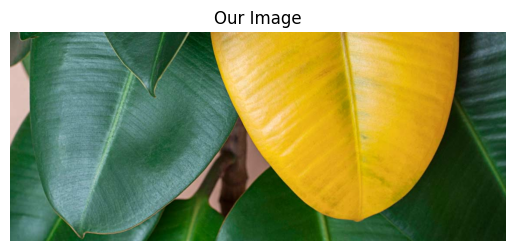

In [14]:
# @title
from PIL import Image
import io
import base64
import matplotlib.pyplot as plt
import numpy as np

img_str = """
/9j/4QAYRXhpZgAASUkqAAgAAAAAAAAAAAAAAP/sABFEdWNreQABAAQAAAAjAAD/4QMsaHR0cDovL25zLmFkb2JlLmNvbS94YXAvMS4wLwA8P3hwYWNrZXQgYmVnaW49Iu+7vyIgaWQ9Ilc1TTBNcENlaGlIenJlU3pOVGN6a2M5ZCI/PiA8eDp4bXBtZXRhIHhtbG5zOng9ImFkb2JlOm5zOm1ldGEvIiB4OnhtcHRrPSJBZG9iZSBYTVAgQ29yZSA2LjAtYzAwMiA3OS4xNjQzNTIsIDIwMjAvMDEvMzAtMTU6NTA6MzggICAgICAgICI+IDxyZGY6UkRGIHhtbG5zOnJkZj0iaHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIyI+IDxyZGY6RGVzY3JpcHRpb24gcmRmOmFib3V0PSIiIHhtbG5zOnhtcD0iaHR0cDovL25zLmFkb2JlLmNvbS94YXAvMS4wLyIgeG1sbnM6eG1wTU09Imh0dHA6Ly9ucy5hZG9iZS5jb20veGFwLzEuMC9tbS8iIHhtbG5zOnN0UmVmPSJodHRwOi8vbnMuYWRvYmUuY29tL3hhcC8xLjAvc1R5cGUvUmVzb3VyY2VSZWYjIiB4bXA6Q3JlYXRvclRvb2w9IkFkb2JlIFBob3Rvc2hvcCAyMS4xIChXaW5kb3dzKSIgeG1wTU06SW5zdGFuY2VJRD0ieG1wLmlpZDo1NDU0OTQ5Mjg5NjcxMUVBOUUzNEVGQjBBRkFERTQ2RCIgeG1wTU06RG9jdW1lbnRJRD0ieG1wLmRpZDo1NDU0OTQ5Mzg5NjcxMUVBOUUzNEVGQjBBRkFERTQ2RCI+IDx4bXBNTTpEZXJpdmVkRnJvbSBzdFJlZjppbnN0YW5jZUlEPSJ4bXAuaWlkOjU0NTQ5NDkwODk2NzExRUE5RTM0RUZCMEFGQURFNDZEIiBzdFJlZjpkb2N1bWVudElEPSJ4bXAuZGlkOjU0NTQ5NDkxODk2NzExRUE5RTM0RUZCMEFGQURFNDZEIi8+IDwvcmRmOkRlc2NyaXB0aW9uPiA8L3JkZjpSREY+IDwveDp4bXBtZXRhPiA8P3hwYWNrZXQgZW5kPSJyIj8+/+4ADkFkb2JlAGTAAAAAAf/bAIQADgoKCgsKDgsLDhQNCw0UGBIODhIYGxYWFxYWGxoUFxcXFxQaGh8gIyAfGikpLS0pKT07Ozs9QEBAQEBAQEBAQAEPDQ0PEQ8SEBASFA4RDhQXEhQUEhchFxcZFxchKh4aGhoaHiomKSMjIykmLy8qKi8vOjo4OjpAQEBAQEBAQEBA/8AAEQgB4AR0AwEiAAIRAQMRAf/EAKUAAAMBAQEBAQAAAAAAAAAAAAECAwAEBQYHAQADAQEBAQAAAAAAAAAAAAAAAQIDBAUGEAABAwMDAgQFAQcEAQIGAwABABECITEDQVESYQRxgSITkaGxMgVCwdHhUiMUBvDxcjNikhWCwkMkJTWyUzQRAQEAAgECBAUDAwMEAgMBAAABEQIhMQNBURIEYXGBIjKRUhOhsUIjMwXB0WJy4YLwkkMU/9oADAMBAAIRAxEAPwD54BMImyaMU0brNEi8AJdpmhKoA5DpReGCCbCpZl72EchOAqZwkB4tRfPhxNjQi4KVZe4n434OjGYcDVpKcxIFuTx0SREieIqXei6sfZZpR5SDdDQn4peqMddLekc5MpFzU2Cf2ZCsrGw1Vx2neCX3Y8Y0BLlkRxjJsrZWvxo/mpt+bT+PE666/NOJ4GgcjRYnkXKbJKEj6IcBrV1gGYkOqjO3nrnBW3Q4km1FcCL2bxTgGQ9NBZVIM5S9uQYGjo+wRWlVUYJSYn4phjOqeD5RGNtQdlWGISqSycYS/RXhggSAC3inICxhjgfUXjsqR9iZegCP9uJGhoie04gGBd7BVDP/APbggcmG66Iy7cP8iox7QgPIVOisMAIacS/RVAfHLtx9zJ27bI9EkMECW/V1TDA0WEa7jRMMIdsSQPtA1RMMUPtI40SmLXCsY4ZAX8WQCyh29wWlsFuMSKEEWFfqiMOAiknJqQFj2cB9mQE3MTRAHHCMZAxNfivI/K9qcWfnGkcvqBG/6gvV/sZxrGTEB3BUu47XNmwShIuRWHSSneZmcdDnk8MwD0oAsxAcDwTwBiT7lCNOoQ5GTtQaMo8BUJes1d0wjECzyTmIBcAV3ScWLiuzogbkSWYAIswoUSTJokcWDUCHOMA1zvomGcx1qlM5SDW6IExkXkW6ocATQuEhGBAO+6PI7PWjo8LaDdMPbB16JmnEObKwaN9EQZaUCFyzIAFpM1ETFrFZy/pteiDgOTQIBSQC92+CTBGWXMHqHRnOJPpr4qnZgCRmaCIJWfcvCaHfZnmYg2ouEycuqZvvJf1EqBRpOBr0Y1KDuERdhqFo2VKYRo61ujJifSClYylxFykeHb+J7KXd91GnoFZHoFf/ACPvRlyx7TGWxYbtuusGP4n8Ych/78o9O9V817kjIymeRlUv1US5ufLou/brjxqdP91iFXjEig8tUnE6aKmeSVBponGQkeqv1RAgfuuNkDBjQu+yDyaIFxUfNer/AI7MjvZDSUD8l5IEo1XofhcvH8nhEi3ImPxCy70z2t5/41ft7ju6X/y/u+wjAv4p+I80cYVREC68nW5exQgBx6qkPUCTYJIBz0XTCMYlrUqFv25n5M9rgccWI3ayqZAl7AKEpsf26sl5uCHd9ld2knBTlczgYSH6jUpefIAMx3vdCOORiG8wnjChFQ31We12pzED2yGpRPEB+iInFiNNehU6yk8aFTxOnJ9TcgKboCUiwcsaB1hF2lZkwaosRZTcgpg1SgY1v5pwafNJLQHdZ9zGDmSl/JAGtNEzHyREWtqua5qitfcotpomIcMLpbFK8BnDIGjFZkPDzU7Xg8Ca+GqF7WRAdayi2mVg9dVn80DfotZAYOyxWJAH7FhboigHWvdEhkoIKAzV+iyDraoAEslkQiSpTLvqqkIJyDBSLmqYQJL/ABTcAB1V9C6piOp+KB3sE5f/AHSSj5n5JwYPjIMSLOEe8JlFmvEJYNH1SurZYPjEjqF1e2v27z5VG3GA/HiLRbzZe1Anj91914f44tK9HXvwgJQ6stexc3eeVRv1gDIQwk3wW5tUs6M8T1FxdKcRHhqFvZsnIksxISGUbChQkJUcEBYwJP0UbXbnEXKxIIYnogGIb5IES2SEl6hY7dyzrFRRw3mklqWokMiFvcNjqs73Nbx0PAe2H1SmJtdMZjUIiUaLOzW9KrlIirpCAA9laTFDgCsdtDlSqh9U7B0CGKylNN2WdMRqgwVymzokulstXVGAZlmSkkIci7J4MSAyVtUX81jIGicImqU3ZPdA1VGnIVSGisQ6nKPzVSglVtVmPkt4qgzqU7/RUNqKZ6p6lUsv2lfn/dF+5yn/AMz9V+gZvsPgV+fZy+fJ/wA5fVep7D/L6OX3XTX5lFOqKATAOu5xmhVduKBYEBcsI7Ltw0DEqomunFEarpjGQIOhUISiqwybfBWiqEkOicwMWKSXImyFAG1QKYSAoLFUExMcWqkiAQHCvjhG9k+SIxAayX2agmyrKVWC0QTGttEsFR4x4Nosk6Osgk08IusyeIZYuk8XiRKNCKqWbs+xyzOaUZQnKsoxZiqkUCWVAiyUrJjmFgMOKJ9rGIf+V5fEqOWZJHVUkWiVz8nmB1Skk6I2vgbuf+0EUAYFlzSrTUq2Yn3JV1soN6m1U3q59utMImNTXonAdvogXMWNVWECz6BVEBjjYrphxYyJ9Mfmeil6RTogZuwiKDROHOFfeJHEC+pTAgCtSoet2FDsqxBat05TyrGLkGzK4MRduq5hE7sCsITNAabqsm6xlxCkiKq+PNiABcPZcWHs45HlKbNYLoh28WqTRVLQ64dx215FzZlv73DGRLlzQFch7Z/UCQ1kPZBcEF083yDsHddvwchzeyI7zDEca112XHHDJ9W6rHEHF3F0ZodZ7nAWYsWRh3GFuIPqFnsuWOKFARXdOIxDkBjo6M0OiOftgGcAph3GORIJHE6qAxYshYvGRQn2kRJonp0TzQ6RmiJUYwYsHTiUTUkAUdrLhPbydwQ1iknjlEsQSBUMjIS/M9rGOSOfHXHP720kP3rijwMSS+wAXrY/WDjyh4TDSfTqvIyQy4M+THIMYlj4brLpcfoq8zLe5AHj9z36LNilVuJ20QEKHUlEQIpYHVNKWTK44woPmVOUJEP8gnywL0N0kYyd5E0SMvtnxVoxEQ1kY0sL6rEeaeBQiA9SmAP8rvqj/TAZiNkDKQI4miAakb6LcgbB+tkgBd9UXY1LSu26YjESf1Gp0CQxraqJNyaFJIk1JSMkwxaVtVeLY+2JP6i3koCDzAkWa6r3tOMBaIsst+bIi9XHkl5v8VKVE5rX4JJF1U6Kk4Ct0QzugjTRBxiV6n4TsvfzHNk/68dSvNxwllyRxxDkle53k/8A27sY9th/7cg9ZU7XwnivWeN6R5v5nvT33dGMD/TxUgNCvLkGJf5K0of+pK2khXdPGJhFttykCYl4lUBjkIf0y3QlDjUCm6UgCoQRpQPLoVuJCeGRwIny3TmAYG8el0FlEbgqvbZDi7rDkN4zifmlkKgxDHRasfuFRYpWZlnmeu2LL5V+gwfSiqIkkPbVcvZZPd7fFlBfnCJ+S7o/7rw9My3W/wCNw923iWeLRaNWSyymThmNk0hYDxTY8YBK31t6RnsnCE5EuGCtjw0oPFUhD1Bh5FXAAiNlc1ninNbg2wOyJgxNGcVbdDlX9yI5Euf4qrZ0g5TOEEk+YC3AafFWHoAFnSzFf+V1nddZMqmUrlgaLAb6IkjkRrulDs6w23ORpXca0KVnfpoqM9RZYROijbXKih3dk1LajRElwGvYpJbvVKya/EC7ONrFTIYdUXMn0R4uPD4rPb7uhpsFtETTw3QFmWFwoTRK29USaIO5UcgDRC4Y2TNugAP4KhlmCBKJZzVY2pbRL5kmSf4oCJJqjIaop5NiAkkXKc1ogIpz4hJpENoj7dKqjhAp58gQhlOScpT8AqgTOyEqCtTsmlemqViC481WCsCIPIE1Og2XaYmWIwJcCxXJG4Juu2DGJAq4db+2v+p6f3TDPdydt6cpGjr3sBPESegpVeHjaOcjey9jtyeC09ttZ3d5Ub9I6uTUuRUIgPpdT5AVd3sniSSK/Fd0vwRj4txEhsVPgSHJY7qjEmqzgaWRcXrDiJifjqllFz9Fd3FqdUhl+5Y7zXzXHPKAZSljAK7GiSUvELDftS+XKpXFLGQKeKmYm67ZY6MfJTlj1Zcu/Yxczhc2crkdETMmipKJ2SGPxWF9U4uVcByKxkCgYgIMbhHUCWWSkoEpyGYhBg6HPRDk56JzIHRZgVjILOCHTMjVosU7BKAqlBbWWFkzOh4p5BCSCgS6Yxq6SVEwDJSgaJTJXIBNUhoapuRF0k6lVCqOd+JbZfn2X/un/wAj9V+hZvsl4Ffn065Z/wDI/Ven7Dpt9HJ7rpr9QAqycRCUGqcBwu6OSqQLGi6Mbmuq58cXXZhYBtVUTejpxQcB10wxRjJyo4yFZyz3VxNUM4g7up5YAlwhK1FnoxQR4AyAGgTPVh5pMeRmGivHGZAyCZFcAIxkZR4vXRaOKRLbK2Lty/UI5JP2j5rLp4VtVlkYJy8U0QgAnjRYOrDSUslqp5lc+SeiEbXgk5kUUsbnNHxWlKpVu37eRicpoAlbIy5tSzVyk/FJIeoHdGQeZKQVlQ0S8WG1VBAoBXVUjINvE3Uxd/mqxgWVQCwagfxTwLWDN81hL4owMqsmDAEzJ1KeIu4S8TypQaJzFogpmaIFBpurw9oCvkyhGNKFYZBEsRbVOU3fhy9vEEGPmnOaN4hw6hhyCUDEQof1KgqwFCFcob+4ahiW+aw7iDfZfdEg3NQEOD1LM1AmGn3GnG1ilOVxayxjKjs3RAj9JFrFIFGfeN9RoUpzRIaUZPYlV4gkClbFaWNrgHxQAx9xhiQauLFXxd3inyJN6F1ERgTWDUoQsccGqK7p8h0CeGRLMzLCGIkgEea5zCIL1r0WeNK1dGQ6JYYEvYs1Fz/k+054BniXyYYtNv1Q/gqc45CwpILY+US7uLGJLgjUJb65nHWdD1vheleLDKbAP1TmEjU33R73tz2ndOK4Z+rHs23kgCZ0u9Tss9bmCzFRlj613SxiZF6ll18QGEvV0CnllGJbHTdPBEMQOg2QDgOzbIAB7uUeE29IfxTDMLmqYRDP5oAZR9wdkSbAiiDgFyHJY7BLxBFqqkpRBO2iSU/ADZBl4gXBOrJZFhZhsi8jV0kwwfU2U0qbBESzB7BJ3WQGU21LDwVsD4sU5tVmHmuLNIlgTUrOc7FOqRLRSsLJpkW0S00VrAhvBbR1iunsO1PddxGAHpuT0StxMn14ej+I7aGHFLvc1BEeh915/dZsufNLNImth0Xpfks+OQj2mEgQxXG5Xm+2W2GynWf5XxLe/wCM8ExCMzWh1CnOMokx0GqpLGLgpBIfqDvrsqRlFiDSoRAEn0lsrEG8Pj0UZQYghq7IKgwFDfTogDMScUTxY0NExxMxDkGxSwDCZkGADpZRl+qpW4SBd/IKgnGQAlQhBvqv8eynJ+Nxg3xmUD5FwvbxxoPmvmP8YygHPgelMkf/AOJX0wJagXie4n8fuO5PC31T6vZ9vt6+xpfhj9OD8fUBen7VeERfZSiDSRvb4pwJHVV29p1VtFOUatQsyaETK/8AoJYY3k5oArxIjWi6Neeb0QAxhqaVRMaEahG/QLUFrp3AJQlyhKvqsQjKnmgIk3oNAsdr4KiXE7XTRjpqqsLNogzElqMs/QeSgM26BZzoiSwAsUsn1StxODKWFr6JWehTNrrogCD4rDa56qjAB+u6D7fBEuS6Qm4Cz22wZZVrZDREOiACC2lljJb4GVhqs7HoiwZzdJIhwCnNb1LJiAxSBnIdAyLbN82S8mPjdOzBZHjqVnPlolMj4unuoOFDuyLdVhdYmrCyZjog61GolL6XTwGKU1Ta1SyTgKSkJqmJZIbq4GJHipyLnw0WkfJZtkytblWlyu3tjYHWhXCLtqu7tR8rq+1fT3NL8We3SpZRxyiTasy9fsyBjD6ryu4H9SQ2K7+0keIF1vrZr7jbPVNn2x3oxFqeSiJk3imOQWs+q7ZvGeFHqaUZAmx1SBtJVOyabM2m6LtwcajkJDEH96x3Zlg3kotl6qJUFAuCmILusbLGzqpMk+PRD9Nbp2HydAh3+Siy+akyBJlMgV6XVTEhJKLFYdzXxsOImFVPXorOlIAai5rJ4VXJCPNIYlUICxANUpcGgywBVDFZleTTPRAlMQg3wVQAJdUQUhDFYungKBvisUh0WEkYNteiSYdOapbqoEyN0nAMwVSEpAZVKEjZJIuWVCCHUrnqFpCqfcFsct2K/PjWcjuT9V993kgO3yH/AMT9F8CLkr0/Yz7dvo5Pdf4/U0QnFPFTBTP8V2xx1bGQCxsuvGQD0XFjBJXoYcBoVUKrRJP2qsebWVu3wb/Bdke3gKhXNUVxY8c520TjAQa3XXxxxL2KSc+lU8AsMMRe6sYCEHBqbhTxguORZGeXFGQcumkRdW9zjGlyuPJ3MRWKme5lIk6BL1QV38+vqWXme/N3WS9ROsXTOLoRopTnXosXVbhss2FFx5JF1eUgXdCHbnJJ5UilbJyxuaTtsByzc0ivSzARwSjGwDJYQjCPGKOYNhks+btmotxPTPrXlEXSQrJgPimf1HrZNDGX2VsdusPEB2NhsnJNtBZKRo/kmBi4J+CoGjEE7A6pwGskjJx6aMmMpaJw1IuXLp+JLPbRSBk7WCpEHU+CYXMREXFqqvb4sUm9wuFy+5F2uBddmEQkOZLMKMnDXmaNCDQFlGUpRNgSrwyGQY0Gic48bRoHN1YcUs2QNQbpPfm2jrulhLfbTRSl28tYOjFDjPc5DqARoyH9zkDOa7rsOCIFYgN9xUj2xl6scROOhslihz/3UjXk5F6Lf3eQhnB8VX+1yEfaB0KxxzB4e0KXKOQke7ygikUB3+kocgdQVY4QQ5xP1CWXaYyCY4yCLxv8EcgI/kIagjon/vMBFy4rZRl2WM19UZBJHtpAmhdtkZodWPuMMg0ZAS60TDPjk0eQrdcBwzjKhWMJE2CM0PSyQxd3il2spDmfVikTaW3mvJjyxPjmOMokiQPTRV9uZLtUK/cQPdYfdEW7rCB7o/niP1jqNVntxfV4XqqczHjE8YiQ7fFJLHycxQx5TwZqnVWjEM8j4hX1S45AQprusJt52KtMYTSAL7qEoQFQXKQOCbk/bqUnuEAsXCmSDd0WjoKIyo3OLeCwjEh7aIcaUPigzDdBZ5FiCwKlmJdurOqAGl62KUB8oHkp2vAvRTODi7eEZC7nxXBIgy/YuzvpynkMTThQeS4gK9VOvmIWVTSj6JQGTSBc6EaJE1CAZFhcr6DBjH47seZpnyinQLh/EdmMkz3GUf0sda7q3d55ZsplL/rtEbBT+Vx4Tqr8ZnxvRxyEiSR6iandYF6SoQLq3oL8TbTVQyPKoDS6WV4ZAYGNZBIYcg4DEqgmQz1GxR4iYeNtkEg0oitBr1RgIzBY8ZNY7qntk0LkVSe1OBBZw9WQXKfA2N+tEIylEtcD4Kx4k+qj6pCCA0Q8d0ibhKVi51ScNNk0ZTiSQB11TRyxkXyBtv4oOdHX+E7j+3/JYhL7cj4yf+Vj8V9zjAP7l+eu0xOF4EENuNl972eaObBjzi2SIl8QvI/5TT079vueF+2vT/4/fOm2n7b6v1dgDggDqPJUgxZlogJoBj41WevGHVT8Xd9LKhiN6WQMgHB6FAzGnwXTnWROB3G10spOWFVqyNmDqog4DhlPO3QdCCJd28GTcCKtQ6KkYhmAqViRBquyr0STkZSYA7gJJEGllpO9KgoxiDU3CyubcSGThKXgkmDuryl6FEuxfZZdzE4l6qifTRY2RJpSh1SSr0C5NtvLmrB3H1ZZk/Gj2RYMOl0TtZ/IskEaeCBYdNyiTsklI3OtnV4kgI5JpTqUkqXunID0Hmgalljttj5gjuK6LcHqnEd0Q37lnk4XiB/FDkzpykaqcMEC+tU5CxAZPJlHh5rFkOSEifijJZAyfxQLJGq+1kSXFfgqK0CQpmxCcpW3TkGCgeRSmWgRk5sgIVVRN+DAHku7tS0hHc2XLAMeq6cEmmBr1St+6XysKzg/fADIW/UHfqFbsiTEEBJ3EOceWtkfx8zFhZ11bf7+m37kf4u71Atd0XJ3dVPqb9qVuEnXd6WWSHiWLV1W8mTFpFmLLUq5U3VcpDU3ssZEeCLPV6BAxcfILG63wXKAkbHRZ2B0ISkHzCEjpZZ23BmBfwRe7KTkIc21WfrPCsmLJZMl50W5ApXbr8TJKF9UhhQKxkHZKXtuufbWeBoFwbLalVIHkpmLVCy+FUQj4oEpyKpTFlUpkKxsmZLJVDI26HFMQWQVApBQ1TkoEKpQQ7JQSnIdKyoFJKz1ogUpKeAMgD4qGpVCVNXqVcf5IgdpmO0JH5L4WK+2/MS49hnNniQvioh16vsZ/p35uP3X5a/Kj9U8cZKaGMOCVeIiF2yOWnwYo3l8F6HbwBY6BccMkQOqtDuCzRVzERXowl6iHorSyxEHeq87HOdUzmVCWT9SXR/cxeqnLuw9KqOT24AVcqUJRDkotJc55yJIskeT+oqUu4FWUxMmTqcnheRfVH3BELmlM2BWclLKat75d2WUmpaiyWSewSWXMSTJhV16GLsO5zFuJAXs9h+BhAiWQOVndvLl1fx7bfCPJ7H8RlzDnMUK3fdse3AEQwF19lDDDHDhEMvF/LdsJRkWSuvjVb9ueizV4UJAxQ7kvgISQcSMTomz/wDSUp1cVeb1IshGUv4pxuzhaPwcuqjO+AxuH0RAdzoEeLVe6womSkaRpfdPGqmCT4BOJS8lUqjxDlOIixokiZE0oyrDHyBJKYHHjiTv0XoYMc/ugAemjLlw4Jk0NF6eKIgGJ8VWsNExzCTmIgEfVTUixVpGQ48qwclkvNv0gF1YSOTKLRpqhHupc2MXOysZCRJCWUK0iH3TAnLIgf03PwRM2HpgxKnGcokiTHwuqe9GER6QZGkgUBM5SKyxu+gSnuIiT+0SNlYzNCQBvFIc0SbC9SEABnxE1iYvYLcsT6hCYjKwDXohExlEuDSzIAynAxu53R4gsRIF1OcQzh2N0sYh+IvukDzwxJNBZSOGLRcUs4TyZm5MR+1TJmIekkjRATOKPKjhqJIc+3yjJE2r47hOZZBUXN1PJKRYyjUaKbIMp9/24hKPdYQ3b5Lx/klrFJF8kWt+7dWx90IGWPLDliyUnDfqOqnmwHBxy45c+2mfTMadJdVnL6bi9PBV55n1YYDcW3XPmxF3enRdJyHg0SyjKJIq4G6upcoDAgAsmHIMLCyoeEQON9QgZ8qFI8pm1S6YGI8E4gJVFUsogFmqgJkkmlAAm7eIeWWX6AjMf03ld2RYR7cv+tRsK5ZAz6kl3UjLi3G41V6DHb1H6LmcCRoiTEVOIU/dWpT9t28+5yjHAU1KkHkWFyvf7Lt/7Pt+ZH9bIPgFNt6TrT1meb0g55ww4o9nipGLc5blcsoSP2/aPmqESmeQ80h5AsB4jRXrMTCNts3KJhX+Ui6X0l3oV0Ti8PSQPnVTMX+652TJzzxysQ406JImcS703XS7Uk5CE8RZ4m9gapFYAnGYYljogRRg72pqpywSgeRFNtVXFlFRIV0KBnzJLDrxpopEcGf7TWlV1zkWeALtq4DKRhEtTiDQk3QMJ+1y9UWrRrlTMRyYuFQgwl6Q767JxkiQ041OtUFx8koOCQ9F9Z/jmf3OzOF3OGRiP+JqF8tKJjegXq/49nlh704SXjmjT/lGq4/+Q7Xr9tvjrp98+nX+jp9n3PT3p/5fb+r7OE/SzOq4xy6NYqGCv7l0wDE/JeX2dvVrK9WqkEsKORdAY2Hyqmj9276qpZl2aybdUW4JGIYKvAMNgliCRRwRQJ4sA1P3rTWYiaBcRprqpgcvSfDomMiTTS2ywgbk+ACVuacIYxh6fqkcAb6ErZAS5dIHAWG+2LZ0XIBLAkqZk9BonIv81uBuzBcu+t26dFRHi58E7CjqvECoUckiKbImk0maM5Zw3ikIP3fHZYF2c3QyzDUqNVNvFv6AsjqNVOR5MNU0ou1U4hEAFZXa3M6HgnBxRKSypI6CyRvNZb2Z4NjJw7JQPJk37EAkeAWbUpgz0uldi6eutvQZDSqSc2smMy31UCKk76LS6yYyWR5FnW5UfZZijxCngguHHxQIp1TM42WA3RDIx1WYJyNNCkLAqpyZOLFEhCcwKJeRKoGcM6fEXk6kz+KpjAFZaKb0TXoSJ9lxYH6qHaHhmIeuytjJlhMSL1XPCPHMQb6rfuXGna3nWYZzxj2nPF/MBM+two4J8ou/kqXNQCvS07lusvmyurNUljaybiNPJKaCoLLcuLUIKr1TxGCyhXwSkHi4NE8pRNDqhYF9dFltNeVzKRBJEtBcIOXbRU0SEAHqsdp8VwvEEABLKGyYUWa9fBZWS+BpkEdWUyS6u4dlMxDFY76eVVCcqn5I86ocd1uLllz27z4m3JYEEF1OUTos6jBmoyDJXaqBJd1UhmZ0pCPIoOCqgKRRkpCo4SmqqUJkFZkS9mWZVkym/wBECESNEGuqgJIOkPzTlTcgqoE5VskDFUmp6LSFXmfnpN+PydWb4r5CK+r/AMiLdhLqQvlIr1vZT/S+rh91+c+R3OieLvdIPgiCSutzOmAjqV0QMI2XJEqgBTymukZRv5Lc5NsFKA12TVkEESUySXSmThgqDESqQ7Y60QHOAVWMSbK4wgABUGJrWRgsueOAyLlVGIK8caoMQdk8Jrm9oMsuz2w3FqrIwT7yGDFCwCo6CyyeiYLj73FygV1pckeUWQHxneYvazPobqGeQ9kr2/ynbOCQF4OUtiIOinxcXe09O1vm5CfRRKDqzDZEtxQg9QSqjmpmJD6JxEN+9aIbzTgPZMMTxDabp4j4JIgEhzTZWnKDADTyThnhallbGX0tooRylnApsnEpFjYbKob0ISjFnPinlmuTJiPNcQL/AL05BIcGiuB1SzYwL8joknk5tU0FuqlGAYG+ysANqpgPeMS9wQzrHNMAMOjoFiPtZM0uI9NEBP3uJBIeqMsnIEG+iJjMxYRDaoRxTdyLaIBJdxlcvZT97JxYM2quceRz6QyxwF6DwZGKET3OSMePEboR7iTOYtunlilUSiEhxGzfNLkN/c1Zix+DKkO4iDS43XNPHOLek12S8TrEu/mjkOqebHIE3KEcsTHx/wBOoRNLGtCllAPQpZoX9zcvu2y0iNLaDVc3Cha6UCTsClmhY4+TMHfRN285YJHGI88UvvxysQVESyR+2VLBdeDJGXEzhyNqJXFmKJbLmId32ku3bNh9fbyqDrE/yyXOCZRoXrZex20RkzSxBjhkGnE2K4O+7DJ2mUSh6u3P2n+U7FRrti+m/Sq6zM+sc/ASL5PTHdSlA7NHddEScg3Oyxx8RudlphLmA0AusMe9VUyxg+kF9CUC9fr0SPKE6MNEO5JIjAfpr8UxDzjG5ukzn+odxRRt1LrUMhIxOdTTyXK7eavnJ4RHUpe3wyz5hjGvyRavm2R2/i+zE5HuMg/pwt1K655zlmXDfRk0+MMccEPTCF21URESo7AJay/let/sW9nGs8P7nOPYn6BLxJ+6+6wyMeLPGwVngwYOTZaRDnMDE8npoExlGV77FUMHLE63U5xr6Q4/mKDSIP6h6dSEoPAvH51Vb0JTewbBq7pBAwOQ8neRupGE+TxiCVc48kZPGp6JuImCLSRgVLFNnhkBBNjcAJpQlWMDyif9UQ4VadRumJ4BhV2bZkAnDiGkzG6jKEQ8oXH+tV0yxxkBxAkBcpThItFvCoQHPCQAAPqibgrqwThiy482I/8AXIE+V1M4RKp9LVtdQlCUJMPIKbJZZelmKJbLLOs5n0foXazE4xkLEOD0K74igXzv+O917/ZREy88RMJeVvkvosZBA6L5/tz+Pu9zs3/Dbj5Pbm02013n+UyeD8tlagqSwKkCBXXonEZSIJoy7NL4TlNES5AiNANVogkhzRNCMY11TGVaarSTxtTnyExiPC6kZGo1ejaKhL+GqmeMQja/Q4jM6XKmXTycllTHjcF9LbLl9N32XnBIRJHI22QJAcaaK0mAYWN1yyYFVvPRJIU5bn6XZjspya5QlIiyaEOQMpLntu1xOcKSKzJyGSciSPmstsTr1VGLOyBdmQNzsULhljvv1h4aWjea1Sszo8Tp5qZLt0h8FZ0eLDwRIAshKRrvZlrNJJm9StJIhRkS9KDUJ5M/11U2eR62CJeeABJemtFgC5eybjVkQDrZTvepFGo+CYDeqPHZHTqoOQrHT5oGg6ppFgoz5EVoNlesUEpirXF1MknV90JGQ+0ONkfbJqTfTRaYkBWJsKphD4qkYsK3QlLje2iVpBQdSs4dkkpsHsEgybJelF2j1u3JljYXXPlJGYS3Vez+ylSp9yGmNADRaW57En7aifk9LtzHiP3KwOrsy5O3yERFPgqDI7sSKrt7Pdno1nwRdeXQJAmhc1dNRmvq6lF2u7o8jstv5PMSH9N/JTlxNlnoK3WZrLPbbPgqQpDGiSbt1Kc8n8qpZFzayy2+CoQmVrFbl0oFjIP8kJUssrKY0JZY2Su7AIOophION0D0R66LLHadTJIJCGqqlmO6QhY2YqoSiUiqchJqVUMtjRYorHZUCOVjJYhLqyrAZ3RcIEVolYgJyAzhAiiUlDkVWDYgspkapzIWQoU4EZ2SMwVMgSEsCtIVeD/ksv8A7OMd5hfMhe//AJPL04Y9SWXgxde17Sf6U+OXn+5v+p9IIBVIxCEQTdXx43K6WDRgSzLohgyEOAwVMUIgMV1QpFtCnhNc8O3OqrHAI6UViwNLDRabmr3VSRNIMcSiQBK9EHiBU1U/dHwQSxHKQpRZwKFTObyZIJEpZDqjx1RlkAtdQibHyWkXkjJLe9J30ZZS5R5M6yMk/SEEVli9FlkFkByd7hEolfKfksHtCRsCV9pOPKLL5z/IsIh24k15AJY5jHvyXt2+T5sSiQdUziPipxLSO4TACVTqiPOt54UEgaCyJkzEUJoliKNsn9NtSqMQB9ywjWtymiAAOiYcdAqPCkMZkwCqMVQHUociCdSq44SIBJqTZUbohwZqBODGyQYhYl/BUgIMQY23VAfckGIiG0RMyS4HitEgAAAEA3RcuZRLB6hMEMp7LcszWtd1QCUrhOISs7jVPAc/uZgGpe6eMsolpX4JzhBB4kqUsc43kR0RyDmWbjy3uyUnJQtZNjLA1PULESYtKmjoBOWUPyjTTdKMxqJRHJVhM8CHfQJRGMnL6IBDlfjGUDTVIZYneTxIVTAxZz4boSjyuA7JBIiEiz3UzDiasYmyYtEuPghyD8Lm6QKY+hwxIKlwL9QqmIoY05fVSg7y3rVKgDHkCwqCujtogD1D1GyTETyDl9G3C7ssYDHGJ+6VzsppK9hiMYymbSsknnJzGJAnhk4nHcBdGMDFgobCgXnvMAzZncLLWZ6iWzGEs3a+0ff7c8+3OuseklICM6uxFPNDB3WTts0j9+GVMmM2IV+57WIEc/bPPt8m14nYq9drLi9L0rTjaZn1iEsFQABIbpZYWi5Ztl2xxxjDlE6UUcuMY8cpGTnYdVphDz4xIymWkVzkxk5L9PFdcokY55Sb0XHNx9Vj/kJ1rnmTOQjqF7XadoO07X3ZhsuSz6BQ/Fdtjlkl3WYPjhYbldncdzLNlPINECg0Sxdtsf4zq0/HXN/LboiQJWFSkIJIBF9VYNKgoy0gHtYXWrNzygRKoppogJGEmMWV5SEfuLtZTnxNxQ2KWCNAvJwX67IxAeVXi1r+ai5gaV/cm5Ehwb3ig8s0eJMAw+iA5xNbJonaqfiZVlcaaJhOUWiCC726pJQIfi/I+SqImFSfJNGEDHk/q1QSMZEkDIKhJlgQepuumEASeYcCrqZyxBIMXexQblAlEv8A7Lqwy5ikrXB2SyGsWINwyi0olxpsl0DplEO4LgeRSGEZhpNE/wAyOPKJUJaWyoxZyAyfUOv8AT23eSxO8M0XDbxsvr8MqFfB4zPDmhnxn145AgDYL7btcscmOM4mkgCPNeJ/yfb/AI/cdvvTidyem/OPT9lv6u1dPHS/0rtFY/RWjOm5XPHl5KkQxZ6KO33LnMdFh5Eklg4us5Ae3RMWiL0CjKRNRquq7yfGoxlT3Iin0WMgSwspxgSSdN1UARqSymerbr0O4gQxxjWV9VpSaXS/ijIybqpZZV+iW201nHAnNLMmuxUJ+osKp5OUeDAProua53vwX0ThAGp0RySEY00umkQI0USXvqp32muuJ1okAlw22iT/AEyJLH5BCIJd1x7bXa8dVlZ7IiKeMOicxahDKtexcZ2FpIhY0iiaJJVb5rTia4wRZEH7apS7vqmjAALEUU7XEzREmFXW18E5D+CHEBY+rPwVIACADCtSnb/dCgQC6P8AEJSTp8USXNUDEnoE4aU7UqUhhIsZFxsr8SAwHmiI71ZX6sBLiT0CLMCAqH5KcpAeKXqtK0popTkCKoymozLjoq1ibSTkJUFhqlBYsEaiyFjS61jKvU7GdG81TvQ1eruuXs5GJquvuD/Rrslrzrvr5fcfjKp2sqD6rpiwJO64+zLBvgF3OGBIq66vaybdufBG9xWF6C6Ilo7eKAIenwQMdRULovb8im5uWguty3opGJAcV8VjMtXdZba1U2ihkN0hkbBJyaRdkXBKxu1i4BJsxZKb7JnrutQ1Ki7KkCNA61XtRFo3ARpdKgrBmShwCNU50GqUjVY7YMllnRr5lAgMywqipDdUKQpwylmSm6YhAhXAGiUjXVEoEqoYNRAuDVMC6xD1CYSkEpFKJ5ApeiuAjIGiYpS4TgLJj4qUrFPI1DKcjQq9esKvlv8AI5P3OOGgi68qNKrt/Oz5fkJA/pAC4ASvd7Ex2tJ8Hm9+57m3zdAMdFTHIuueKtE7LZjXXAPqrRyiNFxRJIuqxiTc0TyTplmepU5dxKdBQbpKIyMWGiMpK8pG6eEHKTmB4JfdbVHAX9FXKbnGMaarkOR6BH+pJLJOj3aUU5ZibFD2y1UwxhHJYI8rvVZW4RZtVkE/T1lkFm9EVlkEAV4f+UxbsIS/8wvcXjf5S3/t0X/nCIz73+3t8nx8DEuTcoxuwHghAX2T0enkiPNECRZVhGh2FUj2ahTh/L6qzYRJrojBgK3dAPIsKJhiJkyAvGWNnJYnRk8covEE9EvtDjQVVsOFtKqzGOQyJoQmiZMQzk6q0MTX1TyERVlUDl9euiw5MGkzq4OOoHwSOAWY9EAoOV70VImZB9dXrohExGlyxdGUb8Q4OqAw/wCRfZKQJ0JKBJsAxWByEg/FAaWGQN6ISxEBnqsMk2INkwyWcVFigJCMh6XpZDiQL1F0+Tl90RUFLzIcmNaeaA0oux5fNA+5INEnZHlFmIIOgVIzhEB39N/EoDmnHNENEu93UZHIPX8F2yOOVYkRc2UY45F6uA5SsCHvyEagHomjkH8tDo6EsdJR8wPFCQkMdbix8FNyHV28MWQinAm2y6jjOXOIRLcakqPZCJxyyG8f02ddXYxEhKUaVus97x8yDvcnCIg7mV1DPKAxRjIu1gE/cQOTuJ43cD7SuPPGXMxNCNEazEJyzMHoGXT2HcDt5nFmeXbZqTGx/mCgcOrtsg1GPkdk7MzFVrbLl7X9n7eTiWOIh4HQg6qXe4BHGIRF7o/jO6E8R7XKaxrhkfojnyPiJkfU5Egr0uZ6b1i9pMZnSvJ7wCHZxEReVV5sgZmMBWRLBeh3h5dvGO0qpfxXbe73YmawxDkfJZb3GaWkzth0jEMWMYBeIDjqkAIJIqOqpkHuEziXJJJ6JYlz1CvWYkidrnak4uSUHJvoL6KxJtGoGySMeW/VMgALu1NEs4EkkMypW5DRG6Wfrbj9uulUzSOJzQ0FypcSC8L6LoYRFD5JSAAZ3+SWCLjIFCPUqHKwtXdczyd9dlfFN2Mg5FkgMi9ZC9gEphOJuxdOaly3JGIqxDgWdMNDI8TEsPAMllCMjWIdNlh6DIByVKE+ABMfSUAAZQoDyjrsnOMGsGrZ07gx9GqnxIL/AGy1QEjjDu/q+StDKRSdQCjGcT6ZAOLEJSJgkEBtAUzW4RIMo/EL3PwPc8sMsEj6sRod4lfPQlIFwaG4XZ+N7n2e8gT6Yn0yGjH9y5Pf9j+b22+s/LX79fnHR7Xueju629Nvtv1fZ4y7KrA0sdCubFLbVWi5Xie37nq0mZnwerZyc8j6WdNjxB+UrBGMgJMnEi7NRd3b11zm+DPa0WCUgf63RfailLIX6La7SIxRnJ+W4spnG7E1KcRcgkWqtkmAwGmqx21l+7ZcvhEzxBqpykXcrTIfd6BSnNyw81z93uYlVIxk5OymSSQyZiZbDVPGAp9VzTXbf5L6EEHNU3DXUqjcXHRDlRzpRbTta6lnKZp+1Eycv0olJcltFo0vZT6s0YLIOP2JQNSqlv3KUi3msu5ZryYE/BAuRS6YAn9ixH+yxt22+EMjfFZqBMW80hJbZR8DaRLADRK4KZkp+KeQQAvW5TssAiBtZO7GC1ropJFIglILmnJ33VJlxspmJ011WmsKpEFqoSFKqjcXU5UB6q5UVElyw8kYiqIg9U4jWqu1OFu2BEn03Xfk9WEOH0K4MZLjovRh6sRceCnt3/Us/drYdnCPbEDw+i9CNhxND5rgwj1GNmNF3Qg0Wao2XX7Pa4swy7k5F9KEC/msKmtALNSiYRLPcIxcPR12+qeKMELs1H0daTxDkOEwA5OQwNFiAQR8FntizquZQLW+qAGxqqGLFtBdSONnrRYb6xcrV1Qci3wWEZPdxqsQdVzba+MXKwJTCWiQ0WqVlbZ8VH5B6rOFMkhDkQs/XPI8KNdwxKBrdIMgR5BnKjbmmxBSkJndKao1MtaLG6ZArSBOQ0GiVinQ06KjTqsHsmNUodMBKT0SFk07qaqAzpSKIGmtEOXwVYBSGLKWWx2VjUrn7iXHHM7A1Wmn5QnxH5KXud9mkf5m+C5wGTZJGeWc/wCaRPzQ4le/pMSTyjyt7na3zogl1WFw6SIIVIxdWmqghOZSsEscZKrHGdUJT5MGuUCSVf24hYwGiLCQ4yNU8cNE9kQX8EYI0cMIhyUaCyVzKiHEjVBGd0xNEBxj4oughfRZZlkB+mrLLLN6DLLLIDBeP/lX/wCuif8AzC9leN/lJ/8AxsXtzCcZ97/b2+T44E1FjdlWEdB5lSiA73BVcZr9Ep1eaoI71AunDAB9VMBtU9WfRWZo0dx4KkORmGodUojSiviiAHJ8SnAeESQxNi66YAgj5rnEgJu904yBzV3VzAdWTJCJSwyQlQl9fBc5n6qha1Q3LTqnk3RIi8Y3UpzMS7joEeUmvf6rSiDF5ByfqgDjnF7V01TGhJY2ULfaGZNxykOCWZAYSPiQ6YzMhRwblR4zer1utLFIOQUAZTBi7sUHsQXN1M4yQHieQ1SNIbskFhOTs9rhPEvSVgXXOYODTxrVKPcidQQjIdJiJyPG4t5KYlKMjGWqlzygiTktTySTllB+7q5RkLEh2AO9KoEtv4bqHu5IEOQ8tERlm4BYyjqlkOj9PJ6pwDLGImofZQh3JE/XEOaNo51XpdtLFkoYN+9GSJPjjxjHEgPddOGBxYSft1fxQnjgcwiA7eZTd9nOMRiwaX+yx252+Q83Bjnk5zMyzmhOylmzx+0i5+5W7qbYwBFiNVwE8hxv0V9ApJ7CqDEtXqkjKW1BdUH2vFOGwBgQYaF/NU7nLKUDmD8rT8d0oIatDsmjiiQRI/eGI0bdFnkJf0rhyz5ds5sS4XV+PIw9jlkPuyS4uNlwTBwSn28w9XidwuzsJRPbyxu7SBWd5sz5xevF2+VXEQInjVwl4AilSjIH9HnsiHkALbrXCCRofV5LRLAk0OizjlfT5JQ4IJ+0/JIhkeQZ6m6QgRJ4+oihTniZOKxFikbi5Brd0GDmRGgGiHGU400RMTFyblGEnepAdymCmIjQCooVKTkuBVdEqSLXFyklGNAfuNgzhKkGKYccx6jurk7AFc0oEEsHl4JsEohzIueqAsIyiGMeUb/6KAwiQ3j9FcShKI/k+R8UplGLiMX5AUPimaHEY5lvtCpHhMNc7bJuEZvKLPZTlEwL2loUAxxYyKVOyUSMQ0w5FHOxTQlB/XfomnGBEg79UBOUMZaUQ4GqjlizThUaE6FdGIxbhYhJL0gsxCDj6f8AEd4O67PHkf1j0z/5C69aJBYr5D8F3PsdxLAT6M1Y/wDMfwX1OOThfOd/t/8A+f3W/bx9nc/1NPr4PX7Pc/k7Wu3jOL846pfc4R5elyHa6nEuycElwFvptzceKrG5cj0KJgIdU0XgLJZkyC6JMTN5qSzmX4imynKRDAoSIa7EKZk5DCnVYdzf9arWBIuWS+36g9lWMORBTgRHisZ2rtzsrKYixdOW0smFa6CinM/HQLSya6l1oSkwropEG6oxlUrOATsFltnbrwZeLVSGycmjHVTJq2iz2vhFAZF0DF1TiG/Yl5CPVZba4n3UwFEJS6LOg9aLG7cYgwUoFmdE1Quohhqs3RMBsiwZ0+QUA66I0WKUkV+iQCRAroVEpiSaaboaMqhEa/VJJgD0VJUD7KQJkHZvFXAUnlaqUxod1QDj4JMhb9yuFjzIwiEpkViSUviqkRb5KY5l2C9TFN470XkwNfNep25oOqJcdzX5l4FxyHunY1K74WovNkeOamq9HCRKDs2xW3trt6tpPMtpOFeXRNGQ01upydunVYOL/Jdn8lzzE+lXjGTtokMACtE1ZY9Ai7SnISUXLJCC26qHGrkpZAv5LHb4KiVuqV/NPx1tsEhBWO2VYYxFUrELOR5Lcn6LG4+Siyd30SGvRUJDWskbRY7Sy/1OE1ZFyAyJCDJZyYcqovRKQsVRm5DVZ1OoW5J4ByxogUokLrct0zYgIMEQQStomEp9UlFSYPKljdJIFXAUgJJUTFJIh1cAOWouD8tm9rs8sv8AxI+K9C0eoXif5FmEez4azIC39vr6u7rPijuX06bXyj5UAurwgkiwR57L3I8lcY4vVPERC5uZTcyFWSrrBBsUDNqXXOMmguiJlGSdHN0K7qQnI2WeSAqwFzVYSB8FMRkSqQxyOiCNyLUsg5+KrDBIizK8O1Y1TxSy5oxKpHHI2C7B2wpRWjhjEBwngsvP4SWXoe3B/ksj0k+6WWWWL0WRQWQBXi/5Uf8A8YP+YXsrxv8AKQP/AGwP/OE51Z97/b2+T44EggaK8I1cfaVzh3bQq3MsID9KU6vM8ViA9KqkSACDqoxMm2GqaqtSsZMwHxTQJNNFOESBsV0Qp0KcAiNeifi1btYJSADUuNVSJgAdZKoD4oA3uqxgGaIfcqfMXa4TibRAAbqqhqQiwETpcoig4u4CmJSYg1erowPMkGhN0wp7MiBKjXoknExLA3+qaJyn0uWAsl4EnhybdMCMbueTMl4mxNPot7RgWc1SkkUL8TcpAZRAdSOMk8jb9QVTyZncHU3YIQhIPWhugIyxjn6ShxLnomnCYiamlUGmzktI/RIJyhShpspTFeipkM7BmGiSUjt6TfxSCcojkCWIZ4nqEDoSATssTIVMXGyQ5CRUVsEgoIxcyZ9wvR7SPGHI6BxuuLBKOWmouN16IeOIGNjRtUiW7OAInkIc6F1zdzklkzgfpDMu2EJYcEjRyCW8VynGDD3JWJvqFnrM3I8nJmnIu+l1zkRJIgKi6rlETOhfQFJKB5ER1VgvEtWiIia1ZPxLAO5GqPFrPVPBhHiYncaJhyNBYXCABIG2hTcpC7DZBJ5u3j3Ea0mPtOoXP2uDusWf0gGMqE6LtII9T1NymiCGFn1KnbSXpxfNWu2LmzLasDWtFIgON9QnLxPKFzfqkLuXuVRELGXqLbdVnJpTZaQA4h6myAoa6oBSCC2moQLVrTROWuS72UpcoF9/okQyJ9PKyzVqb1RjEl5GoGqDx5vd9kGaMw7kMUxmCXAtZt0mRia2SxPLZzbRMHEuVZFplL7eSVABUuZapxV6U3CaBEn50jGzIBIkY4hz6SdFaDi9QUs8cfSdNEmORgSNLkfuR0JbhyiJRBBHwKI9VJXNCbBKZEsASRp08lQxEqgerVM0Z44x9JBANyKLRkIFpgmP6bUXRjeRGOY61/etkwHkSaCPT4IwHJIcSMkDTXx1S+5IxcgPVdEosGI9Js+v7lL25AHj9wq3RIJOxjlxFpQIkBYghfYdl3AzYYZY2kH/AIL4+c6inw2Xsfge7rPtif8Azh4fqC83/lex6+zO7Py7Fz/9b1dnse5je6Xpv/ePpIzPxVYzINRTQrnxyBI+a6BIWK87tW7SWbfJ6FV5chRLkIY1Z0Ig/pPpWnEyFB5rpm21nxTiZc9ySyrDFqRTRVGLiNPFM1PBVp2sc7c0rt5Jh2oG3UiQZPZPKQHwbqpAGVqJdzbpOpyC703Q46myfgIgG5QmdVlvMTlUKSwU3Mid0TJzvsmjClbrHne/A+hBFyG81jGI8UzgKcpF2ARtdZPiOoTIHnolAepRIcArUZlz7W5tv6KKfkhr4ompoFmYufgsMW0ym/RMIuU/D+bVYsB9Fc0xzfAsgQAyQ3RkUhLqdrLePA4EpaKbAEndOQyUogKbOldMfklIVSApqUpDJ20CQxNU4EyRVJIOVSUJAl7FLIMFUTYlKIFTcWSyk56J5EySiIFSrnxRTY4MXPkF34JOG1K87my6u1yPQKN5evkMzot3MWyAi+66+1PpZ/JQ7mNQfAsr9rEmL7rp7F9Pfs80bTOsdIa2pWIIDIAgM4TONNV33FiI1W66Im31RFS1kCHUXXhcpa2SuHayeQY0+KmQx8FjvLFxiXPRKRVtEC/ggC5WG2yiSFegQbe6Y1NbI0UXk0SJPulOyvNrqJFFhvMXHmcAFgAtTwQPRK50UyKNSyBWWJINUwBCnK7KhISkVVwJkeRQ5EXsn4/wSSjdVAHJETbqlIolILqsQLCQI6rEKHIgp4zLJ4MJhRN/qrTLi1VFqlVqbGVF8z/kc+eTHjH6QSvo5GhXyX5LL73e5doniPJdvstfvt8o5/c7Y7ePO4ecA9CgxCecTErCPJepK82g58k0YklVhiqPorwwhXCc8MJdVGMA1XUMA4uDVaOMA1qnhOURF04hoyqZ4oBhVKe5iLBPE8xTY8Mj4Lox4hEuVAdzRrJZdw5YFGZCd3odgyf3sMTVivLObrVT92ruj1FXqZO8i7xUz3RPR150u4OgS+/MpXYsvQ/uJPdZedzneqyXqLL9YQRQUPSZZZZAZeN/lIf8X/8AGF7K8n/Jv/1UidJBOM+7/t7fJ8XAap8YBNTUJI1iWvoqYmF6kpR5uOV4gM710CYRBI8bIQFCU8Iln2stDNyo0RXqm9dHLFLARBc32VQYk9EzEQcVurQiKEud0kZQ3TwnVhc2VTANQk3oulvTGJAjouf7SAdb9VYylkcEekUCqBuBDgSulEhYX1KZpM4FkIgW3FSgGJaputFqk/dvsEPb5M5uLhIcZEmciKAcn1B3OlEMhAccaigqllAykxcbFYwfxjclACnFjU7IiXCtaiyWcQbaBKIRLvR6IBwYkmJN0kwwcFLLECb13Q9sVc0NGdIFk4mwuEpGkixKaeERsS+6hljMUcuNX6JUCIu8jolGMSoLqUpTjFnT4ZSJ9Rb9qm0Ont+35ZKDqu+EJ+9jxuGia+CHZenGZSuHddXZwGQzzSPEaKduhE7s5DkiIyYVJGpXHnyZMQ4XjIWXVMP3RjKsQQxOij3kQZEgAiwCNZiB54lKJeJHV02M+4aFuif+35FviFpYeNmLDSirFEE2AAqURjET6i4aoFwljJqTDDdUp9w+1k4YiDihHEaKcoiTuKvQJ2kATGh66rBpMbEXGqeAQExHE1GhKMn411v+xacRIMSp8pQIBrHRIlDyEQZWspyc1sXVJkGID9VGRlAEku5/0yDK4LUA6oREi9aOsZO7DwdKXiA5ukBtJ9Cpmpv5p5E8OnVT48YnkgMSwrQbLAs1aulpIfRGQMSNnqeqQM9XNrFEAS1DbKcpaAGtE8BGgB80BSJJIixcqj4mZj08VFiw1JavRUiREAGhP0TBhGIAer6HRabNUAgap5AFqBzrolIJaJDH5FASj6S8QSTroujESQC9R9w2QOMwYihIoFGXuRNmAsicB2+5AwMZOJGx2KX3cgHGQ5MKKeOccgeLAChGxVHlGwszqgV4yxcJAc7E79FCRyYi8A8ZCo/crZhGURONC/0UsoEY3c0sgJECYeNheOq2Kf8Aa5seeNTEuR01+SSYLiUb7peZlH1f+rWqjaSy62ZlmKetutlnFlzH2vb5ROMZwLxkAQehXUC9V83+B714y7SZeWOsDvE6eS+gxSOhcL5z0X2/f37O3SXOt+F6Pa03nc0m88Z/V0Rk4VYzakrqEZGNlTGeUnNyF067czFKw3uEuALIeskF26KjgWDKc8g81p89i+ULKIMiSa3YJRsBeyxmBc30SCegCi76y8KxTHl86KbklUAN1hBvFRtrdseR9E2EXACUykWajappNy+qD66BY2846GUxsSlIqd00i8Uhos99pOkVIEjQboRLmiIiT5KkcYsNVjO3tvsM4KIJjBh1CowjTdJItVb/AMWumuPEs5IJEgj4KZNWRMmNNUG1XNvtmY/U5Cl3WA1RJ1QJYLORRTdvmpk9UxP8EG8nVgrUWuiQyV77IApJEfBNdBk4E5VqklEnoFVkCHTyVRMVz5JXC6Z9Fy5hWnmVenVlv0IPquvsy0xquPwXV2jib/BV3PxqNer088TKPM7WVu1tSiXi/btdw63aFkT/AHu3b46xX+Ndn0WWr4oAkaeC9HPHVAu2iL1qg6BL13Su3xVIJYkpJAVHyRMj4OkL/wCyy32VIVt0pDdEz1tSyD+a5rVlaiU0BJ0TAvYLEMK1UX4AjlnQLMmNQUjFZbUwISsiTWqFipMOOqBTOlLKoZQgfmjVAqoAd1kDQIE7J4NiEpCZz47IOqmQiQxdlgaqhqkI2VgspGgSVDoyLGqBuqgQ7iYhjnM2AJXxHumeWUzeUifmvqvzeb2uxyl6yHEea+QjRen7LXGl2864vd7c66/V1TgJB0mM8XBVMMnHEpckGk4XVLiuS8w4lqE4nJRqzjRDlNayodXuyFSUhzE1dc7yK1SnklOT6rJYxCfwQGJOhQ9ScRFHT0BFEFUhGRvZP7ZKfmtyCCD2WumEIALAvVAyIogh9O3kslf4rJE/VVlllL0gWKyyAwXjf5Llifx88WpI+q9TuM0cOMyJXxn5Pvpd1mlF/SNEdGXe2k0s/dMPNgFWPpi4vqpiibFUsTROPO8XRCdK2RDl31SRYuFaEoxjWp1CqKCLnxXQIk2up4i7qrkMQdahVAeESA26vGhYXUeU6GlUeUrm6qBZiZAFXlxiw2oo4z6w4caIxLykRWtlQVnM0jEekLD1SLDi1wdUrSFNSlPKTAyoblAU5ysA41WMZVLiodJGtXrZDmHEdkwYicIjc1Sf1DW41K0ptLiT5uhEwAOg8UAw5F3IHRLxqwqHSAxlNya6uhKXEvGQFbpZDGRBPIa0ZLObuLkXAR5R4mocFSkYhztqEgaWWJgzODbxUpyiGa5CMZRokk/IPd79EshOcImDghyhCPIxALMXKsIcyYxair2/bS5j0111dKh2YsfHBxJblddsYxx4XiRzjFx5rlljOTJHD9lKkK3cxmICMbCjLO87Y8gk8JYjklU28lySzGJP6oix1CtMiERGQYlc0oglzUdFZGEi7iri6pAGTcvioCM4SEokNtuunFljIMaSN4lOGUxHqBYxCmfRQVjoFQ3IFa20S+kytXY7phgXclglJ5l9UZQc0PqHwQjLk4HpZAakvSKgapKCBLVsCmABF/UlEvURIWRQnWNqRF/FGRDAv4Jpyqw+3V7qU3fkB4BSCyAofiECQQNQbLE8gZaR0SSlTcApACfuiKslnIlEyAcpHcEkODVkBn4s9gmEh9xNNPNAtxc66JbyDDjHcoAyl8dFSDu0mpqpek6W+JTw6vSyAqOdyWiNf3J+EpQc61r9EgEpln9IturiZiBGRA1ZnTBccjy4y+KpF5Egtx66oTjRhffZGOaQYUPUa7Jhg0WjItHSR+ibI739J02RyEyhxItY7JISjEiOQvEW6JhFiKwPqjd7LojM5IiW/wB24SZBjNcbPqoCftk04kmmyXQO2UYtSzUK58mMxDxq93RhmEn30G/gncmIFjZjqnxQ55HnBj6ZRuy5pE0BNV05QBCW5NCuUtJgb3J6KaFcGaXa5secfoNeoNwvse3zxy44ZIF4zAMT0K+IyH0s9l6/+Od+/LssknlB5Yn/AJf1BeZ/ynt/X253dfy7XX46u72Xdxte3em3T5vq4zBqKEXVYyFwfUC65sZBsrRAf1Lz+3vtZOPq76vKYF7qJBJs6oIRJYkqkQI7Lo11u/NvCM4RGKRPgqjFEB9Tcp+RIokkTSrMtZprr0hZtISORpQ3SykBTZY3J0Ucodt1jvviWxUgSNSQhp+xajNrqgdlx3bx82gPcXWjEyLMnhjc11XRHEQa/FX2uxtvzehXaRGMDRwqAAAppniGAtRTMvSK1XRjXT9E80uSijyJv5JpPIuiwiHXHvbttb01XOE5RYObpSjMvVK7rnvW46KgOlKZlmAS+EBW3QJCJKQ/6KqQBJKyZqLM6ZlPRZvmmaqaIYVSt8iJxDOpTKtKihJya0RM+JOebxLv5KU/URsuicDJ9ipGDDoFrrWdicoiJorduajZRO6thBcHQJ7fiU6vXdsPyZT7eblk2IvAjcUUcDjIRaqUs2vavlx+hXiV6ANAQTRNye1VMCjn5IhjV3XozSY4rP1U4IbVZJyk9mCNSHuo31s+K9dpWp8bJTVkTRiLoEm6w2rSAaHohIIhAkFZ2mU76IF7pnJHVAg6qaZSW/akNEx8EpjVZbSgrUJSkeSc1CHRSpOqDudk5FEnFXADtdYnUIWQeirBsQlKP0WLMnAwFEknTvslJTgIhVOlkrgSnokdMS5SSoCrgfP/AOTZv6ePCLyLnyXz4ovR/O5vc74xemMAea8117PY19Pa1n1eZ7jbPcvw4XxSYrqMecVwQku7BkDMVe0YkhQsVpAOqZYEeoDxScOQpdPXZG3ANHRLusYyDrCMzotExqIxIRGORTRwlNTOywJKtHt9SVSOKwARhNQEZNZYQkdF2RxE0ZVh251T9JOGOKTKke33XdDBEHcp/bi4T9IcP9tRZel7eK3zWR6Q+4dZ0Flk9FlieIJOiIC838t30e3wmtWQVuJmvK/PfkixxYzXVfOYJc8zE3BTd13ByzlIl3U+3YZApt5cPc7nq2+BwwkjFhMg62QJHI+KeETKYOqtgvAEByE4r47JjJgA4JUzL+UVVmviBItRVNPT8+i5oyPGpY6AJwSbua3KcpukcQ3IvsEJZMcXuSpF+SxgX9XknknVjm8SbDRUDvyBHRlz44kONF0RFgQ/UKp0NhCR9RkSdQ9EZCAixBqaIkyApQaLOCYuQB8kwB40IjYVWMWZg3imLMwkAEWHXqEBpY3eQA8UkuTjiB1BTSiARxdvkiYgjkYkaumCygOPIj1bKeTGCGEbVVYj0jdLM1o9LpYDmljALmNCpTxxjRmfVdMgNCQVOdYOPBipwHP7UY/bok4k1rSy6KzDOxIqoz9yFHeJqlYAxwYuJFer2b+p5EGLELzYWJFwvTx+ntxKN56KehOntRIyMiKStIoeqWXlElmLjTxT4zDH24lIl2ZjRc0MjRcWNVOnNyfkh3DymzkxAoVGMREHWKaeXlMkFwEYkGo00WhDxiA90DiBYg+vbZAyaTirXCMSJfZfUJmwycQIT+6xKYgfRJIQIaVCliZQLSLxGqOgMJjm0vIrGIkb2stJiwpXXQIGQgC1dkAg+71i2u6MmIZ6Iz4kVNOim5A4mws6QIZEEg/H96WRqz+kDTdMwNLgKZFdgbJAp5EUN0gLUf8A2TTOjs6Swqa7KQ0iOPWVfJK7AjZaR2rq6UjU0dAESLMKjZEsIgyLHZJziAwBcrVN0ZCmIRMm21TylcxBUgW6FVhF2BNqlMDjJBANCuiPql9vIiy5yRyBjUhWxzlpROBWJIcVANkJY8lgQ2iaJlxJvp4eCJAkBGVzrqqwCwnINjkWI+C0sfKkvPcLTwzJb4FGBOIcZFxKz6eaARsQjQOBaXVLOLyDsXseqsSQSOLuKN+5LKUHYDy6oDm4TjKgtYBWjk9wRB9MhaR1+CEyG5Cl+qlyJhbixd9FIHuJyiTCQfXxUOMRAyFd2V+5b3HBoRdc05s5jYiqVBJTcGg67qWDLkwZYdxAtkxn0jTqEJvwBB9ZsAlmCGiP0/XVZ7T1fbeni6Pb6529X7f7vvux7qHcYIZsdY5A/wDrwXfEr47/ABjvuM59lkND68f/AMwX1kHIXgdzS9jvb9q5s/LT/wBa9SX1SV0RkbKvgucEFgNFSMjpdadvfAsUOQAMPgklzkwrXVNEDX4IylxsH2W+czO148oXyARiIvqCoSkJSoOieci1VJ/iVz97uTjWTEVrALE7qkYPRkuKBJ8dF144cfEapdjs3bnboNtsBDEzSN00ieB06ok23KTLMMzrtt101vyZ82ueU2G6RjIpoxerITYBcVzZ6t+nhGvyCRAHgpSm60pfBAB+i5O53LvcToqTBbrEEXVAAPqlMlndccADRISsUESGBSplmVGVER+CIFeictolSIQAg6J2SyRgFkpHV1VJKyqBKSlMuW3ViXCmYi6qJsS4b2VIFm+SEi6wYJ3lPR6Pb1i2pCEQ2Ug7rdqaRPVE0zVqs5ftn/juWOrtjENf9qPCgsyWHFtQnI0FgvU031xKyxW4/BDiAP2Jo3qgWJcJbbceapAMWSyPzTScJXIFfuWOy4Vkpone3zQIDLLaKKSlvV0x+aSVq3WW/BseiU/6KL0dK5JqsraZT8liSmogWQZUhNU56JSKK5AlK/RKT/FMaIHdXDAUCBCxsgHTDElktgnSSFFUDCRWMglQlKieAQXJUc8xGEpGwDqrMF5v5rP7PY5S7GQ4jxK27Wvq31nnU7XEtvhMvke5y+9nyZP5pEqaARXuSYmPJ5VubbfE0XXRhmxXMFWBZKor0QecWUg8ZMnw5YsAmyxBDj4qOlIBGJLnVWicQC5g5FFMyIK112Q7QIGuiYHELrz/AHp6LDJM1Kr1DL0hPE7lE58YpBeaDJM580/UMvSjngtLvICi83kd1n3R6qWXf/fMKapR3cpF1x0uFjJks0nb/cTe6y4eclkZGX6sgst1UPSJmyjFjMivivy/enPmIB9MSvc/O9/7cDjialfJTyOSTcorm9xv/jPqhMI4S2WPiiSCtBhOJ2KnDk8V8gAnIdVTG4HikyVyHZNEmgCsr1UgSxarpxdgX6pYxp6ddERHiCxq9lQWAOlX30TgEHwS46H1VCpypQPW6qAeMiVT2y4FSkeRoAyrA5BUm90wrjg2llegjs9XUoyJMRoAi4NSXCqGaXFwCSQ1QEBGHJzF4kOE0eALfaDYoGcQwk5OmiYGQiCOMWavmlM5DkXpsUvuF2MXjFCcyQXAY7pg3MsRIgNULOTY+lTYliztZORIg8WfZIDxkHBlSwU5RmSPVYXTSmQGDdUs5zGoZrIBD7nIkFwRspmM2ApTRdIzekcgPFc8pGR5GNDskEpHIA5iCDZT5TMTS6uHcgiuikY+ku/7nU0j9tjkZgGLxXpwg+eMAPSKlcvY42kS916fa4WJnIsTQKduhp95kif6OzUUMrnDxA6P4K2Yxl3BJFIi4XF3GU8icdI6xRrMQE4jiBvUocCGMHEtEsMjy6jROJuamu6qYAAVIlTIgYyHqBIl0TyjGTn7jpojyLcZXcAS/emEuYmDypLboi7ipcmgCGSPKhYF7hT5MeORwRYoAyJHpqRuUxLx26Icwx57UdIZAVZx9EugMHEnLMdEuSRleo0QdyG1SSJFDr9EgIPGhropykDQCr0QJJ8f2JeQZmroUgFAaiqQyLyJKBJcy1SVcuWeyQOCTdCUhWrkMynKZB46tVNANHbZBFEj9oDDUqsYzkPS9LpOLltBoqASAaNgKeKQPCNXNS1UZS5UsNEo+0u7n5oiMgS4Yi6ZniKXqn+0AjTQoQiSNj+xVETIX8XVSBQZf6Zr6rMqRhLJHdtf3LnEJwkKMaN4K8CZBmMSKkBVAcEQJOQ6UP8AsicIMSX8HsyAi8WLu1HWE5QYEUH6n+SYQlOUDwlWOhTOOJ4v1Crki4csQauueT43/lOmyQClQ3psCVHIBKPEUI8rLpHEwflQ2XPKcRlMtgQPFKgJGEokWP7lx5P1BXmONbE3XJlmba/VRteDgAgSM7+2GH/IqbkqwgeIjtU+JQ4gBRPPzd3b19Os1/VOGbJgz48+P78chIeWi/Qey7rH3Pb482MvDJEEDbovgOIK9v8Axrv/AG8p7KZpJ5Yn3/UP2rg/5Hs3fSd3X8+zz89fF09rbFx+7+766Mqqokxf5qOOUToq03+K83W5mZWygk6xltdTYiwdMHIo60m+3SwsROXI/wAEYQJIoqRxmR+pXRjxsfBV2uxd9vVt0LbbELjxiIdnOqoSBUpgIsxUMsgQ0brtsmmrOc0JZIigU2Mz0N0xAv8ABIZsaarm325+68eUaSeQ5CIsB5rmnJy6pORNr7pY4/houTuXfubYnRUxIQQJKoIiNSieMKqMpkllF9PamJ92x80Mk3LC2imESNUPosc55vWqZBE1KIGqDABERTiIZyhIpZIqUlaRKUl05AxKBRSyPmqNjZIQ9E1UEiTMWU5q8qBRlF67pwqkxNdEwgm4o2VFh04GEW2TT/7IkahRwybzVso+2Sy/d+qb1d2JuIdMw6qWGT4wq8h1Xp9v03TX5Mucsaft3QJCxNQsVO08quFel2dB7rHRCoWNtihYC6WT2Fli6V61Ky37nwORjI+aWVgmcBJQrLa5OAUqet0hFdlMMHWJK37FmdWbGwSlFKSnDJkiSEhDWVSUhVygnjdLROI7okPdPII6UkW1TFTI/iqgAuFOSYnTRLc+CuGEiwXzf+TZ/wDqwA/+RC+iyEWXxX5buP7jvskgfTE8R5Ls9jpnuer9rn91tjt2fu4cS3+mWRZeo85gnikCeJZKpq+MkFehj4zgy8yMi66+3yMWU2JvmacTCVLKcogl115YiUXCnigClrfBO3m5eKYRXUMcXcpiMYW0hRycCiIsrnhqlMoCieAmYvayAi5unOSNgEr62QSgwhqFMO3iSoxykJxnIFEcDhf+3izLLn9+W6yMwZfqSh3eaOHESS1Fe1TovnPz/fED24mslD0N9vTrbXh/ku6OfNKT0Fl5snVMky6mVNrz9ts20GRsVlkSIy6ZFymDgB61SA0B6KkY+ZurgvVWLM+ycQLPqpiVGTBhF38AqCo+1ybFmXRHwouaJBg76iitCcTJi9PmqgXADO1RoqRB/gpxlaWjqwIuAwJ1VBWMXDWTECNgGKr7UuDixZL7B3cHRUaTg6uBVAkyNG4tQphiiaVZZhAmjjdATJeI5Fi1whIxIFXOzJnIxyLANTyWMwwIIA2QCRIBq9OiIMTMvEh7o8o8ASbGpCJ4kO9dCUApMYu0CpkCTUMeNWVH5AcZ+amZuXJ1qEAr4+JJo1wklkgADWpYdFQtMMCyMQONG6JBEmI/W7quOAkTEFwblTniDmTBl0dnjDswHUJB0RwZMWMmJBkTQLqyTOLFAEPI3I0QgOeQOLIZ82Mz9sGuOshpVZbc3AcmYmEKlpGrrglIva66e/zRM2jQC2y88TkTX4lWSxESxDAo48kftldTEmNaNqt6C5F/mg3TEga+nY6JncMDyiQuWGXieMtbFUkZAAwLHUCxTyAlIgM3p+ixhS79UOZN9dEOZjQ/bqdkAhLBpVBK3IgMW43TyESenioScAiwNkgb3NiWNksnFNCgRQA2H1Scqsb6G6WQxnFy2tKpSdqkoSNWul56Gj0CQYyLNYqciWs+5VDIPcFKTUsKHQJAghKplV1nqxp4arPOQDVWAepFUEriceKcEnr0Uwdddkwltc7IB9Huyz5BcuCs7BimMXi5umasJuBGisHNqdSuQQkCCzK8HN9NFUoXhUGRL9T+5BpcuQKaOMRrLUU1ZlQwiaxNBUkKg2PKCSCWJ06qk4uBGRofiueWOTgux0ZNiyOT/wCIteqYOHjExYtvSyjOJiKnlFqbgq05HlxGqnKUfbILsRQ2qihxvKEo8fsldtlssGlIRYgVL7JogHJKVoiynOXAktRqqDQykxiHrF2AUIVJkaiB9L7rZZHIaA1sl92LcR9oss9ubht2NPVt6r01/ucSZCUqKE8rJhIEBFdc6nEglhlnjz48uMtOEhKJ6hYWSwrkHioqn6D+O7sd1ghljQyFRsdQu6Fqr5j8RnOEiBPon8ivooZBc6rwu92v4O9dL+G33afK+H0dMvq1z+roiSOqoJDwdREnTArSb+RYdGOYNGsn5gVNG1XPGTEvqmlMeK20709PN5ibrybJkBtRtSFASYM6SeSvglJJoKlYdz3F2vFyqan5k+AFEBWq0cZlXVUjERDlTNd9uduIeZBhj/VPagU5y/2T5MpbouWUyTRT3u7rrjXT6nrL1rTnVkl1mKC5Lc3K2QC1U8YfFAYR+JTs103ERr8EkpHVK+V6lnLSPwU5FaRQuiQymt0CmKUsqMqyNHbdEBinQVApilNSpIk3SsqFIQVUBCh01TEKUvuYJptXwEcmXTm+yI+a5MRaQ+ZXVlY4x0Wd6/OJquLIBFtlQTfwXPjfiWVI5YGTGhXZ2Zte3LKy2syrzHmty+ASkl6F1nahWe93l5XMGEiHSmQdlnQca3We2+3TOPmvDcnOwQKBogH8lnd7epistq6Gik4KUooFVDIVtEWQKswKQh07JTSqcBDQUSPVUNQpTBBVQCsDRIXdZw7KsAT8UJdEXZCVAnAhKlkqY1SyWkNy/kM47ftMuU0MYlvHRfCkmRMjclyV9J/kvdtjh2ovM8peAsvnAF6vstPT283/ADef7vfO81/b/wBWZZZFdTlrDrZMgskRhRWxSq6hdPEsgq9TDMSHG6TJEwnTVRwZGI2XbOInBZ7cXKPg5zIs6jLKWVeJB4pJYyDutNai9U+UjVBiqjFI2CrHtpE1Vw88OcDVMQ+i6v7cBMMAGieKMOPgVhjkdF3jt+iqO2arI9Iw832pLL1P7ejrJ+kYfcd3mGLCT0Xw/f8AcHNnlImj0Xv/AJ7veEDCJqV8nkmSVlXR7jf/AB8izFaJExfVITWqUcm14GMTf4osmiQyIYqok8R6QdFWEmi4upw+3dOAeDsnFKYw56JiAR4bKeOW/wAFajKoIIBI+i68UI8QTRcwLigel10Y2YV6eaqBWL2C6gBxiJWuoQiHcq2M8ZjWliqOOz3I0Al6bMUspiJDOZdPolnKxIYaMhIgOx6g7qjySZlyJtuepU5RJPHk4TyAMH1Ngp1BdhE3qgmEYRDSqFpQiHPHwSvR5FtmQ9yJPFzyCAcRDcQPNExqaO/yQfkKSMWoFmb0mRfRAJ7chQADcKcoAgER1VZiIALky8UnCjiZJuyKChgKj1OtHgPVx0sjxmSTGTHVD25sQ9EgaMYy/TSxXViiMcXr0XHgx5hIFwQu2eYwiIEOTdgpt4C3axnkeZPBzTwSdx7EZZJSDSlqugyGPFEwDAgCQN6rzfyGY0iCAwus9Z1pOHuMvKTBTDkB6FTmSZPtqjEueqoQ8SAfUXC3I/pvusx3ejBKJcXBt00TM5IOjboDIY+kFwddkpm0nZygMoYlvEJBWWQigFd1jlpUeSiJX0RlIht9E8gxn/6TqlnIOwsEsptcUSAiqWQaTAKfL/QQmAk5FiwSoOOJYmxSSIcEj96EZOQdRZaRZzdIqBIbl8kvLavRKdSjxcPYpFlQMA6aIDPcKcAW63qqWDXdMxNbJgwsapQAbijJuId3p1TM4HLXyKeIJDE1upgR6urQjyI41TgVhi9ID3uqR7ebjia7p4RjEAgM9C6s8RjEolpRNeqqQA8WiZgcyWMUWDlgxFRxWyRB9bBt/FDmRBpWFaUKoDL1liatpqoSxGEiRQbhdECGMonm7gjUbLSDgA+ToCUTGQEaUFf3qWaRyeg+nV91aMICfK/EMR4qGUCIrV7nokCPGxtalwuTupf/AEx/urzkIRJkXBXDOQJJP2RqSNRoFG9xFay2yTrUckzHEB+qbt0ib/FRZgmeWSZnLWw2Cr7bhZ68dXfrrNdZI5MpomwObp8uOqGOJCq9BOqxLBDF/wBsViShiplj4rNb6HEP6QbyXt/j+597E0vvhSS8Ttq4grdvnPb5xN/QaSHiuT33t/5u1x+fb+7X/rGum2L8K+liSwT8m1UMchOIINCriIFSvG7e29bWGcs5pugeRLC+6I6U3TRIi9lpjN5248SLHCTUqjY4hmqgZkqcpHyW0200n2z60sWqGe3ySzyafFITq6UNdRv3ttuJ4iRpPLoFMkCqbJN6KZGq5u5tr6uOb41cAlygbrEFqXTY4E1OiiS24nNMYQJurgCIqsCApzk56rW+ntzz2TzSzlXdJIk+CxLrdFjFFQKJukc2N1RihqizLGhDIAMwWJQJdbwTwAKCNEWRQVtkIx3snAr4ISNFOSTlEW0UZMFWcgp8TIubKokYOCF2GuGnmuUEBdMS+Mvso34xRT4QDFkufCS3GjW0QwSIDBdXMBnXX7bfGnXpWO+ua58ePIBU/FVc2R5CqCfc3lPXXDB6/RKaV1TOPLcJJGjBc2/p65+TSMj0SLOQsDNVBYFbwVw4x6JQXqitboqhh1QoyL1qgUwFUCi6V1UMsqdHslLOib1QKoElRKyeT6pCFUBXK0i9ESEjuSVQLIh1KcxGJkbBUndeR+e7z+27Qwif6mWg/atezpd95rPGo339Mtvg+b/Jdye67zJkH2gtHwC5VgiF7msmsknScPL22tt2viwRZYBHohDBBFBAEJkqIqgLY5EL0O2yOGK821F04J8Sps4Rs6c0SKhbGHXQAMmNc4/pyIU6XFxU3zVjPjQjzVYzgA5XMZgXUpTJotpsWXYc0Hom9+AFLrzucrBB5lV6hl6Y7sRFkku8JsuA80GkKo9VGXof3ZZll53rZZHqoy9n8n3JzZ5VdqBeZIFWlkHKtykkxWV5G9u1tSJNkGqnlGrrAbpxltnIAVRqnAoiIumAxyIB+KvFyDXySRgAD4LRKas8RTGRy8Lq7vW6hAVdXizVVQQ8KMY+atEBxx81GMuMmuOirEmX/iE4bohIAMbuqRk0wTqFHGGvYroiAZeCrklp+qMRpEOj70OIxmLyIukcs0S2iERMEOK79E8qaciaXa3RRLF+dSExPqd7myQB3ehKZM45Rd5dEwON6ReQSAvSwFAVuYiSHsLhAUFAwi8gbJ+UpQIEQCLdVKM4XcvdMMsSSakJhp8jcMUnKUYkM2pREnqQTslJDHk6DEZC/pAfUp3cjkG6bqUDEJwRKYqWuUskvjxglgKCrBUjB8oNGG60AYYzME8VTtYc3yEXt1Cz7l8PMls7jG5YagLw+7kJEkGy9H8jlMcZBev0XjTk9Qa7ovHAt5LyDM1UtjS6BJLtfUocm1coOKCVK/BYkNQfxUrVJ8lnFCCjIYSlFxIU3QLAkrSPIeCQyNY6JATIv+9ESerqMjJ2+CYNfkyAaROqBJZAmjgoCdWp0QDDlJtOqE+MSC/kmMyIPooyMpRJ0SDGdKUkdksZGoNj9UR6ACa6oPEypVJNVhjBJOmmyPFx6iL6qfKZYEMChIz5OXAu6BmRX0xDAW1RiXJa6QVDm+yqImIB+SZiI730CIjUuzCpQBLsbBPGINLbpmFSaN5q0HiC1KXsmxgGgH2qoiJRag63VSA3ORAjH1OqgEBjWIv0UYRtAFhcdFURLuDY16pwNEycAO0lXi4EYx5RAYvotACVWeewpZPDI0eBYCpfdUEAJYZEQTQynITjIHIa6oynwLcXi71/epOCSR6TEksdSLJBm9LChBJLbqM5848ZNy336LATkTKUuIN1z5ZsOPIbi6VpxDNIvwubN1dmXLnnHl7caiJr1KObMYw920y4iempXBLLVY/lc+EdXZ09M9V67f2dkWZdOMPFeYM7BdeDO4ZVjhvKecapBHVVkX80g3SohZBrpY/9kfFPMpIF8kfFQp9B2n/UE8w7pe1P9JUkhTu/F92f/wDPM1H2+Gy9eEhqvluUoSE4lpRLgr6Dsu4jnwxnraQ2K8X/AJH297Xc/m0n29y8/Db/AOW/b2zMXrHYJGw+KcEXl8FMGLdU3IFxrouK7XGczPkrB+Q0oCkNVgHVAAAq0223nPEg6JiBZzV0JHTVNKT9GUyePUp7XWa41+tBDQ9eqBNNyiXkeqpjxkssddbtcazKs4LDHKRDq3GMY+KfjxCjkkWXTdZ2tb47XxRnNCZoxUneixLlitYLnttuauAyUlrIkoIMFhEAvqU3U6JSmGejJKpkCmGZA36Is6LaIBGTNqUWYVQJSICaKcpOmKWl0SAhD0Wal0yElUGCLsxxJhsuQBdeFjEaqe5OhUMV22XRwAG5UYR9RHVWNDuq7Fn3ZrPYhBfohWvROSRdIZApdz404yx+SDt1QdYKFBF/ggqkNkqZBVAHJFKdkDdlUhmKyDogugFLpWagTmiU1VwypDdOQ5S8QKC104CF/JB3um40JSEMqgaVBTVT6IkvTZKSyqQElS6+M/N93/dd7IAvjx+mP7V9L+Z7wdr2c5O2SXph4lfFVJrcr0vYdri9y/KOP3fc6aTx5rMiAs3xR6LvcVrLdVmWQTOsyy3+mQGTIAI/RAF08JMVPVNG6EvU7TMw4nVP3GP9QXDikQQV6cJDJjbVZbTHKPHDkNQyHEJpx4TbRaTNRaa3KelJQLGQFEsnqp1WmRFOaHMqblCtkHlTkHuspVdZAy6JSJKzla63RZINyDdVueqmwdb/AEE0+pYTTxkFzVBTRkQeieSzy6gS4RIHIgWUI5irGTtLdPKp0UgLk2Fk+N5B1OnA1uq4gAz0CqGcBiw8iuiAa11GDkktRdEK6sqhq4/WC+m6pAtQBmSgRJaNinEanUqyXiI0AqVpUB/mFAhCBq10wxkguWeyDc8sJJqfV0Szx8WBLk7rqywq4LUZ1zyh6vXJyEwAhRrPuhx9NWqrx4AAnS5S8YyNJUTBcXGjsG18E5hEBwiDGUhEtQMCiJREmLEBATm0eLn0yScou4qNFaU8RpRlEtGJAZAGJ5F3ZUgA7OzXKjExBqV14IiUWL9CyQLk+0Y4nlyXZCQwYBySY8fLKwtEMXVO4z44YzSkRYrO87fIfF4n5PujkycI0iNV576hW7o85GQoCaKUYtGlClepQuj/ACQLNv0Rl6R1SFwKlAZzV0OTPWp0Kxd3FUCSatVBtzLUstIuHeu6W1StyFGFEBoF6G+ixBboLoEB3BZEHlQXCQDSpZk1G9Otkpg4YPy+SwHCTTD00QRshjECN9VGfIXo/wAmTZBL0v4jzSFz91QEslaaMqbnRaMf5bjRAcSGVYxaJ2QImQTcl9EeOh0Txr6etEYxPmdUzwAhFqapuMiegTC7AvRUjGRq/RMJgElyCV0YxIs6GPGSb2uuqGKZILAQs/inIbRxkORFx4sSqg42+0g2ATmEYAvcW2QAkdGk7gtoVeASYMm4ggb6vshAmoBaUdGuFUQIBlCn8EJY6cgfVuBVGAaER+mpd3BZMBGQD3e3VlLCJ8uB2oN63VsuPiREFt0QJymRI47aBThGAlKRNdPJYGL8Z0YW6oSzRg/Iek3bogOfPkEImdwbLl7fBk77LwjTHGuSWg6IZPc7nOO3w1Mzde3GGD8f2oxRuB6pbndY77ZuI6ex2fVfVt+M/q+d/MYxCQjENGNAvDm7r0/yneDNlIjULzCHSnR0bdQEpKuLPKJZT4rcdU8pr1ceYSHVUH+687CSF1wyUZFVrcqSG6TEP6wGiP3FPgA94KVvf7amIJyhg/6gmNklpkKna9xLtswkD6D9w/alKQhTvprvptptM67TFEtllj6bHMTiJAuCHVAwXi/je84H2Mhp+gn6L2Il6g0XzfuOxt2e5dNvpfOebp1s2mVORWMnLJbLAvWyw58wccQOqQsaIgB3dPAQvKoVz1bWa5mvxDY8RNVYiMbXS+7GIIF1GWUk9F1TftdrXGt9W164Ti2qZJrmlIk1TE6ulO659+5tvc39FSYKSUCdEb0WYJKABYsyxLJSX1TDOSsg6ztZPAYlBnTAI8aoyCgaaprLEtZIaJdSYlArFDwVYMKoEbpjZLVqowA6pCqMkkWujJUsjxVu3yFi1guaTyV+3BCW/wCKVoz9Z2NXVDMFRySaaYSHGqy9OehWnJdLVA1Qslz4iCL1RKn7gF1pTBDg1Tk5OU6KWMgwReqrBjRkFtEOT+KqGKDIPVF0zBmWdFLIap4Avqg71SEseizvSyYEpS7dUbXWunKCk0UpSoqTooyqW0CqAA2t0synK838x3v9n2kpD/sl6Y+JWvb0u+01nXZO1klt8Hzn57vv7nujjif6eGg8dV5oCzkkyNSakrBe5ppNNZrP8Y8rub3ba7XxEbrI6sgqQyLLIoALAfNZMAyQBmCyxNKIFMmqUwogLIxqglYErt7TKXDrhBYKmKZBopsTvPF6ncYxIcgueIoy6cMhkgynL0GoU63Fwm8zKIxEpj2zB1T3BEKOTO9FvMFLA4RGinLilllNkhkSjJ5NR1lJy6yMh01ZKSXD6puQRDFZIpTHVZ03ijEAp4ReoUKwjXon400QATIDBWxUgH0oyEYEhUI4xtY1TwrUYikhqrYiOI3UY1LalWwxP2/FVDWBJZqK8Iij3U4AOH81aPENqQrinRAdKJgLF69EIzcMBVaEat8VQXx5miYM60vcsA2qXC0JgysLdVc5DKRN+icCM4ZTSgAU/bDly5V8oyFntdLweTSIs9EwEccXIZ3oh7TSbiOR0VIY4s4sUHjEykT/AMS6DaMIxJiY8SnjjhWgB0KwlFw4DlUiYANR0whPE8qRAJuymwMiJRFKOF0TMOQaYFEkfbiQDeWqCS4NLQ7K+PS4/csBF20FyqwwgVMqGgCnYKYg0JTs3zXnflMwEBGxZy116WQxjDiL76LwvyExKQALNdZzpb5ivPlIu8krkeCE5B79FgXpoQkQGrlKXTNZZ2IpZBgxdKS3imf5LGJkX0QQOONb6oGuzdEzAuL7JRF6BBgAAWTcZOwALpnYW6BAyY2fcIDTHCLi+qm0mexuU3KrEeCWQlIO7RGiVKhyBLytdJKRIpbwZExrUpmeoqUkgKx+qIIchqdd00YTApZNw0ZzqmcaMBbVN8mowWjxAYG+qYmI8UKLEsGAoujH4+S2PHCQBNT9V0gR5MAz6+CqQNiEYkEDl0VxOJizEHUXCnGMTIeqtPBXlACQMbildVcgTrH9Tg6dCrY3YzEuT0HRkpgxJAelVPhPHHnE0esd0wtKLOY2lp9W8UIgSZqvumjLmNABWmqHHlItRqDQWQDcRyHS0tkshIzIdyR6f4J4SADyBEmYdEmb7WFJ3c/RAc0pNIGTuQanQrh7zPxAiL/Nyq933DAh7UHQJ/xfY/3OT+9zj+lD/qgdSNVnvtiY8Wna7d32kn1dP4/tR2WCXcZm/uMof/iNl4X5f8nPJI44Fej+b/I8QYRNSvl5GUi5qSspHbbNZNNfApc1Oq0QmjFz0VRiACZSE4EojEqQjuqGcYpWqxwmIcQ6rii6jPIDQWVsBqEFrFxHjdN24fMEJJ+0/wC1Jce9iDYwExWgPQEShZClTFBkAkhqLixXq/j+9OT0TPrF+vVeYQlBlCQnAtIWXP7r22vf09N421/HY9drrc/q+kq6cE+S4Oz7r38bGkxQjquuJYVNV89v29tNrptPTdesdEsvMWBbVODZQBJPiqA02WdgMSkJRO90hJ2TkNiQgDysjxJqbLMAfBWGtdKZVr5LSKCIYXWosXQ1VBvBERREU7Mlb5AGosT8FnSEpSBpUSFyUS5QNlcDIG1qLPSiFT4JhqrMmavRCRoyWQBKlJzdOECjBYTor4HBc2UjRPCXqAS26EfK/N90Yn0ppioWMHarBR29pLz5M9paDgFliyBiQUA6W2LcynBIiVOUeKoSsQCjVWEwaVuU8XQ4h3TPtZXTEpeqLhYug2oFnCFfFbqmDpSKLCW9FpEWThpsGQTIGtQqAOVvBDVKTdGAEyTQKadJK6uADIC9F8X+c77+77swgf6WKg6nUr3fz35D+17c44S/q5aDoNSvkBuSvT9j2cT+S+PGrj933f8A+c+rMjZYVWXe4aLVWssigAy3iiVm+SRMLokraIIDLMtdZMMmAZABii6CM6aFCFOuiMSXQHpdrkIIXXngJx5BeVjyEFen2uTnFiVntPGMulcsgTT4qMoELqzw4zdCEeUg6rS5K8OT2yt7ZXpx7eDOVvYjstpqp5fsy2WXqeyNlk/SMPPai1QmYsUGKykZ0KoxJCYBMAGqngmBpVPBiUBjfom9pqhOQsOjHxZHJEcCpREgOqeMqEHWiakg4LjyXRCnHQ6rnjQ1uFeMn4izIgdGOJJL6LowAXa11DGwddOIsPHRXDVP3gijqvED1BSESz2pVPijEA69VRxVweo3VIT5EAiukipRoKj4LGVfBMKTJjN3dqFAxjzBBejqZm9b6owMiXD1TCh9M/SNHQArYVug05FhIghMMPImAmSRdMARQ0DsncNpWyEIxDNEnclGID2ACAXliEvU3JkhyYpFywjoqzEDoBo6wjBzFg3ggHwnHIBjQLpxASm+kQ46qMONIxAHVdBHHGCFnv5HHJ3+YRwk2lYLwMkjL7qsvQ/J9w8uA+K80mh63U1LnmwBLVQhomlEyfR0sA0QLNqgHIF9tEunVM4NHssYV5aFBlEXIsAyZm1dYRqyIFOOqMAn2u1HF1hGXGlHTEA+SwoTskCmBd/ndE8RABnkqRDiqBiIgtUJ4CQDxs5SvQbq4oHL10S8HLn4pYCRxsHArqhGEwai9grVFB8U2rk+CWCw3BmBkPBAQBBOhqjID+b1FPixzkd4/vTMkcYN7aJ4Rx0MqAXAuq+1MRtV2CYYSwJHqlQjR05AGOAJ5RFVYxDAChv1KaOMFxYnZEOAXHh0VyAsKwY0a/7FURBbmfTupTiB6hU6hVBEgByA5VIQDxiYPyPKEqA3fVbFGUOXuWLsTcHZZ4mIEyGFGH1VZRhMNL9LBjqEzc/A4+MjU/qB2VeQMmZiQ7oj28noncf6ZMwrEjiA/GWjoJMyIYiVbV0Zc3cZ5xMgzFiOO/VVzZY4Yepi4vuvKbN3eaOHFWUqE6RjqSp22msPWXayTm0e17Wff91xJ/owrllv0C9jvu4x9rg4QaMYhgB0VsGDD2PbDHjsLy1J3XzH5rvjkmccTTVYdbmvQ00na0x43q83vO4lnymRs9FABEByiBVNGVIQDOnNEsClnJnQ01CeQRDBc/KUjVYkkpgGTFNELqw0IUIhXgWB3Soi5LhU7MtmXMJ2T4JccwKlb6jHXGFip9tLliBVChRUGR+qKAVDjVPS5oAvK/I/lYYQceKszqErcFttNZm3Dpz/AJOH4+YnA8pC8dxsvouy7vF3nbwz4iJQmHHQ6g9V+a5Mk8szKZclen+C/MS/GZ/byF+1yn1/+J/mC4ve+2/m19ev+5r/AFnkz7XupN8XjSv0ASTCW6jjnDJETjISjIOCLEFMNgvDuvg71T/ssIO5lRLEalN/pkTj4gZSABEdFKROiaVaJSPgqznmjBb1TPRA/JBBsfqmhGvVGMHTtx6lF6fArQNAySRotKWuqREhiT/sgyyx3TAUCU1PRYl0WapTAMiGFFgaOhomBMhoklus9W1WZ7XSwCiVSGNESE3FihIsi0qSZZLjPrC0qrYx6wjwqXTldosmjJgky2DaFLpQ1WGOE1YyiUrBSJNlhOSqQ5VCAlYBEFwiyqSKTNKmqLoukmP4qsGeJF1nUgWKd0WA6zOg6IJCABolJ1RnWiUpwEKLrGlUpkNFUApJbbpqCpsk5OXVQMSoZ8scWOWSZaMQ5KqZBfM/5H+S5n+zxG1chH0W3t+1e5vNZ08Ud3uTTW7V5H5Du5d53U80vtdojYLmZZkQvckkkk6R5W21ttvWsAtdFZCW/wBBayICGqAyIpVa6JQTElKUVmp1QAFP3ogPVABPUIAEII3LrMgMCiBdLqnAZMGBsuvts3Eiq4jdUhJmSqdpw9icRlx8lzQnwl4J+1zAx4k3S54EScLOfbszvMPLugKfJIe7OgUJRauqmZLebUS3xdP93L+Cy43LrKs1WV+a3IFBYQZZzLOnBG6YVKlxLqkeQVEvEMqgUXPGZZUGXdM8xVkRFJHKCriUW6pnHJmiBkaz1VMbgPsm7qMWjk8lPGR4peIdeNyxXXAcZRbW5XL29wDZdL+qhfYK4HTEliCfNGETZSjztGlNFeHoAkD6qXVmacePp11SS6i6oXkXNSiTZhVM8NEenhYUTARBHtgu3kUITEgSzy6LCcmIA+2zpjBvUAwABFpIASId2kbsFIzym+tvBVi7NKQrqEBRgIgyna6WAgfWS3iUvCDu5INgt7Y4tEa1dMBL2jkoQWuE8ZY8kmoK3UxEipiK3ZPjjGMDKUQ2yROnFw5ANV2pqqd1kjCBcU+jrdtCEYmcWZed+TzmEOL+ol1neufI7xPm83upf1S5caFcx1O1VScgRWp0UXLt8VKQqapJUFNbqlA+2yUBiz0P0QZYmrM7JxJ716JJAgojfTVMCSX26o1uNLrEOPBNyoaBjdALK50ohZimifUxTSOgFAUg2OJkP2p4wLHpRAy4xp93ROJOHah1dMEETtR9VpAkcRqqiD00utHG5Y0A13CMBMQiDyNYsyqcTxBoGBKMoBzB6DTosKkx0a6MBM4IAAgiX1TiUoRkAK6unjCUSJHTQIcJEeoFpXRgFD0JLA3GgV4xPBpFtQmiIiQizACniqQIlL25UIdwnICz5QiHci60eMyWobADoEx9R4vWN/4IDF+qHpm7XVAnHgC9/wBSXHE8w7F6Don5ziTy1o+lF0Y8cfbchyXY9UAMeMB3pqGWyyEZiUj6RdvotITjRyHollH0sSGPxdBjGDy9wDo1wyXPkjCJZ+NW8VoZTjJhOPQGzdF5feZpZc4wYIk5DSmp6pbbSTIktsk8SZZ5+6yDBjeU5m2g6r3Oy7LH2WLiPVkl989+iH4/sI9nieXr7if3z/YFbuMox4zIlc9ttzXf2ezNJm/lXm/mO9GLGQLr5HJM5JmRNSu38n3Rz5iH9IXCAgt9s1mRiB5rMtXREKKY4EyW7mIiFaOPJCPIjRcefJzpsm16RIXVhANVQF1eMqIKGZkQSsKreCVMQWTRm04lJZB9UjfUdhk5YwuoheT+KykxGy9c1QqdCrFgHNAiWAMpFgF4P5T8qZE4cJoLlK3Bb7zSZp/yf5YB8OHzK8QyMiTIuSs5Jc1K11Lh7nc23ub08IC10WTUCEPof8a/NexKPYdzL+lI/wBGZ/Sf5fBfXghn1X5fTzC+u/x384M8R2fcy/rxpjkf1AaeK8z33tc57uk/9p/1d/tPcdO3vf8A1v8A0fR8i1EwPWqmC4cJo7ry8O45SlbkP4pgxQZGfxTRhYogB/BGU2tZVLPH9CokiAbUqZlVCUgdahS5FPr8PgJDErAoE/BAybqngxJQcLByHRAAHVAZqoFElkrAXQGFqoXRoiA6YKB8EzAWTAIFgkAKlJUJcpJBBVMsjAeoFbVgmAAroglMlYUSwNGTyrjWhCJFLrO9L8ysTldLza6rKB8kkoAB0SpxS+4xoqCTsomNmDrDIYmqo5fN0Ehanko+98U0ZgpqlY4wTRHim3WAdPJlZgi4ZFvikIHxQAJN7rAulcOwRKAxD0SSCclou9VOUnFFUBTJ6aJZOg+oSZs0cWMzmWjGpKqTNknim1x/lO+h2XbSlfJKkR1XxkpyyTlkmXlIufFdf5Pv5d73Jm5GONIDouRl7ftex/F2+fy25rzu/wB317Yn46gAiUQG8VluwAIs63RH6oAFZliEQNUBtEEVjVBAFmWRZ0AYhwsVnaiyABQIRNlmQGAZF0qzIBgUwSjZMmHThnxIXouMuPyXjgsV6HaZQfSbKNteM+TPaYufNOcSCR8EscQPiunucbeofFQ5ME9Nk45b2Qsl9wustMw8iCEwDoCKYAgOEmYxx1VBAJQ7OVSJdUeIMcYuiYBkQSmDMmeAGKLfRYRkm4lPGEjdGATJGUsUo7VXPjNWXoxxkhl55iYZZQ2N0rBXbiNIxOpuu3HB/KxXBiI9I1XpxcQAAfqFeoVxxbSqJeDEeouliJkO7HRVhpEM5utDKBIkklgjIswBd9E0sRjIOXjK/RJMxEuN2TNmyMDGjlPIHiA/iUo5yh6bdVsmEg0kSGqEBnjEu/pGpTS4WhXlYitUsIGgMWKtN48SAAwZAThHNKgDGO6pwykXYoxyiRrIA2TyIZhKp2QMJeyWcmuhCpjx2ifU26IMQGuyOEmRkeLVZKhaQhiiIu3Kq8D8jlM8xANBZet3mUxIJIMRR18/3EzKZfy6rO9Ct5SZyyJG1x8wjEUcpjIGoFNUgkByOwK0nJAOlk0bkCyxiWvUICZrQ0KUFjxNtVWTkupmo5JhSGwFTqtJxS4PwQhUCtRonblQeSAEQSH1GqfG0wXukZvSfuTRPAkWdICQAx3LFFyBRmWZ4ttdGIpWjUQFsPMjiAACHdNlajUZCEosBqtImTHWxVAcZiYylRxdBhOJkBxLioTe08TIXGg2RhAnHxgaSLmRQAPuNxf0hUEKcS9ak9UQDAkGNxQq8RwIBANHVYCEdQTUVJN0cno9UGMtmTZBFpSA9US5rojHhIj1AAizWSAQEpS5xAEjd91Ycg8YsZ6hJkJjKHAPy9UyfCyo8QYyBYk10+icMuSMeJkCRYEH9iR+JlGB+5mZ7dEZSlOYGOPLUv0W48gZRIEtEEMST6OXrFz43UpZI4niTS4eqMZQrzpkYgdVw93mOTJHB28Dk7iZYDQJbWSZpyW3E5odx3OWWWOHFHnnnaI06r0/x/4+PZxOTJ6+5yVnPboE/wCP/HQ7OJnM8+5n98zp0C6iufba7V39jsTSZvO1/oBK8D8734hEwialet3vcRwYSX0XxXe9zLuM0pG2iI07m2JhB+Rc6o2CEQUU2HUCWXV+N7aXcZhT0hcpBJERc2X1H4XsxjxCRFbpNNJmh33bQx9uQBVl8llBEj4r7X8p/wBZXyGcPKXiiL2jmBVBJSZkwKaHQDS6YFQEyiCaowqVWUgjjjzkI7pQCV09lj5Zh0S6G9z8d24hEFegWAJNgk7aHHGPqvJ/M/lOAODCa6lTae2001zfBL8t+VJJw4T4leIxJc63K1ySb7oqXB3O5d9s1tUwS9AtUISaiU0WG6B+SALrRlOEhOBMZxLxkLghYLIHxfb/AIH81Hv8Qx5jx7rGPUP5h/MF7JkXvRfmOHLlwZI5cUjDJAvEhfcfhfzOP8hiEJNHuYD1w3/8gvI977P0W9ztz7b1nl/8PR9r7n1z0bflP6vXBCZ6dVNyFgWXn4di3VJIsUQaIEhOBMh6OsTRkCHL7IGn71ZjcMsIl0A5P7VR2RkAYhmCxoGWJZLIvR0YBeRNTdapos219U8Il3KYAR+Cdk1BVTkWS6gSUHZIZNe6D1QDEtZC6wBNSsaoIgiHJHmi1eiZgy1EA5rjKMRRD/6ZCaCjacX5lRBDJSIyRLJC7qYTECNkphGVdUXLouqDkyY5xk4+KOIsbq2UllKEOJVZ4TjF4XjMFFwocmvZUiyMqmyj6JDsQiDXokMqpnkGHmsVpNZSnTVMGk5J2UTyiehVIya9kmU8vJUm9E+RBJK+b/Ofkzkme1xH0D7yNSuv81+S9iJw4z/VkG8Avm6kmRqTden7L22MdzafKOPv97H2S/MGoiAjFN9V6DkKbrUZMYgDqlN0UMyx0COjodUgzlmRZAXRdADosyzOUUyBHRYbrC6AF1iigUBkSKUQCxOiAH0WF0WYOgHQDWC3JkCgSmDxLrowz4yBXLE1ZVEmQVmZh7AlHJjAuVxmDSIKPa5GLEq3cQf1Cyy6X5s/h5Odg7aLLLK8kcJwHUBI+SrHIAtEKMURSqAmCmABsmZgHsnjEpscQVYRDJmmxCsHYLRiHdWhEFOBo0C4e+hwzDILTH0XosFz99h59uZC8K+SLOA58JePVevgPKDC68XtZhxVet20jCjPysU9LyI6qsImtaokEkCH3CxRxQ5yBmW6KvCvp01C0ii+3KQJyS9SWMAJcqEo8zxlQu7IxAhUbVTBQ5keNTsnPM4yw4kalHHkgR6Qz0NKoZckTSNW1QGgSwOSVSWDIy4kgXI1KQO1mBWjEH1yJfomBoDImID/ABRGYAkCw1CbhGTNRi5JTERB9IvchATx54ylwIPK7nVdGIERJlQXvdToZsx3QzThAwvX7lG4eb3mYAmMT/orgywe1dl2d8I+48KxK5Z1jemhUJRhI0Ft0x9JIIdKaASGl0waUmehFPFBt6SDGxeiQuS+yaID1q11p25j4JApBbleiSw4nVVAoXLAqbPR0wD8T5qsAbg+nRSId9GVINxALuLFAGYY8mWiCQaOxTfcCJWFvFLjBBOj0LoCsIuOWyeUSamgNEsWB4ixCq3o4ysEAMYqzO2vRUEQSSNLIYmiPUTSrdE4yccp9Ia8dbqoFIgcXNrEJIT4tC0f0n96wM+ZeoNQUeMZek61fqmFOIIaTuDRkwMvugQbhlIyMTVzGVAfFPjgRklJ6NRkAxmMkWI4vSQPTwS4MUoykZWNYsqEQyFoULOPEapo+gycvRohAITLDKRlF3DNdglhLkDH9JcilUJGRkSHMtWN00hEB9RdBhETj9lheYLXSmYjBomxcxN63Wz5BCImTQC4+hXCJZO6yjBgDzlcj9IuapbbTWcnrrdric2tlzZs+f2cAGXLJwGtF9V63YfjsfZxMj6+4n9+Q/QJ+y7DD2WMiHqyy++epXQSufba25rv7PZmkzedmKWREY8jYIryfy/5GOHGYxPqSa245eV+c/IGcjiifFeGzlUySlkmZyqSsAj1OfbfNCwQJRIdAxsBUmicLV0/ju3l3GcU9IK+wwwGPGIsvL/C9n7eISkK3XrSNClXRpMR5v5WYGOVV8nlk5Pivf8AzGYiJY3XzmQ1ThbUtCjxSA1TCQTScQonjEMgDRYSqkZwQCu/8aAcq80SquzBllhiZ2eymnmSZvSPZ/Jfko9tg9vGXyHZfMylLJMykXJT5ZzzS5SLpWAsl8a4e93rvf8AxnRiBQusxRd01ikyyQhZkxQJCSmYsgzLOs/wQCoh0WYrIAKmHNlwZY5sMuGSBcEJKsiAi89RLZczivu/w/5bH+Rwv9ueP/Zj/aOi9ImrL857XuM3aZodxhlxnD59Cvufxf5PB+RwCcKZo/8AZj1BXke89r/HbvpPsvh5PU9t7mdyenb85/V2ibFvknoVJq1TcmO64nUJDaJSHTv8UHaqfILUBLzNgiS6U0qESATMW1S860+KUgv1VMcaVVZwMmhEXVaMkBZLIlqWU9QM5aBJIg+KHKqBra6o03q2qpGIF6laEWqbrE7XTIxLIIP5lYF/2pGJug7IsECglI1gfBNCySFYHomgaKbOoEpC7qhSpYIousQSmQEhbRHQFMUOATk/7JQwNdUYGEp4josIkeSs+miE4g1HwTLCRol5UusZCySRVCiSSpEl6rGWgKx+acRnLHouH8n38OywPfJKkI6+Kp33fYexwmeQ+r9EdSV8f3Pc5e7zHLlLk2GwXb7P2t3s32/Cf1Y97vTSYn5VPLkyZsksmQvKRclLVFZj5L155RwWiAUbLD5rGqCZyQ6VkaIpUFIcrOisyRMzLVWeqyZssPmsi2pTDGiwCJQsgARVBkz/ABQNkADRC6xQNEAalMGAQisSmAqgi6FygGiGTO6RGJQHRjkQQvRxS9zHx1Xkxku7tMjEOo31zEbTFyPtn3GZZdbR58tGWWeaTiimEXPVKIlWxx+K6cMuRGOipCJRcJonRVIeBjIurCRU4gOrwgGc3RgxgVWM2SMFiEwsJBM4kDE2NFzhwmBIqgPPEDg7gwO9PBepDKY44TApEsT4rk77G/HONKSV+2mJ4jF6EBkteLg3rYRRzUFUx8AZAXBcuufs8nEcJG26uZGR4iIc3K2htOWOFw41W5GbcY8RuhIAGtS1knuTowYEphTJEQA5VMrJHiB6gA+iLRMuMy5GiD45xPEa3QB4kAUobKsQWgCaAVAFFCPucgxAIFXRFKymSOm6YWaPJmbdNyf7dFKMyRSNdCmMyCHAFGdAMDJwRST6rk7vI5nI+AXVImAs+q4O7lStQahZ3mlXKTzBevVR4lzAhOCQ8XoKukkSa6j6JBGTgmJubhCDxkOmqfKLT118FKhDC416JBQirg11R4+kgmhWFTWx2Qs70ZAARJi2yQOQ7O30TkhyRYoRLBhrR9kAovE3GvRa02FYhEyMR7YuVmHASA/2QDjpSMqhDI5I460JTYomQJFONQFWERkLtQphogngdqBlZjWRsLKMHcA13VZyI9FzugGEWMZSsSQdlaUBEAigNkjR4CJrumhI8DFqgUTAwjGcmNBuqkRx4w7mWvh4qEIm4tqqRM4kvWJpF63TCshHPjBIZrHZRxS4TabkbrogCYAtW0tqKeSUMpYDiBaW5ToaMhEyEQwNpG7ISkeQFzYdUoIj6TURSz5ExJHIix6pGcyECGH3HXRLk7iID0p9z6ixUs2f+nKjNquOMZd1MQMhhwH7pm5HRTtvNVaabb3GsMTm/I5zg7aLYhScxYBe72nZ4ezx8MY9R+6epUu37n8f2uIYcBEYjXU9Sqf3/bH9QWFttzXf2u1NJ57eNXKDKR73theQXB3v5nBigRGQdTbI0tk6rfkO9hgxljVfJ9zml3EzOR1oj3ffZO5mSTTZRg5UXbLm7nd9VxOhRFFqKoxrcHS9TPLnIZdP43tj3HcCnpCSeNfQfg+zGPHzIvVXpta17XL0seMY8YiEJ0iSqyXN3U+OMqnS+a/NZQ5G68Ocl2flsxnnYaLzjJ1UjK3kwKPKqQEIEppdMS4QBqpxlRV7fEcs9oi5U3hWVsGHl65UgPmmyTMztEWCecnHCNICwSiKjry5O93fVxr+P9y8SyVlQjaiDOEMSNqEzv1W4l1rU+KACyJCLAAapHCEarMmLMgEjwDbo3QcOgZbIGFAzpaVQBW/0UHWJKv2fe5+yzxz9vJpi40I2Kg9KrMlZLMWZyUtlllxZ4vv/wAZ+TwfkcAnj9OQUyQNwV1ScFfnvZ913HZ5xnwS4yFxoRsV9t+L/K9v+SxOPTmj98DcHcLyfde0vbvq050/s9X2/uZ3J6duN/7/ACdjkFUYEPokMSTRPQABcjqAilEhi3xVAaIsLtUIBBHUpnAsiSCoyJFbBHUqczGiETSqlDI4dljIg7kp4B5HQLRYWQ5MLVQjMHpumMmMwLJSsSywHItoEG0auqgMEAGWJASDFIUxqgyYPj+wpsdksT6Snxmim+JCUEJukDgm9VJGaiWlkXZC6ABSmXmsSUHI0qngGLmyWZIF/JDkRpVLkkD4oLKUyT0U5Emmm6JkTSSztQ2Vxnblohwy5e+7/F2WEymXmftjqSo9/wDlIdpGQg08ug2Xy2bPm7nIcmaRlI6bLu9r7LbfG+/GnWTzY93vzSYnOxu67rN3maWXKX2GgUWZZtEV60kkxOJHDbbc3kEYjRZn8EwFEyYgB0pTEFKgML1WLLLFTQFyibIC9VrpECOizLXQBAROyAosWVG2tFjVZlkgyU3RPRBMNo6CxdFqOgNYJXcolLR0wzorC6xKAyLrBB6oBomq6MciCuUUVscigrMzDv8Ae/pXWXJyP2rKPSz9P/Z2RYsqxupiFFSMSFslURCYRSAsnjJUDiBVYu1UgmqCQTBnomFVokJnGyAEW1Rv4LN8ECWKAOSMZRMJWkGXHgMsU/aJsV1uSufuMbtljeN/BTfM3rdoYSj6xVduMjj6LjdeP2WbkQf1WXqQmIg8QSTdlrreDgiJnOUZUCHEifGFhqU3HnMSdqMQkyTkCeNBQKgBxjlynL1JjxZoBidkpm5kBXclYGRHpA5BvUgGIBIcjY7hA4olnr1SASck66BPATi0mvogHjPIAI8TxFHRaPIm6X3ePjssCZlwKb7oopZZgRwi4IL12C4O6ImCxdi4XR3EwSSLxoVwSmRJxr9VnOnzJMn07FBxECQsbo5A0qVev70sqQ4mxt4oDWjUODXyUIgxP0VYyPF/5aHwKxiJAjUVHggFif4FNOpEjYXUwWP/ABqycPKJAsd0gMSDFtSkAjrd6BNBuAOoLLSf3AXoUgSYBHIOGT4AJONCEQA5iK0Lp8XMQAYAApwBjieWwFE/KGORDvWi2RhIMaFAweTNYuEwdzGTgUOieIcOR5lK7xJH3CyLkxDG7JhaDe2emiMmYZA7xuNwthx8fVUxaquBGUZci3Gnj0TAQHIGUasE8SIg8iKaHfRJwjjgJxqTQxenwRnKBiBKLMgFGYzkQ52I6LZI8QAKxOiXHEAeg0WMwQ3Gux2QbUkGkOMa/JQy9xGEOMjzJ+0C5U+47tn4kAQ+8mkR4lfPd7+ZJJh2h9VjnN22hss9u5jjXmr10tmb9uv/AOdHX3/5KOAmMmlluMINIn/z/cvGn3ndZJGUshc7UChUlzUmpJTBY3zvNX6sTGv2xQZ8/wD/AGS+Kcdz3A/+pJTATRASpeq+dVGfuZUOQt4poxkayJPiliAFWKztTdretEBlfDElTjF114cYZTbwrXqIilIZWnQLnnK6mDes4JHivqvx4H9sG2XyIkxX0P4fvYyhwJV9vbnHm39rtOY9OS4O/cwLbL0JDZc+eAlAutnVXwHfRl/cS5LjkC6938zgEZ8gF4sgrlY2JuVnTMtxTJTDjllmIRFSvTlGOGHs49PuO5Q7TD/bYfckP6kx6eiDFupustrm/CMO/wBzH2TrerAAhFm80LIys4Q54xDpREogkiqxKAXxQK1XW1SDOg7rFbRLJyAShoisQkorLFY3WDsyCC9UWpui1EK2QBqbrBYBroskTeCp2+fN22WObDIwyRsQpo/NK46US2XMuLH2/wCJ/NYfyGMQmRDuo/dDfqF6RBC/OYZJY5CcCYziXjIXC+l/E/5LHJxwd8eM7DLofFeb7j2dmd+3Mzx1/wCz0/b+8m2Ne5cbefhX0IJTClzdIJRIEosQagiyWWRcLszFX/3U8kX8FoGidwyZoxiLWQoPHdWYbKU0ysYtJK8RRJItQXSR5Gl905CysCJHoqxDMdEsIhOZAFkqYkpSKhFAlqBBseiEi3iiUktkA8fsLqmOoUo/YdlSBLJbEM3SOqVKUhnUWEFkCyEuTUuizipQCFDwTGICQhMmMtBdSmOXim6rl7z8h2/ZwMsshy0jqVWmm21mus9VqbZJz0NMCI5TIAF3XhfkfzQBOHti5sZ6eS4e+/K9x3siH9vDpEftXCQAvY9t7GaY27v3bft8I4e77jw0/UJSlOZlIkyNyVgwossF3OW3zArMiaFY3sgZaITeCzUqtdBZKSXWARWOyBCkoOj1WAIupqmKCxQcpELrdEE0QgDaiCxJugmbOiEvRNZMFRenVY1SkOUBhonJohaqUlMAboLPVa1UBiigfmtogMStqgiEAU8LJI3TICnL4rKbrID2BVODRQhlVPcC0jBWNVQKMZhUjIeaeQtFkwFUsGKqAEwID2T+F0IpwNUASQAlDG6cRCBABTwC8Qhami0qJDKqVCcP/t8rx+w2P7F6vadwJHqvNPEjjKoKOLJPBIBwYm0twp12xcXovGZmeHV7Bpk5vc2QmCZmZo6TDOGWIL0/aqR5xjwNQS7lbRIQbiaX1TRILB3KSUWqC3RA5DFohnuUwd+Tj7ToSmDTpKXTZS5k1ZysxlWR4nbqg8uiIxxo1N1sk/bDivGrKUTG0/VIVBUsuU5CeNh+xTteMeZZQzSkZSO9x4rilSfE6LoyZDKX18FGR9fJvtSoLIuSNRVJIP5eoJjP1P8AzJKDJexp4JUMCeW3JYPclyKMlLxfUgsjUkHWSQIwgSbjQapokiQO9mSzBcElyaLEng4uCgCB6pR0d0024xOoLJPU4k7vdXhESiaeoCiQLCId3qVSBI9OtkBAtSnFbk55H5JhVonDIWlcHqEmIhjKR9QVIRBvZLwjDI5tLRUBxzBctU/ROISjNgPTKxRhD1RIDAUZdPtiUSSeJjX+CYDGDGHI/aa/BNM8okxHoNQ9FiBPE32tRnugP+kM/TyQAEgYgWrUftWEoxcyDxNAd05hQZRcXC5s+RjWp/TAXdF45pznhXJlhDH6pADSi8zuO5jGJMpnHj2/XM9Bot3GaOJzICWT+W8Y/wAV43c5Tkmcky6x37ls44jSayWS/dt+3wnzQ/Jd7kzAYx6MekBbz3XngJsszkmZfBYBZyYitrmsE46ICKeMErU1gE8QSiIhUhTRTanIwxn+CvGAiFMEqn6VnaPE0A8l6WKDB1wdvF5Ar024w8lO1aadHN3EhYLmZ0+QvIpbI6M9rmoyDI4c88E+cD5JZmqmQnrEzay5nFj6bsPzWLKBCZ9XVekTGcCYlwV8GTIS5RcG7r1fxv5meI+3mLjQraXHV29n3M2434vm35zHQr5uS+m/LZ8WfETE12XzchUrSNNuqa7fx/a+9P3J0xwu65sWGWbJHHAOSvcGIYcUcMLD7j1S2vhOtZ77zTXP6JZCZyfQUiOilIK0iEh+SnDhttubeanYILSJBbRKSSKBBxnRJeyCN0ApiR5oXTSfVAJBj81qNVb/AEViyR5BqrFE6LJGQjULdEwt1RYXsUgUUoidmQ1RdAEB0CwWQZAF0pNUWdZmQQ8luKDJrJB6P4/8z3XZNAn3MGsDp4L6jsu87fvcfPDKv6om4Xw91ftsuXDMTxSMZDULm7/ttO5LcenbzdHZ91t27Jfv1fecmDFMJOy8fsvysskQM4r/ADBepHLAh4l3Xndzs79u/dPr4PT7Xe07kzptn4eKySQdSnmZnogMz9VGGuYJxkmgT8WAWGQt4qgAkEUgDaIa9d03FrIMpArLfJJKReltEzY7JTVbkT4pXbxTkJSTiDJ4AgBT/RVUEhxU3oVPp1WKSqLso5ANRCrJqFJknjxgynIAdU5LSZSzZceMEzkABcled3v53BhDYf6ktxZfPd53vcd3LlOREdIiy7vb/wDHd3ufdv8A6evx6/o5+77rt6cT79vKPT/If5BxfH2oc/zn9i+dy5c2eZyZZGUjqVYRJCnKNOq9bte37fZmNJ9fF5/d7+/cv3XE8p0I6FVtUXJNVqz5DZMwARYMlKAFSUzaIbJwGrdINYWQYEOETVCjMgAgTVNcdUhLeKAFzsjI2WHVAqacpTVEUWQkkbXTUZLEJnQAO6xLLEi6F6FM2vVaqLUQCYZYIFMLIASNKJSjK9EpQGoiSyCz0TDLHotog4sgAjqyywQZwEdErrIIWWQdZAegASn4yZNCCqMZ+CvDnSEJ+SpjxZZFVjB114YcU5Dw5oxywVIZJuy6zF7hAYwq9IThlOqsMgQ9qJRGEoxQrjlEoTIdKMcoh0knBT5DEqZRkUpIIZLJkkTdIO4jF4ZKwN9x1CM5CIquXickmCy3swXqsvD08PcS7aYl92KVpCxXse4JwjmxFwV4InHt8HGY5QNx+5W7XOcZBhPn28jTp0KXa73+OzSyXnX6zyewQZRJlQFQlOMfFPzOWI42UzFpEkORourKDwnahbRLmYEFz6tFiYGlydVPJKLbkUQF8fHgZgfbopZJREJyFDqnhw4B3Gq4u4yFuIUW8hEExyEXB36pQXNdXBQjIlyKtdJItNwXf5JZChJIMdqv4JJyAiJM+6MpSAB/nSyH9Mk7oBBIcj1WvDkKMUrggk+SeAeMkgPH0gs6biBjk17oR5EAvRCEeRAPwTAxcAiz6q+FwxJbZRAAIfRUizhALOQ5EdVSAPP1N/BKYS5xO9yrYsRkR4pwNGMjLj+lXlg58SaMHRmIwAB+4Gg1WnlnIAANx+aYMJtjYC4dKZTJDvWlFSX2gi+vgiIEn3HqKpgDyIDUJe6cHgBIXArVLPLi++QYn9J1PRef3XdY3MJS4A19mJc//EVO281+N8orXS3npJ43o6cvefdHC0mPqyH7YlcEu4Jk0BU/dM3PhsmAOSI0gLRFgkMYh9CFGLtzt+ngfrmvGn/7eP08nL3eQCJGpXj93k44xHWS7e4mTMvYLyc0/cyE6CgWe1zt8j04lv0TCcIAJwErTtEKkSlATxAUVOTRThkIj4p1FpDEKrUSQBdXiLKL1LLo7PHWoXV3EuMWW7XG0HU+4LyZKc1pbjX5uUXdLM0OycsFIy0+CGVqEpElBifNNIAlx5pQTFaapLIPRIYFO7nZY1TycqUjNmei5ckSD4rtZyyftu2GXMHHojUq9dsOrtdy2+nqv+P7X+2we9Mf1cn29FUk+KvOtbABgFEgnoqxet61l3u569+Px14iJHkk+itMUKmUmacok6KcnFwruWU5B6iqAU9EASEQzoSQMga6IsywqsSkeSlmogyZiUuqAzfHRZA9FtUhBdb6LIsElFaqxCZvgskAYNT4rAFkfBF9UABRA7o381gNEgzUWb4pmWdBMABdPAgeKmDVNG6mh6/ZzsvQ9zJAcoFivH7SVQvYi0samzOp9u3XbMuEo/mocvazwY25Bd+DuO3kQYT8l833kOOV+qfHyIBB8GWV9tpvMT7fk6tfe7637pN/6V9aGNXVYyAF18zh7vusbNNwNCuzH+WyimTH5hc+/sO9Pxxv/R06e/7O3W3S/F7XP4I8gTZeVH8xg/VGQKtH8r2p/Uywvte/Ovb2/u217/avTua/q7zIWUyQSub/ANw7aX6wt/c4TUTHxU/xdyddNv0XN9b02l+q8pAUCR2UjnjuCsMoKPRfI8x0PYfFViRa65fcCj3P5PF28X+6WgRr2d976dNbanbbXWW7WSTzejy+C5u5/I9r24ecw+y8Dufy/d53ED7cTtdedISkXkTI7ldnZ/4y9e7t/wDXVx9z3+s40nq+N6PW7r/Issnj28eI0kV5Pcdz3fcl8uSUhtohwW4Fd/b9v2u3+Gknx8XF3Pcd3ufltx5TiJQJj6Z1inMKPGsSsYkLRlKNLjZay2M5fCmaIjRc8ySegV5wIHKNtlLgZ2tqtM5h1GUdUYxonmAKBKxZTgs3oSVLLaVRAqsaIOUBdM7LRGqEmSNi6GrrBYoDapSHkEaoCqAJ2CUrLXSpxhRKapkAEjGwolq6JKCQZkBWi0isKVTMSsBRAlF6NqmAZymNEAsSgFda6y31QAJWWKyYB0EWQ6IDBOgBqtdAEiiCIQQB0WQWQHuQLKgISRAVoxC1jA+K66oU8FHFELoACqAzjRYDVAKsYKgAiCnEStCLFMXCASbqMouaqsnSSslQ55gAqEpMq5SubJMBRQnlmSq9rBhzKhD+pMfNdGXIMWNhQrm7m2bgvi5+7zSnKlgodv3c+3l/Njl90P2pZT5OoyBrop1145Glsvqj6fs+5BjGcDyxH5eK7JSDczRfK9n3mXtZco1ifvgbEL6DHljm7cZsJ54JXBvA7Fb9ru4+3b6VtZNp6tfDrr/1nwY5iZcY0But1MqrkOQRmRI+DJfcMpgPRa2s3o+48CXBIoOi4M+U8uVlYT44iRquLIRf5KckpGYBYWKEG5kGyXExfYJskQ7x10Rk2ccaFyLISfgNSSsIkkbKoiIyiwdqsnkInG1G2ZNAXAumlGfNx/opoREJcp1J0QCiA4gGw0RB4k7EUTzD0s9/BYQgWeVAmAiCJPvoqRxGUg9AjKUfSIhmuVvUSHNBZAUkxoDSNFscsgIL0AoyHEg0Vowk1QwNlUgIIznJzUvqqiBaJuNSqcIc3BAiBe1VP32J4yEhrpFvFFs1mbcHNbtcSZdHphh9LF6EnRc88/GDYwI4xec//lC5M3fwBlwHvT3NIDwCnjlPOXmXP0Wd32241+2efivGmv5X139s6fWp5u8lI+3hcaHJL7j4bKQ7WX3b1dd47KJrqnEfbgYmpT10k/7o22u3X6TwjmxRMRxK5O9y8DS668kuMSdV43dZ+ciTaOqW+2IUmbJPFyd1l4xI/VJcQTZJnJMk20QEVk16ceQhMHREU4iptTQATgIiJVBGL1UWkAHRPEOapTIaJ49VFTnnC+OMfNVxxeQZJjDhdXbY3kozTnNdkAYYlx5SSSu3OeMGXDkNES4mVb3w8o55kgqMm0VZKNXb5IlZNa9FOVVU0U2+CuUrSIokLNqnkShxLr2O3wRw4AGeUg8iuHscHu5nI9MKlesaB91p29fVc+GrbS+nS3x34ny8XJMiykQ3muicKlRlbwW1jOomxUT93RVJIdrKcmJdRRLksiko6c1SkJG3EMkkOiaqEkAACECPijqAt0RgFNEpdUI+KVqpHkrLMmqszoIL3RuXQZZksBno6wbxWai3FkH8RbRZkOWyBOylXyMi9EjmyzFANyShFZykGsaJgUmqaF0Unb2s2LL2e3l6V4WAtIVXt9oXionjClxY4vycA7hQ7eVAu78jjeLhefgk1NkaL3dIkU/uPdICCiOOq3jJpSigUxjFLxVDBCeqXmQn4guhKMTZBtDNOJ5AldcPycoj1QcjULhaqJDqNu3pv+WsrTTvdzT8drP6unL+Ry5HA9IXKZci8qlBlmVa6a6zGskLfub7/ntdmkwQJDJ2cMlI3VIJyDLcorcdqrCFUAaG6QsFjCT+lAwJG7IDCRj1GoTECXqh5hRIkgJziX0Sz4nKoMYnJ9Es2FhZOJiYpQ7IEGRYhlpLKaRA4uUrCxurygRRqKFj1RYTEMa0CQs6sYvBzdSZlJ+DUAZKsX8lidkHAIqi1KLHcpS7JBmdB28UQaJdUCM/miyFUS+iWFWgUu6YhKWSAI6LALFkzbVCjonogKoBhQdUpKNUEAAiVjRK6A10XcsiEpTAPVYVWCICYNYeKXoETRZINVZBYmiAz0WWdZAfQgKsQlACoAtmB4UKrySRCKYXizKsZUUYVonDgphYXRKnzZYyTNpFSnIMtKRUMsqJWhLNKi4c03LK+WfpUcUDlydFj3NsRN8lu3h7cOcvFcmfMZzLWXT3eTiBjjdl50pF1zSW3JeOPCGJ3SyqsZBkA5WkUMRddX438hPse4c+rBOmSGhG64iSCtcIxk9drrZtOMPe/IYYRA7nAeWDJUSGnRcuKUXErpfxffxxP2nc+rtsu/6Sq5sR7bIY3xmsJdFeu3hWm0ln8mnS9Z+2rTmRAN8FzZMwmwAZr+Kb3DJh0VB2ke3xjP3JaMrBHqwjXTbbifXPSNijxhLJKzOyXHKWQcmYaJ497+NmOMxOI3CfHl7A/blYbSCc3njLFfxXw202+W0JHHMvVXECGVsR7aT8c2MiQZnZE9tkMnMozAtxIKc308x/D3P22/LlymZJaKIGSUjTXVdf9tNmEbl3DI+zONSCC1U/Vr+6F/H3P2bfojOJJFH0WOGR8FcRLB6tuQFjOIJLxG4Mgn69PM/4u5+2/UkMDs9iqDFDiQC8hZSn3WCAAOSNNIgyU5d7gNoyl4lh8kfyTw1tH8VnXbXX6/8AZ1yljAILRPxSzyzhjcDiB+qRb5Lgl32QuIRjAdBX4qE5zyF5yMj1R6t75a/1o/0559y/pHZLuYk+uXun+W0QklzzSHM+nSIoAuWAc9V24otUpTWZz1vxLbuW8fjPLUY9sTYKmLtckC4DrowgtWy78eOPFwtZrEyOfHF4EyoQuDuJAF9Au7NLgSAaG68bvu4AdkbXAcvedwXYarx+6yfojrdXz5mBkTXReeZGR5HVc+1zV6TjNYBOAEgunCmnacMzBGMmSAVTAKai03IohzVaMXVo42UptIIroxwfwWjAXKtiDlTUnjjYLv7PGwcrnAoAu/BHjB1nWmnVLuC5ZcOY6LrzTqVxZJA01S28Ina5tQlqyRgfFPIEKZBFk4gpQKoa+KVtlUBfFBvinLNWhTdtiOXNGA80z1mbJ5vY/G9vGOEfzTqVbLBpEbK+DEMMBKVdlOZHIy0K7NNfTrI13vOJ014jgnJiQoEmqtnieTiy5zQpVnS0YqJjWisSQpyLWU0vJNi6Finql6qVzoBDoGIZ0ViCAgFYIkLGqDlAYhJV05tRIalAbQghZlnFkHJSDONUOSyDIAuQs4bqhQLapYPIVui9GRWZq3Rgs1tEYh0roulhWW1osQjFE3UmUBwiAywe26LIJXGQJBez2WRl4sHdep2RqApnVNdndDlArx8dMhHVe5OIMCvEyejMVM61pedXXGMWcoMNEkZlkXK3jIW6rW1SklIXfoqCiDFJyoyBmdEHkxFarDZT5lAyQFECFL3CjzJCeQoJNQqjxmG1XNykLo+4QU8hRmLLM6QzdD3EZBpRINEQEvuAhZwgCYA0SyxxbqiJdVpFM0OBiX1VYSBvQoSLlKaBxdLHkWcU85XDVUo468inhMSDEVTEtdXNs9VfFOZemik1VaUXFEpiIhyiwYQkGSgAXVCQkNFIl8APyQNaaLPRYJGCW5TGqHRBwQ11iixASoMqW5TFkAKpBg4QRN0EGxDpgGCA0TSsgFNUAt0WsgM7+CFEUAmGNKJQCiSSsgwAqnshEIkpkUrIrCqQY2SovVa6YbRZbiskH0sU4dLG6cLZgMDVtFTVSAYp3KYVjJMJbqIPyTcijIV5OsZ6KbslMgjINKahlnRaU1zZ8jCl1NvAqeYvRXwgYocjdc/bxM5cpVCbu8v6I6Ll7m2biJ+KGfJzyGQXPMuXVKM6l0uq1nB6zgYkrapQmMSzpmBCAIsiwZKzFCdr4DIhep2Pd4suH+27mw/65n6Ly2dMQwcGieMq7fdutzjMvFnnHdkhPBlEbh6HcJ/y+aUsmLByeOOIp1K48fcSgP5jaqRzJ5E1KJLle3c19F11/wA7M/CRqjwTUZZqI8S3VUywAiLo8skaxkQehKwCYgURgdOlNDJn0yS61Kf3cxvOR8ypA6KkRujE8jzt+6/qpEykzknzVSHCSEAQrgAR3VQ+UQG0unq1AmFRUJ48WsmEhEnRMIaK0eIuiGJombY8FQV2RgCAAoRegXd2+LlV1UgXw4vQqOYBgaFGAGOkip9xkiAToFfQ3D3eYQjKtV853PcGU5bBdf5HuzKREV4vc5D9oubrn7m2eIUmb8Es2T3J0sEgCwCdlC7QEUwAWAJTiJUotYAKgC0YOnEUqkIxddEY/NJGIVYMKJFwrjxuumGMAfVc8JLqg5U7WYAwi8wF6DccfkuXtsZlkXV3IMYss8ZrTXjW152eQclcE5epdecsCuCRr1SvOzLamBdAhaJKdxYpCIziboxexTSdIqlHiJhR13/isFfcNyaLz3JLOvb/AB2MADotu1rnafBenFt8noz+xhVRlEkMyuRRgpT9IrddYceSA4krhyxANF15ZHkQufKHHVRRXKa+KUirp2QlF1OEk0dInLMtxpQJWKhaFAiiYRK3E/uSwaYCLJ2+SCMAhi3mkkFSVUGKQTP1WTS6IMdEiA0QZF61WdBlPyRRJ0KBKA1FltFmolQzArNTqsASEzMKKRkofZFkzDRCoSV4DYha6xqtFnZICCu/s8jSAXBR+i6O1PqCnxia9wE8arye+i2QFexinGWMAiu6838jjtIJbcbL1udUcRoqsp4WIHRUIHgttbxGd6txZKYqhI1Qo1FYTMCbhBqMqO+qEgmdS4OsY0TMyNXTxE5SMRsgBVVIWADIwcuU20QMVUx1WEXoU8GiALFA47q0sbFJxRgJcd0GVpQcIcEsGmHWunYjwWAZMIuQVuRKoQErBIE5MmGUEtJAxBKQwCOSXdqioU5kyGwSQnKLg/anl6ovGyeu3mpAlygappBrfBIHdFIt0TZHi5QkkcpXa6IugmsEKyxKTlsiX0S6IPLFAItVE0og0zfZELJohqpBhRYlMa0SFAKiVrIBAELMiAhKhsmA1WuibLMg2DALFEpWTJiEAiKlYpGCIv4IBMAQmG1WQfRZBP/Z
"""

img_data = base64.b64decode(img_str)
img = Image.open(io.BytesIO(img_data))
img_part5 = np.array(img)

plt.imshow(img_part5)
plt.axis("off")
plt.title("Our Image")
plt.show()

## SECTION 2 : Questions

Embed your own image, the above shown is specifically for last part.

In [15]:
import base64
with open("/content/story_lena_lenna_1.jpg", "rb") as img_file:
    print(base64.b64encode(img_file.read()).decode())

/9j/4QAYRXhpZgAASUkqAAgAAAAAAAAAAAAAAP/sABFEdWNreQABAAQAAABkAAD/4QN3aHR0cDovL25zLmFkb2JlLmNvbS94YXAvMS4wLwA8P3hwYWNrZXQgYmVnaW49Iu+7vyIgaWQ9Ilc1TTBNcENlaGlIenJlU3pOVGN6a2M5ZCI/PiA8eDp4bXBtZXRhIHhtbG5zOng9ImFkb2JlOm5zOm1ldGEvIiB4OnhtcHRrPSJBZG9iZSBYTVAgQ29yZSA1LjMtYzAxMSA2Ni4xNDU2NjEsIDIwMTIvMDIvMDYtMTQ6NTY6MjcgICAgICAgICI+IDxyZGY6UkRGIHhtbG5zOnJkZj0iaHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIyI+IDxyZGY6RGVzY3JpcHRpb24gcmRmOmFib3V0PSIiIHhtbG5zOnhtcE1NPSJodHRwOi8vbnMuYWRvYmUuY29tL3hhcC8xLjAvbW0vIiB4bWxuczpzdFJlZj0iaHR0cDovL25zLmFkb2JlLmNvbS94YXAvMS4wL3NUeXBlL1Jlc291cmNlUmVmIyIgeG1sbnM6eG1wPSJodHRwOi8vbnMuYWRvYmUuY29tL3hhcC8xLjAvIiB4bXBNTTpPcmlnaW5hbERvY3VtZW50SUQ9InhtcC5kaWQ6M0M1RUQ4N0ExODk1MTFFNDkwMzFFQjc1RjJDRkE3NEQiIHhtcE1NOkRvY3VtZW50SUQ9InhtcC5kaWQ6MjJEN0UzM0QxODk2MTFFNDkwMzFFQjc1RjJDRkE3NEQiIHhtcE1NOkluc3RhbmNlSUQ9InhtcC5paWQ6MjJEN0UzM0MxODk2MTFFNDkwMzFFQjc1RjJDRkE3NEQiIHhtcDpDcmVhdG9yVG9vbD0iQWRvYmUgUGhvdG9zaG9wIENTNiBNYWNpbnRvc2giPiA8eG1wTU06RGVyaXZlZEZyb20gc3RSZWY6

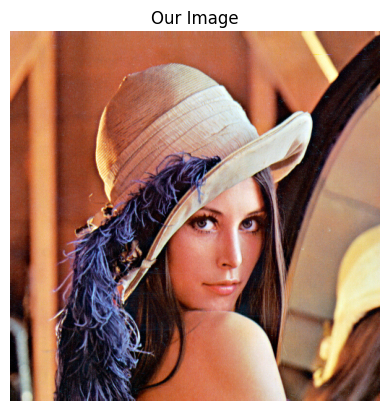

In [16]:
# @title
from PIL import Image
import io
import base64
import matplotlib.pyplot as plt
import numpy as np

img_str = """/9j/4QAYRXhpZgAASUkqAAgAAAAAAAAAAAAAAP/sABFEdWNreQABAAQAAABkAAD/4QN3aHR0cDovL25zLmFkb2JlLmNvbS94YXAvMS4wLwA8P3hwYWNrZXQgYmVnaW49Iu+7vyIgaWQ9Ilc1TTBNcENlaGlIenJlU3pOVGN6a2M5ZCI/PiA8eDp4bXBtZXRhIHhtbG5zOng9ImFkb2JlOm5zOm1ldGEvIiB4OnhtcHRrPSJBZG9iZSBYTVAgQ29yZSA1LjMtYzAxMSA2Ni4xNDU2NjEsIDIwMTIvMDIvMDYtMTQ6NTY6MjcgICAgICAgICI+IDxyZGY6UkRGIHhtbG5zOnJkZj0iaHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIyI+IDxyZGY6RGVzY3JpcHRpb24gcmRmOmFib3V0PSIiIHhtbG5zOnhtcE1NPSJodHRwOi8vbnMuYWRvYmUuY29tL3hhcC8xLjAvbW0vIiB4bWxuczpzdFJlZj0iaHR0cDovL25zLmFkb2JlLmNvbS94YXAvMS4wL3NUeXBlL1Jlc291cmNlUmVmIyIgeG1sbnM6eG1wPSJodHRwOi8vbnMuYWRvYmUuY29tL3hhcC8xLjAvIiB4bXBNTTpPcmlnaW5hbERvY3VtZW50SUQ9InhtcC5kaWQ6M0M1RUQ4N0ExODk1MTFFNDkwMzFFQjc1RjJDRkE3NEQiIHhtcE1NOkRvY3VtZW50SUQ9InhtcC5kaWQ6MjJEN0UzM0QxODk2MTFFNDkwMzFFQjc1RjJDRkE3NEQiIHhtcE1NOkluc3RhbmNlSUQ9InhtcC5paWQ6MjJEN0UzM0MxODk2MTFFNDkwMzFFQjc1RjJDRkE3NEQiIHhtcDpDcmVhdG9yVG9vbD0iQWRvYmUgUGhvdG9zaG9wIENTNiBNYWNpbnRvc2giPiA8eG1wTU06RGVyaXZlZEZyb20gc3RSZWY6aW5zdGFuY2VJRD0ieG1wLmlpZDpiYmU5NmNiMC1hYzgzLTRmMjEtYmU3OS1iY2YzMDlhM2M1YzUiIHN0UmVmOmRvY3VtZW50SUQ9InhtcC5kaWQ6YmJlOTZjYjAtYWM4My00ZjIxLWJlNzktYmNmMzA5YTNjNWM1Ii8+IDwvcmRmOkRlc2NyaXB0aW9uPiA8L3JkZjpSREY+IDwveDp4bXBtZXRhPiA8P3hwYWNrZXQgZW5kPSJyIj8+/+4ADkFkb2JlAGTAAAAAAf/bAIQAAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQEBAQICAgICAgICAgICAwMDAwMDAwMDAwEBAQEBAQECAQECAgIBAgIDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMD/8AAEQgCAAIAAwERAAIRAQMRAf/EAM0AAAEFAQEBAQEBAAAAAAAAAAcFBggJCgQDAgsBAAEAAgMBAQEBAQAAAAAAAAAABQYDBAcIAgEACRAAAgIBAwMDAgUCBQIDBgENAQIDBAUREgYhEwcAIggxFEEyIxUJUUJhUjMkFnGBkWIKoXKCQzQlF/CSolM1JhixweHxskYRAAIBAgQFAgQEAwUFBgQCCwECAxESITEiBABBMhMFQgZRYVIjcWIUB4FyM5GhgpIV8LHBokPR4bJTJBbxwtJjCOLyczQlg5OjF0QmNv/aAAwDAQACEQMRAD8AswsWq/dDKyskGrO4EZ3LLDZiVVQjuBleQaqVDbfcN3rhbfeU2gSJirqm3uEmkeoXjn8F9VuNvx4/pfs9rI0rAW1dVp/aOdLeTZE/LFTwlZe9BG8zMjIs9a5GhIi6dySCyraa6hNvQ7dTvGmvoH5DyUKbmENHL3Ck2m0V6la3SPTjdWtvbb6dViDYTTRhIzGxBFfy6mFMv9rl4QblyEQ1F2sftzKXI7WhEjxzx7NSD9IyDqF0YaH3aelXyG6hkhhT1RojNivIGT4/T89LaWtah4k2fjprpEYoHkWi54UQjHT8x8bhiOOLfF30UMu6Q1o1P5QvbWTV3ZkUJHow6nT0Q22+28Em6LVJZI1X+KblLrmCraGZbtVadKnn6TbyLtIqKGsJY0+bLSi9VcPp4dvGZ4xaasy+9DWBfWPYDHJTmO07y/8Ap03PuAHuH/wwwSwRbFNvVWkE8Z0kHPtyacNQCwszenpxzt/Sp3JBOo0Ub+/uAL+N0gH81eDvg4zHVsIdA0gkPUbghlWNlV2Csq7jCep0H4bh6rqtqAYmjrd/iOnl6q/y/UeBW7heRiMq0GOHTnhn/dX5cIXLZI4MbNu6ESd/RU1TtyQ49j7ipDtGqkttJCr16eqsG+2+xlT9RyZem3Luhvj6VozL1alXFrlBvYwNNuLxQiylDngHHTSuJpStPzU4qM+UGQry4qnjlSYzU8dZSX9FQm65JKkW0a95xpfjc+32pqfw19a17O3EHZ2W0JtliiDNdpzub1Bbf6i9VopwX8hAy7bezVW2Y6BzwKZ48+2Qvzp8eKe1uUos3LvsV9Dj7VZR3IRuktCtHXYK+09ty31+q7ToPafW5LNDH4ZttcjPZIOqOmpo2XmG9Len+HGWb7YTP5MsUKkkHFX5B1IwUgHHKvBfwE0VsboR3Er2Ip2bRQHiMrTKYlO0vuQqB/nJ6a+lncvCgqCrCtNPxtf6gv8Ad9Wm7G0rs9rPtFrMtAcPjlp5D51/AGtMAy1HegN4OEkYyROojWMiVdJl13wFRITojfRSPp9NRuVIZYxPkSxVl/FqPwTl2U7QIEW5Y3BY4UoAvqp8xnT522m31iyNVo5CodtZYTtAQSECQqg2ELIBJpqAygaa7tNDp5nlXthyGVAFu/2UN/t8eLHYNAoIb+2loTE3FVwxp+P8LvmxPDYmrvGTsWCaTXadrCItI0YKof1HSE7AdNzMF+vT1HuJ4t0ymOlodv8AxvJdl9KNT1V5dXEcWym2u4HctworU5HL4Zaxit3/AIalLjEkZMbtovbprVZGIWR3newUKRlQzxBnAJ19p+vt6+g+5lheK1ZFL0p/yn6seRtPBLx8MkVqOtCzX/VkESmmuJoSPy/M04J+LqSrRgQxsOz9jG8gjbb+hB23faU37AyE6hf/AG9fQHcSQR1WRgFMR/5o3jA/mudeDMsLy7xZUyuX+4hqZZ09P/y6uHjVtxLkq0pRgIqgoMhEKH7jYzRnWZliVWVSVLMD0PTUEeqJeJ7gCaKWHOla/UVt/l+rgidrK8DOo0uUYZVpcX6c8BmKV/hjw5p2R11jKN2q7VyoK7pHs2JZYxGm3dIoSUakdPx+nu9XdruYU28soppgbThdiy5Yen1U0r8aXcV5YnEqRWmhcCtNOgDM0wuoba4kgileO3IWYrSMUBCII5vdHqTGsUE0jKiRySaRKvvOhAJA9WN2y7nuSQar+8yr6rWPc/3Mt2HU1vVxS8ft5dvEsMqi5GQN8KiqDUQMzl+BPHH2XDW5miZBNO00eq7iY0tWnZgFTcBJ9wu3r1/8Nam4CGUksFIf59JZqN009S9WoXcWJ4JC0bBap+nHMc40X/FlmteO3GuldZ2nIQNBVULtkJ1+3mhCyFYyEfeQNCQf+n4zbeWKNoDMbbIo7rlPS22aK7p6e4y3Nx4l2UspMkdCgZ8ar/5lfx6fy48uFKlDGkULNNB+kqhkDdxl7cEEX5Uj09xhbT6Bht/quke0XswruQpZNfT1f7h/5fqouK6uLe5BbdWsCNC56ekk5+rq9PHooj2NGrpug1mkHTUKlWFCG0jba5MR0U6f9eq61hKqRzBw9bGalo6VjVbsulrdLdPTdbyJtGWZXShAZUw+Pcd/7gwrxy25EfVoiHKu0jKoJKq8qSjVeydSsfXoW/p0bp6+ybrbS3qpqywuMvxk+HTbhjz0mlwpQTYzJKpdQFvRh8DRFU8viOdvxyqeP9YsxTJXjRZNUjkQNs1STRHRXi2hpJUcj26DX/Ak6eic24jRCjqwvaq9PTit2ktp0t048U12bmYuCnVWhNKf0zaai0G3501Z8Ka2o49zFN2+SB4xGsTluz9vIVAUnUui7h/m1H9fVMo8knfVT2wt3L09uW3LqZY2tyuZlx6qeYo1SMwOVDFGT/NetcsgWx5i1sOOeW3VPdgMiktJuL6oY0VXjdzJtDe1RH7mXUHVR9W9FtpNGd1t9v8A+UhZjpt6ne276sVH03eqlrNWl28r7KRwulrVFxbFrf8Au/H5cfGTJaGywicmLIzW5kUAvBFP9q0SSoNS0jpqwC7gQp0PT0R8yHnV1tZWbcNNjbpT7basdP8AD+HSbRe1AQ7dGK2tAkYONC1T0tbkMAbrTUjDHhA/IsySq0bx23lcMo3BTY3dNA4aQa+5RuI2+lacp/qX604Qd6/52rIvpHPHp6uDWwhrHYhU/Ztw6c6/7iMcjdgTx3I4XHyyGJ9sayGLrFrZQZBZGFbWQb9A3XXTT8dvojKDKoIS37EvVata2tz1c+Wr1dPAuNe3vyah/uxjTjSxWurh8iAcFLVAxBt5lnikn2AamJlkk17Y2RuIyHbaxLKoTroS3oRupIf1rBXVgJZGuWltrW/Kvp1aa6hm3DHDJ/6KRgpq0dAMASyVqNQt582/N06uFxLUcErW5EkEcUks5UKu5VQV5iNuu0kiPaND+b/t682U3LVpeEdrelsbW9Vf8oN2lh0rxDIFbbxx/WVoeXNfhcoBXqK/7+E6F1S3WfTd9lutShQpZklWMR9tNCWcupH4Lu/w9WfFyw7crFKbbHZrsKG40+F12P0j1fTxJvImeB7VxkVEHLELzJFPQxXH4erTx68kkjuSixAjhe1VYxlR3AI60Y0dFRgCzE7ev0I12+r87xLuY5nZbf1CtpIbD1DT9Pq/mXgXFtJgjxKtTZyybVW6pAwp8afw4SvuYbBuQQgkzqNJAgESCujJKXk2j67C/TU7evqLbxPJD20XGTUvTjY4Lc/p+qtuq6lvFrctEjySF0tUKrUNaVRwK0+eH4/w48cfarwzVJGZgsa39wCl3CTSaIwjVN4XcPqOmhB+nuNuF4GBRnjBkMNrVuGnlpDMfy2qV+fTWlPBJHF2ypuqw+Gd5zIUZH+bPThxx033i2/bKhxkNFdVOgmrxkPuj3IdqhdQCzdV6D15QC8zOLYpYnVWtNuEcdzdPSum71al08e0hkE7Iup0lRzSmGttONMTWnwwOPx+pQvYVWBDiskGhXcC4jlqoAyRvEQ7TAjqNU//ADfVlZ41/qC0qI3x09LEW6vUxGniXtMu1CjEdxsVqw1G6uWVBq+DZ4auOCQrX7pfc29IeiKGKmMVZpN4B6ELAf8A8j6+h0/Wlj0hY1/xK0MhXIV0r6buKW4geTx/bwWS16V51EiYYfURnb/bhwwLpRYpCWTuV6jxyxap3TrIq7kj0J01HT8rbfwHo9t5VnAdFNkS2tdp9fUv1LwJ3ysm3bbnCZ3Yj/IfV/iXgEcyXuV5IkV2aa9EV/Sk0DwpYRoiWiB7iqQfaWX3D3er0ckcu6jKHHu/5vVh6cv/ABLwsts5oopZGXR27PwbSf8AdwbfBWTpj9vse4RmKKopCBnaYyxKSEjDEoHBGv1bY20EaFkLyG3kdY4lXUiKp/xTu3w/N/4rbrcXqKSJo5GB03n8vpu9XTcHGf8AG3iyfhFqF69X6sxeCQgoAsaxqo3Slgixjc6gE/U/TT1FuFVwQCq3mErdpXTdqbDSNa4taOq4hQx4D76K2eSpWtjj+L3MKczpwNuI58GK0yyYtyoLhhCBsDH/AEZprDfVQGBWTbqNQrfXaujMtGHsbcsaMglje5QbWC3M1tyj+W2l1ytVbdRCRQs+8icZCv46wEH9/wD3VxqO4YDB2oZAomhIEsenvHYEsr+0oCBtYadP/Z19UIVpP+neizqzLacLrULNy9NmN1uDK2VWVrlAcGZB9sq4r/OAg6RypVv8uJuHClHZj+2jfaQHq01Uao3WNJw4O0n8ojJ1+mmmh9w9GBvYP0sDHpTbxqcvT3V+H/ir9WTLWs0DiVl9TSH4+qynp+OHHdbkWZ1sLG2xbYYqVViPtzXZkUxh4mbbHrpu/KRrp6E+X3Sybsz9uUV3Ttay2tgsfyK/9M+r1KuDXKvvZQ0gsqtf04H9tbeV1Mfp5H4cJKr7jEdqEy9Gk2xqTvkcjV9NCFb+n4H0GaaCTcSkEVlRI16v/NZtXwFv+INy4upCbAFFSrE8ehVY6skcjIjJM7lSAQ/dSFgqlI2XuKVOqkD/AK+oNxasKMQoTvKv9lZOYLLpu6gOlvy1jmR5d2xjDMvbA5DIvjjbUVIyr1U6rhwpLNC9ZowVB3xgMxTRtEgjYEDVl90bBdQN2nTX0Q2UsZgjgFb7EX/EafIf+W382m267ETPBIm579o7eP443n/c4/t467sivVaIRuGSKaHRowgYrH22ILITsJ69SDp6K79q7aaIK1XZqNabf+pG3+V5FVv5sOIdtFSbu1Fgofw9WP8Aw4m/8KuUYWG3l8RLYWHIy3hYWtL20kSFoWgDaHqxWRvou7p+X0vb5LvLyTr/AEZ3ZlP0iR5WVWw6lDhmtu/Fjp4zD9wthuDtIZAPtopSvKta4f8Ab/2ji4LDzQyVyyFWE7I8ZBG0dQ2mo6Kf/Z6aNpPDJ49o0OMjNbl6mZvjp6rcdVeMF3EZSX5gGv8AGv8AdxAP+RLgPIOZ+IeT18FWhtTvjL+yNnZTrJXljVVCwsuoL9do9V9t5DZ+O86NxuyUioa6csGzw/MOmuY4bfZk8cW9jL1pbb/eD/w4xKrTs4bk2TxOUryVMhUtbbNZ0DvF9rNXmdiIUdtHWo23X69CDoVb10QZF3u2/VbYN2pklIb8ULLyrjQ//o6uNlgEayBr0DYrbUXVfC1fqoSK/wD1cHnFzwL2ZnO1IFhkl3abkV2PRRoTJIry7NqE9VPpUmmXbd2NlLOXuw1aQ34XV1Ktq3/5dXDNsttJuu1KloAeuqgyo3wouGNSQPnwvSbJ7V0pJGVuxOIX3bAjFhOVkJU6ukQOqpuI2H6dNR+4rKMFNx3HPVbau2uuoG6f49LZ8TwqNusV2pI4qVGTXPJQrh0thQ4Zi63Gndb1lqwCNTLqLYTtoJVkNmJYkHsRyNuhJ12jRTprp6OxbmEwfpBXutA0fSMGtVdX5aq2PTbq+rihLtpUklmkWq3D/s+GomowWp5G06eP5CjTTQrtKlVqxuW2bVdRKz7wobaiKRuf6dQddpUlW3UbbNO1N1CRxjT1JIqtz6rsP83TbVu2m+280zTKTaVU0tNdEkV3L8lf9jRW0MfblYAhasNZtuhP6Nq3NJMylVP24WZRu6+7p9frOssY3jEdCkjl63ZlP1erV/28VSgXx8cf/UOQzrSMDlh1f3Y8cuTH3Na1HDo7tIsIX2oS1ZK0sm7uKvs2LqNdfURljafastNBRfTqaOqsq4/m6um3nxZRXjEpkDBQK1+kE8/gcMs+FiCZJo7TRq7BpGMfbQyblF5ZyFWJGYMAmhB0Yfj7fd6JtMoJgtdpVCLpW7+m6szaQdLKrMGH/Lyqps5ZVUraqsRiTQYqdOIz/wBhdjXnmrvJRULFuVgrBwNIm0yBsAKWSMEiKQDofqdPQbbyBbHKt9yB7fV/1UbkP/tNpwb/AJqXd3C77iY0AGnP/wDV2f72/s4aGJw96WSCYRpFHUtIrtKyxf6WPrqSuq9Q4O4agNt9FUnhBeQEBSZf/wCqos5/2+pbeIdxA6WOcV0nD8smOYHwP/dxJ/zX/Iz8VvE/he/w/k3Np7PJm4suEGGwVOlk7f30FAwujq1+usABgdv1Cp2KSQNDp4h9m+4fdc0R8TtZDAB22kYAIpUdTFatbaty0U3K2muq1S8v7k8B7d3km48puoVCEy2ipdwSSFRLcTj+Hzyum3MksUAhil7LqryqzAkbOv5of9OQJLp9W1Guu0/T1khmXZrZc4hVXZgy42/asuVarasjX6sVXUt1rLw/wxKspMgEjEADlq/KaEi5ar0sDShpcDx/pn7pLEvtaxJukk1DhnBLTJ+mxA/XUnZ1B9qj+0x7jcSSzvHRWdGZbrdSu3/UYqVZupLmULarBY/pPnbxxqqyCl4GmnTgcjhloODLQilRiOOaVIwhVi7IURQrK8igszpKIddsaBlkEjKdr9SPcfb68ShLIlQqrPqb6rGINlynS0iBWZdPV1UHb4nWFlmaUqLuXxOkUrhXOoDC74m2lSnwxNLt27HlL9yKXQuxV1gLhSY9sx7bqp36BteuhKn1DPPuH2xYyAGlynEEZBuoJXUzatPIhTpuj7cS6WUAIALagANiMf4phS44YEqOCdxfCvVSN3ZU7lhjIu1TIpaKVZArMWml3IeiEppoRoQfVOVZ1VVBKuyWyLTUv2rVZsLgrLkrCgtwsOninNLEpKYMAAwpT6g2OmmFdTCtbvjwUEsiBdzl3cOSjF2SSOMSM4lqqYCrbZZG9rdSSwb/ABp7xdzHtysrr+oCHRjTSEYN00ZEuZnuu1JLQZ2UoWSVAqoREDkFzagFCRya2nKmBHLgc84vwSYy5ANe/LHL2B/twBYWCQymV0hjaZWljIbUBJGPX+gGbaCfontC96xcuqOIs2qhZlvPbZdS0RVVjetrLsgTuVaKhjWgNajQSCNNDjaQ2FbBhhm1SPyMs2JKdhY2gnubwYiZdjQrJ9vtWshkRXkIVNukbOv9ABtGq+yZ9xLKhNjjSzMjagG7LLGum260Xj6fxXg55mFY/GzSorLHkFa0o1BIrM+OCDUDjjpxNbjUZOjpmbbOI9kFiZWLBkkngjJA7TKa3b1njZFDybiPfoeoO/NRfH0kAvUFmwWtumP5Vaty6jWlWULdqyx9wh8iwioKgBqVpU6iMVNqgHSypQnD6hwWMIsj16sk7CKtOZnjjjeeaEB43khTukqzxQIm0MddVAC6Dp6W95Ikhsls7TXN+W4UoNRNq9taMpxXVT6eD20jCi3aVMqWCppW2tP85Yk5AfLpPD3r1H1hsWJ/1O3JKntTWOMSe1GSaIxhXRSijQnTVBp1AFQQwiTu3VLH6VttDW3NiRbbjpY9KjBrVWbe7p7DEsLFDTDqY/E4DUa0ONKEg8zdw2Q0bxVo3QwGNnWeuzKJUljklinZxDKASrbWBMYXUqwGnWnIuDxlrkAXVpW46gravp0n+W4Nnx9gVItt3XiInv5gsFxTQFpjllUrh1ELx/qliVMhBBo++OOrXEM8liUVY68xl7sBiHbKmSLVT9fd9Tu93iHcCNHiA1hX6q4KNIGQp09WGlVbHl9eCGW2W4rGWJqFUB60urUNqpz6a6dOXBbwqQrZfbLHq8kse6ferxR7VTemid+KONV0P1UgA/QkevG93cqy6hG0l0ly2r0qtaXULW6tXTTktrY/trs4/wBPoBUskeX132gFaUq5TCmOohtSheCxi33xMEg7rRK0CNFLo7pMP1n0kL7dZH011BWP2+06EV1G3buixe/AWpnpuZaNl09y1en1dIbpJzo62O7UiND9NLFeq0UYMFxpdRvlVeHZVRxIu6KeWxEkjFHUrEIEqtI22SJHVjFOz+zUMwDa+7oqrJ3NuykG8Qxt/wApubSqdN3y6fg3BZU28kJSSwNIQtca1KhMSQtWpnUaT6TwtVm27SsbwrVrynfCiuRIleT3lEiIVGOke8f2htBqR6+rK+6S6WNUIDLpUamAZkxt6Wdljp0t08WJYYe9RJEcM1wu1BFqA3LkAXUHULh8C3CrWAkKSSy+14ppDFs3uTMZliEcM3dUK0o1UbVYtp13MD6IIAZXqzNCBJppTquopWmm5lWmV1qs1rsOKE0Yjh+3ak9wqa1Gi2ouAH4N9FSOnSfeWOLb+k3+owJIdo5CVLd0iPt9mSCd/ZqFG86akHp6iRVkksLroZhJ/MtLtVv0rbitrN1VYXLYENKA1OGHwAobAamo6rudOnAY8edfpO7o+nZrrKpDFWaYqzxMqxRBBGk8W4toqgn6fl9VjH91Y1YFXjVtVLrtLXdB+lU+nVlUKvH39Oq7YgoKBhzDAj1cqthdhjlWp6uO+rKYoojJGyzGvXAXY35dX1lC9tVXsx2B/a670/H+613VECSMZO4qLdpCsyratVNCvJ/q1KzZNx+kg7spWMKYiXWtdOquCrTG638aPlXEd0bGWDdI8QgIdo0eNVb2Ha8wQQaoiOdHYOAR0BJ9vqmqgo0wUsLAy3C1ftsqVXR6blb82lfzKQeCMPWIEyLmwpiSC4DioqcDTmuo0Hq42cuVrxua6IY5DJtjJWRjI0hYWIu647cjdEGwH8D7PViNzJO7spjjW0XUX8zZ0Yszqwpq6VbPDivLBFFIrx/ckxHMVxC9Iw9OLGmFVYrjx7u22AaiM1opJII1MaCd90iSBKxjhfYwksOPx2d36neT6t7qYoVUFzG6hVVgGu6aKcPtlmZtLK2lrbuI9vson7jqqK5oxZTkoT44XUpd8Gt6cKDnRZbcle0gaNTvIhDx14xItZ3lkRI4nSSN3b+waAnXRAV0k2se4KhnMUaiMNaAtrN04LQr1SPay0XpZbbl4j3CbWKYJErlgwWttTaTcKsRVbQKYmpuYFmWoPjJGDE3dcxJ35nBjf8AUaKF5LBR5IX3s5GwLHo5JXf12nX6zSQzyhbf0zIWt1DBQpsXA24svbXq0t9NR8MKGGtW7qqlcs3JF1HXljU2i0NSlacfRRY4oRE0kYR3DPHtQyyOZnl1RGX2yi10JHVygG3XX19eRo2aWbud9brq43MzMGYYW43L1aVZlbHiB9uk6JEoibbqgAGFwQAWYW8mQ6QwpR6+kcJT1FLSShJQV7u/tSRiU6PI0rqrQMGMcKdNC28BdWHT1UmZWmuVF7huuAX1XS3amHoVY1ubqW31Vfixt4x2bmICFQakcqKRhXMtcToWlcrdPChHJKUhjkszkarGsaMpSJUR2TfBHG6lQJPYzuWZdfza6+rHdZttetCzUZS3pqrV5f4rrWtGrHuXcDk2e0j3MJCqjDBviS1tDXqGVDTCp5BeE2nDpE50lVBK43FpXD6SJFJHCj70aNQSeuugOmilNCHhWGHbui4urNa1LmztraD9LDq9NvVVTxdnQvIibhqy0/kUaakk2jG8en/FgOHItGIxSOssszO0p9nUo8ezvCISxl5otp7Y1ZS3t2lup9FCY556LaH1dNdNq3aen0r2/pya5sLf0ZljiqKBLam/nUml9BpLHVmaLf0ih4SXgZVmSKQqtawscoO1Ie2EkhZD+Gj2NO2Du1Gv5idTH2IYOgaozU/SrHS2pR1N6eq61mqVtPH5ZmkjBcIRIpPO/wBLjCnIVFdONMAajj+sWaJVkCzAVZU0QqF3o8qAFGjDRM0siHrq4P46EevQilXb9t8Lla66ma1uVvpa7q/KunqHHmobcBwqrY/PPIVOZwtXSMsaMKoQOSaCNArxP0lsBRJs+3P3U8CD6ssYlVIh23cDXeCemq+rH6aTtxKjrUs92HJo9Olv5aN6r7hdVblrvKimZpVVpAqnOmIfLLRdWoHqRxgxNvCf268aqGOjshRFUovajLzsN0qR/piVpmHToBp/U+vMPbkjrutMuleo3Kq3NcuFtzI0it9K2Fhx9lEiOBDYQfiul2oFIur9QT04kEDLV5x1YpAsaJMg7fbbtMw7cgLLAAVjkKsZH3OCDpG50J6A2YkkkWIRqWPaSNfUoDZej6+pdTN+ZmW3y5C99wUoZCfT8qjE1wUYFekgVAVa8fUW+WNi8Oph7k8TibR3jDymNY1SMCRSsvRtdug0HXX1HNGjmyRQszPJj+W65VODdNc109Q0uW4/RCyFBHUIoAtqtK0AxNAfprhdjX+b5kqJJDPOyLIzqYQEaS1GWjaCGRY2VQAI4nAZVUltz6/iTY2+3eS6JBdIsdt2J+nVlnaLWOq7p/MtaXCQMAFUGpWgDYsTacDpOJFxWn93DIyVV5Nk8jyJEnfBgmVEkkZoYD2zGYEcp9uq7XfaShOujdFP7ZV2khYKlGrhgrMJLmRRcKem6v5j0iyoWdG3CjWjaiuB0IaayxBFMbfkunPHgM5ak00zwRRMukYsTSqiFPtGV5lWQ66xx1OxIJGKlWA1Y7dxJDb7Hb7gxSQi9O27Fqg6dNq0rar9XUGLcsLeBG73b7aNmkVcJVoLT/U1DAlSXHQKoa68aVwbHG8lJx3kFQV//p5ZIGmb3KK50Djtxt2rUWx5NQCdGGug3E7rG52Ee4hMsi/cFsnVWulsPq6m1XZHVS5eIod28L9kX9lndPmdVLxhQ4JQ2DpNvwts98UZ/wDccfDOsqzo8Ij7SvIGBBgkaYGQRbyXbczgLr2xp/VV3yOy7EzwhQ9y6R9a3K1MQPVdcbbblVrufBwCOZBM1ofCp06SA4XpOGDYLU4E19XEt8JOtipJXdYd0mqqxJ2spWRVI7iAq8TsCNdBtH9F6qvkEVHa6NOyH6hVtLOys1rItpVpKav+mttrBeBkkEcTRvizL6c2qKHkK0IUVza4/FsP5Zwkjs4274inbVowhYPHNvklUMjFgkY06kfVdNF9L0qMJBHYvcttxoNSsrSXLW6tqs1tv02C3i534xdIMxjmbSKCwXAfP+IBuqW46q2MaaCNHSqG3Mu4FVRUVEj2B1Hb/UK+0kklxr129Ru52z7eQqShiZmXS2nFLGW6h0t2+YXVVlratZr0ISxGuGr+/wCBGmlfTyw+NPuxhxXJsCTb7giRhijfp+1mjjWRjscD2ezboPcPwELNA0tJ2eN1ZVUjquXJujSwatuKrr56F4ljX7bIqqSADXljcbV03Yc+f5uECxANUGns3RI0MispC9l5Pf29gVBL01bT67k+vSrEkVzlVVV+2rY1zLXNjhappd+W2QU1cTKmjC09WI+NcaMRzFafA6T8DzzRRfpxR9bUbOhZCW6lkjlVwDoQkgI6/grbBp9PDzLUX17lbFoq6fSLbaXMfpF2gqLW6ePqRu1zFV7dnScPzYG056m9Oo40pjzWHmieHuBBG0aKxaE7LAZog4WQa9sV3jf3KG+pQDT6XdhJfMAxNAWqwI6bloqsw0mBo5bWKsq/cVVZbW4rbjbqD9pVOPTXEZ0qPi2nCoqMSa9XOJFliiMcjEj8CItO2I3SGNljKLtPc0PUgggkFh6KTCSaISQXKirb9Nqj+mtwFrMzLaTQ4srarcRpWyYo5V3/AIk1wubH8K/K0qCteFniPLbvBuV0eRUnMcVOZN6kRKZKKSbbCPFHKrBxvOitv2jTUn1+n2LHattJql0R2VtOa3L8D0t0synSqmjNbwM3m0i8ntRs2W53/HMioobaG40rSlTdhXHi/bwr5Bpcv45ichXnST7qrBIJA0L7d0e8oArMSd516/U/m9DfG79Vdds7JcpPTT8zfEVy0s1P/uNczLxzf7j8JLst1JVGqhI/sw+n4fD+APM28h45T5NgreLsxrJFagkjCyIsmm+MqdF2MEA1b+4Hb/T1a3nik3kdikq1arcKUYEaRaNNvTeG6emnSylt90213IfkP7D+OIu5fx+ePGOv+Tz4qZDw/wCR5ue4PHvFx7M3AmTanAnYhsSzArLY/SZlhkeRRIrHXUjTTqRoPsjy8u8hHh907iURspooVSzMpKhbPt29yNvy11Uy43/235Pab7b3lEfdKQwGnUALT6ccAfn/AHAVz8fyzQJD37Uavs3S7E2sxMTBIAwrR6PKZwdEZ1I1JGp0Lbv4Y0JlDEyMy6lt09yxjyGq1lyuW1W6buHfxxlkA20kf2kNKHV9SioBY9QwWn0/AMCtHbhayiBH7pDLJW7bunZNICSBG7PdZA8QTX2jeCOnQmpFEo25Zjei3Gi/Usa3Nl6lsW5V0iir1cXdyIiA0fqcAXfTe5rg2Gq7qrg+rUpHChFrJGJK77VVx35Ejh3jvtEAEmiildYUTcgjGsQdG6+qA3LaopWKpTHALqZlbHDpVcaNmxbqqtbjQlfuxn/1BNKCjEWXUwoNT0FThgRRV1cedYyRPtjJEIllERSI7polmVN33BgESuEfVhqdW0Hu9eqLuTVWfsxuFjVs7Y2NzM1NVMbvUfqLJVppCyfaXF5I8cLbb0TLHprlhRWXlWvCmzNKbSaK3+pHK8i/bPaSCYMwVlSVl0RSW7bdCehBX1BJto9vuZUSNpJq9VVClY2a620W3dV7XW2t+W5pY2maKOjlYxhqV3xIW27FDzpiLiVtcDp47SJVQyKIXDxxxjcY3IieIB7BO1JQFC9TtLfQnTb6pmC+JKhca2210qy1YrcLtN+LVupc1vSvF6NljlBjqyIerDW14suNpDYr9NOQPNletHKskEMIMquy9zuxTqO6NzFGdIR3nG3cm46agndpr6+CR2nEEREMela11Ax29NwVbo11H/zAq/ThPEIFHclUSSn0/lNWtahICtjjTTqGBI4XKFCOlWnv5bStTp9lbD2iv2orhIzKjbESPuAShkBf8o1+vryzdsxRrV5QoNw1fS0mk3XMnTapW1vqY6fMkEQ3DW2qrXjPH1W0e3SHpjnWoyw4qv8AmT83OP8AC4zwPxzman/I8kVoWJ7E5NSi0q9mMZG+jKqLI0f920bT7x/d61L2L+3+/wDcm5j3vkh29oGoSaqCltq1No6redqsbbsuMe/cz9x9n7S8TNDs/wD1W9SpRFtuuyNoZlywxuzFA300AZ/PZ3mOcyWYzc4t3J7ctiWeaZCzd2W1OqaQTK0ahHd12BNNHJ6aa9L7Ha7TxUH6XZKqxJ06gvzVSw6dK9NPkBm3HInlfM7zzO6O93Tn9U6Y3Vah0g4FW+r5Fqm3GvH6NUmjqa7/AOrJ1QRNtX2gaMXQy+1gxRwdq/T6nUH+bE4vgZJV/wDUMLNKm1fVdnb6rbmWiqzKGq2r+jiK3e72llHxxOOHNRzoc69XIcdkcMbM5KOE3LG2qohYLGGSaIbVWT2PG6Mzk7QRp7vQyxmM6kuIWVkbpFzXIVZVYjGNKtdVls55Nx7FSkdKF88NQH5W0udVCDaACSKHjyngjheNI42MUUgaRI3jeQM0QbYqybk6bB0GmgGu3XolqDaxRDszlmi7l7WsrXMyopW46bV7fct1M30q2lYmlLEyVFxTSSuC4/lXncR+NRdSjH14/XjeyrxxqkksjKS0U24QWojK+hCqBIwXQ/p7wV0Go/LcARYyduI2NHtWjZSRPJblQ3a7mo+pa1YKy8QboOy/VHhnZmDT45LyW8AhsRXgrqv2cMCzRokHfiWwIozuChzCHfeVfYXlCanX8/t+p2hJA0rKYwiwqVQaSt9blbSwVirYhtN3UraSX4EVSV5XLlnWMlVqPk1MF6qAmleXyt45blxhDI0YVZBGscbK51AVirIYxv2NLMnQ732gsAOoJqmKGeJmCBpIds9XA1aNMuCimtrmRupka2rM13FvbS9kILgY2epxFMRXqtBbCnpH1ciAweXyC3SknQNEJa9pShE6uzInc7ETmJh2jMNhYKRr1+mpaR0USpNt0az7zWqwuaS18VtS1tWnp616fVwxeOSNqLJbVCimgH5cThgaYjG7q5gDitD5C42i+KyRujMRJWWz3Wq26RjTsxytGZa88QjKJMC2p1Q6aJ1IC6l7P2G0jX7qzp2mKrSZLft07bWsFN2LZ4XKyrQtxP5zebv9J3Nj2n7ijAxyVN2DC5A5tFQMgbiKmnFPFiCE8jZI+yyIp7vfZopncTSxzJMsu9pjJHIJgoB2odF0GpbV3iWPbrKtLo81dl1MtG1XagrXVyz0gKo1Zys7SSvFL0uTSy0qMlBqFDAilCtc8cTpBTw0IfHx0ezokKQyxRCubDOiSSqrylgXVd8offuUjUdwMQuxNmfuWhX0nqxpQtW7Vb+bU3p5k6aOW1VYFfdTDUfl04DpoNIoh00N1y0wzIM8kNO5Yge01qapI8ZsVpo7ddJqzdk/biCF45KEsDOR20K6HptHQwxCDbbgQlVdR1HSBptTTVLSlGuNFtZQuNWbjyxbe7dN3EO2ZVDWPg/3MbHwwmUqMC4+FCaNwitMyKrQ1O+TSncmskYjhiBdHS1/t1iSVq2scft0CN0H9fbbxO2VzYxcrPU2oi4fbujW1V/y9VrR2EzK0ilUWTJq4tmCDWhW961y5sDpt/kFdPuIGQNPCquolsTr2mjbapdZYY07RhDbCR0k7e7dofVBAncjYghbjczMctOqtLgooy5tcw/wtahklJJktEgGARVwNKnBjzNsg6WBan5uDDiXqqkCQitO7JAAJJo3XWKUuxk0VFRNR2wrbd4/prqK06beCMCECR7VzqNWm5SyhQq+krhX/KvFrayMwLYIodq6FBsIwxtLsam+4HA4NpGBOx84iVXqtJHA0MjQ99zNCa6uFEoWKFQiboguw/QqAdob1AHG1lebboqC+xbmLWj7jKLqJVbbcKNRrW/MLlWmVYtzroAzhY7KmmOPxFStaCuvGubxgkaMpPGO5VjqrpGjyGQtPGsih4+zEtV465jBI2aJqv02kib1mm7SKQSpY9VG0yMoW04jJeVukNcuri6sRh2hINVV82t04qHLYY0BJpjVRXA1o5a5kYrM0ToWil+p6K5CNKkheL7eRoll3AgbNnXr+MiBe4oKsoYN6cmYtQ3UtutbTavTa3qZh9kKPFSRVfXXPGgP01BxKFPzZaVovHfF2oYZ1CIVjYqwXYpCgF9VKgxKT1RR0PX+p1McCQzbgupDQKy8i11VGrSNOVtTXqZmK3NxJuYwIwFRkcg06ai3HpK1PI88gtKCi9YZUijeeKdtCiWZGBGwiNXcO0sSNZaUjcza7Vf6LpsPqym2j26EyikrXMx+lfttdqWjGRi1ytyZcrlYeDuTPPahVkWlBQ/UyDAEslqml1PmefH8eStLN3NxXsuBsKiMJ2ikTSdFTbvGiksq9HXU9BpL2ITu+3JUWtZzbNvwXqX0tRelWoy8RFpI9me3aALW5jB1rTNsBjz5GgobT7xzSvVcSMwgM3f/AEdDIsbRpACC+wRbgwA1bodGUajQ0AO9sWKXF2GK52n+mrflVr//AJlAYdvi66xJuFcpX+XK3P6fTRCcDzF1pJHTWsOYWJ0VFGkci+xVhXtSnTYjAHeXO1QdWlY6DX1YLRle2iEQrbi1ukEo39i2Nkq/ckZrRqbj4iAteltzuxNV6tLpjTJmHqJOAtUvhx8WbrTTSJN2IlAVnlhWKvtR2RkieGIpGscTkrsjRVKaBm1Pr5utxuFcQbtSraQyLaLY/wCo2lTb/UpHadTL1NUNx6ggjjesZZ47CwY1NS1VUljmSGuqWwxOS8eMdvfE+rxqDOqytajR5EexpPDMz+1keUMVO0biFbYNNfULqkcV6OFZ2WM1qzBm1Rs1ysqtqYrc2po2pgtokRUfSqtasdwpQAhNBFMCR8iBS5VJ6Rx615Iq85mkELJJG6V4mCgTLDtk27oYpXiJeJWkQbXALADaepKBoNvENxVmiBS1aW1tVblyuVXVf5lVWW0C22CVX3xWPUmmpKmqgMafEK5oxQmlDnnTjxhswpaMIjSFpey1iVhFIYVZDvlUpEYzKixfTToj6MAdPVeHeA7jsuSVa1dRrqa1dJoytarfl/g1rcSTbJP0/wCpFLxdTSdY9I+WqlfmLsVz+HvxNLJVEsFtI7Ri3LEqtIUYwqYJHgSVHdQA29AVTT+p9XNwdpMe3IwMRPbu0/7mHRZpNdVXt1N00+y8MokRWD0GnE6TbnSmILGlKgkG7j5t2Kt/7lpml1s3JftK8QXthrIsd0OzxvthjRwwBY6bw23UevRHj3bubyryM7WlSKsWDH4XHHSVuYqrerq4r/8ArYwq7VPsBFvbEUCEKDiK1NFuLDEXBmxA4/gkjhEdULIwZIz+lorywtNKH7G+Mxo8/sG4RnQI+v4+qsUGykekK2Ker1YMyJJyrztu1Nbd/CtO24VjO7AA/GmBobamuQJLZipKYcJlOYiVgyGQlQyrEgkBZJIwQqdqOQKlTdou4H66jqNKhpPL2gEJ1Mv0My26slW3tpqyubSaHghaI0IRbluo59SggtzGDV58lUGpx4fVO3GrxrZ21HhjMXvBjlRZO4xmIXf3O+jb2GgLsfzn83o1t9pBaIpWsHTdaWZbpLrsUw6uXU1wXppwPl7ir3hacL6C1hp6fpAp0/Kmrq4SMkKcbWlilWzCjBXbSRCQuyXux9wBI1kiGi6uSp6/Q7hHLstvHWGOrnUwW06muWRudbiqs1Ry56ruPaTtuIhK9qyXamuW4KdKhtOJvKfSM8208cAkhDoU2TxNOkLgOhdqgjh2tX2RMgmidX3Bww3qDtfVvXhIUEl8tOyjxrazHVHGsdKXJ1UDC3VqW5VZUqPSM0caJCabl1NCqrpcl2xNOYYBHDJySo0gcWRRJZLLV0dapkl+07kUAYRBA4d5I99Y3E3GMe3YWOoPuGlWOGOQOEGhQ1txDXKzNyXGl2nLHiVHVZbJbbqC+lbbwopTTWlddKk9QpaDxzzT1YzWFuCWZCY17sa75JK8AVdmkxTV426lmAfUrqx67Z4v08iRvLGwMst7alzjDaVuH0szfG1Y8QzYfniZ5XCNEURLR8BU1FaDLAUofroBpuS1MfebthtsrfcGTfEjs0m9wJo3iHuXcoIQu7gNrr7tI9t+njjiXcdUkSstGXSzNdaam1tX0s2ksy9JtnmaQxyEawjEUKk3ADHIVHPEjA2YdNVNLUEgJkQdz3JGU7aRT9rWRQoKEe/dp9VbQ/gCukse7gQWNqgVbHttW5ddvL8kX+G3ULlKxjbNLTp7/WoaqkXYVxOdLv5a5H1c6TFhbnj7boZRCsaoimE7+4kZ1r690dsbfqDo41I1B+PugzNIVJBkTSwVSMGyonKrtzFynU2fH6fbmHbdqYgEJUEH/v8A7sunDLhqZHtMZf0lR40nMdjs7ZAzbJGKMoLwFa7BSEcn2a66dA37RdlvYllCBWX+naHYX3fInpuXp1Vwq2leE3cRTbHcugKmtKi1a4KRTppiQ4xABo2R4GecrpjLMjUbdm3Ga1mvDfZdjCEF4klSOR2lWcxMmqaewPru/p92yRbPc2Qtg0rLG9FUsUjZdWnNTIvx1D6unzur95sVaZB9ujtGCWs13409BVMWCi41FLceAzmoJGjilRY4goEkKIFlEoFi088+sFdminj7ijQnXYQSF6bT8CtGGjiBMZ1FW03UrXIfCT0r1IrfBeAxk2ZbvNaWUkVTMVFQDiKgkFRQdNQMBxMfwHyh0EtEyhGEcYIlgiYyGaPRTrLFLIxQg7dAmhYfiAQK8w7FBGsQttfUQrMLjpCla1bPp6v/ANZxd8eizAys9ekBQVGkW3ClgpnTUccaKqVrY1xiREjjVAj7QkmodQdxMcndsRqEEWyd31GmzcPoR7vSjvoGaFx20suXnRfSMFpp7b3L6V0tcWtVuPkjKXSUk26hyrzAoaY1SymqtLcrsS9FFHPFXVyhjESqyto8YikaOZ2AaIlVaPRd4UDp102+gY2YhdCUWTd3rdp5ti2mn5v6mnT6dLMasblGeVdAY4Y411D/AIZNcbjhWtvHHXZa0gfqsbKeydu9EVO1puQSJt1kDAEsv5joG+vpe2a7cMBK4UIWZbVuNq262WoVV6qj6mbEXKeCe4V7AmFpOPI6i+WlmuK0JFf7KW8esn2vbGyMCGVJNkcjx9pVUqsh2rtZu7qN+i+7QgD6j1UnhWA1drNuCqquDKy6uYBZaXszabre7ibWUeIW7jOFH3V5+rVS0YhgLNVP4MTiOG7YJpSKGACyaJH21RRuRyVWXtgTJLG8upO/QjVifpr9WNdxuI03Lm1kaMVUKza1djnW5TIwa70tNirKWW0nZnYMgo4Yk5ZfLClD6RbVTbjwj21qSMJETRXEoeTth0V9O/ojbmEqyIN53EMh6AsPXxxtNx2krVb5O4yrqt7VyqVr+VWWi9SrZdqtvwrJGH6VpSg+VaY6Raw1ABf4ivCLYMCw/bQgukkbudwYAPDNI0bBiF1dXVddNTtI39QW9S7LaRQbZ4HcWyRvpttXS0lrKKfVaZPnnazXcVZpe5Ks1aFHGq66oKCqjAinIfPEGmaeoiYNuO0TGUu0aAxd/q/cZmLOhDseo+qpoPx0JwtrEVuhCwZrdN1ramNG1XNg35VVqrdShIlAUjtDClMch8F05MOTdNa/CqdMI5VKqXWQSdhti7lMUie0MhjZyjMNNmpU/gfXqSGOa6TbsyyOzr0/NrVZVGbBlutNurTdaLa4HaZRONK2kXZ1rXOma4mtn82OHE2fhj5rfBchfhOSuTNReYDFm4ojlXWVRLXePYBHIg2DRixH1/oAreV20kMgnhMn6evbwUjVcbhaq6WfG74sty6rVKf7+8JFu9u3klEf6gL9yylOi6vzCjG6tKU+fF4fH8tFkKsUkemjhd20bg24Ky7gFGjdV16D+n9fTH47ew7qGiuVkbT9N1cFZlqtvo1L1fSFDccyeQ2xgkIPI/2f7f8AfxEr5q/HnFebfF2ex01OKd3pTSwPJGisLEURniKa7mV+6AdwZW1/KR19Ut1NuPE7+Dyu0AakiNd03W2MVtX6qrcWqzM2kDUrMftHzI2W4MEhoSjA0xwOHKn/AHZnlxiE5nwTM+LecZ3hmajs172DzLVKsclMia/GjqYZg6t2rFkxSlV7gOgToy+4Lte38xtfLeNO6iJeOUIcmwZblOJDAGiqtpU23YC1acdBePdiqblCiqFbJlIxxpSnQ112K40OA5O7F3GsTMxkhkY7BHb2wvNK1iIhCXXesU0Igdj1JLy6H+z1F9iKRgyg23XD6l0rS2i6rQ3qOpl+S8MiuyWx3Smjr8hgcK4MtrvQYqvqXIO3Dxp2qcyxQMoRp44ppJpklkjOpsuwWVIVj6FDozfRfo2u3YMEMR3JkltXXYtwYLd3LWXI3WsdTFdNtq29PFtpJjAZIEcqQWNLLqsmk4n4AEBcMQzDhRaSL9MGvBWSCJo1jiUTuY7FeONIwYUsKyAydnZvU9Bpv+vr1t40R1eR0Lu1ek83dcqGh0WsqtjcumReqpIkkps26MxwpTDFVApXCg1XhqG7HUh4VMUkdp44pHq1o0SJLQKNLJNICjaMstaXul4X2KVQqFVR+BJuxwxy/wDVEa2xsRGW1abu30sAzLVVbVbHbco1A1x3NuK2PI7swBZVFo0hWrUNS5r6SY3nEnh0UsUV7UIkj1E4lUq8ciqDKw2gQqy7RoFDs7kIqehm92bhf08qqsTSM12QVbmZhVR6mX1Vt6dTFQDnjmgaT9St7ylOg89CLXFfpfFEoGbEZM3Dzhx9GlVlyd6cVoKVWw00krlIokSRGWOVWUurETIg69GLag6nUTNt0E5cSEqI5UAFW03xrdpw09ytvO1Qt64lijIjiRI44/6gwt5hCCQSo9KW5arvwpSn87vnlBTTOeOvGNqxZs1A9TI3MfCbFWo8xeiojPVmnExBCdN2p11BIGx/t5+2e68oU3nmUkGyikoAFJDXMAtBQWjTJaeeGdKrgX7p/uv47wEL+P8AFSwt5cx1NStVGbVwa5lW2qm02lmDDM0QXUv5kXstm5702ZORsWsj98yV5DaklghRqzzTd+RnLnQOm6IqSG0Da9PbXYbTY7d4o0VVjBquC4NS0KBq9WkEc2NRcacW7nzvkPLeSTe7wiZJGVlZCzZVNDooVWgYMGqC4W1i1zf2GslrJQtUV4Ehm2QR2TCbGqzrHHDH2JFikaSIiMKqOrtofyszKL3bQdzQ/wB0tgbRgyn5YNj6cdWXUKnNjt+2jK0dSAL/AI9NcyrONR9VGzJ/N+kLFSEZ76Sy91k2q8uisI2fQvtVUZVWQALt6/nbUev5tQPJtdsn6ZmuU3XNpZvuJa1rDquut6f6Rza3j+kDFTIxkVWiArQrpDfDI40x/sz4UZIn7BO3R0dFZv0wu6NHEQ39qICd1T+/Uv011/Kojckhju1IvjCrbVWo0btaXaxfuWrVqse4rVbnxYpCgVCTQ1I/tOKrUrSp5Cgxtplx9fZPM47equWLEsVEhi7SdtdzKse2MtptUO+zX8PoYEiwoym2KGxrmYW6K3x4Y4srfG5nFfycD3KVoaMBRRnTUcTSlcc8WArQ58PXBYbsxxtJ21kP4JGxf3Rh0V1SGQN23BAIEe1idPqPUe7lZRNJaXjj1NgttzINOS223OqviyyXWjU0SjJpakMq3mlMedr51qDzrqrpzOnUsXSKySbgvbQ9wqydgmYLt1Rnj7AXVgo19xfroPy+h0p7spM1InWKnTbZJc8eailisTFaupWW70s3ECRNuHujRQzYDpPSbiPrLDqZfo+fA4ntNMqV5TvDyhXWNyd0cIZw8geGMtslQsQwIGq/QjU3vGpPuolbcA0EqqzFltaMsrXagq9UQbUSpt02jqvSRpGn2arQZD4tQUzYYjAY1yz5fzLVDLi9wMKtvrSKySCBQzsCsaDsbkE/d1HVd20/4egLsogBdT3e4G0yFSo7jKq9GnTqfVdI0bdKpiwePvMxjYD1jHFTQDXW7FRT+UXjnXirL5ONOtG80TJXJhsK25AZXcxWJASJQrkxJCT7dzDd/jr6ZPa+63JmABVSzKX6dLUKm31W2EaVu9Tq2KkM2/SBfGFqKz108xTAg2jncbc1wGWHFOdyLIjksEkc36i2p2DuizwTwxzARPJS+1gl61oiNTs7gY6sv1O9RxldiJJwZFBLXVwztXGhtwu0klWwxVuMrkSKTcsNsFSPtjDLMKTrobjiFwC2umBI6TZgIEhaNdwV3YyLMxBRnYQMf05I2/3MEkn9yHov4D3egTQGOa5bo9X09Ija5rdJ1LRmxFunTq6jsjvudoEehqKKK3czRcwbXULlqrcflw+5a7/bzyZGvIqEaSMuxD3JZJowzOtSQtHqyMxCkAnaSrMzmusbxLfLEWF/Vb1Y1uDWt6tXO5bud3Ekk8Rkt2xQbkCtLq0FAMrhqNKDHSNQBAUDjuj9SKIsxeOOsIVaPXfGwjTdFGsXdVEUOBtLSNt2exVHr7uINjIzkx4rGKXBdSsot5raFXVzJb+WnFPbtuEKiOhjLvUqToIJFMQ1ScVBpZaTWpfj0xkbRXGUhkACN+kG7apMfYzO8bM0u6YF3cBugcn26eqcu0W1GiDKmlcV6SArYrTSGuVrvmuONgJRSxW2ELeb+k4k87cDgLCijLPPgjYLZZkKyI6j9MwrDWURq0mhklR443UNtKK2gDbgv9AfQxgv6btlbjdcMBa31Y0a5nW1mamoacVXTcRbQXjK2nqNatyZK4V0Vw1WZ/HgzVd1iGAhJYoyixWgwEY0sRszzwzBWIKKVPu3a9Bt09QSRQzh5FA7IdFGpeqSO266npKf7sNXFpR+jlVWNZjUjM0oyC2lqnmeRxBNcOHNReGAoykpG5Q2FikjeSSTamwERRyGIqkcem8e0n36dNacf6eALvGV5mstfG67G/4XLppctoVS3K3TM4kkL7eK0S3rZnoyubEi/PHVWy4fmK3LrYWNQisUVt05aSRtbahGI0iOoMNl33DUbQAA2unrztyJJbiruVZjXuN0ydXJmZkMl1vxGpdLK1q/QCxCjDDA9JqAOldRSlcK1zPUO4WWjYa7JY4417TKkYOklmy8UaJD3I4QZFHdRNF3n8CT692hJVuVmKh2pcLdTMq20W1UWR1uVdP5i3EcVjbewAKrla0qaml2LHUSUUi442r8lbj6glILsGAeJlWWEIrTBEE7SSTboki7juqK+0AnVfoeotCGMzOFU92mCsvpRQrEWhdV6qsmCqfSAAGNhpJS61tZM6gn15ClTQWsSlfhmTp46dsCJCFRihJVJlIRmZdTVOqli4ml3htXLAaa+im4ghkWPcUt1Np0m606bq6m7jN1arVVbum3ikrq3cgUqRVc8aAjUKWhQAMqAA4kcq+3aXahVmjEu8K4jMkhmhZpFcp2wdESUuBvUaa6aH0F3WzjiBs0yVjuBXBjcGXGnO671Zstum5iERFwlkVC4Gnpwqp50+NAxIXFRWoFvH3TkmpzV65sSqsTxSNtEfcJVpJ09yiN01dCvWRNAdSw0Pr7t9uqSOsbVjW1i1AOhll02jSzMraV6dTGmFPTThkLOg1K6WnUKFLKW4g0BUjBq0tCt08eU2ukKwbyssyoSrDQCSwAJpNrxQRJLCun09quAR009VpNkryrGHfAKuN1vV/U5DpZGbqajY58EXMSmQtY0thbSql60raKrXC1uQFQaczx246ZWkK9oxukuk0zOFh3gb0cpLLNWMSGb6GNh2xt2bdT6L7CxJO9IrOiAar7dNrC71LarsoVbWXTbbS5eBO7iiETa1/UMahAMcWHNRfewQ4hlNXDV6eFW6tGyQYViW07qJY0iiiqwSSSx72xzxhWqlmkWNtS4YPogQDd69TwbeWVSvbMrapMKLq1BkZQ1dVsdysytd6a3CLatJEFL9z9GMVxJJoLaSAqK0FSLgG0gmpwYeXZ5opyGBiGqxwwohkMmyR2J3duUxCUyfXUBmTT8dStz7J4txaaCU2qTha2N3T1C1Ga7/KuXDCd1tZYmKLUo1a2/FSCbraZg4dY6ipDcIsWRkk3KdGr9wxIryPIrL3Y9yNEpkXes8Sq5j2BiGbQfT1G1pMe2QOI7P5mtUq12oeo2q2ldTKtNPHh2A+5Jam4U5i3lUdQtwpVqGuHPEcLtSSGUd1tFspCdqMysk4MzTlldNI5FGo11IOijX3fUvt41g2rCtJDH3Fy6O53GC0/+bS2lV6WVhW41TX4GG+04Ea7aY1WuekUFMHoCNQ5mecSKwVNq6ySRpYVo3RZGUpE6MD3DvO7U7jroT0XX9Ptkg2yya1BvUtjd6qdPJkbFhkbmp1cRhGnkt02hRjS016q4imDW2CguW2mHT/kkWRiziQPCGrPVAjAL/cdVilWMiScSRjUgqVB/K4Onr0YIUYB1ZpwjLarLa12lwuFw1Wq1y5M2EmZqffZXbbyKIy95cqKraxzCnIChUfL0Ut4cEBtxwJYE62SO7HMZFcvYULJF3OjLGViEMn9R9W+m30Q8c00sS7lKvJHjnqPVbcrXf8A3LsW0t3KWlePm9VUcbcgq7xAVGQ+QPzrDyHIHHJS78UzrGhlUKU7LSTQlEdH+37MzyFAleKVNyPp+Ya6Lr6mi28e4kVQWVFtqzMOo2q3PTaLl/DpHEDuNvDR1SQOTVbDkSXvwXEn4Z0pVtHHsPt44ZmL7ftt7zxsDIZZJFQKHlRJU3SRSlAzg6u2mhGo9RNtrYWO5UrGrDuLdp+lWy6rZGVWK/U1OPjMshjh25HcN1HtGGBurUVC1S1hXIfEV4ak/u7yuz611SBpW2wbll1AEUhaV1aMjoDoSP8AuQP/AEkiWMy20FWutyDqvbqp9LZqOpcVwbi0m4RmY3Yl8Av41DEWgCqc2yPprQD/ADqJaqgWIjHLE6q0hEn+t3lG7+1AZG/D6DTQ+p32W0WMq7HvICtbtamRZLrVbDS1q9N2olQfTF+odZQY41xYE6NODDElV9SA0qM8ScOPCbVZ5HMUHdEM0qRKskkKlNrFYJVXcPtw/VWO47PwK+q6qrSUhhHd7bfbXVq7doWlhZVj1WfUBqHFkIV2wkLAoZBiaDSWOJqVWr2jEYJX4Vp8s/cDRrFp24oVEQ2t7grl03xrECzxTsSF1CD+vr6Nq8u4oAqqrtHVq6lqAjZL/wCZc3x7a30Xj1t2QUQFQxW8AU/DOpOdLagW1Y+kU7II27A7KwxWGaZHLnvR9qvKyoy6JK6AtHon5faf6BvVhoRt1cVDzX2i31RqGtbK1emq6K2r+VuPF7Sk2hljFDj6XbE1wF2k450anxoWzlVanBLJIK5rIs9pYYTCzy9hAh2uWkFZ9iH3kjcG9o6aFi8ezrCYkUKwZtKqGqsdt1rMeprbVa4oGua1gacL2623e3IYMWjtALk0saT5KDVg1D0g+mo6uB9yqOvkoJZa9cRSpFA6RwxwJ3ZF7jurpEIYYzFU0BdSGfubujqVJZnDQNK4S+iyOq2+q43KtGZVXppQNqq2pV4H9gwu22Bd4joRnrUW586FjYCEIoKUFULFQ9kaO2YWIpR2kdm2lZCjSCSSPboqLvJKKNN5J0/HXpPspN3+quVh216hk2TJdbauq1Vt04Nq/mH7vZ7ZFpIgUvqww5fXU+p8NIpSi4jiTviWKZZIZkE7qiL3EavXMU0UTmJdZpIwQI5Bo6EEI50H5BoX8rBKkaiamlVVS1MQzalY05sHtr1Bar9PEPi49jBNIkfaowJtFNLEVVh6hpoLVt+BObGxXgVxexWZ5PuUPbQaooKHTtyIxWMSjayhdh1A3D3ddSqbmJV24lZtLXKzdLWxtVrrhpZVUqV6TcnUrM3Hvdx/dMUagIq5VqNXTy1Z1Bw5/BbjbUtiYGDVw6IdYSsRBVYiZAdoCo21AoCodqHrqfqseQZRfMlV3VracNS2PI12FysNR08y2Opl4qmIL920dqlVzJrUfH06q3VGOI48b1mN1riSSNREa6xExooLvIqb1UIUOp3lNWXX85+noLuNgpuCsFJoptIuW65W0snVqkat1bWSS4WKzSRF0WxUJZryaV5VwxNcNAOlvgq9XHE5n7MhUxtJWsatqrABtq+59ilFWMLv/EA9D/aoB+RgaMLJIY1mMl7Yu0itabMFF2P/AE71b1RsuuNWnhVXJRV0lcxb82+Buzocs8OfHJZCzwiEMrIrqBIWd49RqeojQaSSRo3TXb7fzN1HoBt3mCrI7LJa64Nd6tP43MedatbdRibeCCQ0QHBC+eVfxxFKAn8T6SMOEorA0iRuWZIUhCmOQyK8kjLIpkaRSo2oSwDAsC7/AIaeisECbx41jvUBlc3amMlG7V1oVLWjsWrW2tcv/wCslWgLtgqtXOgwxVqL8zjXpNBzrxyWKqvOUBcTIRt3xGQqRIkjSCRIpn0j26hn02kg/wCHojGglmkcuzbhF1Z/C+1SpY1X5rpuWl1umFkt2yvRBHqZqWgfAChArnRqelTS0dXJYxwUblKvL2TJIrGNHUf/ADBLtUNrGw6k7ddvRdPpa3e3SMaHBJtuz6bkLBsMW6VYCmlnYYdNOGRnleRkPbrQacKnKn0ilw+kYA1PUi2YxqWdWJkI7abdGmUxqZWLExfTuf49R069T+tRo3YheyWVdOq66Re4FwP1IqtgWtbNvuceSlNEhGC0JJWnOhpitOrT8Djp0cN6jlrfHcpTzdGQRXMdN9yZNqg/meZkdo4XVI5EgdGLEnr1C/m9efJQNuoeyqxkMKs3Vazq2lhYF1dsoy9S2YU1BvT7WKVXinUmJgRb/wDTUYnG+gtXHD4caB/i/wCXKHP+FYq/HaU2XhEVqIyK0kViNRFIswVY9JJH+oHt3D27tPSt4yeTazSbGdirX4albNdVFCr9HVhGxq+plbjmz3p7cfYbhqYrWo/CtV9PIf7aqcTPapXy1CatPGsscibGb8d7hjuYhB067fw+npz3Wxi8jtClcOd1puZrhXJfyhreq1ix1U4yhpX2m5qpp8vl/b/HjMN/MN8PLdAwea+JYqQ2cS+3MRUYwpmoGeWxNK0UMLO3aDd36nXtHTXX1B7T8gfHbqTxG4BEszVSrK1xuU1aqMFbSpbk1GwZmNu7+wvPRbhk225ZBARmfRkM7lYgjAKtMXywpxRRxnIssaCCwlWw6xyRmeRNw7cZQq9dwk0akagKX6OV3KddTpG5lBglcVJqrYWrp5XCmHUyn6qrRTlxru32oeVGITWLObgXAcxprUqDb8DU2jgv07la72hHVWIujRwpa7svaU6PMsZ7PaEbqFXTVWGvReuhq02kwKQoVQOpa4ivW0lyilNNvw1auVzcEY++hJkZJEx6TbdVbMcQ9dQOVFOfHTO0bk6qwZX2yRMsKyuvZgdY1ElZO0ew4RV+v13DVdBAsKrJEWW1lVbVuXSvduaunSzKxqy4Nda2pbVsFtDCq0CvVxWmCFK6Rr1R1ozC38Gu478ZXZXgX2QOZd7WVQlOxti3vFE8s32xMFjZ7QS4Gmnc9XrhttvIIrQsitRm+nqYEsvTb3Fu6m6aXLxXWMbqbu+iFxorSuBoMwTrsNDRUOq6nBFxH2uJo/uOUm+2r1hJZlsu3sglg2SjWzGzuJmevJojMAo012n0N3O5MRuSsZVlahW6rabEXQ1rYM1oXpS01tXgxtFCFmcK7FPkNJDi+htFlHz+OItGVL3z/wD5CTVfJ+KPFlqB7xhs07uWrTmRe3JJajj7Viukb/dSb96I3t3fmX8rHVfYPsJ/K77/AFHf0PjFakd4zsZ7aEjoYlW5C7+LcZT+5v7nbf214v8AR+PZj5eRQSAy6AwTXWukpqAyLItQMQvFG2b5FmuTUKdfM2kM1SzakjtSwV5JYFvXo7L1p5KdZprLdyN23yJIQ5OpG4lun0McezWCFVjiUi0KBRddVWgGOOJY1qc9R1cTzbRtxv5fKzMz7vcsWdmYsxNAxNHNAbWoi0CooNAq5pdLFSSKpsuQ6RmtYjZu2DsC3NzzRV5a+8yuRt3MwdCCFPu9ANzMIwCThSuFmoVuzA/5urG1qrjwY8d4+OYBAi1Juwwo2V1tLrqYN6LdQ+kvvDJXXtUFsdkDYLt8wx2TSrxzqkbpVsWYobLJWiYMpYHRVGitu9DYIm3cwRpqR2nCmVxCk4steoG35+osy8Hd+dttFZ028TynEG4CtotW5xG1vprnmtKnTx+jfNTCqyGNoYdyRv7QXKyAD9Te253BJIOukY0Kjr6/nf5GPa7TuwKT+iRMLtVytSq6Qxrqk+qz6bm1d8JNIWvVw0gx+WHw0/y1FovxFQo4U0qQKEJkhsPLq/6IkarG0u0xRyd6soWUt7VaNtNE9pL6+q0uxWPdy2NDIFjtZVvtVma7GselmCdruKGZqLaWJB4hG4mko0qyIo5NaC9MzgxJQ9VHxBOIUADhz0MTGQJ22bY1lML9rZsjfbJHtUpKgKf3PuOpbpqB6v72VVWMKQsTMtraVW1lvu6Woy/G57Xb7fp4qdxwzKlKZFa8xh+NOVMNNK428L7XYoVjfv10TeqJo1eUhmbugqHiPcYyOfcGPv116DT0v7iVTTcOrWFmVbWDWst9prU9FPT1MGZdJvX0uyeYBbSrUxNpW6mFMvgMraUoDnw28rfSSu0Eeu+wTN3FeOIq2qgGNtm3s95m1LDTTpo3oUJx5C2HFTI0+RVdStGypUDBe5q9S522ra3F3a7Psy9yh7fwxdcfjgKGihcD86/UyI1ewu5Y0TYu8xjbrvLJt1/SaVU0JB03ddOg6AMUMCrt2jgAs7KsyjV6mbVhda2rT1NczHTbb8kRElFCDWS2rfxyqAt2WJoKVzqSfrNNtxkispVmCKRH22kl7YWMwqFQKvsi92rOFdddfpoHkgLzgyG+7VbizNa6D0hbVtjVQv8A5jdUdFPBvYhe4wrRaGlaGyq511Y58gSmHxrVn8m7E7YjITzTzxI8kkxEqB1eJVYtJo5XtyRE71BfUhuhHtJN+1IHh36tMumWS6625tRVtOHUtunnq6rWUhp8g6/6fTb0uiHw9Qrh80K4VoaMAbSQw4p0/eYlz0+xHMjzfoSSxITuId1kgchZZO6zO6uRLGJdg/IoI6G27IdkBEv/AKhBbWgpb6arVlu6mXqF2q2mAyCaCRN800n/AOzMK2Z41xIomFMF5GyuRBPBuwYr9CIbIjgmZZBOPtWuKogjWyZTFLIzSgs6rIAEZSxA0K+hm/MRrJOXAVmuagNbbbTpQ23NcP8AmqvBzYFUgtgCPJh6a2VLgpUUGGkaTiBTFSp4eD3p6xjHZlMbxvGrxluw5hQy2O2yBo3jRz+ZQAxb6fX0OWYhFNHrVupfVGwDdQ1al1Zjq/Lx73Kq7mMhAqZ5k0NLL8SQXB544VPy4pnW0N02s0zwwRlwY9I4CiM8m1YVVXCzDcB037j9X9fCiSlu69JVtW5qU/wrXHp/8WplOmGGU7eELEgjjKE226nriKkFm+mytGp8AKj7gVIim+eNZLMG5EkqwvLrGoKu1qMOrqqBQpUE9OpJ119TQgxoRQsBdkKdNudV1LgelirM1vVpJbWVO/dbUM1lanC1ia2sop6hgwBy0inBaw+xkTtxBo9yFYFHbR4PaVtLHIrrLsi37d2pZi2v5PVLeCKaF4A4VbssbdNtowPpVm6s26mWmMu1n7UlwRSaUPTfXHCpGANApx0W4A4jgn0HEcNgjRlhMEsRljgIZnUxq7JLXA2Atq4OxuirpodrDXidQzbOjM2qOsYu6kVTqXUtsi1wI6W4Kq6MqLuhRQpQgN6kLYVBzah5/IVpw46FiGeezIsaRzafbRxP2xv7JqhlHdRUDLFq6KXjXTTeuqtp5i20pnFqgwWKmpRhRljDHDViQVx0vW4aWXiOaZUjawtS8udSnMVtOFbCAanVdXDrrw5akwkib7mKKTuKFNYLvOsRedJXkjhEYBVNpXVX39DooY+qlGi7m4UoxF1hYnVjIA1yn4rVjdqZlN1C7cWQ+3DIhvKhbjbzFAHpzrU4UAwxC9B4Ua9mCaCy8nujjCBO4itHJHHIiAbJdsbRBQxKOyjVdSNHPqTakrM0kQK0U24DUvdX1UpgqszAi0i1dKm3iaU7aXbpk5qLiDSxrMxQMw5WkYq38OOJbcEViCJVAkkkkMhlj3Tya6JoVESnvOrsDoSG006EH1BtG3FsaOJFYSMgZhjq6mbBdX5elru3TPi529vGkrCkjAI1EqMK1FMCKZMDQEYkYAcKdCaUQxtZql5e4gibSLtpAsUUsG5kDGUgsjADars31O3oUoYWQNG0gSrFgpK9soW9INzq3bkaMksblyx4qgwS7d22+hSwtyqDkQajRdr1fDTQ0rx1TzWdlvdCtY10GsCqH7moZJlfuiEvGGDKSDtKj6b+nofuhLFC0dAWV86i2RrmULqPS1cl0squc2bgoBtpWRiCUIqKVDcqEUXDkciTd8MOPlbr2IX2RFYGl1e30UyMU7JfRFZY170rFiHBYkJ/edSO2WGWN5lQ9/t3sTi0i6tTMA3Uhku/Lb9TXCJpezIqgrZeAAc1bSVAxDZigGPMrS0cKMCOK0my5WRdu2QpHdIcVpmkkJsR0kI3uFcMQiD3gfT1fRNufHOjyIZqP03aUuXpJX0s1MNLM12plub0ykTqFiNjW848Gt9Q6aNlZ15VzqOAN2mCoqPv7ryhIlMs7hq4bsyqrxlw66biu3dqUDEEegZ7W3d749Ky6uhrlW1dLVZVbptt0rJdImpSQQQDcUKPRmtsqMEuBOOm/wBPwqy0DmhBPTdtrJHLVEKROERrMSPKUkSNFSCOPYY41hM43e9en9foPU+5lRpWjnSNYwbbfy6rbaCvU7Nq9NOnTd+223VpO9BVmKVqekmuOJWpwGDKdV+WfDTuNJNVCvNPqitKIiWKMTt7rwAojASyKSDpoNfxPoP2A72QNzFt2VrMrfmuu0/82PU3F8koL90id/KoCpqx5kGhGXz0nAAHhDuRI9mKunfWxLbZGiUCPc5kYytP29zIGVxuU+8bR13dBcjSx1ilTq03K6lblDaho0tbUppYXWstxbgQ8bG/cRCNmVQTVSbUISgqVFedCtPmwFePWs9SOxbYzETtXjYSCGBN8gJZRvLRq0VbuFd671ZwVUHUs34RbLaysWTbSMIkF4AoyEuRqCqpWC2RgwBF+Sksx4ifvtFcFdWDkMMKApaDgVDVkFppUaWFegIfm/k68DJHVEazRkfePEiN3NAUjLN7GRpJF0Xb7SrKNw6N68NPPK6hVX7YWms1ZlSo1KP5tK49KsxdRxCmznUfbJDP+VbUJJr1CmPTjjgSNNUbkhyPcmVHIeOMJFLKFkWc9XdXVVKnd2lOjAHaNCSwC+p4treiOoWSILqHqttZiqrZdRlZXVW6buktHdxWnmVoikyduZi9gJV0apC9Q00D9YrjjRhW1ndjpo2h+2l2LIZ3AELFjIqpoAX7SrE5HUgr7dTqu70U2RUXLuirSMbWa4hmXtx3WtTJtNeY6dVqtxHMC9GQWCwEYD4sFrjjaBQAGj/gxBWkNewolbUSRy7VlUBIRKVWSNW6mKF4hLox1XV9D09FIImlXuFUsUqp1flpb02m1rU9IX06V4qSyfp27BLKHXI/iB8RUYGg+Cn5cKN9ojvQmNJdYIyZpP0n2K4kYqkbJIEcDXQBNOn+Hr1uU2qK1a99e3Sl2HU0uYqPua9OltbNddXiDbLuu5GY69pg7Wm0t8VOfPmWxwGHPhtFoHPWOMBYl3yFlUysu+RkKCGRt6opUFX10HX+0+g6xL2I2UAssavS02tarWJpX0obU+nkNKjgmGUyOlCqE2fyKCFHMACvx/lrqNfezGBBGdIhFEGVU2se7Av2qINrDV2V5SA4f8v+HqrGkW2hO1gRY4IgURABYioFFEitC0xCxqAQKUBNAOLa7bWqlWkuUkmttTVyqkglrRTVUAaqnHDhPnEscomeFTpDKkKEIih2lgkMQEkRUg7XCnVUPXXbtOsckJj3sZ7UclqhWt6Wtxx08tNG6VtDdKmskYi/TyQ3siAi1c6CmnIVGJxqL8fnp89Y5dGYxxTbBBJU7aHuvH29ZYmEQRI5IwwJKhdNNNQpHr3PPuDEs8zqEWKoGOr/AKVmnSGtdn000xsvxHHraw7cMOwSuurH+AYY0qVqqEDHV86U6CxVpEZdrGJGcr9SWh+3eIySh4y6ySbm9xI16n14itvtmAWwlm+Cs0bCqhkNslZLl+bNI1zM3HyeC+A2lqBjZyxDnHAqaELqtuwqFW0CiLkztDRxrG0UD9tZ3JkIUx7ohJ2jvVmniVd4K/1P0Ho+pZZpTt0Ai7lepVW+1AzMqm4sVVbupi2LNS3inFtEhjiMrF2Iq+m4nrrmKUGJu/wAZ8DnKVDkknYTVIJIxC8CPLHATPALUlkRKJFKRs8Z2M+4mQJ1J6gxtIF3yXzpFJChDoHowDKblKpICBS3uIcr1W0EkOoLydigba1g9XGlKWjKl1tDUVEiaah2bLAjDMwwQS107csjQzFpEYOyzRyQtKsQRIpVnnEs3Ry4LxgD8HJJCSafdyJIPuma67Tb6mtyv1NIzaStCdVrM/FDbi+NZMHUrSzG4muMlStrUwBuBxJN2Sk7eLGTWsteH7aJXRyhrBQZD3Ykkj3waHeELs+hUK2v9Qfsm32pMe5jHbksjF6r6aqOsA3C7BRd0hj6V4s7ZFgeRpUUymrYnX8TXTW40wGGvDA04njwuwYTCVriRCiKJQAqt+suyN9NqnRt2wk6N/5evpemgjCkRoqyV1Dtqqs3cVcW9QuVV+npF1uDQb8rFJfaAxNaDPBa/Cv/AC8G/G5NFhV9e5psLDYipIA+h37hMiLIgcnQlSwA+n1DGOImyC0IJVup+ZLvpaq9XqKratrXM3AmVaVa1e7T5E1B+VOeGpQRWua14cDTtYSLQB2VS5cMroAZNvcbR1ZZFZ0Y6KNoYgfj6HWSRROiFO5hqYrVaPb1V7nUysoW1tWLLpuhYQ291ukjpxBPOgNttMCtalcPVxyx2yo1crGru0jbgkhARmXaW2kh3Mft+mmu7oV19LW6XcMUhlcdmRm5/C4WthpbR6hqVo20hbuJ1jVmdVFXQAUyz6cKUtFafwy5LzWJS+iMkbR70sRkwhGSF511eLuKuwp23KdQQevTqfVeTa7byMEU25SJiWjl1xoQCk6ssoDrXuq0QMbBr1e1lIEZYXkFvxqtQca10ZGgxBJoer6fVTj4nnrwzw7pNsR2DuKVl0YRKVjbuIm39VlXXTR9p9pbU+rcSwADuPrVXVWa1rhaAcwF1N201XUVWuGpjx8iinZZCVUq2fLD1HCtcBX6sscLeP5PGXjWRVXR9gLEht8UW1fcjDVAg3spKDX6HUAgQwukcjblVegH06Vta2RdIt09XJmZbmXUF49yIpYXsCv4itSORUY5rUKWArXMivJLJ7t8qGVVQrGTH+SQKtdpELV2WNGMpj13Lp1T8dBZj2W3eaLczQw37YEqWQFgwUJLYFjqilZHiNLC0cjx5MwMdlAYFFQX5cgwY/HHKvPqB4RL9iKGQqHDxukixOHCxSTdvqNdNJFZpNwAAZtU93X0S2zQIjPfYyUVWVrdVvc9Qw1MG02tmtzNjx+aAs6OFob6kBdVK53fHA1qaYdOFOGdmxFaitxyPuXuFABtlQRKFE2rqW+4hQEliwAZ23flUr6g3q7fcwPtJTftJoSjBwJA6MBVHDKVlWxqspqhIBUUW3iSGOSBiyKRbiK4YjFcKLQXii01ctVRwfviJ5YocF5/VwOUiimw+ekhrR/cJDKIbrqFeFu4HEsbic/jpv1/q2qB7q9veG9xQx/65ttpv9qiNEybiNJlMboqNokjZWwe1oyoDjB2WNdS37w8JPvfFl9uxTcR1fRQYAtSpGIy0/wwqBxo14Lexl6jXnrV6oEkMMiqsUCqQYmX36Qgewn8CNV9MXs32/7Lii/9B4rYxSy2NpggS7TbVrYbdOLK2lrbbbreOQfcse7gmcO7iMV5t8j8eOLzL4/g5/wjL4eUzJHcqS1pRDLJDN2ZEYSrG0axlZCjf2lf+qnT0572PyPgVi8n4Xc7rbywsjjsTSxNaCNK9ox2tZ616c9LWlaPt3yEcO7CT0FTUGinUMq3XYV/H+OPGEv5n+H+T/GvzXmuO5Y5OTB5O3du4a5PJI6SRTOJVqSzaMrs9hFO9EYlI9pU/nGhbL9z/dnvfxKbby/lfJ75EQCRJd1uHxIVDRXkZSvcqtDatq2igUHjqX2w+x3G1TcERpIBjZGtAQDjTkKE2rcWuPqDNeLMXlQ5jEryd1VCmGVTG4Cd0O0AWNVG5g2isI01bUAanRck2PYYq8aoXmUKoX0qrFGKkBdLPJ1VZbmrbdjo20mh3FDG63Kmogi7kClVqdFq0C1uXJtOopUpK1gQV45BFMypMiGsrGNNgaEyh4oWQLLrrozLoh0H9vr5H466aNgsSxtg1woCVKX3Mw/p6VZmNVtVlOrOCXtwiVHCtKpwGnL4jE1alE+vJ64YEClXx9KlJl8lJ9pHUgkltSsrKyJG0EddpEl1lWx21YN7v0zs0GmnqXdKrUgAsJIYXH/CotpdVK4Np6VbSNXFjZxwoyzSW9omlCuA/wCoaMxAoxTLVbeakEHimv53fyBjE/f+M/E1p6WXJEdvJU8gka00lDI4WWrNVFewFPsJAX3DaAT00v2B+30+/wB0fL76NY43aoIKXG3SL2CJncrHp1glaL1ZJ+4n7n+P9u7V/HeOF+77TYUNFv13KCX9QI6ccbmZmWlEVvIZrkeUls5nI5G/cy1+NJZrTTWJrEsbMrPE03a7cyshBYEFwdDp1PrqqLy/noIBs03e8O3Gm0SykBWzUILRqtq2VaA0OfHIG83R8lKd/uCJZak1kZq4Y3c2CrqAr/GmBBPi4vbuQCLI4DKCeaO27W5KKUzcZU1pTrLKZAFrONHUIDIxKdPb6obvYmCIINrKlSSaRBKkK4BVrWQhDgQRWhqCSar98W+0M7MJopGKqtEcuBVaZUYKaksoY8vhXjiuQzItiF461eaVo1jrRSR1kX9OCWF4mr19oeeKTp3dQmxvr7SFvciaeTubl6JIbqu6nKnM9OH9mPqrw0befbQ7df0sTO1xW+hq2da1BuIphQKGuFvwKbHkVpqYsbGJMhYnkikRtHLqjjtwxiSVEkjkaKPqCW16KehX1A+yE4WOi2X1ppOK523ch6armWXVjxFKIVZzuQsm1swpVrrglSy0zZSSTj9WFeP0mpBMBM1jussXZVZdY1QSprMquGjZIYVJBLDc2p6fVV9fzt3KbpZhuJY5C8cq4taprpa3tsGW0sqXalFGxbVx3ygh7g7SopZcRjWmXVRak6lCnDCuqlD34WD7iWqjM7RKXCMUR5DojMN5WNWcxspIIGuvUL6ihRNrHGRSOaVKLpta25vqjuZkttUY/C27SI9wWJpb0sNNTT8cSRjkQRzxw4W+QZWniqrVax0kaSEnSFYwFlG5Qyygl5CDqSQAn+c7xtobneRziyNWUziNbWBXt3WyWhVGm9GDBmJZVcWM1yqkvj9hO8plnrghpiCcNJpQdN2GnMVFFsPAun5ZF3IrBnRdIm0U7GJdSXUnYkmj6EDdtQEEfgdSveQ3Ddp2eRbu21qrVmuOltND9zSzs2pVuta5Wpw1R+LCoY7DSv8AD/hpqTTJlobdPChi7U2Tmn3SRTIKoUPI0rJHpOTEwYxKW2MEZf7UB069dPSH9MC8IEsn6dtX5WdrZFZo7rrvu+plTQ2pmpU3UEe2IRUKGt1BTVhiNJOf99PhSvcYJ0nlhSIP3Zm7CNoXUq3aSP8A267ZQhkBcaewf4FfTNAu43cm426IV2qyWqrF1tZQkaqzqANCsWfpVXKvVbltFGSJI1dqMQG1W/K67HEXNgOdDbmDxwZ+EnHsA536skTAsDuBQTu8Yj7agEadCNQra6/iLiiSKWCEXGQyIq9XVGVvaoAoy6s8rWUqurg1sQ0jtIwAS3EYZGtgyrzXkc+fKqb5UY548bekWCxK3aQCcSxdqVvuLW15QtdRFAzqEA39Sv5tCQGf2n47ubtSyOY7VarVUBayLbqBaml1VtPTbW4jg75DetBsA16CQXrQD8qCn4gGpFvr+Iqab0QRcxsOwmiYESLZCiIui/eTyjqrzRS7IdkZQJoRqR7vXQO2hJgi7KaPym3BVRmtuFVLKNNKU1A3dJyiWdTJK8oF1aEdessAtelbddpB05UKqVqe+MzNWrR1kjdQZnlto1Y91o5NO+qpbTs/pEkrGkaIGk3RrGxGobeNEZO2iRxqwbkupdVzMALla1rVIpmrRi67gtFFVY5qmS8IFofh0YgWsKqoJJdygxexMHhBQaR1kWKSSZexvaCXtba5su33NiIJ7T20DFdTqPfvJ1PoTDG0hiSYaRqxUarm7d2WNq/DquuUsLqkppOyjhSAKEZKyigqUyq1dQocVtCMBWnHOscJjrzIvbsRsUlhV4hJKT2ftZajI1llmqyv10VdX3dSu5R4cMITKtrXLaMBpA7arZm2BY0ZdOn8vFUJZJbGFP3Qb7T8SHR+VCAc7WoQbekn+UoSzrEsgb9WBY3WR4/Z3nhD6Iid2OYnQdUPuOoZi5MW9EfZIRgopd6brVuPSuS3enDMZqBxY2IMk/cYIZmRgM8zZalzUxWvxN3yoLS9hKskTNWktIsFZpY972HsGQGR49sakguFYP0CqNzaHbu1MK7MdwRTaYGkK9SDW2lcdOVoxUjptw7l3BFt0sypJBTvtYegg8/y8wUHqbV9KW8FaCNmjqiOMxymGJY3XtnWRQ0TyPHthCxuFHt6uAx0OnX0DMxdykD6FNvSum/SzVX6mVrS2q1bcmvYkdrty6zOTQm7M2m3Gq3A5VFxy9V2FrLMEUJqRd8LLI8W4NFFtcQPNvKtJ3mIlj2aqQD0bR9VPqT9bFtUKsriRrmutwbUzLcMbWja5FW1tNy2g5wS+NLSoY1iVRLlX8iqbaKAVcHHUAKXip4VoqzPZjmiEqTkRljMjdz/AOnjrES7n7b7XcHZvYEdCdNQtIKSLVS+XsKzXDFrCoZa2M3cu6batbqr6SSiRb7DRAjuBacDmeWm04gHSVwpjn3vqI0ZEYv3IS9qMEosiz6MJl7dZZXnB6EaEFPd9CPReETwQp2ljAILMa/VO1vUFup0N+ZbbfpqzQwSs6SBq1OAK+lAMKEkfVdhVTywr60qhmkiEqxkBVc6SMXk2royAuZO1JG8AeT9M6Mn10/LQRIwkc7OVFz9Wr0rHcwUNquV2LW/1Fu0rbQqKQSSIUQi+mFoPUX5qKqa0AJyORNeFSCtV7Mi10gdwY53hJlZmlUmF4ivYiUTqvakO5W3Km0tqpT0Wjh2c22kFMWBZVDfWzLauB6bEka67RbqDKFP09wSiVqgFra2gYKA5Y0P8yDIXHAEXHjwsy2K85Tb3y8rAb2i2idNGDBggClZ492h3BWP06sDQMZEVjWtKouK4qzaVAu06aSKslwbAtRvVxNIx7lVQlCM9LKMTgMastj0r8BQE04UkpvHSpTGWnYjczyK0DwTSMiSuJGeESd6shnCvt9uq6EJp6kbbyxxiEMjwKxBpY3O1mZWtta/UvTgrUrktSOSGYyho2TcKUzBwY1GGnFVQ/PHMg5/T1vtxE86bI7UgXt14pCCkMCOAY43aQCVY2Vd6hNyvqSenqyNvPFtg9tqSLXT/wDbKh9K1JXTp+PTixHHtEheYxqaugNK20xvqKuttVY1fVW2wi1LreF7Ach9qsY3WOUdwaxtqIw1h0dhPHtWRtQrMmvU9B6H9wqZZgB3FLMy/FbubUaq2SN3PiunHDi4NstqRqWQE+kZ4ZAW1BqEC1+nTSpp13UNcUbxP3NeZIog9UxzdrUs4jkKvIU3OzgszRn6dBs3epyJFiXd7VO5EZVjaii5Wdg1rL9TYWtJTT0aV4rbaQvM20ktjmEdwBwvoETTVaMFBFVQHmWzU8JtI74rcclSeZYZoWksRokkVORiyhXKlVV33wAbWcMSP67j5h8Z5Pcox2sLydtI2ZlUaRmzZU06GX/7lq9TX8etzudhAS8ssaG4hQ5oXqMOTfnBqQaE9VloVLfBuUwOwkwVpZVkitzmxLTF6u9iCORO6pd+1Y+27Ujg++JRq2ntX0af2H7s3aOJQO7VXbuMLlZo7rGrS2Stgb/y7Wut6eFSX337I27tIdyoqvbHbDFSFc//AG8UqZMVFDy9J4d3FfjRz7nn69haPHqNdZ7V7MZJp4IMVRM8scEjrHRlf7/IO5StSjIsWNdRGEOpYtv+zO9jT9V5Pcja7dSQ1UqQ8g0oiqLpZmXogj1m5mYBS3Gee4P319s7Bv0vjlk3u+enbWK3URS++rACNB/UlfQOb1BAe1j4T+U4qsM8GY4+s0lp456dq1cr3MdRad0x1jKHZPDUylx2QRUlEtttW1jGugJp+zk52ssg8mndaZu4GiaiA5RllEl+5LMFEMQlYagxRuFSX/8AEH4J5xEnj5zte2LHRkYyMAS9lQjGBcazHtximkuBi0Mt8MPkXi4YzFwsZT7dZ7F6LE3qJlqVYEMkNnJQTJH9jFMOqQvrOU3dNr9R6/tH5+Kac7fc7Od1/qKJFURi37aMWRQC2pra9y1tSrhdaX9//Y+5RDO0+2jNAhMLPeXIEhSwG5RSlwFKi4mvAXyGG5Xwiw0HKuP5fj0tqOxNW/d8XdrGcV5e2G1eNY3iLroJBqTsPUjoqrvfbnuDwUiP5fYzxyPqWgtupgzah/mPqUthqw1Dxnu72z7ngt8NvYJhHpayRWIt5FQcDRhRDQg5lerjzocuqrG6uYIoyEETQ9tm7oKRrIss/wBvJEtiNTtY9XdF/rqPm330fdKCtc+XVabZM1tYr0j4L9PUVmgVLJwmu7HHCmmowjYPgFr6ADj8eFc5ZLkcO6Las0csLymRNVMgCh7EUg3n3ggjQHaNep/NNM0JZYwHFytbaq9LEK35l0q2nqudR03cWdpt9N4teQUFDl9akAUFSxTGgFK5ej1QwymFH1kdEDxs8SKJNENZmUhG6AIC34Efi2h9eIXjM8TlSJFiX/KkXbXGhrd1N9Xqua5mkl28ojmMxUxg/Ii4ur0GHI1FD/cKAq1CENWg78f3QcCMySMDu7q7GXSMKyIGPt6aLom4EdDPFs1lVWeEGZjpbpu7nTdorpDNyU9OnmPEptKrA5VRhhyKZ5ihw5gnGuNaHhPEUNJLbyxOWl2x/csoIH6RRWeHQmUjue1CDqQF0X8KC7RtvcI4WeJumhPTbp6lOrqjGHI+q2693ItwA94R0LYc+tTT4ivVnz+GI5z29mpl3vq0ZjZQwsRiVVmIeVYykcka+xPeG1Pt3a6jfJwyDaxpHWSxmXOmm5Vuy/ltX1KMruPm0iQ760jQVFD8DQtQ0zI+vMH8vH+j2xJJHrGUYGx3Dqs0oSS9EVYGBpFLsCNNpQ9vQgj2r5ijpWaZftXB6MPnIvp6dRqvVHaNXqHFlxQPBDUOFAJqpANsbUp1HTicn11X5Nq6g2S9+zC0Um54YljLTayFlJeMdxHMaKAyI6jU7v6+jChmIhuTtSOwB5en7a4fTqt9LWtbqqRhjlhZJWEgezGp+kPV60Bo5yrjS7HAcDi0zJPCEjbWYgWmYyaTTWZ5pDE0aQqpWOB9zdV0B1+oB9HoYHjVVmc0XqUZahatwp8fTp6btRo3AbdMvcMipaxpT6qIykqtS2JcaQA1dSNZjwzM1aNdliQxMkAWuzINI2hgj3xzyRl5FtJCI9Cdh9mjNqeovmSGCZVQhbVVWb8tgZraXVY3Wtiy/DqDCjtYd1IgLqqpIxKqF5v9tcbBpNC9MDpJrptJS8d2bAeGsipsZXljdUR3ewyEBHH6oJ7cYA13BQdV/N7fG6iB2RACs8g9NGOlfyrXqc26RarFcKVUjtZFeVqlz2jQ1qOstU1qKJheSl1SpP1Xzj4pM6LVWJVVGUTK2hLQhzXQCNhVMjxseinRtpY6H6egZ3DyTKCpaHU11KUjDdrkmpWa21luo3SRgwo7yOyLuPTu5Lb01oW9Rp+OQoMQ2XBUxeTCOIS8KFoRLJEQzH3OUkEg7eqy7og3QHTXoOnSlSbTt5VIa1tNpbpZo7WZgt0npX6m1KuNeB8kQdHmjqVJzy+k4fLHnlzz4e1C8JXkDbSsaCOJg0YEKOCu4t2QFV93s6D3P10GmvzdQSM8l63Ipjt/lW5mWlB6gzcrW56l4oSJCEjAtuJLEZ3tg3xav00rkMPVx1SyvveSIarKS6xxoSi7AyiRQAmjlIQVfRPdpp+HpM8ltVkcPcvbYabQtuPcrc2m5mjjJVtGor09K3ILUqGTUBjXG6v8Om44ipFLs8eOI2I9pIAchTJK2jkuY5YJdm4QDYFjH1/N1AXRQD6+JDE6zvbVnj/ujdZbl0K2Co1rHG7SoFuqedWV07ZtFxA6bdVfnzaly5czU5fJiieWRpXDBWMRkGkZbTcxaTbXRvfKfrtA1/EadRe87MMzkd0baQuAtQGVbqMrVF2AtNqrcutmOmjWtqWMaxChkVAfjq6bsrf7/gKY3D3Flq7LC0kZikSZiZAgLO6uqINVl7LMR+IKsD0/ArIu7DNipVVdrrrSt0iNitoyoxtuUYtcuq1hK22UBSoLOCun8NN2Yr6ef4hriOEi/klVJGAURsBP+Jbb2W2vKHIQDWRP8ugP4n2+vazxsrPHGy/auW6jW3ItvcZjpVe5HTSqst3UGwlTbEk068vl/DD4Kfqx+A4Z17IWE9qduaICLtruVZFOoHbEQ7fTsk9fcV+n4a+rkaV2zTFwV0tporW6R6T1duy1lIpqpbbxWKRd0LaVxNTywNxxtONeWA54jNBt2JLEuyUhg6xqJ1OiL3490bSvYOirGjoNNdjaanUjUV93C0naYX9kBbjc1e3KyuGZmBU0WRVBb7bfDnxaj7SRu2OAZrMzoNCAFz6Tj1aqDDhEgexVsV8pBYeKWvObMMgBi7clfRoY1jVi6PvV/q3tH1ZWGhG7naiRm1SJA5YD8Sr2ouDN6W+m1brmW2vHpTD2m257TsRQ6a1BY1dzShFKZZnIGvGgb4W+c4Oc8Mx1a7MGyeLSKpbibaj95WEXeUMkbkuG166lV+hOmvqv4bveM39O1J2FkwOLYs1q2hv5tV2q275ccv8A7l+0m2u7keEDsstwOn8aG24f7YhcuLLaUyXa+mqGOWMmQdNDrtCddqdVI0P5T61SN03u2vjJIJ+A1abfgOkqyMq/VhTFV57kRttID6wcP+P/AHcUbfy3/EB/LHjLJ8n45jTNyPjUU2SxzxRq0rxQLLZMfdO2RerEEggHf/8AF6RPGu3tv3Hbaw2slbMRdaWqFpSmAubqXpVUXXbxuPsH3Kt6wbhlEL0D1+OXLIcscq8ZLcRDl4DVFulNWkSxLjJDYqrHAk1SWGS5XMUy7lVZLAOpKoyPvBZy3rZv0psjlCtLCpID0u0hVY4kVa65cNOGOLVu3bbb6NHkgicJuSiNTFSCTRAppaoUpgFx0DChCg18agFUXbV64sdOpr9xM8iSQNFCldLcscKKxXsgltH0K7tCddB6rzPHt4iASVjkuotvWtqnnW4tZJguqi/9RWXi6SzTRuqJ+okWutaaTeQxNKUtYrWptpzSnFaPzj+fGPxlK9498YXo57MhmoZGdJY7X2YrQSVmmsCPe8UjzOzKjFnMAX/El19m/t5uPLb5N/vyx2AxIamu0UbpAAHVawZWsbqZs859/fuZs/buwfx2wq3lSa3KvTU3Cl60LY6haVZ7hpBoKIclNksnkfv8jZmmt5Bwe+rLJJNDYVDLLLYIWYOyPufVAXI69OvrpXb7WPYxdiIKFUaR8BaWxNPh1fx/mXkff7vceS3Em73AczMKsT+b4Yg0t+mi9Pp6nbx7EVXeJZoXlSK6kqLMkKhBIro21LMTJsZF3qNV1X67yAnr6bCpVgrIS1baYNaB00zXSww1L1fHj8YWkRQrHvUW1canEN9PT13avVRbW1cPzIY6nFViEdaWvrBq7HSdnRpK0zH/AHENSOCN0h7ilWVkLaDf7m9D5tvtTGJRaqUZW+rMNdiBQ9IWvVc1B08XBNNJMyF3dhSiem2h0BqN1A6tPTQ824YOVNZIZF3Vvuq80kSwd4GZ1q10kdpJoxrMpiXXerkOZAI9NHUQPHClEjiWhzCtlWpOFD+FemhtUaeLETTRG95ZAzXYhSM2ouBOk9NAq4Ljh6WyymRWsCQix30kO0uCisWk3NoBJpIUKqyuuij3Ea6+pFrGXYW4gajbjh/djbX0qDaeJZQjimoBQaLiBjh8NQC3YXcltrTD9MUCa1OixrGVlUFJY43ZnkQ6OQNgKdpA2rg9GI6HT1/NKZ4NzvEAEbCRrbluXVpW+2i9KsyselrVatVpx/QsbdYle/B1rmVAGH441xqB8/jw+sJXjxVKRpwNdqKdZtexJ25xFJ3Jyu4xL+ZjooII/A6097v7e6IY3WO3K5VtordtmclqMqrJS6010npt4oPEZ7HpUh9K0pkwqKIOf9ttPqt4Bfk3k4hlkkEsULSsRCXaMoGK66le0iFyy6bTpvP000OoKZoUdCJULsGVdSta1S10gtW1bmdmDVrpUhVKrw5+F8eqrRakKhqoBB/CtG5fPSBdqJFsbK/Nku2dlOSR5FsR1+3JFJ2mjnAV9410ZxoraavuHt2rr7p9hAiCPcRoGai4Y6VbUV6NLW0ZlDdWFKcNW78b2oiu4VKYmotrelaUpyYnPDOv4Sq4DEHxSdyKR1kjQEbtocKfezdtBHr3JOpEm4/X6e4eO9ENmqLGolijVbaNqZWuZlwtt7rX01NpDC5XexF8vEx3rx0W4nG21vS1KYVqAtMbgBh8Kux6qNMo0ifQxMZN7aBY3lG4I6OxnWRldySdCSddCAWOHddjUTGWOLfjjHj1MzS29xm1thcwtZeA0UfcjxXUWNLVXnRg2ATAjSLQMBSlQTxxcohYUpjtkmaJJJjtRURgsHdmDoQO0oE3sAGhK6f4ehG4lO6ZBazI1zVtt6Y5Gl5NpVpLahdXpuutBvxQSNmuNGtUYFScwABha+WNMflTKqj5QSyRYPKkb0+67sjyqFIULYMszFFUMjq7dzUsw11AG4aKwe1973d6LRZHJTSxOk3atLC5rSzHM/TS7Vw2eQ2ofxZSQ6oxQNb8aUxUabgLTpGFKmnFKb3BPyS5tMNgVdapbWNJFVf04VSKB1O+dGSRg42AFgCBonroOCWWTaKpchTh6Mer4ldI0nKrLqf6eMblhCeRaGl4dCcepipwN1vKhCCv9rDg2YCeNTIWlpiOF44kZHiaa2xYyMsssTqDBsrxxoASxf8AHd6Fy1Uo/wBt3UPJ8zGv3LOnSGWtq4dNul2rwywMnYw7g6EI5BmYLdkbiGNSxUdXqAI4I33CRGtssbBO9evDK0krmObao19yso0ZmUAjYg9zaL7jV/USiVI42cyRE/wNt2laf4WWlvUrY6eP023EiOY4x2TU0a3EVtFCPq6qo1xOGR45odFjVT2pRJGS0QCAQSIJIo0LCN/9yIbOr7tF13HdpqfQ+cIXNtZowq4qDjmqhQwGqjKq9V12PMcR7IopdZCI9UhDWjEWKzmtBRCRlyC4irA8LOPq16+QeMOyBCsYgnmczmaTaogEiVjXZ1CyKmhG0oo+jeqO9iWRcA2lrWDKyt1W6efpqv4hsuD2xom5R5FjuqHuFtLKUqQQudwqLTzJ1ZlrGU3t1BPYgCwxu6SANCxYsBKI0KgsGlQlWDAlduhK/X1DJt5F24ecCRUZ8VY4sqq2paW9wacioW3Sq6jxc236WNkh25KOxQ4qBQOaEDnZjgX6m+VV4JVCGvHFFEwSCNoSHG+UNLFH7FUqHj2SJDAx1J9xDKAT1AgbkBpCsJBR2v8AzBbLdSk/9NmsyZm06ruCzbAyFWuBOilba41DZq5bURhko+HC3jlshHhlCgyIrfR21iV9raGTdGUURDqSh1O7+vqB03QHaUs0lNJXq1XVpiulWhZeq5btIbCviCGGUgR2ogcjEaa1bVS36XDYKQaf2rkkaJMZ6wCqViWOArEgU/qAARssk0hNfQkMoLaguQehgleUTd221GZWtYn/AJqFrr1+BYFT6WKrxJHsolptwT0nEdVtPjaoCjKpxFuRXUfuos9nVI41MscLRNuRZis+sirIrNDtQg7RIUcakDpqDoWWWSUKjBVLnSttPVpbAKum3FadXFXsdhLpGDQkrW4/AWsKsDqxJGDc8uFoRV6kcEbgiVtwsukzSwoZQZIoJIlWMQSIsbDSRmLMddNhXf7Xsxx2ToryWY6haraLVYMFtttk6ma65ZMuLcTTTzXISED4aKEj4h7WLhqriKY3JUNWnrvgeue8I3SFXhjjZVmkhtM5ELqyMC2/XWQEn2OSQuin1NNOyJ9wWsGU5jSepVW3qorI1wrp6reLMG0UtJGira2ZxF60oQ1dK86fnFMbseK1NUhaWWOV1RGrCZHT7lYO7NXSU9rURCNxEfyvr0CaancIzvo0Ud5bdS6bdXbx7rVrbbpFKMrKbRdRjX8u2kViEWoW8g1UC8A0WudQGGa0NS+WA+6pERMqwG0oPddlDSL/AKMayRKeyteuHYqH3bSvT/KNfkzsYi0SsJFLKumpGlbrRZmrMtyyKtrNbVsuKcUESTUkCirLhk1alkJFakAJcKYnFzTPj3nsiey/ars2sjpWh7U7x147CPKqoxYBjAF3ArodND1P5vfjth5XyadlI5mkwqLdJXQzk/BdLNTptZWU3KzcTyDZeOhU7uRUUIKupFSQfhQtqU0zbIpcoPC1x/huU5RYkjWeSnXporyugiEsULkRFWUrDB3Hlj26sykHog/D0+e3P21327l7vmmk2+zY0ppVjgowx9Wm3Vc4utVmDrwke5/3J8R4KFo9hZuPIk5YkBitau4BNOeApzdrdXB04XwviwhSX7H75bGPdr0tyHvxGjDQEukJLw1tXsV9GGqFpC36i/6cmt+O9reF8TCgi2QWSlHkKrrjMa6DcHXUyksOlsGVn/onn/zX7je5fJbpxFukggVhZGpoUN7ZMqljoOdDhT7bULhbxV7GRzz4qtx2GOa5KLNJEpqs9y6lWscRkkjdEhieAXBFHGyyMoTSJYmXa5/bztsXR5YyXkKhVURqxBjjMRZwumVe40amL7rQKvbKJevCH5GXfb9mZt1NZGWBYySdtLXJlC6alHsDeiMOT3e5p4N3jfj3HJcg1vOxB7IlTbXs99FSwlieCxDPeFdJWuW9qlK9dpLbSN1MH4STeSiSARbKMiFWZVe13iqjMDGhiH3HZiothdaMW7u6hVWRVnyUW6EVYiDJ2lYqLLyGC0ftu1FjQVrJIFiAH21ka1eDvxlqc1yC3WuKka5JoqbNWaIJYqfd1/t8TQiNutBdjryuJuxJNclaPWe2hY+qm2kgm3iy3su4eRo43UIXIjMkbrGUkKqF01bbNDEwETbrdzMzqqtvYdyNm+1aNDB2b5EL1FDYQZWdVLrgpXuKIkBHY25AVmNqV8ca6X8QgWxQTtnJQms1OrcSAXZXikVZ4qVx3llWwlZbF+WUDdMOo9X4DPuttGdvGCltiOpCliq9wJF2AXYVEncj2MVJrT3NxhJwp7mNYpzBOf6mto3VpC61KBmvIVlAA7b7ho4ox0QthxxWOUZCnLXgoVKwx2OkY/dXIY69KXISN3e89RpbEf38qHVbeQnmsySEbIdCutHcw2KrXJBDBLYgBgqjt0okarJFEXvdC6Rbncs1qsPq/RRu6FQWbcTDUAZCXjWo/qaHdF/8qJYNugykw0upYcDmUSHlPH8fyKznKXuu8jox2chchkM0GzHUGrNlnqEMEd9tKFd3T27t33b+S3Oxml221DAuGZxQtNJ1G6SMNeq0Cq0u93ES+tUVax8QyhSsc6sEWJltEJCRRmiZSCkVxW6gRdw56S12HEduffAHwT5Kga5xypa4PyO9XENaPCGCxiqYgl3K92pE9in3jIxV+5YGp1+v09CNx4D235WFpdzs4jUsvd25jATVqQsqxbRmu6rTKbtV7XluNC8J+7XvrwCiNt4NxsIzfZuqsznp0F/v0AApbGq206cOK3fM3wY84eGILPJOPRPz/iFWSdHkwVQzZZIbSwRy9zFJKVjjgj3yDt6lAWB1IGqPv/Y08u2kn8C/fRQ2jtkutXX1BVQ1z0tdfRqZnjoH2l++PhPI7mPY+eQ+P3sipaxkpESFNtGf7n9qH5EY8Q6o53uvJE/bgeGdFsSWQ7PC/wByKm60orj7btLIWfXXXUjTU9c4favHM36kx95DeblPpwCNhaF6svha2jXx0IZoZ4RPCVMLraFBHVQkUFLib0GVDqB/mIlHMx2aymNUkRADGVLxnckkrhWfa+hVEK6apr7Rr/UxsdyJICEUEOoVVVlVhhI3w0tbVFtbVpu+PA+bZLFuwrVEoN0h9LhwmVoxWuLYVGNtThx1yzSXoY1CgPJJC0Z1kjVtgmMiq8RVX1iIBYasJNPylvVIw7jdTqMV7jKzXs1uNGzUeo6QFOkNctq48Gu1tdrC701orqKLqb4GjHLUfhhyqQOE95u5cVkaf/cRSOwhii1LRxGPVmC6xq7RxojaabyAPd6ET7EGVpVN7urq2A+4qqy3Lp06qKuFbl0/O3HuQCAQoiFSpqcywNKUx0EsR9Ofy4xdRtiz+3tTtGGJWcQSF0do5BAhLSorEuRp1DH2eouxuY2I3Cx9XVabXZGKOEK01fdZmZbrliagTSvEzttmctHeJypoRgcdQuuFKMEAF1oFQGrU8NfJW5bE0vf02xvAyhIwZ5CRIywzsvffe7Oddv1CbvqQRaO0C7eYyFpXpHIunK37jK1yt9QyOpV6qhuPDvSWFQqJGapiSwIrYWUZUomFw0X/AMAwcxYW1G6vE4sVbEsUj/bbXQos9eQNGWlMscJXdrsjBb+mg9HhDKwCKr/qI3ZXurarKtoXGjdPVVTqu1aRav3CCZyzINpKgYIp6gbqP01DVpbT8otoS3DCz8rrErDtyJvnZY0LFoyUMmkkcahh3DIBrru0P/u7im3TbPI9LZkyXpHUt2YC3MrYNSuq0ZcBdxupqKXUxUHVjldYvX03L0mgBxzbgp+MYpHyEKzJCI2etPIkiS73SVDYiiVCNN08c69WTtMsgJ29AKW7kMaqZQFCW9xTat6XqHuNLbmutPotNzW24E9qkK7hn27mVXDgEG4IQD04ZjGpuD1VwOrienFKyrDDExkSCGFtwkVdWeOTZE5hZANkwKIfoqR6MNTp6UmniUiOd3QxK61x1dtmta1gtqyKyqvT2xWTVzn3kUzlZ4rGDyCnLBwC61UFqhrzzueo0itHSmsTzproSJopCHIKNHIJ/wDTkrmQI0m5wwOuwH8OhsxrG4MkkiySalatyt6sOS1WRmkWpGm2p0ahE0TFyESjqAQaZgigx+LKLP7OHhj7TAwnuA/ooWkiAZZHXaV0UoHcSRhVMmqsSW1Hr2izbpxuJpLplVVDLGMP8XquVFVTmpaS4cQSRRQoFCKq0OB/tIy0WtU0/KFB6uHbHO5DP7kbdKhSR4x25YjF7ml9w1f3a7VB+mg6j0I3Oxm28zBQihQFGYVWuXB8OlK4MtzUZbdLNbFEVc2qax4avqRqjkKfCl+Gd1tDwmNJHWdIjFqZJ9jssjbTuEcsqnRWERaSRVCbyAV+mhQ+gsiPuTIVQiNiV+m2Ol1q1Rupmt0tboZrdQHBCNLFR2Kg05KvLAHK42qCuWORatRx8T34qzODvCSrAQ0gEg0ZHB2qdE/WDDcASemg06j0L3EbmAXaZGZTmR/TRr1ztV5FeNW9SrQsdLLxciWLvFmtMoU9OGNar6VyxYNbz/DjisZOCY12924JMiqrqy7w5Me6OQb1XY7/AFA6/wDfQX2YturtI32VJXTqah+Iqqr9slQPizfVdxbCSlqIq9zQalafI4haN/BtPLlc2LeVIcnQqgkbdCI+5HHGZWiKxnSL3I7bh7127f8AH1MzRSte4VQzaiq9Si+3FhdpZ7uu7Svpu4tfokKuIzjSimvOla6Q2HpNqZ/DhtXJpqs7xSuFrux6CSMDc3aWBpFiCxb5ApQE7F0P4D0VUv2pduCaMzNzuVb1VaYWsDb28KR3N6bTaOO2RwjgHuAZ2nTmW6hfQVB5nA3V4SntySSh5VkUxwKqrHC4imdY/wBEhGleN5JFLHTUka6j8QYdwscyKxiul7dbaMVa0pbzamm5tRupbWqMFawm37S2i0IWxxyBFCvTkp/gdPzI/k24xyuXGpZ5WVoYtxDaTSJC6FlTtu7gsNfza6f2nxKJYoWdbTL3JLjRepqXsuOlUaSTL4XHTp4rba2QrVCseFpr+Ci/TXGi9fyxODCQfx381SeJucY2/ZlkhxWSm+wviKJCjoCscUskahipiM+n9Ojjd9Ca2+26fpDNGqu0SUGOeH8+NQ1tuNtWVTazFln3J4JfNbOXbLUSKLlBPQTjQaedPxOk54DTB4u5dX5JiMbbrSpLDZrQyRgFQjRSJv8AoFCn3H+moH/j6Yfa3ll3bHZvgweiriNKnV0i02t8QzemgC3ccZe7PDnYSk20IbH4g/7f8eCRzHiGN5hx+/i7deOUWas0RR0UrKkiEOh6D8wb6ga9fTB53wKeV8bKNuo/ULcUVl+FLtNV+r4DS6i3hU8R5aXxm8ViT2SaHHEcvn/xy4xp/wAhfw2m8D+Z5OXY7HpHxTlF+7kIpDGIKFPJuj90uB3REJGj36axp7T1XcdantfycibE+MnctJFULiahQ1g6gWrbdpagVTlaOOuPaHmdv5nZpVj3Y0FQoqXAF2AtoclyBa/Hq4zmfOX5kwcLxq+OvGt9I8r2NmStUoZGhxcs8gYyPKQZUFhLKxpqQo3g6sT63H2F7E3HuDcDy2/T/wBNVXVBpUA224UNbLhGbrTjp9PAX9wv3Ag9tbKTxu2cndOpjuOokgLVmwYLcyX0xBbqoM6KGkyudu3MpfeS9LbuN37FmVLQlmCs0iC5MJl76oGZTrv2nUfUeulNt49NrCkUIVdvpWpACg4YVp1WlvmOq3FW45E3XkpPJbz9TumV5WYtaKkheZpQ6bshpD1zw4XcfhL33NcxwxxuVYt3ngjMEazoHSUEbihaUBR0/KPw+lagNBpuwA1DTcWW44Y2ZC41pzt0cEYR2pTMVYJShzP+FcDaWqoPpAFtAeoiPPJj5KTRiOVYpZpa0YjEoVmkrQSwiKzpWkiaY7pCyhTCTuTQbVqPIsQKBdYcsvO5jaojx/8Ap9QW3ixHDCVAarOc8SuDBmuagJFvSLacviRwn3uTCGQ17X2rv7K6RPCrxyptKoZIFrSlNkcKbZE0OjISfdueaIybgLIsalFBOQFy26WalequLjmwLHq4qbqDbbVrgxV3Sulm5W/EgadWDZ+nFtLIs4a20z3bjmFJRvVmHWVIyjWpFZVaMlJJmHsYADrt2j1BvVm2oDWG8sT02/SarWoxZv4McOVbWwImYOtHjB9OlVqzgBtJx0stwbldS3L4klmjs9mL7aV5JoWWSMV453ZVAKb1SpZj3xaayED3oDp13eqa1RSJcGU5Hl8Q2WeIP/Hgm5XvUiRREwzwvIq1StAQWwNoobaqR8/06OP4VLM/cZJDMGijjUgPO2rM5dTN1EKNtHUKSXP9NfX8194DAjrCZWdnVVutozUxueg6LlKqxttutta6v9AJ90VJd2W0qW+AyA+BFdJbM0tF3JR5c4zsOPqGCB0WOOFYwzK7kjsRomsiQ6TOzz6sQD0A9o/N6CTxbWSWVzEvYKstrRsvWsero6muNzfctte067hc8PsjI956mZmpcoqatWi0w0imJGr+zirr5F+Wq/HVdBdiLLpOW0nDoyoJCIkAZED7934fpx/m/FvWx8E3kd2y7Yu0jW3afuW2rcpxNBIyszamZUVidTKraVtxtdntRuNzasdKLk2FWQenUcMM9Z/iGJ8fM83LckmTtVrMtKWZo6hhnrs/b7vcewrrFvkRYk37XCAoCNdza+mWTx8fj532jIzqQ1baXWgMzCllunqbJWVbWbVVfHkd8u82RkR0WUBTipofSBgVpcTTmVLA6uni1jhFSJqRVU7GwISSsLxDQrGkJlVI2QTkP13KNF+vXorzrFJ/SVVghliqq1kVqK8aqrL1Xr3OlrLY1Gjnnm8vE1jlWDcsQfmcQa21DW6m1YDAcOxoijxWIwiSKRHN0V5I1YxsxCD3uN0iAEL7SxVvepPr9s9wYY1aN1eZIlpputNitRSo1aWFRabqsrUZWupmMA2uFOpqZqMLqCp/BqgvbgCKBltbvJBO1OV2lFcSC3E4Cg7C6SSdpWWJO4Qg2sGUdNBr+U+vUzblhIIQsSs8luSr6mZY8PSsSqxbruJuNag3sooRLX+oqlT/AAFM2rhXPTl8FxHFT3yzgVsHlRHJFEWEzSwausUkaxFViikarGIxJDGrDQEht/XrqzL7Y+55BGdESNlkVsY6rbaytl03Lp03VutXUo4a96ix+NDrUtUYj8zmt1KkitQa0ro/MVolsyLByiYPKZhNKRKsMAnaqsuisH7stSPvSRQOwH6nTXUA+ulYdsu72va3DOC6XAUyZlW0FSxxoSGP5s1t4wvdboQ70CBVFik3EqL6V9QU3KuVeZyYrTg54TJ40tJSrxXoayWK8MNiSSvZcgSTJv0hCbp2+3dmdCpAO06yDcRu/wBnsV3bSwBkiq2NUZlW3LoW5mtw0hbtLNVqkl47yG9bZ9uYRyz59JGTYAg9Ki+hD9OeV3D9W1FAsIax98JbKvJFrb1WRXeNPu0JkaB3LfmjaZAW0f2aj0Dm2oip/wBSMO2lWxAW5dWGDLbctrMPqxVV4Mpu2qax9qVU52shtoVZFIpqBHpBoBReY70sSzmKqszjukRdSVEEhdpiNgAhFfbrrqn/AMojTXoRyM+2gEb9XV9VzZdTFqHSGu+Vt2VbN8JnuCJSlcFK1wuNLVXM/wAcRjyDmoWo/tY4ZGLPAonktFNkjWEMMgYy74yI1jKuCF2E6tp/c340khAlkChMa21wu0sotOm20+nVUtbpbiwCRuVlhUsbbWWuS0cVxuFQ9NNeVMcRwUMPYKwGvE0c3d1d9s69qSXtvDXczopVX76v16q2p0BB6wb7byybZ7VPZtbpAWirpjalgt6ZLrs8La1VWL7OSIzLOZAZalSMyGqGdcsRQoajLLAgkEeO2kczhXhliYyCMT7k70itYkjCnsjY0leRGjbRNd2iIx+oHcbYHdy/piiG+RlstW6xpGW1VHq6lW4W2LRTmpaGWkKw7sSOtFUhlXAlQCDVcbCGqwvbBiXThxi32YgdNySyr33jifXcprJWhecaySyxd9GAYKNX1/8AMlj9Ou3jV1r+ndTcyk/Qqi4Ka3Lf+Lfc/m4rJvVmrExIZKWC0ZEsSU0tYHCrXDSgVeqqlSEliYTSyyRJOZIY5IptWWOCWuSO3G0NdFEWwSLvYh9upOidaErbVoC8sZeRQullzVl0rpcWNG/StwutuVmVbWKKJhuQO4hBFR0Ahgatjaah1Uj8uKlakEdlSSV43jeUO7bY+9FIR9yglmlQNHHDKVkEhTTqmmre09R6kVVV2jaqtctujJ2ErHkt2rpZaVt0huKaxl0ExIsDOxai4KbE+Awsq3TS2hY8K3cQJGWfYhWEze9ym6BHev8AqKryLKVjGrrtYbwOmnWSBouwqm0rarN6dVrKvPqMa3UWo6bbDhwTKuZjcQcSoAt5vq00pSpIHSMG6uXbRTJZvI0sNhaVrK5HKpDTrw4+OW5ZmnkKGOvFDEhsCxHMxaFU+iKwGoPuvbHa+Q8pvNvsfFBX3e8KxrGgvZpMlAwNpZKKnSGVZK10jipuZvG+N2M+58uybbY7YlnkkIRAoqDV6AUyY16TQmnDo4vxDi2Zx3IZeU81m4zySCT9twXG/wBqazNdsV7D1L1fIW3NZMfPBEGISQkyPJs6P7Cy+3/D+3t3WPycW7aMrKiFLCiSCsYEpYhWAVm6LmZhbYTXhY91+6N/4uXaN4SLbT7BrJJS0lGKkB0aJEVrw5sXEKAgrdTHggXLHiHjMFOOvWn5Bko1pwWrOQkd47mR3pveSvTiTtVbM5IZX3aIir7VGw6V47bez9vCI9ttoe7I8amR7XeZ+pXe7Ssckmq3F7eqlbOMY8l7j96bydijCLbqrlRGtqxr+OsmQIMxaufXnwE+W8qyuZk7UDVsXUYSWJKeIxUFVHdmYxVJLUEHsLa7fzabXC6DadPsvkJ9zP3oIxY3auAClFYPcqsEKq33UReQ61Q0jLG3s9q8e2k/1PdGWQCSlzGtCCL8brDaCRXU1L7cqv3h3I8hHhZ61f7XH4/uwxNG7VEkdo6UAlmcyVRKUktTSTsNwZlTbGG16n928rblty1ERZ47jq/6q23NQWtQVkkXTdXGlGkCKdptyaLdJJYSjC0miSZYa6hAER2UolMTcw4cj85sJM2JWhWjiWtCEkljlr1JoJIzWrWHevNLBCKlObSJGiOpkVtJXGpqzmeSNXmSJ1tuuCxMQ1tqn+iXut0qoDdWDF0ZuItjstvBNdH3i970S9q4li+DZi8LWhFBUaUNvBUxPI8dXyVHFPHantxWsI2UyEoWftyPHctSLTZuxZqSCRXVxBuuyaLukjCFR6jXc7dYI5AYo5DFce7ddTuM6nTjc/8AUjicdKieYPpYdu9jHNFLNGyuViloQlLQe2i6kDI1K4PJSMFvtxtQNwQcNX+zhrSio9ppPvYqdWhG8cMdv7+1PPDapY/7hpY45IAxr1gh9w+5l1LL6ubeYAKqiCRG7ykTCK9k+4xoUMSPEWWos7e0vZcS1w4BeVMTsySyPEymJ3Y4rQBEV+5LG1jkPb3Jb3pd2ogAp4NeIFWnjBbvmRslarWSj/e1dkNTHUZDYgyMMYrQUqU+RsBpK2MaOPc5Dyv1X1Nud5FJOZd9T9SY2LsxOkwqwCzK8ca7lVYYorQ7WtzJHKyF+FRtlIxbabJykCSKf6RtudxQwul7iSgNJdyDMwGhU08FPE5K/ja0NHFN342XDmCWVJKVLDpbxw3xYqkI1M9g15ixipq4O/YXUltSEW23EjP+gcrHLHE5Ygk2lAtogVTgD1Wxw7dVa1LQG4V9yNvLNTdIe6vcVkQ9wko9Q8slaUbDXMzPVVIjpkRqeOvGhjoP9xLlJIPs6KtRFu9WmqxV7aviKTCfHYJVH6aWbLtNIU1VifVI7eWSGQQmW5PsaGiZVQKrYTx9yHbKq+mAJJJbdd3FVOA0821WVpz2Btbu42JAerU+6oEc+7ZsygTtphSicP3D4yKvWVMhVdCDZt3qhulViklmZpoOTcssd2TICFrI3QwMASChXQamtO42u0ePcxxGJZ5GMZZl2ccupa0Ve7vXctqMkRSd9bWPVBWkb9ROs8DE7mwBH7amd15GGEKE2qYZmjjka6eHtiJ6SUGZNBj47sIrzzRPj+P9xXVoK2Nx0my7kSGXRW9yS7NVbqg9TS7pBuVqkqElFXuxXSta2nsbEKxjWPFVvVXGpvuaXNL9PIpkQtWYgsRGbnxxJl3VKCubqKFOYzPBDiuJZo0lZFmqzxmIJfjSlSaw5kYMuKVZLFhdpI0kAJ3Lquuu4qincOi71H78htUzWzys1o1jbRCzTq6ijLdqVQ2qmoSIO0JUojAnsrQW86zvhj8sGpp4gT8qf48eB+Z6Nnl/A3o+PvI/ZmV7wiGPwfIbsmySFLNCun3SO0vtEsaag6a69Nw3zfgPF+YhEfmmRd0xFu4Z1aWluMbQxChQfNg6Vsu0hG0n2H+7PuH2VO0W2u3niCatAQWMdMKpK+H8KMtMaVxFEfkTx/5K+P8AlLnEvJnH58Hlja7le9NHtxucrShP9/jMhMkRmrttkIVY0YlOiflHrPvL+1d/4PazfqVWSBtw1HUUQmivVgyqwISrWtRjypcvHWvtL9xPA+7pYtx4iQK3YIkjf+orAHDC4ZkAkmgHUcOEKry9shWMe1EEAb7e2SBYVq324rBomlmcQRLHpG3aOh6a9R6Vpd3K0CxSBVtVbW9S2qvbVvp0x/SrLb/ibS4oYoZBLETJ3GfC9aUJe+xSuo3SA9VuQ+FvTVyjKltottpUhlVLJRXl78mpWJS6MWj7kakFACS5PtJ9C6CfaGOVFEtHuONupary6V/mHyxu4JrI0W7TtW9vC0VU4Bq4YUrQmoxAs/Np8vukddhjkWaNzP3e0ZA3cG1JdUWVgjAasCQG9oJO/VqgRZFaW9CkYur+a2y7pt1anVeTZm25eLSydpSIkNz6WuNOZNufULgrMK0qSFXAcM3IPP3mkeWQxgkptZ6jAmQTRrKEWWElmLHXaQQAf7tPUjRrErLGLg4Vi2o9ON1ttGuw/lJUU9PFPbyB5UWWxqJSzMmox6gKMeeNpC06qMWXkZ0ghAjkkIlDsu9NIzMlmQu4lEGvcllddd5G5iT7iPRDZQnd2l7hHfc11rXGt3q+5bXl6mt4p+Rlh2wZo0DSW0UVywtrS44jJer8aFTwwMzlJUeYu8M9eR4YrO+FTGsjxQQxN3zVWMlu8x67A7fXruIvvKNvHJI0YWM5sVFVFhhVWwGpbma6oqq816g6R/qJI7S3dWlFamo3q50EYBrSCpW0MV00AHB48YzzWcmis50l7Uc+5hM6xxVysDSd6WOUyJENQrKdE2AoCNVH+SKtNJ3/AOgyk6lK2kflI1V1dOnM0UZMfhdpfDdFGFmPSFCipY1NCMrScSM8acWA8WjM9aslgmd07kYE+kmkhhrxCVCr7H3om4syKSNB9NNFfdbmGQtBuACy9xizVs1hfl9XU1t1tv5lH7cbOSI9yAqIjblQOyqS2PMasF10rU4mtzntL25lZlTf9s+jbIV27mR1YqsKNoqK7PqWY/8AbRfJsSZDaFZk05KvSSrNaM7qsFZelV/wi3ikutY6aj+6q44nGtFwwzy6W7qjEwBpE6diQPFI3u1ZS6u7dqRl0ZvaFCgqFH5ifRLaz3Fdw8VY1QXAMv0s1GFLlAub+a3K7ivuokUiFNDFsGC55DDAdNBXM1POnC3j7wkLQ2xMHdgojjMRlZypjGnVE2oI0La7tN39U09WPIOd436Uqzd5WqumlzB1DLgPUbrm9UjXf02uHx7UQDuRf0xjmaUrWh0868voXTRieOiaIZCJO069xYUVkZTLMTuPdeRFb8saM77uhAH+Qek94GlZnjkfuW0NxuuUK1qtaF6EBb06Va5bSSpaMLt3XuYL3WIxoMlGGHMgCmRNDWvDMtXmiaf7mJ1XcBGFK6vXPcil3IpIKs8ifRdAV0+noDJGFULMGNw6c/t9LNhabW7irq6b1K3dPBGKFJT9sxX30J+D0qMba1Gr8QT8a8ccFnuxaNtKdpI0KmKPtxoZPqAgYK77dddSP/Lt19VaRxMYJFjstW5sFVVjW0lqjpvtuOpV6W/LbMBULMtbxNX41Y0wz+nprStOP5ZQdwGuyixIJEWOMwv2ZfZ2YCkW6WJEVl+nVPdro2hM0kbSs3bBaeRe2q20tb06VNulbbqdN2NGtPHmLtEusyqdutCxIwIN1TVwtTWp+BwzGCo8tbvRyN2ZBCde8zRMHA1aZURj2n7sJl9rAkqug1U66W4GgmcABFgNblYWsFZgzVxXJmZdPSrRquq3j9MzKQqEGUEavjhSp0tQUxKmldROQ4ThXaSVWYomzUsd7SNKjCEM0hZQw7SybF01Gh1H0AWvNDJI8G4kX/1C6sG06lXo0emlLum260VKqsgdIgYxT9ORjpplWl3pxoCVzFo/E+sEEkkZQvuXcArBNxjDCTuV5ImhkLpG6E6ro+g00X1BHHG8d0loItX1tpa12LXJ6dVxt9LW6bePEtkbWRhSrBqZamX4YjFsLfmwrx45GiFWMHckytJIAQuiqgT3IoQbTpHq5Ddfy/5tbHakhj7dtskdw+pVMfb0qtDW3/zKrqW1fUWgoWkkmW0wmnI1+JrU/VpUAU6W/luN/j2+QM7Y3/gOfml/c8U0CY+S1Yh1s49RJAYgC5Z5Il2KT1Qhwddx09VNh+q9t+QE+kRGUuA1FYFhIrxtUUwuVWW23MLiy24L+6ntHa75f9Q2gXtyVvtXJjiDdnia/A1H83F4uDt/f1RJsYajX6xn82h2bVPQ9PW2+NZPJoJgjrJIK+huq1rRaf8ADkMaUDccfeU2/wCknsqMPx5c6nihb/1EnlLxT4Z+AflHlvKsriaXNLMEOM4BWszTx5C/yq/rFj62O+yo3J1tSudW3hYdmpdh+YJ2x2K+T/c7ZeC8OBuJJpgZiNVkQ1OWFAn5WUt0s1PuBTxrH7Y+T3Xittu/N71zF4fY7WWQucAWCMsaYnG+VkVbVYhyppQHj8oi/m8ryTKT5fLTtZv35lnu2ZZpHMrRmR+3JIsTElwq6AagagabgB6/obs9ttNhtk222VERQoIrXG5mppBwyw+NMa0txPf+U3fn9/Put817z4mlaCoao05A1wwyrUE8LlOgsiKlVdjm40rQzPDLFA0BiOjRyxzOJBXVlDMkrsFBPbJKtWmljDB41VlaowpQmmGFLmCrTnRuogmtbcG1mZRerAo/9pW0Ym3Jsc6Ac2oRQnSJIIa8cSUnZkO5Y4AkQG6u8uvZgdtkbnVBHLr00bUHb6DPEZGD4KGX4D010/gtvpP5uGKBYtnGUVcadNcmb6rhVqjGpXm3CLlspBj3V2SrbtTBZuwv3CCuhitNHWmWCGmJI2Mh0VGJ6D3EDrLHbNMoIJC2ihHTSuGNMdXp6sbqi6MViBFE3cLoaNa14qcbqrpalzL1FrqUX4lU3FQpcf8AcpF+xSubXctV4EmeWaR5BXWSI2IGak9uMLJowkjR2f3gKhvTSxrcoCpIVYUAGDcha1FJYjm+lWJtbSvA6SJp5qpab2ykxA+Joqm3O5NJq6gXBmu44L92ncvBZRCYJILcEj1qcKrU1FmNDJHJFI8kqSMpEjDdtP13gH1XJgp3WraAxtNCwb+YqzMtv8urmhXj2/chgXa7cJ3fmxx+VQM7rgARzW64G0++Pw7WJMnLB909OJ37skoVp7cC2EkszPKzwFpXKg9E0b+4qwAILe7lfRblgbuZ/wB+fMZfDPgztNsIVEkg++dOFaDDUKqp+LAUJY06Qt3H6iXcgwuNmj2MsyFTLGrlpSTJ3FJElaMEGPXapYjcu7cNdV/mhvIRGU208rRMhuwrIL2b5Lbgmq0SHV1MqsVXvKHaNutz3aoyUanTQaaYUP1U9IzpYWGMMvMPOUxFTIXpG3LEZZHj98k/aiiV1WVFWOJRXhRdyqBrof7/AFCqxbmWRnvkmZg2Nwka1Vt/LbHEvp1XaRqt40vw/jlKRjoFpFTaEWrUNCTWpauZ6aFvhxnL+VHmaXlPN7WAws00jLYrwTywzk7nSWPTSOJXd4migUq+9QrBfrs2ttnsr2vBDA253K/cVYyK9N1irqqGLKyrWP6a6q5cLXurz9m4G0jkVNugcUpjiSTbUUTOh50vowrhYF8PylfB4d5q8hl7dXokkRdWKSF2naRElVXZNdfru/oDt9IvuWGHabvcL1FWBVtH/U7ilhaR6cGa0Er19VrM+1kbfeOj7ylbgbsM2AQfPHHDq/LQ6hc/whks4isVXTvQlZmUOChDBYYyo9gGrMxIXcoZto1Ct6zveuW28gdY2kZWZhr0hrgV09LNqaLVdbexppVlTerZOwFwQfy6sBqBtr8qVp03G08OGzrvnjjKCZHM6S7kXcsYWbRT/Z+ioXqWIY7gOmjXzA0O4IYxtGEkK52q0eq5cQpuRrEwuLKxtFaGkkRIjkTCMm2lBjcKf8v4AHCta14aPLZ5IcbOhmUbk0B1RgViSUpHJHHrq0agqugAdSF06hvX2RpIYGluc/ppbbahlviVu2uZ6VuSPSVa5lpba5YfG9o73FR3Av0lTqpca4MK11VqQRXlpqY+UtkWsBk554pCWitkB5I0Hb2TvvKvr2nimDMBv2jRdy9PRf2mgk3MRJW5FLLVupW6VtU3BlbV1NdpDepeHHySw7fxTWdIpWi+skXaqc0Ax9Jq2POgu5Os3MJBExlE8RnLyxJdHesSx2Ik7IRtjRiU9DtdSjOEbVQ/VGyhB2cVEXvM9LWNMD6mH5dKsy49IpjjzZvkRd87ytbEi+gqMqrXKmKi2tHHK6vB94xAkMcMO8iYtWhcxOxgjSdHCzvFLNvbbXDq+8BRrs13gj1Rk23dYrHHCsii5tVBczWtjj1DTpYabh8Liw3EywpLLjEzHkoJtsNAQpN1eZrUrdpTHgq1MJaR60xMQtGGKWCOaemk/wCpYLARKZTtLydvRAHJI+gb847/AEzePEDIUa0r00rqZm+OrR6erG21RwQ/V+OSd0jU9jHrrqtRM9OGq+vwHM8dgUCBGUb1lgkVmlMMzyIwLSSQvARK00D2UCIdSm3aToNvqkmxhRmS0d5o16aW3c6V6h8Pg3+LiZtw5YgVEayil1PzUvuWlNNMx6qFarw4oLEod4lkrqqmuXlmKxdohuxNLDXO0lD3AGGx5N5A/DT15m28p1NVqfNVwLWyMq0Vbrhz6dIqa14u7KeFZFTFlkY4BV//AFgVmozfxBUHVcq5l9Y2CQTVmknGkXd0jaKORZBKgMkRtNEkYMmnQkKTJ+RQg09CZdt2USaav2bsa/VqXCnS12n1K/PpPBeCWGXbSQRCgkKUKnnbY3Ll6hjcMyx4I7XJ6UdZZXjMjSR2a0lhkcSy0owEjM3ulJYTRqXGkbD6anr6GsF28w3FptLq5ryZYl01twVrlVuTfUdXBpLpITCpAkAZFCcqvqPMGyjgDVT+K1XIJJ5Nz7wkX28JWrEHVVYpHIoiEYlMYj+2G1iWUldenqvFtDJJ+pmjq7BVULqr6rVDL6aXZG4XBjbbx+/UpBAsAJKK2ZtV9QJJJ9VbxX0gW21NOHfJkq7TDt1H2Mu2WKRkZndYZFK74odjHuoX1JP5tVH0BsTLYaRCNWEVoU5XLcq40utovcRW9bU/Lx6ii7/bExdoyS/00BqWtWvIEBhjp5thRWrhVVo4JqyhmjhsdyYbYXiYLGCkkIOwmBUTQMvUn6kBa1EUrCtsThmZltWv9Rreo/lNqnDuaq0t4tgUiLyq09CSAK1JKZA0srR8aqDaBW4gk+zqJmmjHYikGwSqFjiYLFZlrmFS4A3KzqTp1IUHdo2vqgW+0IWVAkjKvpXASMtuTdXTdyUelRwYEUzOZQTZZh6vQpuqPjjz1E/HDgl8H8l0PB+D5pye5RzTeRuR8JymM8MckxQFKHC8qtXP2+3yZFkjmkmGKqiWCIgDdInTQhXFLebbd+V3MGw20UJ8TOgSRmdleAvMhMkKoD91VVoxU4A1WqqxdU9yrF5SJNsm4jSPb7sSbmFo+8m4iSJ2EJZiAFequa4UP8qiKnA5s9UoWaubytjMZSW+927k5Zm3/cZKSWUz/ffZJYltRxbNzFgwaIvp7j61VRsPHxvF4OBYtgEAjS51WhA6R6TaFZsbsUW5uSrudrvPKSw7vy0gaampgiArSi9FxogyAAYUNMWGD4aaOzNdENwtBVtSyQXpWWeCqtWrAZYJGCRiRh7QgbQgksmz6Aht5IHlO6DSpt0kZo0arFWVFsXoN2kx/Dt3MysGuYrMuwO1h7FYzuXAV2GiuL1OBW2hvrnUBK3Ux77yzxTSxUW0r2IYXS3NCYYowDGK7TMIp9syLMWAJ/8Al/qD8uhoFTFIpW3ahehcbbGXtriAqyWG9v8AqXHoWpUDBHJGA7lJNyzG/Hrr1HqqyORSlcQ3WcaF/Ex3v29GkhQ1IrE9uSzoZ/vJninnkr2LMmrOY0DINQDq/RT0b0TnZi/a7q9vvMK/bFWRpJFUBiqyMp0q1MtLamXhYfbbUN32iUbmxQBXAJaImcUWqAgsaM5WuPxA58LDk/vq1uGJzJepVo4v202xUWvYllRmigQPHBYBkj/TDSyB33mSM+wX40URIGV5IzHcWEYV7fUDaRa1pUtmFtVmkFWUDREvcIkMcUivlejLyx1IajA2XaSuCRPg7vWfKJjp60UlivJemvQLFFVGwV6lVGSevQQVdbMk6oE0ANYNK+sjakeqI3RMwgUBjMgzd4y/bjowUVZQsqm8ObY8WiSJrreLY8csG0fcMgSFWJLWI9tWahkfPA0ULVprQHASlVJGG5LEmcoRlbVrL46QXY4LUMkUiUamputlstCIqSwzSSxhA6RxpGpAidfRyOeZwytEpslRqsqypGVC9x+6QXY3Udbg7lUXtKsd3CjLsFMbrt5WBlZxVKoSxJtUbcqQDQYkPcSb5JFfiQPHY2zcGNiuTT24lpLfiowxx5Bbkz2WG7HYy1CljLNkHbRbNx1gURjtx6aaQQzwwxxSRo6ihNt5BAuVEMYmCxw3i5S8xeUa0CKyrwueR2ku370kzKtDYXttphfSSWGQMClAezt1qT1O1xulViKOPkqSz02jw6244kyr1smsUneowlDLneVTJJFXDCL7datGPbGEKdfwtvu9jPCm43PYEbkxyNa0cOBUh2KSCbeT23JGljREB1dSHuZE3MG6jkj29JJGU3Rh1WRwHqw7G1YWovqMszMxuV8CuBJ4/kq2HxwsQV0o17M7xIZ4Z6VaQ9sNO+Hx0afvGWhhKAOzbFcjUAKW9WhIHZQYwkjFO2O3e7IkZuki26R/aVbbB3HV4WbWyrVZAO+QyzSKZHl7IN5vjYjHT+oncmONiWqO3dRcMcDw62uVxWx0l7R8pJVgtVf3CtIbcsc8kctj7fitfpUsSx6dqWYKU10k/uJikM67p0RGbyYjB0qsm6RRRmWZmC7eCKRbVLL9u5lqqFLeKy7deyxUU8fdQ2sscFaECk5W+Y1rVB1+nqqH9HSsOEqI1yizVU7LzJWu8kuRtPHK09eBY5qWMrIzfUgoNo0IIPr2/j4o5zDtzJVlcPFDKpZkZ1a7cbmhYBmZvtIdKV7UrBWUVA237fcl7ckFaXMhj26MAVosVA8ptGm4VzrWvC9hq3YstCIpXv8A3LT2p0s/ueRmZQ4iis5ORjDVlldTsXQKCxC7R6m8eNxHt22kMaPCraht2Kx1W6xZt3KvdmPUW1K6s+lTG9y+N6iuqTys4WlEvS0AYVMe2Qfm67DUddrWqXgkMZ7zRmAzyCPtQDXI3CrbNzPJr9vEzdj8eiqD1+npj23Zlhs2ro0bW4RIY48OoNO8Ydz03fOmqjKvC9vCaN362gm0yFVHw0Qg/P8Aw5U08DDyL4V4F51w9jjHkvAYjkVS2k4hjuRx3s5jbCCRBZr2xCDQdEPQoxZXbaSR6gj8fHv45RsmR4Zru7BDGHWRlbUXllQrG1qqD6lOTY6buw8z5Dwu8j8jtJpYNzCdEgPbBX4WIQzC7UwOkj/FxnR+aH8ffkf4vmxzrhVm3zbxak8ti5eSkJstxw9ZSMj9qZI5oVeddZFTqE69D1zrzfsuJYv1XjGLSqzGSGoZ00obmcRoGVrsWWjKpua27V1j+2n72Q+Y3Y8X7nVNr5FjolU/bkxwtuNVc0pb03UsFQba+q/kVZkjgilrOKrWZfuIozGxmsRRRuBFLConirNG2mwhgCdfzH1nnkoZI0/TRqI7G16kuxNWVsNVvSv+L8y8dC+M3kQmWfcyBnKARaTTBTacACK34sLqmlCtRw7MfyOK2W00dXiIWN43dq6LIq1nSZGki29tTqNxJB6A/m9B2TbLOympWy5j+a686qgVXUtzc8QeGDbbuV1dgyBybf8AxoWpaGoarkKC3labuizd2wy7gYmj3OdY0LyOtcCJZo2hDiLtLuB10B03ddfVmAMEjVT9tbmVqm4LaloZaYs1v5rrjqoVXj8zbZZS8oiJKqGVq0uuoxD0ICg21rbaQdOgMGfdtvGGOlYSRyxxxVzHASknenidmk7RkAkkrMW+u0sfx+pnxu2j23/qlBWeIR3BqNRqacK2srFdWn/qW28Bt/uJNwf0ciqYXW+q19TH4hW01AHT0DUbcWRmlKVlkBn7ESSEbK8c8a1DJBpa90cja6xBl1AbbuPU9G8otI5ZS6/pkaRNRWi2razLh6muZtN1Vu53cRSuveiEquZzZkCpOOhNQHQqFVPS1yoaA8HLw/JWF2kzyNLpCyPI1nuKkDqn6hjEZ/XkWRABq4ALEblOijvJLD+lijDWRsULXNVVuuuyGZZhp6muY4nVwzeIifcSO0irREcJRaE9NPygChypgtLRWpsz4XRiaCIRMpJcKff3kVHihMQEgjMsvtVRq6D2/l/KfSQ0f6kmGRV7gl9ahtNotuYG7prj1Ktyr/TtF7dCztyWU0ara5hjXC2grWuB1f468PC9jDOSEhAkcqVkFcRrK0rsix/Tcw7ZGh9nTQ/UnbXIO4cdsUmMkZVbThfd00FvTq1Kullta5qKOIO3VjIDYAa1P4Y5BqVyzxry4aF5GqxmWdJUiKGF9x3FYBWc6K6+3SKSRSz66pouobQ+jgWBY7ZFsDFVa03W2xtJZbQNiGNzY2hVWxmViwyyaYoENZBj8KsXtqdIxwoAM64ELThBbNBYVcTwo8ryLKhKBhJHGRtYt+YMdFDbgS3s06e252JjGUaiyt9Lf/buua702yWmrFsGFeq372rGYFTQAUOFDiK0+B0tlQAY/SvDiwHIq95RVLaQ2VlCEsrGOOcaPAj7YpHkjZB/aG/HcD6CbyOOSKUxRvGCg09NVF1AbR1W4HTczWszBuJBtuyglcq0g/8AErc8AKZ44jllTjyz1JZLFuZGWNJI1bdEGaTtuqNJEsg7TMFTYvVRH7PwGqELugvckmlrTvLa2OpeplXDVptK6bRbqbNeL+0CsqRqqkWm4G2inEXHBqHO5QSan1YHhGr1m2uHZEEcXvBfbKHmG1O/7FVw6KqkOF3rrp/X0DZTLuJLFSWV1Zm1epupWDBblk/ptdasmo/LgyoZoEUqa34acKAHLCoPMUuK6dXCtaSNax2mMGNe3qT221mkVQRIEDzRtKCN5Op0/odw9xxJfSZnttGFxFO7Ivbtai3KydyP8dLKi6krXN3axZE40UEaRjhQ2FcGoKf4mpVJDEoimQqjarO0pZIpZi+94tm3toHOh66HcPp9PU4EnbSdbW3U6u2JXqZjctzMtq3L6tSsbqHC6uIowGBIUhx6amgFKgUYk2V+VNNc+PGKorPZ/TUxSRxqz6EgvNp2i0g3AARxEadCWAI6erEe0hASXcA/pu1Glq1tDMF1XEXLaV1XU/6epq8fGeTGFCGcOzcvSPp/EpSl2F38VCpXWBRXBVElMkRV/ePZI0Yk3Ip2742bc66DYdUBPr724YlIJKyItpb0/wBSzqqwfSzXM1VVRW1mxETQyTuGAo5IPPSpX8NJFMsST1FQWXjoSlLaj22FsK5l2+8bwsaPNMFDBmSQRCUg6HRQpOhOm2WGOVjG+4Dfp+4rMzLptZmkbCq/zUattrYEcV5YkjaRY2RT26NTmaBK6lqtbTqIxNgquK8Pfgc+U4hncfy3jthal3H3I5TJCe0SIJS0paYxvI6ssoD7QASemm31PLsRLFL3TGWkk7WOFpu5GjaVpqt6scDzFS7aHc7cbCdboGjrSlcxQCnzIyuqKfLi9zm3z+8N/Hj47TeYfLHLMPxbF1cCMrJFPNGLExSmJGrUae55rFiWT2IACSf69D6CbH3L5iGL/wBteCibceWnJRVS29ga20wpTG29VZEUXXW9styv5n9qd1uvcEzyME8TtwWkmchUVRViWbICgJ/uzw4/My/mL/lR8ifyceamviW7gvBvCMrbq+POMWJpa5mM0TIOS5qt3WhbKTozCP6CJQQBqX9do/sx+0kPsDaTeb8se77r3gIkZsezGSzCJXtqzhjrK0oyKKW0XjLffvujZeR2kXtX2sO37d28hYyHS25lTTewpURCtIxjg9x1HTT/AF8eryIYVJd3SJZv0FiZivtSwG1QGV+gcnYQwP0GnraptxDGLoxrVFNcOpcqrQXKWx+nIaiOM/2G2ltViaArlaLaf2cq2n1fLkSlhpIaRhda8Fy1NHHsUSGX/dxBqbRR7q9kzT2TGrKUV3jc7G06oBT7syy1QG0flXVbhg1OlrVwAYXYfCjdtNrHBtlhp21JZeVaddLQDSnTyraxGPCrYv1cXBJYeNFuLG1ebfGVksbtFlgmVA3UyoN3VdI0GqHqHgCS7iYbdSpZbgc8Rp5Vu/LcCtfhzeYSoEXdT3dprSteTMrGoNAMq0W1sefNWccFdylsX7JStWsIADLceIJDFJarxyG1PoormxA5H5VUf0X1elSHbR1NLgrV5/IYaqYAfzH8uoB4w++YlammnTRRcC3MD8f+auPHtlJJaS1qOPasrPJLIsiTRSxs0aGOSpLWWKSTaBFsfYDH+oR+O5vIhuPemtvPTTMdVRT/AMXNl+WfrcTokp28VRh6rRQqNNGp86KKBlzx00UuIcLn5DPO/wBvrHCYXleNhs1ZCZo7LKm5YESKYtt2hgN2o2sfVHdgyN29rbeaYHlWtK1P4Yaa3L08SbaPtQiQhrCG+K4UBFty1xalOSnVdwyueZ6SLJRcawX3StVK15EQSd97ckz6wLtnmEroCF1UDViQNw2n142nj4q9+ShNMcBmaVGBNQDhXin5XzO4aY7fagKzEiiksCDQLgVBBYCtBcADS5qk8fp0855PBDTsRsyQRJBIdrnYxVFhYqVkkchNhcghtzH8dOg/mX5GCKeZpJljLK5ZelQy9tWF7JI6tHeKW3M2rCl3H9N/EbRgT21LFltrgbasV06er/D/AH8Uv/MrzfHgMbkRVuM0862YY40m7jvJZ7skH6cfdBVYWX3OVZmOh6DUG/Z/hj5DyNQlgqzatWTIyqy2+qNqXeprlbht8tLt/HeLIka2RgBhooaMhNSQa33M1MgFfnQ0kZCpZnz9TL3pRbmtX45GnKSwRQzWRG8UMptRV7Mj1J7TQzfospcfpM6FZPXQy7WCDbLsxJVgurT0nTQYgFbNSO1ttxZUuVqth6Szb2aScRSXs2AZtRSmLCl4ZHCB0F4qpDuiPUcXXfFONHxeJ7YG+btd0aabZmm/VeOCVmZNkSsBGdDtYFujesL94xLLuewkYWIL016WZrjVWGm1Y2blcvV1W8bB4YSL41ZMXLDnzoPiFFan1csstPFy/BWjWhEyJqepILJKY17rFXWWWOMF5BKCmgAYknrrp6zxjudzu9KSsryL1aqr9z7moC9sNK6gzXD614BeRSyVkc4KKfRjQAqwBOVKHAUX8Bw77kMrwl2Cs77BNJEY2ibe7NIryqm471P5kLj8GH5D6KJu/wBRCBuA8Yor3VDBVbuMWGq/UL1ZvUq1c3MtRUCKloShUVovScFw0cqUXO3GlpGXAx5UizUZUjCxbo4kZGYP71jKFtDGyLrvcIddSnXT6L6CPIjyNaAsUo+arcrNqbBgvq6hpjViqrw1bO1JwxxahIyJHyGF2BoxtpqoLs+Kmflirx4TKRokcgkqSduR9qbVlZ5Jpa0jKvalLAKgcOdeg3Dp6dPaSxSb1YSqMyDS1q8pGuYFebMy2q35VbENwc8wzDwzGrKGNHpXO3QKUaq4G5l+FVtqDxQjHVb/AJRa3KoNeW7CEjaQKO5MZYyNgVHjAnRdyjZGT7/8x6TRFXYo1EWoJavqalvw/wAq6VZsvUDgG+SBvIy3WWs1B8wAFJGnBiPgLitcCQo4krxSMyvNC1aQTQRVom7ZpzxKWsl7LwGSvHXrwSRhDqWdZHDln1PSpLaAyj+sVGmqFWZWqRiihVYsuWk4gC5dJILHHZuSFVixzQg15XYGQnl0/IBqaiqBYo5BgkksstOWWGCxWtxRzm3XRmmdJYIonaJ2kVDHvYOHTQaKB6mnmm2+7ZVenbk6tJxtXVcEt/mxbVa3w49rtdtutqGmUCNo1wZPQWqFtNbSKZnFVrU+rj5KQyNG7wgS0J5kncybnZxI4MTFo3DGQyo40B1266aDqIkj718sn9ZtT/VVZLW5fTX0+ltLLxe2/wBsLDFcYCAFFo/plFxoBhqqanm4FRhTrq1iJxI21pIY7DxpMqlVaXbKoDO6SmQhQQzlWBT6liENGcRD7VqmRYzpI9IxtupXqYc7unGto4voJf6zA2my6lalhQUAVQKZ8qH5V4JeJimkhnigiRVRjHGpLRCIxxosU9iEEPCJgjSA75Okf16k+q57pEsMqoFS1f8AKzMpc9Notxx0r8mt4tlWiKPBGzh6E0/OqKQCTdhXCgFSagYUUmU4bEAa1YQ0YJ1SF2dZZIUlmklc0JF27UmgZddNy/k00A6eqU08kE6vJGwgkBW5elWbVZ9V1Y7F6Wa3LTTgvtUg3UAgD3OmulaOQOpsithZxr+FMaHHrxjQkr95IVAhiimd4Y0j6KAK8ncbvyaWIdUYrou0uqkISBqRmbaLEtcqkCn0pUMtK2sVXt/C27SopxbLGFxatKsbFNcWJbUCNNcdYPIqPUOHS6zd9mWrXDosMcSToxdpZoZIhFKUidY5bCVoixV11Lf19VIts26DGMixccfSxCW9xadVqlpFpRWaTptpwSWRIZI2sCAg5GuFCCo02latQZ4KA1eFlXFdjsjLrJ3Vd4yNwniBMUaqYdySdtSCFR5A30PqOWOOrBEayONl9TXSRsrfT1am+X5uLsFwWFyy9dwAFCVfQaVFpQEK2aimarTF78Q41V5Ny/C4e3PXgx13I0pMneml+yrU6kUf3Nu2bM0DtEUqQGNn9hf+h109DDu9p47Yk7xgsZoC4Qu5NtrChDXNVa3W6j1Lbhxf3HfhheeBHM4jJVBRyTQYhRQLbeMDUVtHwIY3n3nHGeY+R83muL4qXAcIxxGA4Zx15/vGrYXHVa9ZGlldVYTZedTYMxUr3JGYHUE+ifgpfJLGN1u4dunltwFaQRaBFSMrEgNDh2rNWDswZrbrrkX9KY/GxbHebySfdxm55ZaKJJHclyFFcFYlAi6QiYtTpBkWVvZiWpWraRVrDipGa7iev3lb31omFWF3kNWUbZNZNNxP16+mfx211QRzrLZJ9nH0rpWijpGNyuWUm1aKLV4pb6RU7kiiO5Eabpu1YYuSG5jKoU4Y0bB8U6keNqwV3ZkefbPLAysteLfIBM8xjhiRpo4k3M/uDom0ezoxJNxKkGJjjcNPjpuW5BdcxVtXbWoxY6rdV1vAieGKR2ijq0TFB8VrdVaAg5OygpVQCMaWNwUsdYXKw12rlMbRtd6SWxG1tLeUpV6s08sFdZO8lCiBWdBZkPcnGvaVwwZSYnXcKE7ZBNwAUMrG0dxr3YXInbVjQnuNbabVDMAkm3lgbsGQAYamsMQLkgWxgjuyVVdKII1oLuRLgxztkpociO3Qx1Oi9KlSWrZ/bHFw3SwgrwSJbvW9Y3fRWMr/AFmYBifVnbK7lJJarL2b1KpEotYSdK1YG1V7i1ZQAt0xvWS4Vv4Vgjk26FGYTDuG5q3J2xViEUIC+mtgF2mGOjV4feHyde1kWjrV4FaKk2NrvVYOtPstDNGl2KuDFuURl/soP0IxJtlkPu9TzukiidDHLJRwa1uLSsoZgYyvdrazY1gj7jAparcVNts2jkKAyQWEGmLqKB8u4GMarfYZJPvyWVjoacKfaxNQ3cgkmQy2Tkms0cfkrSVp70k1jbE8FJECGV6t1SEZYkqVFQnq67/ReKYxERbOMNEyMVBcyOxYKjM7sraHHcbv2r2hGqwKotYhtzC08ZedgsaUJtQxR068UBwzAtZzLOW1NqI4eGPs5NchjKMLxSLJUftW0tV72Lp2LE0UbXMuIUgn5DmJNpkKRjs13Vgm5hp6sbeGMMk0UkM9wdu5VxQSM8dIVJYN6y+4eodlZ1NH+2J37rIzM0csbVUFO2bre2KMz2kbePIJHW4q5vpbwYsTcTHTTGq7lEpJJl7WQsQV7OTarJLXiscgvwrOcXjJHUmKlBs3IwGm0g+rM3kO8FEMCdpBdR2kkBU4XSEIkkk8mDBA11tr31o/C9L4fdJCZXc94k2mNcQxAPb28b0jAAwMrV1XWkOKcSc4tLk7luq89o0468e+rYtUIL0tiGwYTNT4txeNXix0IeaSGW5cUnRNZCPz+iEO2I1yxytuAtC0JLznK+8qVj20bOkgYqUVltpY9Cud7tXjUxRKskTPRw5MMYKVAMk1L905oCkcbUq32yBReJOcXxNqlBWirpYN+eWSe7/uYc9mJUiiYuk1yQlMNCXmUpEmwBNUG4nrf2kSTSiOGwJ3mkkskIRjElrfqJJY1mlctbQqyPHawKOhxUfJESq+63Iu21tIy8ZiiQl/+jAiaraGhN5OAOIwIdGN8XeVK6tJlJYEsfb0xHPfKRGLux5zPWYZoIBJLp+mhEqKPyt09eh+mEH6aKZ/0q3Ni4i2kTo197yIWLNI1VcRIoOpHipiBcyK6iaZVtBorSKWkN2A7O2ASlKaXZSpNDhw7admOz3a1GOWWeOaNLtXEbYlaaX2zx3MsVaeeqrP7+yCQqdRoWHqSCR5gkMUasgxJkpDt+q5nhiUN+pXVVqJ2ntF9GYW0JYDBdPu2sZ10Oyh5CAAoULQCI4W6sq6TXDh1Ytq7NNC8aTJipIYJxQIpYKCbaVJlvtGy3LcCEl4yz7Nm369AWs20kf6ncWMkIWjzWx7dQjW/ZiBarKuirXxXKy6LarWmDQER1KvKpNo17hhh1tboUkYHS/PGtvHLdy9WvRaZ7ddVhB3WI5FxuGAWXWUtI4MttNsighSySH+0bh6glLSurmkqjokmQBFta1e1CA7PUtaK9xGrarLevFGSC2R440PdOaJ9yVlPNnpavTX0EXZnhSwtzO5X7SvxLj09/uSbxdiBweHijYTAtLPLH91bG+IsQiBX3fTqxDxsvFeclWPvgxbNgtrbljCLcAypDEGY6qBr7F1KnTThfn3XjYmZpG/9SAysE+/KTS5bnYWJyOBLCjNnhwWsd4pzPKcbfxHPG47ZwuTieC7ioacjQTV5F2zQW/uAe4ZQqg6KF3e0e0er/8A7b8RKifr97uJd0otPbjSFR9QtJckNpuXp6lsXpaq3lN6GB2O0WMAqwMkl7j5ixVAp6dWHxNVpVB5z/8AT0+KefXeec08UeR7/DMtyZ8vl8PxuKrFNx3F2rcfcgxsMJRrCUu4qggudF6DQegfmf2+9ieVSXdqm9g3clW09oxK5NQVj7dQt2BUHowVlXjQvC/vd+5Pgptvt5E2W68btwqhS0gnMa4EM5LIWtxqVozVrq1DKf5P4pzn42+X+XeF/LVR8PyjhuUGJtup7cWQRO09PMUhJDOZqtuM7oJFVtXkJO3Qgc8eV9tzeJ3Mu3miIkjUnTaVJK1qqsupSrXA6VoythTDuv2j7v2fuvwkPmNpKH2u4UGlTUE1Uxu4xDKbkPyHqrdw7Rn606WLEM8DrIVkZpHZoFKxyyARwFa6NMbAjTbuUrr9SR6Az7WHuSSkBFDVDKq8hQ6QhKsqFrcbtV1vTa3xb6NIYF65GjIsxu+NTjQg20NBQ2Y4V4QEy0bTyfbSJC0qKosSSM25yQ4aqHhcx6RkaHQncVHUD1Yi3EihHHbMyrK3Td09KhmBULaF6bWY9OrixGkLVEykxPYjdIwOJbEA1ZiSzcsXblwl5/ICffJ3UXcpBWSKPuSTNFXi1r7JpS8sh7Z0C6A69NB6K7PxsLQhyrJHp5PyWtqs12q6ty6fzKttvFWTf2TrFEsYZi4Yaa3X+ugAoKgJR+mlHJN3B68LLEuXx0ZnIl2mSUOsaBgkIEsURjW1qqsUjj0bRumuuhAH+WgUwfqwsaoVWuICrcXVlwTSripW5sGCr8Dww+FkVZRtGIklpcKk3XGwBiCfzGunDEgrytf4WlI1scYonWRFq1kc7JA1hniQuDH7F0Ou8Hpr11+uubeZO1m3KLFcJKqK3eppe2zUGpV6mbqFulaUxJokzRgEocWJ5YUJp088KHSbc68Eh6tQVpYniV2QRhm3wtruYbXYsjRgPLFsG0hSDqev1DbV4rREwEYs1Yxq1tBqybqaPt9Krc12qiqsLdwqzJVmrgMWpSgAopGVa665Uy1cDfkeMDY+1OirPIzyITGER417r6hQjbn1CPsDK2uvXq49ERJHIHliIZwxW1T02szXLhcVuVmU29Kr6mrxGweN4gy0S4f49IrdUfhXVnWuR4g55A5x/wAXa0s8kcIiSQs8rQA7Zd0VaUOV7yM5n3sw2llJP0LFGTxjQLCO5VmEduimpRcq40ZhVma5vUGLMpUWmzvdrJUSrpjpdqrRW01qtCG6aAHptzwx/vjnydQvXlha5DLKiwOQsvsZJIzCHOyNxERMQSCGP/bQeotxsxtoFDIWftWqyt6guBZeYbTTT1Vz0jj3A8O+SiYYk6rcr64YDEZEXKy/Cuc1qs8eZojt9tpoo0V+yFXfEdCmjEaCTVl+hXTZoqabiFryO1ln/qqjTEqNJ0qLrtNwN113ptuZbYwVupFBCsExKXrHiaH4gKuNF/jj/jNcCkRV445Ze4isGR9ITHtkG+QlS2kbtLIpRX11O49NpK9VtopIe7NESsgojWnDVbJ8NUi2tIrZqzfUvB0vHN24nB7eGP4aTmLraMbRQLzr8O3KBDX1rhnkSAbbC6tIrpPLIntdQ8ZSFTox166sPaB68Tq87IUbuOC3w6hP3U1rS1Y46qXWqq1wVli4ghiVJqSIEj5jkdAX6TWpLfjh6uG6YJJUh0KSaTLJGwSMliqyxh5o+3KyR6j6/k26g/19TFS0kM8dsiNJp0rqVka00ULpudrfpXqZmW5fjKEBArgccxQlhWmIq2VwzytoMD3whAjOGAcxl4llAEiJI0nZT9RG7saMu5RuCdD+Gut5gI9uDtqqSrMqsobq7lqtgyyZBlUABrTcrMwpXaK81NS2ANuRKWVbAVBOXM20HzXtpNEm5yrTNVk3iIydsyShEgP6wLnts8I0I+qtomh6jz3dnRgUWSKFldVxNxCm4G0sLHZbbl9DLbU9McuzlCi2oMnO1a0ur6lzAJwwxFxqM1zHVpQShEcRdmZWllIfVpg+rP2y5dYy/wCX2afUDp69fo3VCqELazKGai2rd3Fe6n5nZsAuqtpx4hdUlYl1roxVQuNF+FMq0/Mfjwu5TLYTgfGsvyrkVuvj8Xj6ktqzPYYBFWvE00LIZBFAEKkbzt19mh/BR5nWd2/SgMN7LcwI14ks1uAW7G3+Wgo31QIsQtdQqopxxVfy44FhaVy+dflxjV/kt+cHK/kp5Pu8YxeftyeNOOZCRMLS+4ePFT3VjYSXvt0WGsArN7ZAAX9pUe3d67C/aL9sNj7X8efcPk4UTzu4W6rBWMYbTSiqtLuola1otFuFF4x/ev8AcxPOeSk9r+BlLeKha1yBpkK3DEkEHHpRsA2DEVu4qxbe8dqONQ4qhNa8HaWkgM6CK1Cqs8liaXu7NFBcK3c39GC7LLI3SH0gUINtPqApX5100woagVUc+xQqe0bamilDjdjiSpC05KMjUtVrTm++P1BAiPcEdgujlq7wSV6qKUiEXdWFYDK0kiaKdrH2k9fxG7tlcWc6ajShyGkYHBgKNhdkuJPDNsNhIruq2litMBWqjEEGisG5K12mnw4UctkKdYtJXb7WxOHjRK0Wtb9UIUghsWZTYOpjQtuLCMKBu1If0JUO7oy4iq4E4aRTmLf7FwoOmlOC0HaTbBpFClfiqk3Z6cziVXV/b6SWzRx1zk88azTTSVqsTv22JkOypGsghhU/UxLMg27j7WOpGh9Eo02u0UKh+7aAaL8bmrlbpAan1WtkFxEPf5Cdw6P2BjqouPVl/GracycGqaPDLX6tbHVaMPavQqk4j6zLTjP5bECS05TZmQI2jvJ29Hk6+1d3ontYRuYRNuATCdXyX4jHV6lwu5/4uBm93cexXsbe5N66482PTqueP6q6elmtpjdx98S47czWXj7NFLM72FWeWhGNFluMsU5ijiEkUSCs5QuihD0LE9fUu5Z5ogVABQ8qdRGOkG3SchQfCt11K202ke13LISWiZMjrtAFAtWW4YLd1Nz1cPDy1nr3j6lFwHEK6WbUD1LViKXsuQ8MOsKQmsgjkMkoCsNhC9E0GrNUi2TO/ZZwGKqGqRU/AYger/sWouJk3nkZNlt1WJCS19DhjcfkCWwFerBmwuOVqf8AD3/HB/8AitzzFebfL+KeziMLkK93A4XKVTJFLZSVRFeuRzLIksqkK1cEEEe/82mmc/uT7ub2749dvsjbPWqtaGU2CttQT9Itz01amkrxpX7W+w4PJ74+U8wCUiUt2w2NCotqGXLMNjVVGNKjjS75y8l1MHgLNiWX7VVrSRVwJJJZAsuzcO5NHu/MzOJNAy6afQA+v58xGLcypHt0VW7irHaWktpazamB1KZJGVmJb0rRen+knj9g20kd5yrRhddxVanHHNRlaLQLTmVON2d3zTz+55M5XajqzTS42vYsJOz7PtZWlKNAdsEBaeNrEIH12IDp7iOvQvtnw8HjfHkSlakC62qjG1iuAra1ty20ItrjTDNPcvlG8l5ROyFsD6MfhX4nnWmRxpjjUDeLEyxXakDMUScRNGJFWdpZdzTd4bO3AqoVLlNCdVRNSQR6YGZSahQ0pjtWlCxVs7sP/wA3pA0twuQQ9ssykChuPKhyAFVvrknV86AWHi4/4p2WjxeKVhKkZVHLWIoax/0hCYYq8ibZXaQghDppr/joMR95bizeyystKu4aigakdlyZLem236fpbjVPBxJH41Ioyr40FcaYX5rjTDEjNuQINbhOCqTSi7gQoY3Eepf3uwETdsnanc3LpodQeuun92Ybrb7gTVkt+7Iqi6unmzLqVbUQ+plW9ma74DPItEXIjqsoGNtvLHHCuWOGI06uH1KEjhZd8XckbZvLLuVAPbB2ztUMQSNqiMg/iQR6tLEz7R2RVVwrm5mUuttbVVl1UFtrabrkbTc13AVARQKpqMcKW5tj08sWuNVyrjceBdzZpErTBFTYwk2hlU6AfkSVSiA7zJohbaAW29WHr1unhQDbbSOQXfVX/wA3oZaepmZ6dN0iq1trUP8Ah40eQTyEF6DVQ1xXk3yAyzyJpXiof5Tq9ujkEkO2J6lpLM8SFnh1NiUqI1aJPY8uv4Ax66ddV9NftRIn8iu4Ef34iWB6Rd3muu0si2rqVemunLDhs81uRtfb8oVO5LgbCVFVooLKVBOWPPUVJwqWo4s45/8Al0k0xqytXtRxySrLMNiTIHki2yRvt0lpqwJ0AAA6E6+umY4li8ewjYkArauFLTd6aasV5dN300fjnXcjbnyDREAKQ1K256am8HEqHFQLsP75Bcf7EEATsmGRGkeMJHqiOkcpcSJBG8e5WLbAQwYfmGg19CXknJLUrKbrSw6VLfMUOFy9PU1x+HDGljwo9VeM4YHUPniAR88ypWgrXURUigNGKJYCk8Dx2XtV2eC40MNezHFWJhJRCLOntVtD9Rou/dQneKNDHRlcPW4jBQYzTl01+5Wv04214JGNnleVXTtWUC1VwbXq5xVSrUqKW1ph8KLlaubaWrjyRRNUsSiF2rxSd1NlWOaNl/XlEsTRDdIXOjufrqusgigaOVmkH2jbdaG+ml2LelWxvbV/gXigb43WOHuMJVqRUihofkK1tqEtWtK/Ep90pFEsPeaKWVVNeWcPJ2Yo1jBjYfobu5KUGum9wu3XX36V5QkcayN2xRW1Wr9I+XJtX8uVWqvF6NZ++VUyI+JKrXMk1AwtAtYr9Bb8AvBFwpV64+4RIpZE0iMZBhEfaXtsZxWLiEuUd03FWA0Dfl0EMY0d1ktEIVq2i4W6pDqoy4t25GNGuNtpwXi7FE1UTbEPJcpUCnLTQirYhL0Gn544jgg10iQwxRyMIJZYnmGjJPFKthWk2lPt1laJlJLa66/5Dp6Cy7qOFVM7KpFzNpuCrpN2Q9Ki3O1ma2mq4/HtF3D/AKeFQFGFSVxULaNVHIq1eWpVVmU14dWMkkiaNO4sg+9sCQCsGh7kZmPesbq7vPIti11Q9w7f8pA3/hW/sRFWjZxdpKnG665mGAqqR1tkt+K855IyYe7PoftgBmda9AwWhoBbeQ+gsR6qmjijlKmUbwO7LGZId8EM8W1Z23TNWjDMI3ddG3BVLg+06AwfrF7Uqmp3DtHQrXX09VB1W0p0FbtWC4kX2sh3ccj/ANFFYY5VOkAAioBufDVUClMgO39vEnfkmJcgKtWO1sQ1+5EzaLHHEkuyBFjj3NrGug6glS1fdGZ2SBbQY2K0wVWbUwpgL1sUx3AUXp9Vzftp2tsgKItCS1RbeuI144Akm4jS2J6unj45nzGPimIEFOSR7+XrQVrKFYWerRkJ2xrYh2MCk0TiTbt/TjXb9SGhXay75o2VV/07t0L6bXLWyGNTTBVYG5rMwV6eLU+628TKJDdulJATVd/5ZOINGIxtNbiT6gp4j3XlkyU8ls7rk33ETIYwZDMlkLcje3HMhKiRdYVQMDGG9o9+vpg2sH6ScmKvaiIbpCtizW1oPVGaD6V04aqK825MkBWUgSOSLDUjBANOIODkM+nX+Yrbw/8AE0MfSSkrV1+/lkt9qoYlk3x0lkjl+3NQ2C695i5KMBIE0JTVdGfaQq0aR7lAu6jcKxQ6boWxc1B6mZdSsVKnGtBwDnkKO8m2YRwOhwJIK9zFcKD4LStaYAY38OkYyNLT378EElt1jRcTvjaKJI0hIORMdc0Zo4YJEUIoEC7T0kcoPXxtuIw8O3j7k6v9trS0a1VVVlalWK3V7pwKlgqsWDMNvgdEvLQwuMVuUO65mqFnYKVroFXxBZgKgdVnKTpXup93A9lUntFY7M1eKnTtGNYEciKB6qRABg2wPMRoI0YJ6nUBQBEAlTI5Zkt/qZR6bmrbGG0nuSXG8qaqYdyyvKEozAgRhUsavbPWNI00zH9NMKl1rwv4N8hkGh+0lr/awMaM8d5THZv0UAVIam/3Y3Hy2pi6qV71qROp0C7re3P6faBzSKU2raVvBFsul7bdFGDrClCQtuplNoXdRjcEq0d8SuTdiAGOIt00aQ0+7OTat2BxPBU41x6N79moY5ZbKwM1qKXZVqfayosNR8sywlcbiElWSYQoDJLEurljuQ29vMlwdhfuYlF7Myuqyq1sd4oVkC6mjjW0EK2pZOB8iMUEkTLGlT2u2DUo1WftYdRFEMsjtY5AACZuBKM8FO29e9kbcU9axTjrCCPH2s0tjaIKFdSR+zYVIdJCD1l66uS4EkW6m28soYhyANSzGpa6rK8zaV0xWyLEFazVG2bcfBBIsaLIYBGpQ3oCViK8orw5aQsxDTaKNQrgCVcHG4rWNa5kKUKQmGtNUN+rU1p0ZJAtE4jjET1nAmjMkg+5ZFY7Oh0ACEou498sbG0i9SBHWSuhKKihYkZWqo6tNx028Bt8I5JY4JY1V1NxRmktWi3lpnY/dbSDbWq1+JrwTOB/vKslKtYoJcgsY91q5LSfFceriW48d7J2rDCTI5JqsrMELLsKbzopIfzsgdv232srRkMUAVjRTgilQBiVVgGd/t0wY2tZxB5qCDcwyd+G/uFzUKDJIFpVRrVFjQjTTVkBeRQy74DKI7Ny5TlsQSXchBFcyKR3bme5FJG0mjTLP9umMx5qzOY1QVooh/8AqkYo5mrbll7y1VZFcxshDMPqnd5C8s3UJDJcpe2+hIjGYeX8ckUaRyBS6R0BYxCGDpJSAKr3YqKkmRmxoJCA4mBi7kMVHj1EtPR+8l1fC8bd7L2ZGnENiXkWTaJjW2xab4CyksOqMG09FI5+5FCkiAvE1lq4RRMrFAGiucSWplHYyIqsvYQDHN9xsu0+5nQoCh/q7kJ3COQgA5EjBwDSul1pdw88dUxORQwmWtPBVa6a2BxDNHjndj3EfMZQxI05jLAFdzL3pH2pqNQS20+03EPcdRPR5bS0RWEdSqxBiN1p7SMU7r3G6NUFtobeLuds9wujkkAJdqvO1v8A5YqbAcbTpwArIa04a9vyHhsXlmwf3UubzNBoII8DgYFq46jYCOkMQMKzW8wY2IRm1kA06hPw+xDe+S8iu02UP6ndsFLTOVsGKsDBEpeqgN1HuR26b1uov1vFyJsn3zU2mwapzrKy+q93UJHddUXMjM2Tm3gm8a8eeXOey0ZrtXH8Xwc3cBrSRR9a8RdwYaYBhWTWPTWw0rbv/lg9PWgRexpZUO485u0bdM7LaLWa1dKrRr44gzIttVnYLYqsvSqhuvcfj9qnY8XC8jUU9zEY/Vf1uKHUq9vFcznwe8F4y4NxyxDNmG/5FkXeK3HYyphlkiePRAYqpjWtDE3ebdtCqj9D6I7fe+I8RuVXx0Ri3U8WppKSSlomtuvYMdDNIrpcbG129qtwHdDyvk4XXeOP0qnBI6pHRqlhaDU5CjGtw/NhwUPvIk1ZUhrUYdqQiJYkeFo9V1Kqm7tMwTT+jf8Af1c7v6gy9xyY3DYGjsvxfpZrcaFaNgq0BUNcNjhWAIsKBZKD8G//ADZ/w59PHSmVs22M0CpJdiVFnjJC/cozBmYLsCh9hU/gDp9fyn1X/UzvJFCJVG5VF7RbpkX0hyopVtIVltW61m02txINvFECXU9g9X5MfhWtv5TiKnndwROG8nST3M3aieXsyQyez7afUJr74oiFLnQ9ABqTpoD6l2Uw3Al7lY5omYSR5Y3VvGC1JxZtNpToNQy8Q7qFo+2YqNUVR86hsKf9nzpzJbigj+eL+No/IHgb/KHxHjJbnmHxzDXfOYWlWjnl5XxOrqssMcKoPvLtGF3kiXQlhqi9SPST7i9rbbcRu22iP+pCMtEQ1e8o9ADBqyIP6ariy6KN9sHUf2q/ceb2p5QeN8jKi+3p5cyijszNkWYAUSTJrul7HyU1xt8W5y0b2sNkUaG1VksVLMM6NFYglpzWBPVlglTt/cKIyoGp0L6an2a4budqqgCQLUivw0jECqi1SyM2rX9PTRT3f4vcNIEdCTt+RrjjpBTCtt1h+n1sBQ8FBcy1iGKaJBFJYDMGVQ8cb71Za0ZSGWKOFAVJZNGAPu6jYI0h3NROE0kNJptH1aDo9N3LpuubDHgmNxtZY/04kCTItguP/OBStKaTcpJKtTjgyVtViswCWKE15JAkqSWTFG8UBYx92F+8v6TEsEY7i/8AXoS8SnZSNcp0Ol2pa22srFmrcMLbm/NxSQp5JwZJFbcEHr06iyNTEkHFtND1AHEV4k34Sts1vFySO7tGJ0kL7djTNVnTc43PMFlJ13k7jrt/KCFXvOTQJGUtpfcq6bVX6WzjGqTEdIC46cmc/A7V3mYoUKqtbhg9KoWKG09FbP5kP0ji2Lx1pPVqbT9qgdSSxjYJHZ1Mg0P6jrXOqkltNfqNFIOVeQ26O5O3aiuztkLrZHukN3U1q6FVVy+JUcNO6PZJqt0gTDAqapS30+o/Kq/K4cE6SbSaWJGVgIoXT9URsgQsEEJYqVDltdADo30GnoGsYEgdpAGVLF6qYdyMaQTbq9N3WVt0tXirHaUOjGuduGNubUxoRj8ef08IOf6YtozsbdLGXkREjjk6J7Y1aNTqWcnf00B/t6+mKHbpJt2EijssfnpZ/TqPVY1y46LdRTVxAlsm6S0nvYta1CdOdQOWn46vnpuqg+YsLY/AZDJwVmgkTcyvEZe20QieeQKpjkD1+wpTax97jp/UH/A7HbyzKgjtjdQq2nSbu4uOC3G2ltrG4xlvUtK/uLez7fx7Ov3NyuIXTVlT8AKHVXGmBFceqpfwn8m5IPJFbCSWp6wlszq/en7ckgr2H/Vih7GlVrKwd/ahIYlgWIPrWfJeASPx43SgiCRbfT8erSMK1o2LYXMFZcFy/wAF7pt8n+kmRW3ANcaEZa0JoK0K6K2/3A8aIPDvPY8niqjQSxuJYAskkaKqPOUZVQiAKNtrtyMNjkaDXcQBrk+52YMA2aMftWrbVdT6iq3U03du5gGtXru0qONeVzODuGsIcXDOqjAkgNjpDopuGfIXmh2yVTun7lFnGsiGCNVVg1Z21jjSRTtDyRyvo+1VAHtA6KEXf7JDIzKrrfJfGt3WrC78v9SNmdWtpoJUXMnBHaTLcgcp0G5vg6i2uXpIBpqONMcW48CkEtQpA6AKHsOu0DaXhLFl3Rxx6q56/m17mg/D0Oh2Sva60VHPc6bmN0dzdSWra1zDVc12m3Nbcrukj/HQtfhRqfM/9lmpfilJ1gkmj2y9oVzLqNGaNXndgGPZeYtE69B1dfwH19XO3I23aUKpkWBQCxOpdT3WsdQZWtZfVGG/m4hUEMiOxFXc5eo0H0mmN+rINb/Lx3QOxRzPo3YWR5IleOFzHLLK7RdyXuoVWOQaI0ZCu2o3fjZZzGLiqsoAGm27CnSMrbbaK3TJgWa61o/06SVCqbm52k5AUagAPIg6qkVBpnx/qTwSIoAgUHtSAJEJl3NHBAViVBGjyp9H0AOia6fm9Vrdo8bo6x9s16QW/LpIK6l1VWnSis12tePcW0nMtYzJ3K2dVuTFzdVTgdJDA5uRhUcEDD49ZXE0pharXE1pie/Cia1jDLI3cjXfFXcunQqRovU6H1OTDEqPIorI/csXBW0mK5mYLcqt3LVXVayspYLbx8n2z3vE1a2Bcw2kFXWmFoY6bqg1zwYtxnc/mJ+d5x/3Xgjx5k7da8a3Y5Lcxcq9uHGzxKr02kECrHJPZCptGu2NzroSqru37N+xYvIb4+4vKoVWEgRq3NjGrk4qrWhmFlbfiwWwrxzn+937jt7d8EngvDOn63dLVyCtQt7qeTG5gDVxSjHTcWu4zPx2rLzQqCogBsdpmj3S7LkrKS57UQFjYBtcMvbADKVPUdTbjdGRFihwVSbcjQFmoGwGPwIoB8jjxxRtfH96dtxuQztIK3EsMajAYCmWVcVNThhwQMFg2eo0rSdqsLEkipPC9UzJUiisyGw+x4u5LFVAVNz7ZFOmgMhehO7nFLaq5+CMaW1FoBOOVADitfizMm12kKduYqpkKpiGUstSuWRbpuYt6a45Vc88PYVFiaDbjYRPSsRWIGRY3ZoZCpqwsjFWgWQWI20eTToQylaxhkkawWKrHHK36rcCq8zrLCoVdWpbrB7aSPI4vQK14oWIYY3FvlzBuwyxw4Yclm3m7s9KqwjhjgkScRQyV4Ec6iuskZeNtBJGm1tAQSPqAAL8W3OwgulFsgNrXCpxYMVaq0zX4XV5dLcAt3KnkN1HAluEludMrlNRgRbW7TXUMTS6juluRcYx0NCCKn9/2yzExruQ2ZJISZ3kgrANE9ZXAZz29rbtNfVOCKXd7gSS07dy6NIVuqla00ivqqFtZsM+DO5mg2cBjgCiUrU4n00yoGDV6mAGOC5DHh4/w7McnhsR0KiW2i91pYrFUWZ545ZInFSNrwaRJo5ItqwFi6qNA24n0yxxzbgHbwIjKMqMNRt0KRdVlZqW01dKqbmPCRLLttnuE3HkSRNITWqPpFGpVlXTbqqSx6WuuphLTgeBXheC/wCSQCt98bJqRwtGr2pbUDxXJRVbsyyx9qlExD+0IZADq5jHqz+iUR3LS6v+Y9ZAWh6iBh6aW6cKFI2jO4eK0GZ0XHTRSwUBLvqK4/mGPSp4l58TfhFmvkV5Ox/kjndGyvGql2G1SxMtOWvJIqv34+8kqvFc7hMe0Rsv02H6nRD9zeeHj4pQGHdCPz9Q6lbRUq1wtF3StvOvDz7b9sLvxFPuFQxmW5SpBAXHU3TSgWtdPx00o2q/xVj8D4spYrj2Fp06cWMgrVEMUMcFeNVEbys6ogiMcJ6Fz12KTrqNPXL3uiTceckL7uQiG11VqYqWdV9Karba3Nq+o1NrdHeE28Hjtudtso1qVraPVb6q0FpUfThXKgXimv5ZeanyUdfA0bRN2zBDHKuxJCEkOwh5oa8oAJmH5CpZiBu6kjKP2+9uO+6O+3dvaChTpVlUaukrp9Pp0ra1xuy6Z95+Xh2cJ2e0IDXqcKgUINdJwf8AMp5MPlxBbG4ft0bGQ3gzSyzxq02yGw8ytD7XQ75UZAxMUhPbII02ldp22aRDU1jBZgq01LdVVXl6uYPpa7QVa7GomJlhksLrS/pKiyrXEHpu5ALjo+BDcc91Y1urMe20oaNqp2PLJ2lm1mkCkCJdHk2+xyNrn820j0PhiWLuSQuO9aKXCmNitXLp1W5+n6lVDduMgaAqSik3nSKVAAy1ZUIqpIblU14t0+JtiY0KDLtUl+3YV4e79vYHaiWRpY2lR5HMAQ7SCfroQRpk/upmj3Uz21EbMpLLzLx3Mxr1YLTPSt1t1zcaV4iGNfDqjuodow+BpWt+Qtw0G6hwDAjDnb5wayFpopcyntIUjMUukcIMkpjl3xII9rBVOsjaKANehPpBb9Odv+knYMDKti2npYSyMuXqb7bY9Nqq11xUV5FQNxRUAJrjXnpX4lVwq2QuqWtppBKtRzDtsI+5KsbdxAN6FgkbSSvJIYu5JOsrr16qx2/j09ptJaS0CtKpl6lVmtqrNfcqs10YZVwuuPSL6MIDoV7bYJXM5qKnAaTkQrfO1vhUDXnKGzWnExfeI3AZWUNIjhCC52zJt2gruRyp00019Ctwk77i9EdttVibaXMWK6jaD02lcrar/BWHxkce3kYIVtJ/H/gMa0NpApnlnT58pZglLIqRKCwlPaWWvDCDYRYnkjXYpRYdgIGgGsmwHVurn7XVttu4++IxuEluNoSt1q3NdZcupV+DYsKj1Nnkkhl8XJFGrOjRMtcTaLrfio5nHHpx5cUj2YUfmdjvSQTQw2tiLONz9qZ/9ujV2RppJCkKhiQqroPzE+uotltW3WxHaYmr4Y2t0/VTDNmtwX/wtzf5bexbXdujpY7LUrgQcicaUojH83+bKR3GqSCpBOywLGAY4hHOJa4WQo4dXlUhh3k2npqVGgOqn0OmjjhJRlqdVNV1LrmW2oVlzZ/Vpb4dJXabv9ZD3WYlUNxvQK7laYclNTp9IuOIx4etKNsZcWGemgkjyccbHcgAj2TRGHsdsahJqyaiVQqbf6M2gzczhEWRogxLauo3LGWXVgy21FuOnTd0tbwwuz7haX1+xhS206eT0zIeotzLEHEW8Ksd2waLxmu0knf2xgAW7JmeY7JBBLqJoqqTDcE27tnX6e2tWU7n9OCytCLWalxZhpUrqzyqwDdJ6lC2wLt0i2tzFKOuq3JUNCwqiUFaUDM2kuTfmOOmjG1i4taZlQtMpdFlkKS1SjwS6TiIo50IGupY79OoUeoTQx6WKspoDcLdeLejUPpOplXpyU8WwhrVqEWXW24gqSVwpUVBp1aqValzcP8Axk/3b9lmij0WevvXUiwrIAIyYRYlmiZlKKUK/wBN466gGkjIZmdFFGFGr6VuVdK6ldiq9IXSv+EwqERo0aXm8HTyZnH4WlFN6s9KEs2BB4J+Nj0jEOkUgjcbPswJCRBUpRyt91DA8MsYkZ0GwgFxq/uHqmyXtUmNwrLcoK3G4wra2K1U9y31U5FbWIIR0jjjvLKpUisnT/1mriDa+AGOQwFajhxY14KyiWQQu7MBJudIlC/qRvK3bWFkkYwjeymNyEGg/Bq8G7kn3H6lbZGW5rai1mYs6jJSyqKqLdVt2ADcX5IYVgF+lLFpgpIWiZYG04tXrsK5sc3JXAnZTVSKQGWybFVBXll1eOWOJd5NgpKGcMypu3a7ddGZj4/RMIbgo7VLgaDqB7UasKeltVuv8uGrizHOySdpSWJQaySFOTyW6QM8Ln5fUdPHRdyLcYx81tD9xlLMBXHQzTRax9tIkE7aKriKAVgBo7yvrsGoX3VptvPVGhoNpY19NXbtZbWGlWUnttHG1SbT9S8QTbmHaxsTeJr6KoBueofA0vrW4O9wpzNNVI+q1zO25XeeRyIL1m3ulWGRXmWw8ixu0abYI4ZNI1Mh95Go1Ovo0IYiibSKIRoqOg03KwuuVdIyKutBS5tVtuocC1maaR91M6vK5FaEVQWhdNwHrFxwFq41YYcLVKlDXklartmKyUahV0ijcSiqUieRirM0Mg3srIHfYuuql9CyR7V5WSVI4/1fcjjW2protVrbWVmt0t1FStzYWngODGS8DM7RASSdNrEX3NV6i240GNim+gJ1KHrQgq4+s0cO7902Etk5Q8cFWvK07zwpXVHStCDa3shIjEYG/VtNtbdRQxxdth29p2YyTbUkFmTSSFIFxUFmtVQcFZ68Q7dm7yOSZZ+6yhCVFhoGrW2hagahqW66MgPCMeSUats34bU01uVLox4abZYa5F24EepFYgWKRDHA26zIpjBVDGNdAxGDaySiKaELt0SUMT0igVluNBal1upx9yUKtbVe3gRMQjurv3nssY6XFxxABpWSjG7tixVrrc0NXBw/Ez5aevHneyJp0d4I0m2yAKZbQmsS2Via1JVrSdyS1ZBRwydoEaa3txFF4+FY9usdix61KqoRVahRqqe1VQtJyvcldqo401qxNPu5CZqiQXBDUG9W/AkSY4DbxlVTESCuRdqY6avWrUqViOvMsNgQZPs/cFnsBe6uKrTbVkjFd0aW842IWGjFQfVVtn+kSOLeO8Y7UjqLFu1BVR6sftRdu0G3F7ft4WHiN93JuJGbaJHI3cTuAtgtD0sYwS0gYGyIEBbzc1cFLeKx1Ohh1hivY2vOsMFWa2kosQ0ZGjWHV5NhbMZZl96oC4R3b6M6uZX3CyxLEhUqF/6cdWF18dkCMispZcO6SzXXaa4EedvvW3ZlZZg8gqA5ALKArhp3L1ijUkXDCqHGtOHNX4/EI7AihWZrcaWHGSMyZbLSPJXkgFptVkxtNRKscca6Aj2bdGK+vW4SOEWQiNLywZRGrKquwe6Tqvk/pWx22MrMtXsbiLZbncyo0kxZljraYyqKAqle3Cli0W1Wq5aoZbqkioXsnXx2Dq46XIv25Y0p4ajFQiaaDfa2dulh6ig/dKk6PrM2oVUG7cdAliWZ1hO12ytLu3JVbCt0iMt1WKm4R9UpBW0qqclZ+IkaFnfcFlEUZMjq5C9s5EyPTrOC2JzJpTMrdXJGey+Pp0mpNjrAnligtLHBXsd4K17OJHHKtydljDxxPIxOitrqRJ6mJD3RuY5AgC3tfUC4LQLaFA67SQqqlppdaWGna3qzqCpm/wDtrWTAmqyGhC06yKZ2KoAZeJL+P45rVZbtiXJYd8llDHLchM1nNZhViiq1qeNpF0tVBOYmkcp25FjGu6Lfqb0Um27B/UQxmVZ6sY2RGXCMAyCqg1W68EqCrdSxixUjzUfbHa25gk7cVaSKBFFqLEghCr2YBKggmgpIRpkTluYcZ4LipqmTsR4B6FQ2JcMtmI5i2LbMIbGQtLYSKvBvqvujBETkqC8j7lBU7uBd2uzoV3CCoCpDaO5oU3KvbktZbqWLALtMcza+M3TYbveht3HbNFK1DKQ5AIFSIwUrU3CnrWjlVQWnhR4HhvIvyDbF0ON17njfxvj8dFPbyFurZqZDPEyR13sY+vMtb7mAywOUllAhCOCqOG19PfivaC+QG3k9xK0ESRXRw2AGdGRVobiVCrhaGjJjjeyNQLap/lvM+N9vmY+PMXkPKTSle6HBWBhyPUa/JHqxuq62U4nDwTxJwvxdFLbFP91vZAxNb5HfkjsZRpFC7RPOIxI1UOCQBosZ/KAPTo+6h2aMPHRf/u95fuIGLuBRVuLMWZjp9WssW7ZrYrIG43m78xNTesonSoRQLYv4JSwE5fm5nFuDvWyOTy+kUAjxUVes1qxMNitOsJSP7+sUY7WkBG+Nh0/x9EYI23Uax+SkFBGxS3/qqttpNoFs6abrMLmwJXoX52XaP/6IFheoxXoJ5G4Yp1Wm78acIWXNSBFP3a2pSyvXyIWMT+z3B44WVo2JKESKSS46/wBvSvuZoGRU2/cMD4AMV7tVa7Q9FVNwjLoVx91Lkf0uvpYpSXMoVSFxGPbx9JOo2EYgr0G22vHFT5RRvTivDBLJkdFWxXhVWLgA/pqpUK5IVmJJPsYN/m187Ld7lhHt54GG7GkOqlLv6r25MqNpuDXFWVlaJmW5F97jaRIe4ZFG2pXU11OSkkDUM8gupaNaTThw4TH5LId0wiKrCDIiSTSFLVRv1U9qD3lUkpyAanVSBt/D1ch8ft5sJ5FEa6XjC3BZOjTQMEteO2isFqboCuPA/cbkwaoEZpDzyBGnqqBjQj8T1ivDuqV8TWaaa9bSS5rJj7MoKKWjIPYmMShSdd6NqNrDef8AH1Y2q+LguDx9+WD7YY0aSSBgmGQVqVVhnawcDpoak0e8YLYxhjbUB6BJXE86YqR/ZwV8XLhcthkxZsVbJMcidiw0csU6N/qwSrMujrIkuoU66Agj193sey3e27QZUVTRWFFMcijS6g5H1c61Kk14HvFOJXdlElflgy8wSBhTLAgVUfxw5/zxfxwZL48eVIfk74owUU3jPyxmZK/IsLhaqRR8W5MKk9udngrxxV4cVe7EjvvPukHu3ajTGveXi9uAfKQIReWXcgA2XgA3gqMEl1ONR1X1u006t/ZH3/uBtD4DybkbrbR37Zi5LPDcOouS98YOOAFLaUWq8UJYLyEx7kUrsPtkgntRvHKI5XZCzoXcxyKr9lwxjK7tRouo9I4jkiCh6K4UsSo06eoW1zbp0nFcvy9Ar5bb7qIujIZyxAxq4X0P00NM2rlUn4MCNFyNbEbg/aIDM2ib3tsBD9uO61dnAbehQfUaqNv1Ua+wytVULUZulcelT6q3W20/Np+NvBPZrIQlAKpiHKhRjyqFoDpWmFca4YcTI8DBprUe922jbK8YCxIJB9x3gjlYysa7NI1Ov10/95N9xjZQ7USq10htxrptjr9IDXdPVVv5vVqHteXc7mWSKqhI6rYq66vTU2FMKtjguB+B4t78aoYqsSvN3C2xz29AA79CuvucKY1GoYL9Pw12qhbqWMRNDCgkFztmF6ltpkWttVbvSuvVUqqsO5UM4lkQotoz+VC3KhrjkccvqJKdrsxxzIIysabUMkZRztkLtWC7110ChW2s3Tcfx6+gW628NhmjUqqyoRaQy2ydwxilga0L1XY3V6W4hgY32ORceVq4FRr59R/IuNFFKcIORqxQ05LDI82wiXRHRmLQNGjMJNZe4a8a66B1GinQ6AksG1QrAe8TbYjW1UXNHJG1tyi5lWOlxVlZMqgaxQujeVAotxI6TQB1JBAoLbnNAaHAjSpNBWX8uocZFxfNlpp4jJE7yJOzu0jWEcntrAOkRilbRxpsCg6qdD6b/FT7ETKY5dSS16fnJ6adLtaPTRVjXSWrwP8AcURn2jM8YteIpUHlX1YU6bq1Otq6jaBxkh5bya3xzzNfNKV6QizSOkQVUCRRXAYw0kIl12xswVwddANTqSD0n47xq+Y9vdo1Dds4qt1cLrtCitWoBnnnTVxx95z3M/t33vGotCs4qpYasem4g0rjWinK3GteNE/xA8uTZLBcaeK13Y3qLC+skEezRVsW6sSlIxNLHDMNe0XQliB03EYR7n9vPsJHCmgkDEm1dLZELQ6rerTiqmS1l1E9S+yfdEHmNsBKi0RbRqry0tqW4VIt1ULWDq0ji6LiWZhyuNqq7qplo10lXSPXuyBpwzakiHtkSaalFBOummnrLtwqvGjtekYCqQOlf6rNbaMNSsytptYXZ1LaGYKOZo7cHcgYHDAc1x5ciSAKce81dqTSDVgQFervERYprIp1ULG2iLWTaBuLOSR1ABBjbdt0WQrfppcq8mChvpbTGrNya65dXBHud5HBXTQg0qPgaf2l/wCGB0k8I6vqRKHTWYvtjkaGMpFC8skkpYxnus6uD+YkFhp+DH4AZJl7iK9l1uVq09WTY+r1c1WrWs3yKARAochgxzxNKDLIt8qUrU8uFOPZHO6tHowdURY6oCqkqxxtIqyq0olaaB9oXTaiswB3DS4UiNIhHHffpZQNOkf01Ia4OY7Vta1RGzKD3Fu8GMtqZjkc3+FTjQUpQgktixNrEU4VMPTgZjGYFYIzbH3MsjnuiRl0AYIia6bDoED/AIFtfVGA7WETpuEW21mW1mwet1ubaeot6tSsq6uLSxTErJC9NXNRgtlKnBc9OP5KNcoPEUP5CflTi/it4OyGSoZGqOX5OBqWOqamSf72aJpYmCTdptGLbu2zhiR7PqVDN7W9uH3f5zaeMhI7aFjMtXooW1mGIuUl9IP80lxuZVVfd/ufa+z/AA+7815CixxpbHXt/cZ1YIoI6mFKmgwCUtwUNifyvP6PNORci5XzbGW+W5zMXEvrbnycmMrUrdh55rcE0VanNeyMb1j24SLMQhkQOFZNSO/PD7Lxfg/HRbHaQXJElFIZgASRUyMFUm/mKAKQ1mB1fy693eV877y8+fLtujDfLiFRHwuUpbfoXSpXSGqrVBLKtqZjcetnIvdShLHSQGYV71lZe3+rHCIpbRj7ojI0VAxBZFVCxGjNT3cxjNUBFWyuqy2jlhlhgMKYXVop4O7HZOYaS4yKmLCmIWuI/NyJXIDSFCij9MtrVdIIYq9JoQ0BArxxSQt+g8NbdG2+zIjlzGrqq6oW0PQajBY6s4Vmo2a8rtVPnlz6bWoNRMttoUiSFiCgCknHHUqk1o2A5XGq9WHJiZvPV57MVOk8n1ACzNJp7TIksKiB5V2KHVCG1kKKRqSvuJ7RFjAkNgSq46mFq6fgcLf5v4cgHkZDIx2EOqdhbjbXFRdmOrLnpahyqvDtoVYOI8ds5R5aQuWPt1evKyRXS7dqFVos0E79msqRyhGZQQR9RsU0ZpW8hujC1O1b9QpX+/SKXD8Pqpxai2W38T49N0ygvJkbcR0mhyZsf7dXz4abUoLjG/YaB2lRtkUccDmOSV+7WlkNuExuGWQjduB6aknfoS0ZSBSsVlbQuoXUHTmwtu6mxblgo0ngKO9vWMkgNh1YBLjpzqD8D9Nwa7ALjwffGmMFtaVF9aklZkdqpmiqC3YqMq2LrqIRFH9ylZwrKu8vEob3Pu9MfgNu00YNygLbaMlNGztovbYW9VLmp6u4zcD95EiSGbtq7PzZlZl5UyDsoPxZfp9PFqXx2+NGW8m5fHCXHs/HksC/XVu8iGUTtNYl1lklMqERRyalEAZehYaeqnubysexiZFbQBfpf6tVzY6tWFPUxVubXPHtfw5JrIt0siUK9eC0uGVtdR1KbW5sONCvivgOL8bYTH4itWr0zHXhR327UaKJWDiIsjdsrIGKLo+hJPQ9PXM/uvyc+6n/AFgeqEWaWJXts33eTNctp7dVuu1KLlUNuHgfHwQ7TsoimVTiPpbCzljg1Ga7Hpu+D2wfHrPOuW3snC0sPG6kzRBDCUiyDqTHJLFKvaY143TdHoTr1/qAEndNBDGIdza8juLqLpN+pcFOrUocLdp9V1G4NGdoWPac06NBxNOpca2qeeGfMUFcz1+S9yDPT2skZHlSnCsDxRmx2UVoAO3JL2jFKzyOQN2qsVf3A+rcW2h8MCu3UIqrUW2haliuC/VStun1DSa6tEn8lL50/qZrrmf15m1DdfVcqLhhz/xcK8EDw13rpXrSS/7l1mDIdqmNWHUIzzKYd/UKq9SRqQfVOkfaZKIqlgqsVVWVma31en6f5rhqbgk/aqkxZw2C09JNOnKgN9mB+AQ0zKPkoI5b9U1kRyY45d5CS1pG1iq2HiiVnhKvHvUbl+h2soPq08ERCNAjMbVDaVqq22gKbLWW7Tctram9TaoRKpLtKaFmNrVobqk6syuVwGoVUfHG1L4qGQ1KcMaxwRmRJGQNOe0CmxF3MO6od4n0DMXAYdWbdri3uzb96ebapoQzNJ06fuL9uto9CqwZmBtw1HpGp+MnUePWVqmiKvLqRlvNKY4OtCtASp4uF4GNadfYETakjsjBGkgiYlO3GxLEsAwLNomjddPyn0lQwyncncRB0SJu5ayhmVVkqym4NgVZrmtW64XWsVoL8n2lZ1k1XLSoqLjbQHLSMKIKnR6uq4pATGGaNVSJIoo0aOTsxPDIw7Tlgsu07GZNSoB6nT8oYHNnsW/S03BCbu1VK1T1YKLm9OCszGzVoVrVUstGQGQNaSan0k15+pK4428qDEcuB5zIGGpKFlkLVw6xExRxPrHO8jyGREkXb09v5vb0O3+4ZuVbaolrNRT9u5Y11LLd8Guttu6bdQHUqsWLxwWVypC9lhjjUEFB8gaY/Kud3FRHyZMq1LTQWnWxT7jQWUaOCSKVUnnVYZU/U2q+9ty/RgCvU9Gn20r/AKmNWZdAXGq6VvobTRqrc1PVapUBqCMKf8vBt5/GSd0AQyRuGDKSCD9aHDBSQoOfSeKNcwLVDmmRr1pvsbL2yG7RIlVI5VZJJ7AWFmWKQA6hfy+3T+nQETyxbRSqKtgttbG7T9VOV35rfqXjCt1BBud8s8/3SwYarTgcKWhcA2oVouHqxuMheOXI5Kr90QmLuEa6R9p2j0KssLduNUW+g1XSPQ7fznWQjJ54ZCzSKQQzq2B1W3KpZaDCuoDHBiV6q8G9vtDGqRs4ZOQU1wYYC4Vxtqtcen8tikhGjdq7NG080a7Hgigklas8q1JJawdZpIwe1UjYTD2A719qHUVC0TyJHGt8YC81FaMWYZMFa19Rua20mldK3IYZI+84KpKqE4mnVhW7SWubCh6gNPxf6jhmU13JePfGoaQwGMwyJvni2sAzQ6CR92we4a/mHT1R7fZqFVlBjDXVttCivwuFq2szfSyqunTxOZRLGWYhnD22C01GVbdSviQ1uQbOlSStQSpEkRkNfvzpJpD7jYjVoGew/wBzI0sIV3ljDqX3aAberEiB7AFRGDOblwGGqNhkFAZl0s2Kr6VFw02Y+0Zw/bdsRrrhpZUxAAKnB1Gm767RbV8YKBNndgRYFCSntxwxIujoQjyklvcjkgapGjKAwBJB9AxuYZEtcKAq2qK6rW7h+ltXcpb9Lfcat3BXbbOYpHGGJS/XcMmFHKigFeTHE4ZNppwWsbPZjouI4q0UliRXkbeyNsLCUuriVJIw0kZB3Hrv667QRC1haTcw0VpE7jC5tKrbJb9RW3qztuZQ3qUlKwRE28ysFBEddLGpovNSK0wGAIdBcRhcrV4VraMyxxh5UGyWFII6xcPuQSxvEsjkTIw6Io2FlAUkeoUhhka1bCzJdaqqDG1zMq0pirYKuFyq1y6QCtqKYJtNVRG1fU5vRVAvpQ0bA6qsr3UJPUX/AMbx0WYyTBlkr4yj3bN64jDsxY+qWb72RlRjFDIAyLG5YazImrL0HiTer4yASAMVSgA06yblU6Rp9UdKY1q1vSszrFuVEKm2aVaUqdLm3BNIqR1FvkVww4E3kDl6T57MzUNi4Osxx1M6odI69gNFF22YPDM0PWQoXUSNqSg1Hot407uKMPG4ufUbsGXVS3SP+mM1UjBaWjLgRuk8ZKUEgDOoqKLeSe2bjcBTXfRLx8M3FeEgqlmjRuUu1XetZdmSGSVKkMtobZrZZIpNIpFEeqB9EBbao/G7FuZG3IhkZamZrmtqa2xmmk9LflqVVWutpdxSOz2wiZ9uftGEWDTVheyhMVxK1OeBNMzhx8UpZYZ0aeCxJJtqwkV1WZjWed5A8ddooJCShD6p2+rHcQp9TrLL3o1Q1keMjBTRgpbpP5rFZur/ABdPFVmSRJdzLpiuJta1qGlNShTcwqQNJyFgFBavGxWyE1dGtWZa6/eNdVJ2jQzdoQQSuEFeGY1bMajaAIIl01VzuUTQQxvMukLHbIEUnpVlVVsxNKNGq3mpFzMimy4QO3ZjSNyBu70q6AYgvk2kkgxsTRTe9SrEBkqvU6lJvt2x9Fp2mpyJGstepbsucjNJLXaGORFluS1BFtimYrXii1IZtoUENlu5HrYljQC1VVyAVIZji0bAAWyGOSS5isfK1V4Eb3YRITJIEZJW6nqAhWgt0MtO5cgMMahiaAslTwVMfx0YzGtPl2x9h3oKhV7TPV9ldpyMoyRNbytyS2jKkMaxoSArBY+36nZduqbeOF4mSOHSoFx1LctsBAaUu6XmSW0hqnTG0fFMGeRi0kLruDJWoW1wnco10pLpt41RrSq3lrjdV1fggYrjeVv2UsS0r8U08UKWXYpHmsmveRsjFeszO0GBxcVZYAI1Kybjs9vX1Y/TwywNFu1hDXnuIzDFq4PNOFYuYlUWqhJvaNQpVpEYYAY9cFwEa2xMEd4lFLhHtYKJczvWsjg5F7ibTw9rOMjW1Ldqwxh8XRrxvMZ4lxeCmKr3L1aI146dy9MVMcJQHtOfrGraGF0KyneTlZIyhV5FYtNKRcsiR3HtpG1tuIHbZuu9lVZ9vt4wU2irSRpCVjMZWurBp2xkqtalXb7gWlDiwW6twU3xor3rMs3275OxDaHcyeQknkeMXM0Erd2vVMSBasasCI16IgGjwy7TuCN4GEKK9cFdo4Wa6NZGZ4g0r2rojsdVjV71JawfIgKSxbgK0pNt4sQNYA/bgQsVVQW1H1ubqnEhrZLkZknjyTJVsy2Zoqz3rlSS3BXj+6khhxWArSBh94IYi8k0bgsG2ncD2xa2jOIQsVyBwHQBYw8trgKC4P2kVY1Y1ZdP1ahxDNslbcuzBpEjYkhpKRxCwOXk062ZrqAoVDVa1SAwemLvfY9+exWpUBXsHMPYsvYho0losLH3makhiUXMkGiEixmXYI49TpqrD2x7G4LljYAtKRNUNCWkaOJAFUvbRo5ahVW6625eKUziWDtssi1qtL0ZmvCpcXJPbiWrodKvXBcUfg58U8oU6ONq4/htO/zLyFyKfsUYYKMEeSZbL16dJ9bAVcVjLrMzpJKpjjHVFY+4FofH7rfKPH7IGOVZ1JvCxxpjGEllZlZUElPixVkoqoGu4QfNfpXmbe+VlSLxEMWSlnXJi4jRLe6yaRRBU1o0oxQzJ8K/ErIGeTyV5ny//LOZyywWcbxSft2sDhBFO8sMduGQbstlXmfbJLP1H0RVB1GpeD8dsvb8Aj2byHzUa0O5ZtML3N0KwZb+4zXFmkaVNNTGmnCPdXu+Xycn+n7VFg9u3HSgpLKD01cD7aAC5I46IrGpqW1WAYLJ1sZQiqtAuKw0Fizj0mjVlmw0gKmWhLFGmssDNMHiIAQRsh+nX0W2+6G3jkbyEasItyBNt1Us0Lut3chxufbzXX0tuVWLUYrKioO6iXczKuzIM8kNUc2qJ0XTVqhaSLQgqWJYi3q1FzY3kGEiryRZSRLUgd2htawrDcruSyTpp+kW9w1GrbvzL/T1c2nkxELlBaBnZo5Lh9yNlbB7V0uOhbtLUxo9eKU3jjIxQkiRaB47SShDH4jEc6+mtDg2PxDkbVqwsTTy/b13P2F2NxVOPaUOZI5dqFJKoC+z83Rjroo9W2j2e3qd5a+yDLK4JIaF9TM8RUBgrfSBci3elu0a8guCrCtm5K2kBVYSLyuB5/3MaU9L8IMMTyTVxvmzN39yu0MnEm9K8DrBK+NyFZiscSu0soEhXqdWUjQevU0TOzSIovilaPcSS4xzbco3bkF0dpeKVkKSm4hbldx1N8esSETBVhZQYlUKSrX2yRm0E2MgOBwHUteH9C9+9ku1Wq18JkKj17M9R9klu49atPCJoT2kRopo5Csh6kaf+Nqs0+//ANO8rNbugVMSozWTrGGde27DArqV0KdyLqp2tZHqm32+2O628V8DK1xbTZf1B1Ar8KEG1vT9PHtXxVp0kW1ksi09iYSMsE7V4J4nZyzJBHGrGVmlJHUnXUH14XYbOR0doy0sjVve9QyvbGyMpNga4LQ6aSKLqq9ePr7iS5pLkQKMlCkg4kG+lbPj+W6mRXhfx9OpSSNLKI0wiIgsMyTLKyjSGPRvdJGY4vYST0Gw/wBvortmTaxrFMQNvUrHnouZhba1wC1Ftjr9p6RaonjsFTIm4kLoHJFKjqrSmOXUOdLVZdY1Arw5a9mtUhMp7VevGy90aqpjfWMARukasxkEnuI6sOrf3evMm8TaK0k0sYCot6rewPT0/b1HUt3VdpuFym+GDZCaQoqEscQbVH1DHEWkWmnw5ciHDnsF4+8gccm4d5L47hOWcYyW+C3i83Shu1HW0ksJYJJCzNL2iQTrrtb6+rCeSGzRtztXPccagUJDKy5MrJaxOC6q3Yr06uKzeOG9ZI2vWQYpIkhR0IOaupFp9Wn5H5cZQf5fv4NuP8bweQ+SfxNikw/D+OYvM5HnPj3C04bLw/ZwWLMmQxKrBvFZCpSZSTsiGoX26+s894+3dl5XaP5rxUNvl42cTbaIgRSoovkkjWn23S2siA2lbmS23Vs37V/uD5LxHlIvafuiYSeN3DqkO7kVWZSVAWObTrPpR/UTqNxJ4yTcS5wslc423KPugStmvMrTpGInVFrLFYaNozBJDLs3BWD69QuqnG59hFtGvFbh0nNsVtrmLltrp9IbLInsbx/kVkgRoiwj+lgtc1Z64E1IoC1cuXwtD+M94TWYFrwkv20VoZURF7kaRgPGQiQqZHjH0cEAgfidUzz6ujGJ0LG7SwAvtX6sQFu0rp/8tdJu42H2y8DXvKSFVDXqt/8ADrwPNSFLV+fFz/jXtvXrGvKkrFljZUMbGRXjVdySKIe5KzhWG366/mU/VDMYFDE33hobVqtlrbbhqkuVv5dB0sdR7fzOFRWFFCfC0ArkCpBogFPwNeodJScqI7AMazJ24d6xs502urWJFUK0b/qxAEOhUklSOm71WELrEdtGwL9pdK6vp7gXG0ektdXV1WW1WFCzPeAUFTaf8oTl8CSCoGCimerjeCvLWnkuySxRwLKWaCOKYRSEWpY1fcy7600lUd0gno+o3E6EzsY9sZSu+reZ5OnUulma5cLWQ2xq1aXXLbc2VDd/qIwj7VVcGwUNBWtgy+KXtZ+FGwHFXfzAl+44zl4O1HGLMEnt7bbf9v33h2FYtyGRiemoC7vd+Hq14d4u+JISbSBctrXYNdcuHTVmpzwZWGXFnz8bJsmVrS1OrTTpXPEnBa8q43AgV4yIeZIpcb5B5LdqsjRLlp+9UaS4iT0ntiWCrfjgiWC1UlLBe003uERJIHU9i+y5m2/iVWNgCBiMWqBmrBlAIb6WzAbpqK/z/wD3g8dHP5lGcAzcnuFy51YHMGuZAFlRyuPEmviR8g83x7O08HetxRYu/aR6FKKFKNLHTLLBv+1VF7aVCFUdliy91tSVPuZL9++Lfeht2opGxoSFoq1oaW0wAa2i1tAYtgTXjS/2h85Hs0TaXHuoCRVrnJIK31YipVa40Lk6KNWo1CeAfKcXIcfXuwyxSuiV61hI2LPXlkRZ4lLkMWk/UJ3SF5B9HIOo9c3eS2ce23ForUKCGa1WXGldQ1UbVUrVltqzaTx2N42WPe7OJTUVJouFCKIxVqVANCKoKDAUFMeJo2exerJIiIySxKqlvt5dXaJXjB2gBwsgB2Ekto2nt10RN5EG3N8wF66bQytqtVFtWmX+LVa3Up4JQyWAo1wbGukjStRT8rEVAyz5cMyUxiwIiiRKEVt7RrLo6/lZujbxuU/m1AL9df7fsUzdujIonZVbUtzXamua0atS5t6n1X+mRUS6kTErecKlMD+VvgDgFI6TZTm58fF3V+qiEI0cTyBdpR41X9ABnVpFlkKLox/KxK6u/ooksm4FsqhY+3pa0j1IdLL02m5VW3Sq6Rcz8eDFFDLeD9ytDT4muJwyIALVxxUXUA4XuR8jxHj3iGW5PnLMdKljqF2+1izLDBESih3XvuNqL3YUOjDb1Ufh6pbuCZpVgiQh5GrRFNWVTayrgK3CO1Vais1qt+X3G8EcQnkMZgQKC3IAVxIp8HON3Ik8YiP5BPl5nvk35lyl2jfujiGDe7Q4/BDa/wBvYT7hK8t2zXEchbukFQpIRoirADfqezf2s9lR+2PEd/cRA+WnUFmFK0xoDgcmJuxUMaYDM8Ffvt7/AP8A3J54+G2EjN4nasQALad0ErcoVATQE0zNDUs2niCmGxcjkP2N6GRlMJdo1kVpJGjePZJFLaCtVf2D6kbejEetPmcxDvAYD8KNnT8cjVacvx4xHYbE7iiKdQYm3kBcKjDGg+ZX/fxICuaNCKvCymo1dUmVoFSzdlIiYRT24HSeKK40oiSbtSMoca7O50Ic7ldzGe6TaMsq3dNQCerJWqQrVyB08NsezFjWdBWjVqE+rQxphgW16jUqxpw0eRmGCvaHd2vaSSWN5Zu9LPKCHR5WZ4Sn1cglm1QnRPygTQ7cPMA1bCeaqLaajVuq49V3SRbp6Qarz2wGWK0NGtFy+WIVfkuNvT08c/DcKFstmcpFUiaqsyLBL9hFFOK7bpYJGuWIhvjWMOdFeR31266grJumf/8AYYSBIUOBpU9WdcsF08/Suo2mLxSoryeQ36h1JYqApNhJywzUluquenIG3iyb2eSWJ7qe6vjJokqwxvC+5WsaxjvlkjMUgKvvi3sAPbsXqtjbRQbSDUDcTjax6m/8K4dQwqq29Sngd5LdSb7cxRAns3Fj/Bl+TC+guXLqZcW08O+MxJL3UlhOtquju1NZZZY5nMHdq9yKd1hZl1kDya6IFXdquwj4/aDdyVmA7dQrGhuy6hgzUx/y6RWuA/cLHs1eIKekc8rVtPSvV1A9OmobKpnb8WvB/JPNXLMVZpVbrVKb1ZLVyxBBHuqvLBA4hlhQLNErRdoEhwU6J+Xf6K+S3ieG2fdJ1IhYBKVr9WJwFum4YtktWNeLvhPGLvpUiZcWNGXFrdJXVVV+eVGVqXXVbjUX4p8bYjxrhMXi6lONchWhjrPJCiJEo13yllSEBG7rlhoSrKBow6D1z17g8vP5GWd2L1jJoVKsrNcVRrVHK4FlWq6VsNus754vxe32IjeJQbqlrlJ6hqWtcPhUqtKm4Vrwc4sSOY5ahjaG80KEiTZC1AJEVG6RSVv0g7gSRt16FCdRp+IT2YbXbSbjd2qjjQjfy2sblDas7erVdpC/c4vbp4wRaxEiPyPxxtyU5jVqBUW/ymSWNwmNwNeFK8PajhUJIyspY9I40OrIUJUAaDYm9mOpYe1Uya6WglJv0nO1ukxlrn1aVa5AtbWZ2rRdEIkMsjgGMKccqDL5H6uo/CmWZyJYyj9ld2STWBG6RRJFPIkcRKzrYZpY4orJCuPapWNyCW0b6gnJNyonVpEK6lNpYgNqUBa6/wA3Nv8ANpGxwqGiPZCXlScFFciA2oAVqq9RFaLy1KpLM/cZEjjlIkmRo+5Ypssp0QhpxvrtYIVgmmo0bZrp7vUMkSXmqhlZlrdg2olfSVx0qq6h6cblt49OsckYJdgiKcFVXBAWotFooFLC3PEO1rnNHs2xDZDpXmd6a/eRwsjiKGVErOwCEFVVOpGmxgWJ01Hq3t3l7NAEvRarhaLm6lVWOm67S31Z9XHwxQdJYiKSXOtSF9JPVl+YtlS6leLUvivNDLSorWeGPcUsbg8MTQ7Xll3tKSszicKP9RmRFB/w1yf3jEG3I7dInZyLtCtqbuamoptbpFzFVt1NTTxp3t0n/TAGq4I+nCoomkBcxixogOsfOlufClRadBEeCeNY9pQkSASmcyaKvXYBsQAEMup+oU+kSMpBHGNFLVXJeppsUyGHTdRmW25tJZVWn5MzPO2EgxIwwWlijNlxF12VMudvBIaWVBNvdZIu22gKtECrRum4Rho/b3pVf6a/pjXoNfVlN1H2xHLQTnS2m/TVpfjbqZrl6rWt0r214DxKGYGLA1/LdWtfnyWnwqWpi3DO5PTZsRNM0jSlEeEyBJNWcKCQQeigO+0fmJHtKr9fUU2xmG3SR5KhdPcZrWu1N9bKbWSNOnqtVlXVQxsNyke97VlFtraLcv7ATprqwpyJXOo35VVjJj7cbaKGis9415htfvxNGrBWlTa6shVk0BXXcdW01bPbcMUW6jesbzyRN/NcNSr+XBasy26rWNbhwd8nKJPHFVAWJGBoQuQxJbT0kdGL4A0tKcUb5xltcyuKJQxWwtiS26iBZgsexktIsneillZzvZ0VAR10bXTouTas2yBHba5lxZctOmulcmPpwZaK1tvGCNuLN/2ZEOkOF1V9RDUuUg4DPE3VouIPBp49aXsGGJZGkhCzWUlESzIis0Qdu2A8hRJI26iQylQS/wBPSpvkQytEAqkZN/iZlZq23XaOYu1fHg/sY4Rt0kEd4vphlXBTjQ0AIINKU5g8ibTjSCWvOHiMplCOeyK87VpVsCSKKRoli7W2TaCU3oeh9oU+hrOgliJULoNqhVODfC7Fi31dXp6VPBqKmtCtF/mqgdaOKg1sJLKMblPpu1AL1iOW4ZGjSSOeN0IjhSIK0piZWdxDEsJkMhMR6oNCNOvX193O1XuMyrJfIF1KQWu1K2SaVZtKravz5s33b7hhCIKqY1JPSqqRgRbcAeV9TUZilNHH9pQSDYG70xMxeNUjBaMyRzosSqIFkhrSkKGAJD90Aj8oNJoZ8WhjeqlLmt56u3kBjc1vpa7/AA0sRiAzAqVsoasOR9Rr+UY06hQlDhXgj4ulJFEY7EUCQECu8jtEqSKsiyOW9kczFhKuh67CNvQL6DyQnb6ZYysgSjK1vVcwYqygeq5VXBvTp1cF0dJbP05Lx9wEHFaKACBiKAlQr/DPgm1GrwOVjljdfuFRa5WOKIoUmWRA35o5VgXU6EKp+mnuQfL1kkqadq9a6x03G5StRb6lNvVq1DpYlKrR7Wqg94wGhC50IpyxyWla6GpidZ88lmnjrxVprFNLMk52xQglI3ZXjEbmu0csUZfY5CoDr9WHUH5stn5GfcCERoJZBqFyta11vxJA1c2wKqtV1DiCTcbF4zMBI6R1zU2uNDdVpFcLgP45Y8T75hwSp4c/j+xXNM1jqtbmPm3lSZfHWpoC+Wfj1GF6fHsWFkUvBXyVnv3XWP2tJFHqz/gl+U8i7ed23g4Cz7QSPKU0krZGFWS6lzRqGZZFFF7joyqyrgK8F5CLzHvbdTXNHDsdmqGpIW+ShkbDT3FVljUtcfuSZZNUjQiTIU5rtp1luOVMP6/395r0EPdiiYKjf7fQaE7jVQ69Wdzv0TYxO6vFFHGkahmDUIJB1aWqttzNa382nAY2vLSbJY03EneKvpPSiADCjYYE0uQUZjmSKVUoYaYUYkr17E4SSWe7ZRtyRJI0LSxwJvj1lndpdi6J1AIAUEevrbVIpo2VkqzE2hSpbC5RRTaALmW5Rq6iFatsUc0k0bh4osYaYlNIU241U4Clba0BGJIovClUYToL++QCSOtJIKTxNqasEEkcASNkjfVnBlAYBGQht2nqiiWyIZe2wAjZaUua8K2n4WoWsY6Y/QCvVfMaAEKSu5ueuBNgWtTW0U1A/F5ARdTk5IsHlbMtI3naAFoSi2ozZlLECRSskCpJflmSSQop2QuzEabmGpWGWCNUS6SSRV00DV+cVHOAa9NZo2do1cCJNu8lYkWKKL1BgsYXC0OQoORDIbQWyvfRgQMfjUWn36ckIyiJUiezetxwJC88LxfdZW0scf3ViqvvEKLt39HH6mhuydvdba0vGsLoHUkgeljRUVWaZtJCySMqrTt23si8DV28UM/bRZHKFltUAGiUaiaVXbIc2tudxVqkBjwbOOVbF9DPXgmTKJDDCmXvVaZENSWZpH/aaD1QMXDHEryakAbTrt06ei8bHbGf9SE28kquXIkFzK0jM3dYJ9mNfuGxDaUZVIy4EyQbbcCIK/f264pGFl7KOqrSrlv/AFElyAEsymqnPLh/ZnPU8JU/ZMest/JxsLV6utmvFTgtS6pXGaycZcvJZkjWR4kJkG0hfzaeqEbGe5Nu6CCFVJll7ixhlkahRbe5LKWWlDqupVmottaVZFL7iYu0sl4CqgM7hs7I6kQogyJFlK4DVxx8btzoY7OQs1rE0EirlslHDBSw0dh6zTmlxaoxSXKXIRP2za/01L69G9psy/qI37p7kncu+5UiXcL22DBFRSsKRqzFSzW2ubWdFtWKKOOSYbWxFjOIhAZhDiQJNzI5NQSFUR21H8ePvPZOpUhyKSUmDZWRpFiW2kUtVOkPez2SjRjSjSNklWMHbINRs0O02d3u4p9w4doGSOVm/wDtJfVWNCdZ9VVJuajUubj7BszDEJlMqydsor0o0lNYWFaUyqlXCkYa6jgKck5wmKmqRWsnPBStQiNrVSCAX7yT2IKjRYSvunaljHrp3O+6g9tn0Ou3bOFTdSJBt4+65h1I7kObmVS8rrSxGjVSiAvaRJdpYOayxzxwSTzhEfv817kcdwdbVV1pLOj1DqOdmil/By8ReMOcedF+/DXuLeNxbgrV8/kKEb1pHH2qQQ06Uyh8pYQI8fek1ro49m8n3sUPg08btv8AVvLicbYsoHbBaSy0RAxxkXLDFURs6MzLpVVEkioyD5r3PHtJm8RsESfyiRkurEAYV7hmkAILGoft6XIIZ1CpcLmfG/x94jwTidGXimFXGZWtMv8Ay7NXmNrOW7JhANtrNgOWq312Txoh2ICVG3Un0x/f3/iWglgjiXbi+SOOjd9HVvvpIwburuUbXU0MtxdlRpW4wXe+Xlm80JN1MdyJI7duLdCBD/ToKWGFgyLQDTSquwUPI/F8pq46J8dO01q9G32VmRe1LadFggkqcgi3IN6mvIVmQEsV1Pt06+tnvptsw2W3W9bWVFqLtxt1jDLPGWFz7nb2upQkSSxIwb70VvC/5LxSTD9UaLXEZhIpbyHgOGhGP9N/Q+kE5j+3bT10kyVqWhHaki0sQ37UUOLy1ZJGVBHMoEa3di+yQEsNeuv5WKxT7eOZN/NukWW22PcHXDJF6NvuML7G5NazbeVmAZw9JhSx95P0MKOYA/Qqfdicri6ilpFepLlBUYW0qiRjrMmQo78DVlylHJCU17ucAq1MZZeGb9CNRCslho7A2EptjlR1Idj6K7d9xVfIbdDsttKbdwkxvMLMrI2DC1tVqrMy0eNj3QRZZDJCkbvDvmv3cB0mDEyICprfXRpqSmLJSlLQVD3wmJtMYIc/kVyGRowL3scgjr1p4kUQjuRbW7pn7JBDFtG+ug6+iCbSLYyxwzSsd2CqpI+IbpVekUkpgjjPnroBxSn3YlYybRO1A7XaDV0rU9dVK06vgfmarwWKL0rdHtQIv2hhEMuwaMi9nc1aVo4oiliI6Op0J0/u1/KWhYbqqrS1FMbI5ai1W14+nXG41Ky4NpplwEk/9LUdLk3AqqtXHBxgdXJwzD81vLqjUTrJTltJNmsZXF3B3YVWOxaX9QRfrOIQ7wOhE6ka+/Xr6+7Pa7I//ueQ3ePnF0LEvWN7mQKr4OJYCoZTVXaJrlvVbuIpppCBv4Ra3TKq4i23mtG0PWou9Q9LZe8F1rePilnmWCzJHUkmrxIj/ZXmSM3q5k7PcSKdl3I2m3aqt0+nr7t23MkKw71pBugkaTi0Ktwa0yUVTfFOG1OttiWhlV+4iwTrCrPJAoaCr9s1JJTAjBjbenwbM8+luPexexjGp3Wh3V7DTMtl2KifuxymNo+jAmQsdQB/qdfr6/KizTGBrVm7t2Khj6Wrbq6mtdbahrrqMGKrBEJFS5LmidPTgtKEZ05C5flb6WGHoci06KkGOaevKncrTwwosMjMoWJElnIIYdsfmP8A+lr6vbbazIiygBtoy0rW1dK2nIXLbb1MuSi7k/FF5tv3HjupuA2ObYVx5UPMj/ZeHnx669+tWjux1DJCe2bBMbv397OvcRQgjZY311Ya6H6D1PsiH24gqappLMv3Ea65WYtmvqRrf/FVqu5WNZbrTacaZK3pan/EXfBvhwS6OLq5fHzYt0rSUJ61+nkMbbjS3Un++Om2eGVnimBrEqCTpoT6h3+wTcRGXbOsPldvI7xSLSiM5uWQAANQDAAjDVg1Fbir3zqinjE0EqqQGpWgX8CFocf+y48fnJ/zefxv5H4RfJryH5p4xhHwPg/ylyipluGftuKms4ynlcv9tJmqGStwvFRxMcWVmmmjiKOe30T6aess91eH3CzxzBUOx3N7M0RYCF0jN8TIRgxZWdcCLWWmN1vW37N++th5rY/6d5HcOPL7CMB1dVDsGchZRgQyU7SO4prrUKxvIS+InIZshcgiRGnYAPPtUGIiIsrKkkLLIXaMnp22LBRuP0T1z57o2W4W4pHcStzXLq06mXAac+pWuUC1dJfjsz2butoTbI6rGbwhUqVrptNLaNgRbcRy03dN6/jBx+3wK2q6j7icIGbRtZHbVkRmUKFBVtUUdQTp+bNmMwi+4qq5lu5rgrS3WMqs11qq3UrKzU0+p73McV6MDUZcrqYWr88zhQ3YEfI3RhGYv0HZSIgElQC0aBQqsqq0iK6ks+0dOv4D17hQBVkm7fbUr06aaLfgCWWkdzNa1vVS0VHOzrckYIqHy/tOIHPUAq4/Ci1pwXh2asyqEZW7qTL+mwCLI+1SVhkLAxKfoEKq+u4+mCSKJWmikCMCzNpKrbddbdgwtCm30spZWZrVwgEhWSKbGlwGWdAK5jqrnnUoww4rJ+VjRSYHM9yursUtKC0UMrFViklAXWDcS5VS+n5HGn/lBDxNu43kSxiqMxIy+mqNkORukW5lVry1AtB68+jDxkpaSw2A4ZGpQUplmtEPUbgtNXGSb5AUCPIeXmkgBMl2YlEijgiKtYk+1aJURmEMsY2htF0RSi9BtXq32pU+OTu23gChyrgKErQYHOtcNQwwpw9+4O1J8qOyRKDnz/HGpOKtbpqa5vqIIJhlkw12K1TUQESGQFJAYkBDCQK/bkRkjaMauD7gAD7gSSm8ih3kTRsBTKlS2Pyw/wCPwpcMeFHxG4l8PuxudsSqjPBVzDBq1JGVpLALWhryPF2fwh+V1eH7XBZXIduRYkheE7XZ51UCvZElmRpSNySxiPcjdtmH9Cec/fvtfcbZpt1CnUjCvwAte7EFQ32wvJaNbax47G/bv3xs9zBt4pHUxqVU1rcbqKq00lwzc6UUpXLjRT4O5ZkPJcMNXi+Iv8kMYjLRYSjZvNDCI4VjklelXlWm7OTtkkK6kj3esq2Ptn3H5yU7TxexfcPGy5R0DW1t1Klqs1tys3wI08aX5/3X7b8NtRvvJb2LbQuDQyyIuLaqUkKVC8wnLVTgu8z8Z+RuI148zybg3JMDhJr0EMWRv4mzUrySu7RCKWz2pEZNtnofzOdx+oHrx5n9u/3C8BtZPM+W8XvYfFx6WkCHSGYKpbA29Vt2F11PTjU9tfuX+3nuXeDw3iPL7DdeYaNysaSo7GmPRX4Jly/i1e/A4+1Dj6t+zSnjxstuxXqXJ4Hiq2NCJp0hm7cfcEYrPv8Aqf8ABT6FRpNsoE8hv4p02ckjKunTcqtK2or8v8Q6QrXNw0HfbHd7yfaQPCdyqISLtSrQKKin5h0jT1XEEcUGfzD/ADbWlUPx98dZiZrmRrvDyj7OWoZadNl02yBIpgbVnqo0cSNDCOqbw3rav2b9jDzflB7m3UbfokCBL1GMlq6sBQ9tnaNvVWNcvVg374+/z7Z8GvhNg6L5jc3HSQCqV1BzRaX23qpC3Xvh1cZpq0M0k0U2wxvNE3bdpNocbXWwInmgKmSOSMqmvVGKnr9fXV9B27VA6TRS1aW8/lgtFxGVMcTxw9EJd3O0jrdMATX4mmVCMTXGoHNWryJLxGGNWvetvWWzUq/ZsGFOKqZ4ivZ78cMhdT3asja7ZG2THoBuAUNvis7usAJiBGqtKNRfTjnlb/4eTL4iNNvDGsgB3UhIW4A9WoKuBLUwAwGAHVnwto6SU45PtVtEyNcjlvEzNBXieYarHWsO0wmsAiXYpDBm0CuAx8wxFlLItjsWOHMXdVbWutuwYLmo+N3FnchRI7ysbKUwNK3AMM8tVKMacieG5dhmzeTkWd569WBu3FMzQCdoqaGPdFHK7FRVrRRn2TdodorqG+hUmPaRtbQvVsLR6Fqy/wAxOquRIXVdavC3q3NEgCGFZKGi/FuptOmpYC4ajcLtPHrnNlxq+GgRT2oqscpqVShVbL12e2VEgSdXjrIJGJYKWO0evMW3SoeahVa1b8dVdOPScLi1BlcVueTczskrbXbkkuH53GotCqbunFjp+kC3PD7OPo4LDxzGWWlcZjYrPGA7xbEr2N72ImZoh9zoIwupBLMCy6ba1e87QpimB9V2dQVNMlwrmwUfFsZu1Ds9sJHOtdDCo5mvwpd042/Dnhw+/BHDcz538mRYChWmtDIXIVs2K1coYdk8e67YiSOKrBXlnmUPE3QdwaCQblLh4yRNqlaYlQCwCgCo1FrgBaB1DpFysoc5r+x2zeT3j2hliqvPC74ZFgoCr/aTcDlsc+J3xv4/4D8e4yG3HDLkf29Fl31wk0lppQiySO1d5HL7iGDqdPoNOvrFPePnj5XdybHaFgqs6tUBbj3FQXaPULba1tNx02svHQvt3wKbDZLvtzaHa3U1GYC2rU16cTQnDSFGrDg1iLJ8u5D+3YiaFqknc+9sgxtFEqSRmWCsQGZmVpT+Vtq6dS+nVHmlihveYKsrMtPgrWOzFV9CqLVaNTpa20lU4PS3LIGjDWi7VkbS1KmmF1B9OrqajcSq4bxylxunGK1SvFPGyd4SoD3AWMW7Qx6SxRqhbcAWDD666L6Ud/vJNxuXjCp25JdGfTcFa5qYJpuN66bcW1cUpY2aK+rXOtGpj8/xrcx0/A/TiXmbkLxv3gULaujFQjyu9mNgNoTtaFUGgUlNfb+C+hZd1gBett1BevUun6raaUuaugD4EJx4G3buWwgm1afIUH5RWta8qnDSMbciE1iX9OCavDUkgDp7jA1dTKVsmKdoW+3jrSxxa9uNAWkOr67yPTDudnaBtgkSGpuzW3pOBpUDpZvVXUGHq1Xa72WRnmYMzEAp12krh0urXmpzctgtLaLcONblmWywW061g9jdqkpVd8+wGORobEAIjbUaJodDH1UBvUM8gLI3/UUMy3c1v03Wil31aerHUvF+OF9cgSouFccS2H8pYVOA+QOHpbOUWVJoA07XHjiawrQRuuk7xK00BZzHJPFJ2RGPzBvYoDfhX7hnqAylHRi2B6rVDcsBhVV9WDajpW8sJhV7o7WqE6xfSrEfGlBifpw1DHi1b4g5LTHVm7cQiljhM0skZkcCWvp2e3OCiPJIy6lSSv0JX1m3ueRJPJOpIVJS7M1tzUC6aLXqFtoZq9PUuPGj+Bhm/wBLoUZXQBUzULaRfjT5A2qpB6hUqeLmeDRn7WDaWj3xRsWABjXuI/eWJ0iBVVO3Q9PxG3T6IDbaNiESqrRbra9QD9zNLrbRb1L0sdONtXyDWkXantNDhdQW2E1Daq1w1aaHMcECZjKZSkmis0fY1CybpGgYbX0XuSA7tWbaqh1UlfzaWtqIZ2YbZh3m1J6rpFjldFXDqZbaXWqn27rVuXgRV0KNKFopoafJ1xGAp1N8cmUHKrZ5RJKuEsnbs7iR9mcRmIRBrCMQhYkB4i7FRoG0Dak9NI93KibONNs6mL7drU9Olunq9Vsbem1m9ajgl4+NH3jBipZAQRVSTgR8OYAD6iMQV4qQ+UU9WOjflkpJIj1JIlkBQIqhg+6R0XsMHhmCN+JX+r+mz2U7PuY1SACO4N1BsNPpsF3puK9Vzerg959APH2iQpJWhNhPJ6UOqzWCQchTHDUKFsllIZ+b5GOCEpDEZI4bBdIBI07l9JEmd5dk33CaoWKhyn5d7A9F90NsVq33BRh0jSy06bdLHHD4/FiRxgliDfvC8YyNRmVOAGpK3MKZqNNaVIU2mvjuVkhrQkRRTWH2wz9kRh33Ik6SkuxWas0NcupDrCejEae4Ku528iK5lN5NSNN2kavhiLfVqJ1NXUp4ZttIpCEW9scjSmBo2qgtNXHSDgKY8EnG7ods32/fmjWBGkd2KI0th2lg3gMXTfF1/MWVj1AAJFSbdUnV7lR7lt6bTQdeRp6VZcVOq6nqOCcGOTu4xkVqi1pShWoJ51JryOXrosyZqaOrJDtrxUnkW2qJojQuTLqheSaRVVT0GrHXtAH69ZYmjCGlO6LT/PcB1Ym38uF1pXSD1D3ed9Nq2ZXCowomWGLH5Bs65DF14K9LXnCpDTtNpNIJZ4JIxYs/7hDGUoA9143iLxsxAR2HtOunq334dt/6aBLirG0EFbj0rpUarU1Kyt1UNWZuImVpAW3FyKUGC2lU6DX7ltLsiKHM6sNL0oXmUixNHLXkdmeZolUwsoVZEj0dS7IQ7LJ+Z2Caa6hfS/u4N0+4MzFRI1wF5djddT/KqsWNupu38a8MMJ2/6VYE1KGGAt6bamlKUcsmXQLzVlGnh408kUqVo4DMUljmhcNDER3f0kl7CRCRtUj137va5lHQfmIh4lijZWGhXk1KB0VjVmGA0r9TabSvq1cG23Nx7uK0RTaTStKvibRjgKdDLaWAIGBF+NvjbLfIP5D+KvEGJr2Y05VzjEY7LXO2zxUcKJLFzO35EBlPbrY6GV3Yapt6kLoPRPx0c238RJvLgksr2Kyrq10Ls2GntkmRqWkL9xq8AvdnmNt4LxW538yBo4tuWaNm0lrUtFwoWL20XHMgClSvFmH8zvJ6hvcV8bcWpVoeN8Fp0sLQ/Qlhjq1MNBUiigxMEIjrpGa6bGGzQyw7VO3ua577A3L+R9x73yL1aOx0ViFJdVIouMdYqUXQpIYlXI1rwD/brxj7P2n+s3Apu94xc2t0NITV5FW6rVYW1KlQxZhpqKQK0q3nq/bFXhSGqFsQIxSVljjWGNlhANmfekwJjBjD/VCSSNWn3IWUwqTSOrKBbi2OVSKoqkrcWztwU48H4dlZH31UCUlVavJbNZbA2/Gloc6hX4kjB06heNLc6wW6z2VRoA3bvaGQz0QWV5LE81s7tA7BSwUsdAPQeX/00cQhQGOalrEWkYmobCgCt1HpxxutxKoqPNIs7GMItJF9ItVbDgM6XUDC6gACAYr3fY5CzAHpg0ZYViWKk0KujwxvVsBLCjeluxHYkIFdQI/ZuPX1DFDs5N6qyWsCLlAJrpbtWpcDTUwPdOCpcwXpusvE6bJmiBTDEqtKEpfV3VcAcFKrc5Y5W14flQWlpUopYpbsdpImtamok8ti52wsmavLtr1FLWT/ALKElmQaodRoCcW3jENsYRdobGEmuwSMTYrfbvmcCxlUKRrkryXgS29l7p/WGQMjOlLC79tK3NEtbYhQGssl2KKp1Vbg2YujSSvGHYfbQ3ItgWvV21Ss6RvTx9F1Lazzn3bxqV1A6+31LEJIZHkWaSPdqxV0oe7ksYWrRssSBzcyrRmKhWDMq0oyRqyGNIomgId+khRcHe+SUG+RwKKA1M8GK8ESy7Y94a0eQaeterVJLVXHzU4pmY1JbyvfnmWFKcVZnYbdNiOhT2MdPV1yN1Hdc0katHUMz9jUoawhApkN32w1tq6jjRqhmQ7cLNRILVdQTGTKWV1jAjRjpU4sVqDSy2opxw2chib92CjxWnWyNKvMtue28zJgY7cEgWNpnevHLlrMLyuSu6Qn+4abSIV3UzbqPciRoo0KsHcXMojaI/ZioEBdu4lbPpwqwZo22K7bbPtpy0k5YixLO64e8fdcA9sLRCFDDG4DmOPTJ8jq8OqVLFz9yzeZ+7SxTxdOuLVtFjqQtAtaOvWP2eOMsatuYt7ydx0AYfNrPuynZ8XeC5UysZDIyxqqiN5nKKoGNbUDM7ALkVbiGXbbGItPvTtYttSxFCduOrE1VUq3dkrkzUtW5hTUpjlP5Fz3KuQWMF9uM7m8vIUx3GMJibE9SvNPPFP2spfqCRszk68UccZ3kAIfeG03o0+L2W73e6jfYiTcT0LGVoowkYEisywowW6pj/qy1uXq1HALvNzt4NpNLvxHttiyklTKe7ILKKZG1dmPEsI47SGHIUVp2fH/AOFb8o5DDyzzJ9xazc9ClcwXFK07S0IKsKNZqtlpPfE8taaGKRa+uxW6ksRqG3ZxbPxkZ2e3VpZiBrrQR2rcaVtLSUIZWa6NXuR0UK0sWYe5Pc+5ljG4isj2ys4YHrcM9KCqsURxeLlN+lcCGt4uQ4TQwvH+Hz/8iWjFa43bjw9jGU6dePHdt6yWIJoqEMEojkNYJG5AGgRW6N09eNvvJY451ldt3voZEiEjF3MkTrchtCM502wSV+7MlsLBp1gVcm8ntxPvI08TF2fHTRmSOpFUKsQReSMmLsmaq5IDNGX45F5pl4LEVeFHmxj7a8ltSrLdwzSiVcfkSqvBGKcW5Fkbodzf2EMaW2h3e0c7mIU20JLpMtS8MN900M1L+7tY1W1XFyozaT2pJY45JoNlNEoKqN2RqjYGnf6e9Fgpuc0JTBsMdYNHHPmMNZjOO4SI8lySu4ho2YHSfGYK8k8lY18pfWAiecVUIKpv3nUH8y6M8Y8d5KPtbOiwF2rKrkR7eS4FChUNdaVVklj6mCEtcy2LkkG+gkO68sGG0damMqBJuI6ZrGwFAfnYQtKW20HHVwM8bC5zfLxZydZza+xSv9vhMPk2lLvFLSVdkVG8ASkqs7JINddNdPUNmwkml27ySbkktMzR3MjFLv1KRRKBJBPa6zRqO5dqXpuWfdSRbhY4tnEIEVAECvVpY7QBSRlU96PqAyINgW2l56xtvbjIksLC2PYBeyAkjRMzKI3QiBe4GDHZIvTaDroNQrFtNw6ffd1aBiWtqrpqOYqFv270uBtVogrYIqskShuIoxM8aKUcetRStP44OB1huo/O2vdO9a3P9pIzq7QtYxGXmY1nMiusr0WlG13sRbS0fXqT9fV55tm0JhmiT/SZagGQqGhlw+303LW77UrWlKdRuiTgf2JEImgKjdIwEix2kMjELfQ6adIdNQFtTTG1cxueaNw0EMUn24kr24ZFWNrDwgIbKII2CzI4cnUe3eB9NGF6Jt8ZbZQP1kAZRdisi2pidNyVXG5R1MSLkbTSm2+17ZdR9l3BqhJsPw+a+mnOlepbeOm7yOjXuU3jllv25A4NaoiTWqxOn+isQIrPFLIvVvaR/d13MTSXbyEpt4pZNwGHcUnAZ9bVuDY3xSjqUYFtLMJfbyRqDKY44qaTQ0OXppRwcVK6iD/EcKmOky2VSeRp4cWO20HbTWe5bjKP2msoVMcDKQV6LJs/N0Hr6IoQ6JupJO4uIVbbghKpqZQb+SG0W9LNUsGaKVggYRxgo/UWyD6joFAfzVY/LHVx0/s9SEPk8dE82SASvk4brq8rPCu2T7V5NUDHt6Kfof6N68QvI8QihEUPkIqqa1skVdK1ZjlyuFzxG1asuLRsoikX9QxfZPUrppYT8UGHPEH/AA05OrFZFZINgTfX7LrJVdIwFJVW7y/pqQ6gDoPr/h6t7VR3yIsNzGupWPVcvqWtLqepbVb5XYD92giBvsCkXB6DDH8Bp/G4j/DTjtp/7Oe7Ms8bY+SLdXdQDNXKbn9+3o8quemu7d/8PusxbeOISMrFtm6sthwaM9VFY49StavUrXK1dLCszlyquiicNi3J6WjUB/fTCnT8nzx3NJUsRSuEmLROP02BWaAuhRo2HuaRX2sdATu6epY2jZ4jfFcwNjBbWKFsVICjEaQVyQiuCs1lbcQ3I8ZLAUraamwr6g3/AM1MV4h5/Ln8W6nzJ+A3nTxVVx8WQ5LNxOfkHA7PYq2LNXlfHFGXxJrSzVrLVmsWaYgk2jcdfw+voB5bxe53kxhgY2zAIVLWi9GujJLDAuQYmNRocGoozKc9pe4YvbPn9p5TdkLFGWjkYi77UqNG5wFD2we4K1FyVGYB/Ot+FOQucf5AMBm61uhl8RkLGOykEm6rLXyeOtCK1Xt96GvBCkc1YqwaNNzP9R0C8y++4zZLI2VDTpRSQ6ylWWqkVpaLcmGqtaH+mv7d7iKcoUIcDSWXG0WOGotBUGtWDCtuoAU40eeMLFZ8SjRgQ9yJY5AVldt7QRsqbDEzRSsI9F1IAA6LtOrYrulSWCUl75JSv+HuF2XSAas3arTSttv1cbPMRG8ekLZWlKcjSuTVFWzUFqnHLg014ESDfqhRBCZklVfbsMhdV+h90LIuh0LHd0+vofFM23kutWmi7L+KthpoOptLfA428VZEO5FuQINKGlcsfnjjTV+Px93keFFImcwyfdu6llVXWVlieOEyTKTIPdv6/wCA92upzxksplZnYr9x/pWlzLcvXbcvWwSlq3V4qbnt9uhQX2pj6hZU3G1cslGHzriOKxfljNXr47Kwu610snathV0khaNrO/Q6RAMyduLUiP2N/ZpuJ/xLqu8AFhcquOK24MkjZ3dLBfUrK2o9N0HuJi/jSVFYbH04sC2h8Qqt0ula1JU/UTQZHfP1iD/m+WjDMIBckkjZRIYlV3LTKYrEerDvSM4fQHb7QVCjd1l7YaN9gjLbUUt+OOFaFdRB9NPwplxxB7+cQb4A6Tc1zEKNAOGkA0DKGHUccdKjCPGSySu7xVg+4Bu3tVC6b1kjeNVTcAHX6L9NGOgGpYsMW0MrGNBdhyGZwqcAOeVuQGIIqeMw8p5mKEGpAbME0/NWuFK/jmSDRammjz+FD+Crz981ec8e8zeVKee8VfGujbivQZi5WXGcl8g1IndWi41SlB+yxWyPV78rCLT/AEhLrvBTyXtvxqbQSeap+lYXBQVEjitKi65Y4xUBppKAV+0sjVKJ+z/cLy3jZzH4dz+rIANAQiVAKlmAVi3NIo9bZsY0NzfoUeJ/G3x7+M/H8f4o8DePcReyOBigglqYqvXkjx7wREi9yLKTBjNf1bcbFppJZFc7VIcELEHktx5Pc/ovbMECR7eWjN0QbZqLaasGpJT1OJdxJdjarBl9eRff7xj5X3VvNxI0yYF6vJL+RQAtEGOiPtRpQXliKcHmLxjybybjxW8j08bew1wBpsE0McWN2PIZFieSaKW7Zcaqu4CFdw+no+vhYtuDud68e630qWuJVPaKlycEB7jekASyCoAJSuHAKLzNm5jPjFbb9t9Dx295SOd4ARP8KyEfHPhpfIP4g8S8n+JM5wiLj9XF5L9py0PEM3gCsU3GMlZgmapfSGYfby7ZWG5WDpIejDT0u+5/bXjfcRjh8ztdhufHtMqMxQwyQLI4UzQ0EhHbrdIt1smJcEE0bfbf7je6vY/kH854bd7qOUgNIkls6blUo1krBQVJpocMCuQ4/G++R+I8g8a+QHmPhnllZzzzhnkXl3DuSDI6m1Fk+OZm9h2YPJtSKCJKSyREybWi0OrIdfTl4n21tvA+Fj8bFDHAsAKFUOKupN4DAYtcCS1dQu6QcLfuT3zvfdvmj5jcyGXvNcGcHGNyGTT8KN0gG2488OGpg4J8hZpU4ooQkEXetw/7qFLpmFdktWElvxoxsxhY2dBEugQhWbT1W3qGOFYlOJupiwrWlCGu55dIyXGtLbnjY0Z2nm5rbqCmylTQHt/OgFxGm0ml1SB2q02QmpQyyVY51EkrWKWn2xjqH7jvV+/YeTdFGAvt3AnQ7NQxBxRxSrhQC9sx/Aqq0+nT/Ktq6rlZpkm3EcMSsgNhVdBt58sQv1Er6er6bOd8g2NSzi1iwxRrHaiyOOCl9JWkkL0xJJBbmq9gmVRLXjEnc/sbRvRCI2q5olvcrUKvKhVRWhsZccQDX81GUZuSs8xKCVY7RcCbvlRsCBcwpVa22n+KRMa8dKNRKYLgjjp1mWHtTzSG0x0eqskclpHnj27Cr7mOrgklhHSPcy1W0teEX54/1KW43C23Dp6sATxGwOz2orUqzMW6WH5WBZWYCvwrquutqRx7cbx9avI9u5aeo0k+9kZJZ5T3RZmgknEcUatEryQPqW7xSXuJ0/L+nkqI4dJDC09IFuphmbW1Uup1R61PTbJCKM+6jFAyBgzXeqnyDZfj9GY4Z065fM8qr4KtBHaktWnpJUoRzVDMWcJ0V4ZIaqfcK/cJUlCrltv5vVvZbJY2E064IzGoONFDLTLM0LdNz1ZmVuKku5m327Hj40DI51EipAYAg0ArzClc6G3TXDVn/Gr8J8F4w4nj+eZnBmtlr0dS5KLMJMqPIv8AuYhvSQmMnUKBqQF+qkFvS37x9wR7eEbba6ZXALUC/U1NNenJSuqtqquFzcan7N9tQRgtKEuUHM+plXChC+qjKarQ0bi03PzS5WSHFUEVyhiSuYk2IqINrHRNpLRCMHR+p+p+u71jO122k7mQBpQC1rVurq6TW2gtLGhu5N+bUNzN2QsSixKW106q0FKfOvLAafhwefH/AASjx+okriKOeWA2GlZY90xaEp00rtIh31WC/Qgn6dEJE+U8iGtaxu6xT0qMLbWsw5sW9TVs/LwCmcwKFiUMqtTCopcwN2GDWgj8udDiSHY8gIRUVoo9dNiLvBbRpCY3CxdtgGYgfiD+JPpeghlh29IwpikReRb6LeoZEjFem3ppQXWCis9jtdIrfGn4YU5/icaYgcJok2szqAiK/ckCKse+KbeQNdiR95mZA/XQ/iF+pqS9sVMZthdlTSv5sfn1MvVjgoYBeLq9wm5yXYi4Vx5fhUfLn6a8zk9ixkcMzRnvduNopdEMfR5ZQk0aC4qS1g9d01lZNRuP9UDse8EcViXLZiPT1NqNagV9LY3c/pCnSYoXYs8aDuPqAYHEJlWwknVXAEVwBXmHBVqFpFNhv0opJoRJJ2iIgshWCSKQU9jfrRr9A4ZSPb/kEfqhGi94MSyFWyuu1U9PTUj6m09LNwdTZxEChUp3hhjjXrrq9OP4fVwichoSM3dNdmrO8FZEVI5lrt31Y23TcpELSR7iBpuKjTXXc3hZXVZIIu3ctY7rQpKsxZiBXO62rdP+HiZNmvfRgVDWk+utLFtHTSi1wwq1/Ki1sX+K0jinQhKlVWGvJJYDfppvZpoYEkEUqGNHj+raMWOnt/Kc292NIt28V41xZuk1VdMl38rM6rXJblu6m4ffAxxNAY3V5JLbQzZvmholAblxrjSikrUrhdD44i70KxL9tqr6RFmDhWDMAidwINZUAG49Cfp1OgQdvuvvOv2sQ7Lax6rmjuW4a611M3V/lTgd5dY4TVlYVz056V+n4YladP8ADgtS14yrFEibYGSV/cz6nWLfGFXSfaw0BOpO0e7X6W1a69YKRosDMitawbUyi3Gl2lI9XV2zbTSqglke9FLCrt8FwyONRlqutyxOHxH/AC+I16SpJ2iJQAsZQIrblKNtieMyTalGOu3Qnbov9a+4njaOOvb7ZtWlV6hp0rS5v6bKxwOjpvVrjvi1LTs0N9Qfh6eRJAAFtR+GKnIcU9/LCNjis0kKQLJNHMrTRxxmw1eOBdBXEgTuQKsh03aal26A/mavb8bSb8IAGiEi3BSrGtVa1aBS11VpQKrMzU6eD/kXgTxP3FkAZG1Gqihcgl8KErXHnpABOPFBWTqxtyS1LDYWKUzds1JIwWrSRySBIUhSKVAHCK+sYRAikMAy7vXSce5f9EkbsC91rE3KCfwVf42jnQjUtrc9br9RH5JnVL4mxraNYbAG6lScKZmta4luD749hlamPvYoh3I596RI6LHYV5I44Y1SN1eMvUPXo51A2+70C3Ss1zRuO+MxbX1ChXDGoHTSi/T9J7bR2hKArDjjWp6eeTXCpoTli1cODjTqmCoqyzRTTJXZl1SdNZHda5jcIF0ILdxX00kIJ1PQelyURtKsUlGgB6tWkYrdqOr8uOoXBqNThnRCod4be+bagWnCvJbac8RhQUtAANFI01eCpqikbowUHbcBhFLJ3AGVmLAaRMuisuo+pPtqLuzHEECWyMijnl6ch9S00tjg1t3Vej2y7gl5jdDWtKUAyvFqjTQGoON1DiqCo7IIW70DLvLq36y7zuE5R4WTYxafc8TGM6L2yPqG2g+vy+SvYRf9etOlcVr05+lbVtAowz0kK3v9FEjs8SqsFmY6fQfpArg71JNDRgah+Hxjas1tS0CqqsX0jZo4Q8kkiuWZTFGqxrFIQmxWaRAo/D1UkkbchWhKiVqYYXMzfw6VP0g1yUYrxb28ccMRj3KibbLmfpQW6qVPNahnGGP5uCLFVqWK8UVi1DWQlIpGWSAySsrqZ9JWQVd6Bx1bSGMjrrpsFfxUce6n/TysAnctbNXbU9wVq0WtKMzXW9TfDifzMs23jEsMIMxQUGARGISmi26vUtq4tiARUni2n+EXxvXyXm/zB5myjSxjxjwCSvReqshjky3LZJMW8AmSLsRSRYqvZZkQLIXI2dN2vz3ruF2PgVjKSq6wM4tcpZLKwjSPRib4TIAotDW4lc1x791NzLJ43Z+G21p/V7oKblWjIn3LxUXYSJHUm+gbH8wC/lX51Y/54mKm1GOXK2ftapjhZr4mmeaeX7jsmzK7OrRSINscMg7IO9JCyX+10KmR92pl/TurSKbWCBWlbuWhjS5WLozrpkMatSwLxq3itrFF7VrEsI3JVEJqbkIAsFFJFgFCDVSyOGOYUVXYOdk+wl7yTvujeKgjw7ViUTvJHLF9pLHE5JOjj+0Dtr29Sdg3VjxgwMAjNqDVxuYW24Vr+Uta1rV4EwyrRlZCr0ooWhOGnPM4UapFUNOfBZwtnH4n7rkOfsxiKSlYrPYnkhhXHbCTHLNGIw8CrM8YCBHsu/1ToR6XzLOqRxMhI7hjYtV63BRdpVr7Ftbt4gDq6ruGGSKN90NybVdIxIgTRzxo7qBiylTIWAwFpuovCvxjJSXsbUykMV5pbWTMOIhhiWPJ5Kg9iJpXEkiqcVj5TJqpkCkq5Go2kH7HsZYogoUaGW4ElVR+4GkaeSzP6VDCihlqbVXj9ud9BuHa4mhFb7L8Qr0EMJIEhGTO2AK4jJuDfxfjjVpalvMZCnXdZBbxleqkQwuPtCak0is1iGKXJWK0ETkE7l7in2fl9FW321hoUNZlCoNwSLgyCNQsSCK6OMWhekGrNp1M6iG2u6Z3jkDDbFHaWEgrKwN1TPJUjEnEYaaXEdPHRmuUQwCSljpv2M2rTzEvF3uQ5Z2nKQRYiCSFoa7IYZH7jaDX6rps9RweM/UMNvuWlkclvtITi17Gs82Nq589Wu1VU3NDJvwsPejWMJDgXft9qMhMVjirfIWTpCLqKivq49K3GeRckqVr+fu3+P8AA4JksXcTHPEJ8gF3I8+fyRP3Ew3xoHhTRFEKrudCVJGRNlsFjYtHud0j0TAdmNn0YLQ9xlZVV3auIV9RC8BjDuN1uQiXQSSqbpHRRuZFVam0W/aTqYFdRDVpnR4nldCtioXwNKjjMDjAHXJtVOMqdwF4U/aa4WL71o2l7n6e1BJp1XaE9L8u63O8d5d9f+rlVGVHRjM2pk0CnbjSmnS3p7gtX7fBUbLb7UHbbFQVjLXlWVokwLkyyOLmLAHHMglNWfAK/deceQMu3E+B4iW1kc5cSragjuTrb7ULur381dhhkio1K67n+3CpJOdgGhI9G/B+I3Pktz3plWPxyMoK2fa9VDI5Ns0r4oo9TMMCbeB/kN/tPGKNxuWkacD7b1S7GyogSisicu4Rgn1C/i3P41fErj/jXF0s3HNFlOb3q9e3e5DNCuyNTEq3sdhU7ainAGDCPTc0joUZg7Kx0DsbckeM28j/AKSRQEntCu7rdHIj4rYbl7SoftF7Fkak8cow33H7meaaSbdQIkZLAxdSIa3JIWprPSzvmFYOmkOomZd5xiuP2o6/HI45LoootiaOFDa+9k7nd0Dx+55QeoC6EsXClS+362+bdx9nbl1axaCjhmkBazTZXu9K3WXS2syq0vfhmUNr4dpl7vkiBAXYAG2xUCigbGtgOVTVbUQlCkdzRxUeTxl1sxfyxpYvLGdY6kheXJ5m0+6WChSwqqZJq91I1/UbYIF0YOfy+p9p41PGyRS927dMGXtJb3nLBsVQqYzFJpaaOW/ayKpEJTcL2Ek8jPFv9s+1g297xkfc/wCjEFwLGW2odCWAtBZjVZI1u4JMVaTNSLTzGNk4Txu/Whimw9G0J8ple7W3XVyFyCJY5CLUxf7aN0SaJgdWGmpOee4KPKxQKHZVshktjrarOpkIXuSys3diMl8E8cmtjplRWTbDbr+o8fKd1voiW7s6UWNQTYY4yCUFgCdwAmFxpUKHVVSpVs4WerjeJY9BWkkNOylCLtVLdNGlWKeKZJC0F+tFuIGgKvqxHuHqOGHynktwkmxNwV2jFVLRTK7Cu3kQhXjkNzJVgWiZrsXZf1NVpNk0Ep8oxXcUDhpLmkjbA4grrjJpU1JZObBa8GqnQr/aR2a9mCxeyNTvYy3IsSDI/ausc1G5HIoJsxGEpKo11K7h1Xox7La7R9lBJtZZEEjFIZZFHeimWxGgdQQrnSyldSzoq6iytKUzfvMu8ePdCscZHdjUgqVNxWSM2iga+qH0qaH8/lDnK4hXGoJ8RGe4jCR4/uaN6NUMqxxjdXnopNCpB/OELFBpuVbcDus1+5jaKPu2uqEMyyWhpHikVVFZbVcoVVncSWqszSxJ4OzZom3EbLPaAQ3pkUkhb8A4fG24fkvNbHK3c5XhasX2maPbyklWOw1Coj2nvxyEx/u2CWEDcNugKIVMTt/Qagid6WH6ZU725ljuWRVui3UX9NjgFVJk0rLEbQdLQ3axHT/0uWqbnY1XaJLSrkI0EnV25Ll6TjY9KFRa2K2j2xmG5PyGpNeszJhK00f+wXuD9yyFJY4mptkWUvDVtpoQSu4gfiTu9WhtHngZJ5VMBj+zaxJiXqVJnvUukTqzJkyL6mCtbU3DQQTBIkDsH+5VQFD1x7SFAaMtMDUXekYAEHCLjsWivjaKiyJiZjMDNNLa7ejx25HSR2kOzQN9Drp0b1ei8nN2TGqCCWJl/N2jaygthrif0SqGVlY3LcG4G7rZRtIrTES3rg1eoV6oxSq/NMwwr8LVbBcip5GzYjiCrkK7LOK0imNlAcHsMrqu9Ukk+oJBI/tb6/Np5HuzDb7qNYtwdWoHT0s1pACsgr1KW6rXCsTdHu/GGGL9QjB9ucNJXH/salMDivVlx0f7yeSSwkrQZGKWSX2qEjcO4CpNGAwdG06qd30+vr0YP1amNncyLIzI6m0hvqQ0bEc0bSyqy1cNVqDFIrVAH6VkCsrV1Yf7/gc/4XcdVGC+by3H0EkgSK3EFcDdHA360EYG0x91lZepOinrp6vJ4+W6KeYq27RVUlVtWZCpeq4mjt/URWvYOulmS52EPuNuUeGKv6eppW25DXIrRW5WllanPPpds6JFYiSe5BFC0SzSJJOqBZGAURDdpujmUkn8VfQfX0SDbKNlm3MkdTRsGX4YPbSupcGA1HTadPA9g5QCCOQ2n6T/ABU/AhsR/Hj+1GxdbvCrO9qYoXjlhDzrXbqu1CF2DUsuvUhv7dNPV6AbTCXbwtV610jqFV03letdOHUtt3UbYKzhvuupCtldywpWmNB/aK5cF/j3JqljGHGZXWZZYGLdyEFJlk+ocdUJsxkMV0/MT69zRRbjbKGucgAA4FjQUU4CgYYAHmTUaceBu62ncxFqitCDXL1ZilAMbcMDTjFJ/L38DIPir8vsL8h/GeLWv4t88Z6cZmrjo7LwYTnEkJazLNFFCyR1slSlklQHqlgsFGh09c9/vH4Zd14dvLwKVLsyT0j6JdP3mUn/AKiMzKdNJUl6arx2x/8AhW96rubvafkSf9Q2QDRFnH3IRUBRh6HABwpZYeok8FzwbeSejjknFeWiNZLNeOFC5O1QsZIWWWE7ohtaMBTptK/lI5Z8dNDFAyTRxLEbmpUBrmZbla0GmqO1WC4L3MMV47f84olPcjI/WFVsNxVBp0uFoofng7YUuRhjdJeGCsDYcFU2kzgskas50m2Aton3CRxEfXrJ13dBp6Bbt9uNyX2wUQFmY4npbuKq6jcxVW0tqVle5m5CKKIzQBXC5WfLlc2WmtPwWmHVdwj5fs06k9gSbYFkERc11kR4xFKzykxCFFJ2dF3KxXoNPV7ZbnaQiSV9KxSKsjWhvzXnTpaS5mWOtdLdPHncAvIm2srUVWh/PhybKq3GmHxPOpL5m8jq1cbkoJpa0FpVZR+7WY69WrtDqsc03cSojGJD1IAjeMuVKjb6bPEiOPfx7ewCW625sSGFFatoAW20arVKU1NaaqM9yTBPGSzmnYRL6JpqK3YVFWFfpapFBgeMhvLhynyt5RnwXFcZkOS5/kOfNPFYzD442buRsWLX21SvSqUqzO7TIB+TeNHJH1YntP2l4yY+NihiSjMi4AYDClLQKkitFVRdSoAYnj+c37n+4Ydz56RIXJ7RKnHmASRU0PMs1TTnVRhxtA/h1/8ATcYjjeJ418rf5D8bURakcGd414azcypSx0cVdmo2+bGZlgyNqNQJBj9Ggi0Tuuw1QO/l954b2ltBLvjE+/K1sftuiCjL9242uWXHt3dqPSsrNd21xSKTf+4Jn2/jVcbcit0eLVLA/btBHPVMA1TXshsJzqrw/MuR+U4oPGHxtx8HA/EeCuR4LMc4rVo6MljG1IkikocNhFfsRiugCNbfSOPr2wzj1nsO18v72ll8v5WWfbeDeS6pAE85HNCwYqlQ6tIUxw7EaM1OHF9t4z2ascW5gTc+aK1WFTVIya6pmpUsczHdc+F79XExOFcE4f4ow0WOwtOPuad27akZrFm9dlGlnIXrcqyWL12wepnaTd/RQOno+N1tNnt49j4yFYNnE1ERFoKaVZyFGosOqaRmlb1G3SF6Qbrf7yTfeRkM27dRqPIDJAKAIgXpjQWj4EtXh4Sc3NaqZbFkQRxzSMqaI7ydtFkkX2BXQyof66af+Hry0wi1yVdqt0rl03XYaTaw/wCVq5cfI9ujSKAAqE54440rTVX+H/LwR+EcofkEOsleStFNG+yOfQy/mk2kkdTokZJ1LfUdeh9WZkkO3V5ksvzGBADKca5EYUyPxJIrxdh7aTNt1YuvSTS3ICnpHzH8CRhx+Uh/6mfxJifEn8uPna1h1hpx+TsDwTynNXiKxLXymWxEuEyDqsKQyq9u3xxpyQT1m1LfUemLx25O+2LyTWLLEUOmtQxgid7jaGuZrmXFbVZRguAH+O2xSHbI4JUowrQUNkzxqKVoFCIgJNCSGoMuKQsCsMfa3K/cNvck277VDvEfaZpFrSgGSKNiwUps3akt1UAt+titLhWrYtU3KbfkcdOoYNquF66W1bYxJCtkdtVWhC69I9RXTTnnq5UU5Pa3dX9vMhbsx/uAMluOas1qatBLZHYgLvBFM8iGOQzLBqTr1X9TcvHtSOhNVwjxwUcsdIBY5BiD1dS5NweWZorIorTOSRqWooOZoOk4gBm6cqrw0VmrRb79iBpyI1WCKaSSNEkMUGjNO8M79x4xI4aKRFVlDjbtJEhlkmbtR4Mo6lbNgatytNOrACvp1cRjbrGZZqrgBavq5n4fGhuJP5q8c1OdssZL1k06MazhacEU1mM10kMi2Jk7gsyrLCYHLR6EMJHKjfpoQJSOO0Ggc4L8Lqj+wVoaLjhbca8BxHP5WZBgYUfA1Br00Ir6gCeWnoIpw+8hLXo19WuhjHHtgsQ1oIo1TaHaOOWMRTS17RVkVEO1EZwfYW187Daxz7guhPZDepAG0q1rW1piwtp8WHIcEd3uU2g/Tw9sS9tq0qf+DD1D0+lueVpn8XPxIm8pcyrc5y2KszYajPFJA7iRYshYqXFlqTu1YTV3Pa266mRk3ExnUSAz+a8jF4zYEoooVz0tfUaTaBW5buVmnUjBq8Mftb24m5ZZ9yF7hku6VNgAatrFTSq3Uag5VXE8anbNOpxXE1ePYlI446yoFEVZYhtO527OkcSAvs7RA3Eaf06nn7d7p/J+XaaYXwmR3wB0qzC+3QvSisuI9VwW3VxuEO2XY7FVQKgCKMSqtcKUvqTz1f8AHSBw6eBcVFas+WvRixdkY2O5IEYIJjI3b3bHf2Oi7RqoUa6fh6F+T38abdUIjMjJqVLbbbbUbP1WsuWlTytLcUViZ5WZbrQ/Ot3+6i4WscDq/wCYrffRI0UYBETAh2UIu7aoLhImlH6fZGoH/XXQfRReUPIRCrqosYMtFZrvqtTFsdXV1Mt1puS5JtKB2mtWX82XPmBj8Lj8qceM06KNA0cSIsgdFhWSRXcmTXapVnC7mOpJBAI3aaerG3kcySk1uJZs1bqVbbcSftalbG2TSz3LxUMDWi7oJHSTy+r4ZD6bLhaAxNOAo0pYqr90iR4+h2KodG3jSP3GQ9dwX3ddCF/LSeYtH3FQ2tVdLVy0qzYXMtujpbuSp2m0rp9xRp3WjwX4t/bhlQU+AOnClcOMwtfGbNnYUSSqyBhHsYSOXdI4yTF3XEYmclTuDFgFBI0P6djGSqq4Cx3M1ukatK9FdQHq+mgJBUrtse3R2MjWiNScypOQNQLcCCKY5+ogXcKiUYjXSBIklPdRFURRqyQySz7e1LoZLLO1iQMSjFV0Hv8AUE+63G4iUQIxtOlbVyZvqAFWrJWjDTaurlxaXa7aBwu4kWwVUstcyMSRbQAWDpwq2leEe68iKUjidDOsDpEP0pLBiSSo1mLrW6RhfaVcMN7hdRr6gXeTKVWQHVSvIBrmWvJW0qzXVAubm11t9NntJWfcVUpc61tqKAq7BaoWXPAsMQuqmhuJ1/Fxk7VYOxaONoJHji9kMskkjWGkSdULHaFDqm/SRh09pOmc+5pto7GaZZW3Fo0q39TSpzKasrra0CrarUa5Xnwm23EHj6xlNZNK42BAyVwPqU0vzxyrxcv43RI6sEcwH5Au4rGzIz79GjJRhoqjV2BAZH9i9T6WovHgu8bsFpHi60ktZrVvVaC6xtWlmDLd2/6jHhW8zKDN9rprk1aGnSpw/AW23YLXKnBkMuqzlwkKNGoYSHvhERWcNICRPtJZU9gf8o+o27vr9pIJplAV+303G5bXZ2NWGlllaPTqwd2W637i8YxeipVlU3YYLmP4cq40zPSelq8qohcZJI7xzuAHVQpCkOI2VBK1d3Hbil010UkOPru1I4o0Usk3dLTh7VrVSzM1z2h43XpZeoq1ttrXSNac8Wnc3FtpEdMV0kAjO7Fc7TgDS8fLCnj5eV661pyIpZI0psA06Qu/24SZYdFAZy0pJ/MANqjTqPTv7aC7WWJqV29UZGYj+ittzXLqxbC3qtz9XDD5FYt1sHhaqOZChs6bmB5UC2gEVbVjlnqocyFSvJn8lGYQI1XZaTbCgkeQSxujRNV7aw9hCQuio7Bju69N6g3Lttg8Y+60dpt55fBf93TbWuDcY3utjBD5FkYrg2F1VIrqwoa44B9WFRgSODnxWCt9qulhTNBMsFiPuyitX1j3NJoD+qkMkZZAG+inp1HoXLKVDGx1PeUXc10+nHHVdS7L+arcEo0eSyNrSjx1wUB3+Cm4CjFa1PVe1GOB4MFatWaeMFo4dyFHcj9MTM9hYlZJYGll7WmzXXTQa9T7mX5pnjhJRQY7mLDBcbSoViTVmOduPV0subRtoROTiO79ta231uoSaoCAaer4/wAV4Wa9KOaKRHljEcUAeHsgLAqLRDK9mNhAyl7McerDtg6E6FOiwblu5fOAWdbafAmzTU4LqNMWNdWpqaeL6draJUWduRmDdNSTI1QNNxtGWdGVAFrx946Zal54SzdtpFRY3UgKqy98Sxr2hMZo55mb9QlmKkbQT7qndeLRdpVmYV1M1rXaVb1av9gV4laFZWvorEg1+Ci0LS6hplXDD/eSJTpbGaN2DySNFJKFD1wBL2n7c6yLvYSGQMwEoK7iCUCbRUcxQ7hmkDKxXTptxbVcdFv1M2I5NUheJiYp0UwMoiHWCasLDSgoRTGoJCn4gamuWMuqftEx3xTRKNJI3T2MizBZpG7sBeu7yQlGKKCVUf2EH158Y/d3KhWJfq0qv5lYritVW2vq9PVRuLG7jDRqMFeymp6MCFwxC23PWlCaZ4VCg6PP4ZOCjivw38r+Q7sU9YeRvI+VryWGjYxrg+E4MQyXqExWUz2ospmZ0jjXcgsKv1O9SL/ccpCsjTRSvtTJ2Waqhe3Dt/uxgGls5fcGOIPpukVlZTRW56/cndjce8/HeOgMfc2u3DqBh96aUBFbpAjtiBc/QHBpTCkT5481m59yy/PIGno8cstBWxqiWRcOI7FOW3QaQ15HSRZi6MHbaJYwCWkkdox37ap2tvLKS6bmUKWNoS53o1EQaVS5mbQFVgragABxvm72m18X4+COiOxVjdamrBgZHcGjXIVIpro6kLaBxBnBZ1p5ZZKtf9Yxw1oq9TtNbjsRFw4lKqli1Z2WAjAkiAMdTuAI1UmRHbuMbXV8qrgtraWYYZajmFBtobrlyN9sqRRKoFGU1IVivLGgtUc1ULiSFbA8PvAcWrT5Wtl+ZW5WrMDLisA4rmkl8SyWFuzxpWEWRyXe1CyKjLHvITXqW/bbfbLbQJFtwss7MoMikqSe5ZVTY3bVDpaSgJppupTgifDbndS97ckRwhcVZakrbVhJacA2BEIw0YqrYgy4XPY2HLQYlEhyF9qpS5hZbDRpgttoNDfzF1q8laszySjeu5Px0Gp0AKKXdEEbeMCGJfuYMY9LsFChkasjFbqrf/UUcWfINtdtthJuwWmkYqjIiGaUduuhUFUQISFwU2qAefDniytjM5NKWDjgyZxgmr3M7ZV61DEzbFd4cbRatB9xakXcrNtPa1PVN3Ql4+J44Fl3NULuyi5QNw5ZWxUtQI1qyXsq2igub6vm7K7l0hiQtI0YftxvdCgU2/dkQEHHEAn6hQ42uHG4REvRZKJZ6puXK4vyzwtdydx5dIe1UWeMvUrz9lXLbU/TBPU6P6NbreSQRHbRCm1IVjECwVlDqyyzShAzm1b6YfbYNg1VUTt/HiOVtzuJEnmTKU2hI6VNkUYbF6uVOD661oLRw9ZuU8TNifDCtWz8ddJRFDFkDDhqk0azdme+zKy2e6DqY2mU66b9V1UUFlSGOTc9nbFkuZXeMqxNy07aMKGnVS37mLSY4cVt3GRNEjT7pWbS6JrlcNUkFkC21NQBQsKAC18WEly9y7zFyurwHxrVlTB0G7Wb5QkdabFYqsroBZpkRGXaklUAszaxpoqDadGubDwUxL+S8kzQbZ8axks0i3q6s9wu6oxco6ekXXMzDfI+V2e02xjiVJt2UZVQrYoLLQjOyTQ5ABBvKmuIt4tA8M+LeHeBcStisIcriMpDHNyvKXkjGXmsPKI5Jqe5RKvYmchoY9FXYP7WB9TvuDak0N67dGe7bM6/cRZNaBWDfd7TDTUXqqut6NREbeybny0wEp7XmBGohmQacifuNTpegIJrUOx0spUmC75Etm/QwXE3OS4zcQrj7lZOzflstKHlksAxBa0McJHdQhHYruG10Pq/tkk3rx7nbWt46aNroyCroyLS5ma1AUV1Srqb4nUSXWh2XpfF7ePZS7vyqrF5aJxWtDGLbbUFoxxUmNheE6daPg7o3pzX6FPikdLl3PKs1WazyABbXDcNXiCWpY7Tw2IpMvkJITKAsbAbwd++TqzOkcG421PGOkkUhjpuj2y1VZaLHC9RMzN9omQrdKvav3LMjcKid83v5IPt/EFHptqlZpCSyC5rT2kXQSTW0MDfFH9sGLi8NbGZGxb5HLJks3bk3Wc52Ul/apI2ZUhp9vSOLFt1TZDoV7fcGra+rMM0+ylL07sUg+6VIafS1qOhIR3ONrK7KJO3S6HdpZwF30Mm62Xa2iCLbQjRCcEYMoBqCrfd/MdOvtOtlrEhnE2c/wBindsrjTNBDNiJknXZlFKSTyNTLFXbvIQyFCCoOvQaqCy+Pjbsp5Lsttp1ojFrYpGe5sVZMFzZ0Njqe7Olm47scyvP5BNoDLsFZpIXIlBQlorQg1ALmDhQ3BjYjFj23PTgeR0YFsYdYLGKiRxLFKq77qXKExrJlREdxmil0QzxIQQB0JPV/u0USONqySlXFxiVfuqsYYo6smEm4hS1mRbRKqs0V0RiaepvNk7RDes0crnA30sYSCvaN3SrNd23IpRhcB0L1S3TFZmT3CJrYvTBJgIbLyH9LK4a6pkir2xNA0mgRFbTa409FFcwh2meOVJwpZlYGLeoLlJcqQ8c6sokSZVMyMq01ntMKO2TdCMqdUSWpclzwNTVHJGVBkhNbCpJIrpNRc7WyHOsnyaa9guJxDLNFrFkOQvXZsKk328qtMI1QuvI8XNFpMsZUOHIY/kU/o5pPJRmRJJG2JqhlZb5TpoYZktKTSQ2oY93DomjuGtisbEI/EbXxzrP5FFimLVWBG1KK0uDUx20wOCyC9GwwW/h+8JxtTH0btitft5jPpTheefMotrI1bYjdJ1psY0jOMmOoEabVDa/119edhNDOZItiskO6dVaRKlg1q2pLHKxq1y/1Ve5ed3UHG+cLvPtzu1hO0ViqduqKVONsidYcZX1aq/+XhQmcY5OVS3RsVpDOjIWrpJE8bPMrRiWmzKIwjsh1iBI69T/AJSOx3G8ikKuElmfVVCLJ6LazGgYpMqH7i1oy2t0r9oLvdltnUywsf05Y4kEPHTGxubKB0v/AN3DotWIZHGagt/byrD25DUVJa+3uOo70JHVkUj8CRt+v0Hoz9jejvtI43MdyhlCh01dPbZRdmtydJWlvpLCF7sZ/SSophqCEYkAnDUHpatfqrj8BjVQnpM01e5II6lhl1p3ISmhJcyvXldE0etIVCnUe5j9NPd6kXbqY43nJfaVuBSrNEytdfE1tbWa0MraW1K1yswlHicRyyQxKA7C1lIpUf26XVRcCD/fx68gz2LwfHp81nr2Pwk+OS4JJJ5Uhje1XjlaSskjaiRmWLeq/U9fUW8nXYbSu9kjG8RpKSALb3VVmBU0PUupVrdqZSzag1fa7Off7xIPFxyyxtbpAJNhNK4DC2tCfwK8rBPwDyfzLyUsAtJ/w7jVGy8VWaaN05Pn6xUPVtDWJoMdCitJHMVDSEadU16ePG7jyLQpD5qRotsZPtQotrOp1L99TUdhwVZoz3GututuuJ+b8R47xs8n+mBdxvWSruShhjc1qLc3vWhRTgrjmy8HHF46P9xay2trv10iWawRLJEymWRXVmUh2COUcbtNTrpr9WPawxwD9TtLY45KqVto3qW7SCwZFNtWrcNVRa16huLXhEO4BZkNa425D00K24XCgwpTp6V5Lkv6E0cQjjhd98SBYElQI6BgnVV1Yh/+w/r6t1kDK8r0nSTD1Ky1bq+nAs35eTaVBpHawqHWNdLD8Wu0/wAer/lr+Vh7RcmghljhUokz7V7hAjRDJKIjq+3aGTVdn4jT8fxswb2JHINOxhjbay3VuuYlevJbdQw08QS7K/E/1K5VuuC/lo3T6uWPPj68meM/F/yO4Fb8eeT8BQz2FyEewpbih+5xtohVr5OlPsjaCzCQro66MCdR011K7nabXe7T9NMke4ili7csUnRPCfURUcgrKym5epaEDilsd1vfB+VXy3iJpNp5GFr45ozSjL6Wpmh9SNy0nHihnzZ8U8n8U/IK4fGWbGc8dclLtxjMSaG5CYXjkOKvSDXfNDXmP9uhX6KujA/zv/fH2UPYvmY/LeAWVvbHkBba1t0E66v07MrahaLkcjVc1y6Wbj+qP7E/uvH+6vtdtn5hIofeHjQO6q9E0eSTximAJAvBxUitxFLm9HakqxsthVRXrqpLlCkUa6swVygG1AzD3EsRqev09YYss8j9q9RWIW3KvSq3HpXTp1WjSxVqqTxtXb27BuziQ7fxJFvwx/EfGmkY8MTmnIq1elum7gQrosSkoyRSfpASGMAxump29XBRiB7ST6KbWV5dyihDcztbHqVbWwte1Q2FrLprpuW4rxUaFwhSMqUVefxFDhhkysPSMbTmBxXTmfgx8nfnlzR+JeJuMy43jU7JUzvO+QUwnG8dWJas8kJtVrENq0tUdFrq53vuZtpfTqn9rP2x8nvoY/P+bVYNmErdIFW8W+nDE0ysaq/cuoAz8c9/vR+7Xt72zFN4lJRN5Mpphicl1u+oA1C5rdKVTBbq6VN7fwX/AIhfhX/GjVx/IV45R8wfIfYr5jm/IIq92TDZORi72KE1lDHicfDJE+ioTJtA90jdPXSm693bTx0P+l+2ESVgVR5moAFe7+myB6BlRrYkuka5VrKFqP57bjYbj3Hum8j5QiHayNckS1JemNJDRSxrbmFjByROtrKYeJ8287XYrfkeRMX49gEfZ41WSStVyZQxPEb0R/U+0jJASPRXk06hBqDQ8d7fMM0fmfckizzBE7cTqqqW0srTJQtVbdK34LbcUP2je3HlYNgr7HwC2z0N0q4lF5iNlwr8TiOqlx1CRlJOOcLxdDC8fx1bG0odK2yvFHHG6xlwiLFBAqqFDttHQA9T6u+S8hJunNtGVHqtNNFVdK6RavL4KotC26uB+2gCAPIaufVqY3fPA1xzObXZYcN3Ocimm79OAvveQbkGwsu8Sqdm4sqhUJ0b/wAuvU+qw26LKmasfTXqb1LlbpxrnqVuriyIrWNoBFM/pwXTkf8Amp1cfPHcSm+rB+tFXjdzpJILG+dlUySmTTXexUanc3u/r7vVvbbdHkDRRqsS4Wj4rq1Vzb1LczFmx6eItwzKpd2ukB6uYFx+WH4LpHyxpKHiscVKNmMcaGOF2DKikNtKvuO0aLoo/EddfV7yKdrxTSA1sDMRp9PP5nDq/LQabeKsWExcjVWnIAUFcqf7fJs/yzf/AFTPJsdyz+XjyVXqWo5Bwzxp4l4jlhAFsmpkTi8ryF688ELF1kjr8ghOz6kN+B+s/tyRU2E/cD170N2JNCdpt/SMeogFVyZWrqrxf2CSJDsEUL3ZYZZQKYUG7mUDAHMJzpWo9NDxRfgbtWkwieEuLSIjoIZFLIymISrHVr0+39xErq3v10bQPtGrR79743jRakqc0/tyJXVp1eldNaUHD/soDuHMs/2jGuFbdJGbGt2K6tPx5HLj4z+G71jI22Eb1ltO8DxTrJFKgOjzLG88cqQsksggZgmsbgAbk09AZ4pNvPXTR2NaC4Wjl6TmaUtzBsbEcFtpNt90qKaWoFwVafUvwa2qq9dRqaA1rw3a1KW5LRpx26U0KuUaGSJbTiN0EkkZSGOWS2JO64AV2IYabl1Qn1tUaN7nZFIPyIqwwyzBoKnIaccV4n3dJV/TRXhGrRagXWjE5mnqzoDj1UajsSvTo0nuJMIXSGbJGSOqVZriSShRAZIIxDFHu9rp2wYyCEJVXMG4mleS2JjplrVfitLbaLgVtZqYVHVkeLccaw7EF1UsVyrhpGHUMa1b8uQJ5j58GcD5R538xYTiOKhltx3si5nKRy2KlOoJHBlRnZFh7XtEbNoFbbqG02lk8cqbSLu1W4DDkP5sxQDpX05D5Fa8fs5/P+baNB/6ZSalcsMh8WNKEVo2FeRI3TfFrwnifAfh7AYHH1IVuR4yo9qyFQdyVVKysYWVJIEiI6fQ+4Hp9PWO+4fJ7jfb0QwMVhiagbC3rdNVpXtm1dS6Go610sOOmfFbDb7fZgsp7zjUFWnLBAQNWr41GBwAyOXGsRJyHLxXbCSGokkhBZYX3yStoCUgXQBQSAdrBjrp010Ud60Xjo12ysqNcvONsrjqNVtqtr3MSsjYdLG0huWWe8VxyzPVTTiQa4hqrgaUX0jgzyivDVQLrGQvcOjKF7R1jIjVSrMEMWi/4ga7fSZIwkklEjqIca200KzMrclwutdbWpj9N7GGBAgCpqNPhqNBpJwwwOr4V+fCTPOFkkSbRWljJKvIhfb+VYkUE9uQt1WPUaIdevqGJJO6jivZuQBWZelmtx+lmS21WZrYyzdXEsqKwAStAWHSfpuONMl5uOpq4ceEsiN3l0ZA7hHY/rtI+0hVCqqoEXU9SNuzb7duustxE1Y45O79LE3XMtq9OrqU2q3Nbitl91fsWwmW9CM/hTHHMEi7p0nMZ5U44rTQyyh5IWictFGYRGO2vu2yAhtglBhOq/8Aw6qSCPPZRtt2wi0ufmqtW1nW34Yqy0pbqaMc5OLD3LMrsCFRedTU6K1FumtV1fC1sqpxm8cBWWSePuSjsiMxuteQSiWR1EiTRok+5CRrogHbClSpB9DvJSwUM0YPaPTS0YY3enFVOr+ao5DjafH7Ibh7GGqh1FseXOpP0jPpNQRSnHOZFcu6K+sigBFjh1YujlVjgWHYiKIQA5bruHtBHWFIY2DTRBmmvZcw2n8opd6l+pWXTgt3Fpu6BHt2aiBMOutoYNW81zqSVwbScThTntwAXmrSRExTWaAjZnmEjxSPFLHGWMDExxQa/wCYBdqsNOvqrPLHFdHsgzXIlzXMtyqzstuu1b+4OV1uepmbi7tL3CuwVCqFjpXQ+TkAUu6WwGN1cSaLxPv43U6sSxIhdFZVQd3YGkW3C7sSqxHc6NuJKhhu3dfr6yLz07biVyXVft2+kgrJHa0n8zY0C20bkvq0/YxpF4kBlHdDVJK24xufl+GeY+oLTi2/gVGzGqShmFTb7VjCQpI0kSbWiZdhLRM2o1YhR9Qfr6qz7bcbeWNtmyvC8chY9NssiloraFU04ilK3M2mSl3GfeRmild1BXuLTOjG1cWrWuGd2OOemtOD5QpH7Ru6rRpKCZXbVI9yMGRtGRw0YTZ0LLtLa/kGhHiaLcRqptMUv8tzWutraqae36TR/udSrp4V5e2H9NVblq6uWWmpqPp0+k6uETlWK2YW2y15I5pEBE7qR20fSb3wr3ZG6jUa7l9y6Lu0X1Nu9tOincSQr3r1e5tKqrRBpFC09LFmZdVvcVStI8SXjt0v6lYy69utABhca0W2qhD/AIaHDE4lmpt+XgFWplJ9yvsgsosYhDKjSK5kGwFiE3gEDoE/MSuvVl8K0cm9/RKot7ltqj+W7+XqX+FMq8O8yOvjhIArAUJrW60HDG3OueHx5UpQPai//ea4v2xlWTKWq8rkbdsMNyRjJYgSORl7SQlTqjsqgaEEet826yfpu2EqzKRbQahXpFo/K1uFK1YBuMh3ksEW7dpSpFAf7UZs3UBwRYufxrUHUeePVhAsBIjWd2mlkkkiftKsJqQ152jeCWZq+k0mg0C6qTojD1BvIXj3TruKRm4m61rcZHUMrWYc+TK3VQaSvvYStPtUZast9KJaKtQu65lK0GVA3SoqOotRWGWzHHZCuQqw74II1sAKiyBZZRFH9yUmaNn/ACbmG3U6akDJIohtgAd1kXSbQGuZbukW/wBS49IwwYsuPDHEQJXmkBRGy1EgAVywqDQMBzbO0XMo6S4LwzLIiJXZpl7brPFabsspnQJA6yuNE2hg+m38oJGo9kcVB0sIQty+q1VuJuX1dNDS5fizcXwEmjsNx7j5HAjFqBjSlMT8MTkVTHmphHuxWYBHM87EB4knDJHIaxL6aQzRwiSoV1OsgcbiPoxqywqWIiV2A1XdS1aljagbcssQvVqtotobltsw7tbwoQXUW7ruWlKGqOCumlMjXggYtpTXryMVeSURzOZO00jzpHFE6t+kFEOsoZejEltemmvqmQ8X3YVPbt+m70rddoVQqsPz9S3KdK8SxmKZWSfUoN2OGnuYWitxrShyrlWhZuEXmOcVcV1kdO+wjaBe1JHBWneSSSbbseeaKFhqVBYHpoxfp6YPbW1Eu9Ec50JbH0lcGuZjqHJdXUbW9XSvFTcyOJA0Kghrn/ilgGqnOv5edfjxrh+PXFMt4c/iu8Jcaotax2b5Pxe5zqwmQl7O1ebZyfLq8EwhP2CJx1o5YfadJgjtu/Kcs9+S7Xd7yKHcIkKzyS7rutfbUy2pfpJ+9AkMKILWlZ42ZdaNxg2ydPKfuzu90R3UgaOCgtuVkj10XG+ydmLY/wBO4VC1IzxfITA0adfkkiwyF4O21m1JGPurcUjlIr1iPcWZapDKsUo7xkRpJfc7aHvZu7hTtxxBY0hVaLXEANrRFpmrqVIOCAErgWbjpLy8Uk8QeYH7pK4A2tRQTRrTahreWTBiEQZDiHePxiY1wMelaWTRZKFVGiaXtSud1ZJid5TXbJZl7p1KldB19abVN3t+8CgElt4anSaVLNSlsdqgDuKGZenhViim2cghKkunqCnroc+d7B9AtFAtcbruP5OueW9UitWpsXJXmeFssAslKjVs7Jv2vjVUROUy7NK4afYFJB0UfkMO38btxtYRJczPb00vlLSXUcAhVjVmqQurVc2rVwQ3O9nM0vYjjAjOT4LEVQ1YyGjyM3p+rC2tcCRg78+IxMUeP42ZslkQ7CL78u0wrkKMnnsm4aVIptRK42ezeij3kIR6QPMCrSbcwRgDu2OqpRWuRFpaZWYsldNtLsCCnHru7St5SV55TToQvMWsoFDCgQIFwyxdSKYqXsJM+Lxcd7PyUbkbSvrNjnWrRrSJEs0mPxFcmR7s7LKNDoDqdBt19XFPfdzt2BRmk/qVV5b1bWNOhLWOhafSbbrT7QnZwiOVFhwBMcZUqq5nuEKVxIK0JGArcxBHCs+T5Fn5C2PF/A8caqVlmbY13JwlYmK13QDs0e82mrktrrt37Wb15i2UEKs+5q4MYuiRzQDqZn0LUdwKyoV9OhdIbiHd7lXYptBEZ+6S0siLRT0WohLgvY1twoNWJQHj64n4+znlTJtxnEdnFYzHIr5XKVlQU6dYlZZoHmKF8jkLcUL9uPezEudTqAGYtl41JB+v3TXi0rGpAADsVYRRBltrbpjZitz01M2BV/J7mDYlYYVJ3DYtV7mdTdV3YHStXFbRQLX8eJ7+MOOYHxHjqlbF14Y8Ud1mpav1YTJemSNoblbJSbYQ9W8i9CCVXoPaeijvI+R3hZd1KSNumqGhX/0+tmBNxa+N7Pu25a1tWRdIRPGR7navtEBbdDCSgIuByMYpVXjc6atXlcVbh1X85Ll/323POcXw6jKGy01opXgxCSTCBpsg6LG0Uff3lProCAdQp0t7dG3B3Eu4vSobuIFcuB3P6gSJbjEzO1O1V1dqoj2snAuT9L42TbQEK+/ZKLS09y5CaAVIqgCdy61a2m5SdSVxuza5LkMni+FTS4LxddNetmMzkqkiZTmE9aZmMuCnlWdsFjmMZVtgDSL+DflRh7dpG5lEkOxAiUxrGrO4jutbcIAWWxl02WYEItDoK7PBJuVWbdos3lFZ3UB6LD3AtyKNHdkx1ElaPjRMXMpeCV6/D4amM47TjPGPtnlu23ZTPiVO1vudwIWWBwNF3b3dgSvv9om/Tyznuxqg2rRt3I9NwW2xTASO2b10JcgTcSqIZI1n0oD8n22jL7rT5NXAQ40kIwIcspIIY0J9FaSVQ3E5WcxUxVWN8S9XNTTSVbKX3Mc2MycMrySMa0qKGtgIw/y/UEaOpV2Jptr21njl27BmMiTNqU0Cq6uHOChbYj3XS/CKR03EW23MudhJt93NvuUk28SBg6LoeMjKuDAUFfqAyJO3e6Nq1LufykskNAyX4Kckk8lOawZMjXjimkRbmIljQSRTxtM4eMIoMiaJoX2ibb7WXd7h9jHZ+ulFXikLmOZhRVDXIjRy9xrTMvbeVrO52pWVHtT7bYbBI59wTEWFElVAQFK4xy8njp0EklA1Xqmsk0ZLh6cdqZexlYkurXkbG8mk7NZp5a7SNZxGahkjWOLJV5GIY6qXjbp+G72u/wDENs49s/eWFQESapG72UsaswimtWjxxs3dhmyZWVf6rBmXW2Hlhv5tokBaEvdJt+uNg+AnhNLrWtttrckg10IujHOBz2Y8mVrlW2GwPCILEs6zJCRmJZ0CLOlNwPuaOHuTT7woDbX10IBOnjavM/e2/nQsweXuPDav9S1rplSy4LIP6ioKPqaNCl9pjyfjtl4Z4Zth93yxQJebrbC1VUhlteVAKXZkU0FxQvvA363GkGO47jIadCU/b2MeQsdbI9plrmWCfVnrTtXICs41bTTqvUfRJvG/9TM0KbkXR3SlexIlzWCYgv2z2jbHICQwtp3VZ6id1s4N0pbdPJI4JcSLjJHXHAUpItxq6pdQZY4F2WcvVx8jZHEWWiEsdYWJkihS9jpnEUa/uMDK5jWV+ruA0Umi66DUrYWaSZw23EqvGVM8VQZ0RiipKpX+rF6m3EV7Y2urnopDxsj2bPdWOakoBeY5QLq9s/FBgI2AkHorgnHtW5LkYLFTG3kix2anrpax2frV0FTJWpK+6vXkh3tWhlkg0O7dsdTtIBPqSF5IP00W+YNsJEUw7pSt6ydu6O4pdG7BWVkmRbRHpfReWqHYbLsTbvZASQIxEm2kJuCKdZU2q9ocdB1g4hjQsH1hMxCmOyEvLIxhxRaOtlJVAeraDNr3nj0aSFwZRvIKabxtB9F9pvE2R3D+WiU7mFLS0QNXQaVDIqUuVZVyW17r47FqiAd5se/uoIPEEyRyVMYfMHHANkeg8jk1RzZRx3nXinYv43GUb+elxE7UVmr1x+3uyxizEjXP/p0ljdtjbCfyHX6D1d2fuyR//wBl2c42Csw7rAstLGZlJqxYKysooGVmW0stWZa289kbm2ObdTQJJKl3bvHcpldZStCuIurnhyuGOZx3/OJsTyDyvejqR1MlLNxvAVHhFGmEgsXIpJKszu+Yy0UML+/Yu1NdB16jnl2TT0379zf/AKikSqRdHgzL2loGMir9darpVVNOJ4Xn2CttfAoFhKUld1NztUA3kCyKNzQUDWsaVfDAjYzkVUNB9tjbV2BazQV2kr/aJWnrS6xqsgWAaytqwDAk6DT6+0z46XfIF3SwzmAr2z3XU2tRjESGNVH8qZPG5HU3CzvtnEA4leJdwz10GpI046VPxxANBa4wIxKNTK2p5xVjh+32wLMkb6DV5UPd7AZVbU+0nb0K6t6ZIE3JdWkaNUIuVQ1wZgLmUmtNXVTAsqs2OPC+4iEV0d7Akgt9NMq4fj8BkByt85uTmB0oWGD2YYX2ElEr2a/XtrBLpvexBHJtZNFLE6/idK8kzbSRYmoyKdDVXL/yjUXBolYImKhhaVbU/F1PHLPAZtKgnWM2BIGJCjJyLufwZRz8hmaeQhPcjMDiIyyxyRkyDbJtbsusaRAM7jtkDboun1Uj0W28g3ELJuFoz+n1Mq/S1gz/AC0Oa+lCBG62rwsjRUOPWKUXDVUV5c/xr08JVPnU+Pa1H3G+5oTb2WAn/cUpQhU7GjcKsaabT+EhfQaevOz3jQbiTaFNcNHRsVPbdVryW23oZl09xSxtDtSvu9mjxicL9qRaHTWhFRnTV/2UGo5tT5JY2v5c8H5irQxqWeQ4OajynCUnEbXI5KhhNyCIdiSUSzVEdNu3buk9Zv8Aux7YX3h7S32x8eqnycyLPDHgzGfbMzALh1PHdGoxF0lKNdjq/wCw/uj/ANkfuXsN5vXI8RNftpXyWybBWfp0I9jFtPTxURhMByDyHcgw/EMXPlMvYURR1Y03yhk7kym3KGRasVfa4ZiV/ICem31wF7V9ge4/eO9XYeFgYvHKsbqfTqY6mpgq62uX5pmxXj+l/uL3Z4D2d4+TyXntwm22keq4kUIpSiC03ki0U1YkgLWvE+PD/wAJ+L4V8fynz/ksfmrhkFnG8Sqixaxz2kMZMUlJImlus1mRE3SIKv4ESa+uvPZn7d+1/ZqjdeaK+U89dVEjRpkVrgjOFopkDSSLdLIjL1K0TuwdeLP3D/f3zXuKBvF+wY/0Hiq0fcyuiTlAtFoaUjawHSD3Dpxjx4mJkeUZSvVi4lwLjVXh2GjXtf8AHsCtWvmLVWCIQ1nmyEKS08FTeVP7w9jp+nF1G17ef3D7s3Cx4fpla1okcrFbHqCy7i5jEOYSJZ57bbTFcbMAXYbLx9/kd3IC7496WjNeTqCQkBpW+JqqXVukZRi5+N+LaePMGb5dN91edzYp4WCaVqdCWSJ98jPKos27028l7Fh5J9WOhjHtDlstnsfDKDFFFPvBbayrSONvX2kvYIX1K7FpJpNTPKVa0ru+3258gxjhuh2dQCxp3JFrpvNuCrhZHHZGtBpYipf1zkiBftMfBshhDxxKBtrDtgPHGJBH7l0P9v8Ad09SzX7przbcbiTpFtrW6QwPpbDp6bWwbikm2ihuVThh+OP1f7eq7hA71y3OGLNHMTosu0N2gAvdWH8va3Bl02/TU6n15UEaB/TZeoKcVbD1DpoaEW3KbvhxbNlo6e4pybD+34kZ3c9Px46oqsMEmupDSRO7yS7C8SKgbTcF3atr9FP/AG9eyIsEW5V/3Y/j1XfzD6ruo/Qr6majPd001H+FP+zglcaemIYlrCI7mWIaEduNkjXcyPs27ir+3rod39B6KbWV2YmFQyU06dK/l+liVqba1S5cOBkkKhwZ3x/5svwbmP8A4Dg104kqVnYGJRsdpG1BKopR33loug2R/m/y/wDxeqfuVnbxi7VRrl0DPGrqFPz5H6hxApVBIxNY1FdWa6ePxz/5WfKS+eP5NfmT5OOQkbG5Xz7y/EY20yCy82G4PbbhNRIatuzGo3Y/AqUV1VSGH9jbyzeF2zf6DHNWzvtJKhaprFPKzxpQ1CssUigr8aqpAo5ISSdndpstuvcn222ijKgsFWWONO6oKr0tOsnTWrGuZPEMbVMSLBOsmyRZ60MUywxRmKCPUx92P7dpJmjvIVeZmYpodytopIXex9piyYgKbV06R6aaKaTpqNXT1LxoGwNUKtapsr+arKuI5Co5dXqOrhAyl9alRq80Mr7ZLSd2RJVdDXJEHa2zsImksk94qwbRh2zp7PQWRBK9tMABWg0/DM1a0j545ng0hj223UqRmemi15hdJFaDpB1DVXHjmw1GxJZq2nQVw4tjshppJWiGi2JJFaNxBsMjajcCW3krt09SPG3YMaBgKsKUr9I+n+OWNvp019wIJp2kkA7hIxzAu1CuGa1wxNGbghUuI5Dk8UVSrO0UMsfbMY71ddkMS9l+xKP11sqJSUO/cmhI6b/X3ZbKKMCWQgkN9KnGo9NuZtr+bSG4JPtk8puRCqtcpVWbTz+ptS54H82OONdDH8UnwzwnDqsnkzO4iN8i4iQStAFZY3EEoELSolhYw8O5Ru6tp7Rrp6Ae6PMttvGdliBIzrkAzBQxwpWrflZcdJuFeNZ9r+1dt4uV12yWApeSBztpQkj6hl+bC7Pi+bI2xkBHQpn2rrEjxDttsdte5Owj0SJl6udNCTt1P1OQM7dvvoV7lPSVXqXqK05ENa1rXNpuPD8dqsMRE4oLqkH5UtA/uBN3JcPgWMBRXEUokYJE8iiIpGNFLxFGOyGMAkwk7VKgjTVv7l9BfKvLuZiWJsD+lxVrdRXLk16hfTapHSq8B1RGWkKAkAf7VrzzLV9VMWrx12QFjdNdYoncPJugHblVpklOrx7t7NHqAQoXT6nX0OESKVEgdXq1vSpYP21dWDLyZSNWlVPUbl48r277gKTty145fTQUxxIrjqqLa8Jph7rKF7SsDLPL3V2vuVysbLIsaoO5IC5XdoQND0I9UwsipdIqO2qjMF1ai2LUW1TbIPqsVek6eLDqzvWMkFaFaZ0pnSv8q19PL48J08qCR2YfkkEKSQJGwUzOY90giQsw3L1UAa/0LDX1eVYRDcHsjpzW1fiV0gW3MqrjX0tqwtqQ1jFIirR9TA50phnbiKk1J+oAioBT2ISR41UOAY5gjAf2ze6Tcz9VQtt03ars69SxEfZWUgVzZmLfW134qwDa1XqtH1WseLcZKvabQXOP5cMjRa4iprcbi2VtoOcuQmtcWrIIZyBB2jCyEs5kd1iWSGBWX9RtS2oYddBoDupbzZoyvtlZHut1KystzBkOpAFa26P4FbWphc52vbzdib9SqNHTEh6jotbEE5ZtpqGVc65cFiw72JtIjBEGsRxLYgqkzxiGWxvctJPcjb7qcKVYq5J3EgaAVZo1A7LFu7c9FtCqLRdbdWouYr8dWFLWYr6ipHEJoirKwoTW+lz29NFQ4A0/lwrjX2D1bEzuZ2lhjsqUjmUvKoDqYd0scUEdfc2gLhdSOg037fQXdRCOSSWMsNup0khmbpVlyAqyr9tW+q7qJXg540hVQOFadlNyjo6iaZM5WldJrn6aHiefx1liE1CvBG5Z3jjQKGKSbu6rCKNUVJjIY0KvoST9ejDXO/MbMx7pljNA4oqlbdUjMqdJ6ma31LbavwC8OMPkC/j1G4swbHGuQrkVXSBgerP43Nxch42iit1IgO4VWKtK0QaH9PbHAzM85VSF3OUQAKw3EKdBtdXXuvG3cUWhVbkoC9QwpcSbftqqrf0q1v22TPM0hnNAKmorjrzyFGF2FS1TXRXUbhICnTiSCQ9EUJvjaGRl7jQpLEJUOzV9EkVySBtb+vRvUO0kaUHdbcESKjWqeoCJCdLWhaae41ti3KsVvcZbVWZtUcBK23/TWmoNTPC6jBer6hdiOEDlnsxTrEmxft5DCZNNwBkkDwxxuJB2m0IAZdSX3e4k7rbbzc7nbA9l1uLiNa3MVMkjsirS21kVlS6rai2f9Qn42OM7prqWYAkAj4flzFQeqi5fTbSv8vWjlrWY1iSZFjyFghREyvMY7EtYrCAWnJYhVbeO0GAGno74FLvJoWKlGYNdaLdTMyNlcPg1y3KrKtqtbxoky9vwkinA2iufTUBrjXMZ09f4cZ9MtKw5XbETyiUzd39JGbdKBZIRVaGWxKvfBO1fYRrvCP19dCbYH9CkK1KKa4lc2Uq2qnO621aG1WzZrlxPeQE79paL2ThQkfENlhjTUa43UW4J1SBwEk95aj2rNq1LUrwpWEs6lhCWYJWitqqII41if2s28Iug+gCCN3JPM4lmJIUerJg1tAwo1v1Vo3SysumgM7GHZwbbtxWxTXFzaCuQLl6UNCTQaQtTQmleCVQdkFRbsZ6RxStLFHCQ8ejOCy9tpISrjXSR0GqnbqToo6+BoLb1UiduQ1f3rWoxyzr1aQDO62kiyndbZAX7agAk2hWehGBIHwwHOmHP/dwusZhOqNGGdjoiRxSK8jByWYaRpvBQOuqj3Ea6pE+2USKsbX3BWalpw6vgOlW+oLpuLDUVsiSkFzgF77KKTWqEYgsoxu+RwoAMq/2sXOlWNgJFjUuHZ276IIhBsLbmWtGwMkh2SddRrvYK3qSdYI2VL1JjDfizWsFzbS11w1Jprhfjx57f6rciSRA4+VSQca0ppL0AQZnEYWA8PPGhpqdi1MEEgZkWEOsGwybJIpGE0c8sUcFqx7wCNSB1B6kVM8MkiIrOqt9z6btRt5VAUBed1owu1W31iC7R3RaQhkW4gEBQK0wIBrjq6SxqVOmjWydRs5yLi2MdrEYy+ZowwSRyb30msLWfWbcSpYOeqgEk6kqDp6N+DaTbeL33kmttTb7h7cbrokYBrVX1dP5vQcV4i3K7Z92u2cnSFXJRbeBSjVAwp86ZYla8by/PHG8Zxnxf498aYyelXxvFeI8Zx8f3kx/bqdLjOEoCPI5F5WEb0cVep1yYdgjtSCNdACfWD+95tpt/ckGwSVY4kjiB7aM4EjiOpCNezyd7RtAlplkUv2y0Vy8z/t9NvN7ud/56eGWaefcTGigB2Ls/2wAjf1Yy4cgho0LkPhjmm8/cRmzbzXKTKZ8jdv5G20tOpeMEckUWRp3ZYY02yZO+1v8A28HbBjRX6Ku5CweC30IgjkQSxl2UBYpEdSWVQI0NS6vjbuAxa2VmuOoU6zXaUT9J24rEjAS/uqNDvGTbaE7UdAFKkg4fI8V7X+B28GIHavBkrt6tLJRrUpEL46tamstHjZ42BEthov1Nd4IkGzd60baeZi3hfZw6dupNHK4NS5mo2FqRnqx1MWwXmC3vjHQDeTGRlampbVqcKMykVPcp8SaUIFAOG/iZJoLxuWZo2US14aDSRR2q0DWU3rWpoE3TTVYo/wBTbFvcq3bI6MWHdvMsH6naWSbiWapZKgvQ9xgamgWrLpw053KteP20jhacwboEbRBWx7RhS0E2kG8nEYnMV/K98e/GKkVDAylo8lkVmu08fip1sXbAaWJLdu+8bLOsCHTuAnRf8NRvGSbrduKDbRyxhWkvDVSLWbARQsZVuWqsym1tdS2JBYtmEaY7h9u8knbJYG6TBS1mmwIK0BRMrrcsC3DicdevVrlqzDahx0awz1vsY4MRipI0ljl0aRhDLOv6ZGoVUVxu1fTbY20iR7QybZp0FyrI8grIx7TK0aFk0hpGtZrSI2Ze0qtVlruiDeNt90kYUJ9tAzEtdQ9xxU4VqbRUuPkTx2PBnOe8li4fxVq1Xjk9nuZzN9uVVoULFjuOFlJZGuGs2qR79dH+oHQntl4pJ2/WeRPa2BZW7VPXJb13Lbe9MRkqta308A935gbfaudkqy70AgEEkaLmBUUFqAjMjNbKN1icXHOM8b8dcax1XC1Zq+LpVj+4Royi9kYXnnmkzCvC4Fxo3YkqPcG+nUA+rG7ni3DRNHGxhkVbFW0gq+F1K4yLb27SBddpXpZVRQ7u0MpjO5r1spoGoNJu1BDyr/izKnqzGRh5Bxu5yDKWHxHEsMkVx5kaMSWZrc0NaCvVCOTZmytmbdtUBgjB9NOnoRuotxMj7yZby5UU0tdJLaLVWrXAssrtVtSrc5rdd+XcweMnG02ZRt5MCBlgiYl3JAtsFoBY3V0EjDhm0q3JvIcFX93x4xPAMRkGjxuMoBWymfVnR6X/ACN4GFfOUKsdbbsRUH6hcAEA+jS7do2jm3nb3E0MzlVSy1GnY1WKe1ZncKGjapWO1mEaqzkOMMW3ErPQiSaNC5kWqkIGUlUKEwlqrQ1LaEDsBVuJBYLIJhcZYyU8TwcdxsJOaxfbH2rUo2rk2cOhCKcjIXaQIPzDXYpOoW/Ckp7u/cg7uurBRHKOhAbhak8tjCvS1rpa9jKonyUm3UJtU7XcJHakA+5G1TUSm1m7arpqwqGoCRUXP+PltXKTVsJx2OGfhmdsbcTulmjmvPP2Y/tcrMEjeitZ9QIgI9HVGK7k3GxJvYZ5Wk2aRjamXFWFvZdgsdJEZ2ApaLz3CtLSzqYotxCup4yZoj5DyTGPyscQuIsNyAFr4qEgsU566xl0UsjMqGPjPF7WAgjmtVZHrKTYiwErxQpNuWSbZimkJFa4oVkYdEk+mhJG5tbYxbaYyzIsO5l1ensSuFAVJXCr2p2Yi3cKyGOqJuFaFll3CVvvJxbmIpCVIUGsqVLxgHORSQXi1X9V0fWkhXFVPlHOON1q8WR4pbnh5RjryRtiFSP7y7D23T9qmgRRNPHJLHoJeq/m1IAD+qO53ux3cUvjwjLvYnvQVWxbY2wBZUDbdjepL0WCx4pAm37VlXxXgPJNLZ5BEfwskdWk9Cmv9RDRQj25x2i4lXVWukXhDw/Eq9nO2st5ErJhoMyEylDCJNswUWSo130GUj2tCuQtI+krFV7UoZvfpqw2YwbDdNv/ACkMb7po44ZJKOzo6pciTLWp7l1tz0lB1xOatKL08jP44bX26zyLCaGqKZTHI63PC3pjHUikkOmVMShIsWHu2TUhc0JaSxyY3J1tKiWaxBWJbEaxBnrMCCJOiyoNCF/L6kjGztpOzzxA/be8l0jVlFwmURFo4tIxMTp6jBRRIKXY9uBbUTstVZInW/EYvSpwemamoHUKLWU9896ZwMNkIUq5O3+jHKpkjx2SinJkV6skrAU5TAqM2oEbO+gKnb6IzbrcErt91Ipaa6yfoSS9G/rjt9uJrVV5Xsjj1f8AqIlrFOKEGyhjJ3+zJk2kZvZWtaWIigpgtZBiwu1SACp7qZpt63coWorlVVePHwqhVgplsQKdj4660g3yxOsmwNtdl2N1BGj/AI7bciscREW52kl8R19yMi7upHcS7I6237eUsFrgzhg88iLBNEYN0tUnrcbVCVpVJFpVI3X8pVXrW601V/cZzmBriU5SnJbgR4LMWCkEb5XEWn7hjlxryBUmgLIdyqRt3a/XUFk8Vu49pJLCYoDLK1X27UslPN4brVDXG2VdLltUqK63sq+Z8ZuZEEkctlQQu5HSyLbUSgC6oWlhcMTlVkpY4cjJe5NRmmkijgwVxY0sQ4uMLbtMDoVycjh7DxSdCVXSNz1O8L6mBfcOZQ4khVV0xntMM7bwh+9pY6S6xSvilxWxRjJBsZI0A++upTLrVPT9tgKCmVTqHxB4SqktHC40tS2LRr34oP2qShFsiR0V5u6hhR6sap0JBZRrqdPd6qxtvpnaRo5YjHJQow7loqb/ALTgKU6bht7VtDszNa1JZESWfssInlljLdxDi5+T1Idsai4XEaK8PSPHYXlj0Z5qNatc77W67MonaCWuu3bBMsYjZJY9qbl2A6a6dTo3bZNhvIhC6bcwyyULDtm/qtdZCGuUW6Q2nG2lqohT9x+t8bIzI8rKuFuIWhC1vQjq9VcRU16cS5a+QDQ26VkRJYKt3ldem2MER2IT/dYjJJB3KSNP67vU8bS7bcGHcEPK6WktqvuXWHxGOq6Op0/FWL2hyiz27jb1WJTh6bKdPIaSoxXLnkNTdzvN/t4o3FpYJ4DHDHmZoUioTJXVl0kZI3MFqRfafypqerdAij/Ib2SfbugEh8ev/WAL2KvSkqIquGDepLUpi7xmqhi8T4KIS3kRvO4N0K0WS5reip1C3ELS+3001cNfFZ+XN5CW1OktW5FErlXYvCPejd6NgpBScHfHImoMenQfQybQLPIF3SxruqXVV7u6jVtZMNcTXLSSPJ63ImCtLvdmvjYCsP3NsedtjKy1BU8ldLaOjmvqWo1cKGS5N9ja/wBzJ2ftVa/EWcyx3sWsax300bpvrTIrgMemqMCAfV155Ipu0ioZUumhodTstv6jbtj1AdtlxYWdqS1bLVBtsxNAKDCQhW6R22NTG4quRxU5WlnGo0qO8n5KgxPIK8dEw5GeWCTfWroWaxjrbQ9sIilppHrGYbSoGuo/t+nrbeTMk0EilX3NpZSStrI2aDBvVViFDXXLKTajXfn8Bfs5jKrLAM/k4BGOGAoCLc9JwrbxIDidLM0qacjyjVOPYFpCv32YZq/3OPuQxyMppb2aeTuI6kKAAXXX8T6h8r7g2mwRZY5UUihiL0eWjrc1IqV60ajtULdaw0twMi2J8i42sCNJNXUExWouH9SnMEczW24NqFyr49ucT41czFDxpxFMfZuWbt3I8ztYda2KlsZFmllNczxxTXJJJU2nYiRhFbqPSNBN5eXfNFsNidpsNxI0kkgVI2ZpGVmZ0U3Fro17jHT21qvbayrh53dbrykccnuTf/rpoI0jjhd77FjQqFuxCUVqrUsx+B1cPnDePZ+RX7GXu2r0U16usNrLSWXr2bSnb3q8XbeM06krDeUgWMlgoLnZ6N7T21soQ+63yB3ZW7l94kmbSn3mUr3FcdSJ24rmGDqq2rc3l5EVE2pB7ZwFqlI6VtKqQRcFwVnvYaqAVbh/258PxCvUx2LjV3ldIouxFH35pToZJO2pUwDRdXc66HrqST6NyuwUbbaRmihbUUKlPpPQqqunkoX6Q3FS+XclpN7IXwOtyXA+KioPxw+WFKDjmtZOaw3uY7jrvUszK0GgOu5wjnWNf+mv4+roTttbRSzurD+X1W3W22/TVbmYfl4osq5DFf8AdzDYD+zD8pPCPVaSzYXts5g2SgCFSYyd3ud94YySOJFGi/XQdf6eIXnk3Kyvfbhbj6V+rT6l6T0258SNEkUbqbWkwr/tXCmNfgWy+DrpKY0jWJN6yCTQqih9ysyRCSPQKHVBv10G7/r9SRZkS169QpcOd1q3YN/iVsvy1XipQSsGUaQfl/NnQf5l/LkK8C7k3OsZW5BW4vBajNoymO7OgjOs6CuZa4O1l1ijk1+g27m9LO78pH+oj2gYKpdlZrTqb4XKLbtSn1LS67Vp4ZYPDbl9o++tPasrT4Dkf5cKf4lt4PfFrNdKNGOF4dsR7TSaAu0kbsGdtwUb2lj26adCunT01Ru0UBaMjptHK5v7NTXafT/ay8LP6fuOFK1Pz5f93+2Orj1+U3nfjXx2+NXm/wA1cgsRwYnxn4r5jy6eaUfoOuEwlq1TrqpVXkmuXTHEigFnYgbdSPQL3F5KRdzGYlveAGZPzyoAIlyGMk5jj6qG7MAcQJ4z9XMmwZljWeRY2ZtNiEgyOzW4COOrk0CqAW1Y8fimXuVZzlvLuV8uyViU5nlfJ8nyDMuS8r2spm8tZy18ASxBpmNqfQKGWTuOCD09rdNI/ivHp4tWJXbxKmq0VtABJqBVgACQLSpLWm0VDXs4U8hvJPLyBFWSZ3FBpUPcStcQAajUQRSmFxxduMntTW1Miz5CBIJmxf3Jn+4Z2aWHv1Z65p9haz23KhmC90hCToxUMZGiA7ai51wpbc2atSqgYUKq1pYV00xYNR28LIwJRZEsZ6BaUFtqm4DNRbaPTiAuHDczU02RuSK8Rxzyor2CZLbQCOOGV4K6hY7OvdsxEatuYSMQxQLIw9SIZNUxQN9TLiCVxGC6aMrZZ15VY8V4Hi3BRYnuFaUW6i0uYm4jKvPJv7uHXWx9SCrSy1xu3AXXcrLHsRLagmxGxoTmsIbciyqHaQ9lx9NvWlsZUfcn9UhENc7RSrVGOnkGLHLBQvpWhyRuzCYozqtoSLak+oZY1pyIt1HNcLGvgx4eq+beT4sU8Lj4cWl6lPPEzSESNGtKGQXII6sEYguI5dpO39YzuOn52Pe7jZbXaHdShLAp+pV00bURbpJKszMdNoPUrXMHtratuWCwlyAym8KparYfjop0sOa141o8I4lifG/CMZgsbWjr/bUkQpVrwRgbIA20qkaaLtG3U72G8BvxPrnfzPlJvJ+QkkBIhQ22mluOGnT09V11WDMtwYC7jobx+xj2kaR2qXK3EmtaiuLAk419OC4G23AAj8Mwws9y/NGzO7tIA6aS6a+xmBiZO4SFJJL/AJOv9fQ+acx2IA3dVVtppb8uQtZma1qaua4KCeA+/VDYikBLsaWsCvSOWVKgDT6iNWHBZkVVBhEe+VVJCdl1QpCIwA2hWWTazdNQOmh66n0oxIjy3SlWRas1tvx06no2lrVe5loullqjcV1NHFMAwxxBpmBTTQf2muORPCXPGDAW2KID0jmV4+zv7R7W7aq693afazHQn29PVyIxyG2YgoA2bAXWWqLscVa1WtYm9uaqq8fBGlFRVAaitbQfHHk2OPwGGdTW3hSBipcRBw8RGiNud/amse5QOzIiN7vy/wDQaD15lgLQXICAXVeoZMFutWg6dTNaLuePq+EhdxaSpIXnkuo4/MH4fjT1ccLVQBI4EcgMgcsv1IlEncaMgq0mjP7SNduui/gBX/TArHWU9ptKhf4t9S4xu1yMatQVPVp/XsZGvVVk/NlhpFaL8MCuHp1ZV846p2zTOsku4RqH36lNqV40kQuVZWV2P02po2g6dPXhzFtoljUMlrm4LpZ2RC/x+pqVoTdW2ha3jwFJntqLa4C3IYZmmPxBDHMVuK3nNLXCh4Y1qstqxJEEsyxiFVKWAdghaFYY9SVHbJYsWB/Er6obabvMoKAu7dRx1KdNuNurTGwr9Pwx2rcgJVKn9MkZqL65g5ki7M1U20wYcg3HMllLEdZ23yCMV4u8YqkMDwx7UjJeshL91Y2EjN0GhIcjUr8mS2EPIrPiou7Yt/mwDN8FpbbcLakWniVZNoJniVkoasAHJOl6miUIwwcaqg6WFer7Lfc9mOOJ9i1p5Z49xNZ4msJKUmBjjgkSOqFRmUlhtI6ehTlbDI8aVIKXLl6dLY6Vph03YWtqkt4JxoWpHtpa5MqtgT6MKLmTUgVxurhbcZ+fGGtHLZrGFllVJTAzypJOxX36BQmrwIokBAXVNdT9Rr6z33NsJXlea0Bc10t/h00bSdQwrmulmU2uexeNdokZZbzi9LRTNjU20JzrWhP8rarovGdBoqleFyFljRI5iXId3UOydtVSKUvINnQsNjanX6L6zvcwzbabtRMO+q6ltFV7buupiAOhotOK3K11sbalzy00LOWzJoQ3/bmMDXHnlqxPB1R67K+6UkbIzvZNxUK5CRsuyFi0YkHsQHUabunT0QXbQQiHvOVjZVtt9US2uqszHS0aMrqtWZUK06VXhOLyJQ0ANzfC38eYAqvUfxt9XDZ5TaU4tihJsKknbhkMLuRE8oI2xLv0QJt2HTcQdToGHq3uhHDEkht/VoRbiWFyhryuNLVW5FutuZgyjmpnxaM26fuheyVxK4ChtodQP89Tdb9Jw4pn+XKpWxGUCJEymG1EuoiT2zw2YldHKuY2ilWT6+07iSfx9HPaEW0O8MakSKzgLbVWa5Rbgo0tdHZTBWVlarXXK+eYMi+GMunuYnIkYUBxChcmBHOtKdNvFAOSWFeRyyzd+ISyP3N07BE7qqNqNGokZSV9gLjVWUgDevro7bwIICSAHJwuH0r8e231YKvpqv8ANjE0ySbsrAwJCfDEn8KYUAONvNwQTgx9w1ZEo7qzNoFkaGMxxXGT7czxtCHZAwYsCTqo/N+G3VVvdbJZHV41Sht5oclZVbUFu1YXW6V+B4M7JmZQZyLsFtrTSe21MjQAU0/KleCJHFHTgVLMckbltYI5lcJO8xdVjkCROwYhl666MEOm06J6GrsnYUkFHVrunOoMdqi2lzNqtrdpa5lwHB1/IKNMZBgk6rCBRha1cxctvwpmrfNvNAsZmjIkeuJI2iV1CSKkaLJvQqki7ZpgrgksQy9SzbfVJwVDmJmaSTC60W/D4HCjLbkv04W8WWAsa60JTAdX1ADIYqCxyw1Zg04+a8TtsgDFTGLKgO6dvcuxensAVgkYUBXJOup6sNYzDI81wZf6hVrqqun1UoLtWNK+lVFo1ce43jivkC0qiHArXEthpHwNTX5ilCRw5oZwFjttCsaQpo/dkkURRlk7Lu5jj3B5GYHXQadddu5fVejMpYjuAlVHT9K9TMMdQb0i26h52y2pJEIkZVjcucDWvpoLbclsIFbsBQAivH1wcpP5n8QV+1StNP5D4fE8FiRYo5jJyPHxLHYft2ZGWwzO7le7sC9OhGpWKKX/ANneZ3KFYrNjOaHFg1iYnO6ty3Vrn8W4Hb6eHazgOWcMgJIqaVNoAwFDhQVpU5rhxuv+W15f3DOQrFVjixOMhtWZ0XuwYlo5KnazVmJ1G0YmQIaVX3tPKHOwdkOOfvf+5P8A768qkMipuY5I4SEqj9yVIlCRDtlv1zXxrtUxO2VZrirSxg4F+0+zRvA7XvBn/UM6gHASAglkLitEko36iQqEA7eLXFeKQfJXFuPRS467jKuchqwtFWt0clE9mHH4y3Cl27yzJ5Bo/wDZ5q7bsPHFVl3NGgG/aVYKSh8kybCWVdmNruYGWNjG7iBCI1LbQxuHZJzJNIZbKAK8bEPVmk6R8SNz+obby7vbTLLeUIXtzSMhoscccYVZdrClhVhQEk2VNKQK8k8Csx4cYbBx6Lh7MwSWSD7HKUceMtLFLPdlVXSS5aEsncJcmOP2r/kVh2U8hmYeVlZFVCtjHuIJC2mGNlGUSgtJaDV9L+m5paGF4v1W2iR91NaTIjEmRhGQzgSZBqAJ01Uk0riYKciyb8XzdTH42Nba1bV2bKZK8dcNgMfPJJBO4Lxzd2aFX29says+3RwdPWn+HP6nbjdTRPEscr3k2tegSpRVo2fxWptFuJbha8mOxP8ApFkWWYqvbjHUJA9e4xCjPLHNtRFqmhH4X+yXvsc5F2Fxdfszvk0EYtcokkqrM6xIsS2PsY5GfXYWIb+rerU3kHi23+nup/ThNMFwoAoUa8K1FmA6rtKq0i8VBs1dmlQ/+qBtMuJCsCNCacCwbMUBFSTTh44/C8v8jc6tVMDcfG8bqzLbzluHuviKxszFpJZ7Fja93KSB5AwV3CED8rbB6v8AiYbox5PyZjk3i4rJpWrBl7naQk3vqa52PVpxY8U/J7hdnL/pWzwMsRoldZFrUucR/ajwSi0FQEJqNXE5qGC4xwTB1MbgKKy4yBarZREZbV3I3Y5gqZlJWifutBKzGQ6nux67uvr9uvItv5bokhavSiqtCiupW1WUm7SzU6pCqnJVTgfsNpLtxKdy7jcMSDI5OhqVZGFa0NwQZBVIw6uHLnM7jqvH8ry7kVtqGHxFeFsRVijWKfI54xoBjMfUhZpZaeWayO4dSkTuzEp+YWxBMZXsYyI9bCoXGZEvEiKStsb9wLPZcYwzO1OhV/db2HZ7qLZxr/62U2NUrpiLlMS+hpECVQZuFFoN3AmwFXMeZspSzPJqx4/wvGtUm4xwN5UfGpkF7UeQiliSKGS0bwqGVmlXaToFU/2+5zHs5EjnmZvKslwa4duMWrR0QkqO4iMXkCi9lve4CNRX2PjZNvC25NG2z9dARIwFxF7Argl4CipIA9OfEp4jUwaU/uZhFhJogkUccUolhkYaBk2tHKwQIq7GKrt09wOjGKGLbdxpJKuJGYvb6W6Qy1NBq9LhUeKwMyi1xD5GaWAqu3VRuEUKuVCaVpTtkAm44oNOLUKBwnLlqlvndeLHVZXpUaGQtfuMDu9aaAU7EjRZKFGSGKOCwis6smiDcmu38Th2Xf3I286StJC7sA3cLOgufuLdGVVQuMwVb1aRWlU2LKw3attfFK26k7bTSxi3pNrkAdsnWe4LuhrmZVZbpBaqqWPy1DistK5xOBuUQWJTJnllrMcXZoIfdJTs9gwyvDGSxn2l4mZjoSdfVuHaT9kbvwoaLcU65I9EoVGk7RRheyFA4aNi5pfLFJIEZoqe7DeWmPj/ACX2mBtiseksbH1EVqgJpgD25BQAg6ODNY8k5hIKfDsZLDno7T1249m5H7Z427TAGjnZArb1lkZ0ji0DMoC/5dLDeQgTaiAUXwQdVljZCW2sl5uFCpSRGfudsKLEic3N2ZTEqrD7avlk8luY3j3ah2dRay7gDVfFkysARIWqBVbxRu4zlDh3DaHFZbnMPuGyfKchXVr8t1YYpYLAlCn7WLekMMIViC2pVu5uB9WiNtGKbdSjhVUyCnoCqJVkQsrjSv3BeSmtkhkAlYZ5CafeLH4+ZP8A92K5ZAlWSlOk6K3YVVLaoRSy0AhYv5teS93H2IIqp2yMMbtLvNIjy72ZZkZolrqQQCwZW1IdOg9VdxCWeNXMaOqk1+0FxRupbCqVRlaxlO3/AOrdF3f1PFOPZPs4mnQmeKvXXIcitOqretbgQAHWQKxXxqZObjtOGnkq7WsDHosF+KXXJ4uu22uGeWeDZaowmJ9sZO8/R/qN3jbwJs1JgRBsDLd2VcqQKKG7DM7OGCu7dpi0kV72SPt5VUSbiJfIzVhITyhXElV7cxozhXRDRGOFHBsbrjtYFuFjPcsiNGprTXKYyR1bHZeEwomPtmKIRRWGeOSKDfFGdU0ZdFIAI1AsQb66IT7MxzeHV17mkK0MhUqpZWTT6lBRWSwWqoSu1cfsvEj9W4au38ooBZMfuJUklaBGalRjUEMQ5aNzc7brZrPxXnkyXa5Hj1jhtCKnXSC9HCsDbWq2laNbk0R3u8b6Po2gPTb6+x7icWQbFjKzxq0cbi1XtcRqFZbmiq1wiX/9n1KqNE32097/AGHje2G//YpauGfqFTqN8appBb1oKA4mMHHjjbkOF40Kk0mSfLizegepjYQbGXqxy2ZthjsxR/cQ1oNG39xhFv8A0V03DWNFNO3tVldTKWkjKgRR0kqWZpQBEEZeToqmy1LWM/H07eeSOUyxrEYo6GQsojeiLmlLHJGQALUukuksNH9Q5FyDNQRzRyVsbDCbAepUMv3l6tJOKgF7bFD9k6VHV2eP3M3Xp7WLFLtpItv355RJuRc1CuKhGtbuMQrSRdpkkdlZZc/1DOtu5VWl2+227rGkLdk0IdqFQaVXtirk43IEkuwoEBB4IOEzuNpPDVtloadqJacotSRPZqM26NTLOA0s0VmSJwGfXU/XU6gk9juUgnjWJbdvDanaFWCoS2tGrcFZlZaG3C9lU3iq/vvEzzLNMqB9ydd6qtHbOgS2lQCG0EDVhycOP7peIWjOpE2PsMJRAxPdx5kj1dk3NtFZ5O4xGjKrkaa6kejMcR2G4fewreswDPH6fgzoathXVYF6tQVnWrL06R+U26QTYbtDS+hF3wU4LqtIAbTUfBSh4Qs/yY5QCRnKRRxLPBLHJErOI2jlEsxUEhQgAB1/D8xBPqKbcjeSLHgdtmLrW6GqrWoGqr22m1mdG1Ldr7dzxXik2Ts7VMjNRhaTStRgCM8brKcgMHAA8ePZqjmq71ZhJZljV0ymHmirFmijYe7uEJE8cjbx3VGrMG2gkeimz3Uahu/JKsy4sGIZGj6rlYrrRm9Vt111VYXX+vL7Dssm4shsJFsi1FHPKhBN1voNcDnQngU8o5bR4peeKgrJPUibL4VG7ZaSHHyFOR8ZdUUO0E9CSKaCMq/aQkagjX0ub2WaF0ggVkkkdjDHpti3kRd5IxibI95DUlehbZdKscT/AI7YbfyETCdorGXtz0NNL/0tzlQyRSAqzCjOLRQ1bhfx+H5p5Zt4u5xWtDjsBA4EnKslGlekMfkUkgsOryxR/cRtVkEi7ZCAAnXoR6km8lEGXezzBIo2WUF/thHZaKpdkC17TFu2LmJtDC+5VWtzHtfGxHZzRtLupMGjjqx0OCLloWwIoSRzJW4UYnHhPEfH3jqpUXhuPk8g8trxWMdb5rm4+5icVJFGSRTrMH3QQTS7NkcZk6JuD7fQqP3DLOkWx9vRCDbB7A7qtzDVUwRVDkXXAWpUOAmFl3Are7TcbrcSTeeksvAcRLUFqm3WfiVGJL0wLBxwTYvHd3mtr77lFufMPDZinSzceGthca8aPr9lQ0dFaBCFjL9xyzaqIvr6O7PwO3R3k8ta7Mal5qPKWK2OVOqy/pDIRJYcZkYKiiB5qXbrHB4+i0S2yOtGXC29gRcM7lHbByPc5FikmFwrOJexYnjj3MzIsUDGORIW0iZEWXYkIA37un09o1Jdt4kJuVQqnpNtztUL9QZulV6mLYYngW+3knj+4Qv5QTaMDzp8caAhflXhNfnbSvJFDC8YSV0jOkcSsw2SStGNDrFDvb+mhUe1tdPUdm7lkclbRXLSxttVrqMptzyP0rattvH5ttAIwoC105YY16a/E/V8a5Uw8qx+4syW5O9JJ2j35WQEddCqayR6u+5NPbqB/X0VT7TWKv2/8rPj0s1Lm6eqv8ulaCmwuFXP4ZYfNfSPwzNeFTYZZoInDojI76yJ7u1t3aMSioySdd+zQ9Oug6GZiWfC0k0PMBW/sZVPquW1qKq1xLGI2KoZhjXD8wu6v91K/PLLhdx1OLVtkY7bt2I5I1AYMsayO+7agTtxj6dQdPb6ljT7hlAotefpXV+Wv+Kn/K2HmcKLlYY0r/2HK01/5fjhwwfMPkWr4x4dkct3448jaFjH4hZFWR57y1zNbnhhCkIlBCEU7VXuOOup9Lnujyi+OhMsLBp2XtpSlzSL/UZcGX7dbfjdW3EcMPtbwkvnd9Fswn2UIeTSdK1wxz1nV+HLisniOQ5Lybkk/JEmlrYeCzZzeQzWSk+yp0cfE1h7lmWdkieOslWPfISwXRAvt/HNjGskTbiZ44wQXHcwVEUirPgGVTbc2ZuVo82+5u2+j8X4zaHYpF3N0QIljS1meRxh8qgm0ZZ3tztlD4a+U9PyZyM4Ph1WReHcctQwQZyzBtlz862GW9ko0ljiaKnZn07KtodjK5+pAZvG+4t95CQTf0vEhFMdFteXBavadQ7nSIupVKjq7nCN5n2FF4Tx4n3jB/JuzF4x0xVxCGgtJTG5xUF7lGQJqP8A/VQ/NubxZ8KOD/GTjmXFXmnyqz9afJwwytBboeK/HF7E5rLIxVoiByHPvRpgMymeLvJ19xB7waS+d83FuTRNrQyC4dKwMOzHyUGWa6RTzO0MdKPpz1IIdud1PaHKD9PHTnJOKSuq2kMFhqh+BmjNbtLfnoYTjUWQxtXIQTfe2Ld9KslGvD9zZW1bkuCFGrrusotuKsoR+28vc19jBoyz/vlSQCZSJWvUUFTiSwXSBcDJ2wurWSGYqQykyeOmO2mG33BHaGu9iwFgtuqSoBIrUk6Lcjpa1fE4wq1bKzJUt1Y7JWp9mtlo7EUSmOZ47AJXWwuiJq+hAOwAqvoJDPGk62UDxmupQanJrqWnLWv+aoy4Zp1eWGVFF0Egtuqegk9ChLviQPVcVN1S3CIbFu7YyuYsBZZpCJJ7TN3nsyLZiRJx3VdWaWbad0ZVGIKlArHTxv523UxjUnuHqr6qn/LlbyXAXDDDiTxOyj2W1R+2ojuqotupaxIpUU+NRnc1pJz4M/jzx9nfKUFvGP3K8S91Ym+0a08kxBjg0lp1pmYF6kMbbmG5k1TquhavG+KQqdzMKMwa3AEsnVyDZANVTqbUy1t49RxP5Of9NCVFlFNLMcGC0qAOeNp0tiaHjVT/ABo/Fut4M8b47KZSoov3I47MhsQJIrS6lV/W1VGSFE0I2MCdT7VVfWUe/PNm1PFxYmQVzIVdTepRW6hBtXCgVtWC8b57M9vR7bZLuEVQIhgRgWvGJyuHwur8v5rMq8X/ACDNLsWV44GWRj+lIphBdRGQEk3N2xvIRVGvQD+ucbNSYaPaANTXENbGtrfmOXUtzFbGwtWrOnkJItkCigAkUXSepiavjmGpdccaZnlwaqUEMUEcfbaNVZQ4D7FOzTt73/GMIF1P4b2G727mBeRt3ElJQqijOcsFNy2q1aKWx1/PpbVatQgKplV7XuVcMSMPhT8afhXnx7vLHJK8UJZWgk3JIS5X6sjBS0UalisYDiM6jU/j7fVNDKrA6rrF6sACiW2sM+lVWS1qHSby2ni6sSRgXZsCOWPqrmaCvTUXGmVMeOWzIwij2CNJSu2VWEfs7bFzY2kEOzQoDrqv5m11PX17eGNdcNRMY2uNRWrU0tVVV2023Yi7T1cVrzHKVlVDt64ZmtcKVOOY/uByXjg1Mfd7bD9Nft4UaDYpliMhk1QpJLFJGsYYaKTou8Fl+kJ28k8USvYYmAJNCtK0uxoW6lX0tpwTR1RmW4lyuYqbScjljShGYxwYkilcvqKME6TNEWXSJEddHY9vcHZt6SCMMm7poNSPzajWtSYL3MEZGW42tazLaUoFz6VdvTqLLa1Ub6zqI8FNWLHlQY6lwUg1qQedQdRA44laQx2IYxovZKbVJMrrK5WPYe3qqhdNdS5dQeh6bYWi78lq0MlYlGrBy2lmWi2taty2qSzLcyls+LiWI47ltRc1SOmnI4c7sMgG+FvGYm3CktOtIa1pporMsFrWWMfcNYhZIZXrwQOI4ol0XUId5Gm5foIDsniR4Z0kZkNH6MWa0raAlwW3DSo1dJuXjYjMu4mLJ2x3EqmBwCHGjEriWqfxzBHCTEIpqokgjR5xE4SUyuq7e0AyVVVll0CqSumzqpOofo9didLAoVtDdNptbFuRX0/l6eXP6ISE7MylY0NoFtMrcSafMH1AXLmBUKOOZ5JUEQl7pWWMlnLa16TMe93u/KGdNqgNIsh27iNOmvp0Me5IkZVOq7naBbYLLWw1HNhp+vHghtYwV70K67lCoQLSWDfGlvI0AIZs+k3WT/GWrNTgqH7c12j7epKmTWf3lwkkZZYoFZkKklNToNum4esx937zbxAvACZ9LatStp5hQq6W7a003Ua5W1caD4rx7vEqzKBAVNelaa2tC1FxuoX+WYOri4rx6uleuElVe7AAJHYu+hk3NIzvEhj96D+mgP4jX0gJZAxcLp7TfSAyqLVLXCurT9JWy9tK6k/zLAynt1sBOGFK0/Kp+P8AH/LwYP0BH3FiJjkmSLWVFVv1YxL3pC0ZaN7CJ1GoPX26aj0ULrKjFirLGIqD/mxuCr9yO0JdfRhJaF6ZFVI+7clwWhq1DpwNunLp6qUI+OnpQ+SwI1CynaVXSISJG59shnmKoyu6FDLKsxUkKu49TtHu9VC/6uONbSqMtxofU0tlVxI1XSNYuY0jqVuDHjAE3CtES68yKYWD8BQLTD4Ai2rXcU9fMCtHLg7EohAm/Vj2JJGWkVHkHvj1kWMo5+hH01DHpoWn2htv/wB5Qkuqi4HSpbUrIrMeqlVdbP5bW1Lbw9+VdU8LuCyXoUYG4UxoxA6cR6mpdRqUGNeM+2VirNy+/XE8TNuNmNUTY/8At7EdZIoEMG8CGaPaehl0+pH49IRJDFsOuJlUKWuU6cCG6lu/L8bvSF4xeU03q91VWQF1pWuGZ52YhmYHBCfnhwfuPJEUirqU7kVedQzWWmTU19jSMXVZgGSbc21DIWHQFR6AT0VrXAYEDDqbpWNupaegqvLSLhjwagBdGaMAJ3qrQFNFcrcQ2OHpFpFaVtD47vaEaMqbEZYFabRisbPHbRYws0USqiyufyD6np1GoncKNwjdpS0asx+plXF1uW0XZty1Lp5YGII128mafqaa2tohOAqW1c+36qC0Y58c6KUdnaWKFFnX7eCQxrFG7pGkheTaHkrwSxgalXj3dRpu3miWZSyBUDqFtFo/lzqq1LenNdLEc1tdqMRJIHqpqGNpIoCWpky20uLCoOaktSnHtV+xljkmM4EyCRYlhi9lmSKNCncG6MRs5XXqEBH1Vl00rbhYpENFFxu+GP5mFeq5udLrcNLXcfY1YTVLAy/UfmSaA2mo5/4uTYcd01kTLbWsY4UMCCQNGkc4h+3keVXncCPsj9PXVfyBtrBenqGOPbvphULExuW4ii43cx1XMVbDJmwtwafcPMsaMamTE1VdVasLulqZ/VgRdSvSRvhxgW8hfNz4u8Pm70i5XzXwaOWCrTM8y0YOS17l4RKwVe6I6Z1cRlUCl22BSfRuQLL7S3WyiXufqJYILQVDOJ5I4wqsSFudRgtSt3V6W4VPcrjaeL3u/wBxYskOymkBNtC6xuQxwyVh/vUVHTtZ8817vIuU5uxRjoxRWrlnI42GzYaKIGtdcnkmendHYR41KyPRhZ1DmMnqdrx8oeY3Q3HuPf8AmHIj27bySYM4p+lR5LO44C3/AKrc23QFgX26qKIoeWR8+9lmDx3gdrtZe67pCkcgABaSqoOzCl4BjJYjdERkMHGIpRquue0cq+TucYW282JymagyteK64rU+VZKrEcbl83yOcJ3cPSx6VoJa0KLGhYx6Kp7Sg5t4NgJI3MjQLeVF63jaKO4O5uE0iebco8YSQVN7Pcf61u1+N3UYjXetAjb2PblD22S4A1aODZtTUo1iS8u2a3EXHiFHJMblreH5djrFWvBFNTyeVxP7jZateyCtPUyN3k+QnASV8P8Abjt4+LcRIp6Ant7muHcwrCpc0lG3jlVSl4SJ6OCNZ+/uVjYlm0ovPUOGyMK+5ikgudDMImaNkN0gvVNuABQCF2HdK/8AKKnitbm3AIqjU5MgTep3IXkapJKIXvzPkbFT72UrJE60O33SiSLoCNNSAAdX8L5bbkjbx296MBVOH21aRgpai6ZLaXX3N1NT0sE8x4+WKQTysvaclnk5M3bWTtjTiq2ipRj6RbmeFng3GZvItq5jsZatYbjuKoztl+Q1VE9ek8klcyYfGRwq8aRzpFPteML22G7p0ANbLYIabnyEZlN0klsel5GGvEErcoYm4Kt1raRJwNm3CQQ/pdg6LuwEjVZCQiDDEnt/1GyuLqCw6xmbEMHiONcA4ri+KcbjrnGV6kSJNFG08mVLKzTWbFlWZ7duyigvuZQzdNAxGk28kfeovZVP0sktiqisFUMbmCrWgNtq23KrPpXTJcgSLbFN0263zH9ZQu7ym41FaFnZcAGrSl1gFx6HUti/yCnxMvl+UK32Nr7ufjeDr1BNlcjkI4VgGNjqxkbsdcsv+q3+lFtD6kN1sQbFpN6ImXubySjChUksqH7rGhWhkW0r9tTEisjMTa1TfeSA2BTakL2yEdnY0Acgg22E3DqTqJa9GKlMGdxzAZzy3kaGX5JkPtocXUvySYx1iOBweOu2oHfjGJikhiN6eJ4YwZ2DygHp9QASikg8apjRyN/Gp1Y0ZiLqQxgMqwPp0Chdags7jEY3j5ElaXdgskxWxQoqDQ0llcWHvKKnpAU29C48ScWlXxWOkyFOCChLhIVSlXiQwHKpXRIu5GkHuWIJMNsmu8tH1HXUB2jEqSSsoE41RuKjuLbaoqt32/uWqLRTtorLbe3F5m7fb2rkttHOvSD2mY5kkddQ9ccLsMlThA5DyijHGmS5HJCTlsV9vTwClWky98CzeE8FXREqyPUrOFmP6W9UTUkn1bij3G6aOgQ7plCg2q14ZmkVpbgKRNRoO4EYxSL22LGvcFuu2207bWHuNZJe7DSYwoAsVsatVkbs3K5BMiW9Su7jkPI81TpWJ7PbxmOyF7J0cW8Ly5DLYV8XNjDiszLGENh4xZlsahSqOwG4lY9DG2g2ySCCMO+5SQTQrolWNkjMRTGONpFtLFGqnbuZ4O0wVuF/yG3tJk3ojVHVUc2qADeJFkVCtBrVA6ksHpVgLndHYnJnzsv/ABPi2OmrY+COqZs5EqPWwsNiRpZYd0UBjt24t2ugUopl3e1CR6ked91LIsoftGtGU5OWudYVZFqytbKwsW1z3tJZy1mLxu32SDdTBF3cgNIrQLjZgXrQgMB6ri1gUiqV4KGDx+N4ThLOPrCLM4K/2MhlUu1opblcGNdL0Vhett3Ya90LvRk2e3Ql7KOYJ03HjQSLqPC63I4C23YlWZ8NSOt6sqkWrSdhM6S+Ucyblli3cYKxSIbK1ZtLLb9vlhWwgl/uG0Io172TNP8Af47+Rv8AFatiSuGjMcl/HSrtsxv3HCCWjHsUduT8wdj9eovptonWTceOjZtvGbn29wql/wDSlgeuFrUPbDZt0ozK4rVTbTjYbwRJ5EperlftyCjKwdQMHYkm9cilxuAaq7yLyVh4MNA8idnLU47OUrZerTnbG5OkjLFC0qCP9CRAoBiLN206BVEmxCu08H5/zCrsYdpupNmzkxTrt5UZQrUpMtBa8b2ugWota+LtqzpIA/SQ7GSfdTyQ/pAAHieRLo266qcLkfqLgLU013xh5O+lkbWZQzPdo2adlIbaVILMcUTz2RII0Vuq7yU7KauBu6dfp6ree9sbvwMk8m7mishpcXqq0Rvt6KdKtgjaUSTTdtTjxDttz4yfaxPtAVjKnVS5wKVe4ULUxvcWMV6zEP6vHzfzmI4Sh/b52yK5KzUjznFoEr5FpYY3mg+5miVXOPWuk+0sUiUMSehBX0Bgfe7yVZvBq/8AqBYqwVwFZUxYy6bZLQGUMFMtO4jolrmWzuQJIXbytFiRT2dwbg970KrEal5LzQoi3HECroUcJGGm5Vl85fr5awvDOKWrMEeLxkjCxelijXd9tmr8Z3Uo7MeplEXSOLoGY7m9Wf0u02k7bjftRZyuiHXDEeqKRxq/UxsVZJO2wimiRkpMlyR093Kd1tIv9PhG4ljBukfBnLXBjBHWilFoI1kW4PgUS3sM6cTj8NTuW6WPjgxtdrVxrtK7DFbeazaaWWeGlkZK7G7WexMpX3Jpqo1U6Akxv55XaN4xt1lkLMkJI2slNTKpalFZGW5WZlYNb3YR9xhUnjmOzXdsW3UyIAko0OiClKx1KoQELC1WGBLK41I4sdlZa9hILfZq5GG1XgxtqGNo6GWeEyrHjZu0EETPX/QYtv27tzFU1UWttKIYDtt+wJcp2ZGW1I5V6Sw06ECmGWlO0rsdKtIG+TeN24iE8St+nEbGZK1kVTQllqDUh/uLbStlOq127buRit3xcp7b1V8acfJSKLFPLUjsRmTCxrsSMZXGSxPIoY6HpoDqS0+0Se9W2emSxoe3KQqAlr5dk7sGxuW+F2VkudbdDMsngbWJdq6bzTKJLu5nQkGzcaRWyQMoalaam6rAv8k8j35Kq0iPvcdEbMkVxYi1/FxrGS9TIQyavDcrDoFJDaaA7gNfVjay7lbwtX2qk1jaqSQHVpc0tAHp0uj29QSrcDZPbvj42VhSLeOBUdUcnzjIzV/qF2qtLTcvHi/J8diLcBrSJLi8oO2hI2pSWWQM1oOBExaPtlHTbroCCGOml8biGIiXZqWV7u6jdJZvUmBbupkzUa43RupFvbHN4597HJ+poN5GAbrusD0kNha1cD00p0hnHDMxHIuWX85LxzhWOOXzFBLa4+WaJu3Yxl6GSI1bNvsyLCKt5FIP1fcACdob1bPf2W0d46xIys8LWrKoZlYtAwtDFHP3IkRbSodVIZUVq25i2faTc756QyWCRF0m9WFHQVFa4ofgAHNvdbiQWN8W8VwE1fkPlNByTlJsRWIeG0ZUlpYuWOtYrLYytsKK9SGUzlT39CVVOnTqteR92na7KTa7WNHminUvbUlFU2xlpKWqUZrURFvYE2shqxCpDJu52PjGeDYOlL3QK0pzPbSlzvZpYjAW58GrGYLlvNRQkyDjGcSpRvercewtWOnx6E2Aav27bEhv5k162mrvtgGuoZwunqjs/HeX31d95qaYqDLIFcKq46WMW3sBVrXK3bo16mjWTPgTutx4vx6HaeORF3RcIWqTMVDVo70sjuODBGLGlGRKngy4fG8K4o0NuxJVs3a9dIZWIFSHVXc9pYohFBEhfd0VArNoH36+miPzvjPGSRpCgaUR6ndVLmrMuDLGptZdXatjiuYvbUtYq7nbeS8gkkBdk2hbCNSbcudQalQKVdmKrWlvq6rfkStlksJieyscQ9zQp2olCq2xIx2q6TFY20G0bdf7tN2l/b+Qbfs0m4vxbqevNcbTQG1bNLWjpw4Ht49tkI4Y1Ar8LT6ubUoKm71XajzPCGIZclLDfu9yWxHA7xd4v2oUjZFBWJAImddum9R/RfRRIoo1UEp3VW3VaxXpwubTW5tVtrNio0jiJ3f7kdT2HAGHqP8AZWnOl3zxbhUoYfv2DYYmQpEF1EQBR9IWCqpCBwiRER7ddA2v9fVnbJ9wnWSSG/5a/DqvuU3em1qZcVpp1EYRio+R+Fx/+Vv9tPD6gx/28cu0RhVRnZXYd7ug7hu3AhowgA1P1J/8upKLCK3qVV/pzuNw9VP8X04UHVbxSlfulj9WVKdJr6VH+3wu47KtXfsTeWZ96EqRuSOXSEFTsYbWA2+7Qgfj9B6sIsdSqqvbupq1A49OZbUum5bfTgeK7EjHpJoOlf8AN/mo38fhw8qtKKlRDTt24q690lwsYQqu/czshj03x9ToR9f+vr7vHSCPtx0UlWGtTp011NXFVtub8nq9XFdGaSUljdMThT1avhSow/LX+/ioXzV5Ch82+WJkpXXPjvhK3KVS/LKlfGLVqM0OYzV6RmiiZb1iNmBY/wCisYb8QMa3m5Xf74b6Zyu0RyIQy4Kq3XuwY0BkYtJ9VXjRukcdE+3fFx+3fBiJxd5jcAO4TqJanbiWguqmANPVdjiOI9c6ydvyfip+H8VuPw/wvjlWTkmbtynFWOXTQshepLJJCnawETITHXbYJHVTJqvbACy7cSA7vyw7PikVZLW0lwNLSz3Aao3taOOT7QYqxa+kvDhsNouy3velKze4XFqCO1uytOmOgOphVXmFWUAhKWtxKb4U8TwHJeRUeI+P98uI4/8AZSX+QJGRUvfayK0kVecdtG0dtArK2mm0H8fTP48RmIJtFdIyqsmm0l1agjcW3Ys3220i02AV+4qx+4G8m8d4ltx5ew7hqqEJGj8xNDh8QDi3Scxxhg/9Rv8AKej8qP5QPKeN43kK1rgfx6xGM8BcRmhmE9O7b4bPascwt+yIR13l5flLdZ21CMtVdW0Oo1T21sRH45p1oFqYomOljHArR0aoJKPMJZVbSCkyr0i4YTBfFBFslU9607iQdQ7s4R6KaV/oiFGFah0bnp4pl48k2DmWzXaKOWvcMtex2lmiSxj3fslP0ZRJJvjk7JVG7rbTp1Ok090G4ZHU6JaAsBbhmem0lbkNFDVNNPxZIo4N3AUK/YZGDipRir5qKUYHAVNVpjRi3H+y9K7mbYlgE16xU/8A21VswTQZHGyJaarCLaPIqPUumeN1ki0PckKlB7Nfn6EJERT7wAuU3VBJtFOm5WwZSObC4AsOIttuoo9wPHxgLtlaiFDgwVLjS3KhBBHNaWlhWitbx07/ALfjY4v1ZlrdyONDZZp5LESSvVKQki6bH+oJiu0khNF6Dz43x8e43aTVagxY/C7owBrX6q2nDK1a8H593+m2SIQohGTW5dNK3C2uC1IZV06srhdR/HF8dpuc8qoSy4+2aODRWvWe1Ila1eEpDPLKw031GXUzAsJ1fpt6KS3uryEPh9iY3JLlWj9WfquI+GnHkL2uLcO3sTYruh+qjK6tSYUP+WlMrmF2RzurTjTjbix/HcVjsNjVggjhhjiaVIkYfcxQae9FXRTCpJH5y5TeepHrmXc9zfeQbcbhywb6gWwKoWa0j0q2m0dSrVVuDHfdmI9lsiEGpK0GWBJwBxrecDccj8ja/eIYr7OI2JIIe9LuVJ1AMqlAX0RlZTF3Hd/Yf7/pu9vqHc0MVtVQFmYrpGq43LkP5lX6VwuZSCA3s0X6olWLKIwuK3aLKVpQ1Wg1GvPV8eH3NaSCOMMCzK3bCtEvZkPbZ23bydJF7ar03Rlen9B6DQSX9xpUFz/F6Z3XNcq6bTiPSc2bBrh5iXtUbGI56SKZUyOIxr9atio58IstkzSusMabZHgMqoXCoPYoALI3+3O8lNAPxPt66xaxKwe2UdTY6as9htC0FLtFyjSjXfjbSJIIVSMMqoCAacsdRxxOV2dcB8l9VOxEkZDHGWWRPaNuqB9V1EUn6YjQgFddCdoUaE+vbCETxzCNmhYN1EZJkuXyxC9S2quGnio64vFcpfpOCn+LCgxqflzxxA4452VisyxIpba6knSVZNwARu0WVFCgEbV09pYA6EitUqkcDh6CzSunpxS7BbS9mLLg3pz4kqBKVYmur4ZFjpoVp/aByxGC8f3uCusqK4k3PG6CRU0WRSzb17sZbugMT9VXpqfoNa0REkAK4UGaZ6bHDWsGtfQ1dS6bW1WKzfAY5alkBIbHlnp1YdHLp5sB1njyVVErsVRihiRyXi7vYURsse0wlWKsjL9A5UHo2vqZxHtkQxRokN6lh9ttL21VcCt1y2qt1zBrtSsLvqAST9wHJTQWmlcaVxGdRzoDTH4ZnYqpgdew8hHdSRRNIIWmUI6bmX9VYNryvpuVdSPb/X1TSJoD229Tq3pxZWW1vyepbsfy0at25gq1+5hXGNDdn9PzUXZDkM2WpwryGJrMYnEgrrIykRLoVZg1kRrIIVatDKkMmgYjdq2nQnc34wyGJiFCV7eLN03XW3K2NdXqHU1AtOr48hqkdSzi4DTiLVC1GFcSq3tWtATqpw7sJRrNLL34tSsYV4pe4oMivKx129lIUiM+sisxO7Qg9dQA3gMJTui6Fhi3pYKrMuqorcvWvqybHhs8Xt3kkpts7xhXLox6BXAYEWimY9IsE+O8b9yoEjkXatcK3bkkicPKUi77yh0EpDbV3OdqrtP5tTnHnjuVQynMTHkyjO25io/qLVqnpravqVeH8rs0heMIoez4/AUwwpTKowONaADi3bxoqyVa6hUQPVUyFBIqhXeQKR2VaRWfceq6r+bTq3VNTcCSEMyXtKFFFUqq3K7Fcl1Whei61rrFwVuM388oWRnoTbJhWh6aVbGo+GGBy514NkJZlWYbFDQqQH3spl13F37kbsyo8g1U7Qun0/t9WI5AJaN242ri1v5NLHDUsbW06rmXVc2nhPdIjotrrGIt6fxULmKY/LDPhvZ6q71D3XSMwK40A0UtEvcRGKRo6s6kqQ5BJ6flCn0PRpf1H/p44Y1js02nndan9O5ltDq9xxk02cuGDxKxDdsygdtuWWBtxzOR+nTTUcqcVA/MiS5V45l0roYJ/t53ikjMUc8Syr9yriAlVaZw497OW2AnQa7vT97d3U+03EW3kDIxo1Ga1hGyiS62n1Wrc138t1V4cNzAm78XIwBKVodNUwqmdtbRR8BQVIxoh4zlciu//vxbDzEm3M88sidt2lC2HmMcJigk7A+4rx7iyjaRuYMAR63vbvFJtBPJJdhXlaWY3f5VFKMv1Y9XGRTm7chIFU0BCHopQWc6VYg8rqC7Fc+JFcSUMiV7AdQRI8s7SxCxGiQTo0jySbRGgeVNBsC7TuJ9hVotwdut3cDsdQGkV6fpp03Feq27q5apoO4THLEFVWC4Gq5Oq0ot3wNc6WW01Cj5EWyPsLHJM9YqsT6oUIMqOYe24SV2jmn2/mZxqB+ZfQHctCQ0sa1AtVjTTcopS6zq6vjdb1C2rM8JaJ7pD2w634itMC2ak2qwAxy6sOmv1VhtJI5nTfYcwtFEZJZD24KjSI0u/cCghkhHUuSegG1tvqhNLCLpLKSJGrA6uRRsMPyouRC3Vo2fFgd8xJRgdszyAmgwJuU8jqJvx/HV8OgNJIUhddzzyfpJDFNVsRafpBAmg2zGOQ6leqnTYNTtMMil4v0qkWk/iD/LcG/Nd1fLVxaWBWI3bmwpT5MMxkMtYWijCw48uPi8yxVjVE9orMqLsMY90JSTuySssgVm/SIGvcbRtBpv0eqk9ZVUWrEzKyr03fX1H022819P4zNEVg/USCot1Z3A1DJhbcpeoOFKGla5mQv8X9uSD+Tn4nRStaRT5Rx0arjpK+9DPQyCIzGYSvo+79U6btTuDAn0flTb/wDtnbqqLK/+r+MuUGxhdvI1e1wQEkjLXA1W0rjcOM/98vX2p5dbVKJ47dG4ior2nGpbV6gRTGgtxF1eNx3kzArdyEuOFCDKLkLDXK3HJ+3Su8rmqqe5ls/cKSJQ4pUUb+2SpdQT1LbTzl5Dxu7h88kcIA3KOJFXcRuqRhk1+Q3pUBVLdUG3Z6Ol6iklX4x729vQfH/q2klhVE7cm4j1dlWpTa7ZagvuHyeQGin8oqKxvIbCfI5lpooMxPYls2Baq48pPzDk0VjHXbHGMRXZY2r8BrRSWC7nSOXY+7Xc7OHj3m4ASXaiaQSbh9zEziJbtyvZkHk57QwjhJDtt9pIto7Y+3VgnG6eNWERRxqV26RoiOA7um12xDgXWub/ACLmy5qVTCnJREO7xrGfeZi0luXkH3VKbC5uFakqjKZOyuTGH4rxepMkvdx2CsKkVkxjb+fc24yCOxBulG3jn2G1nrNtmkiVw8f612MqSTllFqJFIVKgs3dVW1Kta6FBPK8fZ34gSCNxKjEpKNvCO2zNNIO23fmQsRWpuFaFQCazfkz43u2eWWsFxyajHfvSX5b+Zp3a60XpBq1hMNiq2yNjNVjnLHYir7+urFI/Wu+yNxBvoU8g8scuxG4FryAdzczJ1XqCbUBNiKwtdmVblkbghuy8UCKsE6zfpgO0RhAmKBw9uLyGjesrQ0qBdwR/HlnDcM4tjOK4WlWlx8OKqxzTxpELYllvW/vrduxsaSzKti44lVgXTbt6+tAigk3O7+8zLu4WKqhqnRIzEIjG6KSJmC0XAqt+dSU0pt9vC0kUYVZG1MpuYtYtge0kMHCfbeuHSQDkuS5nCcTwFrNZy2sWAgjnyXEsNvf7y/eqVnyhwdDbHLLPYkSuY1Rio0IY7WXof24Vtq42u3CyzICuksg3EMYkVDaGYaXK3NaFjkcM2Csq15bedndLBLMO+GozYXCOQ2iQoRZSoqaV6aYAvVq8Xxef8kZOTMZ9P97ZjNlJZ1aSrxTi82+xDicXvqxb8lFHqkvsVy51P02m9OIdlBbDa0sj6mqb2AR37I0XKV11+3qDdMbrVqPj9tK0nelB7cbsqR+lmNo7zMrFTfVaG+7C2rqcJI3I8LiqeKqYh46WFp769YVoWW2kiK8yzWJa6uxM8td+5qoDumoDH0vTTT7mUyTPSJmZQq1IjCm5GAU6QLbea3It11TJIci2pDMtAZyl5atFdmwZcVNaihFGLUOelQrY5bzqzTu1cTi3oZfl9MR9jAX3ZaGJrSwpPbuZcexUhswyb4juZzvBYhNH9WtpHfuxNIURBKlryL9tBatzDX1NRrwpZkUNddlwKmaIQNt9qsrRmte269yQAsAEYAGq4AYLcxATW1eE/i3EhmbEOe3fuPIDVVrVnJxkzy0Ih91fqVUTU13xamQIQybYw4A+nppjkieJ9sYjF3YcQbO5I5QmSN651XVGcKUFltyjgfu3j2m5EztdrS1krYnKJ1qPUaXqQ1TcHYYngpTcntc2s47E8SmtYGOq8tPN50IEOFvCApPJX3wvVtQZqBAskbblWRv8NPQ8RDdxRjdxMlrMWdcLysTESxMCHR4417cwt1NpsBVQ1cbIbV9w0zrM9t8cZWtwvB7ciVBCq1e26MDS0A1uIINHP4Xw1xu3Zz8lWPB4ynZkN6cqa5jgWW4J5p4z3FuAHUyIfcxIOmvQpH4zey7pv0l822leiN13W3S2SDFSFw+5FbKjGrWszHiPfrt/KbdBQQzqovAUoRgEYAOlCtQLo5hVVoRkKxuT5H+RvKEGft+HvHtPHcPrS0Ya3LOaWbcBuC1HPImTxOErVq9l6skpaN5+4sYAI7bb9fWteO9i7Lxizbz3PPtVkdATCod3ZdQVwoRWVUZqNIlsqNXQ6hm4z3d+5XmePbeFgnmnVnUM6BUwsrGWYsDVaFI3YlyyFScBwN8t8o/kFwO/eD8M43dphk/dq/Hbdqit+Niym5Fj7Zv1rSLA+8iCRBKx0Ef0YNXjfLeKhdW8ZHAJlFqyhLSy+kKyF42ZbqaGLFj0szG8L5bxHnJY4zu5JDDjRRYxjbMoHtLpyP3FqLdT16fDOfNXg3NsG2Ftz5TDeVLGYwHE04jdmSHfJlblKCK9j6VqNK4gneyHkI/SLKSH109HNp533vP5mLbRdt9ixRe4EWmk/bBI0CiFbu2qrIqtjdqKluPa3seXZ7nd7+bdiVFdrWkxqwJcKBrdAwNMQUrR0NOJKcq+MOU5Rwq9Z4nkuW8PyF2pjbuOu1+UZjGZfIWK9UTyV7sFG1DCKseRUCIbkKGIHT9TQo258pGfMuPc+y2c2zllHcjEREsYKsGUzG2kcoL0WUUa0Ua9pVFtfEyQePg3ftrebpd3BEHAcp2DrU1jUx3AqMytYyz2X2x3uMfj55ys+FvHx8Z/ISPmV/nfH+a55YudVeLTZk5zD5LKTXsDJfylJJrElujRKQWUmjVpAgk0fU7Y/J/s97m3Or2VtppvbBfuxKHRQpNzppciVJoyxV2ZWEirEQWCWrZ23vbwY3Tv5+SODyqwWOkoIBQNQJaq2BLW0FDyYYBlV5n8b88eKue5bH8d4v5M47PyaxEkdPBzzLjrE8jPsjrPi7kVa9UsO7swjkjSP3NsYa+s38n7H9wbDcpt/MbfcwmQqtzL2GAZnajoUAW5gzVFqyuyyXKzPIzdD5Lxe72Z3eyaCbbaydau+AKliatelBRnS51AxRqUTul5ZnsbjsjLyngmUTGYGO7cs2MLdW48cEBf7yx9okKtUftp3AsbyyKmqhCCQGvb+ztr5HYD/R2H+rICZYZWEYc6lkZVcWKzK7M/bkFrBnjUo24VgW69wf6VvmHnYn222lKCHcqC8ZxBjV5ELVBIAq6op6mfuWMfDDeb/HXNuP4j7Tl9OGXKZezh6sN95cffxPKoJrKChlqcyLcxmQnkgAgSVE7pdGQvu0anP7A8zt13G03G3EUcbMDU1CE0W4mxrVYWUJrEy2tHIzC1ie38p46WVN7tXhMVgJC2VkjCAtataEICS1MgDpWiFY5eePmvP4KpcvykvjjmnOLHA8lg25tW4xb4+tSvQnrUrE9m9WnysGR/c4sZKbETxwlpimmrgMyv0X7Pe64rtnO+0n8ssSf9ZSJEtVjHMgFH+wylWr3Y2VhcyLQJG59+ezJZmTYu/wCgo6I6wsWVgX/psVtMdbg8ZNtDVVBdhwWPF3yY8Zea+AJ5j8KcgbmnEblmwmRlmrPQvTUafbGXxuXx80bWa2foGx3Fd0BkX3qWA1K7vvbW+2W4dtupG8hLFRKVVmJ/qbSZgGBva5opa4MotosCcE9n5DY+X20O3EkfbYChQkiOQWgSR1p9stokjGI+jWioc/FXijkPkOC5ksvYj4/4w++/c8fyjIODNNUumzayNPERSJ3HkdIt0XR5FaQoFOnpZ3vlNh4ZJgGjOz3EilAy9EkyFpltC4u6LUxBbllurYLpOPHmt8YpV2oQze4FjtdF5Up23kYHECtA2AKAAtieJh8VuYuOLGcQ8M4+ria1KvelyvLbqObt7HmF6kds3CrTU5pbEaqpfdYeORioCe0KG1m3/nmaQyptfHwNIxmOCGO20CWgYKzaSsEd7so1uy3LGtb/AGMfjy2+82h3G9ksSNBa1klwYhRaQyBSWZh9sEUpWh4kBxrxPU4jj7UeZmFqS3W+7s2bMi2LDWnmlsV54Y5e8XaBpNxklMsmummwDT06QeM8f4KGJIGSYhGAYULUcNqjsBROpsUulZtRlC8JO885ufM7gypehVqAWqmAwKPQDqtpYAkeJWj1JLqyOVsx4SnjcUIwqiICSFjGxVCw0d3jLd2ZBoXIDanUe76/NrtZ5tuED3dvFWNVZWVpNRuFzehbmGvqY8BtwdnDOAykL/Kp6qZDBVWoOFRThgfssNpF+6Yu7hY44pnaQqjAON0fbKyKjjpuXaPbrou8+icPiIIvsqpQoo9N1PqVbY/4arslzw4oS756EuxaHM2GgNaZmnzr/mpXDh24XBVoj24q6RyI8iPIixb9sSmQEyKoURl9CNQzD27v6emXbbKIJSQgyJRbs7V+pmorFWVelVFzcuBcm8dUVUU2Ny5M3+IHUOmvL+bpd1fEBATt3t2Y4kR1ZS8ZaWRgoAGrBGT6/X/H1+TZhGpGoC2aa8l5rbXp6bmuyubVxEZQWKkkR/lwxoPiPly5fDk66VTYVEY7aNGZ3lZQ5K+xlWMmII0TqddQNdwPtI9EI4ysLA1FvJbfpHThXo/l/wAVGuqyKhxt+5Wny6ueHxH9/Ll2IqMsu4710dYwdCzFztBVigdhtVNGKq3Tbr09WDSuhS0R0rQ/I4LgT1Ni2n/K3HwsRVaANzy/j8q54V/hp4X8Jjld652qyxqNxAG4OrdevaG0ALrp9Br/ANdfUNG7ji1V0/8AM112Vcbqsaqoa4ivFaaJUqLbrssOX9oX/D8PhppGv5d+WYuF8KzHAcLkYa/IeR4zZmL6ATS4HjtjVb1hRDG0jZa9XkkirovuVZDLqAOqZ7q8/stsy7UuomK6+m7tNdciVGqSRRQrb9uIvJ02XPHsT21/qG+Xye5ju28R0A4BnW2lTUDtoQCScHYiPM4ZmPkT8+vFnjmv/wDh7wRJfIGbpS9OKYeyj4U5GuGhht86zlRJfvXkmTWKhXZ0Tpu3PsBxzc+Ym8pMx8XCpgSRaFj9hQLl7ixhbp5Wku7ZBECqdDMamTpfxngZdqId1vyFmlAFzJSYh7GdIwRbCgXrcp3natFIqVjH4r5t8kvmNzzhnHsxl7tDAWbk1abjXH1joccgijJFb/7bVr0o5XrJ7Y5JJZujs2pdtAY8D4LbbrcpJvZpNxumdKSTsrKxyNqIixhSrNHRRT7lzatbMO97HgNvuN1tUSGAH0q3ctt9crl3OqytFTowVOenryjzvif8UH8Z3mfzzzC3jo+YcT8a5OpxWpdljr2M9zzLUTieE8frStBHPNdv5yeMSEbtgBc/Qv60Hcsni549ltD3N9eirSpCzEKIVtqxpH9zcym7THFIbcuOTvdfkpPennRFQr45TI722j7MdWlbKguGiOoq7MgzanH5LtzP5rlfLMxyfN2JclmOQ5jK8gzN+eXvT38pkrM+UyFuzI4cPJPcnaRj+O7qSPd60VJIfHbRNrtkA28MaqoJJFqjBTTMVAP1Z1Y4MA0Eb77fSTSmrSsS1KZMaYfLHDl8KVwIsmRlrUoa7VINK1qGsqqjWp9iBt0Lfd6U7hWSSMSRKpJ2nV0HQQ9+OeQjtx6WzABb6j1VBtwNrdVjY28HYoE2MC9xiZTENbEAelhpUAhjaTflngdXDn4Xlbq5SfKuFtJYp2wlSEOWmkSGKHSxDGgmliVdnbRiVZow5DFNT43vlJO8nZJYUy1YYc8KsvbyVeql3JlaxtfCbZw36glIhabzbUNdXChW03ZlcRdRc9K9xHAPy7O0sWaGTls27cNOetGNsBqx2OyIlo/apKZ4rMzS6pPCUPc1UMQfTH43ZRbXatPMhSQhiVx+GqopXTpK4Utu53XTQs+/8gsMZRkD3LnmW+NKdTUxWgr8ONjnwM8I47w94mxElqsYszkcbTklmsDsvPYlrGUmFCQykvJCNCSw3Afk2esL/cfzG43nkV2yg9vuBbhp9bJVbTXK265cdRVcQW6W9n+Oi2+yEgFjAXMLa4WhmYnnk/TyBJNaniZOKqTZrIxtKvdWF4GYb101IcBCrKY9IahT+4H26DTpqivEEhWEEsxFLVp1MWtutVa10r1KFwpb08H/ACe5EUdxFFJ6qZ6eoXCoqbq4UofVSvBhgjghXsy9mOTtpHKSRG0UgDyoAJY+1rv1YKwUnUn+h9BJFUyW6TQKG05pcG+FCoq2Wq5P8PAGCVZHaZQbTiMK8+VBXI0zpyqxrxyTCMRhtok1fYsYEXtRXJlDr2lUbJJAABp+UbvcQRViC3pH23qFqccnIW5WwtGSvWullVWVWbj2SCrG4lh+OfLmW+NS3I5hQap7xyONS3vI13KylwH7ZDMwZxECRuP5RsYg/wBo9SrtZWKF0uQH1ECtD6sGa8rbcFFtuqnp48mVUmEYuR1/Gz/CMK0yF2r4fTx9GRo4lCMkZdyGAbcWdYnCyktXfo7xt0IA+mun19fJIlv7QjKrdat9NQ1LqaxdLf8AMtcTp4j7ilSz2manpGpRUNlXHP0n/dTjm3rIWCncD3XMheEsqxykFpdV6Lu0+o02eqksd5taRV6F6a9LNddhp1aV03MtPlx+cC+rrimqmIzXSuWf/HTx6CZWC7SyuUV2jdFJJYI0IE0RZmkTudHJOhbr+brYihCs6rYsjMrFWK6lYW2L6s2Vjhb1qttwupvcrF1Xnb0/CtcCMMhgM/zelPktdxZtzROU3SMAY0UBhrEe2sCs6ttbQe7Rm6udNfX2VUeeNbU7RtNysisqqysoK0a1VZrapmuiga48WbuwzBKdw3FdJbHna2A+rqI1AtSjAcZxK1VLcgaEqjqjvFMWUCSRTprFGgn1Cs43E6f6Z0K6eqAFklblPbTJmuukaRbcKlrrZFZTcelm9Krxt0ywxM8caVRl9K0UACuslRzBDAdPcU868c0kawS6tFF3Kiu07MBE08ZeIdnsh4XEkUCaAIe4zvs0J009uY5lssW0ZXMVourq+arcq26q6W1NhVhEkL9xwOwxJWmNDQNcGIcAOc6jADAqFxemCxtW5aMjRRx2GmWxMq7ogUmkMleSOV0sEMkQTf7NwJOpH09KnnJUlMaqhMDGl2m5VkPpanzXpGlVa0Nxo3tvbyNKTLLIHt03LmUGNSAOd5ArrwIIqOLDfj8tRhGFjirbRVnZQ5R5JXkhaaOun1TUy7EULrogIUD1k3nlM3dmaMNJbXSyrgzLIyrjaNQa1bjdT06eNF3YTabRUDqxqRW2uqxwCcKnpxb50NeLYvG9cRVxIHeOGOLbE4KlAXTYisEVXHdZQdGZmcqw69fS1DulaRJdteY1XtW0Gq5WKnDT9xa//wAtrul+Mk9wALL23CF2x/vUk5AHM5W4NkNI4M0TL+rCysq2AEigKo7pIxDqgV3caxoHOjA+76hj0F2COGbcSTygIUmdFy6ui4rbrtVWRbjqZVLGS4jhSMbCFWS1kQ50K5f4c7mUZjnSoNeEHkKRftjmIEBzOySkIQSOyWKpHCkxR0OhZdTtj6E/T1FPEvY/TQhYyo0/zXKrODQ3razY4nTdjaF4NeKcDeMp12hMOm60ZHEi5TkD9WI4qB+YlUyYPKFlaI9qzMojRV2V07ihJj2HICRRhkJ1b2rr1Hpp9uRR7fzUUkiqTITapotqmjW5N6VDNczNqx1cP+6YT+3JDt8SFDYaqmoxqT8zlbjX+bjNll2jbm1l6ZcNLLMZTqztDHE0MkAmaJIKy2O5K76jcCi6AKG0PTEMMY2KoBbHbc6/C2upgw/NTHlpxPXhu6Kxb4tvELS0sB/GpNOahhYNVouwJC0KyC4bDGlGRggimWzIsG3rO1dYx7klmjljLyS7XVFVpH+igFtfQjcbR3bShIdWb05Vpbk2o3V+KtpKlhiRWaCOjR0EyOPjRWFScgooqpgThzJsHBTpBd0FqeSGauDGsLyN7kicGKNzWiZystd90rdsbn1667n1F7m4RrJMwMTNiv1dJypppbVqC666ilqjg/tSGncQKwNMWt53/mWpBvAANAFFoyrwrVu3Pf78cUL13rgxoYZJoZXW067tI91sd+OdnDsE39wkA66eqARZG7kyXAx44dTM2LaRXHJbX1Vt+ngq4YbZI4ye6jfFNAUK9oqLMDWopppmtK8citL2UMhQJFGsqfq6tJGJZ5Zn2zxuZ03R/Ri2q6e3oNaZCkBmOqq25abjjmh+ll9K3My0LaeCT4l1IDstfTXkQP5cTg63EY3W1qfPJ1ZDXl1WNO40cczOXilCukyExRR9ub7cF2VTtIL6EkehKwuu7xKRxqMFuK2liy6MNOqo5UXSyheLO6lgbYIAXO47lWNoKlQABjaaVIQ1Oq65gzEAq6vhjyrF+JfnP8YueZMqcVgfMPBLeSczLWYUhkoxalScBVMEsVw6tt0WMkakDUm5tzDD7G8hu5IIZJNk0G7KNW102u4jnmRfVV40ZbrSFa1ljejKyj7i8c3kPH7zxsUrltzstzGGsDa5IXjjw/FunA1SunEcfoIeSqXeytyskNnIx5qzYrSNTkEeV5vYlL/Z4mtYhBFPiWNhs7GlBRdPeu4bicj90LM3uhvH7WNd5FuN5K6g0H61nZiNxNKAETx0NwTbKq41XtX9pKcv+0poV8THvGaOF4IkNSAV2S4VYBureTkVIIOBINCVpBD5G4CDEYfJZG0rW5rtZcJctcf1ggWT7Q2ZuLcKMke90pyVHjvW4trGPpqpAeLNfJRybOZpduP10W6m+7KXtXyLRxkz9taadntJQFiEq03HcCpeKibbfYs8e63UaRD9O8P3IllCsYhW1ZtyQQ3enRvtKS4Q66EYPSlj/K/2XOmx9vLYKnSxlGbGT3sbIj47geGTL5JDjeE1LBhe9yDMqGrySbSR3CWKI2yVgg2sywyTblNw6bgok5MVk261uLISISm2RY2QuwCgQpqAukVN5m8aibBEiSU7guWSOU3Bn7Vg3HkJVMl632CNDqvtBGmqxn8/cwl5LzR6nGeORcd49ijFRgjhdLFqSzDXijmnsSSwPYGUv2Ki2EbQxMSVOvRjr/7de2NxsPDnc+SKP5OdlPbVbFiicERRBAiij2xlZNJWTW3b0nhc8n5gq67ISTbiAXuZ3F173l9DAJasYLpQXVAwXqHDXq5PEVsVJzPIz21iwVSw2X2h1GRkmi1QQQJDuV8tIgWTtjRJAAPb7hosQniDIqSPOI+4t91xUR2riQ17RtbEzV0o9vC1PPFBEVR4UiZrFtUUFDrryVWBujVwx0EY0pxy8Ph5T5Q5VHksyi4yKs6VMHx+eKSWjgsJLXWD90utESWyM9adwzISCu0e4J7m5Yo/G7cpI926ZIxLII6p2qsLRaMjVizBa24+lRwqwbUeTlE8iRy7Qs3bSq3NIPuVIa2gBAIrgCTUl68S5qNU49jocLhogtKB4WeWM7Z3lUyzWp2jdZZFyCrD9HJWRW+jbgfSXvUk3kvflVWiF1gJVaau4AKClXVtEraWDag1Dw07bbx7eIrLbeTQ5EHINjUVXA3oKdsjPkWTyLPrZvWOM8Zu1DlbNCRM9k5EWZMNG8lymlesYtoTKxF2fZIQYPY+jHQMQ2G120cBO6DxBFsYWhnawFWVbgulWxlU224BTI3SO3Eu8m3S/pwJACGU3lEAwcyNpYEMKBKMwZjce2lbuDDcfqYsU2sMY3ni2WMtOWls2Wphoa9exIUkMZWG+v1O0hmjABUH0UlgM2zM9qLEjswhRVFADWMotljNcxZrtTOzRkYqvFeELtd3JtgrEslVlYnW133udwwRDH/CRT1tw5Tby0+ajweEleKKxCHt5KuCRiIxEss88ssayTlUQ7K5H+p3NTr6/S7VJkMc6sYiuohbaK91aVVtRVftt/0kuRr0DOfESDvRtQ2cl0/cOqlwJQWk/wBRKC5hpK9IJ9dsfxHG1RjpUow0o7NjO/f2UgivPKZZXklsiCOMzCQfR9Qhfo3X1d20Tb3eLKjdtzI2ssbWajC2Q0VguprrrqXf1OriKXb/APppDKndhJCRhQpKUoblFT6qUKWnlSou4DFXlk/nPOSPPRrR+JsLKsr4LKRtWu52wpC/uNWV5Vi/Yomj7kQ3FbJO8ssenc2TZbaP2rsmmmsXzMiK3bIcxk+omhW1rfuKBYRUshUcZ/vXm8vuf0OwEh2Ve2+5jtJpzSlNeRD4cqXXG9WH5X8h8lz2XuePPDuMoQV3qKuQzAY06mDoV4TsgvRRSV1i78emgBMeoZz+GpyLwXbU+a91SIsUoYlJXIsAVVrILY11KFVmCopuudKmjBofMCEv4X27GW3UFqmWONSAcz2zrJIoWWoaS0EVavEPs9wjy95Ov2sBxjlbCvhI5MvnuVw5encppBFVaKxDVdy9d5oJVn3FkUMPodfzGfG+Hm8rt49z4uONds8oFagh3W3uKAyijNaGRtPptZrlqF8sPMwSpH5LcSo/ZwBDApqNl1o0LlcDQIa3YKaRCm4Hl+LeeuCQc58wVslNw3nHFORwW0wa2svMs9+QdrNX8Tj3jhqWqtcxxRSP9w7SnQHUo26ez/bG18aYo/Mb3LcQPYEaTFm1K7ItupVa0Ch+mjBbsR95+QnfYbiXx4klPZkF4CqAw9IZyLqalLMAi0bGmoaAuDfO3ivJMBmcXjMgpscQbIwZnL5uVa+LwtCqZYaf211GgnypFVVKQSoZFL9V9UfIeyPC7/3Xud55Up/oiOS0cdSlVuOlrVdGcdcZLBlkOSs1vzYe8N14H2ttdlth3vPOopQKCTpJLJa4Bqbr0KGgW86dVU3n353YHjcc9jgeBxPLYrnJGqX8tz0RSfuPIcrZkvY84bFEJZybGlI4iU9mKNETu6IU2u+630OzjSDw8cW12kTrGi2K17OKiyGl0jUyyHTXDTwrT7reyzTbjzDDc+Vk5C8BFGBAKAUFfSGNamluJ4jLP5g575yxdTn/AJHfA+D/AAtBLJSi5Hk7d7A561yCpcr2ZqfE4MRNXyfKLck9o9uKtDIRIFJOkb6Ed9N4/wAh40t7kXbJ4dh2e3J3GLMuNY1jNZj6ioXSSWYClWVm3u68TvVj8WzjyRRisaVrRhpLaqRhariR6lC4nhs2fmB5vxXI+Q4nxH5M8i8V4RxrB3J+JScozucXIctSrBTxmavW2zF1r0UtvF3bFkV45gkSdXEXc2Kibj2p7dEs0mx2SbLaGNnjVVeKRu0VDlqtW5kYmy61elq1pwy7X3f7oG3ii3W9aW1gWDFXCupUhKMrI4BpbXPqxArxXV5T+Zvkbm+OzWM5FlMvYmtQVIUtS27a262UpZGtPWvS5B3/AHZLm2lvCzSliXk9wUhFz3cDbbSVklhrAIzEUerIuOCkEsygU/puSNJ5NVbu59yyy1VWW5lNWQds3UxLBGAuVudB86tWiH4x8g/J/lnN4eK+Hs9n+R835zxaWLI4jDZitkX5BiauPtWJZ+SQrakrrmcZFG8kJndbcBZU6FlVmCLwHktzuttFsP0iTQ7aScSCaNBDEsdzGRgKK6aqKW7t0lq2mQrwkT+4tzCpSWSXtPKIrCoAdiSAqhq1D1C1FtaUGIBOtf8Ahr+FnOPhD4d5Fzb5d3pkx/lTN4HkfE/BWOlNzLyZ1o7FMZTkKqGaMT14EEoC+5BookCKfWP+/fdfhH3K+O8FMu89xSmMyorObAoasjmlt4+ml7RhrMFj40v2Ns/cLmal232FrE7iQLaCyi9YSCWLsAtWqEwWptLHi/7gvivyR51q0eRctaPiXBUjkk4lxXDwNVio1FsSJDYrV2XsmZoCn+6dDKTqQB7tubr7Oil3SeR9xbiQO0GiEClAWtor2goF6l0rI+qtv9RHXyfvLxvtoyeM8LCJvILJ92Zjmfg+NTzPbBsAIU1ZbOJa47hvFeH4RcVRxlVWg7Ekk8RmeNjDAYnaUOZJZX3DcSGJLHU/4SFGk2bbXbxbddvHaAEQJqRbdK1uFrYLb+YXVY0RpvI7nd71d9vJpJJnrSpyF3ThRAKYUoOVBz47sjbE7GpFMY4UaKUOy7+5oxEe7WMAmMICQNQoXT1cii2qxXIhWG5WW1VADag2SVFuLaltqv0swAlWkc3k/dpjU3UHyuPq51Pz4/svaNUrEoYxJIZJGi2rEd6T/TR2dwraKq/gd3X1cWeVQ0zUWrsMvVdktw6v4LnfVlOgdLEsloxYKRcKfw1Yfl+P5flwk1t1ydJJFKNCjKgAkM5CTuJNwCfoRSI4Yn/H/wCFr+1kAZTpv/Kq06q6mtC6eoZ6cOoY0JlRJCUFY6f3W+laZ8vTTq/B744RIm9iAJYlAGwMNfYCgDx6yTbgP6bdP/G7EXjBEnqX+1jppawooa1dX/itx8NHGTVcwdR/44f5bQ2rhTmsrVilk6uI4H3qoV5SSSsSDtoqM8jtsUALoejdPp+mnPZEkaOyqmCqrNd0rp0469NWoqqKsbOPcUDNJ22tVicD0j448xhifVlz4duOgc42tKoYy5CBZIgVEusKo4hVmLKQxCgjQH8249NvqSBmG2DuLXkT+Fua40uZeVv5tWVvEW42ymYiPpR+Xx50+ePyy/tF3mLzd4U8Bcfn5B5c8h8b4ZQSGJY1zWQqi9bkcssYpY9O9ftySPt0Eale31b0J857w9s+3B+m3UqPvbSypFV5D6rhGlSQB6goXGjH6jHh/bXm/cM9njIpJbTiQKRqcOp2CgV6VxX4cUnfIj+e3xxgHvcY+PPGMnyZ5XFc8ryML41JlSSGOxNRitQI9WoJHOkm2Rjs/ICPWU+a98+5vNu+08Ttv0OxdlVZJLRJbYrmlBJ2x1NYSzXKxqvTxsfgv2h2W3ji3HuHc93ctWkMSlkBBPW9FVzdQUWg1KatyoN+QvzP+Qnnq/O+X5Nk8HSu2g9rG4WxcSzJSuwPO1HL5VW+6yFaeAhXBcROJE1DK3pQ3nj42nLy3yli9kTagoY3MOnVc63s0gYsWGDLxtnhvFbPZ7YRbSKOKRAtStAzOoUqVHpCA+kVUgkdOobeDPjvz7n+Y49j+N4C7OmQyteWawVeCes7pPYsPNZZZHjZZGWTTcP1FXpuXd6ZfG7Pcbmk0hCbZHWi9K0W5mxrpwJe61jVcmZ8bW7bxfjl7slrS0I+N5JRhppQ1xDGlKDqpq412/x+/DDiPx4w1fOcuShHk6Blt5XP5o1qVLE1qccsto/e2W7KpCXd3l7iaKOrem79b43xaBVeK5CyvK5QYrcHoW9LW3DHSoqNNeMQ99e5t35SOTbRll2zoAqRqca20wp/NotNXP4cZDP/AFJ/8omP+bnnat8e/CfkHH5n44/G/Jikpxk8slHyZ5SyVLK1+QcspSxVnxGVwPD4ccmNqvJOJZJrzSwLKjF4nD2p4uLeM/uafHbKpWDnUSBTLuFFBhIwWKMtVhCl62LuDTFJYt146EeMdD+s3RDzsMO1Yx7O1csQ4IUmWSgoXsV/uRIHzmYfFPVpwCf2RJYSaJrplCVZbFmOJkEcldUEE4i6uAG1jJbaAgZp3RRwyUa8nGoyxOVV1EgrRhXOh9PB3x2wO2vYhA7BVyBYqA2GV1qszUXVgarTUT42qXspw2PuBSbIys0tKJ7DSraEJqRwGaGOCbsCMhgZi4Mg6sSdPL7NEiMtCJMNVpxrbWmJqEzP5mUGtwI/R7jvb5duhBGGBtawB7gp0g1a67lUDS2VHFPJ/wAdw1avFJIJra12ryzyvVgrxSBrK95ljWIFZJonIMjJ+bcdNFFXY7V97vLFbHTdUKo1fHKluFRWlOqht4L+Sfb+O28jrTssi5L6h86P8/4WZ9L2afxReFH8qeR35FlKLSY/FtFPHO7PIHmjsKLEbwoGqypLDJFp31MoZF2N+INe7PKxeJ8SbNJENbT9VK2jm11BdXHppjwT/bvxD+UmXcOTTu0+YBGBB00oB+Fvwt41o2Whx1CthcZBAkNaIQQdo10GgSOGBdxqRMoj101GnU6k69PXPDON7Od4wE9xzwpbeTaysAXUqFb+a52tZrR0lGw24EVDGFBVamtDapOTEfVh9IAXDVwYuH4EY/FRWrUKGZ44w8s0SIO23cFdISizWV0LEAHoh0J29PQ/eMGiVnp9X/Tt1NhWgr02uvpYriRaqkD5GesrRChZjbgD86g3kJizW/E5BTw6pf1VYMVlaTTY2xmlVY5I13RRgldkplYHepYne3+IFSoiSdqJlJusj+DWyOFe6nq+vV1My4C3ittpKnAOCFxqfy9FPlSoodItpjxyzRtsmZwkZPbQCUbkQI8hXdGysxlWVX2gkddCerdKwgYs324A2m1GXTjiLqnVqoTRmq3USrap71RQuL4k3fPnyywx04f5eEcwMu94yjRzPEykFK/tcBoXbptAZX1AHtCr/wC76IbfZqzFYraB1tU6WbG7/K6pjb9INanjzNuFvPcpW0iuBxrSnTmuHy1NmBwm2JdkzKId0X070ekuuyMFNNg2AkwhB/X+7Tp69Lt37rdxhVcLtV2np9GNqqsa/Uy6mPUsZaHsCmh2z6RTVl0kkY1/uoMV48GWKfVzqWCxRSDYiFSwO3QKuq/pvommp06gdOlKXbdu3GhDELpFt+lVbKi6blX/ABW4auPomZeigW2uBFeodRIxoc8h88ePIhidxRWUyApNHouqKZSgVEQmZlj+i6fXT19cDvLKHCqEU/xIFprZ6VRu3ddqXG17bolrbY6mtGr/AHZ8h+b5c6YceJNSVZ1hevJ9wqAoTGzlD/pxOpSTY/uH49VOv1PoVuFFokW64hbcxyurbQoq6itqgspuGlhpv7VQsw7wGN2WTfGmFWovyzt/xZ91xgrI7xs0ohKTGaqYY5gQyRxrDJC0LkCWYK42E6bdCNDrFuInjRgyKWtuaj1FvTpqbqL6l6tTMum/jdkj78lhVhFdQVBIyqcLbeRpiowoc14aOVjexLNXUN3VLvM/bLSlbMMsiF1d1mK+8kbCeqKNPpuG7jbPE7ixVtZrsTyow+V1ratPIcWdortFE7NqoqgVGJqA64L/AG1xxr1Yh68bsosNenYKxyQNNp3YlkJSEV3TsuELwt3GkcEEEKdW+g2BfKQvuY1jjVSJTpwPUrKr6a9Op7sTjqrb0uXgGi2spkt12X4YYNWygp8bAqlaPl6uLBPAMkcyUJexHGWnLxMyIWWGsGb7ZhDEV3NZQxhRtV9fbp9fWSeUSODeKxjVT3Cy4hsLtC5Ua5lt/N/Nr4ed9K82wJJLooWtbs/qtcVXQwa7HEV1cWx+M7LLRCmMJoBGE9oj/RBdwFUJKZGZCx6aD/Ej0LOxviVkEjRxqbUWlWYrIj+n0XNLc1LMVCjt4Y37gjH6k3AsxxrzrpA1MGSmKj46i2GHBdi7cUrLPvhiEhYKrq+rR6kI4eJ0ROoJKkDr+b6k+9wm4JaNsmlbqVQzLenyXrbpXoCtaxZl4WVmUhe26yTEdWWBpWmAx+I1Yen08JGddmoy+6JwwLPAArLIHHc03A6Oqyhl27f8uuzbr6jVlaNqxirXhM9V0bNGBeTjezKFZbmW17sVCGti8bbvuREC0YGtCPT8Lqlelq53W14qG+aUZbjmcBVtHqPtrtEwSbt696NyvZICq7Iu4qAv+Hpk9qSW+XAkPckqlBadNq/c5dLW1zX6bdPGgb2KObwJqUsXE4r9Vw5YcuRqdWOPGcLPOlXmNktO5nka0sEBE9VY47kzkO87IIgZHdk7i6aSHa6xt1HT2wiUbCOSbthKBjdixqORppuX811MAVF3GF71o5PLMFUoqUL2UtNB9FKlRT+IDdWXEgOINNDQrBkhaZkl3PGkap2WtsksdmKRW7BUwys8ZBY91ddenpemj3EMwmCBkDHPV27S1jGn5rPmtdWluD8A2G82hjkSRZC2bE1aiVABpU4c6Y8sqcECm6RxKjdx7AsGJnUQy1y8WhnUb4I5lkEZCFht2MvQ7gpIKZEESgKskXda7OuN1dKrRvS2npz58HmkgaViTSRUuTSTmRSmNuNDn8weq1FaiUdi7qwrlKcksZMKmGKPSIuYZNqPYMQWQ6AHRuhGoK+I0ie0Ksaika3XC0Ua1mbHqraF9OprgNNs9GiJc4st4XkSaEqK0aiZjn00/Lx8V5GFyaCSGvAlixG0chGyLutY0ZEDFVEDOSpURmQa/wBRq3hnRgYyqC+VdOkLYurp9QZsKZKvV6uLMc23jKbirExxGuBcmiWitFz01Hxt+dOE27HLM9nZFDIZNssndZ+1YcxK5jAljCOjTAICja7y2nsOnqiUkRhDKi3dTLTqUKzaWpqu1Lb6sfQMbsti7dGa4RAt0ZihVBjQaUGLClABWteBJzOGTB5PG5xLMTWcbfqTfqR952dLIuV5tm+UGBJoxHvc6qSDofqGD21Ft5xP4eVhdu4JkJW19LxiA9TG46qLpXpuYr6gu43e6j3wZI2eJbWBoqBArhqVUqQSCznCgUUwy4/Rj8ReU6HmjwB4Q8xY5orWJ8l+KuKZHJ5DAuZrkufOHq0Mrw3jUKIOwlK9WlisyqgdHVgdD0GLe44JtxD4/dTp+p/VwDZ7lUTtbjd77ag7aWCNa2R7SFYoy7KCXd7FvV7H5Wi2C+J8t5DxKsEm2m+d4llF0a7eRu4m8nNKuzq47SkkEUOIFOAT8mvb4zs28ZKf3DH3p8ZZjxWlmGgjVQU4xxeDZK8+ShhImydpWD6a6vGACmb+UVN5C8aQF5pZpPvI4iWdUiQGCFQGQbLYr913ZZU3Ev2u67aZNY9iAR+fVN2LNo8KyK0qgNc7Wnc7hiUt7rkptYyGAejUNSWz18Z4Fg6Pl+/muSY6lau4n77H4nx9WFayla1lI8sXtSZGQOIrdSuytCpj3meTUaHQncfZ+4HkvHgeNjWaaNAncLFIWDo6oQLAVjkK9gyDoOL4VXjc/djCbw8G3dym0lpJ3Ch7xC2vqjBucqQ7FAf6YqjG3D68n8Qx1SHHZ6etVptjZRfwuXsbHh5vw41KmSqoRJAsBymAtTL3B+YxqQ3tXq6+JAmmijhkRdlKyttiLaw2uku42b3A4Rv9+JWtitWRRdE6UUk3MaiZI0YzkFN1EG6JlLosy2Cvb3EaWMQgIcCTNmHEE8X99zrMY6eKvZo8fe/fTEYGTtxR3Z5pms4+0Yvt17mMhkaQlS53qGcbX01eVh/SbBd3vafqEidwzX4gIzRlVUFUMb3XW1ut1KzMq8L8W1h3++dYGrCJApZQCQLrHS9jfcdOAVFOS0x4nHxLEVeLQnHQBGsu7R2+52pGyEEcMks6VWjWNZbOOEkZgCuY3U+z/L6XlYzbp2MsaIOgqaqard281ViyoGjNbWLPHd6SzORFCl6lmKAsbaWZIHri4Um9JMK5Mc8GpyrlDz3auA41Iv3Vyk6X8hDPtbFY37iOMmLtCY/uMj1gIZN7aA66anVTmz2m0m2ydxYwCzXrYboh3ENkdtLj3VLnqtRVb7bW0Ab2bdSzlEkYqJF7YotrEKLmN+AFpN6W62qlXCNXj4tg6kd2dYkRptY7P3lle6cnYspXglmv2WR0kkncSB5pAd8o3H+pgkTvb9piQIlZREwtZQzabDhbRasGZlppv0tq4IJBFsduIY69u0h1NUPSzAqANPLSCKA4VtpwuX81Yv2qvH8WKtzI3GSoKM0ZKd1AsrzO82kYWJE2FwDqR7W3aerkioiRptup0rUqp59P8xIAW64stsQWUtwN223k3Ikk3xjEKPWoNK5gcq+v02gGrrgrBn5icNS4ZHJS+4nlsJXha/bl2zQrYsmT9Bu5FYlasjaIpYlVJXU6Egj2Z0lEcqhbmNGGKrJJ1lQrAOKsqsNGv40aMFtssG6KuLGU+gYEogNtTaMc63dSjoGhhH7MZ3M+S+b8o8ZUexS43xupxvO8podjZezGNzUt2OhiIHmMMiRpJiJJ5ZY2jlQbFZNjlvW2+2fCbPw/j389uGQTMuiPVUsRI5LY3KiqgaUVVlNbltDUz/3N5Hcbjew+E2KSGQ1LS1XStUTThQuXuRQwcFG+2a8enljyFwrxvxO3Tt5jGYi/Fhplr4lO5Fko5EiJEMcFCKUSY/R0CSlwoYgL+psBYPa/itz7r84Z92Gl2aSCUsoZket0rKtBbYuDUtpcFrrW/ihvp/He0fCNKzJG73hFJiV6KAhJNcHahUiuNSXaw28V71/mBjJKMHDfFnBsh5GymWmjt8s5HAZbOJnsW7pF6rkMjYdYJacAkUOkisIAj93QxlB0PD4Lx28nFuxXdTqysS9GCMBcSCyOrDU12llDLc2Jx5pf3r5faLOm0P6XbteA1qgsKilrUJrqOKUc5ZFW4hP59+Rvk6P/AJNWr+RaHEqWRs2cU3EOGukEDCtuKR5SXEtBkJKW2GRFWSBFkaQ6b3QbKPmoRtp+3Pu73hZkEcelUbSMQgVa51qQrarmNA3AiXykm/mVZ5nIMa4mt9GFbReGFedVPL/NF3gd3nXk3nVDEcezXIMlynk89UW4InyBin+5nMUH7lHBLXeQmx1CmLau1SNvbG6bx223flpkADGd7aLqrh0h1oGa5rlGOLajSl3FWM9iGTcbog7datiwbTzuxbCnzx01JqRxcVheP8Z8A8J5C/Nrn7tjeJSGW5QnyEMOC5R5CiRb2VgyeUMsIg41wyXtnIfbb5L1gLXRiXGuztP4n27FI7BZXgYULN9ltwuqQvaVptts7KHEf/7RNSO+mJzby/8AqHl54Ydm36dp1+4wUGRdvpt7a2t92dem6gjjJenTSL/jPz34x8t+VxRpeNcXzrIUcdm85WyFnDzpd5fyWK39rNOtPH2K7ca45UjsRx1wrRkwIkRljCE+gPjvdMnkvKRR+P2ibqakpEnbuk3LqVDMyr2+1EfT06e2lY0UBTk+zh2nijBPuf0kAIQsApZVUVUIzKwkkwoc6tyPSVryPYwfLeHVsjwm/ich5HrTRT8v8t3a+/x74qxWPxuRu5Ti/ifFt9xx2otbILHVjnhpF5+xNPGXnCTy13WTcyzbiGaNJIoaTb4i5Y0jDMYtolpWNTMzhWUUKKXWhtlmEzwRxQrIVaOOSSkUBtMshr/V3D4PWgqwJWlQHNECcQv8Z5zit7k3ydrZLkWY5bhONfHbyJyCvnM7flmWXLnFY7C42PGLdo0spFdyWW5dHHHMZIY7byCPYCybRUE3iv8AUd8NqZJ4U8TvGZ5L2a9uxAgiDKrXTSzJcWC3U6TkFry+4Kbzxs0KR/qDu7dIXBAGke+hs0hKUtYhsF9XEKPDXifyX8nvKfHfFXB8FkOS8s5NdqY6ocdRt3LdKrW3bpbUquyCvXqRpEpssqLsjjDoDocv2q+P3O5f/WD2tgtoZ1DXRqpLVUMaMzAdoK9RVltyoS/3JCq7UCpDYEgKbjUseY1HMGhrShYgjZX8LPgL4S/jGwvH+VXcZQ88/N7kZajjsXDBHksRwCbIxTxw44Uou9PFdijkC2E007w0dvaFTDfdP7g7j3BPP7N9gIq7RZVWfdSKKgFgVVLVP3Ftatq2qxBurGe1sfsr9rp2Vvcnu+Vtv4dYwyRqQHmC2lmBIIWNjRlqwJW2pNa8Xi/G3wDyV3ynmD5O3jyPn+Tls5GPjtxg2G4x91Kr1aD1diw2L1SvOkaBmZIC7hepPpN2c+x9mvP/AKfGdx55CxllZAzd2+0AyGNhIxFq3s0hjttVqXOGb3T5s+Yj23ivAg7Twaqg+2aB1AFaZsBUGpW0ydRoOqYeK5pYil+wxL2WqIZ1QTRq26rJeMsri2rMY4FCAMdo27FQLt0Pqz4+Pdbl/wBTI8iFHldb15yNqDyF2Zla3UNLq1qdvUpVI8nHt4YTeqdw21ZKihVMMKAV/i1a1+J4fE+TEsUUOq97cpDIUBZio3j3xddQ+gJH0/HXT01bhYlBiUG8stPzLbqtFAyq3p+Z05PcsR911q5qtp5Vz/DCt1wb56uXCFcyj9yqkCiYoC1oN2lq12EXeQzzOiyy6s4dR0Tb+OnoOk80pjkvUR0Dg2vaq20XBVp0t6mwPSG08Wjt40RpAv3OS4MT8eVBqX/bp4VWyLyRqSBZaPuRRd2IMY5FjVoI6laPapAm3e8kMfw/8pZUx70TYhm6iW+lVoLVs1DSy67TpOHFNoiw+6tgKD6QorVSXJq3ww5Hj0rK7aGcspmUCaFO6YkYEyCKdyjGVkZuoTco1X0S2+3ev3asLcAqt0lvg111vRW61bT9NGDyFkldobVWvNR/mywB/v8A9ztrRjWBXVXhiQsgKtFGx0jLKRtWNQZVUaagBPw+voq0KRSSGMmRati2NMK/S3SAW0423XAYBYlV5I7VtVmPp/7x/BfnTPjw5z5M4V4t49JyLyLyLjnDON1BuuZjNXqWOrsZJmNWGM2nUyz2OgjQ7mkdwACTtIbzHkdh48rDvJLnNyhUBZ2DYqqIBU0RaquoyfBhdde8dtH3srLDCXnFtAMaYUr8qYXfTjXLiqTzD/LRB5B4xz7jfxUx9upksDYu8bXyVynGpVq1ZDCJa2a41gbEE1rIU45Zk7E1lYow3/yCNC1XceJ8/wCd2k8m4v8AHePUnCimZkta11UXCNcVoz1ch1XtLIytw3eK8H47aeQgh8uDuJWkQdtAO2Ga3Q0hIDZ4COoP/mUGOWTynmPI3POUcm5B5SznIeY8xv34p8nayuXt5e8tyS7ECYzKZRHWgmGwBWEYicADQADGF2G38b5B9psYXEt4ZyQSzCuusjB2dwVFzliTddTDjrTx3g9qnjVEBI2axlEQKESlHXSgFuIZmqoJrmw6eO3x18aPLXkbKYqfj/CstDRuWE+3lt17NWuzCZHnlLAhhCmxjoNCx67lbduvSeOeMNuN3Iu227y2ksVAxuZufTbp09VZF0txLFvNopELBXKR3GmJIpZTKlSdTVFCAummPFqPib+OCpIY7vMpmlvxyxd+tV0dbjP2IxHMJY5mXagViUUsSXBJA09UG9xe3vGSWRQtuZ1OD0GFxVa6kZbbb2Zc6XBe5hx+7W+mWrN2NuQKqQpItqwIIIX8K4DDprjeP4G8I+FvBXBLXJs1SwXGuJ8IxE2V5DynOWq9HBYLE42qbOSyeUylgRI8NSvE+qs4Og0PU6ern+tvvduW3aom0RQWa4iKMBRgaVEoIAULqa5QtWe1Rknu3yjeMft7Rm/VSsAqhUErmpsIFDZXMmihRqGkU4xU/wA2X8xPK/mr5jyPg/418+z3HviX49k/b4pMfLcwk/mDkxmaHK8wzKwCOW1xsiRYsZTsBIhGvekGsiiPQPavsHxU6Ree85tgzoV7EU1CVLGrTOlpslkrRQWbtxLGuD91TmW48lv4i+whmH6qRT35IqEJjp28MgDMyotbmTS7k6mQRuaAcNxt55lsNA8qQyR27NgpLIySM008MwCwwRxpPFKpJLFAHBY66bdNEsa0ABAUYAdVbdJ0hcCxVRmRiwuHFGPYQFUeQsJDJWtbsWY/OlQTzx0sKaW4Vs4GqCtGxkr92OJjGrRq6V+hr/ZzOfdC1p30dtChO0kNuU0FfuEnUaLnTD8tAqrjp+VDmC3BVykZkVjVxd9I+rMYGvStB+NRx68Vr2cvcsrWZ97TV3NVquUuWozXXsh4jShldpX+pRztAAUbFUESbnuyodsulrV02sSW01pRTRq5cj8NI4HbGCJSN3uQrIGJJYxgDVU4EL/LWt1rUwrw68/xdeRTYatQVshHZuLQhhqQKttJFsyVhWbG3Z6l+uCyHV44mqoZo4+7rsUOftjw8W12f63d1uUyGhtppxpQsD1UZiVC3SEMQKlVXznlJt75U+MjVg9q2sxZo9VTW9A6Kx9K3Xsam23U2tX+NH48V/CvhfB25aLUcjkq8OQlada0Ez2LsEUs6zySRi84aKXaEeQISANwGnrF/wByPOfqZ32ELEQhRdQrdgVZmNwYdJYrG1o6Tq029Qew/Bjx3jInkVTRfpBBpUWhgK5jUQK9efFlXF8Sc7yKYsJ/tqwZwjorpLI4ZLCKrxsXYBXQh9FDFQT119Z88qbfbKk6sWPU1cdBa7pBNLblYiqXaXqKNwx7zct2e7HS2uC5UDUtJNAfgcMbcVVcuJFSVoqtQV0aQlNu1ZUUzGcIHUgiJ3UEszahAnTqdNB6BSiPdO0ZZ+5ebsS1zMfqbBbrvxVbua8AO7KEWR0FCGyyVca8qYU+P06szwlTI/3CWFkVAIXaV5o90fe3R7I9dsnb7krFt3QroRr+Hr3EskUC31vYSEFjRRm7NI1BjJJpZkbQxZlYXabDm8lSFppoBnQA0K4DpBFDbT5Nm3FIjKupjZSZAJI2DAtBOZGm67kUvCzgqW3OND1I9eZX263lu2wW6mluVGGFGahLfVT8xRrVhdnMKm1Tdbljjl6Rh+fIk40HVwnPB/ooIdQe5I6LKvvYjb1V1jbYNddF3gBvxHt9EdvGZ0JRY3gU01NyUWjkG0Aen01Gd1vgTRQMYsQ2XSuHqbVQ8sK4EnC5TmnSr2WjiDRhWAWRtsZG8NuWR41126JoW/wHT6epZEWS8Ooe5WOmlSzUDMCQdVt1PSuP0rx8jkCrW0XA8z6eWQux5fx+PCe0SrIH7yiYiLtxneNVdHbokIVAB3Ao6EjRd35l0DzOzFDaDdQNppb6VttVdNhbkraV6SacX0JDMttF/hqpRtVThVvwGH5cfARb9N8jaiWNFj7SKwWRNJFHbJ/P9W/D8du715gKx7dZZe2NLdIBa3Q0mGpLbJG04VYtdqOmuGvlZUwS6ouwGRtzzxWoP00HTxwzzrGSSqSWI5lEjoHLSo0iMyNKE9iRd7TU9CCNDofVh4duYLaB5TubrbV1adVxpQ0YVW25m1WstaLPEZu6ioSKxn4D5VVa54ZD+yuJoVyMbH7iau7KksIg+37aRqJY1WbvMphYbdhZSB9SwJb6Bl2WWEyOcpCFHLTap6bdOnuV0/UbjxviBxF2lRBGprmcQc+QfNRn6jyFeG7f0FSeOB41eyRHGsaq79uxLLWGyw3ckaSJGLufb0bTXf8AWJ+32y8NO4Y7itAw1XC1Vp9OOdv5uLkRO3Kmapofy5oUJquFMaUwzFxHw8cdsWxFI8mzvyNDvdR2wNqWg26OSVRLO9g6lxr2m+npQ8lIhUNBaY0eith1dd2oHOn3Pl/Nw4eCYJuTG6rdYDZ6sMLaqtaD/p/mXBscLC/j5YkZ4HX7dYZ2mh2q0ZlVHEDgSKykFo5xp719hHRegZc88iqQieM1vkVlXUqhun5G625jcMVVVZRcSwc9zGu62iG1kCqGANSqEE5YArhUYaenGlwNs/jWOJ61cqRGZZEIbapCqkahdSInSUh2JbTohP1OhBXg8Qq0MQXbyf8AVJFG06brV06GZm0tg12q23jLvPgxuwk1EJiuIxJqaYenlXO0ZEihbjrodQqCeJllDHWORu45ghNcSBSyGOBz169XXqQfXptsx2iIqRiO2BQWtuVrivwW3qXUS1ly9NJVKkpagZW13D8obE420+Kj/KzU44MwkIxtgyGNtkYkb9NUi0AfdG0UUZbd1+qquiaNqB9Ye5H+oKlVeOln+EKzWuqlmZVdWW6ukm6tq3Me8cG/UitUZ6itcTjmHItF305XCmfFTfy5isS4HKokbRdpd6soYgRKUBlkkNWdVjj0BGgUb2/6BT/tIM3kYiI1WTvL1XaVUKobpN1t3UtLv5l0v2/CnwM7XgnsvUfEsHLUVWAqenXyz06uM1/Idy83mTvCKNfsJWaBwdjyzCLZF3Ikbu9ibd7WYrtOp6H11LsgJ/HmmrSLrWP/ABAwp02tbqxwOnn/AHEccW8e7+sb/SteeJwa4B1FdPB44xj0rxhpe65ayIFJii2Jt7UsrIHEcqKWqgbhIdehXX3ege72okmaWix7ivqrz5ZL6S3UdX83DJtdzEm1SNiGLKC3OuC+qlNX4CgXCg4IdJljaNhAEjtI8bMGf800AZNO88cguwxRpLqNxR+n1ILCd0oEd9BY6tZpZvVH6iCKgsxZtIW74ZndjalqlQzAC60rkl1WwFClTShIJpX01RYEdUrckUMpKz2ZXRGkklMkdXVnm7JPcMUY7n5dxUkKvuPofIDhLHb0kClo1YMtpWq55XfDVSp4sZJ25AbxIlxbkcmNAfVXDHmMTaOPIywzTvFWniJeUSyTy6F5Y606xq9lxCySyu0r/qHbqOi7jr6+lShaBLWqLeo1wOqtQOosNSpd6sF6Y1W2k8i2Arl8SQTRK/AINNwo1xY6hx1VFtztOLRWwH2CX/axpYklmbYAoZCQNF6EtGW7g/w9C5F20e5oKCZ2+kE1zXlarem1aV6dOHBaOVpdgIVU9sKVGVB0qL6GpS8h/kBlbwzvIWDNnGydusonYmORZ4jooVImkVkAMkfdsPoraJGuoG7+hLxssMEqS6e1Ja11NS3UVmy9Jbrao6dN2Qjexf8AqGF/ReMxQHHqPPBMfUurprq1efwG+YD5E+FfL/CuTzklzlXhPn9x8Fg68gTkK+P+TwULIpYVDXiMENjk3fRptNY1Lan+70ue9PDrNv8AyvioY33G8neDyMEC1jO4WRU2+628L2NHFduo4txubelCzyCRGYnCP3JgXxnufx/nbEj2G62zQySMFZFn29zxvKtTeI9uwWMUoxWgWot4tJ5dx+v+z5qjlrlfDV6mNt18jlaG77DhlDJptOD45K8Exu8tzDJ3LU+0lVXTUdB6xXyMEMqEbyQzxs6pJIqlUdnVrfHbWGq9tbV7+7a1bdK32NKFl8ZvAd7FuNopkkZhJGkprJO6Z7vdGo+zH0RRl6ZGhz4p18g+GMZPkX8mcHhXC3sb92ONNFBXJ5FxSrYCZTjd+vJ2hPymGtI1mvLKzyu7v1OmvrT/ABk+52fh4tkWhjeXu9lqgNtZ0Cr+hMltrR7hdO0kICCVdLHSBpe08l/64bfyRM8ZI/U33tHc/Tu4zV7I0NEmRWVFWlFxF1ZfyX5LFY5djfEfF7dHP8P5dkq3NcO01pHbjqZQzRXuOLX94qzm5LMkkTqoMQj26sE9Onsub9ez+U2TRx7fdyq8i0Wkb3W0ljZTaVlY1Ntyr23w4Pb+GeSCJd9FMvldtG8JkS8PIgGDLJbrQx2L8nLjAHhe8W8RocYx0gqPj78lNFo0oO0JJqVJUYTxvHIGCBhuQyDan0A6bdHWbcPM9+0Z41aVXK2m4KxVg7RgahVWYHC7ullXSQsx28Ue2EG7hCkVFyldTAilhrTqpaBUgKcakcIPk/nGexc9Hj3AoK+Vy12hHMZ3QO2FoRKFksXdhV5Wjmb9J42LugI2toQ0nhth+pKTRuECxai1ugKzl0C20kR2b7VoVrY6qpXpo+W8hFtX7W5V2Qu/xtkLKoVq8sCBIjjEshchqEo/EcRBxzGd2TXuxTT5S9POsMQyUnflayrLBBAAbZdQAqLGLMeuvv6338g+5mOziawR9y0taVNhYM9QBazKzQSstttI5EtqeI08fBtIf1KEN36B2xJ1Iv1k3IjATRgsXZGkjOQBWLmahrUamWxgECQ7632k8YeC8u9AsE0S92QIg0CPHschV6Eaevsmzjg3BmkBVrUdTaWqty1Fttrx2sVdTQN22ZaroHn9UNzEkELdyIfBQLahypDlVZSrrozxZQ2IxX8fied8axmQ5FX49xvkOfyNRLdejfy1nC38XWeZp7le3k5IbUcqygIY2EKyrt29dCxObOb21uNtBst4e35JWa9yj1JRripAYsy6orQUax+mxlHADcH3fsnml8dtEl8RptCMLiaUBAZbAQC/S5vzKspDBpcU+SPEqOcj4/5awec8czRrFMtvPwx2+L3E2PYMdTlFdUqslc0z2Y7S1GkGipu0Pq8f2/3ezJ8rtETc7GPVRTdRbUNh0Bw+npK2srer1WIfePityx8Zu7tp5Yiyktqlnq66cLbdeYxH8bRE/wCQXym454G8jeR8/gq8educ74JiqnF6uMylewkuaxeQybYzJQVYjIv2derkLCzT94HtooOmoB1HwPh937k8ZDtKWQWBCoINwAepGm2gBMVVa0Kooy9PGUe6/dmx9p7x51UybwLIQSLjdcCqkqLTV8SGSitf/ManOQ5Hknk/Kjkvl7l88fC2rtdnpcbb7jJchEcdWzLiI68uthLNcsWsT3ZESAp3Ap9unQGw2G28RtY4grNCpUMqraWPwwAryZnbJr3WrNjzZP7i8p56V/Jb0SK9+q86F5C2guI5AJnRhbRV4C/kvzPzbJYOt438T4SrwHg1y5bx9Xi3FJJznMzVntRSUbHKuRP3rmatyl9GWOX7ZAVjZU+pq+V8h5LcwttDTb7a9kWCG1VcNbQSNS6X04HDCygXVwHETyGQxVLRkG6S2oPMxrQmMfA0JXM1DcRo5xLNx/KVeH3b8eYzUk0UWftlpbbUC9lWhxonh3wWbNZIlWZ1LsrgRjY0bALErt+si8cpW8uquc6aitlSAGP1eostAVC8WlWGKYLj33AWik4Z6ssDjbX09XPiz34p/tfxt8Z+TvkvzfI0IuZ5PBYrCeMsABVgyEv303a43mHsJKGxtPOTVp5gGG6SKlp+SQ6anst1B7b8NuPKXMd3+mRYUS0H7ilYi5xsL2tL0/0lFTRtUEp3G83y+NKg+PLVmJpZRPT01kIdglaUF4PLgK+d/L/kH5ReReMcA45SzVrjFm5j4sdxyCO02Mu5ZSXns16klF5JsFjp9xcuSomEsszk7DGo7KDyPn94kG470iXrbGoNGKB2osbXVQarRc1pLszXMGBXyP8ApezLbpFWGEIt7EpdkvrpbX6qcrUGGnibnjHwDxrxb4k5t448M5ulyLy5lcfLjvMPlhHlXBcYwtuGlcm4HxvNPFEa/anncXGrv3LLR7WAh3E6/s/DbPZ+Nn2fhpVvJaPcbtmCh1Y1/SxlhSy41ktP3rb2+2pD59utxFJuovKebXteNjNdvA2pmkq4bcSLWmQXtq4NlanVaRBPn2Z5Z5Xscw+PPhm1So+IfGeKtcs8r+RYK8lHjLUuJ02sZrMEGrRVKH3lZ4anfH3F6UMxKRdwhX3Xjt37k8o3hvHtHt/bW1iabdbnt2J2Yla9rSAaOyMIw2pjc1yx1VRW98ztfGdjd7tWTyW5ZYY1zkDSsGIW0troL5bcMKUBFSV/4xvjj5f82cI8o5Xw5xDG5bJ8m8u+EPHBscmpR3sJjuKYe1yLn/OLN0TBZpI6kODxRLRyo0csikdsqsoreG9wD2j7a3HvV+3t9vH5Lx+3UyhbDHt03E05YMQSquYpLqgRsF6RHXgZJ4ibznuBfGxF3WDZTS6Bc5Z3ijUYLQFlLigxIJNRXjR98Tfjr4f+FmBxXiL4w4Wlz35E8tuLW5v5YKLfvY/7pe3chw1+KMIlilZcxrJGUji67G94kbhL3b7089+5vlJfG+KSbZe1nlNKG6SYfcQsBTO86pfotRQUZ0k7E9qftr4b2ltj7g9zEO8UYKxNboYW6pKxlTUNcqFbjiFMYDLxeP8AFj4rYzxD93yrnxPKPJpkbJZHO5GvDMta1NGbYgxrSR9+U1xYUNJIeko0H0HotsI4/ATjxnjYrWSJSZari1KsyitRa1hLM2o3G2zHhQ93e7J/cm3IUqnjsgqmhKjDURoFaNYBkhXnwXuScjkuWJaSQ9vfbdo0Ada6AWHV5rriNUnMwQaDTU6/Trr6h2HjiEkn3EcVzPWtqkKx0q2Z7h0ovRcr3DANcVxZkkEaJJWO2lMSWywXDCypr00/u44aMgx8M4SYvLIUIiCRkndZeCKSNe2/fi3KdArnRCGP9PRvdFdlNXa/05PqqrMQyxdSxhUyuxZtK2kXKxYa1+5JMqqoStctJZb6Zgg0zqKnED08eC8hsxTMpGscCaSRl17zKgCBTIIlSGtF21kCL1IPT6n0IVxaqqQwzY0WnyzLXaVuWuAULay42fJYY2ABUKCcwFpj/CvMhiW6sTkOFPD5Bc0fuINbKl13qkmtWKIzbCqxduM2/t1ijXU7TrowGw9Z9ltFnsmZVqMam6q1d6rbROjSuu36rhbx+3kke1LROpTCpagYk0rVzTCtxtGPPmMH9F2/tkhkmQMWEQiMZP6ybGiVpkiaNWQum0Ake3aT9R6ssQo7bNSFGaulbbvizU1LcxZfRcFYVXOoYlaztgZVUryHyHprb+ONo4c1Na9SNZrMvbj6yMNQvVVVVggMSrECm12br+HU+i7b/b7LbxHdlXe60KlWuc9K+lbBqbK01NPyhpoFkmlsosZ1E6dI+OPqtIXHnxSZ8y/5yPCfhvyHa+Mnxlo0vOHn9f3ChmbkORDeOvHGRrVrSR18/laAls53KV8okSWKOP6QEuJJVlHaZXg8n5z3SoX23Eu08PMSp3bqXULRlDRIhUz2lgCwZYFwsaUmxD+y9vxiZW8izVVQ4RKdxx16r6CKoqVD3OwobLWDmgbH+UvlR8/avkPlXyN55cueTPEHMBlYuAY6IY7jeAxgjLY6LH8bikgxbYutJR2JZnWa4ySiRrEgPt1D2/7M8J4XcywTlpvOgs43EyqzlLbzYFCxoisoqq0uj1fcVGtLySSbIxxPFGvjJloe0aCqlcXko8hJBrRmtuBCIlw4lT8fMpbxXLa+PyMuMhxPNcAbdVig2tmccKUWVxTNvmlWVqTbIjodpRN411AbA6SQ3bho2hZKDpwkVlUirChFrYCtFXSbmrbJNtVjSIwoXeCUVxUELi6acBmuOIxUgaaMbaeP+C/FE7Uby8QwlrMWcdXkuTz04552FZasqpaAHb1jEojkJYHRANfw9cW/uLuvcOz3TQqw2+1jUpRFXDtsrarQty6qf5lDdVOuPasXjJNodyLpZWAYXNcNakEjq+FQKY1rTiQmL4ulKMVMRi4akMSFRBWrRRdhnCqIlCkFVmWLXr1Kt09+g9ZE27n8lvUbyjPJMsiri4Y3em3D1f2tH03UxYTHsYIgyRxLHpttXPMfDEitOnSVHJeJJ8M8S4qJrXLOY5DGcV49gsb+45bIXZK+Px+Op0hI+Su255ZVqwQRiISb2d/dqD9OrpB4/wAft4YjuVjUrELyzgIqp3Gcs0jlbSxWRhc1rLVvVdmfuP3cPFRTQbYtNM72gYuSSFsA0hieoUULW6gzwxQ/zofzMx/LXJ2/iV8Tr2awPxb4Fn5cfzLlFN3rt5s5TjZpQl2Z4XEjcRqz13NKB223mQzspURadCey/Zoa3zvnI5f0aMDDE2okkhl3EowtkoPsRk1jTW9szUi518z5bcvuGiilV/Ny3CaUW0hQ0/8ATwstag1+44xYgRobAb85/H8aQdbFf3AJG8H0IYyRLK6lYGijZHcb5GZzt1U9DoNH3G57jOzdu3+FMa6gAGqV/Akc/lX2G1WFTCFdTTEfwNcxRTQAA1HVXLSxInFT7WtWhgx9MNNYo9uevOGKSBpas4MWhsCGZ3ki3asBLoJHA9UEkqLyEDZU/K11OeV2oXXNVVFCw1WTbGySoZHK44G3G5bbqj0sMfxyGPDQzMzfuT1m7uQM9epWrFo4xvX7lGsCKHqpaaRSFCnozfUjXdYhYRqUS4o1BX6l6mx+GeXKi6aBRHuFi3BBkCq6KbaAabqLnhbptxqPTdQHhYwiri6NqxiyKEltHr1TpYnsQSiQ2oTXEUF5O7LCqpFtO9uujfj6hXaS77eqiPRgRSlfTa1dIrditD9WTN1cTvuB47xl3buoaWgriDnW4oKYcxbqFEHKXvwV8P5fzB5240+dSxlaeLt/v+annj6C7HPOaCSyvo1yosWtsFgCSuraAks3+U3UHhPDBZGWRurAYsa46iBcKNWhKsJKqaW38VvafiZ/JeWO9CokZCIOmiimkVUDSTgbbtKsRqpxsoxdKlxjC4rC0NrR0qKBSEZBJZjgdgyqixrokmikbF00X26euZ91M268o+73Kmitpw9VrMFZrtMatcWC9NpK/l6ii26xbFYdsUvGpunI09Ntb2HTU4/FcuJC+MeOnFYkyyiQTW2VzLJsQI/aMZUqokPYWNQzEjom0DTXQrO9ZJdwiIqWHQq0B09CfH0luk2+paNaFEeU3BmnERpbGDWlMSSMPTca1p/GteCSEIaGKZNe9YDLIkjAqbCj3jUSpH7ptOoIHT6HTbQEytD3lVEaigUo1aK3StLsm6Q1jaLwFsuAyWlGYglQKEYW0X/jgOYPVbhcvHJfB77oVESxuXP6YHQTbe025fcQv0A0Ur0/FtbG3dFe2KoCr6NLILWrqp1VVdLV9OJ6OJNuK4m0uVAxx5Lqww0s1vpNy/HHhJtwsIC6gSv2QsMIMJ/SKllG2PpvkdDuEfviCg/X1e/VQGOITOrT36bWNK3szXChxZjbjVqqBq6uPBUXtHCtoFD0nlbQ5fC22tK3c+ooroWkBeLZIvehEjuNVkdGSFlSVTHGY49G1T3I2hDHootl3oaBQrXDUxVG61Vm01U1e5lNArNi1G49Q0aQspo6kNguOBvK3AY3W0+YXI80W2kTs6rMomEuvcjZXj2rG0KM5b3bgAoTQ7ddfrqQLBBiiEgYoUquJXFo7i1dJzZbcTqAHJmp5B7SWMmLcqGput/3ZMP/AA+rnkg/3HuMgjaMxOCpZWjWR4go2xsseqq6v7yS31+mq007KRrEAmoleluk6scLVC6rsW6vTqC+lrffpL41KmlpoF+C/FaYLQrT4cck87RR9FVQp3KVKhlAIkV1aSKRF0MY3fgV0JI1A9SJtZBO1j+q4aRp1XYrRluVbm0x3DSADq48l0RLqEozZH42qtMkPUcNS/T/ADJd6P8A1gS+iogVG7ZKsYkVZUO2RFikTQs2m3TVdOnTwqqQsQWsqlWtZY+a1YXEdPSKsqn6aWLbaQxWG8rY+mow51plVmrlTTpF3NuKKXq1hIVFT7YmF44fd34klkO2FpZq8UDOokOrbVUBfzfTUq8UccO4kR0UMum23E3dIFBma/Gn5W6eOhtw6TK00RJDUJxzAzpVSoy+NcxUE4NTJQ0Zo52rtPvDu25kWJF0ewoRoQWdCFUAka7SRpuHX1GWjkN3TEyra1AP/Cjafy00rd/ilJmiSNDZ3AGqueNFBZSVoDUXer6c9PDWe9LXdjND+rZeSPWKKErF3mVZP9dSiDfMoYMhZkJVlZdwZe3sYeC2xZBLIG53ZqW026WVit2R9VTqqehHd3KzMyWwJgLVtJGtDUfyGhrS6i/Pid/xrvV51xhiMYlh7Mrlo4wdUrTxu20KdUMhGqgMoUtoNnX1lXnI9u0hAUMEEjK1DpZbxddX4Wp0tpZhqGK6TBJL/p60uWqZVXJ7D8MOlyK86arqcXS+NZo48dCJIo12qiSPsYKA36iEBUaQCPttp9dd39PQpfHVQvRVdDa11vJWkRsUo0RFB1LqtYAdLZf59XnkIFTnaB/lONBSuFc6fmJ4MUVUyySLOEn3opk7Ai7jNEFjEcZnQ7m0A3FdD/UbPpbeAbfbLCI16XDW2tRo7FH9RdK97U7D6ZKNRW4VImrtw0VUIbAGttDjTSvwrTP+208cGeSVMfZggVY5ZAArNEEXa8LFkUPGGYtGNNdAX/DXUD0Okd+7NLE0ixTWpa3paRWZmWg1sY2dVuWlr4rcsa8FvGFJN194CgXlq6aKDWuAuNaVPztoeKnfluW/45nVQRyd2CfdHuGwFK22GUl4V3q0bIu0lh/5fTF4GWSfyCrEyCtjaVt0oI461Cqttsq6em5bfTdxpESRJ4trka4Kw+o43MQoBbH7ZyNakUb08Zis2kEvOpLJZY3ayA8To0cZZGLaiSsDPMQkpicltSkh02F9D1HslZdmkbq7Wjqr1dS6TT1aRpNwxamCnjnvfyD/AFB1JWlrKuFdNT1Arh8VyoQBhRjweuLy1p4khZJniiZDWkhmhZJIpgwISSSJ5pCs5bUezQsdNuoLANwxkkWp7lpuUGnpNqqwKKVwW7qwFWGnNhg7aQFmYJMcwa9Y/lIBwytWoY240wJ9COGxXjedpFSYyCtokDRKmrKdsTJE7WF2yOHlDKw000/EXNtu65YMnaBwwIbUUVrdH00Zq29JX6V4ObaeOBAsg1nr/nNx+BsALWgA4DP6goASxMY6UyxySVws4jiEcShQEaOQBIjvKR66bWQb/ozN7hLJIy2mkjxhizUq2DfydS6uWj4rXUVjXbS2mVFDaF51xowrgcGu0j8T/L6ywxxTV9K+1FSfvuUQwPuewJJFaWskccPYIDaMump6Lp1j7UzElgrS6mAZaDTTD8x+Lc2t0tXi4E2xsoHZqLka/IMQoBrXKtTz6a8OjC03hWyFRoVawzBQZ94MTRIX2QpEHmEats36KR1HtXT1U3YQxkMYmw+lfqF3+XqCn6m497ZGSJJLaKjBcK52H4rQDHPGhA/MeFvJY77qKRWgWSZYlezvjl1ldtpKoI459nbKgaErEGchV92gpRhI5JFwvoqmtMClt0Zw+pW/K1PSytT7P3d0BKV+2L7SF0sLTa2JFeoDDV8DieCf8HPlJnvgr8pOJeXKqNkOJXpn4jz/ABTiYrY41npjXyJVZIwGt0XkE0MjE6suwdDp6YN3tfNea8fHJ4tYn9z+Pkabbh7bZi8TxSbYsQLU3UTOpfpVu27Vt7bZx7p9s+L874Sfwe7+3FLQgrlE8TVjlKoMkoQV5I72i/jcnzqTiHkXxXiOX8anW7xHm3H6OY4P+2rH9tDx/kJ/23IbW9HgmzOQRTu3biiFlYg6gZT5GLxyb3ae4thERtJoVfawkqv6XZGV4u2GFabszQW7hhe0RQRtVGo+A+AfyGz8tL43dEL5Dbykbh3qTJuI1v7WGI28dwNBmaEA6eIAX+HDx9w/kkHN8nB/xvi9G3yaHNuA8UE6STZPE5RXGhBoQQdltTo8JMbEkEn636Z7NttHfcQTrYUwD0uaa03Fe1LtpRWJmkXslWAYB1bjUG3svldzFJs4e35GSXtha0wIEcseC4rKj1agoHYSIiggLnZ4rxri1XknK/OsDU7OC8i8n5Zh+FinBLXqVKcWQBgzNTHW9bdOnJIZ/tSBp+mXKg7B60rZeS2DwxePZSm5ZA0yNCYzY4j1UQMjAMsg0urhlAa2+ra1tNruBuGgdB/6aOKhkmTcKW13L3FABcAIWV1KkSBgSMVePJsoMHF+64s0WyN3HtUaKvNBFBd3se1Po3ZllaQguXCsY9u8DaOmhxeNfdyJPfDI5DWX0NemjOaas1vBra9ki0t4FT7pNvtjEVkGqtEpgcdCkqaUyXDVayGuFrR8fcXhx8eWzGRn7V3KyQT5OwyNNJAsJj+0rCS1KRHFA1iRGTT3KdAPcR6vDb7zduPG+IS92BYtGFVSty2ufpdXaSha1bVuZGZQy1YRBRt95TufqVUhBIzApVSXFAtNYSN9K3XtaSVbh157j2RMiQSU7k0ckU09eNKT2xDBffvSPEsW8GgI5UM20nt/mPU6l/8AEftb7h3zDcQ7CQySrJRUFx1rd3VW5j3EVrXGnRay1Nt4Kf3R4Z4GjbdRdkOMbu3jVqI9VGliNBpgxGoBhZ98Mr4cSrcyESV7GNaxjMZgLrSUr164sUkkM9ZLhiFuoHpoIl0JEgfd+Hr95f8Abb3D47bpPNAVlkcI11wAFbl0gabgq0Vellb+Xgp473B4Xd7h/HhtaLeC1lwNaHAFg+Zq911rADWK8IHOPJvOuP4meTK3OCcM4/BMqPls/NJavQpJ90aqGXLXqWNglsllaXuM0Y3f10YBdv7W8TsN6qb7dyfqVZftxQMrq61K3d28K+osXFF1SEWsoHEXmfKeRl2Uw221CbZo1ueWaIKY3IGUIcsNNgXrwFxpUmnDydisomX5HyLB+echNheVSWqGR4/NZp5jBmOtJaKPx3HRLLCYoEO+OxAy6NIToB19bn4LaeFnkWbaxSd5gULgAdynOihVdbVuUEXaiVtxbjA/cEflqfrdzull2Cx1EedLqkkK6lwQSa3HEAYk8CniXHMrymrdyGZwkmK4FhYMpblNowtlslGsK3keS/aZbVGpCJY5JnSVYwshBVCw2bLtNtHstv2xF24yXaQKqUKqtXZnC9K3Bh1XGlV9I5/8htzJuW308ruCyIgkL1pXkAFBuxotnwIxC8Q88nfJDIzSxYDFYSDE4zEUXoUKuPVKeOldw0cst2KvKFvzWKrKZZGcMZxt+iD0P3fn/ISqu3VEjiQVwopxNbTaq9y45XG4BQNVFHAWXcvLuFElwUGuGd3xFVWny6qYH8ok58XuE4/ingnzz8m+SZaHL8m45wLLLwu9Zq07uNxHI8nXpw0Y6kk0FiL72SfMRQmNqoWqUdUcFXPolHDB4nxe6813DJuY9qe25AKJK5WIWXBlLfcUgsPtrHarZ3W5HmRttA4BSdmZlFQSiKTiFK6apjiK1ANRxXF4rxFjkXkLjOSyqTZGvNy3FS5W8xmtxsJrlexPPkLXbcRREza2JJgoVW1b+hQ/AxXzRugVZA5xONA1QtSOmrM15NKVDDDDj5t4+453AJNPgAMedKr/AGZD4/HiY/yb5RNk8bjuKcUycknD8j5GxhqRYNXs7KXGvFPjLAcfljoV43eSWO/byoUN7zZjYFEY+iHuLfSzRudnc8J3z6Vu6Ytrs4YSqUtuURtHWpFdNtE4LRbQxytLGAu4MUda6jiWkYX2jSWoxajYrmQKcDbhnOL/AIhzN/J8er5deWY7BZyjZuZvL5w15K2Zp2aWSmpU8bHSaBY68hhnhaWVpFLFhuRdIfEb3dw75Y9sSkqO4JYy6lOl62kY6bWTUrLUUuHBXfbbaMipu4i72A2sB1BajScKVxqt1CAtTp4OtXyFzCl8Leac0kyvfyGb8h/sGEw8dZ61KjUjsC1mc5XoypHJO6RWfsWncSNG0qDdqN51Dxn+pN7e3G+lYyduYIqUJRUVrncJXDFkjYlSxVgt1tw4zne7h9z5lwEFiQmRjQKSWagUm1WooBNAcSK14nB41+KnkHlfwK8Y/HHxdxbH8e8l+e8xY595z57eGl/j/iys0/IsHVvfaSw2zDfalXhjrysqvDPYRx7htb/PbeT21+3W12O8EMEnkJwdx0s/be6eKM4q107hI1jHONwApltOZ+E8VvvdX7hbjywaR/H+PiSKFMwJGuEzoCoqUra1rGmFcmIsV+IeJzfh3hvHfhT8esfYiyeB5nVwHmbnf2bGTlOW8g46hcyonycWsSY/BPdq1TsIdjDs/Ifdhv7nbFvc3lof24P/APzuzgEhJVqNMUWRpZjX7qLK4AioodVo1wCnjoT2BB4/2z4vcfuBuMd+9EjF6s1ge6PsrZVZHCtJeoIjDJzqvGnH4y/Fvx38ecAs9FIczzSxZMea5HLDrLZfuB548aXVWrwRXJG1Y9JSAfykeuZGkhjebxvi1Zduk7KZ1BV5LWIdSqDSpZrVxTp1KE4ZPcHnN55gxvv1s2YQNHFW6w24M5s1EjGjLhUaqjiRHJMyI3WVwWaVZxsQFVgjLI+moWQCRgn1ddP8enqzD4+GErJTRay4qwpaq6gLdPqardPSrXKBwnPuHmjkjBoopzXHqHx1Z/7vqrwFsldgltzyRVEeVZZDGpZkEEjhwstp3UMe6syqANdSAT9QvqWTcRkCYJ9pW0sBVVupyJ1XXXL9dtGwvHHmJShVHLNVccjcB9IpkOk6hbU/jxwZKzToUprJkb7iaGARs0cRDMrSRxRxwnc5SJ65O0n2lg2hPrzuptnYliL2wLRkzN121uJbT1G5aqrXKtF0zRRbqSatF7AYk6SgGROSnqBUXADHA4cNrjde3l7lySzXavGqSxx1wySSvY3Ajuh2CsztGu5Pyjpr7Ro0Ow8bKVBkCEdJ1I1rKbupVOm/quPpUtehCcWd7uNrAqpEzUz5U+DUFpOA509VRjcQSuM146Fq5aJCV5UiaSJHYQxfcTaSQKEOyL/b9pdAWH+bU9PRjbbN4pm3TGMgXFs9aX6j0hjp0/TmqoeAG7mRyNvTHTQ+rBcDl8a+qv8Afw8P+QtcSGpjaBvP2plhCDZXikCII66WW01aWGXQ7Q3t9p16t6g3nc3LdpTU0b0lVD26FUUuwxGK2szKjUwVjPhPCbuYrubaICNZtJxbEnCjAfCt38MOI/8Ay88Y8p8jeFeWcbo855Jxx8hg2pPLxqw2KmV6sVlnr/ewRpIkduVdkmhGsbkkMNNEv3L4nYy7bsb5DNEaKwkwDMrnFRSmDLVlxW25rX6jrPsnwvio/L93cjb/AKtma25VfB6UwdTUgZHDWMCK14whZ3wfh/FvlO7Lm4Z+Ec1xfJrzcf8AJkUc9vBR3rZn+2rc+qQRfp4fJSyAS32TT37XOzcfTn7S8jB5fYnbKWTaQK3clXGTbC2kZeNkqYiUJupeoZtLrRVaPe/tIeB3SzIikEhgtmMgu1Orag8gqqspOQahU2sZicYyHkLgfkDB8/h4hDhOexChgORmtIK+B5/idiPYGTKyyUrWFzFe1/8Ab78zE1JpImkJQSLJquz2XlIjEFEf6iGySGUubbOoMGXFtvKpsW8t2gyVtjuVse3iw7/bSxVUwurhjb0OK0rzUoRVlCr8QtxFsxuV4rIU8XBluD0po8Vk3r844Rs7lO3jheaCxmsOJU1VwrwyLLEzARosgAGqn1ZKruduzxonZmq4iyCOlDIl1OpQtoC6RqYWsqtxQ8asZ3XY3liutFlYrUOuPbkoR86ghPV1G08Wz/Hh8ny9sHao1+1Zy+GriyBGSkTKKJWzE0u9lXtV1kAZVZteg/Nu5o/d/wAH+s7e8UUchY2tULelyjuaq6nW0Mzf9TSyszsx6T/bvfbbbeEl207F1heqLgVXAiw0pzJObUQkYUVeJdeXfKvgP4Z8Bm8pfJvyTg+IYCDFz2afHms025HyKaMPMtPEYxQ1157NrZEAqlAZAG/w562sGy2nkk8Xs4xvPNzsWEMQDsAppVhWqBrFDvlQ/c6dJDzHuGfyEMn+lqqQI4B3EjEJHlbUkUbA1UCrmmkHnhS/lI/mm88fPnklngfC7eX8N/GXEzXU4941wV569nlaRy2KlPJc+v1ZUky9q1GsetTuNWgLblR2UP66T9o/tXtNgIfNe6Uj3XmExhjtuh2tHoLA1SZQtqtKaGq1jVAzXc6+b9yvK8228W32nK92dqCSSgraBbSOO7JFFz11lgRbS/icDJcvTNDGxj3RRhpjGrh4YgTIPtoFiVpFQksVf3kjdIw3tqe6ljiqECdsLgSSRit1KgCrAcsQaYA1A4B+L8W8B7klbaljcMSLsM2P18jgaphSvBEoVI6V2tSZqdqvYMTNGm0uS0LMsTTRtHIjudE11UAaudB09DYJSzgvUBW/NbmzHMUPPTzNBWoxYGSJEkCKBIy5i0U9OAAy6VztOGNbuF2/egoYpZaVOtNZVqlvuyFo2igdpZVqSORXmenPZrQOJAyvGZCNz9PUyyRyTKiD7NBhppywowqy1UC40bHm1torcbcHbtIzlgVIpauJNNbYU+Gk3LQDANXgX2GmttWMcMPfexIy/pgyy2GlMqtFMjtNJWUSo2+QqQ2//wB1bcinttGWBW5sVpqNPkA1BTn8R8GIg2vcaYzyLgoQLd/xquB+WIP+W1/V8Gl2xj8O1mpA1l6zNKyyEUseFeMzvVm2bK36Z1QqwDnQ7AI95DwOyjnc7qS0tccDdioa2tKV5BlW65mWulSCfHlJEkSOBFKw6cdNarixqFbCq+la2j49Whf+NHw7DwzB5PmFipHGs4ezAHrxJJZSukdSCyxAjikFyuntjRVVQCFCqdPS/wC8/K1k/SRsFV2sLWq2ZULJ06q+m4aitFuy40T2n4+LZxlAWMuljQ56WIGrFTcKnK24YjqNxPjbJ2ud8so49dJIcez2LTmvsVpJu3XWAvLAjOFaVi3vKgt9Ouoy7e7UbXZs0laAMQrGuAWlVFNVe5ay/S+qj226NB5eKS6ZStgAwU+rMczlb9Hp06cDYhVpJTqxxJuMUddiHiXZ79IQzo04mDifai6A+3odR6ziUNH9wL9wPp1G1bWLLbQHSbXC0+q648xTbpNxITKVxYdWr5ZAilBqy9LDpyS3sQ/pRBTIqo6xrJLIHWeRxIEaTaQUHd2EsgEf4D8fUhiaBmmNQilbtOC0Z1wtFNbNUarVdAxwbiBAWVpIytx1YDkteVM6CtAan/l45VlmM7xFysYRVVXkjj0QyvuZ5HCK/wCogBYKOi/gvT1aVQowFx9OklV+5bTKq621epbr9S1PE/Z7oDi0tT6erDDRS4GhquWqmFwqfGWJNyx7Il1kAjiWP3FiEUq0qiRw3Rd2jdD+XTaPX5WqiywmyUIraQ/pe7qCW6bXttbTb/K3EXYUg90mwHOp0540pgK//HPhBkhh9zdElhiMSrs3NIArSI4cr2yxniUan37vodWJ9X4e4CVdVVbV1Nyt9OWVypqNWBa5vVdJIy9y5egnG3+Aa6g+H+D5UsHHEIY5CGimkeVnOjxwAsm9fuNheVgp0hj0bXUgn82u70SS2HSWZkrbQaaqhz/K2tTa1eptVGuEBogD2rUVa4iteX0/9/5eOOxX7bIHKJuZkJKRbie2NZH3sF2MoJ/KT7P69WHwtbKbVWi29SquoKPyYYvRRT6dRbiVEMkZSqmPP1A56afP+NP93CPbiLiJUIAdjDGUCFRIVTf3QugDRaKd2o+isdD6tRQMtLaxypI2uiv1FRd04ta63alZWemkqqiETIpucB151JFa4YYNpa344Y5i7hGsRzCaRhG86hVWTdpptjiUwSOimNNvci/AF0AI+mmnlVXtiUBRRkpVVZcVNUcqDdGoQyZadOWpltx9tXEDirtdn8bitw01+PVS4mv81FEs0MUL+0GV9iiNvzxHU9sk/bdgStt/T3MQdWGn5iE5WMIYu0nfUamtZuplt5VuX839ttAOj3gErlGC9qwilMMVr6gafw/HEtw07SrGgWXWWMkQyL3O0In3ETsvTSQqrM7OSVGn1/tMG6WdZCRVYla230tda1txu6VXG1WzxOqgtJHEYbKKZ2BYMK30WpxW2qYkiny+QYD3PT/axRSb4hCksaQ7WVkEbASfc/8A062Gd/8AsdB0IA61JRHN09uhK2MbjdyYtjazW6WbFVtLVpgswaaOe8XFAlTioOHpXAgZ886murBpp/FC6JRVeRLEvcSvHoVUkQsvdSuB2pVgElfqWYiXaC238PWd+5tqkAdbQjsoXTS2jXfbwF1rI2bW9Jt+Tv4/eDcwGmPbW7VnVQus/wD8TIAU1C+o4vP8WWtKMEMIHYrQKrg6g2AXQsYu7FJ3EIdxoCSf+gPpWhEbbgQBl7EaNZaTb0svwYWrc1Dj9WptPCX55GkJeUHvyP8Akw+FcRQ5Zk0b4lVPB1DRjZGSSDPCGQlxOm9VYxK5QRKZSCduh6x/4+6XbxyTo+3luG3W5S316VZl6Cq3M+ptWTP1SNGyjV1hEgotuNdNM7a0/iVwPO64qq2fzPq0lKSIKSqRvE8jRsWj7gZHClegmQ7SQFAGmrH+gmeCKOKKSNjGryaxbqLgi5kFW1aFXpoNN2ldJnxDoNySqoWxNK50xyp8moSa2nSPqqQ+WteKXAZeFwFY1J2ayUEu3effNCTHsD7301diRopHTUhg8Sg2nkYHoGkUBa9S3adWVWZ6KVDKNKq3Gmwo7eJkEZIBOQXLQwIIp8zpWnMZ55hOS7pPIdiGvKTHHOTG/cgh3GK4EcvOsSzSBVi/yD3akhidG6f2NTsVuY1rp1AHA1VdI0rcLrtWptXqY4Bvu3/qLMEVyw6mUkioHpK9Ru+B0EAcGTiLvLWM0SxP9tHUkheSZGfa6yI0U5vQ1o1WFyxZUAG99ev0AhtvKAyghQSFtWmbXeo/lK6c/wCF3BXbE5yq4ONWRmo1LfgK5gAVb/xazVVrPNRrkyV5a6xntJ+jo8m5iqBJFmHcjlmUde4NjEbvaqoLk3LCQKyqUDN1Uw/xMNN1vzx09QuViTaQyKZXLfqKaghJIC0zoQdNwqfpxPInq7U0JMsMUUhWxFEywsjzBVHaVIpIGLCQSLICGIVSR+J19U5truGUxwE3U02UNw+Borf8LW/xcW4J9upBmIsIzddWNmKgimPIsC5THkOOyFniRI179czs8bRvp7F2NM4SVmDoVlLK2q6EDT/pEsZBR1VDIRq+r+OH8erStp9Ny2AVuaGahBYOKWitKoDhWuCi0L+YGppw88UiQxBbEapHDN77KgB+5JHKIO3sOmgLpqAoVwfpoTuoysNzFUohvZsbbVXBflT/ABMMPVaStL+2h2+3+y19dBxYmuJ+YXBWI50bJjSnBLSmDQLyqKpaOKdAi7tzw133ozrBZaOWeVU0clV1lBATqPVFIUKMrBEkUfSdP93Vdb08mWtqtctzcOsjoIyz7U1FLUzPVyGjUX5thStRRgt5Iw0T0ntTRrKldrDK9Yd5WkE9oyGNJa9fWSxCgPVtzL06as5v+BmI80Oy694SUblbn6mGTdPp+Hy4AbyFI/GB0UiEkZqBWtCLqFslJraStRfyouwf+EfOXfKP8emBw/MZ7OTPBee8s4bxvK2Jmn/asfVhw1vHYydZv1Xo15LpiA6iMs2mh9Rec2Hjdm3koZNsg8QfKGWORGiEm0kmg2ztKEqrNGZTSVFa0h2vQK628yfuqd14r35Fu9o9sm42EbzxUp3bJJowwYLQSCONDWtWtBJOPBx+UfBcVb8K+R+J8lyUWHx2bq1KObyllxBJj6EVwjN3a5TtLIRAkqrt95cqQP1NvrHxu19ub8ne4ywqkNpqe4IJ7XCuI3DSMVZVfcFZGB20l4dDE7J7Tmm3/lNpu9ggeZb2RUJxJj+2hNDZbUZr21udGKKoIzLcyvU+UPDiaVjH1OP8brU8Dx2Gm6tWhjw+OXGLa2MsXbS4mP7zyFNTM0jJo3uO2e3fFJ23k8lKdxuZSIpXCC1XWNUS8ql1piWIFrdSEEqskWre5J5dnH2tnH2vuFgpYh2LyO9FwKMQXtjSpYACM0RwFDWA/wCRZjlsuQyP39PEYO+kVUWjWtVpZY5Jqy5QKVsJLHNFH2yBrpuP9SfWobfZp46Ed+cEyFVjdKEs1xUPUE3FLbbtLNfdrUA8Ju7I3CusaDsRm+RWUgjCpVdIK6SbKs1LdDDAgmZbkc2TryYPi7xz379Zp5JpYA0W6vFK0sUU4PaErPH240dA50BB9vUz4uSeK7yNSkr33PiNS3UtFKIl15LstblWRmXts3HrdIN1KNobJoFKAJp/I2IzJstNqHSlwxvUcKuE4FkqLwZ3neUvC9JVrVqeEpTvXhwsTRp3ltGCKZiskUoURdAR0/AkUtv7xbZbtYPHVbe1U9xExQaVutjNxKhnxo62nopxa23tPb72At5OKP8ARCpW+2sjCtVBkAprAraVcNU4lkuY2T5Xw7JeQm4ZyrjGKfF47iE2bXkle7LK+NvUsktWmscEU8jVy9i+kiSKNySI3T6a6hF7492bXYxbxd0s8NUuUxKGdA5UYc9R7kZDabQ9yityR5f2/wCzE3I8R+nm2rt3CkgkkZVC0cgGtMlKFKVNQhStSKwflz5Cy+WztTB8U53meScXanZbKw1zFlt+PjvRxCOaLKSaQTGJNIY64COC+jqNz+tP9veZPuZ403UKvvQGYOsYVlVTXVRVXpvagpRfg1zNifvLYeU9s7F9tsNy0vjLjokJsagDYUV7saY1K46iTp4gJF5socVyX2M9Sm9CnVmxnDoUexP+2XciLBS7DUyYaaSaQa75gO33WK67T6bGXbNM3ZsREwU0UUJuVjRweoBjfpDdLdV3GebX3BtY2SHcoGS0BKumlh8aBK25ZV/l4kny/nVXJ+M+P4yhdhikyuK45Yyn2Moaa7G/7jrj7N4udsz2qMbSxOE7cUS7mIkCejn3D41I4ipWUxMa23f9R6MD+YRsfjRRIaNbwJ3jfrwWR1UIjUrb8laidNOqhrrN9yih4ri51wXK0LMFHL4qnhaU02LsR5kOs6Wo8hHWWEvJFH2bkMXcYOnRTM+1W0KqoVti23d5Nx21QKGWiiusDqwocirLkzClxLPau7zbyrJEtjBGAuZaagFPzqFwXI3afVxO7x7UyPPuJ8v+J9CUQRN4/nzSI6xJQF3M5fikmGmtF6nea/JlIq8P+qNvcQKhOoVwj8TL5NZPDSMqoNmxUNW1mkm27IzUGotIWDMo9WnDDiaY7VGWSdaTt3DVVNbFjdfhkDi2AH5iLm4ir5dx03gWLO+EKVUVH5AnFchm83YhsVslPV45mclchx9SrDUp45bCZxRJNK8srx9gRxybDoc59xPN4V5vER0EUqw3GjVZYGkKwlFqinuuWZmJtMa9tgK9y3GqmeCSgAijYAUWlGajPcGBbp5DparUbgG43P5PHXQxIZqoENqFy9hykGjz1mjliuSQAJCyHt7VCM3uHpU2flPJQyEKxBLMpFvUq8siBpX/APS9JFni7dsEjpjaptFLmxrqBFP8Oq7LlwX73yg8oYekmNe7x+zcrQRSw2ZcHgGjmoPFX20pBJjrTNBYrO6pseFw0jMSh+rbtPfHujbMkEG4UKQGWghoSSr0C9o5ig5ZcuA+73SOgdjJUFjaTVtJ1FSSAoB5UJbpWqkKJZ+BqnkTz34i49iBi+O4viPHL3ki1n8g2Jw1TA48ZX/jzrkrFSvSOhWVZ4hDpClqWcA6n09Qe8914zw8Uu+lij25k3Ae0IqDuWreyqq3FsVUBR3HtbmvH3x/gdx7g302928ZM8rICKmrKFOj8uBe48k6uLNfijyPyfnvJkFODA8r5DhuEeEeJtm7OJy4p0cmcFk7+KN/ks2yITVqlmqL8ehMpsBSdT1Gnxrt/O+3dn5vyUcE+32W0h3CyTSADugTbeuonWLXeMWllka+oktbhL3253XtHfP4ZCm23G/nlhZlR3a2Rg5WJVT1hVU20Tt3rdTq0IfEfxllvHWIxsNjx5SweV5BnIed815PeWvNmeQy74MniIlRKncixuGhaFQivvftAkk+1eX/ANx/e202/n59ttN1E+8RSsYiAC91LS1/TeiK9Io7rR28LW08PXgtruPK+PG5eKcbenbAc0WNcVHbw6mat7kVANBhjxY3Dl87csSOilsfSh3xPEq7ZZoxYMB0cGTtqGGrdGJ6AAD1gmy8TLDduZn0GxtSgalucMysOnUWB0vRbdFoVGDfz7WKGPbRE/qSKH40wB6QNRKnOvVd8OGby7m83fsQQSbGbfD3WbdLLJqkXZqL22Esu4+99DtViT/jcmd5HSPpc9xV5atN1VtZkBQ4tqoaUUtpUbsPHLT9QUJTAt+ULXr1YV+Fwrb/AIuEarayduirspNqxL3WjVQUiVRI6mV2CJZvyp7hGNAu9jq3T1JEJxs+2JrpR1OeShW6FrqDCjXNVLmuHpVZJo9n+oqiAxgfMk4jqbGxAWp1VNKUGo8fMsqiZIbU8NvJxAyNGH1dYKkLySSS+51jZpLIjY7lA6Hd9T6pR7eNG7LNebWFelrUWxmONxZmbUy0a2opbZWzYoj7gBjgxGSitTgBpyAUkYZ89XHfgLOQs5j9rwEL27dmTvXJVCPRoaSVe19zY7UaorsqsVAG8fQflBPbOJttM0kvbG3bU7KVoWW1lZI6XK467bbrrW9WujJtp/KRokKEuuEYtIqDUG7Ai30Xmq8q1GElMJwOCOgbeUkTI2PuKaPWkjEVWBiyR6COaFBL2idoLblb6/8Al9fH8mLFTbqoiqq6ra2lupKXaq9Fbup2U2dJ/Ze3NrtJid3rnsY4Wupw+Roww+kfA8O/H4eOB5JDDDXeNYnViQio7GV0ch30Ro1fQ6BV06HVdNtOKACcliSzKA1zH1O7KxZgxNtblY87dWqitDzVgWKMC2pAUL+GAoBhQavnU88e3kWJx+cw8kV+hVeOKCX7gsq9yVRFKGZVEW2TttL1c6qpOv4D0G83JE6dkfdloGpUN0nJWpb6mb1La1GQNq4k8dBHHu+5AWSQmgpp1Vyb/wAVBjXjIJ/J94Mx/Gecz5fAVoIP3CSWkzSRstK495ZXjr2pohII47Mchj1UABQCv4gZF4v3BN4D3Gm62jNHtWdSWS2jI116kabltw+vt4abtPYp8LB7y9iRtulVvJRAUOJItoFoCjfmuGdTWuRNInGfkdN9yvx+8oZzLJTnjjreHeTVppltcXyggnhbxrya4VrTZbh+bW5GMRkTKox0scTj9Pd2+tvGT7Tc+MG726MvjyC9Or9PKxLXJcSX2m41A5/ppLZVAXupxwb5qGTwvuCSDdFCJXtYWW6lODBqOElGnEf1ELBzeKmxj4aeVslTzXNvAfKrGWuwYpbPMuAXMn9x3aseSVX5hxyw8yslSCB2S/DXf9QQ22TeVh2Bn8cIzMBtou3t5lZxXJZVs7iipa1bHvRDhSpYsTbxR3+xMcizvIrJgtx9LEstBcKnVUFhhlRB1cXUePOZcp8ZePc7luFWFhvrStftdgqgkx9ZVlPStLCdRRNaaLQMTrF3Gb6AY/8Au341N54ogyGOAiTBHKSC1ZGwJwWjKyueo239JuXXP28n7+8Xxu5gjlh7iAaTabgOaHmDGcQ3qjp6Tjf/AJTvMHOPKHyEyN7lXN8zyqzRoQQZCplMo11MXYusBJBja8ryCpBNEFDRIwPuGoY/VW/Z72/4zx/iG3Ee1SLeEASSMQXmYLqIe1WJVmrRviRbTBvH7wbmTabmHaLKrePQse0gpHHqCLVashLKuaihIV1JurxWrTl7rsiqs6xo6yPa2MJbDB13rqsRCxoANSzaHqdNPWxzGPtFXNWUczzH8K/HGnPCmNuKbTbSzTtgy4mhRclp0g0twpjU40xGGor4zEnERLpKi1LEAfZWKWFBkMcyzKerIe9DHtDM4Xoeuu1VjdMHkLsy9sH8GADYtTI3W1XGlGXG5beGxEU7dNsFOQBJWl2delcVrdTTXPSVxLw/bJJ53tR161xJEVZJpFpj7Sa0zyFpClZI60LxxEBQ6v2I3bXYu71JRy7KzxlrtekYm25mrTpzuVTaApqy48RSxxDQwKlF06R6DaNPUWBCdXM/l4F/LrqvXeCtHDGtNngd0NSTf/8AUWozEIVs9uUtV3F0kVmLADcSNZdnAwk7oADWlc0FKZ4ZhsxXl8asxYZu5nIV5FKxgmilfjic0rWguFSaUt6hgn8e+xaqJHMyyVYCRCNk5Es4WCV2LKqh1eWNgpB0HTUE7/XjcuzyLGVrG7YnKnTRiLcf7fhXi5siw25kYg2LkAS2pSQAadS0xa71V4kl8e+FWee81pVkM0suWu1aZqpUhliWpKjmW3XEteJKpklruUQOp2BmTRdH9O8C/wCleOFaJJYcaDC624jTpq2JNaq1tWut4GbDaxeS3nctuhVqVxxb1BsOWlSKEBSzZNq1OcP4tW8a+McLgca5do8LVVkhZlV1RI0maMxV445SVkGnuZSke/qxIbEPI7iPdeUaV1uRCD1Us0m4aV1KrWL0lWU3ZMxTX4ISsaRlbJmrlnktvUwANGb+R1sAS03Th+LuBGOQ5q1V7RvgWIpHCOVlmRZWBl+3bvPLYGo9+zTqPaNoXPObprVCsKxL+Vq3MokbEDU7y201KytQ9C8We2INs0RAqxarW2nSaAMBjS1T8xTOr14mzLMrpJvEbQlY0ii9jK9fejOFb87RkxlSF2Iyqemu/wBJCuxYGitLcqurVtKfmFDpZqL/AC9I0tdU7TF1VagDnb0v6q/wxGbZGtKcIEsKQxSyBQN+grmQnR423bnZmjkjDBH7rMSiIB/l6H1DHGzBQpVmNytpu6mpTAC06rvpKW2rqYWJZXcoiqrhaq1tBSlT00ryCi1Sxrdjy8o2GoRWhU7VLTBWVO4xIDyfnjVY2UbSo16H83X1+jDSuJGZVRxk30tqwYjmq9SlrmOFbrhYVlBIsLC3LTX8MR820sf8WQ443iWKUNLKxQM7NtZBJKzSiNmZAwdt7SE6Fummn+A/QyLNC7XLVFUWnQzXXvYmFG6f4orc+mQsxixCg/LpWg+rLT/4sctR4ZUhEkKgBC8zvqok93blTfoqvuKhWHTpp/iPRaECtiiMUbStbKD0tpjW1M/g2tuost0QjckvqKBQt3/eVp/tyK6fGxFEkGse8mR+24YozLIVCMgA2ydF/wAND9R9fXqGPcxELIlylkypdcyqRRQa23KtuFuqqlizKv601URvaBdSnMA/h1Y+mmVDiMERkbc0UkbEnakqr3R7misOASQVYV0Hb16/3HRT+aCOcu6N3W7H01ZrtZZVoop9sutvVctRbazKZkWO2pxa00rh8BzBIqdWFKYD6uEu3XcRMv25DExpGI01WNoi4RVUKW3sxcdR/wBfXqOY32IboNJxBpiwuN1LcGZV9K0VvqVeIotrDGwOKm44Fvqp8hhU/jq9PCDbjJleQ9oxIralAFeeWNGMciEDe8cLnb9CAdQNB19fdpbRpHUGYvkTbWtynpKq1oZnZlqf8TK/FtaqVVDY7DPqoKrd1HnyHMZ5U4oRWxDYaKwbUYKhWsK8zOX/AFlrxsIZI0mCxyODs6DcNR+c6jJBGdxc7P2mW5iw1WqyqWagU9LNaPy/PDfUMqRFUQl1JpSxQKiprpINafV8BmOEPKT1ZK8lb7bYEjAdTGsMZZoXsMzaF5Hr17I2kgBXG/U+0aC5oNs6tO2orH0thq7asVu6qIylaarlo1ys3FjbPL3VaIfcZqkjXXUcFBoAzA3fJtNPqG/Jqr/brIwjAWUzsQZDEQQNNrrtRJQ8y7d3u7Y9zONdozsKhWdadtmuP06mvZKMPn8lo1prdpuvuJJWMURLy9HSoIoOeGK5lrca8gdPEzfiWsqx1jYljmEcteYpWG5jEX3bHJU790ZZAGj0XUBH9xHpc9ytt5JRNKC8aursulblVtXI6mj0r00ZqA8NPhFjjicbe0XKaHk1cLjhgpcEmh/HMHi9TxQqLVr6lU2wRQmXVA4jnKK0aq5mj3RnVmV1UD69Nw0SIdmv6dW3hj7ccYjWRtWMtyyKtFa0Fme5dOnC1GkNoLzrxSyuYV1kk2440GbLgcRlbcbvjQ3SGqNIsiRu8TTvoJGkAkRiFZCnfCFe5ET9Sw/DT8w9Uksua5liiZGXmzduoy0W3W3Wsx/qLerNXUntHQXrTsimGIIx+FLqH4W/G71ccObeZ8XdQgp34pYUAkkEjmdVLyQx/SNV0Oi+07f7v6/JNtJuFCRuvcRStqgY1u0m3Uq6nX03W0u6lU94zt/rA9ootMeWB6a+r/4tTmKpflrHOvGciyp+k0MkqmOvuktV1EzyBY2k1Ij/ABO4nefdr19GfE7eWbfw9pbtvI92kW3x4/UG6Quv8zaq4caIskP+lTMVXuxhlxJokmFPwr/cFOK8ZhOYVVrc7yNYExWRayC73i+2Hdr2DJKjx2BDDMXjDNuOsaGMFdX2qOlNruH23i1Ei1YA3C1TSz8S131czcKXOdIxCcR77yDTRD7dqHqLmhBANQppyX44n58HLiEkFnG2UnijAVq+2OFGkMu5KkUMATcwMKEFgZCu5tgH5fdRkeOSFxJVXjCtUL1XNqGVtFtr+ZmULxa2kDJKowJvOkn+apxHxottp6SzZcGSskUqszw1498EjKwiUQzRlXkRRNNJBuiSJNxb2r9Sw0ZNQE0lHZnJWNj+X+b+Y3Kt12a6bhXVwz7aECOONQS4ipbU6StO5pxIfGmGPURhp4V3i3qsu2tIFEU8tRFWJ5JpQglWq5WSR1sGAlQNCASPprrGkm2mcP3AUZa0p+LM1aGmSr6Q3z4tNtO3VLCD3DbQ5AGxQRXIXhjmLaXfDhOirRTpGskMKsIIlilljliG4LrIvehMjwr3ZBoNjlH6+zTb6pLBKLqk1INwtP5eoU09OrVgfhxeWZLlipUq9Bqxuq6igotTr9RGj8OH1h60MJhh3AWGsFHH6kleWCOT2dJd8kjAjcNygK0ehHX1S3JSi6lukbVbgLdLfDG7EfgvTq02IzKISWjAQdNwLGrXV5U01NWJNt+dFHBexqi9AI61VZX7bkv3IwqpIXj0gUJ2twb2bNg0Cr9G0IrR1idWlrZ3F9Jut6Ry9OFrXHCqjFuCEy/qYgK4FDyGJwPqBPOtarjX6SeB1zDDR2ad6SKJzIISu5tzSbmmjlaWEbDM0prIVA+hYdBu+lfx24ii3UczJHbIVXTbpbuLa2o5MBVdLL+ZvTHudiWQR3VSO4409QPTgMmOemlQDXjTt/6fPmGGvfGDy14v+5hGd4X5LsZ2/QEgks2MPynE04pb4Ee9WFebG7fZ/cn+IJue4eyN95FHBKmCDeBcAku3ZJNvvY/tk4xhEVVUrdpVbWkrxy/++m0mi834vy6IRt3gkgDEUpLHKZkU1+KzZn409OKH/N552v8AF+L8O8H4SxZj5HzClPluTTwqRFZwNHIRtTkWKuqyNYt2Ye51YL+hoVK6+ss2HjZ/Le4oX3ypIuziYvLmZ8X/AE19psuCrdcQSzFReFULw2fsj46KDY7v3IlthmEUItq8LFfuNcfSA9tKMdVVINeM9HF8/Zr4aLjbwiO0GE1uSxG0SXKyF1nlExfu+53ZpOoP1QfU+tv8Ju59qiuU+2XqgtXF8BGvJtWAa5vUHH1LqHmY9puZGUSAEpq1G4ac1+3QLWlox9VaU4fJu5PMUocFx+jYaxeqzyy3qksFmnjq62VSWR49VkrwkRKF9vTUjT+0OEJjaQ+RlVCwXuYNQxrc1y9utNWkq3VarairLaBcRbiFNjEzqpksKuh+7RaABwAxIuf4XUBKjG544RsL4a4jks2aZy0VGh+8XsjF2bc6MiwQTLFBIgeOFo5HMoiVdytvGmhC1ZfJS+Vx26qCwkUR3AMWW2mPb+m6wWrFLF3Rg9w4YY9ltfExiLeEkUUFjG7RqDg3xxFFAcqShtuqpXj15N5NxXe/22bipYc0LN+7lJ5If21jZignhrTtYEutGuit25I3Z9T0Gvq547ws0W5bc7hTDOrXxkKVN3U5tYlXjDqGsjbuL6TdpWrvvK7WfYCJWSUSVDq7L0C5FIdYwFZ1fHufbp/UWnFB/wA9PLvK+Hea6F3x3yrHWuLZ/B2FWpxi5PPdSOewoyn3N5omiVWsQq8KnSSOWN9UQqN21eD9s7Lyuwi3MjgiNUNFuAqNRZjSiuxZ2dQxaMmxow1buVPevvjzXjvPvsIEL7VSyM1Y2pc2SCgOlFW0sqhw7WmmlY98sznJfDPieljs9dtScq8o5C3mWuXoY7eTqYTHNWr42rkLVsyGm11bm541L/6ehCkEjUzIfA+PTZbIdqXcuWYlQCI0btxqSQ1oakrNnq/KeMl3+932/mm3Xlpu4qsqp9BLWk0oFrZVf77akcQ2rwSXGp2ZYp7CTmOtDZhQSGaXuVJ4S1UtFLLOigRs6hBp/ew6+qu33ccW5UOKq5tJpWtyg6gT1Dp5LaeePCzN493A3i0ObG4i2tdIQ0pqXHHLqwXKanhnlVDk/ADwGWZcdzbGZHKZHBTCW9FHkatik8F2lcUg9+q0MLKkSSFkheR0Xcux33xm4g3CR7C5Q/ckkiKqRUtFcVqDWlqtRaXFWIXptb1s5Em7kMzViBCObQ1dWVeSi4HK3DpuVuOjzZYbnHjri9inEtXknD8q1i7iZ4EifI04K0dg160cNWCMVIr0Us0AWQxb2A0OqMnp6brahSGDwKxAoTeLQy24CtshkdNNCC/PSYPJwMyBAysisGtapZmpVhqqWXG0kjE6enJM5Byvkvh75AePfInGKz3bCeK+E8zz+MS6pqZGKJJrVvBvtNiY1pr1GABk3bZkWZdWCsD3jdxL43zm1McSvIPHbeYrcGVyqBWSltWV29RxBtbVpbgXPJ+t2XdLWgrIrGo0hWcMSedA3M9Hx5Tv+bPC/B3lzxb8dPkbyfkGU8Xcg8mY/L45sqmHFmjdtVbryTQZaolesYJKslazIGR2DqNqDV/dd98+P9o+R8Xs/N7ySbbbmbuBXsDBmBuAktpS4yiQMvpNwB4h9tbiWaXc7CU3NtJVWlcaMtV5G/CPmBjXEjKljypj8Pw/NvgOPcz4/wCQMLDD3a+fwMeRoRuqvNGkF2lajrkT7tJAwadQroN+gZThnkNlsIJbPHbr9TtLAbqFfUcGRhngMRctGXVWtDO73zR1LoA7E5ijjLMg4j1AUFDWo5GQnwZ+GXkf5t+VEwmKSzjPH/G5oL3kbnVkNFieN4Z9u6t94+5Hu5CvAY4+rmNQHcaEA0PKeX2HgNjJ5XyDqWUUCtgbm6AoqbriaZi0C5qLjxL7c8HvPcvl49jtYqqw6VwL25qMM1BJY0qFqcXtR9MXAfhivlTP2vjp4DoS4rwVhIsJb5f5AleSPH5BeOuRlr1idopfuZMgWkKPIwnIA1B3O7Adr5/be5vCjyXllSCGLcCQmSrlVVGtJtB7ksl1FIStxsQE1LdDbnwift5uI1lCvPNtTAI41W/uMakDGoVcnAJDG+uPFkVTxf4x8C804jwjiHHp6PCOc8DTx3ms/L2a+UsZB+T4LMXMzfn/AFCkSx1nCQgs6LNtG5zp63L9uPci/uJ7I3XioYDHDsFujh63YdxHQs1Wud3NpjVqKT2q1tfjAff2y8h7e9zbfy3lnjk3UkzGtv24w0bRtGKqtqhTjIxUNnl1W/U69G1yCvha8sZ1qg42RPfG1GvHVEiwtGw21oYxHGDoA2p9uiuV5W3fip4PMybfeCSLcbhpHHSysTb3CVI6S1NN1wW5moijg4u6lfwX6uG1oFKISpoa67a1XM4kiv8AGrBeFHmeYxmAwoFKd53nmZdsbw14RNs7gjmkbRQJC27TX2ow/DQm9PuGmgK7VmChra1KrcyKz3CoVWXqZcAblKuLlbgfsthPudxdNYHo1NNWoDStLS2fPnjgzcQ2u5K9kc7FaY2Ze8QI+3DvcPalLIh1LCNHhtBW0QdG+vuA9Dxstwu6R9QuS7PUtwoi4mpVRRW09LW6lxLiqbPa7WaK6NQMKLW3A69NqgYgkY+nIYng0Cxj+F8dlyGbu6PeryR0oJJe9Zm7aKk32kK7wXbu7QI1IC6k7dG0t7ve+P8AERmOc1nkLKFFvVm7Lcqt1sVNVKpHQSGKupd8fsfI+5PIx7LxyBghGIUgYmoDm1sjzJDE4KGw4H3GMLcz2amz12S/pPDXWvWSPsMmNQ7ZIXaRZ444TKSxUsr7v7tAy+lGTzccht8dt/vmO5SxDsp6GdQAOrSzdS30ZKOvGzbb9uxttnTzksaIGbQmZY4oWwXHDkD6g2JHE3+BYGHEKIqNKGtWVJo0NeJw80oLDdLOyM0jb1CncSNW/wC3onDLLLIZXo1edbcedLAHA6SKBLxqa67SG8ht9rtIUi2oCw6CRVT8K4equf8A8ODXi43t0bCS1oV3WwSmwvo8k24xOzkSo2uuo+nTp/iU2g3DII3ABWRdNPqwty1Dqux6dNvTwvbkbeObuE6lTMGjEUzHI44/+LjppYNJ3eSNxsZdpjC99NVH+oV2MW2hkDal126+0ep4JZWRpItDMLVy/N+U/Vrp1KrYNp49F40sR1rT44av9g3p+HDiv8OlnjkEkDrLMnclEb7FOkciyxKqgKsbkrqup1HT6+5vO88eZYxEwvLUbGpWqNgekYj03C224ahdXxt/JrFLpINmAqCef4YnSfThyw4zo/yveKrsvFL2RqRRPWrWLJMexbCPLM6bZiWR9I0dd5OpOhYdN4Dc9+6Nske8/U2ARiY1VaG24aZKMC2SsGZbefqOrtX9o/KjeeLbbmvdaMc7CbNVo0m4nktuPqwqVwgfLHF2ePeQ6iPGI6t2hWlqyWDIy1byKk6SKsgSVQ0wB6xiMFvav116Y/bXfbXyHju0z1NqhgbbShwNyqKZ0a2o1E6V45Q/e/xs3i/MnczxKkMzNzFVkFWShrQar1ZqsfmRbxNX43+cr0/KPCXkvK5NLWZpcv4/ivIUss6q0lSzayHHLss0axwvZGQxOQk3kHTZYYt10f0/7R9xFFLtwde3cSfVzKii01VQsrCq3KaNh1JcO1j3/jYjGIwGQD/cCc1AIkxXDMKeXGtWnxWjg/GvP833ZJ6NKrmspXlNiSdLNW/iFsYmOGW0GVTWk+42uQYiQC2h6egXvnxuz3aRBkJiadWLK2llkioL6E5IrHuKtdKsIwq6WL2l5SbabjtBlMhiChCFohRsCtBdizJhgaX0Zs+MEXnnmNjnHkzn3IM0j27s3Lcr3LFidoWSGvOsMNNq6RSd0NJWST2OujHRXAIK1Pa+x2vi/EQbKMgAQBgTcGrVjStDW6v1O1tFqGXUC9/b7d+X83Lu2jXRubSAgoqi2gBqoGBwyOqig4cC6nTZpO19utaXRrHZWNY3KN9toSzsw7Lkgj3BiULbxoF9W90zOhVanBtOn8v82P4/D6uBWygWLcncOhK55cqEZUr+PP1fHgp4wpXiiT7WaAdqVayWo4wKqWIpGmkjn/26wwsqS7W2F450BRC7+wTCzrMS6xsaMRXmVKth9OAFGuawlrjdq4LbkbNni7FWxWpt0n8aA+onVpDDlhw8J48XRxBuGCJYoisM902zG1895nr9iKeeGSxFXtEExgN3EGoRddTYrAtbEAC6TqrRq4NiLjh/y29OXFAKXkclnqbmyU0GRyTC4BfzDDLJY75DJPaecLIiw2bAtT0WnaOuZzFcqkSVljrpIa/elKGNiAH0UAlgZFpFHbQYjLEmgrSuAF2TZZtzyUXYrvV1RgGNM64MaXKA9cxkBSmeZPeYzTpVcfXeGtJk4S7u0Rls/riCsN4rQuw3MGdQRrr1BYBWeTxu2bf7wOwLAMVpbW3V8wammArbqDD5cWvKSLstk8Sr9wqK4qMW6jQjEDKgrdyoaji7/wDit8CvbytnmlyqpqQy0/dJC9gb6yTCSaJ5EVRK8UqF0CbihTpq3SX3t5YbDbSbOI2otF9JXHVnTUzW2leelT+U17V8WCEmlUvIanDTgR8KVtF3VXBQeQ4vVtYSTlvJ6OFrA/bQJG7xtXeQRLXY/b9hpEWWsWmDDTeCWdNNNDuxrbT92ESEMZi11aLVdWugA6rnL2iqqzC2RqCmibiIo5d1U7ZRaFYeoox1kBfhhpHO4U4lzhXk4lQoY2lWhiihjWNkb/TUkNESq7e2JIShXp7VVtQh+npf30q7yVu6gFDoodJUOtt91VrqsuttVbxq0qkkMEUZC2MwJXI4mozJpWh6qc8alTixXxnLMdaiavOqxzRRhyVIk2RiBWEsQ/TcKNw/KCDu1DhG9Bm8cxdJ46OhCN0gLWq+hVFzNdyGo9u06tPhUpIyKTT1Vw55HPBaEH6cRazrw4lmxrVleOzVZk3Hc2pjVnkRNRFKqSKusZBI1T+h6e2s20VY+zKBbQii3M2nG29QOkWq3pNr9Ja7iGUyBsUYHT+UnqXkbbmrkaZ6vmkbVjcyQWI+2qRSabkPvXdI0bDdED7z1XQsrdOp10/S9iPcBVS0kZ0tw1BCKKvTcqtprp06WC8WohLLchDMrn+IBFK9Jbp6afJsuPWCwu5xosYmilEqJEF2IgPbWNHV1/8AlDefx/wA09TSCCKEqyiNvqwuPSuVVr6rWJ+C5rjIUQp6mPcXSbWNWzx+a8v9/P7txIkayLuVQJI2KR7Sog2yMQZCe17ZB1U/kGn4A+pNmq3ER1YhSyraeom5q49K6mXpI9VzqWT4Le7Zdpzxt/l+H1VzX1fMrwhyv/qOAjSiTYJTIGj2vExDKyRneF3jbqU+gPo1C8sm5sCtSludpbJPtqSVtqMgbcWpYuriMLBHAGtGGLBVzxyYU/H4/DU3HAkm1G/Ud9+3asjBhI+sgVgDGu+RUkLaruYB/wDt6icMjsbLrbdbdNG6XbRdcv8AiwxsqbWsSKVdWtUvbbQchm3I4fUp/t9XHJZ1jhhCKvvIjkcujTBCgaUhljUALsBA0+v49OtSGWAUdLlhUJStWFsqrS61VUqqr0rpDfFm4/XMS5Km8/yqLlPpqC3y+rhpZNI9JZO0qylYwjMpVt8uzoqBiC0RcguemqfTrr6+bCWUM0m4o9pu0nBVCLn1M2StS61mVgy9XBJIUragKxMbaNqqLi3y/wAItZgDm1OKCBBFDUXSc6GSXfKR9xbRXQKwUgdmWNoi+gCyFHDH666L8cspWipauHKpK1VmW2ihbsdX99zXcb1uY0hlMixlNQ0AqBgK3X6TWpBIJAItrgo4R7l5ZTLEDAjfrTntiUlTOk8qduRv1NRKuiLtViPquu31+ntaQi5Vdp26eos1enTc1qsy/St2WmnH1YXTaiUIzwWqmJHIKanAChpU1riNLajwwM7NHFBsRtosd4JXaSYzFGZ/0WQpFrHuCsSQQSANvTr9KlFWKO7t6sFztVrtKsV/L1DpWn80G3cFpJGC92meBFSBi2AtoTlhTE/hMv4m7q9qvHaZ45Ayf7S4H3w/qI4VklkEldWdSBECHUIevXaEj3Xu7pHi3dK2nS0eSrbatSGa63TS5W0m52urw5+29vH+jMyAmO7BhWlGU3G3pwqDWlKkYaeL0vFQisUqyaxjpvdUkeMkuNkXbVUZogEfcB9NdfxGnpFQL+lZdvRlXVcNXVdbyu/p3fluuZqrwE9w3R7lrK4/Jf4//LitGwFdJpxIqmimOFwrOukEnsVHediUAjkG6QrtkCsuoMcYH0H1HyKURyhr0ZfXy0tQlWajaUkkV7gVtVVutqtVCVupW0G4ih001NiMMaY/M3ceOTJNOzK8W+NoC8ihVmCbgYwyJIqkOEjYnoqgHXTTb6EywCTbhCFSSCRwhXDp7VUtoLbVLstrG0q2CktcR8dRN6IwRffTOnztLD4kqMzU4Z14qf8AlW7jC5YIm49s7w7wNExeUsqxQWmURzyuxYKwZ5DqAGc6em/21Gj+SXbFYUsXUuFttL+Y5tqbSDqF1W1caI+4faeFkliUFqig1gt6TUxqWIRR1XUH8owzQc2xjy+QroqV4m3rMgsRwRbIVNuWaw8rqJrMcnZDmPYfcza7h7ieof8AT90fHxshRmCLaaL8RppQ+nppbQFs1bHCXn20vlHFXDKzEiozUaRTCtT1A3UAx5KCxwnFytTCLNoBJCkv6PfgCrFvkEjBJAsctjq20B3PtCnRdVabYblJSJAq+oLWrZaVP8fq53N9NGcNtZYkZf6qg/xq4FQvwUCmN2o25kjg9U6devCleaOq4V1YlUg3fbJX2yQCPRmeMCw2zqWUNqPy6AbNFtgO2hubT8Gx0KbtH1XUuWmq4/Hg5Ht5QwkLNcF0YmvqpV2OAoAbcuVccVWSOjHEYYljcJVmVjDHIoBCwSVmnkgjPdMCorN0JXQg66da8x2zyKixgQgDUF1Wq5ULSvpt9Q6anUuoWoEmXas5qJDJghtIGg3kMcgbQMrWY4BdPCKxdpe3EjMXVUi7cKOZIiJoQTuj7RkXcUB17eiNoN2nqtt5+0FRbke03Uqw/wAtM+m2lou/L1W+yvc7qqBGlWwONQ31fhUkcwak3AgGbw9gOKZHkwveR5b8nGsHWs5Wxj8G0a5LNPREaw4WnKwWKv8AeSt22nkido4d7KCR1F7zdJs4pYdhtk3O+KTMl9Y1VgvU7KKhA2FoozjBXiretueLyU+wVNhKkG6LopkYM5UP6rAKu4QXjIX4OSFpwWuW5uDmPMMzyTG8exvGMfZAx+E4piI0ix+IxWOjSvRx6TzsJZ5II1SR5WVpLbmR3G593oaX383c3Xl5ElneSlQqpGK20jijAqkUS9tIgbmZFDVka6Ti547Y7fYbCPxuxMsk0KF5HkN80jOWLyOwNE7j1btx0SMUApSvDRuYc2oDDLJNBBKsyxNDGNGikZC4MpVFZoE9ikMCQ31bT1RXay92SWV1Km3VbquGbaT6VsK426mtZl4LSyRiNII1NbqsMc61VenGrklsARStBqPE7f4mvPWP+LnyyxGPz8r1uDeXOzwXlay7exDJk7giwt9pj3IhHir08Ej+5nKFwdEHU75Pc7ZNttvchQFfHgJu469e0mZYpxnbXbm3dJpOCFVZQ9wx790PbG990+1p/HQhh5CCs+2rWvcjW8jpH9WMSR1yD9tRxIz+aji2er/LatbyBjs4PJ+OuO28DLFo8cNehdn+5h3gE7Z5ZTroC5DhQdPQH9LF4fyU2zvWbb7jbIbY7VXAGmFlRVizL1Wq3bW7ir+x272XlP21isRk3W18jIGZqkElASaVoMPjatUJPx4qLs1puURSY/iyxUc5UNdZpbECx168D/bpNZldNxXuLIQ7+9ZAQo09NXjd5tU2rHfgiFFjcMOZWtxa06qFrU0s7D7bXW4aPuNhJLOn6crKzdxGU521NAty0XTS4VFDUjAleDLwXB1uLUZ+NYevMMjllumzyG2s/aziw9JaKWlWOFTUiWMhY22FNwPUalkeQ+QnjjUAeMZmWJg5+mrQzNRluPbjZHqtCzI2Cq3A7b7ZNuryysTulIZ0AGjKyRECg2EuwauNdacxwGPkXheN2IhjK/OuU4bG5fBvj8lxfAXosfWFqRq1mfJ2CsYuxldpREV4i276Mqsvp49u7jxmw8gyrtBP5RJbS7SEDuKI2vEdClzszfQF1NW5WVVr3f4vf7/aIi+RMXjzGxCrGashBCi8FMEtzxuNKmtDxRJ5g5/i6VO7wXgHJW8jZR8/kY6tjLVsjlrOIpxWaqNiPtsnFd/dCGq9mMJExEUev4getp2ewm8lfJtoI4IqF1AhQsS9popNag21Ntt39q8cs+d8iPbV2x/VHd7juEL9y4IIrl1hurA4NX/EzYtEfmvlC7ynJ4jjeYx/HcbW4w3YyNjC4ShHZydyEVRYjnt1qivPJamrNGFSNYwybvepLejnididlFOQzySG8qDZgyilftriXtZVuBoFU3HUeELynuFPI7pdosEO2KJV2QUJLNdaCSbVAaot1VuBFMAZ/mvJYz/mvH4XEUbhxGM4Vwr9jXa00cVTKYlL6uVUOjxz2LerSdxjruLOQPY0e4Vh3HlaRR/+kEEPaGVoeCOQrco1anIrjVizs3wVXmefbR7d3Sv3S4twvqwP5SoApSgFLRSmPA0tV8Bh6lerx+XHZSrwzEXLmRziRTbrWayccSR1K4CydwxTWVi3ye1G2lTqmqUmXauzGFaRxRtS5eZIWhw1A4DE5Wspt08EoZApj219zanpppWukEVyWhFyrXPCpU8MrFfd4THHkVRslDmYnSPEssqF6eStASkyfb/bhZBXr6QjUDZIWUax7GjgRItYvUKMNIVg5+LVGr0qKenED01CyR7c7mZbZHUWsFOsdS0wyFPSbsRU2ngnWuS5qTIcQhmsCHluTiw+UWCw7VI7VytFWhoUpJJTBFHYu15AzgNoe8wk9+npv8fuHSSMblrZGVGLjChW1VGFy1PVIbQwZ2Lamx82AyIZGIPKozC6q1GqtG5Mfrbiw/lviHxvzjiWdt96zxbzPmPG6cIx/HLsUEFOK9xnmfHclmYsXanhCQTw4yVRGglDy17COIlKvv0weO2LbmNbez5ZoDthcV7SyQbhWkWtLkZY0W1emkiyUX1CZ9qSqSy07AaS7EZSIWGkA3qSQfhhb8w3M94n8seSP40+ZYnk2Fqx5D4r+V8NmsJk8xlKNWv/AMMzvDclLmMLRtXLCwT1sdKs+xNyyGYiNU3DoB9w+3PKJ7U3228gIYhs96s0Jd1oIztwJIkJriJahQxUFqKBU4gJJ4/G+7E2kNFi8lsFkoQSrTQMVZjUG25JGxNFxZqjlWD8X/jT5D+W/lnC+K/H1CQ277GbLZqWJpMZx3C1txnyl59VVkiiACR71aRui9NSuAeQ33jvDeNk8l5FxHCmVaCptY4UGNKAn8tTWgwYfE+K33n9+uz2a1LOoJHxY0AwFAx5ZLQEm1QTxtH+P/xk43w3hfHvhh8Y+9UxM0cNnyx5ECLXscqt1Jh+85rLZEKzriq9l3ESqxi0VNAvsX1z+m73Hv3yi+4fJosXiIyHhjlIAjVG7RkkQDVIDrdXSkSlfS33OxPA+A8X+1vgR5HeMp82Q6URC7IzqAsSGgoXGJca2YvTpKi63x54o4/4+8ey8G8eIlbj1JIqU92OCBshyu5Tl/32RsWI4F20z343ijGidv8AUG47QhMbqL3CRtIGMfjIHWONKj7jRiruxcK3c+4ZEju/p3hbtJVD8x5Tdp5M+X82i/6pKpcrjZCH6YwCKVNCrucb9GGZAHmDia1cx4quZiGFa8PKk+8DyxSwiOtarPKey24CJDGpdmOsb6KyjTVuhv2Qim8JtvIvtG/9WdgUBwC3hkCKLj6Wf7ly3K5sZerjHv3X32083+l2UpHY7qjBBWhwblzXpXIi57jdQTN8N4KlkeR5TJYcyz1o0t1oaVmXuz45NoW1JUG9Ia7WA3vG9DvVen09Jf8A7mm91xKvkttGPJxyMS9LbjS1quQwu9NVBa9bjptXgPvPCy+2NidlDO/6GREKrpI+VFZVcgfxzwAy4SPI4rY7kE+FqSRw18eb9mXbYjmT7mw6791mRDukeNO2zjrom3oo9Le4mj2u4ISqxXsQys9t0jLkwGoV+N12lnW1mVmPwoebxybmVS0jWpjVmonqpiFxyGHwqTjwDs7zLB4dkmrUf3PKymM0IQEUs3tVbcse1iKte1VjDttKkLourbvS55Dzi+LhUoPutGGC9UjBifuCgyitW6vUtqhefD/7X9j+V90bqWGJe1sgT3JCD215lK0Gtw5wzFanBhchYKjluS5yXkfJ52uZCGOtHSSKVhUx2PjkeQVKFZmiirxNMwDtoHL7dT06ZvNuJ9zMRvg5nK1JDYgXy6VWkZjXGoGnUC3Vdx0ZsPbnh/avi49n4oJSpuJS4s5ChXJxqc6ctQoMa8Sy8Z4uvL2HlfZEsTwLHIJBGwMcZZlaQNurl5SPYDHo+n4dTXitjtCUlDVa+ilj6vUVatLbWttXS1z31YNwh+6J5oy6xrUs9SRbncx5DScAdWqo/lXiTnHIWppWSabYIGcB1BcPXkjDSGRddCqROynqzFdp6n6OW120kFH7p7cbXadTMoW0qbVtYKrKFVrr9N3pK5x5MxyKWSNe4VC0wzX4aedFPTpf4DglY6s7RmMfVUMqyxksZA7SK26Ry21oip1/MdCPr6v7egiRXstVf8QpcrDlqp8fSwLNcAeF3chBVgFVjhafTQDEChzr8seHXgq0O59RpJHIEXrqu9lmXbtVWVHWJQ2n0126/UerWxMTy6bWjIsVrepvzNXVpt1YelWF3FLcO6oluR/DpqOeed38K28PutCiqC3dkCRvpsXR7ClTsVyquGAP9uuvX/wmlghZIwbqLdbj1fSuQuutOnTc1tvyr1Jdmay89X5afT6v9+Xx4qw/kL8dQ8j8a542acc0iw2FjjMYYpCURlJDRRwEtPHsb26EFl+n0x73t44RxGWitgV1AacvSEyuorLbnpGq48dM/sh5ZNt5OOK6QRu1NJpj+Ui45YjV+PH5zn8gHDRBmb1x8cpr4m/cpxduMwSB4xXdXlLwF3KMHV2D9T+LBT6N/s15L9OywurEsqhhlU4al0261p9Qu5EDUQ//ABK+Ag3niJn2ml4GDgmlKqtCvLpZ68ywApgdMNPjpySxc5HHwy5OseM5ULWLnFlFYQzW60laK1DZ1WSKSOw0IA1IJA+m0n10ftIUTfxyTYQOVRq5WvcrE3ELm1MuYB6eOQfAeUikij2z0KlzXIVBADWi3kuOYwGefG5r4Pc6ynkr4C8d5RySYXbTeLOQ8X5Qe1//ANb4y/cMDmpbryCQTK02PewBJJvImUfjt9Bfce3/AEkG0dQr7mB3Rlut1QPMakeu5AGNfW2m023NXjHJ3csBqWaQMdNWq5iVghUYUdmTSDgt5zPGK/ztxanx7yf5FwlRaGLx0/Jc3ksPkslCWaKK/brZTFxXJd1mqKVl7Eao8hbbIdJDsDK1nx8e23+1280ZVUaMpmVOssAAaaiaUDUB6SSi6iu+6j5LxPkd9UNI7blntB1YiJiU56Gr0gV1UDcDWk+QWKr95Y31rOLFPtpM1mGOnTlhKRwS920kMveMe19/ZPc9um70Ml2yQ7ljAsQBNWtXMll6aqbWqot1W+kYmj3RK+72arK33KlV1a6km7SoF3P1GnxKnh60cWqTAtXfvKy15CzqDDYhP3AVu5HXnkNitLtRAdTuX3MBt9fVCZTWdy5bm+a1ZsKM2C9OnVaVDVPH1AZBEsSkwKuYtYUI5UBA59WnSWzOPl5GspWplP0VrTvHNI53o8i2K7rA7LHYj78EKRMq7fftVOh11NZAsm6qqRml2dOorQdNa01W9Itb58RhUjR9ZvtXSmq1c8iq23V1KerKq66BLDI/3StOi9ZCxDiB90Zlk37HKp3DZnAU7iw0bdrr6k3TiONUt0ldK5DKi/Hma3YmirhQAcU9qhY3MoVsLmwGNwYYWhmqK16c1XAm3hVs1LHKeXYTA4kQffAw0qwZIqh+6aytaMKsodg6CKNtCe0C502hdfTD7egG323ftAqlaMai6pWpuXT6buV1PzHgb5AfqfJfptvW9QbcAM6hTqHpIpbRj9VWw42I/DDxjP4j8E4Otag+zvTYaBZJJoGisHoQGRjHDqrbQpBVSF2bj9SMd987z9X5N9ipeNWTqwrpuZeXxS31XKxuoFrHs3tXZxQ7Nd2xjkYNiRQAEaWuwJ/xXN0nD0tO/wABcPiuWrOfsKqPaVXZZm0ZRC8kULtIxdGTbs2oPa4f6+knfb3t7KJlULIWtX6sWjL9IOhurt2tpxoFavBryMZhkZGVZCKstMbq8q8mUmpYZEH1cG/P4id5p5BD7Hdo3aODeBFJJ9xojV2JUyJqQyE7l3DrpqB0O4kj0R2shajaTaovLdNanpIplbprcq0pq0bqFkVRRaqoK1qMLsRjQ8uRYEYFeGPYqlJZZJGWOYxEKwiaIuq7QRvEUYKqZNHBO32/l12hjG23F4Eq2iMKq22uq+ptIoV0tp+kBWwFq3fmIAIZas7Uu+K6Vaop88KCt3qNxPHh+7WaUqdqx7Npk6QatPKGZQY41ESx/m1BYqQoP5NT69Jt1MtSiua3XURbkuXpUrj9N3zx+pvveQwi8mw6bSD1aqLVceV3w9WNAocNflMsD96Xs2VIjcWBG6lu5D+oA36cZLaK2rBv7iGIAYiJvHRMBGrqjUOABPNbq6PSxKtRjd8bWjr8SVC6lqjClAedcKj4fmH5a11cKNLmdCyZg8kcWhY99tzRCGRJNB3DEA4WPQ6qFD6HXT19/QSUtmVCtgwB9ILLcpotL1W62vSzUxOmbuwGEBWN1fVbXkWwpd1Hm3wHDsq5KO5DuE62EncLIrEdqRtPfoWjDGYspbqSSVOv09fttHuaAHKltzW0xZmHp1qzWdvVRdSqzdIhkRVa6K1dJ00xX48m5YNdgcPjdx4S2IoQXhmALvrovamQBCysN5Vmk9r/AE0JTQfjrpa7MjuvZVVl7uDLfhW10VrQzVqysqrTCPV6rvO3KmJo2xFvOg1U/AZfwU3H5VR5pEBCxgrCe5IihOu7bGyrGwiLyRt2tdND7hpr09UdwV7FYA5a2q9S2ottvLp03YUCMbdTMq8EY3ukZWtJFMyvw+k5EE2j8uPCbNOrq+4Bu2Np6COTtdhy0DNt3I0u4Ake0KNSrdG9Qx7dQrIVftK9qt+VVa59I9UXK4rpuK6u4txDSQEWhm9PIVpjdh8jT+HxXhv37UMqzvHBKJP009qlN/cChV1dN43nXd/m1XQ66n1P+rihgkvjZJbLbcbhcqq5bQbdRGpv5WHxIbbaSzuJFNIMbQfylvn8KjpyBtHFA33dmSOMKjGaX7iOLViSZCERiSZFYFIyGCFuojLajVdFuMLOVEYFG+pvUrYKuFqrcy33PppdpGe5zQmMyPOqNGlNQVSem7G75VttXO3AmvDZsyJWEk6KwliRzJJFLEjmylV4BDDL21U6S2FJIOu32luu4/ZpNm0YYG1EDN6OtUpHmKdRub1adNttvHzbNNIBtnX7j6aYqlK5kc1IBXVh6uGJm689aB5VkikiaEwxyK7MwkGwiICGQpFEhlfp7Xjd9dragtEgmO3G5UAWnT/m+lsuq74kWrb9XmARfrjC4wqb2rhlnitzVtGORFwrTBZkfEqKOU1/uZjYnDwyiR+ywfc5sQQ7kQvO8pUbSunRCDoq7vSj7pj7cbxLGpiZFVa2dV1q9IFyyVPTa3Tnbg1eAKs/fH9MXFkUvcOXwIAQnpJ9ac+q+rw9GktZY1gTRI4hIZzuJPZ7gnKpJoB3VYsHO/oAAy/Rb2m2O3S8GPvWrcrVbpXUz2lvU1zXDO0iNlraC9xvGjXBjQg5LyrSlbccApwFKXEmo1STq6+wFNQGiDRNskAj9qntlmLBXDn6HavT6AH0CaGV5lh3YXWGtZCKr6U1NGWYsy2/+XW0My1ZVRJBUBSQARmcDz/KuPS2Nzfxo3CfnopYqdkqYR7TINXVt8aLJsXY47aO7H3AlfYW1/wGpuBN2QsoiitVnOmjW2ojNgcgjXXW6b1bTwe8SsI3FACeRNuVafD5YrTnbbxU78tgkPF846SPJOYWOzdpJGAAjCZY41llVtT7Dp+YdFA9O3hd3AN7BLW7cM6/G5dVtrLTUtwkW3NtLNbVqP5hkbwspdKRBXz56TSw0NGBtxxVqG2pPGa3lE9kc4vgyLAGyKqipI8diusUszMVjl0V5WG8gKx0B01B0I6g2O8j/wBLRm9LZn8fwyXDSG6tOnDjFN5tq+UYWYWjHkaYBrtTaj8RQ/DDSauP2K1ytZEXbYpEIBEEjjmEhXbLoVWOWLusDo7gs4Zgd230D3ipJI1ioxtZcB/8SNLfmC6fnxf8fGu2jXcBsLzjU0YE4BcKHHOjADMW8yxXiCLPq79xBt2kmN1mOyOONtwtF12uUGjMF0G46g+l7cQsZmaO+rXavmq/gc8l08/y8NOyMLxruZ1WqpUUqxpTA5BswCwNeeGI4cMNRVFmNkjZpIJUjWVVQWJZB22XuRSRyO0pAYtqW/U16dX9D5IKS/qSV0gmlPTbpuwB/wD0upVXgrHIrqNsle2SHZq4YEjK2lAThgMI6Z4Ly7IzN20LGRYF3xloJ1crYksyhpO2PYNdXU+xJADoQFVfLRQAd3bnQbfh00bTWmnVaqrlT4Mq0tbeCQyWsMFrydV9I5C6pxtPwBxx4KHCLf7NlYrMkdbIwsk7W6ltEsxSGxGtZWCrFHLHYWJgdV/09NV6a+hU0nbnjnDos1SwLLpxw1LpBDLWNl5XYNda3F1IVn2LwOZDB6Sho5CjC1rXtoxqBU1to9VOL+rRjGzRWGpzTPsaJ54VNuIwyy61QYplmeJ4lG/VmYA9FO3qwiRlakO37RVQwYMyhlxDjmA2OlWOkLqrdwZSL7jTbpJUuNRbc1QmeMYBVTWrCgOqlMhx6ScixcCr3sdklHc2xvLQZnMKQpOsLmOQqqrq2p1LGRV16kD1F+m3Eidh4QZbFW3uKWs7albbrvTq6m9LcRz77bxp3YZArKZNVvO/GvNqUZRhjWylRwrcYo084mU5UZ345i+MRtlreU5PCmG+xMCRTVLdR3leFjPL+SPUyGQdB/WvvvKbbxk7y75FZd05jCovdWWSVSqxhEuW5hgUGFPuV6ePg3cDRLY1zFFFyYWhdRdtINEoSr5KKqc2pIrz/wDNOv8AKnh/h/NXo5L1zx/xWTxpmOR26FmPJZHK1DVjxd7Irdh7NlbVaysYkLECdirESDZ6BbDxvm9jJFtvOJMkOz2wREdAx7AldQRKA3caE1jxxoLSzGrcKfs3w/gvEnye19vn7O83/eCX/bQlatHGtF7YYgucMI6YFuGp464VjsHiclXyVmo2btKqchkyT6QzwOI4YsfSNZkMEFKNwyqgDs7b9F+vrXPZntDyvuvd/ovDbc3wu0doUssihVvElNSktVlpVm0iK0riw+4d/sPE7RfJb9hHtQpe5bVMZxZSAVxI6DVqUwY1bhO5XzHBcU43kbDUslk8VVeRqkmPQ18utqtJGKsqxwRylZykpUmRwDGTr16euj97+0njfbuydd9uUNwS6ErR1ZQTGTaVHcTkwuUKW026WwOf9049zO0eyglMyXAyLaylGNXGuOtjWYVFa09dx4z0efvPvOfMHkvnuC43kLvD8BxrjGX5Jz3I4xJ0uSYrHQNYahUmnG7GyW680MP6bqzyAEj82pb2X+3Gz3G4be75jJtokklZ0K0KLQN1NqZnYKCWN2prGbVxk/7ifupvW3EfhPGHsO6hSz0FlVAUrRQtbVLrgzLWl3IAD4y8lXJ8X+QeeqcToX89wfiJ5BgOSO9qbPYaPNZSrxTFUMcsht7KePt5ZslJsj70pgWPVUbad+8OF3Wy8g4giQbbbpLE4u7kRkY7dAr3GgjDtPdbcDGoZrcOObX8lf5eGBJCyzSuSekEKLiScKX0txORYnEi2Jtjgj4zG8ctz24pM9yqrlOQU8TCHt26vHqMtitUntLUrMqXczkaUnYjdlfRELKvcUsnLsV8Y8TC1jJG8hCqWKRRntqrAC253BNv0lGY1YgSwrGd+4cPdcFqTcK9RJqQagEarTqIFaDCU2I5hynz1wrj3EeO4+zQ8t8fqVeK6xRPEOc8Khr3Z44srfs15ezYwdUyRiWd1jNabcxAjO8ts08l5uKKFo5O9ASsQCqpljtdu3I7Lboj0qzVURi5rrKEpHLHttpuGJSMFlasi9JOGAt6XNzCmq8LzPDR834bAeLcNx7xpE+KyGdxtuOTmOWwxr1mly7VwDjq10OYZDi6cxhduyz911aQ79F9BPLy7bxqjxcJSXtt9x0IAY/Sun0KAA1LrsTWtOPe12ybdFnlL2SoSAWrpa7qHqJYMR8KLw2eA4KxzTy34+4N29ak2SxsWSiqCGAQY+C1fyFmSwYhrLJBjNgZ9ZND7ATooFzxW2Xfb/b7Cajd10qMLQlDI9fkkYClcVwAbIcffIzHb7YqEAgvVgbczkKLn8+nmeR49OSV/wDn2JPkjBQZTL2aPKebrkqUFJDVw1aKfBjh8FecVgzRXlurAsZBJCaDVwm6dIH8hDNLHE7SMdwsoHLuSMsZXCrE91QfjbguXHhv0ri6MBye5aBS01BJOXytNPqWluDcSJwuY575Z8f/ACS8jX8nUx+V4bxbGcmvQSMuLqYPl2Tq0eHX8LhZZ2hcci5BjcLHZaCF3JZNhJdd/pvnm328g3/k99PGN2kCTMGtCruZAIzGo0/fnh26NQdVhua43EQm7XY9rYNa7y1jFxUn7aFlZ7QRQfWaC428Mj4EeaHiz/k34882XM8h8e/I7ht3iOQxMTXL0eP5hUSW3xTkSQBmeCejPJNWafQCOGyzOVChlWvaXn/GbHfyt5hbtjudo0EyUABHVHSpoHViyqxrg2plpdwvz7Dc77yux3O1YfqYJWzxLxMh7sYAUkgqoYLlVRgcRxo6+IPxm4p8VfHOF8E+GbuP53548m20byLzTDOk80eIu96KOGpbDI2OoT4qXtltECwS9tiWactyP72m817n93y+G2V6+G2czdp9cZnQC5pKMq2xogSrH1lltsQ3dq/t17e8B7R9u/8AuPyy2hoVdblRnQ5VYKCSxkbSFqRRQcUU8XX+M+B4fwfgP+L4Raz525LXl59l6kgmGTy85laXG4697ymDxBsn2Rt/uJ13udNqBT8t5KPd9vwPj1v8LtiLpI2Nm5l1IGAZblihW1YkOZtktqbuCKp/rs3/ALl8sCjsD+nhdVDxR51ZaapZXF1SDapoAMaTm8Z36t/AZA00XuzJFG9J1V/t5pHnSV4XKyKn3EVcCQHqynqOnp39pbHdIzrNeC6KrYm16d21irFlV2Vb61Ao7anB14b743Nm/VpHuVMmxDWAqQpywBdqHl/y8Rl+YXDOQ5PjNDO8NeN5sTrBFQSQq837lyXj9q1PFHUjffNLXpSIi9T+prqACfW3+1PJJshuoLyj7lApLckM8c/MZt2xjbctW1ELpzHcwzbvcwfqiWSOTuZJgyxSRgMSEcAFx8mpzNKyQwvJcX4z4rNJRhjh5NnEuyiowOlaGXtt9yysmo0dk/MAx26gfQ+kryE0ex3O6ECnvO0zK1tFCAaDkbWVulcdSsxZcanINpuvcJiM2vZQrGDbbWq5hQOpbeojDiI9vkOc5HyC1chhjtIxkba8o7aMEkkSa+5SRLaQzFWCgqHb3H8V9ZxvvJssrjYWO5Zjq6YwihrsrpGLIAilrblvtZaqegfa/wC3wl2EB8kW2/jmp6F7kgaiWL0lFsal9v5Rq6efG4VrMlia+gsXplSOxZcFpTEqwRxzM21EQPtMYCqI1Qvt001VZbaSyFpd0ZJ649z1NcFt1VjB0i1ai1V7jKty8bZHH4/xWzTY+IQQbdFNE5VxJGTE/FgTUkDO6nB8xWOgrfalIV2vo3d3oHCGQz+0yAECQMW6lm11XTdqPXrcwqjhoFtkW7/Cv0m4rbYulvVd0qXuLL08ryVq1SCfwrljQZ/jbhTV0ngr8XcY8wRxusUMrV3VGVSV7OkchjLsxjZw5LRge78erH1721FIdWOq1mUWhCyllxF2l2t9NcFVX0XWrflojuRIxqSA9Kc640OnGmQPLl6eJK4qX7hmbudAhjkhkXbGheJQ7IB1jISPVTub831Ppz2WtnUSUbpbJaqzWi2gI/LfXrw1K60y/dQKtodFK3VBHyLf21PKnSMtOl6VcnXgZo+kq2BXVZEDiSF3i/UDIiAMN7gbQdF6fi3qVd1GrRyY9yRdQVW/7Lerlh6Q11zWhZtpIWNcClfpoRX6v4H82Z5cPTG5CMMe4zLGsialN5cymRUdgwGx5TIEI+vUa+iMTshZtdP+xmuZVUBtX5lb/FpoMnioqIFCk5V6c6r86UrVvn/NwQ8fPCWkTRnVmVY1YdtF1JV9DGAyq24H6f5vRGOxmASN2ZlXqX4enUGW22xha2Hp023UHSQ3MSOliaav/l9OVOI2/KPitblfAOQUoY99sU53eIRCYCONBK8pDxMHQvqenub8NB6Rvd2xibaSzBRdQch6NV2VVZmuFLtbdKnPjSf228m/jPPbVnChGYY9PMgD+b0/Tx+e/wDyO+KaTZrnePeGKBKi2LcUcdckwk6mYaxCKsthrJVDK2rtu2f2n1mvsPdR7Lz0daCISMDQ/TadVDmF+dxoq/Djrv8Ac7a/6r7VkKIXMu3xLnT6v40NCfgKVUHUwzkUbC4XkNaSltjkpZGBg25oSk8bMI5oplPcjJf3hQ7BhqCeu0doOYZtuVhFGZDyI1MosofqDYi3Blu9PH8x9pGu08oI20qJgvVjQ4VrS3UvpNPUumvG33+GnktPlPivzl4wlsQ5DD2sxU8jUIJnumeCv5d4VQt8jrO7U4AKwzVUyDZoxWQagt19K3uCQPOXhY9mQbecraGH30Mbk22tbadOJ0hrQvq1yxv/AE27kQLLZboKaDGyuqjM1vJY3Wi058Zc/m3hr9PzfyuPNqseWwHG+N4KrhZK9eT76riJn45YuTywmvK2mXw8sjAMxIsja5VQWre3nnXxsCSFWsESllC4ERpGwH+MArhdhbWvTS94baDdeXfcGlvZkZTUVZJJiQWzApW2oAVltpjwDMZ2Vr0VsEokhcrWnhs1JI9GDiWdGruadqWzCoVInO7t6KzOVItyh4tyezHWW1caUa6rKpf44aqKT/BrzwtoHn2djsqkXUcWnGxastwWtKnFqa8rhgzzq4ou1e3DZlgqxS7ozbMYmpsWkgYGzHXZo2dItzR+2RegUD+6vNHGSC/9RvhqpzwqmqgXT8Ok06m9QO8C02pJkj5Clp6RkW5E2/AjUeQUX8ry73Mlbx1mGOVQiaMtJC2teSWUhd1Xuseyy7y8oWWQ73R5D69beBdtQPQ6vgOY6lw/HTztoyscePM0ibqY9mgcL8bjd1fBrgdPLH40bFHrD9sx1qwbEVloYy1dnQkCsoRUiV+0O2HkXad6qBJt0+o1qlBuJVgT1svPP1L8Td1agAv5io49osaQgzggAfxuovVcGw0/U3PEtq4mf/Hj4Wv+WvMuP5Retx9rjMwys0L0ZrFixtljFZJ7EkYDwNDbACqwOxN5VW2EtW/gGw8UqPctyVpSp6bVph6gyi3Coq3MgQ+3ohJvWmMQerELRch1YCwrpsZRguNPiw41p3+1+3YnjlNft2jgx9RQJWhCh/bMNIkaRpYmQbgT10/sBOnNUu63e78jPut8CsRUm8x1arWxiykdGFri46tOlrVFo3/bbeA7FUgt7qOLE6RRNeNTTqGXx5sdTTR8a4mvguM1lWuEmkrFikpK6tHIx9u4LuZRMfeGYr9NunoF5CfvbhEhBTVa1twtoqKpa4kratvU2oHUzKuoJuoZjO/cJYIcG06q54A0x1YZVFQdVOHI06FXVhJ1DLtWFHVTJrrEItXYL2yFUbm9q9PbovqskCPGqJVmsFqlbmuZVXBWzZ+ddTLjW/irLtzGvclVWUHHGmS0zwUW/L40A4TI8TTyczvZTo4XZHFFpu2orSAxmLQxhULtp1fdu26+p03J2y2RRxslFuwpa6+kUNasCNN11F1BbuKcy3S9pm0KTj/xuopz/wAIoFrS1uE2biIcaxLEuxiyRiPcO7IZJ0ffqsje1RowUdP+/q/HukUNKscaoWbqIpYjAKFrTC24tb9WnStOLAKDS1SMRUEZ4KzMKUHxp8vwbhnXcBC7mEhlf9IpJGsaEnve4LEkcZMK7iCv/wCdtGm39HuQoKx0Za9Wler+YalVlVV6mfQrMVJCyybZZF7oGq2hVSbfpzoNXPKgztzXgc3qlmvJLGqsVeR0QISki6hFCKO2YldZZgu0PrsH5t2qhkdYm2V7G16c7c/p0hblUFS1Daq/buYtTgNI7GeRTbcQMDjgQccq3FhT8dY0gNx/RYmowwGrPYrpNYdpFLa9qPuS7oysSuJJCysOg2E/X6dfm0TbyYMqHuENdh62uuuoGC6Sv5mXVidfqLebh0SZ3JZE1Kbc/wCX+YqxFaqOlRbx1x8xyFVPeIWPdlLJMDqw/UiaQSzQ67oyC+mxgeu4jTT173G0CxqkDBg0VyKV+NFGphoC2aSyZYtqXgnsdxC63yIDiAxBK4k1OBFGw/NnlpPCjX5NQsrGJTJXICrFLoyxQiYBkLM6h523Iw2oNQz6/h6BLspKNt9yrBJJcWVh61Ix0rUWrTtt8fq4Lyz7MtVJKyqG0McTjdhQUGFMbsh9NOHDStRSRm28kQi73sfas+kZmZA5AA7rFtddwHT69NNKLbZopAFBMlkemq/+ZYullyt03HpWp9Nw9qyMrI6girV9N2j8uVvKhOr558dhlkAWMHR1Cq6wRKg0kBCwhYdEDEaD8NP7tD6HPHNDLdEaSC30qq24m5bhgrabqtqbpqzcNG1liABYLadOFfiak4Y0xFfmcMOM+sko7MEYsSapKZvuFgVFcSLIkrRwzNYMUkSQAL7f1GPVtAB6DSxmRjEy2tetwstqrLb+W1ha1un8ppdxuNrRuZ6LlS6/SGFGxNBgbxUnp9OeCPLBJOJe7E8YknG3QokRgWWaaskY2NG5JBKBintT8vU+vm+V5n7x+3GzG3TaqhtQVeX8q6fp6ltHnYLcoQ0laPO7UakirEdQU4c9R1Vpjw2s9UdKr1ppJO2HkZkLSBzNpOYbAjSCvCJGSIL+Zvfp/gy/IGtRQ1rXMq2s2m1mtrbgKf8ATbUwvUadVOPkscfeknjUWcmtoeVK4ueeGA025Y8S7+IMqQZNN8RVUiUWBvXfv+5mKqHV1Qr7ipB/UYruUA+0gvcM2yeVEowhBufVdaiiSg+lurqz03aukm/byS/ppLbGl9Bt6621PSddRzqq3Ljz4vq8VTTGjXeYRoe1CrRrrIVcROHGqyRGZDqNh0Gg/AaaeliaUmdo9wkayMy26LmWRVfHE/cATUqmM9QZdV4K95vaRo5O2UsKk1JpXV81OPxxxwxOBElqVaVYlXQNGZdyhVA7YAJJQdl/bEzKQp9vuH9BtA7mMyxpuRZWmGlRW1pbrbQNLaVstbVXNRcFKSgZAVo+AzOLZY488Wwx+B45s77Kkp7ad+RHcTbwXiQ9xpd28JFsjdt4JG07fp19Cd/J6JgO6jK7M9rN0gPqCi61vy+vAFMeCfjoxHuaYsDbywu9Iy6iNOkc63YA8VIfLevC3HcuNschKMVZtq9wQQrJqQscoBKqQw10P/XVST8bGT5GJVeO26y61VNy6ta26bdTaerThdcvGtePls8XNUsVsLm3kK0bkqrQHmD6hiBXjNNy2JpudTL3F1f7vttDIrKJrFzbDCiFo+3vjG1FQbwE3uumj+utNltu74aKtt1q6R03EsTh/ato1Dqa4ajgu8nEXlmQk0qL6rRrbMPSer6tNLrAbgRwYeLSrEApeGdu4iySoJmnIihhlieY9poFjWKMjeHZlU/gm8ehu4UpMyGhQ9Omi4DuKPhbp1Y6beQrwTic9lXTI1zoMa2GlAxrefy4Uzw4ONKKK3Dp3Yydqh6sHbLOZVWSKCYzRRyAOu8gq6FNfq3RQurdSjqvbW7EWjNbv5upjzpb1cMEaEGqXdyxRXG3DRUKKjpoFwbV/bx3Sysh2pXNdGjpiKWSWrPHLJ2xXJYCXsIVlRQdUAA2hNQekW6jSQKI0QysqtQMMFzHqrSh6rLsqXUuF3aSlbyGeheRVYKQBjRm6akZn7ZJquOu0n/VnmYtCUeFK+6OaUVlaMwM/aIrIJIwR3ItNNugXd9FA3jpNrIsSsphETXUx6Rd9vBephVbdP5rsNJLZTl5L7WL25fVUEsuVaKj10/DnzJPHoo5tYJWVmEiqrLDNGDICYHaGQQrMxLOXCx6KAm5WHpa3wMhjdqta2SivTdbz9LNcqmgwag4NeOgiihYxlSaA1vpi2JAAwGlaPgc86ihLVCOxGKwZ5CTWVpIRFukKFR22rdxXVJYVDq5KroDu2bj6DLtleQFFVNFrdJZY1uVa41N/TmLrs+D6yNHGQDfCGqM6BgusGgFUWlaD/DlQmfwt4l5J5x8ocJ8UcWalUzfMc3Fi6N+7Ka1Oi1oo9rITFq5MkcSo0mmzXaqt1A63/F+Hj8k8UO8lXbx7jdRwhghYq00ixi6NAzW53KrBltuut08CfdPuCL234Dd+5pElnh20LyGNAtXCI7gAtSjl6YnTUnLMAz+QTz58bPhj478x+Hclk+M/JPyE3JOMY6hxOBb+Ml45nuOZeZs7msxLLC33fGsddhnrqke5bs29Ny6OUI+x9h7g90+7RF7SXfeN8KT97c7/axFH7Zdu7tk7jB5GKoNuJJEshlkaRCzhGxT3t78iT2/tvcfuDby7XcwbdyNvs94jPNBKEVFlCobEX7bTM8P2yoCXcA74e/ye8b+TdS38T6HxcrxW+WYxZcRyyKXHtLwmnx4Q5171OylGvailkuVFKoXYzOygakAetL2n7H/ALqR+binfzG23Hh9zLZuoWjNX6Wqis1ISzKr3dFVZbcWKqHiP3a/bLyXldv5jxXjvIeP8zswHJRKx7hQpjHeCkiQx9whSVLKmtStKCw7yZ4/5r8ecRj8z5Sw2a47RzWLvZ7i1zNQQ1hlqRWutnI0p9FLduK0mvd1SNXBU6a7ugfeXujx/wC0/g9p7Q9ohZPIzKWk3EZjNXVVMxFgZldHdWsK29Krp4i9rXfvJ5jeeb8pMp8NspQjbWrqUJqUDIQqveI31rdcVNRdp4qQ+WfytwvCPG8vEeG3m/8AxQ58auQxt7WG1iadC/KFrvJZV5miNWlcNjRtE3uFQP8AU5V7F8H5H3v7qfyXlRKsESAvJ3BQ0a92qeVhW0rpuq2nq4Yv3A8/4n2Z7Q7Ph+yHaoSPtCt4XNsl5WsW+BW41tFbPM8dN4R+NflGxl7FrMc28xz8b8ePfsRwXK93kwsQ8v5uatuOGV7f/F8PPWoSOXIS9ZmQ7dPf3P5HZbfwPtxvH+LSrSpFtUoFKiSJln3OCjp2w7O3cMGpMZLqKtx/n35HyW68p7hO93haSRY2aUk0asyPHCMsA9HloAmgINV3C78EODW+N+Bflb5jy1GHKcSp+MLMdjDzCVZ8m/GcvV5TIm6GGRRUmr4iWo0m0gNMQGADakPbu1Tw/jPJeQZVfbrsC1j5sNu8U6hsOljZCxx6mVSFyC7q7/UfHCNikh3ErXfl7Lpn8atUAYNSmkqa13YGeXNWTmcvmTi5eQ59Y3sRwJYmrVKdiHLyQxQL2jWpG1bikSPekbGufyqp9Y3D5MuzyTsz96RiQLQ1EBZTktVDMSACq1jzW0AP+22ryzfqnNitQKccixfTgUNQBpIwxwa5rZt4Tz5Q49g83x7gvAU+9z/HbUXIuY3oIjkeRYmpTlmkxEcGIqwnD4XJzws9lImMhjcB2KyMScb3L5Cbana7fbhI5YwrOSbpVKiRo2sTTE2lnWPq+2sjUa7i3Om27kcUjllWQBBS20m7WtQVLBaqlcFIa3UdMKM/kcpzLL3s5dp06dehDFrDEIataojRQUjUhiC10aSJIVTaoXRo9BodAVP7+6dzN2w1pX0ijsFAWlAtV0i223SMuIXkjnnQSXlVGLUFCQeed3Mgm5sRU04OnjiTLYrIc48jY3j+RyFhvD/OKGNyOMhVcZTyGYxrcYOTGTCjtS08VkJ5EYMk6zw/3bWBYtsu6nYb6CFu0NlOLwmFZQIMWrppDey3CqgeqoPEM23k3JDRkuVkUsLlJujUOopYNTOVx06Tiobh8+GsZPgvi98gGtvXTk2VrV7mKxlisq3cbT4Xm+DS5PMaTsrwbpOU1zvZCI4In6KJFIePCwSbT215J9xIO88clgIU47Z9pcVrkV/UA0IwEQwUtTgURvI/KQghEhS4MWJCs7I9K54i0n4MaVGkLwOvJXIuOcS8XeNfF8+YydiYYOLyrzDEYKvsh5Vz7nCV7WGk5Lljbh7tLAcWr00qEwSvE9izt2mZnIDeTeKg2O12u9aWbtQ/qWWNVCPuNxaytK+nSsPaiWqvpVgthkl4HyRQd6TfVP6qS2OhOHaS00UEf9SS9np1UXKmFxH8fHxax/xx8UN8mvJWBSz5w804yDG/H/gU9CGzJx+jnWaKHlE9B6u6OaUwncuw6AxwnV0sRnm39xPfM3kPMt7f8CxgYiN5HiIHYuNUZbRhJfGy5aMRczR2t0N+0fsCCRU9wedhjk2wYlkcUuEbYxUJ6TUFq/8ALoZ9Ofw6+K9f49+NUzWdWfI+fvKFafKcjt2CWs8LwGY1jTC1Wd9lLNW4drkgqYoX+vu2+s4855yeGCP25413k37PSeZKsY0On9OGzDsqK0tcgyoGYswRs3c2z8t5ebeoEh9pbdgY0C1SaVTf3CKYxRs1FwILAYKceJR+S+OUuFcWx08tSIT5lAlcTSK7BQrWBo3bUiaujncdFL9rTUM3qlDso12cXeRa1tXNGVVtFp05Vuo1xuoqrajXMO8d56fy3l3RHKwRUJpbzNPwoQB+Fa0NODD8dKNyzxWSxLX+za88qxFu2Xm7btEUhKqdyJ+ojbupI+n9dZ9r+MaOAT7r7c0ssnpqtua6Mxa11LrWt6m014zL9x5Ns3kCu0NyKgqekjTVv4kKh0c+njz+Q/kDxp4K4NJzHyRyCHF4THKzVq9et97ls7kv/qjj8Liqrtby9tZZmWOKONwp0MjKg9e/dHuPx/tvZFVQ7jdn+nHGVDyyWgskSAre7XrUse3EzXSsvNa9ueC8x7l3w2PiYWn3J6tOEaLgrSOVIjXDE1XCqoGOnjPbzr+SHzH5I5rkbeJ8TZfxz4phmtDG289UE/L8/AYdleznZYI5cfi6lohGMFaWUJ1QFtQTkm53fuDy8jz+Xt2u1kBZI41vNbVQmeURhnJ6pQEACtaqTFbm659h/t57f9uKp8in6zyykKaNbDFjd9pHoSeSFzyuNtwPBP4j/IX43xcGOrcrsHESXnZalKWtJCZEVZdtgyGJY4IjBG7mSRAffp0LA+vcUrVDKwMbhWUUtutuWqtTptjuubpZcbsSdHmg2jA6rJKslXJpkCRgMcWCBA39vKdXif5EeJfIsiHG5yh3JJEkaJp6pd41VV2CV3QHvBUkb9N/p06j1fjnR5v/AFCWyM11NLNhptZsbWYrG3R9KW9VorfeP3kETbmBlkQx5p0gg50W46akA3Bam458TZxMVWzjo7MD1p6scReNkcTRKz7mKCVff2naPd9QSF6rrrrEyWgsqIEC3aVty6bbxgtFxxOpOrp4Unak4Q3iZ/qWhtwxtOFRWnyOWHH0LiQSm1LFDNDEHlg2aurHcrwzIAjEkkf2b/Yff0Vj6ECSaI92JI2jK3K1pW69rla2mqlW9ItLNWqrpuDb3qY42KVe00/vBw5fGoxxChuDbwrMLYeEiWRlcJPHIHVlMTRTFRt7KAMHUbeu0swOn19E/Fb5HjVqszSKjWWn6WtuairVW06RVrr6aW4RPP8AjlVbLFBVmQgrQ5j4H+H+FhXDh92cnHXsRSIy9xnQR99BCP0nru2m1X0BU/RVY6jcvXp6PPulJjeq0YR2s1CbrqYrW7oqOWFG0g8Ke22omeVJFOCmtPmDgK/Pn/bw8sPlxMdF3yli6REKO3vCIWkR+3s27Ro31/MCB9T6mTfSvL3Yxdd6reS+pahrlVbltLM1atqFG4F7jYxhUJoEuGFeRPqWnVmaUH45cE/C5TZHvmGqRRxQ9Sg9hjYNMjhU6OChO0bunolt98UajFRbm12llK6W6fqtFy/HSOpeBk+yBkZVzP8AdXED+Uaur4/PgDef/NfB+GcWzC8gy1aNZqmQrdsWq3ej0iVpEPTuhkhfVU9pKjprptCh7s9w7Ntu+2hVH7jMvNirWqV0rdVj9K0NteVOHf2V7c32+8jt9xCtGjKG4qaNjp9Px01/zUrj+fZ/Kz57wN/yFnqvBzXmq5KG6b1vTb3IlltVp4YZIu00sr2Gk6sm0adPr0B+w/BrvPLS+RmjI2yWUJuNzxkXDSVGEjdXSy/A4L0l7491xeL9tQ+NlKvvWjZMBUKrqM71OFK0WuB5mh4zj3ZOxl7EigljMSRNFGqpKurb3ScyNEElQfUaafQadPXU3iXujUA4rhjTKmdDcuBGNagj06eP58eciUeUMoBBLggAgFfgLhitAcwAK4qceNY38BfLni+RF3g+QsU3n518ZsXybEwSGtVcTcP5XlMXk6NWCGJ3lsRUKtSUbv1SFJ1ADAV/LQQ/6VDOoQydgIMQrM0MhQxrUKTUUdWywDNRel8bcsII0ivaEEknEqLmajm4Wi2tvpQGRRibC1fX8o/D4eF/JjmyXMfIp5YYJMBkp4ilKNUz0GQyVeZK8hsx785K21wkUpacj3LoyhvCS7l1Ltr2ySG8Y9TRshIUmtK3ciQoGZrcU9xQ7SRdvJS3eHbFE6a2iRGtJKqmC2rcGKLX6iyiBWcYxTVKjxtjpMXQrdiarXjt08njJxIDIbE1u3XllsWp1mMaxCRAdVMQ6KdZYJUMshHcdS2ABALLWlRfbQlXK2A3dTCReM9EO8i3IjRQVWRuu5aBWrVaKlR6Q91mGTWrx15SKnh+MLb++WOxJDAy05KryQ2JGFtbRVRKe5ZmlgMaDa67ITskK6R+gm4ktW2Nw0hLYWN6lNdVvUP7KKzVXEi1EO86AxGyud61GoKPwVVt9V3yGLNHivZezdtOu2687pBCZEFknfaklsQlnKyVu9BHptilQhXOkm3892ICNAKYY0w6fpotKKWJ+vK3WpXGvNCH3TTpQU1G2oz0g0xuZarWoNp5dPHlyAxfY4ylWSGuLHf3uVUl5JksERx7LBhLzxy7AWWJNdCoI9xveH8ess43UiKFDN1fMjPlkEXGmq7Blx4g800se3WKElu4R+GGDem446qUx6vw0k/xZ+IaXF+AJywUvs7+QjiszRaRlpSIE2lizkSyKJDqGDu23831YLn7h79UgXZRh7pbkBFBVgulVtN2rpGYk03aW40X2d4oRld1KFKxorm4006as2m358m+np4tp4LjDyTnkcogcx0u2rq+hVGtAdqQwAONqbva/tGo6EHouN7qNdntJGkjuRriWYfFY1Vl9R0LbT0tHIt1y/b0R37qiaM/buXlzDNmpqrUu6sb8KL1rxOeOT7NIoViDtHWSuo0Kqm1owrAfqL7kUlmPX+mhVvSQpikfusIxO5WVlxuspaudTfiGemCMty/cWTiBonZyamjk001+r8uWYwHx0lacc7XUmCrGOzoiCJzpAsS7V2agNvnSSFD3dEfcF3EFuvqyNw23g7ZKrYqadKszds2qrMoZrkW18DpWjLZ10f0l4OlSt3wB01bqwtU3MKYigNLuS+Ne+sUkR2yMok3OUVpNqsyCTVu2ZCZAw3v/aVZh+b1SBC/diWxVHSbma9L7LmAVWsu/mav0si8QmJzUO64hQBXE4LU/KuLD8Rd08OavmIZYy4DyIsheN/YvakIkjO3tiONolUj850CroPwBLxu0EjilZFD4W6cF9TWri3pW1qrTTc1q05oGKrS1VZMcTiPn8vmt1ScTmeG/mgjRmypjlh1JkkikVNVMjRmSJdhTRlcj8qnr1B0Ab808TyUkNyjAVSuN9VYtpz9S2utfSzKSLUKhNDKV+XpqVXDK64Yn1DA8ieB/ZxtHIbZIkYSKoeSRdrKJJJAP1IxHsJDR66aE6dfbr6vbfdmFVMoFhp6Q2AfViSF6iGat3qZaMmNTdbUuhSmulRTTy+qi5ZDIA/EYq0L/H5mRl07hSzJJ/ZOO25ZWSJtU2negeP8f7df8xeGfbqqiU3REW2KxOtMa/UvcxZWe5bkt022cDZTMJGMZHcNPoQ2+r0/LLlW0qzHFu/sMu2d2Vot4Us7RSRBHlZ13B1j0M20HeNdu7+4jp6PxB5FR1Cm225jpW64WdIuFyxJIxXSuoaqtd4iMd5GlWJJCk6qdTLTpADNaK4/hpoiXqv2UscThWlj/SjO1FhZRMN8m3sQq4mQjQEqdNRrr6/Pt5I5LXVe7zWusiTJbVHSz2sqj/8AV/m4tDdxCKwLRaaaatQWlFNMdItP9uK0rzQZK3Ug2/duZdsSgNIyDUkhmVNiFNBJ7kdtgL6Abg2nh9pt5ktiCdw3alU1VOl7dP0yNpGnSv8ATHc4sQ7rdxq7SLcPSGbSW029NTy1Uw+F2XHavNZ6DRrYRXZmDGUQyFnBJdjEH9omDylSq9Q/92v1X5Pb272yvIC5dnXUou1Oyi5bU+phb0tqNSa4Myee2e4IgkNGC1AJsGm5qXYE3AEVxqCuFG1UlosVmOQQ04Yl2MsJIdmYyMoEZYD2PG4JBZiVEn9oO4J0CSCEKW1sGbqXuYNbHppjquU242t9Wk9HzmEbhzboy6NK6LmzGRX4W4rTHj0v1FiV5ElR0Lo1mGcTNHFJGsZKhIIhI8jC4HbRyG1KN0A9V9xE0O3VpHLx26hS3UvU2Au0tIobV6vnxU225diFRRHK2CHSDjlWotANMiBT8TTgecntVaySaiUlJViiqDa0kgmd0DLLKqMqSRr7h9SwG1dSd9Xx25khnZqWhJVelpqSzIvxVslu/m1fiQ30KTosKlCvbtY1NBS/4XVoaYsq/DlhJ/4fSyC+klWKN9s9YBJ4X7xdbEKI5M8WqRmQAnXarau3t6qVv3VIJPuxlWNg1MMGXuRhdLD0tRtP021tbhl9uLG8UschCUrzGnS7kUAztw+NQOoCvF/3iJmkaNHgV0EMZilVVSYiJyZtylo1kUbVOoUH2bSdNNU3uRTRLJAIxG0aqrGq2tdIjM2JL2raclbFVZmWpAPzMCiNirEPU1GY120xtBWpORwocMa0k7CZIlljAO3uI8TdoBGcCJnUbY2KI8hUKrhtf6NptAtHmERXcKWuYWLQt9MlRUNatzIOlrq6rkTBMkjjaGNxQgMVbKrVNByocOa0p/4vTMR97EzSLLGiIqF13qsZCgMixDZFKwRFYj8oP5jrp7vqPEUCJX9NG3qpW1bbVyuNjXXBWW5l1XWLxPsVMW7FeplxNKYV+NKdJ/EdNepuKlvljVmm4zmY5oBNugl7O+NYoopD3I4xOTFuWMzN3PwJ9wHT81vwsEieRhujBegrcqdPSbrkNpNrSC4VFxK6WW7T9pLtm8bJ2za2WkmtAtcMKHBreQ+POmZbkENaPmmTissRZM832ogMn2U29pJQ0+6sHkWXcDH3CSXGmhB09dZ+Lmji8UpubIUGChm1XXaFZulcmoNV3prh3ktux8oC9tCwrXMYKcLLlXGg6aANiQa8GfiUQaKxtngZbAWOaCCV5JLLKkJSRWmErxxxNBKJP9VV3L9NdSC3zPNIljRhNN1fy0u+PwDG2uXTQajfjh+n7Yni0gkVtUEVvu/i2FmIPLVRmBuqIlOggnk+6ld68sBikeWaNleUwVLE6wRqn3SaOBGzAIEGmq+l6eS4KsbAtRWY3MW0rJUaU01ZVbnpVbhpYqxbaINMXlUpF26dKhaEJacydFWWpXqrTAinM7WK7SLUsTRKvZWRdNS6GSMsFkkJWNJn16fQn+4eh77hjKisyVYL1fVpUKtoGGSqdRCsrcEhtIe2TTWl/L/Mcc/7E6csBx41rD2a9T7qEw9+JSzfoSwoVdo5i0UXfe1veVeh3abToDt9oycxXo4tRzRrlJ0svq0qWCsyrp+rSOpmUjGrwGRc2AdRQY4kEEZYoMCRTGgqCApIOByf2gNlKtgT1lTSWSODuuR3UWGNNY9sqsD7QrEsgG5htIGzOne/TUZpgtqx2XfcutUNgtvTk1vLO7TbgQHa9Max353kaFUH4/gFPoXHTlwf/HOOyPMs3QweL/StWpHkeV2eatSNat3bJl0jiLoJEjO33BzqDqDp69rtAhE24Kwsg/6i3B2AxVsCuLavVdbazHTxa/XRxwSMfu7bCwgKhWrGwVUFq4utf5aAmrcWFcV4Hl/EeVwHMeG5eeDl+MZshBma9dQ1ScxbD2EZAFrbNEBTc6Kx/D2+qnmoZdzGYocNqzdxaApRrxXFQthQsq/b6SfgLuF/Yy7PysM2y8mFeCVO3a4qDyo+Juc3G6uYUDnjT9/KZ8DfkB5483+KOT+N/FWMGL8xcO4jRueRGNm3E/LckvItFz8slGf9qhmaPUuO32ppO67Encmy/s/5SBfAx/qN7A7CKEiGwgwKq9prwO4zKixMwbt20GOOpuXv3E7KeT3PhPGbUputvJOvSis6KBIO1bb3EufBb+5qtEeApFv+NXwR5t+I/n3y9V8pcYOIo8Qx1Chg+QZeAPxPkGcj5EqQ1a/3L9yYZKsAe1201QaOdNoPRnm/MbXaez977i8VuBFu9t4+QpIhwM0t5iUqdBraKB0+otiWHGdexvAe4W9w7f2l7ggJ8ZuN3CaFqOI6kyOjC5o6VCMacgoqorwav5B/kz5PzHLPIvi/zL5ZyF/CQ4XP8u4BakzGM5DBi8HDcxyQY2jWu5CrZx1TPUq7IiIWmjWp7NAhKc1ft97E9tRbuTzHiRLuVke5jqkF94UNICxILLqfCpsUWsoqvRfvf3WvtuCPYmPa7CbcREuBGkDERRm8kpD9wgzVR8jV9VceKyvFmBh8/eSuI/YcfyFLjvH8LWhhW5AI3zNvDY21aLzXrsEkaU5bFUQ2xv7b1yT3CrHTuz9qfZu82siTTxATyGq10oSitIgoUtp3FUy2+m4UZbuOQPf3unZ+S2QaBi+zVlLO2dWNjCgNa6iqY8sDdThr+ROI+Rfkv5h4d4+e3jE4FxfK3uJcZyFWzG+GhpZrLG/y3msT02InyXJ7Nh78kmku0dlGAhiXV6l8ZLv93Ekm4U+Lid4IGbIROzSTTYVuknBkmY4665BI24z3ebGHxOyl3LQsm4cNLJiQ7OAqRrjVftpbGoquR5ly0ivEXk3guW8reU/hjx7Lf8e8ecl8D+TfDAydwy1aljyCZMe+Ly89aMCOKPHfszwyM5/UtWJdQVbp63vk/F+Q85/7cRjD41tluNkbsQJneFo3wPTG8SxsakllL018B/J7Zm22x3KIrbnbbxZJGGdjo8RQVRsVEhOQ00XrB4qx8NcNkHkyHiuaw0+UyeLj5dXhxZvVqlZMvi8dMj71uULyWWitVWaWu6L7EAcFNT6yTx20O33KxGM/qnEiAMQBcY8DRlK42tUcjgw0VDIi7g7hFikVUD4mwvUYBrSADj6ciMLW1Yv/AI35CwvJPJeBxGVqZKKdOYcWxuLzEeQoUDT4/Vjs4azhrWL/AGV4spTlhtqUnmk7sQTTRomYR2drNtd+yCUuk4njFxKlkjxjKpk1FBGOrtjpFrFRWn2ph8nK0DD9PYaoBVS+BL3Nda9QbiuBHpJVW45vlNwCTw9z3McZqM3Z5RYx3LMfPXieoKuHnjsxJROxWFgVcvJMqsFDssaFlJ09Avc2y/03fvB/0nAkU5VQgrSp6rWDV5khWb4BhBVtuGjqxlIDAaqsM6mjZs3TUgVpSuLMPwr5Nz3iPmNHk8Vp5sDkFOIzuOkq/uVLI8fsmKrfrTUpZ6kc+yB5DCO4G7x6FD1Pr237lk8bvk3RZ7hhRrnRkysdQTcKVtXC1mDLYuf3cbDdQ7KR4GQgGqrW1e4KWliBpFQK9QbmrMKGWHLuaeH6/FeA8i4BZyV7x1Vw/lrA+cuNSXo7PPMVY8o3qteG4yZGXblcNA+Nxq0raSvsniSGVt7B3fJvcPhJdltt3sIZRtIDvV3sBeNpSu+ZiHRyF7kKlduiuSrLIhjahtLLcaeQ/wBT3O58iLZHlQqMDFYEAe2hXHXLppdqWgtY0cv8bPxlk+U3m2x5d8q1YaXgjwlW49e5rk7FKtJjsj+w0KtLjfFK0E5WrZs2VxsJKRoxaR0j6CXQYZ+4XvdvG+JkoA3lpEWJFBUsaKFRApopACKEAFQCbnIJBfv2+9oze5vORLEtNvCwIxKCoIYsWGQW8yOThdQ0trTZ18bvCGA5hzP/APiv5pgUn4niacXHfjlwrKRJ2q640z/bZd6o3IMRjmQyGTaA76l9zSdME2W7f214aTy86Rnzu4klMMRo5jo7UmbW14hCrgGOqiMGqzcdC+6NzBJPt/ZnhZqbWCJDu5osBiiXIgK17kgoBUV+FKK3FrXijg1i33cpmobFhZ2s27VmwIzIzPIljXcYQeyCAqltNFKaN09WPaPt+Fg026jS3uULNSltytdiraSG+q22rFr1wyv3v7hSIHZ7BQqxqFFvppUUONGNK1pQVY1XHSEvLFfMeT/KlPDU4XXj2JMkMSaPFGY0rytOrp2Il292Maybm3GcafjqxJsE8h5KRlBXbqbVuNLVwZtNlWyVkta0gubSy6P3t6ePwHt1t7uCv6+XCi2k5qVIav034Eili3fP0+Rnyk8PfCnh2Ow+avVc55Py+KEnDvHtKzBHkZYrUkMceazHbry/sOCWy4UztGS4ISJHOq+rfu39wPH+2Ihs9gne8rIseVLURjRXdlBtR5NKx23ydMahO5LGB9mewfcn7q+ccQusfh1d+7O9CBYCSsakgySBBiAaDN6aTxSlmfktj/KnPBzHzHynFZbLTKWrYWSSCrjOLUkDy/YYWhJLI6RbQAsjIWmcbpC5JK4DJ7gfdyrvt27y7piFLspUgK1DGpQaUVnV0QGgZriCKtx/QH277B9veyfCjxPh4o4zjc1yvJN00eUWj81Qq0UdGNBx9co+YXx74/z7xlwflH7BNi/Jl9uOxRGtFYtY+60Uhx+UuJEixx0lioPGykBu7LEG09x9Htj5UbvZ/r9u8jxQYy2rVgLliBJYrrVSy2sy3Ai5rVZ+It/Ds9tG+3kaEbszWx0dcWsaS3kVuK9YqMMhdaA38uvHnxPzeZs8Ryl7G4qeLieZ5jdiqSwwXqlPAynvSNDDXDsJ5tv5VUJsPUHp69J5vcve/jwJERC4UaqmJmS3SjDX29YW3TUJ1aY4/DeH3ewj3G+EQmMgAeuFpRGLauQDqyl7sxgM+Ksv/wCHnyLw58JyTxZyjP8AH5M0sCUKsmTE89h44KtyaOStOInaGgZJElJXuBYt5PcDv6Nybh+6v6uJQSSpLFbrlNjYKFuUSUrcuNY26lpwG/8AbEu0eSTw80ohUltAFGvBYZkqWCBrRfbjSlKcWx/Cr5j/ACP4fk6vD/MU9bkuJsSR1KWTsVpatpYasstR1eLVUlrRwhX13s4P4Ekeq29mghQTbeUMVa0VF4UC46cKhQOd9zLa1NVOLkPtTdb/AA30JTcJGCGWzrONDQHG20aVtqbbgoJF5VDyPVzcVZYbwnrPC08a9oMkj7O5tifb2JHSViF1JXQr1G3VoGYiJEnLEOGtrX43NHcQRXuXWsx0qOnpZgY9uLAsndULKCK49HLKl1G+kL/E4rxIzxlmEyLBqIGnfqs8UMgFpVEswda6RxMoREA1AO33nXVdNL/jbn3DMpKwNR7Vrqq7NWtSum+0Wn1BsLqlH90+PMEYE9K6hc40dKW3YCuP1ashgeo35StYKVp7KxaLaDaiOGN9j7ATGZhsbRgSwYaaHT/3mqNEZo2mADF11Wrmxx1MMM61alxqt1MWz/bCENMkNReDXG7VQ0rTHSKZc8eGhynyZhvHq/uGTkbG16tWa3KbEjGE7KiykI6xyM8hmGhQLr06D66g/JSmFwti90m7RWukM2oAC2jCueGldfBPYeAl8jFpo6XW4LiKk05CmmmP9/FIPyX/AJUfkLPfm4r4F4xHiaE9iek3MeRRRJjJZB3IkFOvJHDulLOjg7R0UEA+lx9n57d/+p8hvI9p44MAtAatcshtKsPSF+3+OP1F7h9m+A2dwlh/Ub4AFlFdANM2ryODA5ZVx4p4555T8t+VecSUvKXykrVbUfIa1C1g8fkqgrTwGChYyMUat3olkjoTTTyja0o2xJt1YqS8Se1vFRyGd55yquQ6jClwBYsyaWVSQf8AqXEKuWBTb7Ly3fhi27x7aIhblUqmtsQlgF1t4RkZrBZm9tOIjee/H3x0a7nV/wCTZXm+Uq4iSRMnPZsNDY+5jmP3Ckp9rq4YPDEVjA3q3111C7fzflX3Qj8JDJHsw1WdmFGa/ULbFC6ribm1UuyYcNG68J7fWAHzW4j3O+MV3bGogNcyY1xpzpztbSDUUic74keO3KFhIo448m1u9U+5kjG6ot+Kqn6YcSSbp1fRAqylSWEen16f9qbuSaEu1toUAsTkSCCKYAsvMeqlQbM+Iv3A2W0g3KyxIVZnZqCvTcluOkKC11CDQ3MVBOd6v8E+Ykxvzp8EXb0Vt5c74u8pcfrpEB2YGgucftUBIjRNJHEslhGZGABMhZX920mfKimw26SIrMN6yqrcnZiVNMccI3W1W9NwxrxF4+k+1DiQqBt3Y3L1hTGCoan5j8CDq0kU4J/83vGoLXN6XLpaDS2eLWczQzEilIxHWyucx1qrPc97QqsebrpCU0M0ve0+i9FX2/utttp9zA1z/ccPpAxoAGDEnS1b7WW4sxuUtk3+5ds02x2kqFIwACExFUY3G7Sp9KquNv03Z8U24q/Dd4rx6x9hNeku0M5hLF6eOURxSYKzXzMYitRSM+5qGejikrK7RAop1942EZ4VLErSFTI1xta04VyH0oQLdY6V9V3CLt3NEj35R40JUE9VrgstcBmWYgn+Pqbhk+R54q4galZrU7LQGyoiRGWCzBBXmETSyL24nlMrR6KBub27ACjNHtHZp2KPVVSnSaq1BjdW75L1acLVorcefIwq+3UIofWg/HU2pVryYLddb9VGFygeRVnmnhsCWVYZZqVs16okaBhNXDonanq16G+s8aRyMPb2x7dyDrJuZA6PHuLmWuqhb1LTnRbgba1p08ednEsLoz0Elh09Vbf5STiP/pNtRw9MNgIud8kx+MxyrYuS26UM0Ei6tLI3ZWQQyCASPuecqYzujWPWPcSFPo94tIIwZntAoGa7O4MrMLmHUXZhmy1uC4auPMW1fd7qLbJQRdwhdNvq54D8rY/jpy416eD+Kp438KcdxaQQVrq0q5nfY++SQRrEWcvFIJYwu0qFICBAABuX1kfujcxyebVRVxAlxodNxoupbWw6BpC1t7edtuz+Ggkh2NILbtxkKZKqnKh+N+Y+LXYkcTX8A4CKvjJM/IplmvMGZpI+4pkWOExSh3iiGsKsWOg3IenTrpmvn/IGUCHb29sYKrWtayuurSMK3Ndpuj09LamNx7dYx9wEOWTpPLKgDDStdK/3VFAZB37UU0xd5AWEbMJpBrK6AlwXEJPvL9FJ6KP7uunpVTbJEhaQmwnHUvSLW9RNrWVt/wCmrf8AU1AraEBIsVAA1B6aA5aa8v8AmY/xbhDeQK7poNyOXPc2jRe+pVi6Qq7K4fQqyglev/S+Z7FA1GVkVuam5GtKUpde/wAbdN3Va1OKjbNjFcBUfDP03XAUw+Wplr+GPHK+rIArgKCimON9NCqMwkWRHIVtEYbera6kBfXmFkhVJo3VY5JWfUFVbVNixqtGZaf1FZRqVmuZeIpIrmkLYzKvy+B1VAWnPDIW4VPHrXmLfmMmqhwpklbSWQKAxh7cRDFRY3btT0A+nQerqb+OMsWVlioL6V9KhW1E9VzaRcbsGuVWa0buNpGxFxUlT9K4CrUzF3LLDn1Uu4678jtA0bsAHZnQsCPq5O3Qqd0gDlWQdAQdumoX1Ul36rM6hdTVCqy6VZqZLTC1nwVb82sVdRX4m0CsJK1VRTDKim78uDU6m5YagOGzMVi7OyPbHvj0BIPbjjrujStKToGiQlSmj6L/AF6a24tw24UpOrqCitz9JQSgs30mQFBjatAeniKWBQD2cdXUvV6itBbzKriWH8ymo4+gaxm90gR2Z0hQ7mDKB3nQRdsKW3SLuJA3OAeh9ENssjSowQGNQ1CyrW22hKl1vuDNEkhAt7lPq00JozGwuODW1pnmMc6cmKjG0V6jhx1/axvAC1RCVB7X+gApkaPcFIBG2EsP+nXQ9QQy7DdJJJZJIvV8la3qYHDDqNzVuazFrmA4Hy7dHja2MinPH5qMPiSLlwpq9VGqysziKxeGvKNnbVIDFE4aNmaGQusxjg2NIvsD7tSNANQW6kpJXQiqxmdbLs6sy4SdItuxq13TUY6rWjKXpgLlNTUqtQGrbQvQ/GmqtfTbkP8AMYWenVYFC6ySJIGrqssxQxrNqnsKgllGug93b/zH1egXbvKxQXI0XVQt0tqXUjfVotF2PyRlHPK5WsikGOU5YYFadIKYY2nKn5hpYQ5lXLWrJhkTYWUSlIdsSgsoZU92qrt19z7zodWJ2+iA2qbjbkVIjdrWsA6dSq2X5epmuxX+oemZtwBuR8SqnX+azTWp+pq0FPSKKG4qHGbghhjlhqTRWqwWVlWlFXbUTy9qSGKvVcyKrOdV6o+3Qj8fWFCRlnEpKq41KVQDGh7fo6VktuUjVa135ewpn7jydwFlkBGZztQEZriUuphUAqy58cdrOxlISYrE5dyNkyuiNvigEsAEiSOY4jHsdjprtX66D14ljjLogJMZZvTS3UMK4ZdtV6T/APTPDN3oizRojhQ2rWc2HV8WLmnw/mPAx5nn6wgEksMjSu/fs/bCNYNwNoQfbqzymGMzQ66KH3FT0VD7vO3gKyREB+5dUsIw12praZDMZU5DoF3EO43Cl3GgIpoi3FcGRK3GlxNpxyzGZUcSt+E/IIpbUkXaSxsnrpHKiyEoIhHJGko2KkYWY6bkJ13JqevuU/ee2m2kvdjtMKJXHqGpQxyb1Nprdczajw6e2N3BuNta/wD+1PIyjLFbf+NGJBGVaZXcaKfDWssMBiYyTJFWjRAIyRKsYG1JSu52fQKw0cAN9Pqy5y8kL/aXVIkcfXRmLLGsV1zY6nZr/lbdhceBXuEWH7ugVbH4CvwUWAfTzah+S8Stg2awrKN8gi37WhO5jIEDbSqja0e07Q3QjqevT0AZ44ZViIl6F1WtS5hbcslLaXO1VfqRadVqlIYskLCBjS/44YEjG4H+7Hl8G4S+Qqq4y2BHuURllZ02O7SAhQzCMbVEZPVVDFeh6a6FIjtdkWgF6PezM1uWlGXpR1ZlW61lUaWN1qUU3fHpdvUckVw+YGVcD/mHIHLiqn5UWGm41mY5HrhZabIK8sEbiYGN1YvKYiURNSepHvUfmOmhDxW4l3G7TcFgpojHAf8AlraNSL9LW3EFmWpaSTVxqexgSLZs8SljVuZWnPKuP4gHrK4Lnl855erx87siEWoJxlZXtTxmOLZZM9qVYcdGsvaUvDGjAGMMHAJdR66a2jBPDqsBYFhcf5rtJGX5eSm7X+GMTRzN5l45UR1oEVNPSoAodNC1xJOJqpuUeoFfjFizWhkMMDz6wQgllgMbdmeEs1zuRNAYtW92sTAlB7jqPQSWd1f7QDxgM2QNzY6gtG6q8zdjcrYcGotsssAjmBSYMoRmJ5jGmCljaCMD8VrTEnrHXqjBlKTRNHIBGZkDwWIzG4WUosaCF441kZR+dlbofroubqWQ/bV7gbhQLkPUcvgzfVXTiLlYs+x7DEOIlERSpLE/4RW0HPAnCymI5HglvV9jOqNGC0VSWfsr21O1ZtxWdWWYLIn00H5d419C1SWSG93tpiMV6tWeOnT28PTbbpbVwWZdqr2iPuDHCqnCqjSR8CGqf/FW3hAyuarUUkkkcyWIe5Cuss8n2erylYITE0dSOPYp9sgDahdG6HS2mwE0nb26qL7WZbc7TIrAVHSxIuVtVqr+asce4rIkcmD100C6sscheyW4chdqp08Wffx+/C7mfyfxsnlLJ0Kn/wCGo5LFwylNbtmqua5fPJEnYSNYVvWKuHjyKSWXAJVRpuPrRfFbT2p7V8duPM+49xs3k2tQYQHLvKEL1KqoUBFeNjV07hNqVZnZMh/cf3pPsNyvt7xEe5XeTQd52RFKxQiubuAoZnhcKaMa4tlUz58rePPG/hry7kPD/j018jT4TjMJJyjMmrAlmbmeY7ti3VgMSTslCHGCp+loWSSRwST6xbyn7s7736h3MO12+28GZURFVQ+tZWLzErCoQOPtMqhhbGVRjIzsxn9uPbfkU8GnuLzU5Pkd60rKAWAECqqopvejsSJGuog0g2UIqo3c1QxvH2zWeuU8XhscsJtXcmakdZK0boFYvZiQRawj+wlhtP1PT188bvG3scWwDASTW1BQEKe5qyXCka9Wpl7fV6OHCXYbfazPKoqFqzAXZla0NCa6+Rzuzt1cV6/Nb5++QPj0vj6DxbJn+RNTvVlpcPaQTUMzHGl61FXuU4allcdQqqr2WksNEBCGIUAddY9pfsr42Sf/AFDcSBPJopZGRnrF21DP3AoCgXFHZCytaWosZtZsn9zfuHsdszH/AE2PeQyPaWeEIWZ6BbJSoJNBZeA1pX14rxnB/kL+fHLvkR5KxOc4byjMYuFMM1TK4TBZG8mBpcgtS1pLH7Y9ewcfanFiHYtmCKF2gOzqdXbon2l7D8fJs7kgZtu0NjyyrjJUElXLlhmaEfbIW3S1GaTnf3z+6Hl4128Owm7W7idqLHWsa0W2rjFmzOLMal20MyhE/FeBK/irxovkH5S8pupzzyniadvinjrMVKWdz2ZweVghsY2/kIbtLK5WG882RSUIhrXK8uwq6a7X6X8X7M9rexvELF5JYU3DQBk20cUaqAtjIGAXS9zC5ALlfA0ViOOfp99v/fXl1815fdzvFtJHPeklcVKVEiEkiqGhU1qhxFpzWW93mfjfx3wSf464i4/FvL/lLjV+DNvi7tGKXxriJ+Nx3KXC8hUim7lbkHK1tTCaOFmFSMiIusjHa9bryfjVlbwArt9zNG0U7IwrttChduTgA8y3d63Slywsb7lX5Bu4N3vY57gfHbdvsoQPvNXGYE6XWLDtep2F2QDF1fFnxYDyDhPHzFLDX8XcL5D5I5Jl7xcpQp1Kl3GYHGVJLXdSsa2MYzKuqs7XtDoEc+rWy2UC7HZQSHtwbcPupCeYo0SRioBXtpc3TSjuSq4E+fdfkjDsWitUtuJ44IhyJUsxJamNbcfkmHVbxTv4/u1rXyC8hZqrbisNbl8yNRybTxzWZbmVwvJ2weVpuJ2is2rF+SOVWjLEBSR1Kn1hkLbSXyUpAjEUg3K1Y1Y37eWRGXGlyuiyBhTt2j1YPYJhk3nbmoIZJRSqkgC6h0/AKT8cK1wHEiPj1QTyn8j/ABZz6KejTv8AkzmFrA8uwL3YEkpcxzmLyjnKV6gae0cXnbZjtoUI23GePQAxn0b8XBF5HzOx3kksa7zdeQWGaPuC4tKkqLIApb7bu96sMpCym6iubG/3I22xE8FextqEmwabCLsW6aothqRQAsxJpxX9k6OZ47nbjuzrfxGUyGMmVrR71ezTtvTmCqTHZRYbCNowO3XTqdCTne3n/wBPmjmcKyGqMh+FbWAoQScLgQcGryVgb27glneUAvQSkVNKnHDqUrmQbcaAjnQ8Wm+K7Hi35veJ6HjbyPmDwnzp43q5ixxrl/3biln8LMpuSffwWpnhyl2F7HZmjZoZpIIxMrEmVBqXjo/bXu/xX+mb4iDykQd45Q1S91Cwa7+pJd9vtm0soV42WjxgO77nYbsWh3glcG3C5XootQ2jBh09Qq1GoLKQI8heJOceJ8hYr8mxMGS4wcnDQxXOsM0eT4nmXWGxYqrUu1QuPjsWaUomevOFsbPcBsOpx73F7Y8n4cjd2rL4+5Qs8euNsMrgKK1MCsihgRQitavHht4u4jaCUqTgMaCgLnFlKlhiD8gW/AcDHhfH+X855xiuA+P4r2U5TzbJrw3FUKy6LkquXMlKWpaqJBJrEzMsryHcI+2ZOjqCvnZ7weN8dL5G8oO0wOK07Rja5WUgrQ0DY5Fb1Ksobhfmh3W685+igoRVlxyJuxaudqrdcbQcCaAADjb98MvhZxzCYLxz8IeGH7bCcGw2H8sfKfntWwiwXORvM+Su4S1MFWSSSCnIIkAYdggV3AaJCvOu93S+5fObnyW+Xs+F2Ks7OWFRIjMrsloYMI1rGoYYv3QagK3HU3g1g/bz2ZLPYJPObpjFto7FvYNQAtjcA73k2ryJU9uS3i+nHU8Zl79enjMb+0cWwCJhuJYh2iiq4vjWNjWGvWiiSBUhmaSJGl29Vmf8dE2qO3d/N+Xm37xdnavJcEZ6iONF0xrpGCsq3OtArNcWpjwDnWTw3joopZVl8hIC0zDqaVjrZs6ijECuBQfCvEznqvg+J16NOGvXlnoOtjtgSCLdFFBEodVVlDkN/wDCzajcDpu202C+M2KxiNY71JakYVcUpb03dKs1tCq6mobkbjAt1u18v5R5Ga6IS4XW424/PH/5vwpxUd/IH88OCfAXh11cFXw/LvkrznGzzeM+GSxG3UwtWOssc3O+V11crDhqssX+2ru8RvyoEG2MO4zbzHnfIbaY7PxBQeRdor5GW4QxtgzuQprK2poY2roN8y9tUim0v2d7T3XviZNszTf+24KiVg+MhqT20NoqFB+4xGnKt5A4w2+aPmV5V5dzrkXNudchyXKPJHMTcyPJuQZSeU5MzWrO2GukMgSKjSqR1FjrRQiFYINscQKBNR/jfY8XlF7s7s6EgszsS0rYsJHap1ksoYk0IUFQpAp0Ufc/ifZWwXxvjYUjaLSqIi2qoa0gG3EAoxFWxOLOceIx5zzX5Bz9OpDmOTXMl9hHb+0+67k1h611ojMJJmX7iaGNxHHD3A24jTcFHRz2ns/wm3YnbQRkEilFDAEL8CuHwytrX4Yo+895+e3EqXzSEgA3g0ZluK0JU6sqmnM5cIvCqfkbyryrB08DDnczlLFqStg7qvkZJUyUMUtiCGrYrJO5tvPOrkL+V5gxaMMXDNtPZ2y/TyQLFBFDIhuXC1tNbAKNcSBS3nQhitKlV3PunyEyHdQPuJViYOWvAK4lbyWIoAQWqtMq1bECaXy9/j7+aHx4w+I8qeRcPzDK087hYb1nk8NnI5OxBj5q1W9PXsOlcTPUqF5HLtKY5NOip2219wez4fb+whik2KReOdg4KIjIrUqzEJ0lWB1sRjSpVlbgIvvPynnnk3sG9E++iay0Fw9uItowW4YAWCuHxBBLl+C3zxmxXPeM8K86Vxy7CR4k8T4jmLNiGCxxRsxbEVw25DW25CS5AiwPLMVk2RpGpKouiR7l9oJs4jvPHok21ZlEquxBEbtdIyFqZdwmQVqyqqqyhQeNv/bL9z/128XxnlmO23C2shjUlCy1UCUIMCCppRQLrzTOugdMLx+FsXkqH2livdlrZKtYPcimes8PdUOrLtERmQhl9xOv1UAesKaeCOLvRuBB3Y3A1fT1BadPdaxs2w9Nurr7ZOu7iESxhWEduFpGo6qYZlMa8sNBuI4mN455A9SL7SKQCIxhWhBZ5oGnV2nEcqQpEzVoyACNpYsBp/cS6zyPWNCFt021Y6sLwuC3NGouVVpS5FVQt7cLvlfFLeZ5a340c2gFR0McWIvNbq1oFP8ACzD44aWZYo4THvDQ9uHbKxYWHTX9NmEhYgKQUGg/xPpn8AI5ZlWEhpOoWhVuoLlNa9IW3Scdek3ZYT+48Rj2690MOqpqNJGRqBTDHPP1NbTiel7jNbF4G3kcpOsdGhTe+09uRo60MSBpTK7OjEhFL9Q3tQa/+X057pNlsPHxyqAsYFy3DnptZhU220rqZdOr5Nz43k794e3g7mmAWpOVMszh+Nafm4xm/wApn81XB8dyjkXiPwLPV5Fk+LWpsFf5XJEH41TzUNmJXStHYhMmbgqiu5d49Im1IV9ddAXgfafuL3ZuxukZtt4amD9LsqsaWqQPpoJCwLL0hgLuNCk92eK9lePeOX7nuKYV7OkWBhhewuAJvUUWpGq4qacZ95fKXy1+WPIsHhoOQ8pvU81zaPD4uvi69nFcVpci5NLK/H4ZrdAfbrcyLOkFMPN7tEjRvoH0qT9r+0h3H6Z9zMkkcJLVfVKGsxJEamSMMI8gUqi5EcKuz/cPe+VjneVo9tsTG8hNUQ0ViWoqoXsibWbgTXTwAPM3ibyx8deYDG+UaGTweRmvWDDaSWzLFaZZT3JRbljRmd+59Ne6VOuv0Pr9D4/b0bYyQossVAUZV9OAFAStvwZTStPjcP248tu4tsnke87RSMaOHuFxHwFnLC2gHyNKccmJ5fPAvcF4ZDGzVmW0FidJykaO7QVZFWF30lkB36shlOgQgBfQ/e+H2+5QdqBTuScLVVTqAVq2jV6bWpbddgDpa14X3HvIZJRPMy7cMdTvUWgUUmhwPVhWtoVi1aUA3kPL2eU272cn0EVmSvVpxI0bRUqNUGOKuNFj02Mmrv2UY6F/q/pt9vQxbGm3VaA4sWIqXINa/jTDMgUpQ0HGa+8mffo01aoAFWinpDCrdJ50qFoPwoeLjf4es5NgvmJ8Q2cozmj5o32PuEZ7EL4iSaOORUjd4oaljCgKCRqyOoOnT0a88wXxDOGUv3pGFtrUbtOysLUDYuKih9IpVtPE3tzbl9lZIoUFyGJriDJCpuDELii0PzLY9QWx7+ZTE4qp5A8j8dyOOjsxW48by+eGOvJfe1WQrhWsI9eWWyHW5XSbt6L/ALoJp7n19LCgL5VmgKkMxlyqrC5YrsCfQqhgyksbbrSx4PT2t7diADMBGY7WtCjT3ioqgFLnoCt1BhkrVz3YvH2sPwmmAFnq4zmfIa9O89eRJXisY/ErtsQMF3BYqnWETSRo0Z0DRur+j+6aNe5IKX1agYDSAIrjSzSy1+S4cyVLJP6c7eVtJK4qR0q1E1Y6f+Gbf4QDynILcz8qwxukKy2Rvl7k0jFLUssRkbY77o0dNR/njGvUgint0olxJv8AxABNACMmryu09XxHHncgooyevPL8LgRTE1ubG23ClDd/sclKNpbTtIhhnkkgSOZYa8MJ2rHBIO19+bTtD0YEg6KC6BZNJkKOAFwkD3WmgrTpWtLg2GNt2d9ysprV3JWGshsctF8B/M2utKGpGK16jbkOJX/x8eOc1zz5PYeSGB3w+PtSZC+6MDqIpJa8YZ1YkpvkJ2b1UlNmh+vot56VfF+IDlQS4U/y26jq9Vt3/Cmnib2h46bfeTd3bQooPzE5Vwp6bRdaQR+Lca7Mtx9rVnF4CCu6Vz26SKKkBfSKPdJI0NeGORWhUswmXTpGBqfoefZN1NuWn3ERtwYo1qrkplb0BsMWDnqoVqLlt3WLYRbeSOKVXtpq1GmItBqRQK+As+Yw6iZg8Zw8XH8HQpo5cmFFQvAgUbFXtwqWQiMQh9wZV1X/AMPSF5OcbrcSLHbIzFfSWZQ0t1pwt0i4UVbdFq29XEsVnaLjTGhyqfTUE0pz04XVPH1dtEwMOzv27AO2kSRhGiJjdzHtbVDEzKQNf7T10b1FJGFZQhaLG1mtWtrLSjYflV0b4soYuy9zi5Apf7pKvm1G+rn1XGmOK1/DDhMFs97ZAU+q7o5kVGYaKEYF0kKmMnXtjT6NpooHr3uIl3ELXmRpKBmUGM6mZbbVtCium4Xar/8Apqou/JGVTAFmxF3JfiSLa4jIt+UG4m7j7X7e5PsbYr9sGMKzLCZF9zCN51YhiR20/UPc0DlwNA0Zja4RQ31U+q21rdam7Vatum1j6Swaq149uLNYFThXCtvIaQP8ekClcAQXPHpXdpX0RYQxZUYhyIFJYq5fbEqNuK67t77ifa3TpccPmwDM2oDqt6GDMlNT6TczM2pgncrp4objbxrBViVGOHPLAVpgpH0gGi4jmfiWxE6yJsgZwQBJEQzaGTXQrJ7mWZQ+v5dVb6ka+oztX280Jqezd8dK22KuYW6439VLrFuavVGsZaVnx6TnXqGButyodNDlnTAcJqQmXcp3AwzwayyFQrbA8kjkSRKJXc/iCEDEnp0Pqxt1heodVadUW4dP8gGBy6W5toXBm002WU6bSEuOGnVWnUAMMThp5UqcRxzT2zGBM2+OOMzSGOARbBKymUBmUNCR+nptIDhND9PcTW3iVoHRc3uY0Gmtly22m21ao79NaHVpu4Ezx2TXylVdWz1MaLQD03c8KGlaUpjx6vkkiilkJQrsjkMilY4yyzIxAkZS+4x6hW+hVh+X8GEbaKJ0IVXNV9RNF0NarW3DTdbcasuq/JeKBP8A6dkS0S5EMoz/ADDpoH+WGOkV4YOUysE0jyvFoFLjYogeOTWT3aDVRHNui9oD6DTRtx9XY1Z5ArKrDSOSllu6V10ZWt6bbVa4WtbhCxY0kVmUAYVU4H8xtbDVWtf7jw0bOeru7QyTPLIkzIFjjj2OT7ipHcdlWVHb6sSqgf5l9F9tHNHbI2pS3Ol2DKrG1fq0XafXaqqrcDmQTX42mw6MaUtZ6XFaXXfHBratlXhk5a0s3dLsokZFjc9oSS7m3dkmYd11eZW1Vh1JXb+Hq/t71YSx0akduQb02m3KTC5bRpVAyqlFuuqyF5WZZiwdnY/DM/NadWBqK6bjit/FNN6nGlaWroFERidI07TzTEzV2mK2kjBMIgcroSU3t9NRuGGwusMX6iUlkDahh9cfx6lwuF3q6eOx5IUE5hiLXlTQ44aMCAwwNcC3wz4bWTpQwVZHbskRNMR3WiiYfd7WMsUDLJJGiOjjqyIFZSCTqPX2IBoGQWCMEuupeaqysopcFr/hzx1Lx5Zijxym9ty45VXFORNALtQZmFpwfKnAM5kPto5pZppUaVbVWMKNUjrtHHJsLBYlm3wyfk1Oo03Ko09WYo449xbGtBUjV1KP/qY8vq6urgVNNDuG7RwjFDcDm4LYZM1Kg44HE0PNpb/Aq3B98ZWryvYAM0ckoZJH/SkSJ68jR9SZEXpq5G09dvpJ98bcgK9GaQLdbXqy7bLh6WTHTTG75caB7QlEiutU7dbfwp1h1ZRdgw9VfSOfGmrwc0cdaiDo7GGCF1QLr29mgkG0dNJP8F3/AF6Hp6ymXbV2ZiQkK0axdGnRadNo1IyKerS9tzMrNbxU9wgGV6kUqT8vjjUVyP5qZKPVxLCCAs6KNBqrezazNLsji0ALQCNWkIG8KUVh/d/WuSkjlYCJZKl1PbVqrWxh6RYf5lpSV9JVm4RJJXRCZK0u/AZnlS78M6NTD4+WdqQfts8UkKzDsOidwCAgGuVjl7hCFwp+qt1KnUdSFFvbKgjWbdRhlaLSrL29AjXVRTJma4t1It8dtyKZtrJM8tFcxuGGQuFLrqZLnroBhXquox4qE+VCCLGZOAuy6wO6uzIC8jwSEaapoWVJEfZ7lI3Noff6j24pvwkWIUo1w1XBlF1wrc1x1W4epqdQ42vwwDeNZ2WotNMLaWU+XTbUVDfD5cZn+WYiZfIV95QrQSWw4NrvLLoJHLbNDLGqkv7o941Ks4T8V6V2m4r4qNo6Rxdm3DE+q7qKt1YEarsG/IuTTxpFv5JZVukDCtv8LKtaoYnImleV12PB24lj43xwnlrMJSwiG2nvaAyyLJGZQymtG6VHO1+hjkTT9TXqC3W4KJJDKCxYeoWkVuua6jG0i3C7EC659K8Hotu0pjkDEx2+k1uVqfLFrqi7Gtvo4J7YUr9sO6oEtmMrPED0iWJzrOsdeNI4XVQrIWjQ7tB7Rr6XV31ztLNcQoGHz1fly/Lgv8QeDrbN4AEgBBZDQMuOm3TnQ0K4G4nUT0sBx9R4SR1NeENZuxOggT9KMoluJ3jZQIjHZkl+4jVWQvqRsLk9Dbl2zRIyle09FblquW4MuGLFmNVt+m7DDipEZ52MxJ/TlGVjptUxkCmQogRSM1oCCB1HiPfmnlPEfF1nIYrPZmknJaePW6nHUuQWckm1AzQXAqyLQ2OdjRyHco/+LaW8J43ceS3sM2xH/pehpAQUuoqspotC112kdNrXerhf8t7v8Z4ramTcyBaAmi1qRdXRiepcVNurDOlBax/EP/Ibz3j3wr8wpw/h8HkvnfhPzDx7mOP8UTvPxtbPFPIKLhLNvAck+znr3cgl8LuWRdYPZIOhB9ab7g/a0+Yby/iNsyrJPt9vvg+5ieXbyJEvanT7bxPExCqzqCFdDeGkYMq82ec98D3J5fbeQWJ4of0km2Dx4srCQzRiRGRbgVeZbgVq9VIoAvF4HAviByfznxVvMfDOE8o8f+ReRIuV5b4f5veGZzuOvTxiafKQ5ykdcpjrRjlaJ2MbyblUhXbX1mO69hw3D29HsttD5uGCoj2M0e62DQotwmWdRHYApwScrRykYcM6XO3tv95G2m1gl8/Ms3gyWt3IjaIgqbf07RTRqAVqorCrpSrY2niln+Tn5SeLPitUoeHvMNfMZPldvO8dzWd4Dga8M2Ur4iDKV7lmll7TPUrYhsnTileMzD9ZYX0jce4S/tP7N8vNv995fwm0d5NtI23ZnVQkc5RJWDYLSosBsWShOIYWyBt97fuX7R2niY5N5ugNpuYtPbJZpVutqtLgVBDDNcMK3Ahc3vzX+fOQ+Sfk2rZ8ccUXiPAaXC8lxbC8fyMjzZRZ8s1hL2ayc1GxUD5RYNqJBK89dF6FHGhPUv7f+wvNeM8cm18/uEk8o7Fp6L9qPEF41QW4E8rQWZsiaNxzJ+4P7qbPzPkYl8BARsY9uyq0mqR5GoiPVwaWqi0TFaGtoYmiF408c8I8FcFx3NfIGITlfmu1l4+TcD4IKhvVMTSkx0T0s9yCKVDHes0snCZo60qkx9glg7kRjo7ZJtvDxRwbeMz+YebuBFS9YwEGp7gL5FfUqvirgVqwAXD4PFNvIWbyDdvYEi9y9rsakFQQCyAj1Ar1ZC2vCPhuVc2v5KL5A+QsvLzbymLU9LiQzqR3MNxO5VyUciXJqlmTsT5SrHmEtUqojdIJIu5LqylDBFs97toH8rM5fzIuCs9sio98n3GDBrneokjFPts3cZrigWV4I5kPj3Uw+PtcKiHBqgEBTXQjAWt+UEAm/hW8beHuVcr+UmEz/wD9w5R/yvlGGvVeWZhJJ6VzKctFSJnmsyws1u1jrNyVGXUq8kG09VI9MfhvAA71TApMM84+84NGMzWSNVgNQ11GVQF6hxS3Pa2Gyl8g6n7ERKxg9AjVbVItwGSrSlooAF9NxHM+P5PLQ/M29Xv42tV4h4f5PBxzF8cuLHPJjsomLxmMSI10mRrmOr0bczy67P1lURLpqXX3FtBvJPJqSkk58bM8QQYWlIyNVLbow8gZsMGWinBiIMybJvb0DKe1NOlxYAUJjkJrnS6RcrVPxOfGZqJ5ZLGRvYwz0HSeISzDSfIw3Ql6tthtSxLNXEzzTGWuZIu6um5WABXmPd3tc7WhKKSBQkUBGBtFNLEEC1TRsacMmz2sckzzQXLGt1MwCGpW5AdTVttNtygHGranV485FlfF3lPxryCqTWv8TzPGc6ssnYYPKtutlXWftMVkRZ5JYiTrsjXTTVWJk226k20OJCSwspRmocUYS4qMaGQMKhsgaA2k8e93s497GNk+MU8DBxjSuoVxGGAFNKjnU1J4PfzOwnDf/wAceZy+ObePtY/m+Vm8jxDHnt0sTQ5pHjs1Lg2gjaVXlwl21ZFjqjDTeVXV1MvuqTxU/mZT45lfbzHv1GUQkKyGKi59sM92ZOqlMOCvitvOviE/UKRvHUo1ciysFkYBlUte2IoRhS7Khi5h55FrZO1GzG9SoLMj12lisGQyobLO0SrI5WEud+8KkbFT12+kt5hrQm17TQV/NqBoa3HA1yUXUFOCHZ7syOwQWLqZVpqtNKVW01LKMrgQurlx80fIHJ6HGrnC8dkHnoXbgs36EkqZClMKx7sKLUmrSRMoasCNRIm8ggKeno54eXczE7VEVxJgykAg0vOKgXNQ1KAVCuwI1UDLO9I8duW8hHMAwFjBQaEMRizEdXxY0wahpTC4T+NTxxhPGtah8us94mtHP461a8b+IaNnITNV5X5DykMUCclgx2Wq3LEgxaWiLDVwUGjqgBZVC5+4snjfJeHj9v8AjXh2PmLkj0vd3Rq7rsjBtUdUDUuj7hRczxqP7Z7WOXdf65u9rK+zVC7SKugoxUqocGidw6QSLiuNDC5J2J/G7ic3hjw+/DIOJZ/kvm3yXlIfIHmnkV+IUJbLXsgMhieNTWJ97xVIoXMroV1KEb0Lesd9we2NxswPacU22j2+2ZJZmLgSMRKphQiO9tJbuMurW2IDX8PG49z+P9xeXb3O7Sf6THEYNnFHFIwBCWs4uUJVf6Ye8KoTAqABxZp4w4XZs1qGS5Jg6+KjqL+rUjtLdhlZpGMkB7SqOwZe2F6lnUfm69Gf257ei2Dfqp5YZpSbr4w41NqY4hVIYknSKEY3P08ZN7q9ytuXO32hlCOcpgiPbQUxVnxp+FG/DAe/Mb5gcN+M3DHy1itXzvkvkhs0fHHDIirnJTt24v3LLVkjaehxvETETWZWG6QIscfRjoP92+egE6bbZds70MCoOUaN/wBSZa4wB1Is0tPKvbSxIpWjj9g+y/Ke8N8djAjL40UE8gWtDUtZGTnLIvTdgga48uMdXnjwx5e86T8j8p5vk2Q5B5J8h3rNnP5qzZhkmhmtyTfa4yihryU8bicTHItevVXtxRxx9sHUBjj2zSH9cZ7xLF3Wdi7MryySNcWLUozMaggKVRBZS1VHHe/ivZ0HgPCQeM8WgjKrQWguigKThpDlRnUkkve9pvPFH3kXwRyPxX5a49i/I6E1cxaaODKSw25IrMpsTpFBLCEs2DJPZKghtQYjovQdNd8X5yLdeKePxwjSZBULU1C1CnlU5YA/MHqHGP8AkfZz/wCuLJ5qR2imotzG4B6XjMgASP8AALTP8J5eYfjnxvBf8e8mV+G3OQ8Jz3AoOF8zw2Lxytm+G3GcSQciqVq0It2qximaMiIDajhgVMbD0U9pbiDdwmOSNn3O3uZ0ChnpiFmUKKNcq8v6ZajBaHgD7y8PuPEzREoVioY1OFGFxqPhoudK01Xc+oN34VfELmXm3mPGPCnxvj5zlr/JPJfG+VZHylZbN8dxPjLGY5JYclNAPtMfvuZGjIUeXo0j1hG6hB12D2v7Y8t7o3DR7mFY/GOPuySB6QgA1lCmlWFaKa3NKihGVb7si8vufD+zvH7ndCSRZGQiOMoC8js6ER4gfSaIFIAcPIwHH6UnOPCvj3lXi2LhXPEx3I8VFw6LiF+bJVKtsz1f2N8fkJ2D1nIluBDrt003a/j6I+5vIeP8Pt+xs2dNnEoUsSf6djKVkwW4Mtt1cxh9XCH4Dx/mfJOk0u2A3Rk7q4tg9wYWsWZaA4Bj8OMM/lz4Q+P/ABL8k/MXDuL8Uxdjxl5EiyF3h+d7MKHjXLqNhsnjRRmSEbXY7kOkih9fcG2Kycj+5/eDLAN9tJQmwdzE0bKLVRqlGIKXClyqcVV06rrVu/o17D9h7efZw7vd7VBuhGrzGrVY5EFNKsG1PWjEEDGnBW4XlOUftmEjytULNxiKvTyQcCZZpaFh6qHagimK2/q+woT1IOnX1le2h7x/TTtGwiwFVzpIwte0IcWe42L1aTp43bbo+1iXsVtla0ZDrQNmxYYYgVqMQDhUGcfjvL2sjHCjsqJZlTuyoe6N7S94uhCt22ikhdNo+mrj6a+iPaKmSOW4Rg+lriys2htJFrI0Qu6VbUraV48+R/TqCxVGUJgD6qBQVOkZhga1qaIw6hxef8OOKnIZCnLHXgsyQAO87xAL9mHjkDbGUPpKddABqdm7aretF9oeOeSaqBZGTqYBelSr/HSorjX6V06qtyb+7nmYdrtBGSY1kGVfXRufyOZ+fq5CH+cTzzynxt4Dxvh7x3dGG5P5ant4GaxUlZbKcdrVWjycPcRPuKkcsc+rlW3vGjKPqSJvd8O48i6wTA/o3aRWIHpRalMqWtVbqNqOnUrSKcq/aTw0fmPK7ry8+uPZpGUBpjMx+2c6HpYfAaTmAOMCnlf4NXOIcx5VxjmmSkxVzlGOpcm8ec0v1JZMdlpMhHYGVo2L8j14obC5FSY4RIpmRwAXKnZtni91J4/x+1mjNu1eLSTSx9JU42gq1fTTGisSaCgL3J4SPe+WlmmchpJlU0GMLqQ9tBXALQ/y3LhTTL7+PXw/5Yj8o+PfAviyWfkeIyvOfEHPfMOS/aasmJ4hF4p5LU5RXz1PKJHZir2bgx0deNEkWdnY71YINHz26nm/KtMdzdH46VYm3BqLBFt37sbEkWq9wEcarqBYqQy0Xha3Ox8H4jZ98lZNzHHNt4LgNXcK340rRjmmNo1gnHiZ/wDOvwThl6hish+20aeRW1b3B1EDLG/ddLPcas5WSHcyhE2joeqkA+sM91+b3g94pNEqiJ1lVrQtzUfuLVqf4aZW8rrbt38D7Uhb2EyT3SM3bcGulSUCGmH5gxONvMnVTKDXvZCi0FWGtGK6UpUl7UksyyyWpbLNYljSd2hftyBAikAdtSwJLFjnchkkE6qFmqRka1yJx51OFoAoBQEgk5euy3MHdgkZm2111xsFtK6BpJsNpqNVWrRraKG5at0bFeeC1XmmFuFHpfb2FrGtK9pDXN0yU7q2oa0Meixr29VfcZUIChl8dCjbgpS4FbcWpQ6ccQRTlmPx4QvLyzzxJ2mUEsK3LdehkyFrLaxwNWuFRcVwBFwv8d9dONfN34A1ZaqKuToZOS68KQius3N7HOMTDJPPDVWNd8DwlkVVIZw7HUvuvbnaruPAhmRTCZo6jDG55EFSNOGk2qQ1RTqw4O+LmdIjHEziQJKwuBLLgr1xBc3W0BemonFcLrnP5esdRpedeEzXA0lLyJw3PYO/I0ReyZm4sMviIo5QwEJU5Sw+zQHvpHINHUN6XPEQtJudvvYoaRJtZQVtWrNKkLY1HStRaLlVjezYlW4YJ97Gvt59hIIb/wDUAob1RhDOAi0NpDgBiXBwRQtBWucryXSXiuB4fj2Fiq9q7yy/Zc1XNivcjbDYfG2kUQxARNDQRpRvZhIrunvfU29zGDXuKCC5BtGYuYEq38qCt2OkfHhPkUQO6XaMQDVWDJQdWGrq+NLczgSYeyRSWbdy5MIQ8yyoZPuJZTETM8PdkiqmvarTxyqCEkUByO4A69T8sZWdTjGVOqlfny9WFuVGBrlq4pvKHCQalZHuyUV1ZYhh1E1twyDMMz58kjerNWpX7KLLBIwYx16hPZIhhIcjtoVCAMFUDc28kbiSLfjO0m4KTEEqMM8Grjy+WnnS348Dt3EVQzbYdenMV/5g2P41/gBp0H/xBeKaVbjuR8hLQSBbH3E0LuiR2OzUkt1+5uaIxTuk2vU6BQg0/OT6Wv3D8t9hoIVIWOoUqI/t2qy45HU2DZIvVo1Muj+wtguzgjLEvIwxurcakMB0s2kH8zVX1ZG9niVObLcrSy1SVkpkyK8kS7ZA4REVSFQl4U0O4kAqB/mbXGnptvFqXJiDJpwOBsVWXSLb0u0thpta1bWrpm4lhbdO0duRBoQKG48zWvQ3zuZxVlIpJC1NHoyuTCq6PoRGO3ogWRFYmSSNY0UhQfaQ/XT83pZkSATaGNrBhmvUrYL06WVi2Veq7Tdr8baV2S21bq6ciT6R6QCWqGw+Fow4RcjNWeKCIK6tMxMnb2A6xRBSFDR7ncOdQVbaRr/U6+zFtYCZpFZ3VkAbTW4Xd30jUrlLdWjVpdmCcfbrpFRLYxTLFc6AH5CmemuTAig4RDPK6q2iO6ySxwKEMQk7cgUboDEkqpL2+m0ds+33arofIilO6Ve3HWjKPViaq76UVtXUfpZVXSeqYTKNsysj9y2pPq6SbAzfD/tIFMvSNm7gXbBXCQ7FBQSRMYgmhQ9t9HIOpKr+PTUdPX5YZNvHWJgsmpi1tyhSVZa4NW5a6gLbfTaxUWFMMtTLV47RbiA5/uHwXP4XVriP9IoeujQuGjLpIR2yzoUY9oyoU0T84ULovXd/Xd6kUvHfFGCFZirCmLW24XMLWZdNPVe2WktJHIFLgr1KKJQ/G6tMVz1VAP8AiyHH9ZxGf9RJYwrsy6LEHWTeI30nQMz1+2Pbu1LHqNPX5i+3IlUL3TLqaoOpA1rWtGaVZ1bG67V06WWIwxbiPtyqwUr/ABtOB1A/Dn0jURjwl27xqqs4idl0SBEjfZuJMRaBB2EhMkjOib9rLu0+o6+rOyigeQRwri1lcrormtbkpyepxtWi81ZeB26WkALUNMbTXVbWmNGr0nA/MXLaDwh3LUszQMthzLIqzujLHHEdRBJ+qJA7Mzb2GjDX2HX/ACemjYQwkHashWRrQaAVussajN6mxZm0szLmaLHwB3srFju4ivaA/uOrVhkui27LV8n4buUzZ+2QTOq02YgFg+0SI3WFtqSSmGVQeuug01/Dqb8cFhkukWqhhd06UNrNSoztuqysOrnyGbmJZ1JS0uBgw+VTdiPiNNcWwBpkBxlszFBBMwRGZF90O6QOShRQ2qgdZwoG0EauQG2nd6Jpto4kDrt37kcQuVbVt5fHVWq222supm69VN119lJFEatquxDepSKj8pbG7AinDCF/J3Z1hpUprkqSEoUj7grayEIFJiCs7FhJ1dgoI6fj6JBSu4aOgBjLW450VBbp1XZlVuZVUaQ3VwIlkiTb4mkhZA60AJxbVl0igF1tWp8uC9wzwXzTmEyrb71GCaM9yDs6F2IHQu28GV4SgIK6dxSSdD6qbz3L4zbbPuu6NKLKYNbhqHUK+lmFwW4arreKq+L3LvoUiIkmpOqh50/7yaLb1Y8UxSY2OQSxVplsNDXeWPvvCZa6gooavD2vb3pZGBZSDtDdfw9YrFCswkSGhipXGyp6V0qqcrtX5bWt9XHb+4EsE3f3C9s1AqmQXEkE11YD/wCXhicmjjgpLWV/uFlq9xisLKnaEj1JwEmSKQqqSFddIGH1H47vEIZWCJGTAAFNox9K/Rhgqr0m44ambiBbaGaUr3K4axnSoyNM9RAJyt4jtzqzWlhliZoIVQ9yO60sKxNCC5kjJWvpvJeNU2DfqSOpPQxtyKKq19K1tLCvU3UPVjk1W6W+rgVvNl29yxJtNprHh8CqEYDkDWvSCKC3OVfwClgky8kIEKazl6sbvPFGXktLbg0VVmiKssujsx2BUcpp6TPfUpecIXsN9p1VykUrjQWrdpbHpW7UwXh69mbeJInKAFlS6/T6kYNXA0yuFuNW/K1NPfhdNKtVgFeVoo0CbY2kIi3RTBG2IUG9TpsAXT/HX1k6NGNnCi0u6UutuZVa25bbmKfwpVpFxjRqR+5JBHK7GqgH+HJuatyajVxpq+HEw8cgsLFpGwU7HXuBQwK7VUOyqih3VtNVYBSdNSOjU12ke23kRkjH6RWTqUfFFOpVxuuRumiM1oZlLVzyZ0jyI6z0VxxxIDas7jljkRU8e+doFcfak90YMEehLIGhOm9NrBPaXC7QyMNdfr0bbMm5ZYlZAS5muNyrcQr4tiqsOkhrXuXufiTZ2VJNyl5q7EitvLI4U5VOdvTkwKcVD/LDGhMfdEi/qijLLAjS6A2FjKRO0myVgkaO20HQMx/931LCA2924kUXMAFu6la9VjrpZl0yXW16mXT0qu0+DkY+OlaG3BjXThgrXZimJpdprS758ZvuUJC/O8hEYUSQ2a0skssKyPsaVnRwBTeNleVjv3yHRnDs2o19dAQyIvilSKy1grXWrRW1LRrR6dNbgytnRbtWcboM/lWkkP2wSSvqxWPSC1GqKYWLgMMjap34hRENeNZGcRMEnETxRRPLCO4Hi7RRdNHjZhKWfQgtroParbsoZGecMosUfVpZlxzVS3UGFVuuVs2tDPsu3JGse2EToXpSpWhtBqWr0UYW4f240NQx9GvEig19tasoMMaowPbG2HaUimRWgjiZVYoCS5O0nX1TCbeMAzqVYhlXSq3Wuteeq21urU12k6jQ1tojJJZCmbgvVrvScyx0hiwNBS0AVJbiDf8AItl/J/jfKfH3iXhaTMQf/id4ti5fyDMYAqtmxyw8vyuBfEVJqxmfHUsDjMdVG1mVnnkc6aKumgftV4DwHu3xMnlfLwox2pMLKzO1TG7xs0i2paKoFiUjCIB+ma0c6/uh7y93+H81P4Xw9Fgfctae3S2JoYJR/UUKaruXZ3AdWOFaoaSn+Fn8X5ymG8jc9+VWR47nRfw1LOXsVm56dnNrfu5UX1zS25Y5MhRux/eyiYRbN6u50keNAnQPivKeE8JLH43x+1hlhKiNIVRCpSkdpQAAq6rLWLt5osikMVs4ziT235ncybfczmV5Zq1lagVwpagpIpDg9uhqbQe3eQClbsPjrlPjP4Sgk8fca8e4Hj/G+U4CfE5RbVjD8SqJHSr1WGTt8mzEcBWsJa0Uvc7IXuw7gddvon5bae5PGeRj88820XwkKsH28jMA6TApIrxpDJPV0AX7iHUtqaqFKDxe228QyeNG5PuDby3I6RPNKhUm0BI17WFSOpKxti3XwBvnR/6g7nHxx4bL8dP4/I+KTcpxeGqQ+UfktyekMvRqZFcRDBapcItckSrBmkp2QIKtl6LVoUVpIhIXEvpI9tftl7l86JYU3zeF9kvI7StHt12027WiK9O93ZoY+vt0WCUIxNgJV+My99eW23kd+d+8U+483WkULvEscMZIYXrAJEeQgozqk5JbRIwooGU/xvLyT5tct8q8U81eSKOa8y+as/i+UcW8icuyVjOcj5FzzFzMI8aMnY1kkr5nFXmqwwyMoQQxQptZSPXXHsL2X7Q2Hh//AGn4xoNr4bcFTFZqY7lZDI0kjuLu5uAzh3kxeWgLF2N2Ued8j5WYjyHkmEiR0RioQKiALaVVaCxAGGlNNXNGPBu8cfHbwL4B8pYvifIuDeYvPnn2HOGjieEQ4ZeF8QiyFPtl71q9Y++yF1YLjIFkVXrO6/XQH0/7Tw3g/b+7k2PjfD77fecjeofcGOGJivMWF7xUaGB7dy/hcNlfcrtzu1n2yeNMRJcN3WZSLsEACooAHUa0JwPpjj80PN/J38s5HhXCaFThDYOGfD8ybi6WIq+Q5XNcstkKdfLzxwWr1HCbxWL+37idbRbdHIAEz3B5vzQ8w+w2snYVUKSnbgxrJJc11HJF6o2kZ9yxm036bsM7zQRTyFpJC6lWkoWCEaAwC0rm3OmAFCpqQfCOHfA8Q+OQW/TzVHm3KfMv/MPvYq92lSynGo+FU+Mh57JY0YkymYdGmjRAO8NWJ27mDxCR/wCl+OlSSqtuPICRiENzRybYRMtytTXXVTpawuTaOK0vkJdvvtym8iSSNXiXIVIKszBaDHAHlyNF5mT3hDk9dfkNgOKZySSbNeN+WUOR/sjWKdXHzY6xUiLvj4YJEW9WnrX5JorB1NewZEk03ghx8RDFDuCjWt5GJxKLiRHYV6lAIrGy1dyel63C1ruIvcEx3/h9xFt3RDMmaoSa2mlK4gMTSmQt5U4sQwPF+KePT80uTz3H5FxrlPFsBhOI4etV3ZCxjKdjhPDOQVMfUkljszZG9DjrUv5Vj7lkakmTd6Zd9BBDvt3u9lDd39sqRx9tVYCGbZwNGC+NZYoyPpa7n6lzeR7veR+Egr92IvLLU3AP+n3DIrkCgAeg6Qf8XFBnyz8A0fDuPsciy1EcPx3MeZZYeJOKxTV1zXI8LQ5DOue5lyLHTVzfp400ZIqdaJhEVm1/TVE0k5r95e2ovCzyTbn7SbueRtrCvUYhPJ3JHWl6q/24oqrUhZa/02Xh32vmdrvhLtPGMpngjTvPWqrM6I6oDQLgrXMt2Atamq4wgszZSbK2cvajkFc5LuOwgs1Ka5G2zy7P0NUjkklhLIWYM6wk7SU1GWSQMrFnJP3BcAaC7Gin+ZrqNUVCuVPDTFuSm6ENgqsVKUBb5YgUyNKEWgtSleHivIZYWydyWKtcs5GrJio7eR0W3FWkJEhiFVFNZZ4lO9lUHVvz6eommXsKo7ZgFM1FfTpwBoLeY1sDmxtob2+3iiT9Q5WqqxxLtmMM8ARVsvpX4DhGyDUsFUsD7WuWuV5YKpCyyIm0IvYaxVFanMtmB5EdxCZAwjYyI5cLWqjTNeAGAAp1UK5q1CAKqoqRqqVNRroMlcxyRzbd2j24Vlt5sWVsbChZSHICAlQFrdXRV8fErwLyr5Nee+DeLuMV5CmSuxS5/KON8eA4zUdFy+UaVmVIWjruY4CdCksqEMrDeJfI+al8B44+T0idYzYWUEKALS+AOCgHEA2mrKQ5DcC/B+BHuTyQ8aVZtqxUuBgTWgoTTC4kLjpC1LVAPG4n4M+HvG3M/L3/ACq1hqbfHP4cY3GYbx3hFoVoYeX89rGOVs0UkAaxbzeTgEhZl17SRdwuQz+sQ8H5jb7mKf3V5Yd6VEQQo5WobS0StaFo0jnuMvSt5Z1PbLDp33j4n/2x4XY+xvDIIvKb9Ss5rpjUhQ9MTRY4zZzCVZY2tsHF2fjHhsnIeRZ7kV6B0yPKMpPkcirljGjWrUqpAEKOAlNnCRgFQqBCOv0re3vHSeV3j7ndJDduD3JCi23GRiXa2rW1ur+XHEvbIc891eWh8b4mDxWyau12sSqnTWgA6jQDUwofiSQcNJR/nJ8zPHvw64FVFh6ua8i8o7mL8dcCisNDdz+Qgf7eXK5Ew1rDY7i+LTratOg36iNfc2qtHvX3ZD4iA+M8csbb22gUhgvbV2XvSNYGSAKrIuFZ2tjW1EkeJD/bz9v/ADH7k+dTbwmRfHoQZp6AiMlcI0xxmY9A9CkuwoLTniw93yD5k5Dl/KHlDNS8m5vyadLM16yympQxjXB9rgcBULyDEYrFwlVhjjRT72L9XLHEdjFu97L3Q/8A6mW2aQ3LfIyhaPVcgF7arQ2RIBEixxEgf0m9u+y/EeyvFReL8dEqIimuBqCwNQxtHcJ1XfURdVmApIThPD4sJfvo1WN67QLFWhj0WSF4rUduvOVi3sqmvOk3Qbtdvq5tNjSRZkYNESy46VP/APkCpobslkVtK9P08HN9Mk+2iSdj3gSxJyK0scYqPmhuLfxx4F/mv4xcN8qVUuPgMVaz1GxCmPnsQB5YpzLI/wB3ungDtJuJAOg2uvXX8DOx3O62kbxQHtksQKKq2/cUXdOkSSot92pLdS2Wnhc33jdlvW7m6UPGoL69SGiaMKZopa3BcywJ5i7EcJ5H4hvw8XuRDmuOzLW7N2DkdKGSph+PwimxxVOWGCC00UCu3baVpZO4QqnQfpFdp5/deI3fc8RKYVvYAyAMtWdWVAhFyL6TgCoWqvcq0+z+D8f53ZJF5uJJmJFnZqHQIrLi3S+Xz/NbdXiaHxb+Usfi/jF/knFfD1PiaRx5ma7i8LHjnvZGHC3MlXjnga1BTaOPJfYyuR3Cr6ja/wCRvT6ff/vveywRvuVaYR/0U3AjjehJj/qQ0ueoYrS1rgqyxaWOH+4/2f8AZW7LzGOVNys7KskkTs4U2Xregc4VUJQD+UCtJ7cX/kKm8zQ2+KXeM8s41xqLh+H5Dkcyy47Hi5Sy860LtSnkqcWWnllglsRIRCsbMHLajofXru7rzax7v3I0qeP7aOV/Vhlke5w0ZEGzVmbQHVO5GLbtepTwop7C2PtuSM+KRJfKiUiMNFK1ttCpKv2UBoHLMxIBAwPESvOXibx5cwcF2pzO9YrU8uOQVuOxVa07vKqNNuv3pK0VmaxX+8KkflXWQgD3aZ57n8J7ReWSLwSb6TvZx1QQpb8VkUlhG0ltzatTMtdTL0H7N94e62lEPlNntIKJadw7FHatALVUhUB7YJXTkAeVIIT41c7ljbx0AryRWO3ckkjB3dnuQyvMY5Fims7R0TUad0+7apHrN4PDNOzxSsQ3cW5mOrpKt/iqtvptd+VQrbgu62+228YQAqcQF+H1BSpIFX6sa2YjI8FPhckSZvFmT7bsSMS8CAop0i1jl7z/AGsVaKNy23QahtNdNF9T7ECd1IWJixu+lPSBiAtqq72qq29Slrba8et/CseymdbqClK6jnjQUe8sKZ3YK1MzTR7/AB75WvYkqUlWCMyVWcrFGSmyJErxHUs4AaNyBoFUsrdOnrcv27tmk7WMcYGS0ta3TnU6bf4dQrnxwp/+IDZyxIdwQSpOBJxx1EYKvw+dOIvfy3/GvAecOY4peS8py/G4uOYuWzhreJi7saWJbrTSSyOHjljlMEZ2FT092up9Xfc/jPDbLyY3Xktvu32BDAtAVBUmS5g1aA3KW+lgRdcVXhZ/ZLzHlNv43cQeITay7mZhcshKnBKAhlU5HOoOnILxS/m/GPCMDwzK4Lydlo/KWC47UKYf93pLPljTgJFmSRXr2Skc5gd3CEszAEBn11m8T7/2Pg/ISbbwKGbasGcQbtRgCzfcray4MWq1tlDctTao2Le+xNt5zZbfc+U252e9FFMm3kvBNFawVSNmIqAt6m0GlqilFvh/y98P/GDxhyabxt4fyOLtwces3b1LjvD8c9i3Fjb1enJFDc+/wwmtKs3fHcCd4A7tGB0a/K/u97s8lsF8Udi0OprViO2EFFF5ZgGVi1upWeFsdKhX0rnu5/aT22nkf9QXcyzhVZ72eQyi70Bew6pecCFp+JBxoV+bPyi8mfMu5ZbjvGbuDpdqjNI2fTH07KYe+DYrW8XFXlmOk9e2NBvbtF9u4N9cY2670eZfzvuGVC9KRrHYcmY0uUCgvK3amtwDG0U40rfz7WP25F4H2vC7stVa68lw4GJJXGihrbra1uIPKuHyb46w3BcpgqUEi3nsVK5N1Y3SWdgVhaeViT33Mm8jqAq6fqD2EMHg/NjyPcMgZQhuAVVFFapw1N0fHlqAdtLFE8j7Zl8bAsdFoyWYFSCRhioC4G7TzpmuGEf8dDjrz5wdmU2WytCpDMK8aVJYEitPJDaexFIBYLxwiEhjqA2pJKj1sGxl2axqn/lwByzG02YBg2gLXKn5R6mNF5w3+xni8g0wCrt1lKnC8jEDAD0W0rUHFc19VkHxzsS4T5u/DmlNTpx/s7+LMW57++UPVzFyjY3sYl1CXCdxCu6ndv2gn1c8Zt3l9vypMNK7mONserWysMh0jSnWA3VTDg5szMvlIoYy3eMEhwDALgT1NX5Y58+mnGiv+Zvjok4r4W8sfYqTx3j/AB3kNhiw+3jsR4nJ1bMuyJlihdqeO2EEFW3jdtDHVa8O06+OhRadwQqzasGksMYDLaBctirUY2Mt7G7gu8MS7jyEIVnRN07BbVrRVu+NSjCR+rEAGw4cZbvlXYWvlpsHMbU9SDi/HLuFoV1g78F6bFipkJb101JiySZG8bJEbat3GBILAmWKZZd7ScMSQovWoW4JS4Fgf6ha80+qgtAHAXebdIdtfFSvbLgtXHPCgPpApqbPlSoWFS0rVm3iqpneea1ZdxDP3ERom0RJUrCnKn+3ESMzHcHYqNobXWSaxYy0IpjT4rqYWrSgA9N2qjFlpkbQ20smnRTpjLCpH0/GopnVchaGuuapwJuF4lV535C47xF8jejp3r9TEZGXG1a1y5Ak9oGSGnjLTUI5MrUV37YksQCaWIpvVWaUeNmkXj4e+rOQ1CNFQAwtWoqLnrRjiqkhirYUWxuo5/JbmRIxGZUgBVSQqF6dJcJJRCubKjkD0luNanxO8dQeIfB3HsH9pNHKKlIq5lIkljjghLjuzGd9YYk2gIdhUfXoV9Zr7p3abneBVDPqFWXNrXVdLMSLhHSVbVZZEa263Bte8D49dnEI9uAgypgoqVa7pA0lwak4hyNOLE2JeIsPNXxsuVmTWWZhF3HeJJJwR3kQhlXfElZu3poXOz69NPSHvp4o4xFLGeyyJXpYImm1cBgWNt/9q2rYVLzq00gRTVsc0IxJ6qFKi3ljhT6sS/XYCOSOYt3G3AKyIJqpO0DVmhJDEbiQW6q3T+qrn6dHcOOpR6rXBqvRco6mZrbl9Oelvt2UY2Mqmnq5gHq5Uya0/AjEamVgUGVpzE7gCZ2eaURiRSJIXGihWVVBaMLodNNrsD/b1ligil2wKuWgRGu0jBVsuai6hJd6um9fU2B9klZwDbcwAWnM1zxA9PLE0A50pxUpdDBHZXR0sODujlGiLIro5KLLE7xhk3hANND/AF09Xd7BDtd2O3UPT02utum6rKoOm0taq0uQUa6/iHbyvudkWYjSGFBpp1/Wo1MFwN2bD4cObM3MXatYyWgLMtwVFTJyyIkEEl3cF1gSHcuhSN3cvsP6je1T1M3kU2EsMAjaQT0qdNKMLVK4ll1KK6lNKMzKtycDPHR7jb7iVp44ztVJWOhU0XUTUlQbq6dLcueXCTWsxvEESYmQhXeZmdI3LJK8m2UozSK00itp7SQfd009Vtxt1vdWsZmu6ltuorNpbIIwxyjDG5jbgvF+ZgyAxgBbuVK506aYYek3Wcs6cJVywYgxSd5EBERMRCRSKZGYB9C6gxrppvL7mf8AD1+eGYsyUoHt6vpLNc11OpT6SrXMG6vTYheJcBYLVBGVf4Vx+OoVphzrwzb2Wf7YlWcMJHU1+iRqyoqgRmSPfG2xtvuUSagnX/Ndhgjj3LSabiAWemldL4kUsLVFzXaqKGv1cUJmMm3UUTBsOZJqaVPprTlVbaDJbeGbkc+JV7dh4/u5Y1gdA6KV7jzKpLnux70L6uSo3/hp+Ysuy25i3axyKt+nqpctGqa46WuD6aN9Ja+nAjdzCaFrDoGNErSnqA0jAgC70gVzDcNmG5ZtdyvBCZ7kjMU2xfcjdIsahY4xCzyQSVwdmuwbm9jEH0efZQS/eiMaKwkzOFBheuK89WIU23NH1MOATSUQqqsQCmJBBpzGORqKFgxNCa4leClwX478n5jZWXJ1mpUQdO1GGay7gxSBJZASNHYgJtVQmuoJ1Ppf8r7x2fhtEI701ztX6G03amLardWnSp6arcq+jtlle+WkQoBpoagepVttWjYFcScFPSG4nz4/+M/HsHBA7Y2sxi7e+LtlWLMiGMyGQO4bWNfx1Oz8PWV+S9+bveKZS4KkGlpK1W1qlghUqLbbrQuHO4OzeYNrtdvC6KoBxFTa1bTU5KBzu6eeNOJJ4LhGGwsyhaUICFT0jUMDLsjdSEVTuJjUaA9QdW/wWT5nd7mR2Ut2O58VpbbGukMun7hubEW3BmK3aLJVZFGIZ6fwwup08sf/AJRxiNy3II6atEZZ3Dbq7iF1iAMiJYZnKhkBVW0+rkheug+j88O3SWkiSMyx22r9VVYaaWr9XqbTdVNLcdXS/qZZGlUoVOIYg8gRTHFsfwUYYMcCG+U8m2okDAEwKphJjrzQyKQn+lEP1Qj7y7qgZd3T+qejCRS99WSM9wlqYDUy2tharDGTUKMBc113JV4FjE0aE2VOBJUrWtcxpNo/EaumoPEfPIHIGoY5Yo1ic7d8aPYWNyrsxMTLIhQbNVC6opLyL/QepNpEgmUPWvc0/wAurVkv+aqg/wAG4i3Ukr7kupqpSnyuFtQBSvO42n40z0yn/jpzs9zkkkFpPt7LzM0rxO1hZngM3bV9IeyilGXeA46L+X26KmfuFswpQwtcK+rndTALQE0fKlWbU3NqvfsDdo0HZkShYZVpbbcPSPpNR82zqo41b+EbAFKuuwSybazAb1CxrJGpgjQkxGM7pZA+/wBihfy+sxWPbugmiUjcqo0nqaNluupTEUZrq6V7eJq1D99xKyyG9vsgEVtOYNrVIU3YAMKGtTjlxNDFoXVJFA3ptgVWbuxxhwqxuxUBihlddRt6/UajQKC3G0kfdyzBXUqzjqX1f0ukXLc1oFtukXXCx2CDd8aWBrsMKkGuWJGX41z5ArOVBGOtAdEjQztCFJjkk7LDf7UDbkVvwQbjoGGm7S7I0cKBoyLlUMqp6mbBekYK9l1y3M35Y6BZ9kwXdUZVWuALHFcR6qEfl1VUcqk8VIfKnttjsqZY5d32jj2Kg95rMYmUQoQNEkOoBTQgL+bQ+hM81+5ikmikYrIuo2gNiGWiqCtttVVVK2hlVgt1vG4e2gw2zhCojCMcc1oeVQDmFpnWp+fGZPmKtJ5GuSTvPGtiRQVYsyvSinCO8kjRyGMCWHSMNpEA+u7b1HQHjWVPFRCRVuI7n5lF1yri3pp/LpWorwk7xRJvHj2aCiswrpxNAuFAKmhxAa/6cceDzwg6JsQOsKpOVgWzEssyoYXkhZ12QO7Hamp09zf47fS5uSj3BDaFb4Ut9VMvp6QW02/PUY8bHNHComVbV9RGDE6Qekmgq2JouGdF4OrrZeGKMyTGNFMuintx6CNpe6skay7t8KLsBc6K506n3DLN6ZlqpY1X+Vm1en6mU3Lb9X08M21bx6sUBQSGoyxxNLcqhFLKCeVPhTiYvgDOcDmw2HwflHD48V+O2nyuC5jkuP4692MBdkjhz2MtmzEs08OSvQrLDIrsizxye5SW9bX7B23ufbbyd9grnx277crJG8UfYcqsbPGrJZJHMLTIHpSWMSq1wYPi/wC5HhvBeQnj8qREfIQx9t45ZNyochi6sHgasUkVTVKVkhMQpciccnnz5ceOeEUM5yDxhxPGcdsxw2qOO5jmcO2bzmfuWX+1p43j2CtQSqHDzax7YGdSXAA03etz8RD7j8lOnt1pJxExqV2qWyu0llD3VQOK1eqxlf8Aw3Y57lTYReIbyW8aWdEhsKNLLHALam0LHLH3Gaz/AKpIIAYoxrSh6/jfKvkDP5Xy15oHNuG8dxsNnNSch5TJma2VzGNtxz2Y+O4H9xVIY6k28ERQmOZEDnc5Da7htfYn+gbRU3ey/REIXZpEYSOWjJsuYMxf0Amtq3NX6uad15zceX8k27M8o2Ak7abWNrEjjvzEaKEH5ycdf9leXyA8gWvKnL8U+GV6eEt1Ex9THpAtL7Wgk0KQtPjUkgqVpxLIAoM7LOO2zsSxc0ztIt1FfKWZBHprbUBdS4LRFLPlTCpNWYFm4Bb3czGVTtEAjK10lWJDNmWtUkfLAs5anx4M/A/ifz215FkrcBksUcvwri2CzFDLWZJKEVLkTR4+e3kIsgBupiLLrYWOVNgWLaTtChm1Pw/tPdjyTw7Eouw2+3Q1lMaojAoWkLUogrc9y0rHruqFoEmg2Z8dFNvSDDKGJGZNa4YYGq8tS/CldNzXIPl5S8XWPGvFfLPDKvkXzvb4dRxtLyBgMDj7+Y5HWy2VeWGOzCy0jXyORqyamZyyGKSNptjttTTD72bY7GPx28gbfTCJBHPYhkZZXb7RV1NCQBcaYFqSKZL1ZGX23NGzHxsjL4tnd+yWIEboFBbEM1AwtUAHEGoIxFTP8gPlXGpzXD8Kx3EuLYG5hb1vkU8eBMzZmxl8pRkq2Zc1PJSRZpIb7TLBAzHpvJ0JQ+si99+5d7vPJp4+SOBY4JGe2JbGDvGFauFS1FIjB02uzNaWVmcfEQHbbU7nycrTTTMhF2Vq3FQqekUIvNRcSQtaV4HPgqlzDN+K73F8XjLmTvcETlHNMTehM81fDWslRxJzOKo2622uLm2rWlnXUlGaT3JscmT29BujtpNrOkghMErFlBNkgEKyAOosqumQquOks1AbuLhgghC94L35ZADpzwahYdXrpb/Lnzsx8EcexXy5izHkDxKcXxH5E8e4bR4J5Jw2fcU61bHZC1UkscjxHYIsSpPHipu0BrLXWYxmQGQSHV/FxR+44Gn208G09wQRJDIJ2NskMjLc8dFZtXbKDqKksrEURmSN35Dx3i+3H5KOTsbeQsjIpNSckk09IuZrtIJXA2rgc+F+epfFnJB4f5RNifKdrgvFstfztbi+Gr5LKZC9JdqYDi/GcW3+828ttch/boLmx0/SaSQqNrIPsfnN1s5f9J2jndwbbbzM6xIQxPcXbxQAWsO+JWXusq3FUYasVWx5HYRbuBd3s7oTuJUALMUCwipmkcAhbQpYpW2424ZcVcfyBRTYrzHgMn8gMDyDF+fOQcBwubzHGuOcsexR8f1LNyGDimHvR5KjlaXH8jPgcfZsz0KkXZjFlHYK8rMuAfuDDLsPJA+WhDe4mgR9zZOWMTsLYkaocJIYRG7JEVjRWVF1Bhwa9k7jwW78aP8ASKjxiyyJGyghZqdUgNoZ6tcndJANjMCwA4rZU24Ht2XgYs7Ry2ZkipVZAZVAUsn2xrVYo4m95QISWbXr0GQ7gvLOzoQxNahAiaVUD0raMfwNwbnqOjqqxTq5ALtgDUH8NVAagEhsg3yNK9GMEVmC3U2Q9yus1uoxet23Fd5pJooxZjnlMciwh0BKhmAAADaNFttpNMgANUz9J5ANkD/Aaq2+nMTy7pIopAagHL+0jKuBwNcqGhxpwh8mr5GWOLuyGVTac7Wjkh2loY1icERwrCxhh3FFVV3agb1/KY2/g9wz3MVpcxuNR6RTIfDlj0fDHhS3/mIDKNrESLVBKhg3P+UU+NeVTlca6TP48/BMnxS+Mo5pksVPJ56+UkH7bxzHLV3ZHAeOp3aiskR7Mk8M+SE0giKjq88ykhowRzX+4vuPc+4vNp7b8OJZNvERfSPSyagI9R/60oFCtGMayLcSxDdV/sp7K23j9k/ubzQRe2LwCVuDihAtZa1jWjNXIk0qjatXfxp+PWP8e+I+BcCx9RaWQxTLn+ayTr3UyvMLtMR3oLYj2xa4aGOOoiNuZZkmUt6rjxU8ssfjFaIHZM10irnuSFvOXxrtkqrIREVqe63Az3L7lTc+X3HnWuaKcWbZa9EINyEVr/VJMhNRpKkD4SF+UPyU8Q/x6/HvPecPJdmK5lbznFcD4fRnh/d+dc1swSTYvjWFjNeV0Fh6cli1M24Va6ySyaAHVt8p5OL294wReJiSXyMmhEACh3RVFWZUuWJFUyTS1YoHEaM243ESthkGx8h759yx+B2zgRhlLtb/AE0Y0LBaqGfWFRK54kWqw4yD1ebeT/lV5TynyE8034s3zHP2456mKrNLJiuK4snfjuL8cpOUhpYbC15SqLrvlLFnO+RvXP283He3bLIUl3RdmeRgqtNIrYEJWgiRQixx4hEIQYAcf00/bP2L4z2X4iDYbGIoO0DcaMReB3Az0ertdrcEXUbKg4sd8Y0YqtPH92rHKsbRwCOOJ0erCkViWvDMVj3CSXo67QNoYadPoc8G1IVlWl6xBWx0ipqvJdNuq1cNSrcDqV08qlrvECAaMwqa16A1PkLvzVNcTk0yMfg6tyPZBDB9zvRGmmDtYMZArdyJotHMaxH6avtB3E6KD6ZIgd0jxRyFVpjcdVqqytIwUYE6tKt0yMGorLaibl5IHWV9VBgBaox1ldYIqaLqwxAA5jh52/GNO4Yp33Pbsy9ytLEdq/qR2FgWNgo1iLMgLFVVpJNdBr6i3fj9vuGVT9xJBcdOpVb4KCtysLVN13UzW/cFBieZeASKNKRqARn8ORGGTNg2AFKmzhvZbwplpbZlvxU3W3TgrLcsxRTjtfqGRXKIAweaMA6nRT0BHX19j8PE8ES7jcLJA0alya3aWZcOmrMaq3pAZbWsbuD7F7o2a4bUN3UkdguKrU0w+GRqtGI5kaePLjnx2iO//a0hHBExs1RSiKl17zLCqhGCjVzs1KFJNT9RtJPY+NSOyTvUdaVaqtQKzSKcsPy/+XajNlbwP8v7x2ouFrWnpN3I9fz/AJqXXg/mqpdwvi/A8cjx9CrHRWQwJAkYFcU6dOIRzfaWAKsJQRTRBNmrAMpJXpuLNDPCI0NcVFTWrIulbwNFxKt9Itrqzu4T5d6dyXlSFlUHO03Ota1GGpbSTWgJH8KDryJjMVx/jd65FXrjKZINDXfcJBjoZ57McgljB2QiLsjQ9Dr13ajX0H8n5HaFCsQSOdracmj1MGXLSV0srK3quXOvB3w8U/kN+sEokbYxYnTRXIUHDA33VI58vw4hbiuNJj6Vm/NCkK25n1ALM8s9mVA7EmMIoBTfoQPr9foy5/PuY7XYEOTIqtbjc0tt2mxlXp7g/KBqa5eNxjeN5I9mCaKv00oFrgManmK1NfgMeGUitFcjn2tFJXYIiV0EjpAglULHvMfc3EqB7dNYz/XX0PgkQSxiO5Wpj1MvTJa2oamNLVwZhal1vcZmcoYtuQ6EIYubPT8h1520zI/Np0i3jQd/H/lnWxiTGFH3FHHILPfhZkMdfYPuIYSo2sp0QOoJ/qfdt332GySbd5SbCES1sGZa9K/y229tpFx1Ky6ruOEP/wAQSKb4WW4LJI1McycbLgfhVirNT5Gg4lf8wuJ47kWQhlyMCyw2sY4jmKpsNiQDtsAY9qqjOOpA90npt90wQBgs6DtMgrnh8ScPTm31XFhq0tzr+3W/3Gyku25YENiAuNK/l+I5fLUMeKM/KHirCT3bMc1EVpkksRrJKkIisASSR1ZUeZSjBY/cQyqV/D8zesY8nsyjmE9tJbmwqKtyxFt2KjpOSjlceO3va/uCu2jkiZJInIqKmoObYDJieYrdkaUHEIvIXCGjtZah2oFqWK5qTMId6PGVf9eNUhGlxSqr0UHQ9Px2q+4beo4cTOyBiTeDpjHJ7VVmZVNraelmt9Vuk7aDx2+2wlhiVd0wBpRRj00qR0E455jE9HEC8l4RwOGvTWEE2+niIMIljtySq+PxdhXpRrMsDGEEzlH2hmKogJ0IAFwpu95szDMEjOLKanMSKhzFys1peqqdMZZQblqP8n7f22zeFoUBiVSGS0dJQvVgRjToC19eOVeKrPlxxihiuQYZ9a5hhoZZYJu08Ztfa0ft64+5FEmd2lbQE7SGZduoBf0ze0IZklnUMoWVqKCF6QAdOBB0Wqtf4NiGOYe7oE2+yQoGDRgM9BVv4hiKC4YjGhxOZU1xcPwoe72JFJaLOZS7KwaPelajHLCs6RgSL+pLBtG7XoSBt03je13MalZmAoYVH5iWAOGnDrw+WNMLl5TbZMvciBJkbfyrzwC1FMPyrp+bWnPiafhLNVqvzE+KtuW29i0uf8bR2mIWRGltcyhltoqT1kmtzut+Nnf3EybyBt0X02eAnhb2tKBKHm7kMlzU/wDMjY5gDSpNS3qtah4GywvD7gSORFBaFxXKlCaNgCEyNLSAo08jXXD/ACxYeW/8L3vvErY7CeL+TVrEtiu07Qy1ckkdR2aEDWOzj7VhgrdEHu3ge70ueK2qwhtspCSLNPGdNUAMjPHXTpwqHrpU2szqcSxTs58lOe2rQzRoeoXEfp2V6Aih1MMjdpyatvGLXzbcjy3LOHVzciyVvJ8C4XNPOu+O9KlnDNxW7Xm0inaWd3pV7CIQUMYVukmpesswWB58MgRgFIZEC0tJpqZK29NPiGqQG4pJZgSghJrcWAvNrGtMukVtU1raGNoAE4fkKlXOvl4aKTLiKbRBJ3jvV3kGPeLd+s0kSJKyDRS+0fTUasR682VEK7bbqsbu1RQlh8K4k11aiWWlM/kD8f8AcunuLIjUp8MRia5fmpaKYWtUjiSPwf4ha8j/ACT4w22aWtSv2MlNGqSMsMRkJSBWjVuxHYWaVWEXaZAgIJHtP7yU48d4VKFcHpjkpZPn9VCcKnTRsCamPbe1k3flZdwEW2lTliVal3S2JwK1B6eQ6tfTY+CyuHwlTVtq0afb2hSJd0Ylj3SJI+0qsmmqkFgmpA9Y/LL+p3Ms14WXsF7j6Wa1VXUfStW9R6bbSzW7NEBDtokjBNJitBbqRavflTE2VH4jG0XTSxEDY/CUaTQxptgR9jxpJu2KWMSzdkaNF3idNOhGpH1b0pbzaxSSooAXbuytq7d3oQ2qY1ViDZpC43Vb+lp8I6yzNKp1/EEjqpmKrnTq50sFA2rjtnsyztOVnE7mN01aMQuojKbZpY9jI7ro467DrovqO+Jo74wQAMLuY6dIrVlopuuVcLaR1GmVFelGrf8A8uJ52ioJzGqp5thVUOTrOu6RT39O5tJOjIkhSMFAjNEjKdN3uIP5idG9WUjilW+NLordN1Wz+pVIXqtW1stOoce5GMT2sq9+9uhfgVbmpxNoxHVgflx6B9368SntzyiVOwiupjJQCT9XYO3Kw+rNpJqNfbr6+SGaTcSmQI0QIVqrbpZjTM8gq9LarcTa2qrD+lSFI1Ve4cVWp04fNWobWbq6cacJ6NH3Xgjk3n2sv2ohjcGQK3ajJBVg82v5V92v9CvqOOKCJ0kWOhja4dJ1Va19QKs9ytprRrsLVz9ylproy6lGGVMs7qrQaQLcaYeqtOPA3IYihZXZ9w0Cq8auVHfCkFAjSCRo01B6g9NdWPq9Btqj9OXZg+mmvBsWs6NVr2261W3ppqk4pbyVYYe6totZq9OIrqbKtKE4Z9V1KWBv3bzozSSyRAOA0Sjb3STKIvZAyAyO6g/l+v10O3rI2y+/rVBG0rdFrZPpxYW3CrqPqZbmVFxNlZYhEhCNYFprwH9tH+I/DK5mrRlX7CRxkWniEcTybYSzwiMhjpBG0YkDBG+n5QFA6ei2wCmZVkZGhKLHzLXXBbrzG1rp21s9PUzk26gPkGhSMvCG711bV5jGpPT8cWxJqF9XDJqDL8lzNbE4OjFYyVixDFAwViqtvrCTeixAR1idHkOsZJRh+I3Fo7NqqvuWBhBuOPbXotamKtRuWCs1rWm9iTQnk2zMWjAT0n4kZj4rX44uBh0heLMPAHxRrVRBlc/HLPkJY4Z3kcghJSqCRK67IQkbtHvH5v8AKemuube6/fETQfofGm3bJaBiq3lcRVGItW3UqsdN1v4eJJXxncAuzHDMKG/DAstaFh1NljxPXFcDw/HK0ccFaFI0CBVSPRkIVl0LbVY6xjon+HT/ABw/yfl5NybkcWsbs10r6V1DXpVuk1X6hba32ONmlVmC1/3jndyzt/2PHbYEKoBHsQKoQouwFo0kcrs0Qn8p06dCP8w9D9rOFm/T0GpLeqiCt3qst61VrrrWzuZWVuLDxXJWhC3Gv/b/ANvMN88uR41lePcmrroEWRQGLMUJK/pFVVCB9Nq9V/w9WQ1xNFwULkaelGFtB6bbrbelqrXqP0KivZ8iMgv1fKv4ZNX+NPz+pMtjp6N5pHvS24RDJFvsVTXeNZkFlpHKL3XjPbA7akr1Dbd2vrpKPxcnZeV2LSFThQal03dQrhaun1ajhapboLeeTk/URpCIhCRQ6NVTfQAKcOZNa1wPArvZGGzWtqq2JOzE8sk72RuEn6apMGkiSWwPupECGPcybWB2gEmyIJSxZKCULcxZrfVlWlDJXT6ft15LdxTkeqRSyuoV5KBQq6RS74UCUJBrhdTm1vEffINx7NOVjMXeETO/ZsJLtS2ZWl0EtaV40RmWNtGJ/Bvd1FvY7eSWbprZm1TQVoPq6bqj6f5mbVS3e4k2y4ui1X4UOn6stVmutK5n8rTO/jokazyJLD2BEas0hhiLR2XcSyb5DGzGSvBOCgbedAwYjXaoHpK/cfaFo1wS1GW1bj6bbsGqpxtwbqVvpU8Pv7a7opOTIa9xDiSbtV1K6bqYE4EqCoFM6az/AAbGgpVIpIndkrxwsZJldWTtyTr7VIXQTMfy7eoC/T3Li5rE8ZYKiKuq5hdasckis2TaGwGlV/mW4gx5yd5pHNR28xapHOhqxUUJSnxwJzbBpm491WBNxEaRxJLr1UtEREsnv7ZfQgAan26l+v10FOTHNfPVwsatapWttymVWtSgLjtrnat01vcbAowFwAoLmf5V540rhaCf+WlopwrZcg46eWRysLpuDzduNWaLYpZt4VmWRl6sVPUAfQ+odvCwgEMbv22Kt+DK912eph04UtYqtVutNjZtFNuwlLpATgAWoHpWp+X9lFJzGFTXyrLnCZR//pyad1Qw7EoWQqzxIsTqXYgli/T8dSG9unyDbAblJZFINpu0g6G/p2hg2pdVW9N2eoV2TwzKIO0lARQ4giuY1HCt2FLqGgphmcxfN7EcnkC67pZkjW2Qs8CASTL3J2UAavENJoj00QEAADcBrvO2iUbGM0vQqrMQLaMzBuqn09JtGpvqutSpTAZyVekl2ANc7LNWFfqrdRufxpIPxrjMzySzFQxVeZrU8kKVktnpIrIsn26ixN2onda5Q7nEQHT8Os3jfb/+seWTaxTJtoZpmjJbTS1VZXFR8l1VYNc3p6bY8jD4rwx3e9pWJKmn1NVMgprSrH66rVcuJ+8M8U8Fx0EUvknyDXoZUbKlXjnFaqZjKSWD7+y1sxx1IOwpZiC0joB+Zvd61v297U/aHw26ij9w77yHld8rqqwbNUVUb4NuZgtVN12hWt6bvTwueT8/7q38Ty+2fFxR+PcO7y7yTtKwzU9hFeQ1Cj0CrdOORmyWK+L+CrCTkmL5pleOcajq5nJWVyFerHMwUvJafH1KvcZoHQPFC6wqAjkanQ+uvvC7L2f7S8W0/tn2tFvCVjcj9U8jqNNxoI2o6JqKVXUrfieZvOea97+5dz2/L+Z2ey7fcoP0xtNowQmRkW3UQr1c1ztxIgZ8h/5MeOHnGC4D4B+M3D8rLxLEY6nD5I8l4OTCYWjchmmnkanjWkxxMFaOfatib/dXJ/aICGYq7e2Pd3ufYLM3jPHbPxNxp3Jol7wRaC4YDtKKN21JZyLbhfcvGAe99r57ym7bZbvezbnZ0NUgZ+y3QL2cuxcmmNiqo9I1NbWR8tfll5T855KXAcuyOMhxFGtDLm6NDD08Lx2ncd0tvXoYiGR8vKKj2Aiz2ppHJHsSNvVLzfm/KeV3DR+QneZwwqSiBSbupUXG64NaZGka7HDVwt+I8XD4rbhFQrVXq5JAIVV9VLdTWkn8eq23gC+MuA43N8nwmTtYmvTwnFczXzXMeUNVSHHriMaIzamq5exYVFSrZMcMnbbYzHZGdxXX34bxM8s9klq7Fdc0jAWUW2mJBXt3FY64K2Yt5Fpd1HDsnnjkJkcAKGYVJIIty6lxNunC0MPha94jpcxztjyJzPivFouQ2fKGdxWL4nibkYo4m3iKmzJWcjkYJBHZr8YwdZ4Xu7tr2454o2IG4jYvEbDd7ldzvY1jc7pgFEhWwxR0dnmuVfswm3urp7jt22Kxq16R5jdQwPs4tw4/T7ODUw1OCRYiJzaVzWx7cACRHcQOGp8i+UeP/inTwvkDO2afMPN+fw+fx+Az9StDksZjbVaayLOWVbEa/t5f91jWlGywyLEWkjjUvu9Knunze18FtY18cZJd2FkXvi0MWrqBLKrRu3cUooUNbYwCs13BLZTnzcbfqY2XYJIFEZUknTVVYqDVRi0hNcVoaqp4zyc9tcn5byvM8w5HkoclyTOZCbI5CWNjFHTBaMoimYiKv2ogVjBclVjB1LEn1zxvt3NJuWnvVty+JanQK4UUk0+FcKKD0m7gy21cxncGMrCTRfgPwpSvy5UBqaU4kX8dfkbzXwjy+Gxh7Ri4zdM4zmHs14MtWt1bted7IlhlhiqSrHDOUddVLKNpKDbo9e3Pdm82qrDE7iIAsUwJa3AllZAraWZWX1j7eBtpW8pEDMwkIe9loTRKEfOrNVWUW/l9PFmvFuYfGO5doZfyEsvirPcj5JBkeD81ws13P4bOBcnX+0rQ38Dhe3NJhLMohnoXFNiAKNWkG5Rpk/vH2NBEnkPNwxfoO5ck0cTTI3akNcViNrxMFDRTLcvVewqCG3njt1K7tEA/26MqhQ+WKrdTqNzKcjdkB0rnkL+S/hnxo5nyDhfCPDnCfLnm6mq1ofkJmcfHxuy+Sis2rWBnkwU1BlztzDNaDw2YzQV9VIXfvYh//wC+53DNt/DJtpdikdibx4xFNRFqq6QrOqK1qlrGxOmtAwTy3sXe+T3kOw3Um7h8NOsd+xEgaqsaFL1BIVziVvdcNNEbAhzfFLjPmDwViPkV5IvvmvMXM7E/IPJ+e5Vbmt2LfIbU9jI5OGYPHG9KtXikEdeCNkjhijjRRour8n+6feEm7m7UTlN0JvuS3XM7yHuM8lwxBdncEMtAFOFcemfbHsrx/jtqNtvNqpURAxhVVAi2hQiY0OAxr8dK46aH/JtPE8c8icro4Nb8HHZoz+zY++hiH2zw96SwfuFryRV7T13mjjBOld+jaMp9GI0V/HpuZCj7lOkBaWmiYflY5lcLRp4T/MskHnH2sNF2CgW1rbdRq2mjab1qGOn1fCou1So0rRSyI5CJE8vYrkujtLBPa1hZa8AQqyor6akAkr9SHjY1Uq5wkbVhT5Urpt09VvNs8sFzeblzCyMrAMuQYDqGNMbj9Ruyu5Z8TR/j2+N0/wAo/k1wzj+aSvJ4z41lK/LPI+TeGzXpUuPYIfeTSTS1qwWGW68Wx95XeC5/U0PqL315aL237an3Mxq8mlQoYkBWUuVCLcWsuUUo1+lWNQxteyvBzee9yQJDG7SRpQVsY1BJtONpqQW1VqK5Nhxsa+JXCX8zfJufyddoNF488W4zGS8DwkNV2w9dahiw/AsQ4ECRRvkZ52uTqgbesUr6aOW9cw+19oPHpJ7m3Ad9wqI7Yt/+0bhmTaw3MnTChZxHi32w1MWYdge9d/H4r2qntXZJEj7lzGx03WKA25lGZoVVQrHTqjTMCt/cE/CPD3j3lnlHyZybGcZ4L48weY5rz3lGVsw1sfBXqVpcpkLtywVVTK0hlk2p1ckaAs4X00bT9D4jYvuaXuBezKruataoQopZnZ7o7I7bpJWULe0lvHLPuvzu4l3KbeBFDNbHEgCrRegUZj0gLYzEgADEhQOPz2fmH/IVzb+UD5j2uZ9u/hPCnB7uS4x4G4JNZEUOL4ytspLyPI1JtaLco5YYDZuMEbZEkdfV0rqzVfcGz3HivGnf75T/AKvOLWA1CGKrOm3U0YMwq0k0jN9+YkGkKQxJt37EeK2sbPuGAkQyUv5ytgHkJtJCllsiH/TVcNbMzWMeGuPtjuP4Qhe26QhZDuA11jgUtMjbWt6xMA56Lu6kDoPWAfqYpVUdu2QK2prlW1VW5ip1BX6QLl53FrdX9CfHQrYDfcbVNoBwbl0g9JrjjgNNDUrNfgrJCxi1hEfZghkjCLIsslMQwnuk7WDr93vbaxGw9Dqp0P8Ai92KSE2XLHGtuCsyqt7XXFlbS113SuhVuZmp63+3JpMl7Udiba6b2rRM8MLVyNfTbbxMjilpI/toE7chh7iWHj1ZmRuxPFIZ3QakiNR0OmjafjoTO2mCyrC6kJHctxOp1Mcb3NhjVqNquVla1bdChH8jALTIQRdQoDpxFQQAPhWlfj/bxJzAV4btSqsgTfWXuUHdS0SoHSaNyRtYCRVC7Trpv6HoNS1SylEwUrppS4VC9It04qy/Ta5Y6VUnNvJ1inlKKVic6gKZ0Iyyagu/GnzPBSmxaWKlGx9mt5I9TPVtMq6wd2WSFYJTG6hlknU9VCjb0XT6FEU1DwAmFE1FlJVlW8KpwQK1zHqwW21aKcU64JOYpG7ctKBhRtVFFxFR1WnI/j8/GXCUo1lFGeKqXRkjMSxSoEO6LuSbGhZe0Sqo7MNR/Xp6leXaNGAaBa2C20WFmsZW03Kq1Vl9TG7SqtjE27nWRmniZ/xqD/hU1zZTUCtDQasl47NGhjMZ3J1gMzwuO/MTJLNqlhWlUKSIO6ShYx9P+o+n6bycSwLChWwLavqUdSVy/wAVNKto/h+WOTeSosV1gfIUAGIanTqyIx1YaacRJ8mVo7ktzZKLcD96ewG0EcCS955ZI42TbuRYtxVVGrMND9NAHk5km3BdaDqFtdNrKytpYKl+jUoW0far8tS9ubc7aNVkS1qqB03E4YE/xwJr66j1GNnIMXVixYrRlJuyp7U6hUdXNZiiM23ejK1ToR7lL6g9fQncx7R9o0L2NGW6rVuOlNIat3/R/wAKszVW7DRvHPLJvVnFFJpUVBHXiQgFDg+XOmIw4At6rHsjb7kxoUnNjYzMSZZq9uCBaw7rxy7azA/V36+73elh2M7q0YPbZXW1Wr/UaNlVRi1zdplF3pbqZWRjoe1eKNn7lhe9c1pUqroSTSjDWtP4VC0PFzv8dOXkky2PpOdtaeNDJIwCvMsU1eV32OEQNKsqiMgKQR+O5j63r9ud0yzhXo8LLqZLW9UfVaFwravStfqrcx48/wDxI7ONtkN0invK5tGYGBGBocudx/sFOLYvlRR+54rXyUdcB6tKERtJCBusdsgkqQQdryAH/Kf/AB9aX7yVzs0kkBRTHTlUc7bWK1tuupT00trTjjT2Gy/6q+0VgXMpWlBk35gK4gH+3/DxS75IkhzqTgJJDZiaVmnHZsGdIEd2QwP7WeON+igtpvP9x3HEd7uH3qWzNWI0wX6VNwDXEXadKt1dvBbanjr/ANpwLsmjMRR1PLEUqRjdyqw5qcqtUcQM5tBJDkJ1kV5kbfGXkMkaHvja+8RqqNN202jTToRu/oUx4DuCjzLp1XXVOqy0K2P02dPTcbtIbjo3xcUMsRERVDTTQLXTTLnn/NkeYUiN/JcfBNXtSRood4pI0rLqQEeIU2DvFGmwNI24uNdV2+4LuPqpv4xt4S8JjvkKLa9cTesd2kLpvZreWC5jVwW3e1jAWOdKogbEiukrX1jkLR6SMfkGo5+fUdClyDBY9Gx8UluzYjac2ik5jpypNIYplFZRHvgEbI2nuLAgFmYuf7cwxTh5pnWVo1HwOJH4lfVb/MvwuY88fuZTbQiIKwDkWrTBBb8KHEGt1NNtDqyFZXBsdXs1qkpUPJl+YUceaywAfcwyZFWnqi1MXkT7pjDvAcRdpz1YqU9bf5MAEwkAGKOpNRXCMUxpSrAMGyXpb5Dlvx0sgb9QjVQzHHOl0r3E0XSoNtCccKUoLlJFXKS8f+VHgm7MsTPxvOeG1aqY4PdEk3H7d+KVZEeeCWSSZyq7VBZjoqgaejXttWT27u3X7bBozS0HIqxalmTAL0tb6ctKj/IuB7l2kFBaqP8AjVnINWo3+HCuBxIxO6H5n8eHlH4l8t4BVm3Xsl4t5jnKVft9twESOJKqiIxyFI6su7eu/bJqyat7fSpt5xD5NpKD9NuO9YbV0stpQ59NuijsLW/Mwbhk3+3jqk64a9vFJa60o6FCTpqpqcKHLDAUt/Pv5Bn4ZOa8bmvWIrEGN4fX4/PClWtCIZWp3UeJGtAs7V8rYLs0kSESA66aH1egjQbKVw1ZGmaukUtwXTSobRS00yIONOFHcqB5DbxtaoTbrXFTTM001YAGlbTmpt+bUrOKeBvWrJlkntWTV3RSSQiCOH2RI0ZrJAksKaIYwpLag+1QxFiVv1W9Sh0ogPpqelV5k4Wk4fLgSm3/AE22ljddLSufgcWY1wHOttbVoRzrVbrf4d/GNbI5XknPLlWOWOK1HDTLVoTIsNJIywVo4e4RNfUAhiqoQC2oZSVn3pvUjt2MqAxFMRVS1QpXoGdTj1E6SjNViRonszYyLA2625NxI5U5k9VtTQKc6Y9OVG0YcHxDZXmkBnQvXqxmz0WR45H6rHGGWMjtiIJIzbFYINP6esueeYRBowGiWNYm9StZabbraG7+oy6YyCp6tPD/ADQwxQnAhm1LcutAb6mhF1xyANWrccuJUZKORU7YZdiQwqw7hLqBBMAFfake7aX95J1L66j6+gXbLzfqWo24dVLdLXZIcxpC3Mnc0tctfUG4HQ6amNSp9J56SPl6aBjQaVABX08NezFI0Fh5oom12SrCzMYihfaFjbVdxEsTflUhtrfmGrGftw7eQbeMaLAnpYu6sqrhpbqXC2l1ys2hWbj1FM/bIPpY1pga6m1W8wHpTCnLlRLcMyo0cKV4UCyO8gLu0AmALTbAw2CeZh+G7+36jUwVSORXjBWNW6cQzK2lma4BaoZLfzdKtS0NA7PJjmaYN6bhjQVX4Jn+apriOPEPAUeRojGEMYSNHWbcYyHOrxH9OMdvUb2II6AHQn1XlijoqMWO4VbOkW2rquxuVVu6Wqy3Npqtqr5PcVAUU9p9S9Omv1JbjpONCDpJNeEGxP22mUDsq8O5mryKrBd8KMbcQSSaJYliJCaqxIB16+3ysEG5Qd+NbThYaXEozqrFSLibh6tQqQ2NW48yyTpJ3FYGQVN1lQcBpBwGpSwriNOXxR7FgGOSSxGzNKgZAVEp+hXbLI21xFvdgFb2ykqNQPd6JRRxzzNauAZRdd067bc9WAqysuPSy3HioszW2MT3udCoDVW420XScWwu6vgKWtPKSSU4T2UheNB3yzJ3jpXRI0UGMbjvjUlfodfcPxHqwsJbtTSgsyxYKBffaq3aqZsSzNa3caVtJz4i70cULQwsOxeBditgJqMCpoKWjUrC1WBYAhCwJ7TXrqUakc8kgatBEiEMyPJFJ0MiK47pEi7FaMnUn8R7ym32UW0j/UTrbCFVbhRV+p+dqso03XU51W6nAuaePdN2UA7wcnFT+Wl2joIB9IXK3C62z74u/Hqrh6lTkGWqiTIXI0sTuyI+kjxRtokilnj2bEBXQo0nUDQ7fWQe9fekc+5Oz2ykbeO3mVwtuuy6tVtsYWjKq422r4G1O3bAVmx/lHptWq1pXHVidWI4sqxtehjakMUKRK7bASpRVCB2UKIwo9rMun0+vrFt1vxLKqGWNjey9V2lZAjfbYUa5lt0qrXYfTx97LNGzS0oPl/81P8A5uPjIgTvIrKoWHts43CQkGROjyGNCdobr7CQ3/gKM08EyLJKp7KvEGzua6mm4jppUNbqVvjdjYQRhqAcj8LcPy/+H8fp4aM9MWZFRve20Lu1VQmhL9G0JWSTU7dFbXT1Z2MK7gL2rHke1tRtYXM0iMGdWtDNc2TarV1Np49SSpGlMsD9JH00P92H8fha5aXHZpWVo4kWNYzoNVQkBY9zFZI/fqH9qnQ+3+nRXHxngdzLIJWdFZ9SqpNumwLhYyWHWq9StpXVRVAje+RgjAzLKf8Ag2VP+/8A7fzUMhmVLh41k2CJUljihFKRIe8EkeNFaM6bLBciTbGGTcf7D66VTZlkZkVi34sQfpp/b/KuWN3G4vvo1lVmIsOVcat+fA44ACuNPwt4a1q/drrLPXh7TGsyzKWRhA0IaNEaECB4p1QKAxDKQPcwYPuhj8dLIxADaTjnhn6qGtv1XMR+ZqU8jykbp2oZEJYYZUJrXmBpa5RnnhdiW4DvNMpXlqlpY6yqY5oFaRm0kaJFWPVIxBIbkbSn2sskSSD+9GGpbbbUrufuC4BtOn+XK0j46lWgH4NTgFuNysgISRhcpDUtXSHQepThQZVvPStGpxN/+OCzE/M9yq8jXNXZ4GFlUDTSgPIztJCbDF037QgTT2g9B6zL91SZ326RpWQy22lc2tUaWBuHcbBum1enpt42P9qYY/0UrmohWtjHDSrA06fTaRU1PxpUnjXR4Skkr1qsDOY3Cwx90RgEuiR739h/3EhaUbFOmiA/XovrH9345I5irG1orbdOOK0wxFGVpL1Xkqsxt4O+fZdz9y1bDUn+Pp6RgKWsdWOGHEwKWSjWsliRVbWKMgM355BsUL01dg2h9wO0D6A/X0DmBUvGwKi3G1i1GordYPOJG1UtFtFvuDKjOs16RKAVvxPwBH4U+Ffnix5cdeSvs9adnBDbTIkgciQV445Iot5ZW90a6hdPoP8AAevQk20JCSd3tK9NLLp0soYXAqdNP5bfyabeyggG4wC1pTUuZuFV/D0+rlzNOKtvlDCr4fNpI6vJIlgPvO6Ot2KtiMlWinEiospB3K+4+3VDr0pxSxweR7U96yAWs1QaOqjVdcTlpZVZq9xcM1O1+GB/0osnSBdhW86xXrQi6gIFwGqupbccxXNZ1k8mXH1gleuyRRLYkZGmaS17RXjdI0nl0n1IV9zFdW1XVG6E8VsXHjR2ohVRztMhuP082tK3KFb5Mp08ZX5ZwJxCamIua2obQwTHVStopg/MFhquQ8SI4O97DQVHnqzY1LUbSVLKwmKrcVVkWR69rTuVvtptJAY+6rvtYHTTbe8h43ceL267zcwlNruAwja0MrabWWrHDthlJZa8wD0rx+2+7bfnsrJ9xCLxjeKUzFtrhgCLHpTEUq54kXxTJJXeCdO7rWFeaD7iZdWlgEUgkaVZA8j7z+p16iT8o+vpb2e83R3PZ2cDPuDIGW2kjN21Nxy6nbQWXInSeH/bbKCaN3aRCojKHRQjDBedRXEAfCtW4a3L/G3mD5D+SuZLha+T4X4345w/Drluf5G6cHiYMpLLbkixmMsPHAtv7+udkthy/Zh1A10Ib+kH7Rft75t/Cr7m95ldhtjtrVYyFHcuECiEMGrdj3Aw+2MLWa5TwV++/u/234byQ8D46VJN07yMyRghlZWIJdEHo+fM2+s2xv5tx3GpyQ+MeF8tHlPnbJZk5n5A40lFuKcOwWKlWPLV8JkO3fFzLr2JovvdWX7gsegOwaX5jc+PeF9t4I7jdTdpqbhjSMILqiKoa65dPda52LdVaDjGvAJvvKSLL5VDtPFmlqMT3Grk7CoANrMyxrXlUnHgCcn+OnE/IflTk0PHM0uB8YeOszey/POW8jsVzjquSkY25I8vnJWnq2cssMYkWMH2SPJGgU7Y/QDwvgopNw+63tIk2tDKWcsiucCCzAvI70pTnUg25Al7g3/itjs12m2ZpI5FFqqpDysuGlKkha4nE/G4Y3Bnzb5fx+TwL+KPC/G58d4qxeUlflXJ7EcP3vOLGFR8wjRJXohK+Lrw4ozdskSyRxb2ZTtHpoTyku4b9Nttu0fiQZAcCpmZfvXPpGApdbkAVupxmZG53HlJJ9yauhULWliK2Ddtr8XYiy/lkuFx4s+8J+YcRyP4iYbN+OLF/AV/H3JL/F/JlSCStHn83xe+pvpnpLsMc80JuXILDvFXZEEQALkD2vg3Oz3nth92gmVNhMS0ZY/e2xKyEyGhuYAyS2hioc21Nirwqys8vuWXby0dngE+2Yi5VkjVrwo6cEpQmgqcPVxTv5go2OLJ5G8PWqNu7yDiPke9mZsjmXV3tLisdLg+OTw15JZrdapkq2VM92ZrLLY7dcRJGFkV8H90wt4vd7r2/DFFHCm6Z1I6mYL2ka0rVaK8kjPfbIpRQEWIBtE8OrbrcjeXNIZ4QykqoXG18wqg5gRrbgoN51HiItXFTyU7+azglsSRy1ltRbGdGjydWxLFPLoi2JGrTVJVKAsTqOu0MTmbRmLdhnP3CI6nKqSL+AOABt9WHpTNhdZZfHdy1RaMCczRbfgwWtOdMgrauOJJqFZbMMRJivUI5kCrLLKkE9d/vowoiYrNX7mwhGRWfb7ZNo9fYN0BLatA1PhRmDLiKW0utblnpz9VJ0TcyoUF1h+FbbSeai3p6SDp5EVHBaxNnm03izO3OP8A29vx5w2PDPy6xPJj0xVbktzkdmTFZTB1btBbwzEMOQhbuQCKUorR/wCjF0/PHvm8bvozuCNtKidxLgAWbTEbClXksBa9FSS3uAs0YIWtt97/AOtj28ixo8YcqGAqcGerMLlzuApWlq22m5mZ/lufB828nYDltaxNjeP8wx2JzV/IJULz1rXaMGZ210jlaezHlIpET8wZmXquuqovtaR9t4nc7N0Z5YHde2SpY6cCTSmNarprQHAYEaB7k2u18j53x25SURRbmBSZCcECYgAgVBVaA4aWyrjXVD4Q5lwWhxDxF488mfa/8K8jc1xkGaz9ihZOJhfKYvEpiGvzLH3alPMXq8ZmDSblglYFNJPYo76zxHgZfd+7iaxN0QECXEBwHZwlFZ1gW2q9RKIAJKlTss+x3Pk4Z/DeHcP5GLZ4MClyhDIpoGwV36U5XUI4pS/lj+IPlX48+dc5y7JYw5Hx3zy/NkcZyOOnDPVwLy9yvX4vYsQV7KYqTG43sxxKFWUdN5LKCG72f5ZPLbUh3R5g8glNVr3BR2UkI1siBkU4FsVrSlq4Z778W+z3Sb2MSNtLUUUFtKAIpoSCySFXNzCjPdmWFaj0vW5Y7deAM0lyWIs6MVDwwpYV1bSP9QfqhtWI+mmjbtPTajkEtVQufMUADXY0yF1Dc2QAxGHCVFEm7+xEhZycAQDTn/bgDXkfx41RfAHxDJ8cPiRgY5YoIPK/yQil5Hmu9QVsnjfHtBqpxOPSYRLZrpeFna66khfuF6fhzV7695D3F7mfxqz7hfHbVQpoymORUV2ChRqLhg5tZaMFiK1bLrn9pPYv+m+KHld1t4zJfUtiDc1Q1RaSQijNT1qpoVJ42FfCnwHP428JcL4rJhexyTOrU8hcud4z3IuQZzFmLAYiTdX3CvxrAWYlCasoZ3/EDa5J4yVNptvGyKqiH78wt691LGbdVM4kbt6bdbOLruMn99+6ot/5zeeYLh9mgbaw/UIomBc1oa9yRDR+aAC0CvGV/wD9Sr/I7+98jo/xr+GOSSy8c4vlsfnvkXmMJ9xs5Nz42q1jj3jtLFZttnE8UgZbF2ARTh77QRgrJWlRmP2n7c2e433+pTSN/p+1aRUUKtsu8Vikpa00s2hrDGik0mM5td49uUxafyG73r/6haglmTSAdSQW4enr3BFzMSD27QaiRuKC/ihja+K56mPsEzChkbGPgeSREuRNFeNdEhiKRSJBOsoZtQnuXVgunpQ/ch45NtL+kUFzcCNLFmICi3LqNVVl5VvtUgjtH9mNtJBFAN2SFADqWAAX1LdSuQTHEj4ajxou4A4fGY2SCETwrtgamqRpYTtwwb3fRWSZ5U39F3KGYk/j65tMjDckSrUq1tnNlWrMAtMLr2+q71abre3/ABwrAorQPGpv5VrRRdQUpaKdOFKZ8ST41USCQPjS3fs2ZJFjVFY1SVrKjNDskRE3RMCS41cH8ug9WolgQtFH/XmYlWxwuIj0rZ6WA/g1w1LaCE6lqme39Mo511YlqVrca4FQBaB8aluJNcat3uxXhglX3FbTz2UjR2keeKMKCqhWUySKg6ahh1J+oMwvLPfLtyO2wrU6bbfwFoXpVaMzUW5vUwU/IbSEG1xVqUsXHC0/EfAVa4+rDAU4ktwrk01Mx1UhdpXaCN59VkhJYRyOCjPKzoWGmvtO7droNPV+DczuyoI1UraHbpNGqPXcPpW516izspVV4zvzPh9u6M8jKKXFV51FVFMP5jzFMqtWslMDnEnq/qJJHJBXaYoyR7dWE1dg6orSMpni2ka+0kFRptHpl8fOY4Lu2ytY1q1ra1ra1UhtVx7dv1Npqwi4znyfjlR4zHR4iQLhnTSQK8sDUHHSMT1Hjtz1uKWr94oirMK5jsGpXAJXSCSCY6OygPKqnQv+b/KD68vuFljkIAtAxYRr0lFZegi23SOQuVGvU6mGbHYOm4KPVkrpvNfrFvSDgCcfh9RHA05HlHiqzCOSZt1JYzLI6q8WqxvLEilIX3sIVAc+0qSfcp09Le63TpCBESQoZWpXqdaNZWPngf4WavWz+O8fWSMSoiqJa0pgcTj6xmWqBkRhaceIl89zEySgBROndWaSxqA8K72Z19u6MyK0asoAbaG1XQdBQilAtMi0YijHSwUt1NpW25VtdVW7q04Ut0vxWxitJU2GhAH14UytGFTStBdTUCceArmM/wB/H6g9uXfYmsI6qqo7SRGOSQyK8re2fYOnUjXQlTrX3G4dGIYm+hBWtNbCPViLgbWW263V6ftkM1bbYhJqrZ2aAXc8jXpFMxX8CBXXxH05EW8yGkG+vEqisxVGVnlFqWWcNGpVHQK5O/Z9UCe1i3oHBuDLIjSf/sknbZa1BbquZqHTYqsMWHpMaszcOYheKB4kWjDO3AYUATpqQzMBzxJut08WkfB7kVbjnKMFZlmVYu5Eo2sEEcDO5sJDF2WmllIYpG8i/VB/Q7ds9lFdtuQYmGnG3U3Vctow5q1ocnTpU6tPHOP72+On8t4qbbohux5LiR0E0OAGbAHIk9Od8XyPU5Tw/fyftYw0o7gA2CZoYGSSWIhto3MCNW11ReobX1vfuxTufE3x/wBQC4KSKtbaWWlrVx6rbbSvVy4/nv7NH6X3X2lpQvSuYuYED/uwxyt4oj5Naqxwy2FYuZGeZplhEiQtqv2qkA9uTvGP2aFhqRrqRp651bcwyR0ZDQ6sgylruWgZsudR/Kyqo47d8HFMqqhBFGpShBI5kaagA5/xBuFTxE7m9Uy1pZlT9OaRo4JdiqZpYzFI7SSLvaTSWxp/RvzddfQd4XBV8XU3LqqtRg3w+prrrdSq8jadXG0+B3KQblb1FyhWI+FVcUGGGlK51HxFOIu8nkWutqZ0C6vGAN8m6OWvMFAJECflnkdtGbf22/H6elzzcaTTAOHWVtzb0nSyhbluYDVd040q2Zrw77mZFguDLaELHKlDb8yDgBbQZ0y4ze/PPl9Uc/tPI4kGHpGCgslYSyz5G6ZVRV1jLxA1q5UMHZw8fuPv6ap+1fiwdkLLaSMpKgZqhYn8pxwpU4qx+PHJP73ebjgneWSt8UBC0OBZ6AHSfp1KaevKhHEIuCrZ/eOG0PtLDilPjFtSwKG7U1porPcmSdgFmT75EJ7gB06EAanUt/b+n3kjhjeBnyAamGFVbD4YU6um3AfDKibfYiVgsYYnK5ibOdCCoJbInCuPwZV8y5Zcf8lLVxJN0OM5bh54EjIaNUhkqiIRvXryDRSiKCqsRoB9B1ve2leTwM0RY2FZAD9JIJVrSn+G2mNbbsatV8pNt4/ce2Z+q1LtJ53qbqj+V9QOfwOH6AuSrY3I8a8E5qxM97F5rxlnMZ2J4opyI+RYDF2tcsskbxOiR13i1U/nX69CQob/AHM0Ah3u2DJNFOsjZHqYM6nDnRltrTTRqCicNqRr5Dxe82ZUnUpU1cVKGiWkAMK3VxHq6Tx+et8iOFWvGvyD8mcPylGyP2byJyfB46WNY4onji5XLddKkIVhPVFS+oQQ6fmBBIG0u+32zpsCiMCFvUUYEVj0VzxUspPw5gm08Zd5ndIvnZHtZe4EddJOE7dwqK0xUMoGFyrpYY3cefPaUTZq0KZoqtydMoDBWkSCKS48ZeKFI2eQKs28xl0KiIBkk1B2j/FRyyQru3CxoVuBK1KlQGYAKCTatanp0seQbizPKr+Uj2BVi0shFGKi6nVUUTC60f4lNBy1D/xreMh4z+P/AB+5K0Ve5marT2FMCF2exXazOxkCHuJ3g51P9+w9PcBhnurfnd+UKvQpIKLjR1u1I2Cqw/psWAa2lqtdW7jefEbCPZbQRGt6/DUrFFY0ahOpqi3L14mnFy3g7i0F/D5jlD3aELD7sLVus8eTtQ1mx5qQ4+OSFUnLUJnI0kRDFXdBqe2slCeONNpEzTIqIoa05tb2bCgA9UbXW3raIZVu0BWH+Z3rJuF2iwvfK4BKLpUnudy4gVwkABe3FnRzzKuPKgW3YhxGZ5I4UPaSIAESpG8kfaY6dxhufRdQumg9AYlRkSQqb1xtX42sq6qXadNrKouW71Vtl7QhZq3WFPx6fhpGOLYVww4R7BXase4PGJF/MwG0DtusplSFxq7nqy+0a/009GEaNZVglwsDsPh1qqhrB1XXEsM1pZ0WrVEdWcqv3GHz+BJwY4AUGBzowYAk8NqYGKXYqyHapLVZQjRDUiaNg0TL7NwfqT+X2/Td6njLM1gvuj/l0hrqhtOlV+43010srFWtme12WRFDoSa0pkMP/oq2psf7Uhpu4EEbEDakkyxyr/8ALUARzHuo7yIuihzsG3p00JYpFAsK1m0v2rRapi6VV9fqutSzC21TW7uWlqbSyGEurK6XlrSo/tQmoALHEY4gmhtYKn2L8aPMjq5SWJKyuFjMquQivqRK+/Yz6kNtOv0/H1FOHZkjV7nK29I9dxtYW3C29qC29mzo64wwN+nld41W6uADYYaaDHD+BNDauOXCPNZkWswatF25CrICImeIQBUgLM6Fw0iLr/qAdOu19o9XtsbGqgNKao9J6VatPtszMG6aFrmutKtaorbqhgxUgXkK5rjVzUGhtUYqMrvqv1cDbkGT2nsssBACLrHLtRZJLG6PvoCiu27c312INT1+vq8wEyfp4gqlXxB1EK2H0sWa5mZLaf8AUPU+mnWIsWlL0dOoW8q4ZgDDBsSwNMucgviX4gucy5L/AMmyURbHpZJx7zQRkRhpI5HlGyNkaVJ0d12aBFJI1109JvvT3E/j9v2IGVd8UWrfBlZW5nq6q2ljGurHSVsxwxHZsNVr3W3YVUqfkDTHGpNzAdOJ4u9wWGp4TFwwpXMe1oyAGVETUFwPbEXi3fjp7ev4a7fXLe830u5lUuXq1PTatratK26WtZVbpuXTgrcfkhDSAgIaYW/HD+/8v9vLjpV0Eoi7gDF10003atJ7Y9ZNTtcn8w6Lp6oRSd12jjW2W9bbn6m711tzmpvZmbFvSzM1rXLK8QWJmKVGVQPTT4W52jL/AA8uFCtTa1InbiEo/MC69xgDuBdgAC76D/D67Rr+Jvx20l3FugMl41XG63pta1WubC61aX2Mq6gABe4lhhJMxIw5ZZ/hh/tlw8sfxVVDyzFdSVO9zuUKq7tIQyNIqahV36algOvrQPGeDltVpFVSEW1scF6mZcKnVbqItujArlwp7jy0RFseDXU9OJ9Nf+z/AL+HS1KnX/IkcZaJBoBGBrtG6PaIzIdCN2v+H/b08+Oj2yPVo47mWyrFSrXXaW03NQMGDLblVrRaWCbmSdhSpKV/D+/+FOPy17sUayM2jwVdokMEInhC6yQws02yxNC0jHftYB9inXaT0G3bSWMgKzkD1A9R1MBhj9XUzHSv08dB7y5T3jrnDjE4/SeoLlgMK4nC2lTwgZaevBVnir2maOOvEy1pe7ILB2icbnMlZ+2jybHG786+4Do5JiOKKKhOkm2nLVaTaVUW4tc3Tic/gI7s0kwfAPqf01QWsKW+pcCoPwPp6eI488uyPRlRrPbsL9wG71jVxAJQ0kaslV3kQOgZyGBIcDRiuvqwiwGa1ZAVu6Wx6j/Jg38MFVT9NtGYssZkZKriarnVeqo/mwyww1YtxPT+Mi9Us8jeGKJZbBsTmexFpHGAHsyoio0MAFiVE00ABVU+pJOmO/u3GoaBSaPUMbaDpUn43XA9NtoLdJyrun7NOx2skgosPRGDn1BfgTQZ01Ggq1SG419+E+9Yq0mSffqsfZmrSd1R3I0dlRUOqkDUaaHqW/Pr6w2VIt6+qkxvVLVa6r9tdKmq1t01DNdc2lnpfw8+ZHaBDBUS3EFKVIOByP44EZCttOJYOTLFBIA7r24NuoRpYpUMhh7ncrq4k06ENuJDajRT6pzxrDMdyECxNbpVQ1rFQVVbgrLXTcttzBmFvTak9nHtoQFqeZo3xYWjpytt06fjp4UsoY58JYEUARZq8Z0I0Ik2gliCkABchj7h7dgDA6HVY8iySi5ECq0T3XFVRmtbBcKNe3Sp1dK23JUkPEIYd8O6WYgk+nLL1E+n4DX1XDClYXyYXs4bOaqFDVJ5JNYwz6lYkLSHRUQnXruYdDp9NH9SQjbvumeZVNobouuuVk9JQYXSLctxLWqbmjCnjZ/Du36NJFtufDNQKZ4UH5TbRbRj0mo4yxeSbcw8hZ6x2+ywsNJ+n9wFhitXVFhDIRLErz6HUS6f/LXrtCeupPbO5jTbh5FXo/qc61FGzHpVpMR8LfhxkXloYP8AUAqG4IQprbpNpcAachVFFPVd8bltXw/CW85+IfEeV4LnMdEvEa449zTCST04MjhWsCsW5BBWdUu2sdNBqCo0cONNCw0O07HaeB9++A2fh95uIoPO+MJQQM61mgu/rwGtDg1rRLqv08lj4z7a7je+zfPbrebmOSTxG+ZZElCMEDgH7Mj20j+4Lg/Q60YEVrxJ/jmQ8FeL8hBx3hOKwnkznJaaPJc75w5i47hbS14u5HgsHH+vk3DbRErIO4U1BK6+tc9ueG9sezRb7b2A2u7gwfd7uJpJmK9PZ24DGNiwIVbS5tw6WXhR9xea94+5Il/Vbz9LtXwXZ7MrfZca/qNxbaMG1WFVFaGmHFNn8gfk3zx5l+S3HvEmB51Y4xwC3i8Vj6GGXJS8W4bl8hlsnXo0rNjGY0LB2qc91NH1kkKkKAhKhWXxZ3PmLfNec3c+4WGgXvMSaCS0Dtpcq0ZqYamXtrccbcP877L2ux30EfjtvFDIVdnkxldmutA78igv0fJKsdJrxKLDU/Gnxb8YL8c+OQw5fyRzWj+0c08i0QZV4bxfjUH2nJuWY+SKJ5J0nyoFXHwBQJpnUMCwPrR7omXb7Xxcartmj+4xUKREtsJkCsFYsWqkEdKBvSQDanS73Z+Ka7d3vOsdIoupmkZSwvtBGgaXZq0qttBaWrA+RnJuc8p47xHxFwjGLxjxDkMtkU4Tx7E5jC3+Rc5z6xYqrLzzyJbwtuxkpLjSzHufcLFXhkmeJd0kMrJOsDeSmi25Rk2MbH9PtVKluoL3pyoIZqxancWggrHVEJKCAEn3EkjSS+WVQs8jpIkapr0Q3RkMtoPSSTSrsL0VS4niPC8Z8A5epPclxs3hjx3yGbM8mpUFsf8AK/MHkK/jMZHjqF+Q46S/FguMtI7yxkvFBDER7XYLpO38d4vYbNoXY9jx+ylZrThNu9w8YIU4X9hFDXGlAVBZQxuX4N35iDzG2hdwz7ndBiAbVigijZ1Zww0XSN6gCa8yKcWZ+APHGGwHhThvx/41gqtnO8z8R8hz/OswiS/udvlmZw1rk9C7LX97x3KlXKdgP3UXZEVj9qEenwePjHjNr7bktG3n2kse4e2x2aaPG4VGqruFwVrVCrq08Ju08lLH5Sb3LviDEvkViQdIETOInNyqLgXBfIZ2i5dPFR/zlx2OvUPCHyHt5nFUc1z7gFnhXkmvjZcdNdj8leJhDirkNow2GuNdyuMenddXmIJ0cBXZz65d96LCdrsPJSyq+7ML7bcUpes+0VIyfUKmN43rVVwFq6rW1r2xbtpN54p4tey3bol7EV28t0sNdCi2istdLfb5jDivjleTrTccy7YmGVKF3C8Y2WCZZDbsUa6xWrAksicRO/3ZHt0k/UCjYhMYyjfTLIglUsziKNSbsyFbuYAC1QH/AJsbaW8Nm0e3x4gnIdu0cFtohL8rQFwFM8qZdPACwn7rk85ia8JrPZtWauyTIWateNPswV/Ws317McYjhBZSdrkADU7QBibhIyN3IAbdWHIqCMgOekgDNqW/Kht9luJ94myiAuYkCtMBUlvgK4EZXD/FjaP8a/AnD+UeEOc3LHKqs2ToPXzmQ4hmDHFNNinpY63Jbq4cG1TyNDdGjANv7skKuBoNfWYe+fOeW8V5NtgEaN1dFhKxmrGZSKhrCou7NzKWqy6qerjdvY/sb275SJNxOsc8zx3tJVaR0DCjKDUKL2FaUqaVLV4+PAvgKt5f8k5C/V4nZg4lQbF1uC28jDJBxNbtSzVk5NauTQQLWsNULJItaEK0ndUDaNSrV7c2Ey7SHynlnTa7Sdx3ppRS1kZcAaanCtcFqLryLratxdnh2O08rLtYIBJLElkEKY3u5YEAU0a7MTUaDm2C6kOV/Ezxz5P/AI2uSZrhPIIOQZnC8d5JLDmsNMJba8z4vk7ePuVrLQtPJQvwTQ6Rwj/RiMe3XppmvuTzvivN+bRvDxM/gNkrbeOOTO9ZZFJliIFWmRxKotWquto0szMPiU33trzMmw8pavmN6ytOSqN24pYFKJA9aWQnSTq+8kg0Co4oOv8Az1w3k/8AjC8w+IPM8uJz3LqGZWDCzckisXuVy80zEdvbeoSCNZUepkcVFLNI/wCjHIH6DUb62y9qP7f/AHBs9vytH4B1gfsoiiOQWCrXKAUeNVjV63LIeWJvXPO+c8b5n2wPI+ZgH+sjaTQyVdVtaNmjjDR2UJ7jSMhQgpgOkU4qe+DPgi38mfkt458aXJZoeLvmIM/zzIozbafEsPZiuZu1NIsUoTvxAQ79Cw7uuh+h073h57b+B9vbjf7lmBZTVrjdb1SsotapCKXGlmuANDgOMc9meH3fl/NxbfaiqpIGpQkM1aItOdxNpBI0FjkDxtr+Kvian8hvlNxWpSwsdvx1wajNBXoQRskFPg/EbT0sVVu61XhqSZWJEcRA7JJZNzfjphvs/wAQfJ7x/Ivt0eACfcSLS20DuCGN8EOKqscRNpFFkpp46v8Ad3lpfZvssxljDvmSOFTUMXd1QuyY1NH6n6gqOvPi0H+YT+TviX8Y3xkyHJ8WcTlPkN5PXKcb8I8LNiFX/dmrrFkubZOpF3JYuJ8JjtLJougsWTBWVl7hdNH3cnlvLTL47YSBN/OzuZBUmDGsu4IaqAoxCbWN7lknq1JIdvKo4qk/T7qd4Zbv9OhoZMhefTEMGYs+ruv6EqcGZA35edDkHI/IvmCDlXMMrZzfKudeQlz/ACjNZOWazdzOd5JyBchlr12Q6y2rWRu25Gl6EEyHUgn0+mCHxnhDtNnGE2cEQUCrVVVooDMasaYVNWONTVseCeyiO98rG25pfJIt2laCtTQIFKgBRRVAAUAAAZcWM8Fxt/jHmfl0JD1qX/Ir1Y0rK9oJPNOLNSGuVCopjGwan8pLnQ+sE92bgtsBA4UyRl1Y10taTUXfmbppXO5erjur9uoIodw9YlMjqDgv1ImB0jTzt+H04cXk+IBJOlaKCw/WO0sEjM2yRe3qrlZZNEKqkYGvTRNNeqg4gJo5txIrW1J6vzTK3TQqq6a3Ndbdpq2m7qvZJ29tDMdWWAGNiPRmoK3Vzrnjy5Sww9lZNr1lZ2mljVG6xyx6oE3uQJJmCpX3swchv7CSfX2wgK9LmBUq1xutaz1UZg6qC1q49XSeDBBBdZmIjQHDTQmpNMlXqaiig+eXEhOJXpRZ2EfqiPvzSspNSx2YZ1MUcYiSEydvT2n3M27pofTFtO6VAMtsVMGt0llXnh9Nq6loy9xbqcL/AJSGIqCtGXICutBVTUvUG0Y9OQVTQniQGDyFI/ZlXV0d7EsE7dqIDt9uaMLqwUS9N4LkgOu0rtPQnG8SqjRKGAVgDhcoVLlXO1WY23MNKyLXoOCRv9rIHlVichVM8DUEnTWlcDQglKHk1TDguVvj7EtK1O8sMldk70joS3dNd1mMirIyIoGpAADSasVO/wBe9vPArFqXIR9OrDAswpbcclqyi6jtkwVP8h4nvxxvt0RZEcYDD4il1AMVyPwwUinDoizwsV+1PPDYSVGO5+4YBGkoUdkSrGi2NjopLDUADQfj6lG7V5KIQYGuN2npa3BrmXVjawe27S9cqhzswrtMilDGRhzupztJwOJCgUNx/Dho5u4tiKaVFV41rGRSJ41jWw22BNSI2mUxuu4/Ubup+o2jt+e7Gyxrisd1MFtb4MVCMOTrlb1erAts4FQIHK4tb0m6meVLcRlkfSMjWF3lS3GwESyLEivK0pkWSZtxZlMaSMBqZI9+1eoZemqkH0u7qsQqgC/cla1ozaraE/5o2ZlzW5re4urjTPAJ2qtLU32U6QPxK24agMa/mxDCoBsZEirbEbsrytJFLFE+6SyvZZpI1REPUGIMh+odNemnSSQXxCNT23ka025N9pF04G7X/TyAagW30sccMYlR7VcoARVcsQKthdS0kNncCc64ix7apk4nhLGKKGCSCOQaFXAjeOMzPGhmII/M2m0nUdSy+ggBRv1AD2GNfStxa2NrclutWJWa7pua1SubBGVEDx0+4xOXJcRlQW/T6rqUNKcWJ/ErPRQchqXLzl1aWsyiRFMtdBOit2nRNQZWKHUpqCNfx9bL7O34gLLJEbrl5i49PqsOfV9R1fVpxb90Nm+42Cw7e0WA/wArYcxT8fVTl6eNOMFGHyL4JyaskYht4G3QhUlnYj7NoFk3Srq2rEfTTUDX+nro+Ex7zxSmVQyEgZYatLNX4APn+XHnx/Mvy13gfeeit6TBj/mryAyx+IBP48Z0s/a2QRwmr9tYhN2jMkkySazUbklSRg4gZo+zI5B13EFdW1A2+uZnWZAqOI0td0bVqorWtkjKrEN0gYhVuGkpx3l4dYHscsJI2COlFK6XUEYCmmtG5YGgz4jRy8kQsd4iKQy9rcibpn78M0oDyRMsccwjcD6jevt/wpK/6naoHtoyNTTVtTLRqBGp9v1XdVv5rdb8eFG4dokKxKwwwIGDAYU+J+WFfVaGiN5PzMWFwl65JtaZUlIhlBZGdbPfhVQ4R4Ujk0JJB2hiNFUaelTyZlO7XapRpTIwrQt/1LlVWp0q17erU2bW28MG7bbwbR5JG+2ozFPhSuZrctwzXEAVv4yc/KHlM/K/MGXpVpZnlW7K9sitBtR0tIyRhyVWKFaGjMfyqTtbRCXHWP7d+GbY+CTcyRWkqCFttLIovOFLgL6j1XUGVxt/nZ++PnD5D3IfF7RroatVicjW1TkCTYFpgtK4LSnCt42pVcimIyyPYozV8tmL+wCJTa/bK0PYTczo8Ik+wkDsRoCN7fXZ6H+45I1288CmkZjouRU3X3kXH6nChm6aKfgOK3gduWTbOVqjy6s7lZVVQCLa40uARmZrqUU6uBX8jHpS+fstZhgfbk34rbXbDBDIlm/gMTZneaIg9qZLU7NsOmmnUAej/tCSOXxDJKCHKsQFNaMTUc1qQMqZGqkYseF33MI4Pc8EsK1iJjAJFRQEhTkcAKHnVRU1pxvA8J5Q+QvjN8Zs/wB+aKB6/G8PkQ8jQsi5njdri9OOJ0Rj3aeVvRdwf4HaQfqoNFspIBf/AOdEW010TN2HzOrth42HT021YMtuhyfqdoJtvGquj7Zj6VKmCNtwc1wq0dKUPI3HjHh/J7hP2L5u5PER1ZGp5hcVya6s7SSixZy8NWPJNYSR3R1gjwsKuZBqTAC4XQ6N3jJXbwZdQFmeFAVuYUJQFq3GuMpLatRouWXGR+5HEvuDblgDt6EggDVbUA4LTFURiAAmrAHrMWvFuBm8reX+C4OCm0tK9yOITNHAYp3r157VqULLBXsyIsskTPs1TrvVep1H3eOnj/BTxulIu2q9NGOFtFwkN2sVVT+GFaWfAIfJ+ej3SOpZpuRuAoCaWkIoyTUa0XqU5cbTeA8di4twHjGBr/6sWJpps/TMXfNWKKGIjo5aKIsXZj7Nmv8Aj65j3b9/zH6iQ+qNiuAoyKa8koy3C66jKq3UF1V6W20Ai2TkKnbUFRgfUTqqCQ1SKrTqupdpoZ3cXpjEcfxNGMKezCyb0UrEQYVhkVAq6e+whJLAbiNfxPoN5JxeQnSsdtVVcABez3Vxa676rm1acDwvSw2yu83qbpwzU1txBORrh+HJjwnZK3XjtLXMADTqJYoixki2RBpH/WWIkK0JO7X2r9fXiJ1jkV2FtLVUiulnWljaWqsSspqMmuC2lbeLw27uhlCnRWv8uQalALq4f5f5uEmxHH2mGlcFnkKx92OGPZLEY3jDRhde0pLaM2ioNeh00ObXc3TAIYy6mzVauONlooBcVtCo3qubSqi4U8SRhmN7EpccDVj6j+XE0w/lxHCBNAjfrKjGMn9Ra5XcrBm0jXSWSTcqx/mO3QHVQPd6KxnbyaZNWoNcSV6aJquH0m1s2VaMtGu4ruZlW1dDsrU6f5s6DEjGgXMWmtQOG3JFC4Z/cBvVmn2ooEjSMNGm/Sf6+xNF1LP13I2nolFHEZTuLY2mZLmAX1OLdTLd+VVamoX0W19QyeVoY1jWqRn421UYsAwYfLpqVpQ0a3hJn3x2N6um14Tr1bfJDI1aGTRIYnDK8rj+3T/prr6+UYCOQ1EjW/SuNF1ISPUHK/4tN+llllQSuYXRLAv5aVzXnhaE+Npx9OlmhPYkcWmVoBGpTfLuaFA295yys0Uhfu7in1QkL7vpp6uwgqyyNTtlbdNSNQa5StDqtat1x6ZVtZrrq05V6xolXViLcKm271UWq8ukjFPipDSx2Jtcv5Nj8NUjmiFm0I5dm4tGHaOZwFSFXhdtSwU93T2dfwHrfz/otq2+YoojLaQ5CmlunThqtoWVrrWLU6rY9nt4d5LJt5VBhQAg25WK11DTqw+AGBFDzvc+P/jOlwvi9OOOrXikirxGaQKC+5Fh0LkR7NxXTVlVtCV6dPXJPujzO43/AJOd2cFa3Y306qq+Ib/MtxOq27LizuAxIEZoo0j05/wrny+H5cz5bYyu0UUa6s7MA2mgWNyI1AZXKbdVA+ui9NfSD2ZCzxRkCRrqWhbmXC1CrBmuTSuqqsrWXWsa20IjFW6af7NgB/H8OXHvjse1y1HGjKu5lBKgayLGNisZAAd2+P3dPaP67fRzYeHmfcKgcqkXTavV216Q1btLpY2pbVXM9ai/IbtdvCVGL5fGmP4Vpq9J9Xpy4MWI45DVKd5dNyjaWRDrptdPouja7vpoVGvT8D61vxfio9qqhatDXTp/lZedx1s38PqpVEHfeRMsmApUen/b/a36uHbKsS1mjjjXbH0CqCR0RgQP0g2rISf6/XTr6dIgyxLEBWG25dPUfpxVurVy5aSzdS8/VcAqsXOOn5f5rdP/AG8NKWrYa0AHYLNLGyHaihgNpDOoiL9ttd2uv/b1+2e2dNxYpvuZW6FXSardbQ1UK1y4nqVltYC26ZEZEZulR/tTDT/Z/d1fl+ZXHTtEqWDF9o7wMUSTd3dglBh22Ip4wQZX6KxJ3H+h01yKdRbOVEbBvTqp/YX1YV6ulm+njp6ZO/Ka0qUxqNNSKD0gm623NdXzOI8ysVWqkzxwzzTOzI715o1lUg2arqipHva0K8gYfU7x1TUt6t/6kEZJXKlwFXkqrdp06M6gUtZbqYhWpwCk8cZY2iiFgqWAavI3fBlIrWty41wqLqRD8iw2tXnsVNrVxHGRIkwaSM2n2xkCsYYiyTDTXcwD/iW9EvFblJ5VRFrWn8TSq/PUMlH48ruBPltim32srxnGwnMkUyqPjSlNVOqqn1cTq/i4azLzG8e0ChntbrDDQukSaLE0z70MYIQAdtj7m666k5Z+8ay9xJYTa3aapx01XDqUrqbTzbVhTqXY/wBkJI/9MENaq05VUtT0nErQg9BJIoF01zPGyrwKkkuHx4IJlENRFWMHcGYKYQWC6OrFQRq25gRqPWF7Zp12YjKySF4zcfporaxndT67hW65gbV40b3GsY3MivaE1m346sdNMx6tP4GjcTHpIqQqoQLoJV/UQpMo7uuzc8R3xug6gl9Ni6lj9IZoo33F4jCuvSmlUuxS1Wpd6bmW/FVW66wJwhMVAEbdJt//AEqqMxT5YM2la4qVytD+1Wu6DGwjfQl44z23V9N5EcUZIWQlgRrr9CNfcubmOFYe5JYylFLUqGra9VW0Kqs9zG5tKBkur6yfj6PuQBTIHDkccAKXNSnp/ttoRV/8qYIhhspAOw0WjwsZH2SAFnEjhwq74vd/kX/Meo2+hMG0/wDXdt3Vla3qV1uNI7Mxl+VselWtqvGy+22t2wNpvVa4W4NRtOPScqYn1WG08Zb+ZcbznI/LVvD8d4/byzzZRowsNC1cnUizI/dcGJysncYjosRPXTbtIXsX2Z7Z8h5rYxts9vIe4p6VJxYLqts/mUrcLbcLa0bF/cW4XbeQnjmZIrSKmqBaY1CkFdPTixNGpcK8WJcG8Pjw3gsNmPIPKbeOycqQyVOB4XI2ocxZQVxZikmRO29dI66NHIHA2bVCsSyetL23gPb3s2Luee3An8+9G/SgXlGS1qy4fTaGUC9ipttZSAuRbreeXkZfFRldlfY0xoVcVIIXAg4qWDXYVxS2vBc4nza/Ccjfmw2HsV1aeXHSWcdC1vGxuJUFXH5SKuzua4A1JcyNJpuB9+ul7P8Ac/3Du/bkO5gN2znnsETAMDc4VUjNjOjW4YNRVxozXNwsbj9u/Ev5yfW6biPbCa9HwNEBrJGxCMDWt1oBDGhGgcVIeR+QQeU/lA/LeSiBZMRn5KnBKkAjnqxycYrx25r2UM2OvY5oWvYySVY4dmnZ0A3dxk1/wEciPt4QiLM8ik50VlXUxdsKVLNgfSvJDbgPu2WKbezxy7kPIBbGoUqzIGoWRahgVu6jabtTNyB0pY3K/wD4X8z8teTYnucgzeVrYHgWP2xjIZnjkueni48exPVis07WR7L3ZisaFYj3HUBF9afEh8X4p93vQGkkaJI1tVWeL7hiRtAKsULSNVV7atc2ohBlW8Ybjzv+m7PRZG5Z+QAC31NKYXMKXHMhSeUNs9zKvxB+Wclho4jM89y0WJoZvMUUgtY/BY/I2qVXH8R4di6a2lghxFtoo5J+53GkmUOdzerOx8xDC0/kpOy29CoZWjUAMDeU28CClFRrVY9VSVuZjaAc8MKfYkaTsxoXANCTbVTIz2hnrcWVKW0wwpwW/lHyzLeIcd8ffjPjsxVmvZfEZW15dyNupDbqWOYeRo8LkLNeSBxXaX/j2Ls10r2HErxGV1GoOz0R8nu9xsjD4UzFCgminegp3N1GjyGmmoWqqDaJAS4urpZT8MY9/PuPcjpQbiW2AUoRFGGQMy0GmQs0tAy1CgmmfFnfxavnhnzMucEyds3obniTxxl+Oxl4qj2oIcZWqZiGspjrstuvhcjrJEPeV3H66D0/7/cxw+UvDKEO2glRWYazFRJF0htVjLQVa636qFUXzW3B9l7XcjuG6aYNbiQ/cdxhRsLhpOFvFO3yH8eV81xj5ueHlEs/JfA3l+DztxVVqyRynj928vCfI1aPZHYeGiKWexVooBtV4izNpoW5+90eJ/VnzniFi7jw7hN9DRSW+3Ztd2tbC1GB28jafR+HGsySJ/r+13quvY8ns0A11DSxos0edQXsMoxJxpjRTSufj/D2rYunneTWBxri0i9jJyPDFdu5uSOcWBXw9F4EeGCxSogCeQlVdSxd9RD6yLfeN20W2G53rCMVUlFjUsTUFVVeoijE3tdpHW3DPsm3EMN8dWHTr6QFraw0Y0U1piSy1u5Ky8jAcbl8K9fHR4XD56axSoZzKwySTy4z7+GCxlpY+yO3BGrklkQkqGXVtSWBQ7tKGJO0yDCttWIqKkLTCo1DC40GrMcFpo22vkY9xaUjd2BBNBcSqk5mlvKrtRgx+mlwvgzgea8jcEm5LJ5R8NcH45428TZbHXLOU5FhOL57m3J6FTMx8XqImVFXJ2amf4jxwwwyBZxXyADMA8jek/3r7r8Ei+OPuDcK29khjgMUeM3cERkgmCLHfZ22j28kiFuzKwdkBe3jRfZfjdx42ft7JAV/USlHEhWNou5GhXuMFjvDP3Cjte0YqhaxQ0+/DflvwD5N+OHE/GXhLyk3COZ8Gr5DM5fBcq4NHm8bluR3knizUvHspxuvcvSw1aNKtGrWRBHLJD3F/Eesc874f3p5v3HHt/Kxea/9rrCe1+kfvo7GwSvuICoXbuYyI1nXuho41Ba5kVtq8J572h4uWfyG2j8Xu/NTzRgzPMu3nhK0cRs0zduRDMZH0WtV6HPCo7nHy5xniLxvy3xx4o8p+b63OOQ8pyFvmc1XP3+FcHvduWwhrQ8MoyRxxQk3DHK0wd5+2RKoCru0zZ+1PCTbqPf7jxaxblSAskjN3Cii1b1piyMGBq7V1qRmDiHuv3dJN5CdzuRK4UKqmJPtsGYmx2BIVhyVRnWr5rXLw7Aco8k5/jHi/iNEZfmXk/l2GwOFoRuWntZnMZWPFYyBwqSdme9bvFZWVQpiUMwPu1fdrs4WUshjUhFAwGo3UQVINpxPNQFFWGZ4zTc+Q3LQOJmulndmYtmMQWc0ApjW5sMAxpieNcPxx/i65z8MeKZvO8SrVebeUuX8HhwfKsphZyUijivS3eRwYyqaz9uhYrTPXieIxh4o1DAkbvWGfuIB7o3kfjIN2reJgepPbli7tDUhJGToeMMRf2yyr+W3jef2z2+w9p+Mi8t5Tau27e0qHCsymtymT7hdXW4KUINPXVuLqfgjyzmPiTxh5JfAeLMjxbyZl7U9bLc25rBVw3AuK4milj9tkS1NOl7Jp2onsdnXYZo4xqNdPXrd7HyPgfHybRN3tdlsppr23DyRd4IF02baNrpnSsjKLmRSkL2Pba1H355zYe7PKbOSUmWKCG1drGHaWWQk1F9nZivyLOUOt7cuMSn8zvyN5B8nPnRzTk2T8j2PIkfFaHHfH3GY69HHfsOHweDxddWocemx2VupkhkcxatXJ3MUDNYnYbSNoGhezNv46DxP6nx8k8yygfclADGNAFjQGoYqq1rUKzSF3YNJI7nIvP8Ahf8ASNwsEirDM9JHjBvVGkNzGhYkMdItx0KouKheK/vEmNjbyr44VzXllHkTiUJqCKV5pYZcpUmM1eV68lMwV+1sMhmRv1FKAoGZTe9llPiJ54wCwjAUUxYtXCltK1WlCQakgEi6lvabeCHysMDDDuVrQUAGK0GLFrudDcLRpNOLaeY4mXjvnzO7Aka5rJVJ8VHFLpG8UVSWn35HW1H1kWFpAQkrBDvfoEKc7e517882zW1YEcg9PTdZXnkKnO36vUx7c/b9hBt4d3IJJJe3yAw0KXrUrW9SgFq3HTQ5Di0TwzVtNiMWp3BrYruIrWkkjqViRQXbajyWt53RrtCMun4+seCXbsMikq7W45MmmNVT5ltNMtWlsLuOmvHMf0uukbIpOFdFLj8jQLQ1xJ4l9hrDaRaqDA7SujkKrPFtiDOkfYjkCsgK6D+n0La+vX3GlMgpZiPTWq/gt1VWnL1V6dPDBGjBGiSvcFAR8zXM3FcMKkYrdgRhwauNOZHTW1sg78c7VFTbFEft7EKovs7j7oXfRWIKl/rvLaGNlMjysrA0WSqkdNxNqr9WCyaVX1dWrijvV7UV1gaewgHnSoJb6RiBy5ekdRnxF6CwnaKtHN/toII4iiM6LBKzFgu9Hk3TqVCsG1YEaL+Uh3TOwd1Id7R9Ort5s1rXSM0hZfV+W2iqn7yDtM7RWsikkn4GoH0rQYfCgo2NacPfFSyOqNJseKGQRlZ5DEWbcJYI0eP/AFFDp7tSSGfQ+re1aIsTaD6bsVuOor/zKvVb/UXUGVeAO9QRkKDqYVqAT+V8OWBwpSoBI9XD8pZFnhevsH4ylAY9FaJhLIyRqg3JNWQEhtNjH6t7j6+93vqoKq24/iWu1MltBqtVdSt6tWF1ygXgjEhlqVYYVx51GLUzD0p/YK9PDe5VdUUGeusyQfqwskKwho1dEBMQ7e06Rya9WYjp/TT1430e37LS42Mo01VrdNt6tRqPa2vFrdJLKi8T7JWYorBSBjU1IP0qTQ81p88cMeID+fORW8Hi4JloWFkuXJqu9yRMoM8Qhi3iJE1Es2jDQ6AH/HQD5VGhcmdO2A7BtI0tdU22gZs11q+nTXjRfbsSbrcNEXBKxoRSo9J1kdWFuluZp8qo/AcRNNhUyluRJZJoWEkthBpKWidO2FaVI2sRGRz/AJvp9NR687ONFSpvSYm1tK+lbGW2uq1rlAuXqVqFuDe+jRJE2oRaAilD86qekkArb8a6rsuPPk3jz7Sg12OZJKoavZnheM9uM6MU+is0pZXQlgSr7SNDqC0G6g24iEyuWVRG1LdF17BeWq1Wzqt1ulbmXixtvImbdCMJrUEVGp2xFdVPiKNpqt1bhQjiQPxozlOfkmPrwSyKjPXS07TdoRnftgZWQEmRpnLPuA/t666+mv2v5bZpuEjZlwxkDXLaGYWsGY9VzavytH6uE33z42UeNaSdFawAoba1oP8AdYAB/HlTjVf8esjTXwnZxly4j2a9a68SSsNzwv3HijQsgLJEG0XUdB9emvrpDxnl9mPA/pWkX9QbrT6mJIpTDqUkfHP8rcfzC/crxsn/ALxO9hQ9klTguGkYkinMA11Yn8zcZx/IeUkPkPyFBU2Piq/PuYwVwsatOGOdyc4MU8fbR9I3Guihhp1/zesE325kHmt4Nte21bfbhbaA6b3k0mlradLepahWVl1cdv8As/aQt7c8ZNOB+s/0+A1ry7SjEZr8ByPL0rxGrn+XVpZJ4gVSCE0hqq7AgV98KrJBJqrNK+4B9o1boeo9UpppkCFTGyUt53WqyX2mmlWub/F3DpuZeNO8ZtCtYiaGvcqpAuPo1A9QtFMMgNVKHir/AOZ/k6hwDxXyXKZCUER1Lf7ekR7Vy5ekaZaxiRCf9vJJF3CW9m9VIbpoZfa/ipPN+WECBGmZyoW04FaF2qLrVUK3V8WXnqU/3J8/D4Txn6icvHtokDGmIpgfppWmgD/NgbhlShvvyDk13N3557Fi9PPkWkkgJkZhNvTUms0UcBmMUeujdvcfbt1I67WKDY+PGxgUAW25c7q50xzP4Eagw1cfze3m/n817im8zO10kkjNRh6MVtOAFaUbpIOFDXiXnikq3G6j35YZLS461PSEUUECi5d71SpsmFOKOWyoKM3vQzswEhIXcc09yCPc7uaEBTtlkCm4BsNJuuZQR+OFOoW0u41X2uUg8dFKto3TCSVhUsFZruRLGjH8aDKl2Ed/Nam75FqSKgsSVspTxUs8W9rU81JMaI2sSMvULDIsa6L29sWoALNqW9nCzYrGWJWSj4G7Bi2CnppUVXAaaXZYAvdccb+Zga0CyREJrQC2wgtTLNrvjabTjxtQ/jB5dL5P+B/Ack1iVZ+PZ5LXYllaQ1p8ByDLzpFGssKuDFYw8aLpqESUfjuBGbvaRRRbiB0t3NK4k9SsWGmldLJHb8j6movDmm+bdeQhkjAMLrbWijNURzWhA0O+WOhsaNxRR/OD4/xWL8z8Y57ioxCbvDrNB8hIEMbT4rIyXcRjpVlrSWoLc+LzVqTUPHHLsjHbOp0v+1dyZNrFtyGRDTQ3SqanAWiUoFkUCrEgaSKrwi+89n2Xk3KOizwXrUUuLAY4ksKEiUEKK3KDU3DiN38SvjaHyN5gvW54xaTi03H8qiNWSSQmY5OhMiusU7faxm6oY/RtyKwBCaQ/uNuDtfFFYzQNFVhS7AmwYVxUOVVibqK2WY4s/tVA24LSzAMolCqTXqVTJaPmVAoOqoFOXGu+lhYbGZwVKHuEyXa+1Qp1KIIpDJMVkJfaiFDJ7NXVt3t6+uZdnuYt5JLIFllhKhXqtulqagzDVcq26tVt66auOOi9zC2w29hsRo2uW3UMA2FMKatduIq6t19MjMhKgHbSIr2UZgxkgX3QrrKWcRx9NGc/lHVtdAuz1ZjhinL7icKVDM2calfqag6VtiZVFnScNKjhIVyx7QCh3zwPO5hkGuPQMzhhXE1Z+QmZDudRum6RWI5IX2RTbXlUNGnaKIBr7WLA+wr+AsSwRzy9pVFKq12Fb21N0kqtp9WFzafxnjZqO/OrAgqMwMOoXZ2/K24jVq4RzZlQRvVMe1TNC0RjMyIp2su1AqxSax9UO7QNr10HqQAQRDtFe3ZbVj6bbVa0FqWl7FFDa6+m1gsYcOro4bu1zDarq3UuZb/pqxzqKtjj5WZ688hSzNFErpKyPWj7J1mkkk3yAQo0hR5ug1PTYNQgT0XN8sKgkRsnwLXKsgpdldoZmZVzLMVW1Va0cEi26UhF8fpVzXpw+NupUXWo0mtQSeE51/VMTdxgxikkVlDrGgkCtDICDGZSOu3TX3abgQV9W9xGu2gRESLvUeldTW2aGGB+ptNrA3RFmVuKSIZg8zlbTbaQTQ5mow+Kf2XYkK3DfsRxFO5FLWinSWHaoWUtLHLFZmkbfFUX2LYjUaO5fTTaDpqvuAqI3CyEksLY/wCaNpGupbi0ly21ubTh9HyZy+6VZUNlj1lDn60RFpX6G66EZ5VxF3I7bVobsgikMiMjMFeMIdO1JG0zzRSIiPHINm3RgAdSD6IhJe68SKa65MVFQ2NWKqGtzWV8ma16UJVuPXb21iy24phy+GIGCK2VuqqVt4lr8MPGi5nkn/Ib9aQRm1MsRZAXiqxRxIvbR4e1EpeV2+n1J09uvrO/3J8wNj45NiqgMrBnFp7ltum20LarXM12AustorWtO0BRHlLKZW5dX011Znpy5ar9VeLn4qlfH4+GvWRIzEiPIixRqR126uAFJZdg66fh1/u9cweR3QfcSNKQiX3M9pW27SrZ0uVUSy70h2/Nx4ghFLWOJPx+n/hq/wB3HjDXE1hREkgeVGUBVEogQFNY22OuhLldddx66D2+pfF7RllMUkbq6rbbhppbVKV9Vys1bjpRUFqMW97hzHqZ9N34XD0tl+Py5nHgwccw9anBHJJDEUVFkGpXru2bdCUZhpsH46FvWs+A2K7WFdxIFdUVWVWX0/Tqwt0rb1BtR1dPGdeX3XfZgmdbf9v9suHBdsjbIiqrCNtEdehZ12suje5tF3bfp10Ho5uJJgWO3Csi3LVdOq2ouxbpzUeqq9XAKNIzKzPn/t/DjyrM84Y6hyzDefYFZ2AICiMyDVV/E7v/AGn0y+KRXXElmK01L6hivJsGNKVa3qy5D9y5AJUUWt3Ov99v+7/w8dkioApZQykbN6rtYE7A4ZQSpYOV0/8AH8fTLFtUYmNzd1LRtP5VLYfVbpu9PVgbaiTGtuH+3w4/LYyGRmmetdMcbTeyeDaqRwPPD98sMnZmmspDIJY0HRJI2LKSDoR6Yw8aBGJFt1MCVxtOLXA6rsNTHSwz6eOyE2cDh9un9P8AsIBo2FKVGZOTC45A3cMzLR1npzvKawaRZkgrSRKYzPbde64dWIsNFGzIVaNz7dUUBulYSxPIUFGzxYDSTbqy/wAVpGlaALXTx9k8QFUSooWRaY15C5h1KaA06qjAmrEg8R95FxybK1bcLIrxzIIlikKMsriw22B4u3PJDYZVR01WNlbq7nTT0a2W6Xa1nAp6WIbnpK4WmoKth8dWo6qgPJbRZy0ZAYFT8dNTqNWKCitbkT+FvFlv8aHi6THWBYlJYi7JIrRgGHdPKsTb0JYJtk92upcBR9Dt9IXv6f8A1ift+krW249ICr6T6SzXE9IVa01cat+3Pj4vEbNZnUrYxrpzOprsq4+j41OYOrVZ4hxr4uvHGgVY0qxADc4MSqzHSP8AMGVNui6hmAVddDprkW420W3kLKpu1tZbVVXuaqsw0raraWubCOnVwx+XnTcEu1LcdX1fDkouyJxpS6gpW2U9SNT2kkfuSTH8iIw3NEBKGaNK4kV010IBU7PqBp0ifbiGV4Y0FhVVupbbpjkrUxpTqubFV9BFVuVOY3G6hVFNPjnWtprSjW/DmaXVVWdEiE4ubRHDtFqd0gj9usjgySMsiRlXcBWCHqAPw9AZduJZbwsSXXLWS7SsjtrbL1WW6StVqL2Kji/srRuauqFwPStSxWgAt0m0jkCGpjz4rM+UEMbR5FrMomR/uJlLukmlh2rCZtSmyWTtQflce5XJ2+vviXhPm4f9XesZ1N0ta10dy6U1Lbp1V0v6lPGr+DRz40/p4wJQo9JFQA6oM8rzmjYW0+XGanyN5R5Xx3yDexXCslNx6K4bVbIXKUkFa9kmaeV3e1NIPuWij7WiBFYhjqmi67utPGe7O54OFPEd2GA7cKW7oUutbmElgBaupjcrfSqoq0GO+d8JXy0sm/SCW2XBbAwVsFwBraa/I1tuLNyevFLeVy9gZHNWclkbNiNnltXpo5bcs1n7qRNJ5GnEhUkaozmQbeo110Rt1vu2/wDSFC1oBowFGN2pVbUq9RY/Ic+D/iIQ+hWGl1b4gUUJ0UUIPpUALl8F4kxLlspx3xvymxBj4riVcBmWEthJNa7ChaiSRJaZDSWIQElT/UjWRgXjkA0PQ/7bCR/b/wCp8khWLbbh3RTgz4HCpC4ApXVcAPuAB7W4TffqmPe2eNNk+6hjDuHQCiEFsCpuqulzcjirgSKWI4rQxPHK1Hyfg+T3jWjzb8AyPKL2PrzO9LEzXL1COCnLA9cSIWky0wsOYktnXbu9ykdJe0d2zbsSzqhdENwGRYNiQuYzFyUvppXSeOU/duz2G2h2u/gofIuXN2bqGFuo1ot1pI6vnaBjI7yj5Q8XL8d+OJFyBbvMMhmcpFn5bMUWNx2KtVsdS+5x2NmvRdvu1a0PbEiaRqoMStrrq1bvzT77dS+PIMMYex5GKgGYqrTBAS1q0jtEhKreAmVOEHbbCDZLN5J5R+qlAVIRUlQSWUvQYXu11mrkX5DiMX8b3j6Hl/knyR8oPJ/HaVjwvwvGWsfgMZyWamKPI+cVYkTieKEUyLVsti8hVivZGV1UIVU7iZOjP7Nj3O0kk9x7iKEFqxQxSUtMlR2wwsyilUPKeoOYwrB2UDJfdW83W9mTwHjnlAmp3HX0wV+42XU9AsQW2rHIWngS+eKlvzNx3mHnrkiDDX28qYPGVUYTzZaHDwz5NeW521AoeV4jkbI2RRK2iV9u3SP3RxbRtxsN7v8AdjWZlSlWLvEok78rE4M7yhmJuqxWvNipzdjabeZ/CeMiJbabQFE9F60pGGxC0HP5Kbbeq1vxteEfl340+WshQWvk34fwzI18i80TRXq9Li9ixlKLzxSkzzZGPH6xtGSuj6HTovrSi2z3+y2wmRRup9qkkTDNWVHAS27qkKVwpa13IqGT0Ee49vbnwuJkWaVK4NQ9xQ5utoKBwaXValVU6ipc8ueNsXi/5Q8PybjuAxp8ZfNn4/cxxWShuVmjp2sly/hLQS1LBsyPXSaTklGokI7bv9w50YMRom+XhDef8b5VlWPa+QhfbymmAM6Khuxoo7kcVOrE3XFs6ond/Zmx8iavv/Db+LuYVdRBMinldjCTfiDRSuMdBxlkxycawnknJ8D8gPfixWA5hy/jeVq1DPb/AG+ejfmxpswV1aCV50kEghBKI0sYWQbHcryh5ZxtzJ24lffJKVYYYlSqkjHBgcUa6ncAHSz3bZ40bdt8dhLd+mMrALaoqMQuJXAfxJX/ACUNflLwh5M5j4K4p5k4lw25d8PeP7WdwX/MHhghOS/dOXX4qBsrHJJAZqioiSKSWrhgru+m71nvj/K7Xw/mI/HeRkhj3m5SOyNygZ2Bld1KnFjGWtdrdJZanVw5e4fD7zyWwX/T1aaPbPIzFFP9IlArraLghtNLjia2gUIEeOMc5xOTGK4f5DgFXjiFMfFmsDTjGdwdWSSzJHIjS2TDbigsWy8kb/qvGpVXBPu0vx+12Bnj/wBaiD+PVgJLAvcVTc9UYUXBtQjY61BCW6a53st8INu0QZxRSCxJrWtCxAANc2qqmhyXVXi4DM8c8M/Cf4PyZjH5i/xb5l+SczlavFc9StyyI/imxPhrFXJy4aeadcd+8U1kEU2r6xkHfo5Uye69qvjNxN4WKGP9PvLws0czLLFtbkoO2WqRMt1CrFkVrrhzZ/Dv4yeV/I7bdIINlElEdSySbli7KQ1jVEdNYqoJtywAp4zvG+cctymS5NyJ8ry/kOat1LNqepDYy+XyF7PaPjvuzVim7U95EYoJGBYAlQ+mnpSjihgiG02111q17hJILZXO1SxYUbFgbTcflW3+38lvQ3k9+pcK1KRKo0jSooq2qoyWikcqUw4tf/hX+POQh+ZvDvOfmPAWsFxDxXWzOcwdXkdZaL8m5xfp3OL4WrSq2IRNJ+xy3Z7zME3LJVjZT1LKP9x+b2fivC9vaSRPunRyq1Vg1BbIaKrf017hZNTZFV1Myz+M9oed85uVEsEsUZZbiVsooJrUEZNQR0oKl1xpUHff4+t+K+RY3GQjKYqpY79hrlS7cgDpEIadLHxyCNt0NbV5tsRPc96+0Ep6xeDzvhptxLBvgGaWfCxJJ6tphU6EZi4aqqLD1RBV1Xtqe/8AE+5fGgzbeOVoUjFCooy4kychU2ol5rYc60FRl/8A54v5Xs3415MfiJ8Z+Y4S+1mpVy3k7nHH8njcouHYvl8X/wAAqrXqySUc/WMKW7LtILUH6aqiOxcsnifbWx85ON6kgk8YoBYqWUtJSWKTbsrAFVUWSOwImXcUCtG0JZk9PP8Ak4Ld3KX/AF0pkCI4paoKFZifUWrIgiKMCnVeGC8Y/JKOXvZRsvnJrMtizPBbsXb8jSTWe+5ZbDd5xLaDBG95ZlJGh/oNGbt7XaiGBRHFZpUCgocaimY+YGfwNKrkaP5fevuNy6yzmWjMXu1ALpY0NCFyuocsGxHBc8WVi3mDxm1ENMp5/wAPSGG08M8ddJsri0SFlO5JVeOQdE6nXUKNCBFMjN4qWmESELjQrUt8QMdQ1BVxTVShHDRHDH/qCLHXvssbm0CuEYxwDDIUHwY0ryN1fPuIVIvOOOE0US3L2JjtxytShrTRyzW8tPJSjIjZft4VkQfmLSkL1B9zc4e/SIdwsEYtgcEPytRnf0KbbgpovSdS3FWz7O/aeMS+L7kxq4kXtKCDVwVVhcy3WmmAy6swCwnZ4uht4+pjqzpGSRIK6oweUpLNFCY3QPqjrLGyNu0JPc939vrEXeWSRYYyFglootqdLMD22NfUy1ZfyhlLLTjpvZbNxANxOCzqmNbQGwrfW34N1Yrl/CTWGeaRO3ZkCzIzShZFiQ7pRDAYmi9xKNEh2nTRk2sB6vbaXeluyJShfVy9Vqr1DD7f+VW5L0sDwwwMWiWqsKYYjSSa5DVdqI5sKcGrj0xMNeFTXjE+kk0jHuI8kBVFMjghY9GgAUn36N+Op0O7WRjEZZQljL1abdSqurE29KozNqtuavUxE7pVuWULIWAFALQwBzoPp1Vp01t+XBoxWyJ2QliZVhNewYiBC8EEiqyse5C+xWCD36Jqy6A/Qs7OrxrexAVcWJwZVtHLqU4HptuK20ZV4UNxY0ZZlW9WNVBzBN3IA44vSlTRGqeHRXmrGQxw/brPXmruzPajhMMUwlijVkAD6yCNtGYL+TQsT09XYGMuiNgrG3kgPqjbW3Uvbj1f30AFwSaIkLKA3aKvhYcTg1cj6qYDKtaAauHxTkh1l2TB5jvg1Ubf04XDaF2Uh1RZTpqoO0AfT6ymRLRHEpuC2rhVltXHVSrKrNp+NVGGrgHLC9Liv27q44rrqMqaaqPqIxPPL5y9ZJ6mQRoY2m7KoqFYwodpto3KsKM5YA7dCSdANANfUDUO2lLBe6y/Sbbu5pXBNWk3H1Nd6UVg1FGHeiKmkdcT0nEUrmaW/OlFxxenENvN/DP3jByzrFLa+wuR3oold42SSu9aCQp2WDNLKqKXbqp010Gg9UTA+5h3CFb3a4riAysGjGm27ULbnbpZWu6rSX/wW7h2u/GrtigD1FVZNbUNVrm5/DLCrcRe8s3vJmY8a3sR4Qv0eM87spso5DJVK1iviQdTaENLI6RyTySygI7xuUA1AH5WT9nBtt15wS+4J5E8dfa6RkIz2sHdVoytS5lFw+5aq6lXqafPweYXxpHt8RfrilqO9HVWyDsFFCAqE0JCj83Ec/HlH5ucP4fJP5H5Zgua5CJJImoz46jU7NTuiV4xPj6NXvlm3p71BQgP/T0d8v4724m/gHtzdSbbamMxotDOtjTatThrWvZj6mViV9S8Lnt4e7Idq49wRR7nfh7meM2a7SENgC1UW/FRT8oPEkfDPkTOw5SGzJhLvG8nHkIq9+lG3eWxGs7GGXHOsMb2YJYELBzGxDKo26jX1R2mx8uN2VjQyvbEQ8PQzZKA1LgArYtTNVu6VfhqbdbPyewEW+oCoequVwOFb8NJuOQoMTiyEjjS7wfzFyTH+BILkEV7BZzL4owYtsnF2p68cg2T3ZI2TedqEJGNP9X3bdB63ZJN343w8YnSXb75goiUkl1W7BrQjOuhrV06WN9F08cD+6fA+K3/AL3l2sDRTbFJPu9sqakL0Cgt/HEaedTxWBymvHjL2Qdu5dgdp3+4CKe9LYmlnkMytFL/ALgSg6yK3UdQ426ek39OgWqK3bKNqtwxap6lZW1DOnT9NqqN+8I0X6SGFe2siWaQRUUwFOnkRQUwJ0g58Rw5tkBNCsZsQxoKzO+n201dK0KrId8vZAiVWhaQlgrEDXTTT1R3lybFYQdUiigrHbpZdDYLal6szNptwuJVbVd4V28ZeaSMWI/MuHBdSlyr6qqQKKSMWxrxl0/kw8w2Oc+S4vGmDvCTCcXihXICB5Izdy9+SJxVKyypGxhqIrjuEjSTUaMvTcv2e9tJstm3mJh2mkURjlW06hWrKbmt1GvRqGNTxb/+IX3cZH/0HbvdCrVkbAgaFoQBVv7tV2BuWvFbPHKoiv5hY6vdfHYuYSBSyu7PapU33TxJF3g33eq7QqnYWAI6ja97K+1hUkrVnUrdXpRgf/CMeS58cz+LWDd7uVoWqojY9KtqoVFtvTS78tzYXV6Zb8fxElDglZ44bMb5HLYDEWpKjTStD2MjetWCIWEYP6+PZXYHarMGAJ09YZ5CSTceQlR3QoqsxpaK1BC9Semt7aqM1Gu08dD7SKPa+F2+5FjuCqkHT6wzCvxtS0fHVUgNTgC+UMeJuc83iDqstS9Zz0UxYbmTHxCzXSOR1GktmAKDrt9x0Ore70Z8HuVi2m2KVEbAIRUHPDlTIk5HSPqAA4D+4tt39zPITWn3Meo9tS1uWDNbQHHDGo1Mupn/ANPVzmHO/GXyTwxmDT8R5NyWcwgvLIFyEdfI1iqbGhgj0kt6mPTUSanr1Yr7hn/T+TUhD2yWd2DClrLGwrQ6VqhQsrDq6WLLUX4lYpvDq4u7twXkKWTS3ZhQ5KuhoanChzrxDT+aPj1i14l8Y8xlqVvv63Ib75mOKztkQYTJW+OW68pEhezCY2qRn2kAsgOmqAjfZ0TJvBtr1doklVRcuAjOmgVaEW2Vxa00VmAYBvnvwpNspuwksYJhkNUoDVWDGpFENWbDAG4gLhg8v4YfBtbifG+T89eIzRcglMuPvyFxLNh71KnLjk7ckGyG6Y5h3PzkSKwCjRGXP/3a9wRySPApVbImQi66pKI+moxN4WzqtPUpXJ9/bj29DsPCRmBg8cj94My0BXGl1AKgx1DYjKqsTXi/zh1UPySe6qu0derMYzFNC+2RgC0bbY2ji2btAun0J6gfTJPALJHs5lAddo8kiR3W3UutYUZK3K17VxZO5hbcpD77haESJEGwVBXSfUuZxq1aLieqgz4fOUmkfVu0h3h0WOFkj/Ujj1RTprKFkBQAjb7v/wA0Gkl2qxGOYRsbbbbVZNKoyq1ouXmtzWrcy9KtdwldtL2aICrCuY/NdTTS71EfSpBGAq1LjCZpEXurBHHINY/cJSh9jySNHIjxx7SpT2su0D3HaWtSDbI4aoMIUYnVR6SKtosAuNyfbo1LbT0q3E6xTFGfRfc2edtcqYY6c/48reOcGWdvckahZS7FotVU9XUagHdveMkAfp7ATr0IBBdm0bMsWlV1aerJG+Ja246TqZaitVNOKrz7XspF/wBUt9fKrV6cGtqKr8acJViSSZljWQo7DuzyR1xsljV1EoVnBdUXro24lCOh1J9ToYo7mFpjJ0VK4vgwa5gzIbvzLnkAzM1cRbdZQlg7oGNt2hbcAaFVOHMmtuHwtR57M8UHbVGUROUjOxXZJJm2hXT3b4VWJgI1G4gHVv6QzqhPZhVQ5iatpx1JYLjgqqtNK00nqvChV8wiOJGMhAudaC3TStaZHMtzqASKLjqQ8ixaJ43bWVox3WFfs1whBmlkj7kaRqryS9wIxOxB7hqnWTaStXuylrVZqYUNtri1bkrHRtVWNpBVtNGY/pYKSUg7avpBalcarQEA1alKabcS1DiOBfyCF7lxKcQKRyWUp1zDAXZ51Zike6WvHDLNEkm7UhShLaDTorBF2oQ+6e2wJQVBtDIFC3Cg0BbrWUqLdXSumsQZbIY7aqFJNKvTV8BXD4f4QRW7i6b4n8NjwnD8YrKImrxxR6OrK4hADNuY7ffJofq2wAEn2+uWP3D82u+3R2LMRAa3Y6UtN+m4aaLoVrk6Xv0tic3sEMU5sxS3Og1HEGtM/qyrywI4mRPCkzA7PcXA002mRpHSPYUXR29xXX/p9fWYL+p3Ex7oA1McfUykRsoWupe4qLqutdrenOgn24qR0FB/y/zU+H/w4fHG8DoHnMa6odAWGhLIqH36IBt1Uf3DqPzetA9u+IvYTMYzLW23npt1MoT6ari2lrVut08LHmt6XkEcZFD/ANvL/b+HD2+2dFQw+xVct0Gu4OpAb6jeWJ16HQMPx+h03x+wUSEgjtqgb/Cy2qzYdXpb/Lit1yPutx9o/lw/y8s8uFKrRWZmVtpaRV1dk2KskhOise30aRfr+Gn5vTFBtEmbQ9wJWrW01MrBcG9J9P5aqynMCtzKysAR/h+Rz/2+XHTHThhX9PtoUYbHUHdq+v5gPzAaHX29PRra9rbfcXSFKsMLbVwOrDVazKa216dXSvA2buSJQ0K158+Oe1sMoijYtuUKxJdArEANoBG3tTXXop1IP+GliKbuTMkQLqyMOo1ZrT82b1BvU13LSOPqQlFvbBs/h/w/3/24mn5V92ZKq0q/dovZd5UrtKkzzKsitCximrY5NupsMCQrhSBqD9PRMxxTw6JIxca6e5qpRcard/h+DXa9NvZybyQbuWde66lAKN/HMHUtKEp+ZcDjhw3K1CtUcGataszSzr91FXIaUb7DGJmj7yVf9Qo22QbenRGf3+YllgMkqyK8aLlQ/wBxsZgyszLcud3UGa03TIu4VUZbbmwBbFApHTbbcStrfDSc8wMsXZxdPMQ4wOJpbhgd2kUM8Dl4nXtkvH0SSsXHvbr9VBVvRNzEuyDw1jCNStvT9PM3f2dTXU0sOAqh5t2XdVaIqy0rnTVj6WXGq6cQDSo4vX+C3GK1F42EW2OxYrSdwxRiOBbsPTawEmuxihD/AFLBeo9Lfmdurbq+IBi8BHQBpkVWW1mOOJVrtXpW1SrcaP7e3LDxCqSBCjmgBtqyaatgCRRGAxX1tSg4vq4DFFXqwqNohASRX2SqWj+3OxJi0RKAdrX/ABJIPTqMs8lHD21c1v09SsblaMW9RYm21VONuhlxpgQ3R3DzOAbjV/TXG443Bfn/AIq3Z5mzFI8rQb5GRnXQqR7LBHb/AFGdJHRioHuJ3EAdNfqFH9S7Kt5RWaNUW5mtZ9LXM1wLW6m/Latt1MRrxinSWe/VbjStfqXnl6Qa40oBwS4Y5koWPbEkUker9rRhu2RhgrbJCwZX6DT2lvw6+q28C9kkEfoRaulRqVVsFtoZr7mVlU40luXVevEaWncAqbpBjjXV8K4qMD88fgcOK1fk5UJp5hkmRDLBPAW2q0KrsaQN3EhKFhKqru+rF/y9R6rQxzNvjEjqpaFEtF9pVWW+jLEy23WtctvUpq193GreCbbLs17wdohUjpBLNhgPwL1X8uHTxlc8uJD/APijceaZdPvnCl2YrJHZZUigjimbqHrypIu8ln+g0ClvXRvtyNpPEwxFkYqtvTqKnt6aUDNhccLQf5VYtl/ujdQx+WnYKQGlJBqMDqZzVQfWCLaZfFzTgvcKWUCqsagB3rB5BJWTZJEZ65hlSJy+5I+ypL6bdvVAyruqvspDumZQvcZhctydu70tzWlzXN03eoFitbfiJ9qAHFWhD1GBLMLQarpFbjoDAGrDSccLDeJeNhzvxnnMpzG3V4nwfD8dsiPJz9iOOxYVou0K7PXjInutGBoqu8hGgGuum2e0NtvohsN/5CSX/SoGCrGrKRLV41xUG66QqxDYtIzWn7SsUD+632TbbdbeABvKbgA3GqOgteoFpusCfGgQY52Bs7Hh2/y2v8hfJMeay37vVYcyqx3snPSldmisSXIjPNYsQtEamLA1gEuyIKoB2ABur/a/jVj3a9ns0aOYkXKaVua6S7NlDKpFNKnAW1HHCHnt3u4vKbjauzybNJSiYNRUNwAAZVqpttrQVwqNVWK/HfjLzf5QZnjlE26nFvF83IL2b5nyiScHDYLCQTZjKcju0rcv6V25aggWOJYydwliLDXRWbNl7Sim2yeW8pIkO3kYvK+lgkZDu7KGOLtpVa6VuLM1Rbwq+4vJReP2bptkeXegiNFGkyMaClLbglFqWwotcbeEf5NfImmlzifgXwlYTAeCeEfYYyhCJIquQzlepaejeymYsGIR24bliDc7iRixQEahVKit55Wbym4XsSJH4aNQIYrgAsSjAHG41Ds11x1uWwbgJtWXZwh54jN5CRiJCqM6g1ttU2sLUOg5Nbcbca8OyrleOcpz9XHcnmqScczvDuQYsJUnh2/81uVsjToZq1WSSxUrfc5LKxzzgFEDjePpGHffGbzYbiUyzM0hbbzRZrXuyVjjduRUGZ2kzpqyovEnkXk2Vi7RCGEgJJQr9odQ6RmBT5/yseLFuHYbilzk/j6tRy8OdfwxxXCU8Vj8lbpvYkmbC2vs3sSwvJLQgs5aKSJo9zvJ7FbVSB6ffFy7Tbb+KHbN/wDsrR9sSELQMD27hyUyECq26gpbBqMgTLu4/b05kQxfq5DISAy0xoaKRQ0GNbqhqlcuJE+F+fxc88YcBz/kNko5zwd8j+W+Lo7EEcVrL4PAeQK8lzCJLOi9xK1HPWWSCRABpGE266IlOZVXbbrY7oKXg8myMBQ2R7ha3LiGtWUAhiwttXnisnkY4Ru9/stlFSLcePg3SgqbWeMhJMLNRdbK1bP83FG/8gfxgzfj/wCXPJea8cox2OM+SsrezE6UYYjJis3kIblLky/bNYBtWkysVi0hRCWDasmvWTnD3/7Z3Q8lN5WGjGVqyKrdBOE+J5VubPUr5czpHszctu/0O+a5qMi0VXqaKKXERtQFbWYnAMSvIcWQ/CLzLxbxZ8F+deCPLfCsLyr9mz+Zyo4jkJ60WUkmojJ8rS7SiBnqy3cNZtxzpGwAnEe0q5jBj48/dL2Z5/ee49r5n25+nj8ktgo8RKyA/qA8LMkiBHQSdyF5FkCk0pStOs/ZW72UniJPCeSeaDbpM5LdurNGFRlW1njcJID0xq0ily62sWvz58f4RheCc1byN5BpSZXhPH+R1ctHxW5PTgyHK8lYRsvjuN5Cot+ZqFR7IVMg8j/6EbhGJOo6I8K0XiooBuSH3MbANEWWjMoACyC9QsZYBpGOaoEXFtPKvunY7+bf7maFGTYTEyd61qhZasAqspJkFStCCoatSaHizbwj4B5v/IbxfL8/8lW789TjvKVnijr4ePE2Uhvl2/4dxzLH7uMcdx+JqwstSN0lNnWRgej+vnmZfNRzbgb2U7nvS3qzxKF7tpaWNJlV7MCLdveq1US2sWduHDwHi/Fea2UW1O2MPbjbBSSqAMFjahVXYuCO5JS1muW4aRxoN+KH8bqXblWzzqli8dxmaKql1446i379PGpGtCbLyzSCeuMZ2YoGk0LqjNp11b0kb87XZC3ebt596wtCHSXLHUXoAxWORVqmi2NNKoGZ0et55fYeJ2Hb8ft8QtA5USAEdISisA5DErUAVFT9JjX5T57478g+b6vj74+18Hw7hmKzeS4RwXIV2JvcqspkVo8j8jWr0bxrfbO5am1PH73f9BO6FSRnDYnu5G9074b3f7pNt4hKqoUJFGIZSqCSQqQwbcuLpbie1t7IzQo0j6h7R8dvPEeKaffR7jdeRYd6QO1yxMiM6wrGEspCDTRGLmJBvNOJy/Kz5HcV/iQ+CGdvXchh+QfNf5O0v2PxTjM9cq5TIcBwM1J4rXkW1WyNsJXXBwyk1zs/3GTWtEQUilcPHh9hPtZo/a/gNwNvLJGW3UyFQYtuC6kgkj7110UNzYz1mJkXZBDzz7/90x+8/cPe3UTzeD2UhAjIdVnnrghES4w0oWtXBWZQQ0yMcGycYvZiy/JMjlps3krt+xcyFhrNLK5C7O9nvWLduWTIS2p7NhkkYtIAWY6ksCSdc3PidhsNmu28YETbpGEiRBFTAUCKoYYKtMh0kcyBws+Pnl/1ISbtZLu7qZlkALdVLglAcySG/tHBxyi8i5Bxeni8guWs1cfcNVlix8NYTVngx3ar2lrRzzZJ670CYHaTbC0bJ24+pcNvpt7KF2M53LIKFbQo0LbdWgxpVURagR2kKDgrGvBeI8Ltd9N5HZQ7aN2PTWtWZiFYVGF1cTSr3i5uXDR8TY+ap5e8eJJBkhj05rwm9cpT0ZJa05r5ylH+ujxqIu4K2mrruBBYMPx8nZzp4Xcdu+pUkqUZgbXJW5bVNtKVrQfOhpwcMkQ8nF3Wh7hVSjArW4WqbGWpwIuYYGmBtpjfl5YoWcl5NwuWqwyS01uTQQJJTZERo+P8Ys9hkRSHhNp7CRoWSPSTTQaHTnL3/wCOehakmdulPUVVnC6FVb2YilqqtGVSua9j/tDvEMQY9lpFF9C3xkkIuuN1cATiTXHUOJd8HpPYrwSRxNGEeKUCFAI1YMhJYLWnSGV1YBmVBoQT9NCcYk8cyuSxa4spbSFAuqrNWy1WFyrdbcuXHVWx30bRIoC2lSy11clw1EVDY4EnkRXFeDVi4LsTRusBlVmmhaxGrGdVHcUyRyGKWOXub32q3sO4dNOhpLDutvu4txKHMsTMtym265ZNV1KH8p6eS3MzEl2l2UsTwqwCtQhT04lK1AIK25kgg4ek0AKeAqWXgYhomTSaEMIf13+4O2OyAzMg3s2wsH11fdr+Ho3tNvIkNY1HZa4LpqzK11GPpqF0/wArdVVuaHdTxsUaStyqhIvoEpgQKLdhyqLdPTjXgr1bojSOKSZVtpugG3RVRBCtcLJui2amQsoB0X8DuGjC1A4Ldlq1C6mWi23KobqDf3kKrFlxW3hc3m1V0eVUpHnjiSa1BWnLDld6TQGvDvxDmwzQosB3OmtoSRhgqiS0WiBi3tKrowOigFdfp+JuWIMjlSgPpH2/UoPTQdIX1C4KrXNnUBIixAO3cwBFMc+jHClKEHTh058yTX7f3NiXcteSbuK0oiViq6bNU2wiFmURKwcjXadfr6ImK+RpQqhR+UXWf4QLl0ra1v8ATa7qqqr0iuE7Sq5ApQfD+6vxFF5ilacL0oiMahZUmRoIl+5AUttDEyJq8S7oNJPd7BpITp9G3Rfp1tRFdWVjHa2kNpZWkUUOrV1K3TRq6jUDLyBcy/dDvUcrtVDgM6j6jUUrwwM1Rx12u6CFXAZkswyLqjs2hcQwybYv92znVtBoUGhOmnqIQwu16LcVGGJZbtLC3BalmVbsVU6mOnK1DuJIpy7MQvLInmNVFJw5YEkHEY14BXI+AY21PWmgrwxTp3UjaNI43Peh2KD25TL3knJ9pJUH6dNE9DN5BsJoYl3EYlsdlVltVlNrquoFSW7ii04qvSq2qAXjw/nZ9uzLGWSMUNKkpTnpspQr+BIOrHWsivEnw/TydxnPjIvOYYsZO8LrM8n6orxvWYExoqLohUjqRvH/AF9FPb/svZb969pjtjA1K20VmC2t056e2LvSoOlgOM/9/fvLufbO6gk27Iskk4rRANAZq1zJ1GvwOONuPEufiH4C4DxzF5tsjwrB2MzjGsfb3L9KC1cD1Zmg7ndsJM7TymTpoAARppoOmvez97ufFySbHZIu3KrkgA03MVGRa5tPSSum3TxgX7ze6N/5Z9tOu8naKWhIWRgmIByUBaKARipr1V9PBR8/RxY7EQOkbw1mhIqxoOxA5G9GCts2BNmh0Tpo39WGgf3ElWjldb7sSeemS3VoN3p051DLVm0le/bh+7upgwjL4CumvTX4fHD+H41qz5XkO8LjDSytY2FsM2sY7UciOYk3K2rBpAULEkafifotFJVlKkXShCpGltKituoNXT03arbvVq46Q2W1MaxLSwOQwp9RGd2GGdQNJ/5eK7/lN5Xx/h/xVzDnOamOPWji5jjoZHR/vsjZcRYimsQkWWwktrQMEAZI1LHoSfVfx3hV9xeS2+xV7ZXmoRlWMaQcfQr1bAq322pcuCwe8fc0Xtrw+638wQwxRMa4ijc6abasP4Yp8MMffI8tkeQ8hvcovXDey2av3MpkrLyNFNLYlMliaUOsjCJllCMgO5BJ9Pw3djbHxSbDbwbbatGNtGhRseS0Hwzrq5/c1Gnq/ml5LzUvmfIS7jyZLbmVu4MMQrsLRd8AFC224aVtz4XvHWCnylrJuYy0VTF2b1+YziWSmlSbGzHSauJIJDbtxDVpDGCxB9zfSv5lkEEZIHeuoFwwYoyqcD8casoXUA2rq9e2Iu75R1ANrJ1BWbT3L2u0YimllF1rKy9OnidWIq4+twLwzQsrDFW5JmchmrcVlYjYoSJfEtC/QdWozw12SIFgJGRkKO+8jphm9nil8nvCzUiuClh26g2qoKYgjqa5q6u2vpVeN/SPcR+M2rx33vLcFFdQLuxWSilSQtQPgzHVTUYmc2w0WTtcxyEgD3riYrFU5ZLaK1q1Lnqq22yCSFisrY/HyOVjZincVP6aGfDRydyCIsjBZKmrJgSjEDQBgzE0wWttoLGtaPuBYws5gUoCiqRRrQGKgU+2PSALfp15GnF2P/p0ebLj/KXmvxu+kEPKaOGuQxWGVFetJ+446xJEVgjjVYWvxhydxUD2kaejfvJTHHt53dQjrGTiuoJLGsiXKCMEdjTUqi5RS3Fe8PKF2U8EcTAR7h2BCnAWXrkFNCyheVpAuJJwMX8mnHcpyLxxS4VLFYKW4vNbVU2JKosYTnWAvRWRsj7iPZw8Sgx6ruV21PX0D8JM3j/IPulRVImnDryVO7E9MtN6SKqrUNQLgzaeGvye22vlydruDRHhitUYFiqSIRbkbJFOPI15AcTW+DXjgeJvjhwPj00TQW8Zh62NszSPGFkaGRkjmY9vcHeMSAKdjaadW09c/e+fKjd+Zfc0hMwldE1Fc5AbizA6QqyGmlVtu6tXGt+0/HReO8XF47blxtkRWppdTULXCmGHbupW4nK1ivFgnDoRBQytuJNhe1sImLSMsUTRL3JZnhVT7tD0Abr/AIdRPjEmSJI1jdYkKG1mp011PcCwuVVarWtRhbz4HeelTceUZlY9qmDWgXW10j4c/VmMdOPHfM7xh2k7UckccTfcQmRxsh1IlmaOEsYpVPtO0hww/Hp6YotukFSwF9ytVqjpsVGyxuDXWabvt46reFlpiY0jj/pfC1eYNSMOVP5hjp5hvkpJFI4EffFcswnjKPuH6gfdGoDs5Yop0Kk/iB09WzE4HderLSmo9VtygUUXXNRCagt1KDW/j0Oy032iENbsPzaqagtbQKkDEYE3HhFIkMYaum1tzbVl2juEInsGyKVpNGGmmoOzd9empDaMvc77LGQy9NLltUx9RoyyKbat1YdXTxR3CCfb6WIlV2FfxJr9DClf92rjmsWFdezuaVkiFklnLoFePVI0Z/03aBdzgxrGFJ0B10PqR4R21BZQSVpSvUw0tqFWqpudF02pXHn5RmM33KdvEZUtAOI0/TgNV3zpwlTwAQsFVVCRqWij0YTSaO+qkrHMraSIQx3KSoOvr2pnlDHdVMUrlmNvoVVpqoblYadamPE2oBddXmggjH2rS4C/Kj3UpaSQtp6VWjY6q3U4a9yWONpVgeSu4DfpOpL7WSObQMrsmx5IdfyAbT/XQevUTwhha0azdxsf8TMzsq0bqFtTmdTKOjiNkMsTSOt8VLsxcdIC+kLcK6RX/wCZuGnwqic3zXDUySsguxtMr9USSOZpGWbfFLIsTxxLtVO2XZ9vuTcvqLy0n6PYySBUU0Zbm9LONI1BdVuu20XBu3gcOJvGhppgXxUm4oAv5TeOdMWWp04VqONBPifGR43iNFFh7QFWNVMoiMisGVNxRFRfw+nt3D3f19cee5d9FuN/dVirsbem5brRqW1WtUK9y2hWXnbdaWnRRKxopY/RWn8DnX5n/s4M+FptalTWAFQ0TEruYFiiMzaMjKQCm511J/6+vvhNos+4ZmjiDLa1v8y3s2baO5azIxwZltwSiAvJTptduQDgK/8Ai/8AzdX83BjrVlqVzppEzAFiNrKiSI+j6iIIQw/wH5uv109bDsY128KAVSTqGfT+KoFt+nDFdTYMynPdzKZJKYWj/f8A2f7m/DjnL9REp0XcpMhA/L7VChSu/wBqfhqD/l0/L6NJvYS6xRVXT1rX8vy+lv5ma6225eB0sLvG0hpddl/G3MD/AG5Dhap7Ygqrqm+NWLhdFRej7V3HUMSRr009v+Pq9tJihFqqt3zPqW6xf8Wm6mm24Lq4oTxJdeQLh/L/AJjj9OX8OOlo2lTWMKryyIY2jLJ+TXap2ptBaTru/tIGm3ruPHb/AKh75LSrD6tX5dVGW29VtzzWtOrgUCArSMbVC86Ux56gPj/2VbP/AFfHorJLIwO4lSpRmAcyIZEdQG0MZP8Ad7R/X0zeJ2QiS6equwZV+nq9Q/8A1gxwXVdp0rxHPO0sltVy/wCH/Z/4ePyXbFyv91XXuV3eLbDCI5xOkj2JhHDIJgluZmMsmzZukXWMts2r6sfo3aQEUUuber8MKUp9P1UJyt47I28kcYkwaQuPUuQFa3AAdNKilPxx44RlrKQ2ERYx3SlyKxK0kjqTDsKTxxw9rtxsdNd4jBbcPb1aGOCT9QAlSLmuX+Uqyrl6dXSNPqZbRxcknWCGk7B7jaKL8SdQIBtrbh8AueY4avHacNvkVex3kZYe0ZZ5o91Nz3p0RoxPCZt86R7oyT1cuupOnonJHHBCIK3Ow5rhmafioU1+k6VHTwOE8b7tisbq9tcCteio/gGpUjKo5NxoG+DeajbFVY0qPCWtw/pQRpIVYxGWNpdo3yLM51VgTv03Bh1b0K38czlZ7GAaOi+m5+r1KtzEN8mkLZ2qOHH2/ND+gZUZZGEvMqbUybpWi0tYU6Rlje3F7fBZGevEAPcoDoX2uBHKjjcF7SKeh0/tUjr/AEPrHvPxybQqEb7Kqy+ll+KnBFWS7BlIt/LzbhhVo5JSzj7ZFxzXnWmZp+GJBw+XBwx9dnmU6yCDu6tEIyEV9jlV07Xa3SbT0VCpP11YL6SPupLLBIlyaXfP0qqqltKqzujdIC3Pc2q62m8xSK5lTv3aTpJw/HH+21h1c6cEOFXmx5ikgKFS8XfBEaSOI1ZQJFTY8ftB0I01P4Ar6q7oNtwkhW6KwES9Pcta02gkllsSK/IltNfRxXhkj/U6St9AbbfqPq51PKnL4EHiuD5R1icVkztXpDYAj3zK5Gq14ey3aVCY5VQ/1bYRqNPQyEjvrPG47awtbqZmkVmWOOmFGkUlWXp0qwa7Sy6v7fBeERGpUn4KQuku92IIBAKsfqYNzxyf+bLJ/wDxZvU4Z1rbWtb1JjaIsHkeOzI8kbqiSRqwAU6RuwdG+oXov2yZZPBbdkYg2jpvrdjg+jqZVztwzHGc+5oYf9b3DhVb7jNigHqFAOludDiTY2vq4lj8ZfGlvyLmZDaEFPhOAgXK8qz96WVI6mPxy0pbKPP9xOjTyvHJsG/c5Onb1ZAdH9qe0R5LeF96THsodcpK5KjKzfC65rFVaarVWiswK0t77gj8J46IwANvZWsjVADiSVBGn0LiarhU40XiZXOOf1ea8X5U2Ii/ZfG/jzjUlfjXHrEe53ufYTRvksnEUjefKLUrvLqGIi3bFclRI+qe3PNR+S93bfxPizEuz2wxoLgpEdzFSyjEqrFm0nUoU/boyJ7j2M6e3f8AUfIlxNuGopFqXi6oBoD9u44DnmRjUUdeB+CLz3kv7/ybIUcJjuVRWYIxarVaWU5Ld5Dk6rHDYmrAv3OTEdFvtnsyd+QROujDaE9dQ+2tkqsn6koBNGI1UAAySPIuCCmNo0MWYNaMeanlLzP6OGN9+gYqZmd6kUFB1DknT0qAKr09R4eH8g3mnMUuU8O8B+JczS4t4x4xwCT/AJbjOPNFFjcreyCJFJBnGpsJ5oI8VUISMtod7/XRttP3ZPP5LdrsjuD+ki2zsAmVWIKgqGOmNFTTiLmZc2ZlQvDxrLf5ORWE0skhq51qEIoQT09TmuHKtuQhdmPHWBzwr57jp+zl5CmNy1XBXPspMniMbhMPXrZH7ixRqUVjNm+Z5K+ohZ4BE8gLkqkG38aey52wP6mYs1grQRJUZkAXWqWCr0lR/EbtBPtdnGPIEyzIzRqbRQxh2KYUbIGgZizX16TwYsRVv59eXQVkFWfF5nDct4zceFxjs1j4Ur43LVKtlIe9IlKxDWtAu26INKdNRI3oi88kMu4MMYp3RNE2qhK/bkjNxJYBijXW23XNpwHBWEJLI8Gkg7cAYHR09QUR6SFOn0sy0+gSI8A+RcV/+IxjykcUON5rVmrZixPIlu1jrWPWxkcdjZLbb5Y7NXlMSWu8sjN9vAkYLgro27Py+3O+h3sli7SST7gZbmEaYoKsLiyyVmAUrcqKGq9rcLnk4dtuvEDtq67hSqgNTFHrf0mhrHUJU6TU3DgrfE7yfx2XyH5A8TeY85NjPIfNMZYxz0+lfB5fK0M9LkeKZqrkp1hQZeKSb7ujYd071e0V7u/8zHtt9tlLbbd3SeRbamBpfQULsUNwFb0v70M11rKbWZGVbqW92v8A6iCSJU/Rxl1+TRgAFKahYQcTjiOm7Us3flH4X5h8lbmLp8dx0vFfJPEOc+P8tk4r1KNKD4ib9uwfL8p3HAEtZyoy8W3YsqyaHcfyK/v/AGnkY/Fb3yIV4t8ipMuAYMAgEpGTUtpOGRcdK2sG4M+yJtltjF4mVw8EgYRZ1dg7lUFObIe3jkwWnPio3+QbzniPHPyP8heJfCOdxuS4945gwOLytqjbgtVeV5mTEwU+S04IaU+yfIY69eWGRAFkU15AdpU7uStj7l8j712MnkLXggMpEIkzdIx2yz8iXcXIRqIpX1DjdfMv/wC3d3tvGSuu48iu0DTIq3FGYsFjurfcsdrEHA3KFPTwy/DHwT5nyjjNXnHkCLP2vE3K5sZyShXt4y6/J616eGaGP90WrExoqGnbcnfV7EaKdo1KjyN7vNtEN145B346qwC1EbHSrPhaoZkazFWYA4rqI+eK9q+OlLSeTYtt90Y2jRtNSKvTLECuJAK1NpB41UfAbjksfhvg/jXAcWr4bhnE8zSy2LhrVBbytnLXbkqG3kbT1ixeUtIqJI5EcG7RPYdYT5DynmmSffTzNtKAiMEhUlLKLgKNqkUKtbZFtVkW1V4IbnxvgPbu83G52O3jG6khMYkdVuMKI+gAAMQhoahgTpZ2x0yc/kn+SWC+OXh5/BPDJKUfmTybxey3JMnS1FjgPj+7afHWcxcmrxSSVcvnLszU8augdrMk03/yFX1lnvXzW6Mf/tnx5ivIJlKpgsDMwSMmmqVxah6lEDbh2uaZJuB/7deCb3V5s+d34l/0GCWkUeAE04GIAIsWONavjaKoI+bnilr48YLxt4k4lzb5s/IuCTA/H7wM+ONPjoLT5jnvMrU8bcM8b8Vrzw1Zb2Qy+WcGViUjrwd2xPtC9z0P8dtBttv25F/Ubt5Vijg0qdxuGS5Yy5BKrHGrzzya2j2yEiNndQ2h/uX7qfxGwj8J4lhF5DcwljLy28YCq8zkC3A0SJApd5HCgkGi54Pkv8jvNH8hfyS8lef/ACFbmyefykM1/G8drs78e4fw/CMowfEcRVsWYK9TGYikm0IAfubAeXa8srH1q+w8fsPaXj0G5lWfy25N+4nKhTNOyKrEqzMRHHRI4o7nCRpGgaQKTxgntvxcvlpjBtRbDGpEa9Vgxa4mhDOzk3OwNzFyFoKcAazQxsd9q+NuMYrlG2ywXZK0j1J0qx3bUexUXo8sj7XBRTptdQykmLdzbnspJuDdOsmNMaBiRXK3mG+VclIpw6eP2m1/1DtbYVheMsq4DpW7Ki3YdGqmnGq9Jp8cYgZHB5aon26W4K+Mnldq1P8A2smMsZ4W4IWSiy3J54zE0cTqwYn82raKvb5xHuULXBRW4g0024nLA24q1zAMoZvRwd2mzikiIZQQzLyJU2uGaow6MLqKWxFMBwEqzHE814w9pKaTY7kWMe8O2qw61cpWm2rIqRpXFFWUOqhSD+Gg0Vp7gba7lgVF8ZYALkcKilFpiDcVAGNKUyDLs2i3m3hkLGRJrCLiWsUi2hJbI9IJNNONenQ7znMI9CbO2ngjt4Pk/GpkjSyldIqeYn5RTmEE4CV+3UjtQNGNEftj8TsAyL3jtYPJ7Lc1/q7dwy24LbdIoVRQjDqW243XLqoadEftfu5thvIYFVTt9whqpWpqvaoxqtccEJqRjpUKcZSeNsnBkqtZ4J0MVmsteSd1hQv9lBBYuIZG31dA5TbqXdtfw19c67lIkCxCQ9uzt3SKV1BVaRWNadVq2tXEp06W47U8M7sgdkpQq5VDWl5sTQApFQtTbSgBHKgkXSSpJGpljjsNOwsqyRIxXWSw6yjVtpikdTruOqkAnropqmKF5YkuUPI13LpXuN8Lrbur1L2l/m4O2OlywMU7dUzFbtGmuOSkUw13HG3EEnAq/wBpoIwZ2WHe2xfuGicvJ2+2K4ChfuI2XQdSRpp7fRHaRBjmt7QxqCy4qrC5dNBayqysth1X6l0rxW3S7e5a/wBNXPM21Fo5tjW0/MavzcEGdXkjh6Ry96yJPt5u3GIO1JEsscwVFm7kktnXcQzDT+07h6LGdImET9sKSukqq22qrNyrqZuq1tbem7gMIILZDHqolKij3K15UioI0qmWn4Y1HH3UyUcM8iVe6GjWFoiXVz3ftxFJuGzeVjeTqQhLAbv6EfGk70jQwrVnUMt1rWra1ytaczetbdPq0qqsIH2kojj7jJYpKmlRhWuenEhRzqtR/Eg0eRI4ZZnEcgWROyVWMF1Z2TVe1o0XaH47RuU67tp9GYXbu9p7UZrrQo9Ss35PpW+oVTcn/wBtuFfd7LDuJqS8UP4/CpFHqeTMaahnwu43PQRz1YZxMsJjdNwJ2sW7pMMaxbl7wjkZkYkldNdD6kjlNSlrCIuLcC2lbm9PqZdWnUtqtq1cCd5tFEICFKggtl6qCtSuVflbTThwknJwy2En7iCKxNFDPDKU7aylkCJLtEZkCxbtNwVRu1O7XcZImj3EaztbV2jqGt09TNdgehWTVbb1H7i5D5trJEJouaKSGSt2XLMCpUc2Y2/KvDmw2MqXZIpYwjGSWRUUQtKkY2ou2sWjZj+bd7hqzH/IPV/9JDIY3ijBZS1dNNNrL8Oq7UuAb+VV0iDutxAbZy1lF1VpX1VfpGmlKVyuxubG4P4ocex8HA8xAlVks3Z4VghECjdSaq84ZYzGjIgSRmJI2kg6+7QetZ9leMgCtCoiO5cxsqXx9NvRnTpua7GoDYc+OTf3i8nuG81ExYhUQ1bE6qsMSAfhSl3w+AuVfEWAyFLkfPms4NsfhXmmZbuS7dLRIptkc4SaONNbDE7tvUHbqfRXZ+F8h43f7zcb6Ndts2juJlcqfytUqC7HNrl5rdcraR3uryG03vhvGLHP3t/QaI1vzGVQD0N/xpXiO3yysGhx9r0xhsVqYs1YzWlR6xEqJIpjeIFFEntT6I2qgf11TPNbZ2k7i2vEJCtysdVyn6RVeq29hRmXVh0vH7XIj7x4bRHMygkELW4YagcbhSuZ5nE28VFZXJLcrMomIe7LG9kGUJHHCDuUiNAV2xRSsSD16LqPofS+IUnR90b0pfZp53Lattt3K3m1F1Kbhx0nCJdgUEYuouGFfxbEY8iufwrXjMd/Lt58jz/OePeEcNkW+w4zUTkPKayGQSNkbtGb9hozynshRWoXmkZxIuptAaFo9BrX7Ye3dvtI5PPTDFkMYP4m1jgtuCBQMcGd6qL2Ucqfv77tl3m4j9swtqJ78tFtRQvTaxBbWQzUK4WdStaeKgpq032UV+5VEtZnykUcojVi/wBurd4lJJUbvxysokB7ZEQU6ndqNimeSV6RKrWt+Woutr0r1W4npah5Z8cwxHbIwUgBqoGUEelblzItXBfy39NLa8FzxhSWLFZKvWSO1ezFaKrA1Z7HZavZsWK4NgpHNegaAwbivaTUoraldPS55lonljeSQBIAxNvx1UUfbI01ZhhppdbqFGz2tCEhkeFXaeW20V5td0YBdVVrqP04BbWmLmVrQV/HdWs0prcf+3jgSWvtlswUKcX3FVY4Ytsm7GuhYh+6ss5OoGnrElSRmeWShEkxOPxAVmXAUZUQrawN38hIXjfpEgGxhiiFFjRMguVaA1twuIIysoGwrxEXmrPcwBnmrT0I5chayVtuyUPftZaxVxVZTFo0QjxrNJFpoFjjQEEakH9hGDvkklb7kicgLaMl5tF3xVtJC0LUrRhwH8zvDNDL2adhZLBXqIVgi6iF0kMPiek5cTt/g0z0XHfmHuFrtzvx0GOGQgrL3cthKczAKqFJ4pzGqEdP1f7QNS2+7oS/t8SIW/UKrW0r1XoOeGCtia40t/mz32sy/q5vHSBBtpApbpuoEJaueRSoUKfivMcXifLnjs+X81cGxGVczUE84+W+Gz2Yq6yRmhyLhMee+2s1pkMaxTRK6B13AdhRr0A9Jm6nVIN3vc0G5LOFFGU7iGJyAVFbe20jV+VaXNbxo3hdp3v00dAJWgjC3G4MwchDUesMwVrc/q9PEu+C4xKPEcXx+OJezBj0iJSJowskSvKVURwrslaNT/f000+oPrkbeQy+a8w0IZVWUG7D8/cubQa3KqJbpXTl6uOgvseI2KzKCyoafGooFoLRrpyoLj+WoXiRdJGgxlavvhQSNJZmnkZGCTSxJKVi7Ovc/L0I/OPofqPWg7aKNVRmlRmABDY3LbYNKkHUlotalXRVdlF9q5FPMu43UliNRhQAEDqNynVaObXKSLW5cc1qP3CLasbMgi69pwXRiJghEZMa96L9N2BVzpt+hPphE+2gjpHrn09FLiFa61cEutZfmQ1pXBacCkjnYrKR9u/G6ukcsxUGhqaEdJu4a8zwmaSJrEAWOJ41lREZykccm2GIdtmKyPrp1Uv0J92p9WNs7BRI5RCpvIoMCqMyW0QKzdHbtYjBjddc3HtkjQkC64m3PIlrTU1wwGoNWlbVyXjjAiaMs4RjEqxt0hCMkTOkcjRIgjLzbAAmzbqAoBOu8nHtwkjKtEC3FVwWiqxiVVClhbd91VA/vVrh7kSqltWDfLOtC1cK3WErW7LPIKEb7ZoSJNrrC7ydpe0SUk0rpIyO0ZjEZjC6r09pI1UEEfIiyyLHEyqRd09K3C3TjbfVjqWupmIMZao9TwO60PXYDq6nW7ngDh8/pFymnHgGZAFY6TbpZSywGJmhcKAXdJHBYAEbdHOigkhtNPrQ2XGRZWjuAYA+nUzC1Qy6dF2m1i1rY1Zq9onBjjsTHBiML6YDWPj8XXKtKcM3MW5KaMYa/cftPH2VcTSL2EQIEkSM90rGA28AMSuvT3BR0ZeaNb3WHbEhasLms1KK6BSpW5mOq08+kTyRGBQqgvNWoVcKsaO1Mbmr8DpNp+ZKp8fomyvlCkCiRhFad0KoxWSRqyIZeuxjKY3cE6HQkbW0ZvQ33nINj4h4ySJqSI2NwYafmP6jRtaLbkbVbabeLniQJldwgKMotzFuZ1YYEBvpN3xFMNB/EaOzDY2GBQS8CoFEaFRoQdRsRgxDD+n/AIAdePpItxvtyAAXkeZS11KLa56WUZNT4Lj6dKq0szIZGeQj416f81QP9/46uD3xvELVhieaJdF2uzINrIQkj7l/Sbeeo/8Az/7vw1H25sRszHJJHHRVW7Tb6bren1UXqq2u65myzvzW57xIiybLn/w/y/h6fU5ZhvHbChNr+36B1XcI+q9v36IQRt/ov0/L6aBIRGqtoBdmW309PyVvpZcS3T09PAUrGjZ3NTJjgePKWvHGgcqu7ReuqsV0Zg3vCaHdp+U9fRYRbWKNWYMzfm1WhqXG6uLfltb+DcUGcuCtVUXXf5eOiur2LJeMb40UBepYKhEY1C7FYsV1/wCn1/t9HvB7cbiVdxUi3SrMTqZlU5KS2o3dLfI01DgTvZBGSg9Wf+1MP8v/AG8OB4CsW2PcDGurGMKNd6PuXeCJGVmB0HT+np3lhiA+3b21W5l/zXNp/A26bVz6l4BxNeBdl/b/AC+k/wC/Pj0VGITegMYAGwRHRGKgFNpjAZSf8Sf+v4lNitqKjqC5ZfTp+NuWKtnTFR8Wa273JStgpS3Pn/v/ANvy58fjpWuQHJZQ2kgkrzyPUgaKdqqzhVeEFacyuyvOJHRtpO7Rh0IADNE3jgU/TIqgflpTNclutu/xfxAuC9MweRBrKgoqocsiLTdXSOmunLLPHF64/IySUJDZg+zrqeyhRI45XVpO2zHtCKSSJqke07zICXXXQbCBMiHbOQxpVNOeHV8q3Y3Niv1YrW41tJk3ah1AJZ9eN11BXKjCqlaCguocOOriveyGckUViahjWVoWaVbDRIqr7nljZJirjo4GqA/UM4YVt60/auMYBkb6cNWr4Dlba3p0tpxPBrbgUYufulGFbhqzr1Ac615YHCgrxfh8CaFtq6rZqdszT1XWSMIsEkZiaUKK7yMpXRt2/RxsA6dfcM3/AHooD3bEmJFy6asq2m5cNS4NXmum3hm8FLCsLqf6NT8WFfpxVaVp0nPHkMNAPj2rDPHDHG8aysjK4lQIrhY0EaH2lCQwU6Lt03fiNfWS+4O13jHOBqoQoCtRu3pVcPi11lqvbd/KpcSujEMDZzpn1G5xzxy9V2fwbg+Y/HzK4KgRqNscf6atEZXaN2dWMKxqK8S6RnVtupXToF9JxMKxKsZrKWFuF1alQquzC2txarK2hsbtJTioZoy1CBS7VjjQX4kc6jMVpjzrUPA7I6XakLeyPSRiCsaoFKlmT9RmZWXX3aMy/ixG30BmG3RLdSokaLcqn7dTYKGjKQqreuLXdWq0rx+iCruSyhWNuAObY1+n/hpywrxWp8r7Cx4vKyuY45mQKGMgIj2Euy+2WECMFSSW3DQ6sCQQBjiSNu9Q9yqLbct161Z9S6mX8zXdTFizcbJ7QhjMKBv6QVs+nVpGNjUPK0ZtnRTjll5bwjlHlL5GQ8H4ripMrn+QZFa1Ta22MiugXcXEi9kQNXAllYAe9V/t69jftv4Pc+T8LtY0TuTuqqvcrpJj03fH1MD+a2tzLbk/u/ewbLy+63jNDFsYq32Wn1Lc1AvTzoK5Vt+mavk3kGL8U8S4/wDG7hNuG3crWY73kfMY6UTfvfJtdqY5pYY5bVjH0NjogMuyWRNXXRF2t/uTeN4/xv8AoXipBJK7lpHjqwOk4dJNBHJ9s0xFsjHXaAXt3xkvmfIN5nykbLtl/pq6rguaddordnQMQCwFSTQjeRvG+S8YfEXyRzLlTirey+LqthKMk6VJtZsfYf7uxHHJo4jqyqWIO6ESgaoXXRl/bjwDeF3xnlqd/LCGtW+5NNrV6bXVG9VpS5cMGUCv3I82fI7OOHa6IoDJc9lQaEHBvpLrgKFndHNGoWbPz4j5rnuC8itfIHl1H9z434jw96hwrAG7FTo5XlF2Z8fQrVxLNY+5r45JZLbyxv3EdIn275Bu6T2W5/0tP9RlEb7naRsIVbANKyW2qAx0rE0kjiisC6so1XccQ+b2+538BgElIHRi4FpNv1UFq6tK05gnThQdvmjO8N8neTuYc+4GsT8VzWDwuTFNY5b97DLUkx965BlJJbdir2Its5faVDtMQq6HU+Nw+y8rv5t5sVUbZ1jZVtqEKKitRqgDldbbcTVRbdwHkMkO0haRl/UPH2m6QhZiRcPt3MdRVVGn54U4bvJ8hn+L5zG55Fp5S1Nx+vasVoRHckkx2U++45MZqrRRpCsP3Gyu0SyRrMpA0Cj0wePO4Tfx2JWWRbiMDhJVKdBYfSCpFGs6eYnf7dhs1EasVDXVrbmSLVuOm2i3raK6cMeLGPi941ueTvAHJeUVqOPsvw7nFYYuIxUQ64p8FYrcpw80sNGBZ1sY+CSdiVZnMO/3M4c6Fs/CLuPC7qSWwTLOHjqLaMkSicXUwVlerUr0q1vMUIvNQbT3AmxlI7UsGLEltdwYGtGtrRqasf4Hjg534br4dM9m+GY95Pt5iuZWpKizY9Zo4J5bpkgrSiWV6six/plnWVRrvG9mHSePeFSEiVQo12sMQ1caBeq1rTbVl/P1cF5hHuJ7xRqi8XKWUrbjatVGGLXdNVrdVcBRW4tU840sdw+3arcV+RPjgQRcM5BlfYeW4dZ1vUMFccS1Y6WTomJUqO7Msg/RfQ7EeOPancBfDyTpC6SWwym3EPaTFNgaAHCNzpYNa1t0Y4pxywd93IP6ZgW0abTyPNnDtcTiCMseLEfFXn3nviLlXD+O+f8Akl8845T4xh1fL1YBVxlWmuShip5fIrXWSOrLjMc8cgnYtEvcZCojY+mRP0Ox2u18X5maf9ZNt1YtaHG2JVipKsAylKakNtVeq5sOFLfwRbzYncwRIItvuity0uepF5UKBkxqKXV1A8Rm8DfB74/fIj5U5DzVxnyhheDeO+Ocqt8j51wfkkEUxh5LapWb2/iOfqLYPIcBdzU3cjbto6MSo2qNq4P788P7dGylh9vbkbLzjMn2v0zPt2uGJg3ESaQwYtY5U0ute0XcbZ7A8Vu381F5zzDPP4tGa+RSha+jBe7G8oIuNLgquAwbE5DVJ/Gn41zecp8trc2oYzyFwCvkjhMTbl47jq9TL14bCY2AQ4aKlHbrVo65WaOeVVkJQ6BNzkZ/4nZeG8W0w9neSm3vm1gu3LVDlL2VO3LFQ2o73PE0hUssdtY1WVOHj9yfOb3yLR7TymxTYeOVg23xKFQbzckmCHptcISBfrBISs1/mN5F8Hfx3+Es3yTjPDMZFynPZ6evwTjcFRFm5NzXOJZGFrSSND3K1CnYSW3P01gqxa6HRYzlfv8A9w+QCzbyHSojthUK6pfKo1yWi4ghWmZbxUFFQiUqUWvaXitx7w8vt/CM7SQYfqJHJJjiUi9UoTU0YICVDE3fmbjLXwLx95e+Y3yTjx+UzM3LuZ805HX5R5I5RP8A/spZ8f34f2ora1r4jjnEKEDxiCN0SJY9Sr9sH1k/t7xO+3ldwXB3u4YsJpcritXmfJWjVFrYo7YjuCMKKq9PeX3vgPYHth5nj7Wx28YSNRStDSiqVUktIxtJNaepaseKsf5h/mDjfMflvHfE/wCP2Uxz/Gb4rZC3x3H3sXYP23lzy0Egoc68o5Fkb9vycVa9Tmx2EYBhDj4Gkif/AHLabh7O2EEMaeeE0D7GNDFsyVVS22uS7c6qhpN6yiWr2EbZdvFYjRsW5H8xLvfcW/l3O/ilPkNwQ8orVYlxMe2FtMIg9HwS+cyG0UB4gB8W+VQcE55yjB3a2OyH/JuJZfANZulpK8Fy1StQVHhnhKtvYz+3TUaArr9PQT9xf1W88dBvEkCiCSpIUSCjAqTliQrYcrqEnq40n9tpNv4jfbjavHTcOqUBpVZMCLhjhWpxUkoa1UCqhhJbdbN7MmG+8xl+/jLtVjum7dys9AwCJd+qwSkIGLMAhUMANFJfcNdCQrAx2C00wFCfnzXGmQpQ4HiDaQiPdCRlVZIZKE5aQCqlqKTVHpiAKq2DDEiTHimzUxbV5Kq9vJ5JXkgZYYa8FWWRsTTsQ2DJSkeSV4svOV02rvUnQHqFPyEk7feu0qVU0ot+JPUWwwsuoNQHqOrhs2kcLR6AVZi2bE46bvSSLjhbjSQfgOAf5FpDA+VsxQsBJXj5DHkkcsq9+O88OShQq8BhqoWn0/IAHYkjTRQf8c6S+FI6XETo9DWpQmqnAVoAFNMjU6sOKe9jTbedSKhMMskbp+W+lGGZADGgq1xAurWgNzXIc+Dj/IOHw92Z/suPcMyiSWClYo9zi/GcjOIXi7UL2obnJGlmZFYHa2u7f1zrzMRMkoaRqyQRFRnfaFVluwUG57jXBqBtNacaZ7Y3K7ebaPIqUDyCltf+oSCRStlqoBjQWrlQUk78euTfumDxrqEspIfuEjs96voz1B9zFCnuZJhHAg3R6Iug6ew+udPPwS7WSTaqY3MUzSVLMFVqW0tploXUWLdN3HcftfyUe620O9VihljWvSSSz1BNy2kfc+FDmrWnTPjDywtinuqULhZp1SaZopDIqkGBHEchKa9xxqSCpJb6+gu7ZiXlvNlWtuvx1N6uoMbJmq2nl1MvDZJLAz/oxTNQaKpBwBriBysBplTDLhz4TJyQr2h7GYwQSMDCHjSUC7HMC6KK7DuaAps1AJJK7tfG3mnJ7TWlWEdbqKyrIe4rXMMNOn03Va1reqSVNuyIa6lqR8LhVCmAN2RqCDSopQ5FTDkTL2bcKIHkQoV2uSe6sGu5IeiuQBqurALoCSR6Z9nJFu5GXc3EfbVVwLaW7a9K/Vaty5rda3ATexCMFoGAoKmpoKkF+Z1UxNp55gDhTgwojleeSUxo8NmRWVSF0dQKjR7SvYQiXRTowX3aa9dId1u5Iu4ksYMskbBaLbbdoi9OmjaVZTp1NctoXgbNuVSJSgUlGRSGOOmndrga5V+LkDLlBbyB8uJeHczv4Kxw3mNjE4ZgJuVY2hDYpBdZ0SM1Yh91YPZXV2MUh6E9dhHqBH9wbnbDzG3jWPbXMEBJV9Het5dsZ2MS1rZtkt0MsviNpuf0MsbPM0d5+kDRliWJqaCgHIKMRw6eK/MjxVl3hnuZswzpI0awZDF3MVcLp2IYY1FqCM95I9Afbv03Hp09eIvN7/YhYd9t5WaM2m2jBl0qtrD6Vt1aWPTQLxA/jY97H29myRBulWPTdV2wZQdRANKsMRjpK8Pw/KPhj1ZMhWjTLLU7s8rwRysk6PI8cRiihHdCs7kqVUDofoQQJk9zeRA7cMNFQ1paw7iq2qpA6bpFVbf5lOQ4mg9pKhcSTrFE49RuswrdWmdt1bs6jTQghBvfPnG4eq0aG5j5WsmKJqvHbR1CpM0SOZaiiPWQB2BDe0ktt3D1D/rvnNwplkh3jblSrlq2p9tWtuQgjVKVpddVVkpb3DxEntL2nFPHHJJExYZO7Y4pWlAQbRd+D2Z6qEjxx84uZXJclPQz+bhrSIjVpVe9TAnhch6xgmgi/TXXRidP0x1Q9PUm28su01nbM7sltL2OQW0tcCrrqZmF11t1tcQxdv239reaho+2hZUz0BiQedaDXhlTM4EKdL/87fyceRsRVwuKgr84548cEEE8+LaOGnj6b3jDFduXJzX3F68YkAQTkIu3frp6ePGec8/vWVNjsdxuFivUNuJZGClWa0RtY9pK2mikKtygv9Od+P8A2t9i+2p+6+xhjkmatkSLzC31FehCXuOFaHQRwJeafMHzd5J4TieKYPjF2tQz1qNZr/IJ7DzQtFKxQ49IUPc7k5Ojdz83vCjrtILvvO9xJN9EkETstyLqD2yXqouRWF0l38y3acbeKW89ue2oPLSeV8VGEkRcaAIKUo9VU5hbOWRAP1cfPlTnWL8CeCeTeS+Y3oYnwWAu37ImsPELV0RiOpjKsm3rLdyMyRRBQ2/eCfpqrN4xJvLSxbBUCyElAoaqlmLKQbUtWhq5zYRoW1EXcJnujzMfh9q+73LlkgUM3xCLlg3y9TYB2Xkx4xS885lmfKXOM7zPkMxyOZ5dfu5e3YlVxBA2Wtw2Ya1eOB3jqwUTvVIgQUjTaApQ6dS7XaQeJ8TBsIraIpAPSSwarnSuFzKzAD/FiGt/nn5ffT+5PPbrycwJnne+jAsbGBEfyxFA11WwbqULx8XJjLYjwhjjspQslKVOvOscZsSw1ILDiuJLO1ZUjUtKA+1YtvUEbY13imAMalbriNXwArSmdq3VzNOdtwov46KHetoImpYptRWuVnajXBbTqbA9Kt6brSeOFwjFcezmYkeus0lnE4nCS/d14Pup4rlahYY2Lc7L9vUll72g7oZXIkHT0lb6UyypEQlpjapagpcHa2hPTaFDN6QdTeltB8Rs220UzRl0ZB+NzDSWBpldhXkbreXEqIBFfyeCx2RrypJx+aOzbtaVVL7eN8VnlgfuwrHMs09qZdNm0j8FDdMz3E5uJkKLD+paguA6mJRQy56oyP8Au41SDtoAIz91o6aariALqKDW6j2s+VOeB4i/lXtc2HkTCVYKk82NwmOyTiqBJFXavLHZjir6zxtHXhlv9gCNZECnUjQaEvt1jhn2u8YMSQ4GeC3EMQFGQuqv5RRcTwP30qGOXbxgBUQIccTZiFPxNBU1xLdVeb5/iy5EnCPmp4jtXN0cF7K5Lj9rUxitJFIWIT3wk7Uu1oJdRq+5NP7tPWo+SVtx4N0ZKwkAXHKjqyfgNRUtddgB+Vlyz2/EkPkkDEGQGVAApIqkikgYZMFpl62yy41p+XuI5Dk/nfLZi5Cr43D804JyOs7VyZkkzfBM9xnISQmRY1QySNEJHO0t3F/83rCPfUn6LwTsrULrtGewLbct22m1UxDNbpwojL6rrd29jbePdzxoLXsG4C3E9KdueLCmYCfE6kpVcuDTHi0ignSCuoeF54JEnV4msJM07yyENEwXQybyvTd0/EeuaPEbWDc+ckvKmQ7qQ4G/TJRgwWly6j6qnpXTbdxrvlnMfiUJCGMolCK0BFB8q1s+dKsKMODQITHAxMUiRUlhSV3K91ZHVlQqCjMQFjLhY9wHVdFH11SKMJbLFGFAdaNcWIRVX00usvtZaVoGNtVYAYrLOgmeGqFpENFGVA3IgU54sdRwxrw17BmlQyqsauO5GqSqNyd2I1m7+yECZoCHIAVzp03ag+r8bRCkchFWYKy6f6rIw6e0tLzcKW3dMeEn9TwWZVBQljUHNl04leXMH8rfDA3Bv5BJiZJXI3iJo44zEqgGIMp1jKshScalVdhvUf5vcS+2X9S0CIqWWhStNdqgRD0tcoelVZTelumqM3EDN2I5WdXL551T1EY4GoW4GmXLRgPGzOprwGZlCLHCFZYlVp2lWN0VkeKPRIg7FGOgZ/prqT6s7SK6FpXUEyRKaMCQFVqX4i7HG22jUZdbXDgTJLGk3b9Re3CmeNy4C34GhxuW21aU4Tb23ctlOyqpGErgboXkknPvKpK0aKku0FXDKQdfXvbrAYyNwq91vzYKz23aqLi1prh3LsKMvTOzyxsSkjGlDSoxHSOTY406rbiPUacJMn6o9pjWAtK4aNVVJI5VXpH3P0WZnXQnr7ehI019R+TCyNbtoypDUa0xtgy3A5YMzGlMORoq6OJdgzWIJzcpAocQcM8QMlXV8c6V4ZHJGSnG8n3CzsANWZO5GQ53pHqI36klOoJ1XXT2hh687aCIRpTBmuXUAbm6W9N51Ws2BNmrSulv25lKyNHaS6+la3W89S4ZVFrfVjjw/wD4iY+TI+SJ5kWMCIxRRHSMWFZQjSoXaAFQsKLpr3GEfX6dfSd+4u5h2vi2hVb5YXcr8CWZQGuB9JtZGubrbTaGVifiUU7R5ytsRK1049R09PNszgptUVrSmizx3hhLRrP16ouxELsqd1Ru95G7tlU3fUHT/sDz34nxce93IlsfW5ZcTYo1KyrRenAtVqM35suAnn9wNu5QEUp9I/wjLMf7YauDzFTSrWWAbULIVnOm0knUtGQ0baksG6f/AJDY/wBFHttv23tWi2tb6fV6hd6m+R6WFBhmMk7TSd7PXh/urnhxyyRrHI0p0YgtuQxf2Ku7VjpIOhb/APpqv5vUHZih1LQFa1W3SqgfhS7EtqK6U+u1uPYkLFUbppmD1f3f7vw/Lx/B+rAuqBGO7exLLtA7epDFG27wvTqNoUfToPRna0ZkkKlTqX4fQtcR6raqPpXV1YjpkijRlr/3/wBw/wBv8XCvWrwIVG3TaYztRdVbT6gaRjUNp/T8Pw9OXjoFjjDJ0qy2jTh6TRqHS1Oo/TyOkhN4z91Sa0o3/wCXDhYaNnhLEbgxLv7EDbSx6EKoChify6D6D6+mOkdFBAY0Vum3pWmnD/6dI6m9ApaKttbQTbn/AN+P/wAePI1gdgbRQmsoI01kYSahvYise8y6liD1/wChPqAxLGapT1Nhl1rqtoGtZbj9X09Oq1VmN1KgLlh8P+H+3Lj8Y+m1de332Mdh32K95YSIo9TKZJzIDORBMispLgkNsHrV99EqBZHFD6qqrer8orqGBxbNdXpXZfFS7iVno4dDjcCcbQzYY005Ut+dOCLjJVWrIolCpM4bRKAkFciAzSSFmEKwERzg6rId8jabUQtop7lRG4de5HKdJagUenTlpGF2fL0nE6HsZA8QGmirUY4nED4VPIUtJpmacFbwi0V/O25PtobdijJfVRMITUeKULTVj/t4+5H9zqSwkDKSPw3AeJIo4bGKXiJC3Ll08q6Sws6sWXTbp4s7l9xNG8ccigMy2i03jmeXILXLV9zM48X8fCuarXkWtFCAIbTpC7ESBFlcyRpIojMCqsDsE1YPoNDqfS37h3UblzaYypquf1AafTaqq66fSHZmGfD77ehnHjUWQq9TqFAKtbiaBbrr6V5A0oKVHF7XjSyIjTjAAG5h3hqxZVEYEcRiDu5MpVPYWG3Q9OpOFeYSR7Dtwq2jqttudVLekdTXKvTp1K327rWXexLcyC0yZ/xNcccPzY0ux1dKiSFNf00139trCRlUWUqkkh2FWVV3sI23fl6qCSw0OvpTaUkGJ0s23etx1W22tacVuwWQqoa82O4Vlt4A90AqqkNLTAn+7kf+/ADAUKzcaJcZKFDKXjaIhQj6SPEp7jNFEjGVjIRqgA9x+unShEDOiMkd88iquepmoguC01WVrlWtzda3cT7dpJdz90KSuOOFMcMHGQwz+Q/Gtj5O8bzF3jtu3Tx960ty1PUispW70UKyRbpZrEukkEa1yTukZtiEgb/w9bj+3n7Mec9x7ZvLwxBvExyMHaiixGW4XYtaqhqXDSvcZbmuZeHPae9vBeGkXaeS3EEE4Cmy4Akg4UFASSMaBWLW3Uw00seXvI3ir4b4nkmL4fLByf5MeQ4sjQz3JmaMrwbjuVLM1XEs1dY6+TnkDRsV/U2KANi6+ukd9vNr7T8Sfb3h+2+9ZXE0qMGW02VjDUZVUyrU5s9hvZY8HybeSbr3H59/IbkSJ4mJh2Y20Xspe2ZiOo20IQqFRzVq0HAf+Gfju55Y8mR8m5O0t7G4qQ57MZq8sr11mqhMnNHNrC0EkVVYJJyjhGITXd1IIr2t4CTebiPe7uMkK97uSG1G4sTaK6ambnqVcNQ4YfI+cg8V4obSF1IZQAMek4fAFicELA4fMjgo/MHzJS55495lRyNq3jOOsmRpYzHTSSCYYfGRzRYutUj7yRvdu3LURKB1DS79dqD1pHtvfHe+Um7KARQSGMlFatwVFFKGrBSxpqNTc+TcZ175ii2vhY591NSaVXbClKE1claLhop00sAUaybqaangbkHK/Dvlbk8sNjDcZ8OYnhvHqbWliMVrL8svJkxJWrtO9W2/27/dzyEgxxQa+4BANhbwbjabnebwqsG0hhjRSDqeV+5T0+hnmkbUtoHUoubk/dblIfIR+Ie5t5uFkZaEdMeZcqraaqi9LVJWuPEHcHy7M15n4rwmax+23L9DjmLgrlobWY+8ltpekvIGLWo8iLWx0lDRiKUoNBoAF8QTug/6S4RUSMKOonGrc8SbbiWpU4W3K3AHfpF2GaZFSONiQTTrBBr6sgoxXPDGmHFgEvDUqeY8TwzJy1VTk/Ccf41ydmWvFYr43lmQ4zVy1PYqRxwm3X5A9KzGqAb20buEag65sts2x9ywbORQFqu1kktOEkm2UqV01DLIqMvO5la4XLxRcCLwsPkBXSRcK4hZJHBbLmNV1FpbpPMWz/xicQkT4F+euWZ3ENDyKr5pyuFwle3CteWN5eDyYS9FSgFWMSbbF8RI6iTe8+umpIXSdkDD4RwqKb/Iqh0it3ZiRiNHO6i424HLjMN7uZf/AO4q7DcVWCHaKzLpVTSQOKGmFxBONLukG04Qc8R+XjyC/wArw3NpLfFclxHOWsfYzEdP7CZrVKa6+OkyMP2kSp266dpdsUkcj13O0Rkr6HeP3cMjNsvIxlHif0i1xbqDGgrpttVlBJtZaZ8Pe4k3sZZtthGzstCa2gE0pjzXVqI/y8HTnlCzRsY/nVPA8ezuAehdz2J5zha0dxMnYqrO1PHBsfDXxUziyWi2aB3bVVAbp6peb23lTCdzCdvuvHyIzEqqszsuoqxBC1J02qhZunGTi34/f7PeRInTvFKIUbAp6fgSLhljTThaq04AOM5Fkvk3eiznm+xBj/KnGeQcIjxmfkxMEYzXj2YU47vErEKms8U0tS9LpKsgl77PBJsDbCC8HZP5GFPJsZDH2NxHNYatEVIk2zm26ltbGP8A1GaPC4K0Sba7xMqbVI4o4KntqRolVle5rh1N6hnqBKhsDeB8S/jZwLwZwbk/HsfxutBfx+GpXZsnYQWBNNS1xtyRopoAGpyzQJKH2nZ3WA+o15g//GR4XzWw9uMfbU8+2TaS2Tjb1DOgKxiRqDo9V30tday8def/AISD4Dy3kEg8xtkm3Ey3x91VKUNzqAWQ/cC8mtrZlmvFr38WfkHlfE/MvkfkrVYZPCuJ4Jmq/Ns3kWiTE4jK8aqHM17scsnar1DWWxKGYro8LOTqFXTnX9j/ABvnNksnmyy7fxa7VxubqgWBEnjDUQmqjuOMdMYlGRUcaX/+Mvfe2pfAbDw0pr7oTdV2sEdpkKyt2ytoIwICfgQmRLVrS+T3lbyF/Jv59py8Ap25PGWCsZen42FqvKK0ck8dyKTm8cYiLxSvRr/a48Fe5KWMn5fyhvc/uJJdw3lfMIybcO6ItSzsLWlFVZLI5JFjUarSkSNI5Wn21T9t/Zm39peMWSR4m30gRpntp8Pt39TohLFmXAMEGfEZ/wCQH5HeNP41PivY+KPxz5VRyvyj8/cbgw/Pud4H7dcp434XYpunKLOOyyxNerX+TmyKNWRVMj1FeyoWTaC6ft7tj713DbR4pE8MoA3KmqgqGrDt3Xt0DzKFeePGza9qKWNZJRXGP3c87vN3vg83Zt2krCBK1qzUUyst4X7RQlahCZTaSwjNMk+KxdP7WRog+QlYTF7UZtb2hX9R47qSQqIP951CHUaOC4Omg2jzkSSbj7TV24yuu015gECmOa224XcJvtu/abcd5QJiQ2pUyqMmBq1ouW7Tq+FalI49fGE5ZFkpoI9YJGVNkrpLFOt2F690tFAgkQd5QyOd7xjT2+0qt+Tgg3PjlhQAoK4XdQodONCK05m605nA8H/B93beRmnkNA61c21K/cUabVtFKYrX+HPhy5uQ1uRrmGUXadm737FaNg8KXqRetLNIojaJ1tqAxmZerMdQCNPQvxlZvGDaPUWDnyBxFLQQaAUI9X4ENw0b8QxeTG7SpeU0wWmpcSKkZ6q9XWPy14K2LMKyU56CxVlr3qVzGtYkDvPVkpTrYlVY01jhaSJVY12dzKmpKKQEGk1geEi5zHQ0NdYsFukMy0VlGN3TVvTQsiJaSaiIyLbga2lXIF1aHpK4qAOkYtUpfmSm1nm+Dy0wBiyuOxVCWxCWnUW6KR7lkklqaGQKUG4Sa6IRu+uhPwLoPG7mJFYhXa2ikaCtuACWsotxIa7HAKcOKPlgse4hZWuQR9vGg1Biy8uYbSKDGopxO7H8oObzXJ5ac4jo3eO8JZmDR12YWONQ4ZpI7CugZov+JMXCqEax1ID9Sj714pijxI6gRmP0rcwRQGP5hZqaqsSrNpPDl48bhNmnftLUD0VC1LmZSdSZXn4taEoDTDiRfxp5nDYSnMtSetXWbuQTtPBHK1CZWFbTR1m62LLtEpP1fav5euMe8vGLt90JkSlxuB0NrElpX6Y8LQGbTd0+rjrL9ufPPuNgNmApWMUIAK0ql3TTJaNX8q43YKbJcHyVpKlpdx2vWhWOYTdTK1mMPB0Mm0q1NzqPcq7ht6n1mC7IyRjsm6W1dTLdc1a/2YMzMtzKtF+puNxWeDuCdq9sE1CqukkHHpx1EYaq5jILw/sXmEjEP6gjMu2LvBBqv608JmDNGCw2umhYIWLMNdAT6I7OJEIaO9Q1oVmuujW4KjZdK9zGuq663Ti0sk7TSm0q5GQrnoBp8LtJwxC6DSpHBbxObglngW24ieSv3o5EkKfoxCaNgU27t8rIWO9SW1Ov9SR2Mg73dYWoyy6rem1mW5sRa2m62lMtTXaq+7VgkjwFWS5QQwqATRhjTBQH00plUKaKoPEViLIxRwxoxMkSQsHhSLYz1jJFENV0BirSpr7duuv+J9X5ztpY+2UlINyqrKo5NpybVaykNbaupcFuk4ToNuwPdMkZiPqBJHXjXAHEqfUrZfy8BPnPAsPHLZGMoVGrzieWcSrXmjkd5CweSKTaCN0hOn4lwRrp6GSyymUx7VpIqV02jBbqqxWtrZBmuraGK1fUA17GeOSI/q0jd7wK2m+4K1QDS5Swp/AEYVW2N83jjgs9yOaXjeOpZKTfa+7Nb7aDfHNH7H/SCf6m4pINNNrDXTT1VXf70IO+IzJJaVYMyhWjZc41NrLqZlavpZV6eHXx58OEAeKKRY6JgqFzhga53DmG1YqeHlxzjfHKUCQ5fjdOStJJLLFYRYZIXULN2njQCRHaazo20ke3Tp7ifRXxMu320iw+RsO0ejXKSar88VZu5bHJ1D/pqVo9OGHc+K8f5Ev/AKWIxOuBV1WueIOApRC4qBndjhxMPxt4I+O/IKeLbmdPsy2khumxjMfU3xxylJZEtxsp/SRUHuUMz7vp9R62zwae1E26x77Y7mdyqthI0TLT7lrURrkW3Taprc/5uMQ96L7q2czReA2GxaNWItdSymgejI4U6jU3AkfjiOJN8V8GfCriGWjly+PvNDYxVa08vbg+2bKLI081Tvja7QNThKahOjsupHpy2O+9kwzAy+DMimAVvMjDuKxYFkJutIFKHI6WC105puN5+9O78fJD4WLZRvHuClFRQ/bxF1gFLwxBzxGSnhm/JjjPx7x1DBYLxTiKU0+RsyrNNJFCLOpFjuz2JHDTSV+3J+BKMUP0bT1c8zvfHOBBsdrDBHfI2Bt0hZNRtF1BdputVrelWrxJ7Df3jAm433vkgCNFooUWY0OAHrFB8xegxqeI80+NY/G4CG3Yq1RLjyBSUHWWKWF0UyppGkKExQHX2hv0gBuU+sa8ysUs4aCwyHK30al0Lo5KbmdhVWj0qyrx+XfmXyM28KsNkFbA/ChxNTU1JFEupruw4zN/y/fLSfn/ADaD4+8YyUP/AB7iFuK7y9qs3dqZHlLROtLD94VpBZ/Zat5RKupRZ5HJGqBzq37T+244JX9x7sx4KY4LQKFhRZJKsh04LGgbpIkalHuPJ376+9mmVPbUBtvKyT1s1KFDItALaEirG74VC0oad8Ctf25WRIY1jmo19tuOOSMvPFbkijZECz2Y9kQ+mgjZF1baVQa95jeKgWKOwyFXLLT0nNs+m02snNlVV00HHPXt7xu3dpWmrazx9R9SmTBcCLtKt8cx9VefAWIrfII5rEUQIsQXXmnUzvYae9DFDumWrGsQnDg7ynu2/T6j0O8p5IR7K1o1NAuSgEWi48vhXNv8RXqteI2Al8iJahnGrD4nTd/HqWlWx9XSJAYa5NkuV8d4FdpwVBhrSxWKtMTSV5L9i9FYsyODBJEFjeZK40JiRt5II93pP3rIPG7nyRA1obVt6RWh02V6qll6hqFMFXjSfHQsJItopJlVhe5zdiynqb+BJ+Labq04m3exk9TmXOH7MFgcXzvKY2kQRsyV6kMbTPGhd3Wj3LMRkDal0RQpARSUSWNGlbZTrcgMrXKqs1I2XpuVcNR6jS5mDdKrxoe0gW1d1uHpG0Ud2eNVYgYBhcwtXBQE0ilTxHrxVi/uubcuaalRpyctxPJMEtf/AG1yKKU4XvzZWnbsVWKwU7UcWio7yKSSCI0cFj3U5H6ZIVURKtrEUIBZsgAmY67sSFVqtbjwr7uAd+XcAk1lFukI2IupmMTRVyAtqKVrUP8AxcM2G+RPjy/GqwPj+VXbkM8PvidYUnngtSSSxWC0kgqEtooLKnQEE+tJSMbzws9hVlWKN1HT0KWIy0s1Cua5522kIfjoYdp56GKdgrHcTAkU6arU9IwtGLY41wUmnG8Hk+BiHJshka++ZMv464zpLIgCyW8NkqWRa0o7aCISY46khj7FZW1I2nmj90Y+x4KR41cQrsStDg1Yt0m4DWnS1yKzPabrVZTgvG9ft1OZd0JZVQzjdkNpVVo0c0VKqC2dFUHSGpZWpPHvPW2ZDKwSKqH7iOJkba47liGDVlVRufRgVH0ALfXXX1lHjIh/rnkZX7IlYOttvqmjVka5R/01ZkZelfTbgvDl5+df9J2jQh6gDV8leSuFKatJ+JAxqKXPqxG8g/TlA17ZCoosBVIO0FSqlm3gHTYWYa9NvpriWOM1LXyLcNNwqt41KLF6QvTW5nu0oV4yr9RIXN2ENKW5NqXL1dWOOmmAxJ4QZK0sVauJI2jd5lbuhl0jVHmDSBpothlAUnXYVUewouujG0kSOiQBmlXkq6bbgqtawu+F3SlvKouan345VJYrHGWridVxGoaRhjlz51OHHDPXjkikrxqjGzHG4LrGvZYqiIm6SJj3AQdx9o2Agndqomg3FlJGVVYpqW03KjXMxbR+T1UVVN1Tgo9bmwqUchyt1rVOLL8gf5eeP+9tzUpH2dmWZ+zHJKFRFKexpdYAJPbCViQaMwAH/T6kFmkG2VEUCNYmFbcVOmPHSwt6czVXuVWYLawkhHlLSlSTMBmSzYMy4YVx+HUtvqoQm25WO4BlmKAAEwrr3DH3naSNCI0URAOdXZU/8u3RryTM86ljGylHfpVmot9Avqcr1WtdazWrqU2/k23bh1KQ9aWoaVX4XUNo5ZDL+3lmWOOSGum/aV9w2JrG8gLiN2dDHEsckv4LrtPQjqRA41PRbVBDKa8kRor2NFW0rm1ulbmLNarC3DU7cEkN8MS1taNgOoZcyR8VUUqKeYWEWJ5CsI3xrvEZfvQxRlFWPsySMrs3sHcMjHp1PUa2YkjQRrIUs7ullqLSqyLcwppZvhfdadJ6a1ZmMhYxpRAtBUqWa63mpUcsqW45Z8SR+A9A5PmN19I5CmU7MiyJAJNyyK0YVlSWF495O06nT8qsygbsv/dFTG620k7drLdaoZlZvSpVdWpbnGl1UW221afHrGvhWkAIvbG6p/muuUGtKf4cxcTxpT4bhEp4uFtvuRIQdV/LGAwbVdNzvIw0B1Oi/wDb0k+3NnD+mvFbFcNqrmttr5uW7isytcNXTTSp4y73HuWl3ZCDL/f/ALgBnw4JlJ6kbXjERKM5dizOHaPTaFkUdSdNeg9N4LvIVCqZF02sbq2tfblbS676lxttppKooDJQfPE4f7YU/jx8tSD7kWMEyhWDtod+q+1Gdq2ilgv9vt9x/wAvqxtdos9sdQGY6fzY9P8ATzYj08rr/TTxJIY2vJa0fhh/tUZ48dKVQVEbkiNkXVSQiqVDLuXWBleRy+hX6f009HtttYEpHuDWEp1G5fT+FrN1Mttqs2LaVt4HO7uCyHVXnb8fwGH+383ckEcR3MOpA3nQPqW2DXd2+pOv9ApH9o9GoH2m2W5qK/8Ah09N1Tipu9OOC8lqLqTpK0tK3KF+H45Yf/L/AG8uWa9FGzxK3UssYQaHU66j36KC2gbpr6rS+b2yfZQEllXTjhaOm6g/L0/2s9zcfV2TlDJbp1Y/7Bs/w4TpMvAFI7gkO1tT0C67gCAO1op9jdT9NfQbd+6IIxdtytraybtSj1arephd9Sr6gox4Lw+NcuqsDWn0/wB/9/8A9PH4wws2pMpMa0i5BjFEImsUxSk3R7GiMVYK/RZ267mI1G/+m3p7yO2JP22IjXUukiudxt1f211UwNqlQ4eJ3weLuzIAWNttbx88bVrhnhTpFpY4qKZ2nHT3NOyyydyaQLXP6dgpLX2K8TSKJZVijSQAIFA6g6ttWZPHs0oAXpNKYmtRX4/I/wAWw6Rw9x+WftCJ2++r0zUUBOrBY66em7GpXO64cSz+L+DnzN3LXlVWpVnU/cwxykmUJFKoUNpGynQaB0UjdqujdAv+4u7A4jjBtIWoqVwu/wARzr8DqU0Ito0eGaPcCrqe6KmlR8KctTc7hlhacK8XY/DbKzJyLIGevJWC2YEEQlmkXaErRfcJLY3mSaVkdmUnZqRs0HrPvce7K/cVGEQhjX1N/wBMLzOrpuypqVjb1ca37V2anxwDSB2udw2GOJONB8wPjQY48X5+LcqtuWnEHjDlnhLRpES3bCy6rKEkEpMiBgw1DagafT1mXlYpQ0jS1lk13BQLSy2hhidS9xLrulmqKLZcSe/26IrKoFgQFbvzG7kNJA+NLVquNeJiVFiWOFYwykEHb7laMMqkD2qWDudpA6aAAa+lCcBpTHKbCyqwpgOumK9v1C3StFtDEtqV+E5VuJUrczfH5CrZkYVwyOdeFOf/AOguM2xVePapBRtgCuVTRZQjuoKH8CNRroB6++J8hFtN3pcFSrW3CNhcpXErXqS63SQxNOedgbSOTcKF6vwz/uqBn8hzap4ri+TXLuS4jjHI6GIyd6lVvdLcaMqxTNXYvKssKCMle8Addx1fbptTr60b/wB9+ThRdvsCySv27rWtjBpFd0lVtTUq1rlHgsfD34X214zf2bzeRQSvEjFbluda1pYbWKtb8svnTjHt5xme15jyUl6FshkbF6eMSWVZtIIZbEBXeitvC7C7MVIbcB7ACPW1ewdqvkfGLLuiCBHVblFzUUG3Klx+NLdLZtS5K9wMux8n24Eu+412K0VTjXIaTUmgJbJhXDi5C3NT8GfG3xZ464pFXh5F5pwdblXMM9T1q3HxrX2WtQ7wditaxYqO0p/IyLGvu0dfWx+Sb/Tfbm3SIA/qEJFtAXLSMylmU6lQKKdKkurXMsYtQfDyP5T3DPLMT/6Z1VFJDomnWe3aAHcEU5hScEtHFU3zn8kYTH4DhHiihHNJmrF2nmc/N3JzFTtw39US7JBJCDC6xyKN8m8Egp9dCy/tx4udIVO6hKhpHd25G4WrUUOlFW2gx1C3UxY5j+7PuzZbzyH6bazqY41WMWVzvVyvTmbS2AxWqt9I7fLrJ45/ig4dSgyNoc78ieYnzWTkmsNDdtYrHYypUqWIpo5W20cXQsRU4g+iRhlQgH66j57eKntePZIWWaTftKakEsoQDHEragtjCqKen+bniLa7pfeG931Fk28fjo1RswpZy9mTLUqKhjQ0RSTxWv8AGzjuN5h5x4Tj8nG17B8chm5LlbDWO9Yf9iEuRhil0jrQw2pp9I1J6HcddCmqXvZ+1gaeGPcJfFb3HqaAFBaFYAEUZqUaraMQKBQQ/uB+4/6XbsDuGe0XC0NWhPULsMzavUDTTwfqPmyja81cyg5MktDjfPuY4Dl2AyWSggVeP5riuRo2OMkWUkkevUFeCVWKBgzCMbSA+rx4HyS7/wA4025Fmz3UqM9yXLFLHJcj0XVoVQlVOAttWlxb1LdBtI/Hb0q8QhEFtRbcCtSzNQCrLqb4VwrReNFHKOE8w8P/AManCp+Kon/Mc6fLPnvMcdxgD5G/LmOVw43iV2xtWCWavWr3klOokIaAbC2nu06aOVvFP46QX7gQTzBRmXmkHaP/AE7ikRdq9Rs03UWuabCXb7/9wfIzlTaXTaRsaAWqkksqBfrLUBpbXMjFuIu4rwr498q8q4f8l8HiWqYrznx6vkc9jYN37fHzLCVY8ZmO6FH3cMdx1+6ZVhcFJSxHRPVmXYbbdzbb3HDEv6qQUc5juIVViwrWvTj8Xc/hch8xIvjJfGzOH3ezkSMOoWrobjGaKtCbFtY44J6cuIheBeS848U+R28SWeH5nm/ibkHki9hJcCasFnJ4nKm9kJcPyfCX7Mr04quMtYUCRZe3DIkpDNsSLRZ8Hs/KweQEcMFfHzzUeM0QuaMyyoxWkTxmMsznTiytcpDcGvMJtvHRv5TblUnisLBq2FGJorlCCqkC00HVlzPFl/JvHnBuN09k8GKvxc3u8it5ry/gKlNYeOZXM5rP5TEyftkSM9bGYe/yNIYuyrRRiMHTtbWNr3Z5H/294iNNjGd548KybqVAn6to5nlUypEoVZe00pZVQAYXWKrKBL7M/U+6PNbjcbr/ANPc4MO0ZjYSI4wE7jjB37dWLsxuOt6qW4kx4q+VPHudeKvF0WexkWC5jlOe828P3uSKdKuWxHHsbn8JTvQQfaDc/LJMFVvwtIVGky/VvWHe6/Gb73RMh8spHjfKST7eSsZ7yd3bzmBgCNFWijNzKpu6ulS3Q37b+Wg9sT9vZo6eR8Q6skehUmH6qMSVfqtVGYKiabAD1VpPf458Vtt/HT5pwlrkdrHYjzZyxOCY2TEwpYyOfs8nyMGJyOKr9iF3ntWcdBZqxJIVT9bV9IxvHH8+28b7R/bze+ZgE+53kjJCEFqKn3u06SYpIkYjgkLvKv2oi7hQD2n2f9wtxuPfP/4g/H+NeKOLa7CB5mdjjbTurICTYKSPHVUlPSti31qJvlB8iPCP8S/xJn5ZjHxdzzbz1JOOeA+E3YKtzNZSKzg3wme8q5Gqnang4dBXyVmlhJBorwMbIJkvKkfP3tnw3kf3J93ww7YzxzuiSuxLGODZtq/UyErQTeSjMapEGR44ESJqMm4LTfuB7o2vjdpJsXKHxcEbpKyiwyTpIGi2cdTce3IO7utLFS6Kbu0A+EfyV5K5D5h59zDybzh7uT5JzbNWs1k8pYxcK04JJWVf2uBTVkWtVqQ14q8UI7nbhREjO4bfXfOy8f4j2/46LxWyU/pluqWAq7M1zs9owcsS7lVzOAt4473m633md1N5KYoJGkWgqdKKGVSvp6bhU9Rrfwk4evU7LpCrB7BgNWzXp0K8KySyo6QpFKlWYrJK6lpNQVG7oFGxlTzG82kcmKlioFLQLVoNPJWtXHAf33Crv4fx87rUlS1PUCTW5RjaCNWLUa6t3zqrdR8Vc5Tejix9in+nZWsZRXtbNp3qtuWBuzJJCk0OpUsdRqVD7i8c8m1i2iTJHIRgdTVtGqt2AwWqlhhhkFYWCv4/abySaTaPIjy220WMIWttK0VlbmNPSv8ADUe/GtQvWZ/vppDj5UiWvI9+lP2J+9bkMHYIklLyyROxaNdFb2swJQ+odxDCEM+2jZJhhpkQZqD8PTQtdW2mB0i7gzBuZn3cO3lKCMq7s5R7VCsA2qlv9Snqua5qVWvBEqmnUhShJcFhqJjyeDE1vuV2ovarJYx0whl7laaxOCOwyOY9zaNsUsyxMqK/diRwrKRJVgQxGRFVxNNVeqiq2WnhigjnigInaLU5Ksi0JUYsGx0hum1h9WWB48/IljG5avislXima3Qmswhl+3epA8NtbczyQ/YxbowzylSxDMiA9DofXrwsgjneFRSSRaXXCuJoGBtbU2PxFzXcWfIxzNtVla1rHuZLSLmytGoc7ummkNUU4k3xXkUXIhhomsIr5vhE9CVan2S3DY4/mTYjidpUieJblDITRsqMP1G+gOgUH5XYtJuElNWcbhhaGSlrXW8gouAIwVbh1IcRwZ8duHTx6QaERU+ksMCMaWmtDjdqbGt1oxVfBfL5sFbjWtHY7dG9YiuQyzxBFq1Yt9SJqwiLFxBJC7vt6d/6lPqge8/GKdkslWFCCaWKalqHMN66sxqLqW8bZ+2Pl2fevtSLj6M2WtGC8xytVRbpOr1cWe8Y51HcpVrUdyGcOY57GPDwwWVWYKTvAZgBvkO0lR1LBenX1hHlIY2jKuWO51VFuH09QC221rkObYYcdR+J3iLEXx7Vy43ki2pvI+o1WmFa09PTxIXjXJKzlo4dqz1neKcTSOqbJomhkMaqG3utxZH0Hu6Ae49R6Vdqqsq3mhe5mbU1Y7SqrYeh1LBfxwNoZS8Usu5MbVXtWA2gKT1A/wAbkYChppH5tR7wN+KSlVY1/wBaN2YCacqdsusn6Zi01m92wroX3A/Q6+rO23BgRIoyCq6VuyW25l6Rn+YatLMtzLxbaNy7M5t7gxoueFLTXlhd/ZwYsVkHbc0btEkBEagGCGIOy7YyEFcCGNDXYPox2qT7Ou30fh24SHvOtrhW+Vblf01t6qq64Bbma3VbwKe3uoi2m445n6SWz16TVPifWtOHBlJFv1Cszo8k1TVpk2GRANJJnEUayMwJcA6dE6akEN6pnxZn3TKjFgyMF0m7H5FepmN1l328VYhjTj7FuYYhk6BJMrc+S4kAVw08m9OHUIc5iIraN3Yg4kTSF40YbNxcAKHi3JES0m13HTb7gT9BXkPFymXvuFZ2NdLLSv8AltW5SzLXoRbuD+03sdiBSqJz+ekH4qxPRcFrn/a1rOJzCGethlaQLP2vtLKBULSKA8bhRJKvZ12qqjToCWXQH1Xl8ZPuNwwWFVRprbR+b7bKy9ShenBc7ardg1vbeaPi0MrPenbrWprgbq9NMV+vq1jGp49cbzXl2EMeNbAXJE7s0gatHIYpKkgknlMCCB9kbk7owgOh/wDYx+L33urZFxtEj7Dl3VDoUhrmZhh6tNurqu03dN/ce6fGblVaYusy2IdOIagGJuNaDAk58/mRIuZ+TuV2kr43h9mvE8FdVsZGQqtcOsrWHax3TXBjjaQggElV+mmpDiPMe5t5u9S7WPbEwvixrqjua5mC49u638vpLWVEH3N7f8fE7Ukd9dQI1xIaiBUXE6rWJyUmuengv0OPHj2Nhy3Ksl+65qaJ4Vqg15qlOQFn+xgiZHZpVjDyMU6Ddp1O4guu43g2JEUxlKBnZ3VavT0U/wAQkPNnuuxDcZN57zO59z7/APSQou28aCKhSQ5x1MXUAMDSnLLC0YGD/wA5flAnhPifE8Hjpa0/N/IGfg4pxOtJvdas9t6v75nrdQpE8tTDUbBYJp1sPHHuIJYAvH7Ddb517cZ7KIzyS2rpCMGfCwa2Mlqrdb3C8jX2WtnnuDyuz8bLMiMomYoka6dbEm0AgHSqqzE0yFtASOMcnkLk13kPOeZ8kmUW7Ga5JevMJkgjd+/cfUSGFY+/DK43IyaELufap1K9d+D20ex8PtdsgUdrbILQoXNBcoqlxSq1WjfbGLDHT/Pv3h5D/UvO7zczBSrbmXBSWqgLKMi2sgEY8iy1PP6wkE8+Nq11oRw0JMo1y7eZbTIkVaokYEU6hJnaIWSwOmh3/RipPqLdNMdwXZSzpFQBV6gX1LSlKNZi30jNatxY8XsoIoDDee404IybG2TGlouXUuFbqc7l4et3BDETwSSVgkeS+y5F9uHjE1bGRyQHE0Y2m7ry2JlsIzKB7ty7wpHRZ3bM6dhakxqVra61kYdeQwFdXTyyFtGTYSbNHDsyWyOQtpWiorECv83VUetmWuY4KfhbEf8AJvPPE6JEdSbkllbFdmhWZJLN3ILXj7/ZUkLLdqsANWRV67gpJK35eF9x4QbW11V5kiPpGtgtcR02EXcjdjTGrz4KQRbmXdVB3Jhc0AvoK4D5m67MFhaa1wUS9rU7dzO+Wrce0ZLLVPI+Rk+/WaCJJK2XwBQJI6N3Y3sxPt3sNfyDdvA9K263EzS9yn3WEwqAtWUuJPUDRlVWNupmkCqbunhzkiG3hjLsWBZQaEVP2+2RlQH846aipHAs4NNCfMuAsQRRy4mhk5RWqQBdWkzFC5o6pHWFeu1qCYvXbRnU9voQDJ6stPPBAsqoiASxVXSq2s59VtP6d1Fq1rVtbE0obuGCaGSJit5Di8nJQK5KccbbiyjBvzDgC+IKU2C83ePLEwpQ108i0KpjuWO7Ys135LZx0sV+r9zAZY5PunjSV1DSEMAzdduv+25lm8VLd2u4UBapNALVFG/LjeaKNIP5SMw8vtW23lFWPvduqlWAVUW8yJgam50pa61oDYWYB8d8t2pYmwXDpu3Ev7349vzmTeBukGCgirto0TdqNoYDMmvvG/TXrr65i/ciPcPCduxrNNtN9DTqa9oJTG11MV0oXt6blXDuY7n7BdBNN2ie3HvIWustNLkrjTE42fBrDW4CnCM0kNrL5ExqGeBpLpJ7baGOCWnECqL3O/3yTtA1Pb1I/D0j+Jgpup57yJXdCtihNCxpHaaUtKN3V1ampqYNp4t+7ZWWDbwKWKKcP8TXrqtbBh+OYo3PhaKuZli2IE7JaMMyqJIo0c/qlUi0IJVBtKn/AA1Ho2u3nlYm3UoYYJ1E6YmGGR+2ulVXt0tKC5uEKOVVciUnUVXC3DC5uRXH6fj1G2o44ootkYMiMyvNHHHq4WUMruNTJJGFfWRz1BDP9Po2oM/pG6oiat03K2X2moLgLaJh9QZbVjx4jZlxJKMQK+k+plGipPwzrRbSfgf5JRednXVIo2jEZLIvc7oQkLAHH1XvELoxKGMfgnquImhiZ6EzrG2R+s/UxPK1eRIWPA28SyfclZWK51w+GnOi4fGlc251uVvW6csEoCqGYFWaRQkiNoh0j0O1NXWTTc+rMp13MR6N7WG4Ij9kMulLsNNoa5sP6gUaruqNlBYdJBbqbtq3aJtrXDPr6VxB6/koWh+FVbN0GOWNw53nVioQSOu4WFcJqP1VQodwZSPp1ZidLUIZI1Mqp3DbcwVceijZVDHUuFpt1aKY+3ndnYFwEA9RwtqRazVWi0y+o8rqcNa1JYKybJokLp9QqsUVRCDudY2cIsTFJCCQNdR00JuSxLuQ0DsV0qzFTb6WBVvthmt7lrV/mXTdxBtp+ywl0Nc4C3EXavq1EVt/LmKZHgQc5yVhGstKY3lStOHgRpg0ZPsjeQ7SHSKcovUDYNPdqyj1BtgTFHDUqDJ/hua5VuuXTQW0paNUa3c+JNyytN3GCMAMKU6dJJFur+81x+B4md/F7PFlOa5GJkk70NyadW7W1SyRuiPGZ/1JVbT/AMiB21C9RpnP7ogS7uJmVVLyBrauttttWLAXdXzRWXWuShmeGY/+2SF1sDi3+woP7yOZ6uNQGOorDi4S3VzXX6dtW37fcGCpqAN34H/x9CfGbGODxMTVrOAtGwuzXPBjp/xfSa1W3G95M0u/dTzHxNP9wz/2t9SU8CtuJ9wLbV0YBgV0P0P9TIp6gDT1OkUavWlx/hkPVlm3qu6dVWVbq0ixUWjMHH+P+H00+I4VqlSILo2xEGhChEAG0jcQSQF/p/5enpp8ftETblZOm7TTpxYG7L8xwp09LA28UJpWZ6rqwqcLv9vT/bxzXZoKQ3qybtyt+Om59y6A9sEqQn/9/Xvfb79JKu4jpTStWUsoLXLjoya1moLelqdL2Rw7dpUZHqFxoP7P+3hk5PMWLDtDEraK350VWXoAxHuHRlCnX/t9PSLvfKbzcuqqpuv9Mdq/y4Cv1HC1SbdKsvBaDbQxXIfh8fqOefCNJWv2dzNooVwSG02KQQx6Rx/RwG/oRt/7NWXbbrdswmqcrfjpb8FZbtNLVDdKra1WaYPtYotCi/8A2z+Of8P93umHlIDAtruOu4bjveQpruKEIND9Bp/h/hYj9vL3MbnDdSspb1arbgFFtxb44W6uUy7w3dtaDTRclpp/D/bn8/xg48hFLN3UrRRJZ2R6VIII0SRWhQA0lihQIdWLEMiE7d4PTf2puSspqyrHIfgo5grbiK5UbkdWHysbQS7dyjktGMakux6TioYO1tdGRx6bcK/5ksu/YWzDIUBHb2fcuwrNKGdFX9IM2xn01Hs/Nr9fXxfHGWZTGwZgrU/lVQ2GHwFRW2v81w4ISeV/T7dQ1FBYCtaLjQ415mooMaDqIPFwfwywNbH+LmESyW3vT/eWYu3NCiT9qxFFOxihKb41kKI4BG73/iPWJe8d/KfIvHE1NmZkAqcAyxtaxKhrmuBpafqNtq6t99pbCB9mu6mRG3pgJGlLrGKkjENaLerTX4YBrbRvjjXh+8yE6xqBXtuujAx7H+7eOxIEEQlhEAYbNFIH00PQhA85uCQolK1SMaaabXkkMmlVNqrctWpbzFzal2P25tlG0pATR9N41G4R6Mzz1YVNDheuqtyvhcOs9R5X215EjSMgpuG0RpKrDaiwpJLG6dCFIdfoPWeb6vYWQx3KZFsupcvbWPTpQ2qzKylaLpZZLdMa8WPILEY2Si32H49WJU1wuopX8CMyanicNeQrEqMU7jMjIpVdxV0YxkP2tn6YbVz166a9OnoDPFFIGkUiykd11qhbnZVW6lGU3C5motFXM1KohMdNB0XfjpFKimfpwC1+VDwqvKWx9lVCF1jY7X7eqAh/boyuhMTDcoX2todQenr1G6GIzVVIlNwuI6Wc2raxtZU1MLeVyyXKrM1uIr3VdiDqtwU/9q9WCnTzwpxW38nrG3C5JikSAwSydxX2710dljYoSNY3gADGI67tCqqPXzePF+piKi5q3Zj/AAo+NrNcAww0tJ27Y9Vuq+2ITYwVjZWltnThq/AUOIr6ag1oOMj3n2lXXy1JPW7r2LFyXaqxBXiZLKS98zwvH3Fhji2gnVTGdilBpp1H+3e4j23hIg0gtIxa3JWFbqUGOplpyC4VwrmXvCLtedmkitommgbO2gK0P1YVzNccMa2QZLmeO8keNfEj5eaevneJYqPiVEQGKNzFFFZkrrIQywGOCaYz9oKD01LD6jfBuvG+a8J4t5LnO1lKnpqDKPqY9Cij0WmmjY2rdksEu88Ru/JxQpFHuZwHWhJxjUAlOYekdK/HpBqx4rF5Dx7jfPPIVfG8kio4fA4q9fjzktmxSlkuZDFNJWitTTMxjc3ZrhMamRdx3e7b7/WkeLjGxLs70jQAMoBoANIYCnMEUJODU6rtOA+fWHceT+6qyOXaptPUTUgCmixM2txoOZ4D3yryvIaeI4JwOxbnv47gvFOR3sZUhl0jqycg5G0623Esc0U32lSlVVhEzdJNvVPYnjcxz7j9MjkGxGY6enuztJXK3SCIzS5a6elbeEXdCPZHcUtCyOQRlVUjARBbbkL2Bp/iU5iL4fUBPnvKvIpVrifCcDykzQSokj92eQQSaQPWd2lRlQAaBFZtSDoo9NnhhHG0hQKVMOPyJ0fDqpTHJTbX8yvDAs/kI+47d1KnAjV1fEH/AL1urXHhi4EScvwWMhixVe1m8FkrM8NK3DYkgyEDTQyiwkQ+3ll7ciy7UPRddSrbtoN+1HMO5G0dEIIqoKNRgzXP8AaW0NLSBiCWClbE+xXymweTuN3FlYXC2pUG4pWmCsTRjbdRSLgdXGrnyZ8lsi/h/wCNFow1cLlL/wAbPFtzL5OCpHPjcRXseRcmmVhyeHsCCpXxkcmKlSeFiEKL/gp9bL4vftv/AB8e4kdhNNsdnM0yLGHjbu7pSwVhaQjJrTDAlTS5XXIfHeHG0n3G4sqsfkt4tjGjk9iAAq9as+sESZ11XV08fHgp+K8bq894bTx9PEcJ57u5tw2eC995xzi/PrFGynMsNiLsrA18PyvGosyQSmLtzHTTcd3pj21qrJ3O3+h3TrI7R2mJJhTuWCgeMSraTG1LZKlcArcfvLwE7uHzG2JM7NZNG2mopSKSymJU0utr6mzPEcPKfGvIGH8fZ/D8SoSY7KZ/ICbOclWFP3WGXF3Y48vh69mSJWrJkYqpYsE1mMjqOpGi/u9h5eSBoRdEWtDqoXFidSFsisguIWhEhqo4a9tJtNz5Dus2IjAW2lFrbR7ekm3AXdC2njl+P2bqeUPCvmrgD1hjIeI8Ry2Giu27Qjy2Kh5RevXKmdtvJ31l/Ycvikrr+inbitx7h+mu7Of3JO93HtXdr40JDudltTOkYFzmBJjO0RagLMCjwZVF6rW0Lxp37I7Hxk37k7Xxfmzf47ye47N5/pwzMhRZCqg6FqZDabqgnViOPbBxZL4y8A+LHAuRZheYce5p5skiTN5iRhLDWyWAu8qwEEVqeGus0la3PAJllcAwGRA30UKns73xuPPe2PE+U2rSxJL5GW9D9MdKLSp0xySBjXqCjFslZv3M/bxP2r/cHfe293LFuoDDDbKrm6kyySA3UGqqGJQciQa6buNGHxN+W3x18Mfxs+RfJ/kbg+fqY/wTdteT+V0oo8fk6/IprU7Y/DUeHW7LVatGxnblyGmG1SWNZXkV1kKleTv3R2Xu33P4XyXt6HYxDdTTbWUywSxJFuwd0I4lnDQl40LMveRQb4FYLITI8XDX5nyuy9v+9Nt59d6skD7OaOFZTIZIKRdxmOH3GQB3QEkFwoIApdg8/kD+Z3k350/IbK+dfI1hcBFmIzQ4LxyrLAmP4xwKjdsrxbB04Gqw12joVowheJIxOqggaflaP209j7D9u/BN41dwJvKSSd3cymyplYBigKRUsQNbEh6EVQ2o4o/vPzSe6t3t5tttzHsER1gVqktV9U7Ct5lmKkvUfJTaAOIdSxVBDCsF+U2IR2GLid4S3bkeOY2Y5uw7QuukhRVUo/X9NPc1bkq8iKJGWQ20apvtbnTK266vwouNDwG20LRQs06La5rqz6cqWVIOd1ur0tU8PXjVSZ8PStmW4lOvlqcCZFZWiWGSUxNPXlmkrxFIIpo9GLxodG/FShVI8jJEHkV2YwlWN+s4tgwpY1q4hraA06usXaP42FFSPbxrEu8BTDCqrptNqm0uGSi6aZ5lacNvETTW+Y3ljsxmLY+xDI8iQ2HFuEuCwhjZ4p5Ff8jhAF6P1BuTyNtfDIzKrShVHOpuUn0qLvTdQ21qcThwE2e1v8tIIRSNpDbp06mJtzrQeldPSMVXHjwE0kuJmnis2ZLVGUTNC4jJ7c84jsrFXKpusxTPEDpoVYbzp0LfF3e4g3g28n9OQW87XNFYBtOdK56qasbeCjbH9XEZI1AnUllQU5sy25Y1uSlfiQ11GovYHPyX68sVkSi0Io/sZGtSgywCHQbjXSDtzopJJG0lNdNpG70M8i3bPeju7YtUivS68uin+2mvUbnjgXhWNFU43W2r00/Meq7UMuVbenh32ri3eMZCvBPM12WKVZagkWacpLXUWbZTaRKa9iGQapoRuJJjOmq9t7o/IUIoAzYjUttbiFwVctSrh+IwtaNzDHLt48goUGtqrbg2rCt2Dtqx0+k8f7g2ZyNChVsJbeC/hrDwQNK0iTGLJxdhwJDGnbEkkwl1Y7Qy6hht9vreo36hlSghkoVW1qXKwZVZqYWqpIao9II00NfaH/0phk1FcOQ0m5bhgLupa9VQPjm/eMZexF5Ey1PET3IaedpGeOXuTxQA2exIyWGi36dlJu2SSNHQDQdR6XvMIs/hEmnQFlltPVVVNpHL8rU+pW04KU4Z/a24/wBN80rxOiq0Yb0AXEOrkGmFQVuXFrlqSbuJZ+I/OdKXMwYHMTzwZ7H2Fx2RUyMILpWKWPtQoTAo1sStoDpoSDvU9PWOef8Abs8MP6oB/wDT5MQVuLKuJttqWxHV8aXVBubjpj257l287rtoQP1oVqhiqqGBDYFgAa+nDG5cOS2EcE8h4y3XhsVrqBXljVJXn75DzI8YQzBykqqkqDToND+U/ilyuwEpJ1XSYG/S33LbSytVdWllpqW2jZ8a34newyhRatpRDgFraKDJRgwK1/tY0phNfiGTgzNbGxQz1+8kyyNDu1kkbZFDKkeoSb/5vc3HpuGn9R69bedt3uYluCRXVW1fVpUUtHSp1atK6rWZsmYhI9u5ALmygenSuLnnTlZQflwGHBrxc4aQsNYZ5UXYHawDHKm/fFVjdjrrFIqhfodRpoeoOwSncS/fvCs2ON1LVYKox1XKCrWtiurThwE3BdXAop24zoq2kaKl6W8wTyIN2dKcO+lRFpJlYO0McQiOhVpNsUxEYftKFZNsrBV2nXXd+A1Irt+/IEjV5A5tZtN340spSrWrdq6rulV4oT7t9vGb7BITlqtxypdVvmTULw8MFweHLz12LdkMkcxWETGN68YRYmCtEzr22k2jU/TT6Dp6sQbQOwFoWOty3LXSunpp03XNa2qxXCiPUBQ3XlDDtTGFvkBKN8nJqQaFdX8OdcWFeH/gfGcOPybVbFKugmlCyWbIGsSEppMWeKSdU0fRjo6ll3df7byeGjaTuPGtrSXXNyXTa11DUamVtLLZcWVrsBE3nP1MLmNmLDIBVxpdhhh/cDrpUes/43xhxmrTH3FGOJZYUhintRR6PM7IssUYEbxvEWIjCh1/T/AAn0S7W226jbJ2o9sI7bUActdVbStOllU5W6NR9VEuXzm43MqspZ5UeuAxWmI5XA4VNQcci1uLYt8SfGzTpDQr6QxSo7bFgEgKd6J4SyxSyrY7w95USaaHQaeq0Oz3Ucqu9HZfqKlmuDmpoVYNRuprSLTf9TE9x5yKXa1dtZ/A0oaMDQEDKnwr0q2XAW5NUSWeSzNt7eKik2yaxutWRR2kiSIB/wBL2DT6qdpP19S74ttvHtt4v6jFvpFutUi0gYJcq1XStuq31cfP1n+n7GsajtympGONRc71zuxrp1aqcY4/l/5+yXm/5lc5y1SOe9w3w7jeW4HisLmaCBK3Hsdaq5XPV2WORF+75Izywy6btgiA12dNH9ve3j432tC8xA3G/wBxFR8KdhnCwqKodLLdKQQxukcDAKo5j9z+5JvLe632hBO22MMlwINGmsLOa0xtJEY03Gw1xPFZLbbl97sv5a7LMilFroqVppIGUrXhZjYlljWSV2dn+rux1bTfTHTFMGKhaMOkG48jW7Crc2ajXVNo5ZlkRoyZLWqzE9PUcbcitrAUGk9Np53FzjGGNfHtayDV4a0UdxlrvKqxy5LLY0xY4y2e0qIrLOsjKVBVIdA/XT0ueXaKJmWPU4Kth9Clia4tbyBNGbUtPytXhdvKwuY2mreqvUq2gYLVbW046bdR9RW8rSS1kPsap+9XjGGms5WzdmgpwrWNCPIV4DHkCYq0FKyXUknQ7tVZQ24K24k+wES0iWTACoOYRSKKKAVttxttbUt3DXttnF3RNIxrFHcakGtLmIztwsqzZG6lKcFX4dYhcr8g/GEsyiWtirKRyyV4JJCJ8XkZ7QIhlRVR7M9qPQAKV1PT3FvVDz528fjuwpUn9VGxNCRaDcuYGJItUtgtArU1Vb/BRbtnfcsDU7crifUC93M1HqPy1L8phVMZbOe8idvss8EfK8ctRzBBH27nPsTi5hNNDXjtoQl5kb3lSANDqfWeybWaSUKpTvKUSuB1STCL6aar2xYdLaWDBmXQNy6i1WrZeT8ckLVyUYsFyzOdy14EPGaWJ/5PNl4ljrPhjJPBYBjUQSY7G3o5pIg8K7o1koFUCyxk7+jgDaf08KGP9FK4JJANq+okUWlPkvNsTya3iLtmQkopp6kapFCuItBrzrl6bubcRzkomjz/AAfI0U9zkHLeD8swjosUUji9nsblbjj7nYWrvNkGVm19gVjt0Un1r/t17tluYmr3V2tWpprSoNKFlrUW23XdVq/Tn3l4e48EzUETTIFVa4fcVmCqCpbVcTXUudcFHH6CmOqVpOKeLFm99hONU+80ckjIsUuBykAgBk2MSkUYRyV3fgNu0bsB9/bUyeV20M8rsTvHAXO5u3ulpmxp28Wuto1y1Ldvhz9lbjt+P3TxrSJ4UzGq67aych8zQD8cMeBLxAJko53d45myN+zZU6Bnjq1nnkrIZGPt+5hAIKb1bf8A1GgSvG7eVNmm5LEzMqasFahYsP8AIuD+hWRbmXFhc93br/8AeLRoq/aVaD01IocqYVX1UagaleTylWFpREVRmkEqQyBdY2QM+0AqNxVi2qjUnbr/ANj+zgSRlKSWohW303M2n4N1MrNgttG/xMoySTJI7a2s66qQv8wwW0jl048ILmOGrK4liBklURKGhQNXSNVJUjRhuVmDsf8ANrt/qwrBsG7dwZftA3XDrtHUFNw1XXGnpDYsvFESbige71V6curEXClKUIpXqA9WHh9xM06BHQ99d0kddo0cSRo9fbuaXVYljOun5ASP8fXk7ZEQSi1q6hQG2pVlWihRc6nq0r9XTq4vyTyAmEfDVyt5nqu+Ftbq/Ljgux7jB2ksOQ7yTMoaOPckKRyyM0hBAV3O33EDp1ZdCJ1KAlQEO3LAD46VJUdNa3XF7h0dWlVqFOoXhiDcdPVUE1FMBWihOnnyzHDSybJCFXbC8YMsrvqwIRlgaOFY44VeFddAwJP5tNRt6l4YVngTEAag2mi2hT02jTcfzW6qeluKs26UPeAjx4W4karulTQYYn81uquGLHu2VZZCBWh7nZZ5Rp2A0jgO1UL2xFOyMDp9NxA0frpIiRmOUHs4K69cdSoDuK2kr0pTTj01fWvFdpSpSSO4tWvQ9dVcTp/HPPH6eARz55zulR1l1Esu3WTVUkZ3cbkQTQLHs3EH3D3Ek+71a221WRmVorj3cLVbPpyo1qsnUttbUu9JZfG43RW1S1rWaun+YZnHVzu6jYFtPFh/8RWDtZbm/KsoI3sQ17NWOJiEA7mkhlnV0R40MrAkBfyr9PqPWZ/ujsFm3G1sVh14/mwN1KA6tdar6g3Uwbg5B5Ax+CaO5GuflhknSfkFoOrNaHAcaiIIe1WgjdT0gDM+2KFU2AqGIVdAoL69B+Xd9PQQxRx7OOI6hb8PzKt2X42rgaN8Fxy9yJN0Wjyr+P8ADL/b5823JPFBKXZRtV2IO5SSSXBBGjBUCk/lGgYfXqvqDb7lYnaTt3ijdYLfVczGp0Nddcvq7a1wvFgwXx2OcdP/AOip/wDDzz48TbmaVxGEO5CrkqoJ3jaWUBdQxZidP/8AHqxLut3NIgFtyoD/AE1W65tXI/U2j4N9dePyQQK12oj/ALP4fl//AEc+E6xTdyxl3LGOoV3Vl7YG4liybZG2KB9B1+v09fpIUJDP0GP43K2X/LaFIa3q6xx+Q0TTSp/Lbq6fjjz5/hxyGKhXj0IRnOpHc0Zm1XSQ7ixCan3H/wB71Xik2ZgEZNunPFiw1XVw6qNqwuauqvEqwz33gXCn+3+3y4S3tJFoBCUcEEBQmhaRg2gQruAB69WBA/tH41BuJ4JnG3Q938uVzN9PVp6m9XVbbputrtYnjqx+2f8Ab4fwFMP5uXPYyckQVtm2MSMm8DWRdEcoVAGrAke5temo+n4V597uo6yyH7bdXy6tXx/ma4rqVbrV0kdv4+F3ULSpHq6fnyz/ABt01bj8WustKvLaS8YH2wf7Zg0DyBpArs6BK8rqwIK72O5dfYB9V7gEENosdGj5YXZn8Kfwz09J4Asz3dxVcShbitoUdOkW1tx/L9WLLcvCbVljMs0LMtwuA6wGRKU5+ihgs0LGeZYldY03KCG12kar6vRmGIWsQ8ZLr0gHHqoaYdIVe5p+TZCtNPTtPKihhSmJphQrWhY0JXGluBXH425fFvnjT4GphcVPLjlpUpMcYP0YppI4bLSRyXEjhCHdG6P3D9JPx67hz37v8bDF5QtLbYxI1EKCrC3HLTXm3oXS2krx0/7L8k0vjlZbAIlBvxKk0XAYMQ3yr/Ctt1xPxuxf2y3MlZnhmazYVGIj1tM0rdhIpI5YhrvZvov1VQNeh0yT3EXUlrowSOle2xW5ratU/mVVqV6CvTqbfPbiRttFQVMgJLMKqMBVqUFPzXDTrLYlsbjPCUAhirNIR7ond1IjXqe1IryI2iKBICVQdP8AE6dVKUTQiil+wwt9Jxu19IVl0XMqqtrW2rpxH7zakxlltovMDniDTAnJszq/xZTKjmEkiRsQspVCdsKs6P8AkdiHULGzM41JA266MNPS3utsZtxuJ9wTexW5EFxNt2pWYBbw7VFpq1ljKxVpCgCIohehVFf4nG2tBh81OA/h9PC0yBqs7EaJNEY03v20EIRU1dStdTGkQ1LAa7V9v09R/p904XvNdfEv8tq3aqKoLY28x0pS1Vta1AGvFqglDjhVq552tiTkKepq5mtc3ylrgYO8HWORozYd9fdA4XYBIzA92T3JsHu6/Qaa9asUUjbnbrIVKyMz/wCJmjrJcoK0upHdX06W6btc9v8AaG2ckGtmGV2K9PRQAhr8qjNriLuMg/nTLVIPMc7yRjWtlLdgSRwzMkKra7fceZXALFjoo7e8BBs0YgeuuPZOxlk8ClRWig9P+7Q2n+X401Lxifvfyuyh8y8byH4XG2vpBDVFzUGrM4C4twd+b8/n8Z/HahzNXyFfkN+WFPHWPaQQxz32YSZTkFipaqPLJQr12SJY3O6zMSmunVNY9rjcgqjof0UhzuFqSRulzkE5ubVQhWUlWejaiMc94+W2ey20u8UiTfoaBQNWsEAVGAsPPFgNNAeqsLimW5Bz7N4XB4enJM2V8nYC/nXprLXnqXsjlFgLXZpO7K0ETqQ+v+j3dfdqd25+F2iS7J9utEEtiLW2pLFVViwxW1dWrSteOb/MeV3J3D7iAXbgurvbqtFVWgoRXDOlfUWU0HEhvmtbwWb8/wCMz3GLtXIcZzPGRxmhWgSV69SHiWVbFusIRo68zZGHGF9GI0n9+zc20fpt9F5OV9zt1ASMx0rcGCxmxVtYsCwVQeVzM3FPceJ3Xj49ruNzI10qOrjFtbHun04UuKV1ZdS8BLxTj7PB8t5NGlSxj89x+PGxWlQGLLLmsit0NWWJDDGaaRM8rqSy9sK3Rk0KbaWJDG0QRAEVa4VIIJpgGNwzbnUEM2Vacewl2O7fcbhiUAZwKlqdzSuYVlIqF0tj1E8Ajh3Mjwyxx7KQ1AYcPyu8MmK5igaxRkNON47IiS077zI0jKUb8ojXQnT0b9uTom6ElorE4cUodIL3UxLaluJzJNVGOHAz9QsF0gLHcd1jzutA+klVXFgFLUWtaluNJ3yH8Nx8++K2IzXEZ7yw2vi3xa1x/HRSQitm4sJynOciazGsQjaGKwc+3sUxnf0Y6h2GqeS8YjeHSSJ3d5fExhAr2q6xSO4Z1/MzsttpuPV6lCpsN/s9x7j/AE5oRL5GcM7U0GSKMALgRVrbrqdHp6RxWn8POd8+4Hfiyy5zXjWexl6tmOPcgK2MRmcxx6ZYr+KkqyqqQWspTGsEp0kjITY21xug9m77dbEfrllCSsjLJcVZHKHFJUcFSJloowwZBRqMWa/5fxKbmOIOh/VXBSV0tGQuk6g1twW0qzUa00H03hUfImD57lcPPmLGJ4rj8dj8VTzf3FeOvjszFyeOKxgrMeVmSF2E6Vd0LuvcikSSCSRn1I1NN1BvtqrbvRDGgF1FMYV9SY0vA0qw7hLRWlS1KDhIl2G68bG3Yuk3IZnjFSzG3BtONqqzUahpdaQVXDjrx/i9vDPKPKfIsdxGCtwvyTxNeLZmxNbrWcfk/wB8NLK07dSGr+tYu0Jqu6WSNCftWkOuiJpW9yeI76r5LaCBSqqtFkjYSgMsgjCKWuCWfcIFWjqNLKq8FPZXuXZ/6ptRu5Lt3t5O4FoBIlrFLsTRPyA82I5nhJ+Zni+nb+OHj3PtxibL+IvEvIXyuQ5JXh7/ACzhWUzGIr1uN8l49dgaOCSqmRU1XDRSusG0ars0PJXk/aW49t71Y/Gimxim3Uj7eNa9yPdBwXimK0V0nxeIqq2yrqK3FOvPMe+PAfuAk0/uSFpN3PBAF3VQO3JtIzddHW7oIo5LVUl7FKtfVp5182+c8N4Lk4ZguWcmg+PflDx34vwXm3DZHDV6lK5a4FblvcRGJ+4rTvVnzr1y1iavNvtsv6v6e1PWSbTx24j83PvJe9H5kxRRIpYW7iNRfArKBikdLo3Iu6qhgqhc88rNDvtltd3O8T+OiO5VpGNXjjlwZxgxulR3joSyAIlADceKiuacjXlfLG5AaWPqRW4K9Khi8YoWrgsRSrwU8XicckxRu1RFARHuudwHukkLas57fY7nYeKG2DLJuzVncNizOATS63SCaKpyVV9I4Qk8vtvJeWG4AePaJEqRJ260Ra2E2LW43M+npJtyVuEPJzb7iz4+rIaYnJggjkrzfbWJwyapZhlaRo5WRl9oUEn8QNGEwbfcFbZyrSqQtVtwI+a3Gtopy+o28NO7n2kSN+mXtIzLnU1r+W1BbdcVPw/NwYeI4nJ2+NV8cVstWqyZXKGqMgsiVSateSd1jkQgyiCqsbOCwkSvGCxVV2535uXcwboxNG3Z7iilS1blo3UOpgqLcRjpXpUrxrHgtvsptqu6Up+vZBiVVWNi3qrYlrVq7ahbUlgMbuBfwamlrluUFipJDK8Vq2WhqAwDtU7t+u0ksldtvbmSMFXVmePXXru9EPMhNv46F44mJJRF00NtQDpphbiwJqSKBtVLlnw9JvJy7fTaNWYY9LV1cvpIyDYjAaeHj0MSzCWWG2a8sktHJ6RmaR1eGxslanNO/vhnpq4CFdu3dtcr6sb7bq0KsAFnRqK1tekjIYrQAMopap6um7iPYzKu57alHjYVKs4C2thSvbpTpbVdln8UNKV2nZt1Yo5HenPHJAkiTwyse5q7QOssih+1NqCGDuI9SF00PmZLoQJb3vGpSotb0hhQnHldpovqy4l208cQkERjSaJtNGqyLcLq4fT9P8oovBDqWmu48NWSRJobQqtQ0stKuPmaOtJBIr9lJI+1udNVLAs4+hB9LW52LQu0NHtOsC0nEGnx9PTdpJFenhq2nkEsWU21VKV0jD11022tUH8R9QA4U44GrTWMbYiNVLdaJMdbaSMQSiu/bqy34UeabRKpcLF13FWIbT6+lgSVENSj3Y3UotbS1GwwUqv9un0rx42+5EjypGhbG2gRiWywB9Jt5+pFYNqubhzffLTzvCciBGbkM6xX52mijIink+1tI1mVU2Bp6pdS8iH9TTVG0JHDx0j+PnhKqr1vo1uo5XFgbjcM1q1a/mpxdXdpFu4hczR1tA+AYdLBlXpJ6gMKN/i8fLOBy+NysXLsZPVhmmdoLyUpI4mjyNPoHLuyV5hekDSINAxjTUD859DfDx7LcI/i9zYVVjQsy4g0xIqaKLgAAKAVBqBdw577deU8eIfKeOvuIxC9VaNXIVGQoa5mtcKcEzw58i8liezi8zNYDRiFt2lSZd6OixNTgrlK8ifcSAP0OiKemp6Z/wC7P27Seu48YQikUJBphzBNpI6VAzqefx1T2R+4sLvH/qK1nWoVPhoOZBq2OLfAigVW1C4nwl52469CKO/mq0E0So7bnrT2ZKvs7LKqQ+5J37e0j+1k1Ys+nrI9x4zceL3vZmjDq6050qtri5rRnbj+VgFtqvHRfi/c3jvJbX9TGzlVcjPnUg4VOQwy+Y+nic3CfJ3GMpCJqmToS14mhVp4r1Z1V5Io4UkTfYlliETBNVO0L+HUD0c2m4hfcSbdzEGLRmhZNNy9vTpuKraqdIW3VapGq3LuYJGjkVmIo3So5Zg0BoTcW1YtXVcGwkdxPmOGlDQrkaoRJFryM9ivNKLCokwjb/VJQTzFmYliqfgPb6OwtNtjA7XdkxC5bg2C23FtNrWsa8+3zFyrwE3h2W7RhtHQyr8wKZjIEULUCILBcebVLA7cWz6VVrNBJTchVaIwhADCzxMNZEjSTtOwkJ9u5mTpp0U29tKJY2likANK3N9Nt12IuCKFa6p1suN1tvAPc7Op7W7VqXBcWUerKlCK5AUbSp5Z8SZpZrH59uzHWrxzw1o1uIG/V+4eRe48YCkiPvSEabvYNOm7Qswlo9zVJo0WIDVp9Xq00uoNVyr0t/m4R22u42EjuhkZS2g24FKaa150xrmfqpUBaya0Ia9WWWeBophGFTtAEbNvfGssQbQsAQGVRqfqWG0QSLDBGGNCxwbSbW0tS24YrTna2muq/BoYH3MzkujXqfjWvw5fj0fSclIqj8o5Lhhh7MEUEDWZFjmkvahgleQR02ZmRWVBIyyHppp+Q/T3WDJFuERUBWPuq1WX+n1Rs1qm4kNqHpIZlx4rfo9yd01XZorejTWo1qNQxwouTZgjDprR+TPkO7xPw7zu9hpVhzd6hmpILKThDTuWopGrTROsSe6JXfTe+oKL0/D0vedJEkkYCq8s9imuTMGYsuFV7cQkCsK2t2qdXBqb7u/gjarbTbxBmDAKLI6YNh62C3Lbit/q4w/cOls/tPkC+IbM1/kEn7RPtdLBmqZXJ/uWRDbQ0yzEUgxGm3RvoCdzdXQ+BebfbDaBAsMCXC1qrUJYFwJ9QuW4tqt/mHBnk/ObfabLy/lJ3VX3Er0Z87ZZXY6joxQ0bTT1W/H/AEmAgWjFVV+kgszyxtZeWORQ87bxJOhBli0USLsJIUDX6kPi7SFTLMWWyONiur5UOFPqrTCt2FPpxceRlKbaNKdySarXV9WleX9NlZmt/mb6lYmcNx0luLM1ZkKJXwdjMytNDK9Ks9TEWKmPsyOY5wJHyBiGras+pRV2vqM290w2yRCLKVmja3IgtETyZqsK29VbQmGTa17bZHilWT0qjLUqOTxnqX8ur4YHE9LBhGUggzcs5sRnmkORxVuTanZWOo1KzZNpoIXiMMduvXcggKqfmOvQBm2U1IgwosNDgcWY1IBpzoC3LFdX1cNSz7OZzaVtZApNFyKqrU0/VUZXWs2NWpxLX4O0VHmfA5F7sSjG3p7MsSrWlSVmSnYk0RVmroseSh2SLCVYAp0G7d6C+5HlSOCoQKssRoaNbZeyjSKm4m61aXNTT9Ld4dIn2M6qauA9aL6nVWzwoUFy4rnVmzq0pMkbMeT8mzfbq1q/Pkq2OMEpZGRvLfFrjBYhHYjgsKVlMisu2SbuHTQnanXqxMc0ccYCADV0n9TcradOkqen1MccSvDhvDEw24RmuDMSCtoakJDOWAx6RyFEsx4EtTBPPgDaFOopmHKorEsxVu1XlVraLDNEkAaSuLyRouiAE+5uihaChmYyzBTGk5ZRcBgLTjQ3YkjFW6VFOVL23CSbsNEWDtbdalPk9dL51U86hqitzXR251hJIaHhKSWjbku/8d4pRgkWzXexXlHLaW51WCEES3IhKFXqsYYAFvqda9om+XfAOQqJLWrBqNbKWN1WtoWNuem3TdgueebKxbbZGgvRkORUm54xpUq2ar03UrfVcdO/SC1TXinimKwDG0XB+N2rUzbxLL3sQs07FELBGC7yE2n9R+p+qnGvde6kk8/Ak0bLEsiyN8mDPZRqBbrXC/SjXVxvQN/tTaiHw27aAr2hVF/wizpK5YAV+A9PVxHfBcrxOIlNGW3WewsdqKGPQhqsTyTCPVjFC0DgyAHpoCAw2k+lyLaSdiJdq57UUbalttXVI7LbhSuZA/Kx0txU8zKG3DFlIQyDD40AVSaA1JtNLjitanPh3XOR4y1HIsMoXuIyEh2hQmYSpNFGqq0UTiw40P8A/L6+iG12yBhuFrEGc/naw0XmLVWgorWgIdI+KhHinVyVUlkUc9PyLELWtOrGpwag6eEyCb9KNZSmtjudhakOxAirt9rR722zPGSGJAZgdSG6+mSLbmy4a6K2QtLf0sq/C1ra6WqGk1XM1J5h3CspcIKG7POqhcsMx6cBVR6ePOdlUo8RjOszfqgSB1VXcIwBYkosMYA3MoKj+3r6klRHIhUl3aNWx0gsiDE8rWOJ/mZmC3cUYVm7lxGlwwuwyZgcennpuza0AVpj42J1VA7EMibgOzG0BYCOUTCdSscm+YFio66FPzfU+qa7eNmpElurH0szXCjA1tstZsGbV61raWkV3RUMxLph9DBcMaZjDTivT1fJWHlbjPruWMLC51j7neY7kIU6iFoZirBVK6bUX8wHT0X/AE0McahKqpa64+q5WVtIC6rilyqsbaGp0mg955mYiSjVxZLFDHKjZ88T9Np6mrXhkWZ0dDvWAiZiyaSKyuFEkx1K1omHaILsGXbtOg00J9SMjVZWjjJIt6fkD6hj9X06VUFdTcQI4kiZ0LB7dP043YfBVNrD/MeqnAE53beOC2gVEPaWAl3BVCBu3RpCI0hRjJvYfk0QbNOo9WYdrGu4EEYjKs+LLTT1fSLdNy6mqun/ADU3aSSS/cdwqPTafqXm2oG0NkFuNaitG4vF/hy4Z9rxLM5+WvujymTUxl1B7kdfTTaWrxFow7HboW6fU/m1yX9xPI933TDtAMURSV6qV/KwCqcE0rcfSzekld0pi8DaxUkm7pt5W9VdWXUQLia0+F/2YMUNdFg6skbDRwpPb3IygLp03kdenu9AvKAJ49OzpZVb0j6la1RQWr/m0aum0cJHjUaXeMZsQ3+3/wCj/Z8eBqiySmR2GiqygnQL1YyO7tqpOqqdAvT/AMenpS25aMtdb2lW2jKurqN2osbm6bPTpX04npVVY6W1Yn/6fgB/sOWXC1AsPVyxGqhi23QnaxJIdVXcQR/iT6btpuonNZGKqKZVt+q7pub6qKGN3zyGtA5bBcf9uf4f93CLlLgSAKm0fm06jbps3EMvU6qT+BHu1/H0O3+4SWO3ZWL+bq9Oq5cen+NGZmbS2NzabNrS24y/vz4Ytu9sLzTyduPTcsUj7dSeg7jfp6bN5/6D8CenpfeRjI9Da/cGLabm1FhdRemrLjiLfUWHDJBsDIFABIXn8sfk3VT+7Nc+AzzXzXw3gMM9rkWcoUK8Ucksk1i5DFGi1wjOWaRTGmjaa7jod3oPvfPPtYw7NdEy8qkuV6rWUNrNy0W5U/5TwweM9qbzygK7eBixPIZVP/x4qV+TX85XxL8IVrtZ+fY/N5quZEjxGDkjyNw2A8mxJI4VXsx9RqoUKQ2pOg09XvHbX3h7q2yyeG2G73TEULdsRx1Us11zKottku0VV8lZTW1rl9p+F8FIj+4t3ttsCoJUtc1PpULdiPmR8By4/NbqcdvRIXWJ9hB7UBsqTDOJI+9NbSSCzJFrCvRv0lddmraAj1/QuXc2q0alljXDPAnFritppm3ILhd6TxgI2YJoayTDMsq9Om4ahQm2nM4f3MWzbngtGVnDW4nBhsd2Yx7VWaIN3HjhZlMhDEsAjOhBXQ6GzECpABRlNVNfkvq+NbvV8xlwH3pjkUrMhRgVYjCmg4Y0NvSGphjQrqrxPb4i8hixs0NyZo0VpJqcqMGcy7VYgqWaVFtCXVUbYiENqdOp9Y1+4UwXdBbA1BQWsys3O40B6gWVV0jCnUOOgPYEgfYGSNyCS2DW4NnQ0F1FqCcb+lhhaOLtviX5CbOcpyWOrTT24IJ4WCzSRosXZmQwrFE/6rKqoCzbB7/y9PrivujalB3ILDr7d1Biq3E2lhp1LS6nV6dVOOlvZu9277Rop5FJwwFvUag1pz6q10io55aBvD1gT1cauqu0YjCqiohmSNu3Gh/TBrowTXTT2k/m001RyZtxtYzVWFVzt+4/df6SGX4JUC25rWbgh5hI4ZJJAKG2tDcaVz5ayK0+rTljxK2NCDWdAw1eLuKSpRYQFkWVIxGVcbdNQdCNOh119BppdzEqLAsbyMVRmuVm7bKtQuNyrcr2riCMrmVTwmKKVZ9WBoKnM5iv41x/+WlViK4k1axG0aSSMHQsdkISNgnckPsUuWdT7SEOoH06+qUcSLF3Gpbc3ra5VxubSBpcKzOtq4J1Fg54tbdWG4vJNqDAYNqzpnjnyrz4rD+XuXmgwORSORntduWJItjNJ2pptYD0j6+5lDaow7jfivr54nxsvmfIrsthGzbnu2qv0rJIt2Q0hTqzzZbVC9WpeKlTa7Ft07KNkEywGSGuYyP+HRj1aeKsPjv/ABk8Y5lLzT51fOblkfiL4q+OYmyFP79ZocpzvKiPuVOO8RxEQhmz2U5BI6RwVYkDyyOrsUXX1374DaeC/bf2lDJ7qDPu9ylINuLTJu5GW5Yowxzopdy1EjWs8rxqjMOJf3S9zbjc+6/0Xt63deVtIeh+3BXrn3IUK1F6VqPimbampkfNviXzf5+8652x4Pw3irx58evBPMc3444RyTMYtczEMRjlwPBJ7dOYRHkHNM3meSvbtrG0ccViSONdkNcynQtv5TyW3hgk8x/pO18q8cixbdKPHBj2dvt4wUVtxMjNI8k0oWsl+4KQRIERIn3Pi/8AQdttDNvN7K06ySzEC4sGUzMFspt9ssURFtrmwG5iWUjO58aM5mOLebcTi69taknLJ7OMp2a09K05njns1qsprVGmLWYpIZehcM7ElSu7eHNnIhgEb0It6WQtWhK6RWnO6pqxY2uqsW4yLwe9hHk9xajEyF1IYMubXAi8KMWoRpABGNaWklctx+Sg5TnMPbdJMdQyWTu8WZp61q6tuW48UkLxxVpVZp5g6AQqT3tAB1KEUm2kg3Bbb17YJGFbq1bU1oUWm0abQ11VW1VZeGljcojnVe+rY50ZbtVK0YMKVWp+LVpbwyswOQLNguF4lrb8gN3995FUZi00tsQy3YIpGEcek9OuHLJAEMJlkbchV1e1WYbogKwkuuYNhRsGpWjW9tV1VpSjWlamouWJOwsIOLSVp02qfy0FtT6Tm1Gp0hYzP9wauUrRxIIJ7WSkniEqNGzx3sbYREjkidmcRxfp719+moH1BZfbzttvJRiShQkMTgagEsc1P041FrNy6hwtvtzJ3pANVz009IUKTqU/GuWFcDhjxsS+KeZwd/4l/GPhHk7HpDWyHhapwHJXZ0AfHYbPZbLYrHSSy04oUBrD7MSsAJGMwfrofXRG1lX/ANpbNd3EXij2yRsAVqFdjGRp0/bwzwav5hxj0XjN9s/JbvcQN96Lfd4BbjXtqpCrn1rXSa20oK58VI/Jzw7j/CVjn/jfC8XyeJkxOUyufxPIM28DpncWteESTYgLEYQkEi/q6FmZGD7RuO1G8hHtvD799km3aDbFWdHJDd0IqvcLlBDr082pqzkuXV9jND5PZ/6gJIyjIoKopNsnOuOerV03fm4LvhH5DePfInxo5lxnIrkbPk3jXC7EeMqU1F4ZaxjrlSWjkJp1rxrUgx+TawkLKrCKO6V0fYD6Je3fORbpZvFwxSM52zkFVrQocHa4AIsbM9eogv6qG0J5bZ7gec2e5vRNt3rZFOhipGIpRbgdB0riQw5EcS5xVjypwr49+KfOPkmSnZscSxycZxnAbWQbE5HkGKutQyVi3Toyw2VtZWCvZ210dfcg010J36V4+I+C8PCZnhPm0SkMTGhZCC7KpC4SdQhVsgSubWlBDLv/AD288T44sNqx7rShaqpIp276VAuGrqx6fy2N5flacv8Ajli+U+K8PDyTjtvDRznjNyaGq2Ta5SfkOEr5GOKK2kBo5CFYo0McntiDp0YajfKbdnmi8rBHAXqwQsyho+8t2LqB2wTaagm22NgtvBP297gk2e4k8TvZZFvYX0qVsRmUgBiGqodyShXrIN1OIb+N/N3xf+eEXIPilz/xafCPmvmHjqPHDAZ7SOrd5Hj3jq4qzQsZOrAtG/RtP+ihVu60akE79Bgu7PjfNeYMPu7ZL4/yrWxLOuhyzJSETCTEOG/pnpeqLXG3jRN+fI+M8WjeOmfe+NIYzQMi1SItq7dFpMl+oaiUY3MLkq2dr5v/AAP8z/BLldSDnvHszZ4vyAzNx/ltazYgxtyGSMPHVyEbBpaWQmrlyY2PbbQhW0GnoH57w248Y5mEYk2BBpKHFCdX22UMRHIa9JuTqo7BSyg9iqlaRyo4Vite1QqfSKlaFlNelsbbhQkjiGlLJi1CIvs9pE6WjGFEkjqkROtec7dRXict72UgqfzddUfeQxot0qBY8vxuXpU05Ej+w5elv8a0m7eKKJlZi6rypWMXXaVrdzxLKbsaFbTNPjtXFxeK8lkI4OzKvAc1JlJY1hYvdsPBjU0+2hMjSMkJLupOp06ofWB70xyedABrE25VQ1zMpAYt01I5svVbb0/PpqOF4PDR07T7pNuzNRRUMEpU1UBTpLC0afStGtMWvC33Muc5jbr1rE9bF8Q5JJPDM4sCtF9nYq/csx2y1o6xdmTTuHfoNH2sfTn7oiH6PaqHCOdxEuRNRUBjkxpjjacPqoteMn9pr3vJTiS4xiKaQUoNQrj9JPxY2jqtxw4a0doq0M0RIZbY3WLAkMT15oa8CxyayT00jYEoraovVlOgA9FZoqAxy1MWq3quONMqAHkMg1y4epeIYkkVlki0WhUI0L6T865fP4/HUp5EpJl4pWhsLBbqalCB2wNqq6JFFPITG9O1u3NGq+w6Kdeg8BhtjFU95DTqOm7V8OVB+UlurglJIFkWagZJOm36l0526ltDc8aelit3FjJY6a2Y1SVVrz1TEqr25JKgkV4XMs8Ui9xorBUruVVLgoAp0b3PGs8msGpXTpXCrU1C2tuX9n0gcTIwhYRBq0T49YPTQdNy0A6sxbkLgYUycEVeHJrQMl2gFsy9+sLDpEsbJtsgy11EDTMd7DX3bdddx0AFDty8ElVP00U6tOVANNTirUNWPVdqJRT/AKwEoFYXNjfQ2Lda1SrXNh1fTpUoFx8eT5iOOvD3q8MNmrPDerH7YS/cVZYO8f042+1VL/fdwwkCkvu2jaoSHaztYwjcNCRTADMFhq/FhSuZXK453miHcWORVElV1VNK0u0XdVBdp6T8mY0O/jXJY/nXG5a2QqTXJpqUWIS04rVIaF/FwwiGae3JNLHHG6yxJu7emv02H6IXnzNst+00JVIAwBDMAWRyzEMOeq7+Go/RxqXtV4PIbb9PKweYLVus4qbVwo2LL1Lb1+grqJq8Z/D6DmeRTI5G/FDj47E6hsVjaslt2krR6JBZt12llqKUihQsrABQR9QRXm9yuEWKWOdi56a4mqGRLQ50ilNOpqZEBhVv8b7Fj8hIm5gkjRrxqKNRaOq4kRmrkqpJAFxBNMzxNniH8c3FG2vleW8orVIDJvgmspGJWd5pESSKChWiWTvKGMmrBg+gGmi+g83m/DLLbNtZjMKFlahsZle1ZCFNoVlbA5hqC5mu4d9l7D3jYndr2TTDFSQtuILx4tRq2j1CrEZ8Sy4V8HfG2Iqy/tvKshi1SGORNvaMYtyKDHFFC3ccfbHuPvKv1C7h0HoYPKe0pwNxNBITJRrb+o6XVTdQNGGomOpTS3p4Nz+2fIeNkjSCRZLVsuJphXEm0MFY6MEwzz4kJxPw7TxCxUa3IrFmaE96C5ZJmcSQBikVrdHYnlg78g9qCNQTvUnX1I3kfbvkYY2eOdI8GuUxtJdrZVKsupdeoXNQalDNqWPZQbvwsyKiRyR3Gt8kgWwjMWq4D2ZEqAbbDljJ7gfH60dnHGTMXY0rwm3f7FCqR3IhHHtRmiVWhktv7tzE7R1/AibZbnwsGzkujkeRo2Ba6NWXpVjd2WpquUtjculq1VuC/lJdz2AIoYxKhQLWaQjH4gKOWVAKHIZ0PmNioYd47y5G7JYdJpJSqxtAQJJmrRgLASIhqdOoI0/DUD1+G72aFTBFIxAuWsz6m/w9S5afpXHgG+93m47m2mijEKMMyKrgLsS2eVf8OfD4uWuN5qCGvayuRoqDFNKiwwSSh9sZ6JKgBZwN+wAHch+g9wnE3iiZRuUmQqqs1rrdcy3N1J0slsgVvVa2hVuK8m+8jtpQ0cMUhxC3Ehc2HoXJWwrp5r8F4R7/AIoh5dWTF8Y5xJT3/bRzWL1OvNEZ+2RIBIupNhDIpYaFApPUNr6ubXbe3mnsb9VBHatGRo2VftocmUVK9VbmqtBabruKnlPdXldqHkfZwmWhoBI9QKt6bK0oCK1VsmVW08R6+Tf8ZnnDy54b5LgPH3LOOZjMZOpclip3VbFJamehJBToxytHOvZDMGZNvvBOoOunr3F7C9uS+508rJ5ImKDUke4gZEBaS8m+K6hwPoYA6dPS2deW/dzd7LxO48cvj513sysDNEyS2ixkXRVZGuY4244YVXjH98g/40vlr8ULjw+UvDvIqeDElmWbP8coX8hgEStEGMtmaosxFWoiFl3KvVtRozat1n4WMTqd3CIpdsr0vhk7iKv1NaCwrb0yW/j1Djh3y/lZ9vE2wkBlujuZMRIrW6rkkVHQDTa6rTBtJbAwwW3jltCSFZZAZ7gP3ApoZ4ImlgV6sjwukPajLqFLAmRRtXYHRzE5MkAWADUCpGGJLHA4HlVdVtXphlUF4zfXyxbjcyXFbbVNFtbQvbtrjnHb1sq+rUwVb4/lcfCvKIJpIHfJYazj67A1ajJI7UpVldp6kqjdNQWN2AiVNUB2n3FE9wmFzEq5CWt2AtopUrSwlbiKXMRpU9Kstde9vrNY+8Z7WMX1HVc1zflt1fm+K6cOGVNJHkr8uLppYeP9jSeFIYtdsjNHYls+2hIU1qV3dPehft6+0MdBh2UjQfqSG7V6VJI6bWoG0Wrj9Ry/NwR/WM8sOwFvepTJrSzWjTU5OtwutzOleJs/D288PkHg07mJoblIfcTJt3LkYc0kVqm7NEUjlMKQykEqNJCx+oPpJ86XsVJ1FBOqgG3J1bGlDkXJ/LaqtbcSNK9tyWQTSR6WZXZs+quBwB6rVYZ+qn0iXWYrxT5nm6do9/H53JRwyR1kqwul/mlCeCGJIFLiwJ6wdVaTQKvQrqNAgikl3jGZSsckpraoGm8sowyN1tq6WXpt0qzHppfsQRw294KMDVsQpvzGI021UY3CoPAwwwn/AON5irA9ZjX43m3SjYnjXSuuKowWbKsxtJGJLVTUbyXVtWbX8vob5CCFZEhWxCWjuOGoyE1CtQNqK6amtOfq4N+MRy7dwmyhtIx6KnkoFAKKcdS0b1U4CtXEfumW8WYi7Esdypn+G18cSkZkg+45ThbkEdaGCQ1hXiONuNH3DJ3A42gnr6evaT7aGPfFSVjkDGlAw1aCcDqW0cqMaBiq8L3uTbSyJtZZoz3EdWK1tY0N2RTCgBrp6WNTxto8rchh4vxmGwkgMuB8aeNsS8mgjByt8PNMsO3aSwVoNWV/yvpu6+sL85vX3XvCdY3uCeP2RuU6gZNzJL1KVC6WVmt0sWVRS4qG/wBt7Ps+3L2FqSeQ3GDUIChEAB+IuY9XTS/IXGn3K+RM/LZocgrS2RDauXKUoUvLVr2f3i7HWLxqzvtsxIO2NSrltev93tWh3G7EcKjuEhLbRilXVWF1e4p0qW0qW+riLb+N3EUK91F0AEPVcWCh3T0gZ3ZVoRTCvBJwPmax2BI1h3mrI4m3nZG06sgMtZpVbSazGRqo9rBemh93qXaTrFsFtQl20u1uGljXMNbSNizWn/CekeJ/FR/qmkjHIafiDpX4NQPaprh1CvPgm1fNkaS0wJ4Yp5FJlEka/opBugASSOBUaOQyAxsUV9CUOo11bNnOHYMFZY8KYC5aYtmGC3M8aLhTDTVVaPhQ3fiS+3owjMiTEW1JVq0KkiinCjk452thUMpGoeYsZZiV0s1+2ZVL+2NKsm1opIZAJT7OzKpZldhtDr+Uvu9e2CGNrLB2yaVtozK1yjLl6q21W1erVwPG3ijKGYVRxQFSotD4EjAnL4XUYV+FX3HyTDZOvC1e9H9wVhEhBkZImlHbLM2sWjRyDY6o+nsfpodPUm2/Td1lmhNoY3dLWrfbc1oW2zQtpxxYNHxQn2m4jVexIasuA6f7rfUFY3DK0UbAnhAv34ZkZopULa79pIZJdBG+jCYlNCmhIA95Pt/qbO0EzbZNvGVSJT+Gg4DLpte1lbpsFqqLatQ3ESLIXkv7rJ8FbUF/+iq0/twK8DbN2poNbZYbRMJIoYu2ilIkSSMtXijdu2qMWI3jTaf6H1dnV4so/t/ym22OvSKswVVupczVaNlUqcggIse2qucK6W1Nzr/D6fhUHiN3L7li7drRIzT9+46qTqNbE26SOM9uBQBohQnUkINu7T1bQGGEhlphVtJDXWvaukLiCdS4am5hV4ngrJvBQURv/DhdzPq/4c7qa4v48PHScI8LcOikhVJTjadiyRXWMyTTp3pFf9GNS3cc6naSB0+vrm7zO6Xfe5599MHZbyhwJVqYDCgX0/C4q11v0lPOI0e3G0TSFJAx6af7f3cTkzOaWS01dGDMq7ST2tug2FehDAh92rddNR6Ut35h5Jxtwo/xNH6WuXl6vV6elTQ9NPYeNVIu6VJ/l4QBZftOERgsMiIrKdrSE98BdAnc00HTUH3epNu16VQG6ulcdS+nkW/D0qy+q1rfoj1lHP8A2W4V/wBs+OOfKMB11K/Rl0Knqd41/KdCA2mgO/X3L6il8nuoGdYu5c13UxCtVfxwuCHTgzXarlUjghttjA0oGnAflw/25/D0+ngN+Q/JVPi1KzZZgdhBLEKVKxKqMvvI6/Q+36a+76bvVaGWfdlgVf8ATqFZra6lW1bVa5mxbW1VVV1W9LNwe2HiY9xWAW3k/wBn+3/Nxny/kV/l2qfG3EZEYeCS7mFilSCASx9hpU7aRAOYy0gIGpC/2/iv09EvG+wvNe4t6kG0ZVZipZ2FwVlarKLovS1wtp023Na1vGhePi9v+F27bryhJITSKYnD5HC3Tn/hBbjF78pP5SflN8oMldp5bnOaw+AsWMhOvH8DlRjldY0f9Npa/dsSL2K67onAErdFUEoT1L7W/ZH2r7dhSXyKrut0haS6QqQJaIGZECgLVY42oaKWUsB3Gu4yP3D+7vmNxI+w9uxpt9s7BB2ULMyVpi6mnqqHFNN19FWnEL+L+NeY8wpzZa2b9mEzKZprHdkWR3ZS0jyWIzKHMgId1XaCRoX6+nqXzvivFSrs9ioK1B0qtq/SKFRlX6sKjOouGbP2z5bzKtvvNSMHavUxLNhczE3A42j8QwBpxZz5J+E/MOA0bprUoL1RqlxprMUUsV964r1iYSzPFCsDzsVcSMS0akaaah60s+88ZEokiBWjtpLKMnxYZkdOLC0/D1Cymx8V5M/+kkDJUYMqt0m4W6dJqKXDHH48V7c78W5XD/fi/irLl1k7dxWis/7iQzgBXnQdsowcsoOra6hvftW/47ze3llMc16qumhqoBWjYBk1dQpVunpa3in5f27uXhAhFGFD0kAq2AwBt+r8fpxUhx+MIDw3GxX7MloySWp1xlezC88DJNC08TqyxBJBJZGzoECkP1I1DKXu5dt5DemLbxtaoxBK1quqhATkfy581t4e/Z+1m2HiD3ySlCx1AZlg3OuAGNMbU5CnFiHwk83wUueBX7leW7P2JnNc7IwSxKM4ovEgjcduNgwiAX/rtyf3n42aParI2NCtLcM7slCNQW4fLmvqG3ft7vts3kW2p0ihDZH6SDd6q5kZmuGWOr/455s5jFVLCTO0csagGIGOPQ7QUU/bgL3CNSFKj/wA9Ylt5L9mRHpa0taun0sum0NS7qtW0N0rakeOv+d2whdwFAY+qqscObYenLH4c7uJs999oaMeyFonEpjYaM5YpL2lj2Pslfqg2Mq6jdt3aeGcKnelSyOJ1alupek2towcS4VS1m6byrLcgRRI1I2tuJyW3VTG3LDTquNRWlAvNZopdyMctKnE0s7QloEEEL90ozCTt/pSqEBH0+vvOnQ6LY8d4XzvuDeRxeL27sGV+ZsDM9w6ozpjobbWtKs1sjXPb4ebx+xb9TuWVI1JrUkUwHOi45L8qAfBuAL5I4P4r8fNmOa/IBrVmpx6h+547x3hlgmzvLMjIbBrY7Iu6SR4vEb1HeDl/aCAm8D1p3gZvb/7cyX7hRv/AHIEoixuqQxyKgRzNOq4RLdjFGztVWQ2yKaU/Iea9we6tgPHeykiTbOXEm6lQ2RxijVhTT35TqpyxxNCRxlj+bnzC+QXzU8/UeMcla7U8U+OFycni3w1xm0cV4/4XBja889TOX8XBWb7q3Rx1eeW3cnJmduisFddNq9g+FfzXkG92+4J23XuDtSdzcE/b2+3jVpHSGKhWGFQovoVkm0F2LW0xPzft7ae3Yf0Hj4lCzKCzPUzSuxCq0ppaaXi2IXRpbl8Yy+ePG+L+IHwh5XL5IsZGP5T/KHkWA+x4tZMs97x74ZqrNnpILceVRpKs2dvvHHKD+sVAXXTeDtJ3obz/wDouxgddtHEGkNVIiAAZILWi6r7XYdxQFVVa5unB/Kp/wCl3HmpnSS4vDGRWjyMwN6FAtUhi7sfw7p9VtRTR455K3DOe8S5MsbuMDk6uQeOJ6duVVx80kpB2RRRytqrFV3qxYBj9F9MImi7BSJG7YSmDqSMDgSIxcSa0Fbq5hdI4R/HIY94ssoDMrXCuANRU0uJA50OZyXqPE/PKC5jmfM+Hcp4NiZcvx7kl1p2y1Swf3LGzVKS3LFe3bjkStWKVW1/W2Ik6a9Fc6/GimeSxFuQyLVOkCi9xqn0aRqrpHxDNw+eQaAbRJ9uEF51MtACzdNM7tIK/wDLqx4E/g3nmEy3m7iOVtWi+PseRKc1+aeKW/G+Ou5GeC7FPG0KWbAyOJeeNg4VSsjrrGhRPV/xcsXaUxgkrPE5IuOkNYTii+hzgaXLdgnAOVTvFlMVrSAUFMKsGFDTIXC7VbctBgRwQvPPgetwzmvMKOMjerh0GRzFGSLGmSJv3W/Xkjpm0UqXX+xWo6GNY2ijHtI2nUFZIj4+Z92ocRxxkkUpnJS22xTdpaOwLRiKdVvFje+Ojf7kBAMtzEYimi25SpIX8SbvpK0a2dnwm+VSDyLjPh95fjjgo2sbRwvG8hmcjEYKV65iqU0WCmvTOzVaeVS1ElcFv9vZSLX8ZPWqeA9zwbXcDxO+ZE27gqanSrNSgY26Y5CyxmpURssb1K0bjLfLx9qX/W9nWim4lAcQD1ZYUXU1OV2GVJW/KHMcIznA874v+UdvM8Zkx184jxR5dwuKt2sgHnstRjjzMtfH2YEsUTT7Fhpf059vvQFgWN71/bar/p/uM7o+JDqIpURjJCzMwKvRGCsFFpqtrBbmUG1uKQ2O420g3fhVgfbOtZ4yKEGlQVYCvrqMsNOfT1/Ar4meDuFZ+zjOBeb+I82qZ7jmVu5+KXG1I89Nx20yURLZa9XhWrUNqELuKQmMydXcFUBvwsftDYLd7e8jJNNJG5taKONu21qgMxUm26tzC3M0q1CA/uLyW+2vjBu93tZC4lW1y1V7gLdKgVJUVyurTJVrw1vk753k81+UoOH+KacU/hfxFhrfH8HFPCv7L5Moxmuucy2Jto5rNagNCOOhKJNsbQPJt1A0hG/l8nvz5KGxfHopXb6R251LKzqSoUKCSqxFTVKBmttw8e3PCHx/iRLuWI8tu5O41w1Ruy4KQBXTU3Cmpj8LW4IPiPkuWqYebE5jJcizXhflFOPByXoFt4zLYiOlWS9Tq5SojR9vLY/exkYhY5lVJQSJHPqfd7Ha+R2byywPvPGyoYpYpjiEIuMciVtw1arbZLe6qkhuCNW8TvY9x44wxebgDOwIVgaihqSLrTqGmunCmJ4YnjvwNzzzV8lMNl8jyyLjHKPFXI+NN4n8gdwYjK84ylPkNaliMJy+faVXN2ayQGvf0ANyBBtKShfWdea9n7d/C7iPzG+I7MCx7SWVyZENSsce5NrPawqiTjUjn1KdLzF5SPbRwJtYmbas7TyKlSEW0uRGtFVo0dhWMcjULgTxYN8uvM/idfJdz4pfKa5x/nPh7mWcfxTybmUWZjyeT8OZ6jgjU49zLOWErPfTFT8lRjZlG2Ks6mYOojkJUfEe4dl4eXc+Nuh3XtgStHuIou4WiQKkYnRHTuaLWlelQGVpE6Waat7k9t79/Dw+5YI5f9cWJS8JVR3Ynd3ICqaIVVVRGXEAxVGNUyd/Jv44ci+JfyKzPhrkt2DklSo9TM8Q5RjTQlxfKuHZzv8A/Hc5RsRR2Bbq5GjOhMiFkVu4NraHRL937Pb7RSkc6zbeRFeKdbaSQuD2pEAFpBJUEelgy0a08WvYsB324WREKxlXoDeHxKqysCNDAq6OqqOmqsQVPD1uZ9k8H8vsjHR04mv4uJYJZ3q2IoRLZRIYt8U8w75rqqgqWXaOp0Y+sBMO23Hu6Bwttq30OIXC7DRdh6dTN9TNaOOoN0TtfbG41KWsKA0THWFYm0hTpGtbac/VbwHfj5DayNvyKvdaOH/gXLpLcdZla1ZqfZ5CKShYaSCGSRFmu93qo7v1ZX0C+nP3k+z27bFZgXk/UpSmamMDA4DkKLXNsaY8ZN7LWXe7jdtCAF/TyC49LXetWra1po13pt1UxZRdLYpLjcjJXiWvFLkhXqlJJCYa7QI2r71qCNQCGJGzeGcEFenouZ9SVWjZnqxDV+QOk6v76U1cRtBPWVlxhRFw+JCthdW76V1XW/zU46saiZPHX4rkU89jFPGldpu/tr7yZN0zwKFRVik7QAkZWZQVAG4ehEskcL3MGBZFJxbIt8hpWun8Bp5MLu1rPtpHhZKRyOt2nHqay5iVu6v7ca9XHLDPSrxh5q4lc/7aQSs8VTuo2gmrwROolKQ2RtCx6lBodp9e7lC/bAkFKrXG61mzYm2la1w/Kvw4mqDuQ05tSj6RqtVcSDUXeornb8DXghcUaa9DkIJq1WzVlY/bPfWsleSvJJEERCJpHSKIsv0Yabd2/p1F+QiSEfqAiuoY3VsqGFF6a9RbT/C1Txd2Ba1oIGMbWU1VqAa1t00rbR8vSzfh6Xaf3VbHmVHnhX/adrtH7KGpJJXtCUpDV2wrDPIHTuFt7HoGHQUU/TLJIgVEpix51uIYYjBa/O41uuq2kruVnmWLcBiwJZQTVscf7VzbLAMRTTwX/jfcppnM5iZYqssrWS08q7ElVXsTU5Z0WKs0cbSF4gTqAA+5tERtqp7r27bpo5KRhe3pZVGFwotCAp9WH440juo/ezd2u0lyNDIlwIFKAahQivx58sDVcb4vA1KrV43QtoscyRlpZpZWVZoFiSFIpNiSxvDBJIChXeNjfgjEscP3sjMGEMKDdRNhcbb6FrWzXG2Nltww+nq4648L2dvtEcSUia7pQEayt69GPUCNGdvVQVlVJeOQq79pAfus0DhVmnrxhJ0gmRq5ZQW2EE6SRgfTXXUQ26dQYnxe0sxHVS25RdSlqsrItbbVdf6jNw2CNFiMvUtRZVVoDpFRcMbvlg+rIcODE2yJOzJG6SFDJG5d32FXCSMqhBGFO8IxcDadOur+4ku0XcM6JHbcGXudF2pV1KyLjaDGouW3Stq3PdRMDIqSNJclaWfDByNVSVyBJ/HqotCXThhpygTFhMJe7EyOrCLSeZYVaZYljWBjr+IJYAlQSV9WHbbQn7NugUjst0tIzdtcvxZ623dXJl4GbfbLNK7m0v1mtcaRpWgNTUYekjpC3DVwRsJkTXhcWXfaqyb2jUwpIAEj7jBo9VjlbVWbcurf4fX5GS91EKta130i6xlXIab2ZWwU3Kv+KbebK1UkRVvcpbq1cych1fAGv+alqhY5LamLdlpIowwWsjyaH9QoXYGYBEjrgntsfoPcOmuszyzdz9PJGBj3Aunq03c7aKq1XEBdTLp6g7+MjiRyi40tJtyplSxcbznapqdBxw4UsTNPctwrvZFk1VnVWLxtsLKj71kC6sjtr7Cup10Hr939uyKUjju6bqtdZbd6kH02taR29V3VqqS7cLBdJy+dPlgBT4j0kGgovwm/4pxf+2ouI/8AdTGAKwURLGsEJaIMfys0jEh+inX+nQi9+o/UoV091arnptJ0rgSWAtEbXanC3Kp5Y/7rdY5ZbDWMVOBrUk6vnjgVUaeXx4sA4eFrUYY5Eji7OiRAxiN1jZ0ZANw0fT6Np/Xr1Lem6CZl25jkU0W21QobSOm24D0rU5/U3GBeRE36oMKYmppUjLE5fm/+FBwQL+E49yfGz4Xk2CxHJcRcJguUMvjq92lLGItrK8c8AQBz7T9CPr1HT0X8Z5XfeKnMvj3MMyUq1SHDf2rb9NvV8EbVes+S8fs/KRND5KMSoQaVFSPwNCfn/wAa2txSL8xP/T9/EP5LHJ8h8Y46DwT5EsyWrLXuP06y4K3PPJLKr3seYWVN7nUsCzdAToVGmqeL/dNu52/P7dLQwuliCI4B9UisLHYBsQPuM39Ry1Cc68z+2UU0Qn8a901ymhJWStLcJFwb/wDipJgLQVW67Hr86P4ivmR8EbuUzHJvHg5x41hsGOvzviVGfJY4UmMaNbykENZ5K57Z/O3eZNo37VUENi7jY+Y277vxqRbrZR1JtsMiC1sZYKXxgW3ErdFjarmuI3b77yngu7sN9I/evDBStsnWFqlDSRVNupCzL1Mq8qZ73J6lbIXngxNMoryVYEliaVY6xr2YkjYy7Sk8cjqwUKY1A0AG0aeFmifbLWKMCoJ0KcSBXMZ6fgdNOfBKTdTS7xZYJ5Oz2vSbSSACGqDgBUqU00NcTUnix/4q8lpxY8ZJcdVnlo5vG3qkUMEn3LS5D7WxnWDVaykI2OqxzSKJdI1r6A69RmXueRNyXiVCTYWOnKxrHa4EdK2k3HnctoXjePbsM0e2MzyDtuqm4npZlWzrw1l1+ZIKnlxKTlN5KvlbyFHSSGSSnyxbsejvNE0tnI8dmqz/AG+2RVdlkkk6SH8xbQEAGkzxndLuCBerqdK9WLjTh6Y2Npa76lJ6uCjpI+zgRGDROlMVxpQ1FaDnbUEBtXOrcDLA361Spnhe+0hmPEaFEv2GjZheyM+P0ZFgQieOGL8iMNN+mh/ADvpoxPGRUoHJpbq02lsa5NXOunViy9LT4qIuxjY1MiHVX6msVsltPytqaDpbDjm8TyVeV+XvBOBNLbkcv5P4RTyE8SRRRx4uS5kctjXRIJd/dkhqTTlJF9pi3jT6h28XPBtvb27aCNS3bozW40YlxHm2OJNpHJjbjgs+Shm3HlorjSIuClxzalprh+UZYY0Lca1vlJZktycpw2M/Ja5HTxNeAh2CR4+FcPQ3RBUcxRWscApG3d+G4MT654Une+7N7IgrA0kaYLT+i1hK4XW3JarW9V3VGzcaRsUO19r7PuEd8IXLV6zIWJBxXEpJVwWogtra1BxD6t41xIrVKVihBtydGYXVepBJFGtjKXbETSwSRyRiSv8Adjr1/MffqfRfc7lhI24ES2oZKN20taK8BlOHp9NrVu03atIrbTdyCPbhyhk7dFvZSjgYFSKGhVCr6WW18AOBzlfGDYmw9eNtbFBplEogUxTS2jMHRIWYqHkRlRSNQfcNfxEEe5L024UIDI11F+pb/jRha2m3U+bNZr4KXBHeXSVMYqKrhR9JrSq451GmltalU4GWSwGbxUYkhbYhuOFMkM0RWvGm2N0ENeXVllkRRo3bcA7j7S3o7DFIwsdQsTDS1DbidLYBtSgKt1dVPV1cU3fbslK3yDEqCOq0Xgl1B6q5ox1U+A4Hs+ezOIeET9+u6WmRYWhPc2kysi1u7A76xNp7OigKx1KqfVl99Jtx3JIwWLVbFcLVXClNNt1Py9LFV6hcnh4t0bICFiKVGdMSvMFVIwrUk1JoqV47sV5py1Da153SBIIokcVe9JC7SPFJ7IHd43eWfXc5XQSnrtUj1Pt5w4Qs1xcBmw1aMbsDmzSaMrqZXBjwMl8KBEIylsncdRU4G/AZL0pbqxppFarbw+Y/kHJRjrTHIG0jx/csiLFEEZYJ2aNpD3XjjiUjqNqganrIr7CEG8kfbRdtaSgEc9IYaVGmttutbQFX1YXWrm88Wu33Miuq5VW0lfhTJVBxtqGNzEYUBBC1H5vjykIhjricRFF1SMMI608waMF5v00tRrufqEP935vVobmFWJ3qANpXFRUK7LVma2qrbc2o3LddqYWqGk8JOIWMZaxasprpJFwPSMdWmq9VKU58MNPKmBvcxwWNnlrx2Zcxj6MYsaRs9qe6kUSyLOvcg1IG5wGVQT/XT0XbeE7WegDxgOLStt1xNeWmltrMPpZVX1cVvH+LlXfCappRWzu+muQx1E0yu43B/GXLUk8V8b+yeOSKLDVFRo4VRN3bjJaN4Y1XQDXrqQND64t327MXkZ+2wkKk2taVJC2sraQdVtz6ehVZVu5MHlvHl5e3JUOznTWpzP8At/HHp4J33M9y9LI39zq7/mZTGCWTRyjbejaafX8f8WXtiX8i6Gupm9Wr4dVqemlbVP4001nkgXbxfgtPhq/Cn444f5slpHQQxj8wWRhtYn3AlNyFpEfRw51Gmm5D09PMeiFVkztzavTo6bl/Nd6btWDWXcL7gqxYLRif7eX9n/Z8+GD5ByyYvFS3YrEURhjkDOrKDowJMhKlgGOg/wAp/wC/T0P3G1j3djI1ZKt00F1NSrdj1054M1+qhUcGtgH/AFARwLTQ448+eH5suX/MM6X8k/8AKT45+MuIsYXK5GHM8ivQyfa42mRLaUl+yodSratsrEFgNFB67fTd7W8V5v3DuxtPFxmaRgjSs7FBYjLdSsdbmttZaXLVWHTi9xbHxXi9g/kvIyCLHSunqtrhTGlaf4h8OMM3yI88eUPlZ5Ju569FNBiZrivSqyMojqRIFZhM8tWv2pGCSF1QFQNSN+3cOpfbvitp7R23flVP10huc2qxu+K4G0XVK+oVPGeeW3e490TnabNWXxwUhWqDVcMsDVgNNxr8urHx8XeFcbJeri1Uk7qb+48sccTtZjQzOsWkFlYtkbMVV1Mh0A+o6efO+5ml2xWEotzWtgPytTo1Llz09znavF3257P2kZZnBKYtq6KC6hyQ/LLJeeocTbo8VxTVKmIpo9ONFjgnsQVq4CqIbMcsShqcMhmcyopbcRtDa6aalAi3LMBuJATM7EYkXXNTV09LLcWFFu6rtLMum7rYCKP9Pt6oVXClSlrUurgbqGtBhaaLTUONDtvieK5LBdoJTisKDsFMxJIhP229yETus7hfcrEqvQ/XTQdIf6Wm8TsqAZdONKZOrU0r6q09J1XC62nHHUfmZvHqHDEXnUQbSMWGbAfH8culW4rq+QXw8ry17clTFhI3E8ksctaSUCZVkIIFf21mkjkMXQ7DvAJ6sBn/AJbwDbCR54bQZNQx0sOrVRadNAtzLafVqpxq/t/3NsfJ7YJuLjLfQFSNQyAYnPKrVNbVqAPVVZ5c8Ppxvj0MRWKI0EsTwl+6HkSWaSaJPfVhUiVoj2xtMiprs1/IUibdJHvQpUC6ULdXHUD8g2OpluCnIimfGibbuNC0AJC2sPSUy1ZBvia40Jx+fAY+IuRV/JtavIJIi2QrdiIMQ7TRaCzYii7JXdECH2yM4J6ks3UxfuHBAfCGTtgUircPStuqlwHKuNw+NLWqpr9t5tw/nFiLXkzH/EGYgVND8R/HLVavG1L4lRH/AIziu7XdJlrxPGY4VH+i8SO5LEnQMdwOmg3DT8dOYtls9wJKoO2aG1rdSsrRx6lotxWjW6VW5bgepU6j9yyqCVGpOdThiK/CqjnzNBQ/OwSo06BJNN8ZCKyjae4rHYJE0VR3CXCqxGvvY/lA9VJmejQjtsKK4VviwiPcZbRfqF1+r01VrVDIzW1ZJsBdUf8ABRhkM9OlqCnqtc+Ns5HFG1ZpzmGZ/wAlhNBNUO1l3hgqSlSQNdQFLDqfb6sQeW3UWyk2mznlXbtXBXKl7vTapxWl9PT1dXaC8U5vHbLe7mMzQrI6V+YNWU0owYVr04H5W1B4gH8rr8l7DZRHM1q5aNiXbrvmkszkj7hXaOwki+5toKv9Tp19VfCwS+Q3sG1YtJApGnGkhDLYVWzTbcyahdc0jD4LoXitvt9n4x9zGsYaKNqn6UCm4YUu/C8aQoqBxW9jPjBgPjZy3xrzby/HR/cPMvmfCU78NipKuRfwv4/lwHL/ACt+3xWEhewMjdy2PxMbgQtOGtqvVwB3nFt4PDe3ZvbuyVJfKOqu9RaWjgaFrBcVFs871W8L3BDTBDq5O9weSfy/ld3PcogTblUN9QssjyIr1QabEgkd8S0bdsmjV4zL/wAmHyIyPyq+bPyE8qzVGoYXL+S8zT4bgZiwhwXEsABg+N4+tRGka/c4rHV5CqKqb3JcFtzBx9u+L/ReN/W73tt5LeTmaT7drVluZQ41M5RCkS6qUSpWtQvMHuXeEbpfDw1TZbGJIEHXcyCjurBThLKXkXNqMBeVCniAXfr1JZEELRTIpriSYMTBKzEs7FXVVOw9sMB9DqqAn0W252sslGYI5aqlhpFLWBZtOliM+SsQEx4ExEIGkXUO3gBzqRyzwxyI5Vrxfv8ADLwmtvwfye34w55xzyYnOvHfIsXjOKXp48XyXi/Pc5j6lZofsJ5O+hxqfeIZol7UquCAR9db8V7fg8kXl8BvNs77jbPEyTN2ZFllUahUMhorPqU29LYleLTyLF42Ibl3WJJxIdNVsFbVqtRi9GYdQ+FAtsM/BX8cXytreTI6PLuIN4/4fgrRucm5rmsxj0wmLxta1G02Ri7cliS3OscatHGViOpG9o9PVTZ/t75Xwizv5ifabfbAAFxNG5C1rUKMWYUOmqmvUFC8U4N/LtdyTGnclcMqrSpckYMtMRUGqsQKCppjTicPnDyP4i5B56fIY5pst444vQxaJehpEx86zuGs1p8iuGEqRb6Vq/LXhNggewvIp9S7ufaT7gbuNbvGIyMpZSrTGFiSUuAtRmIBFqtSg4LxJu9r4P8ASTWR7143VsK9svhiVDYhFFALtZpnbxWJkfGvkPzl8qMzU4XgZKPN89zefkeXgw9ma3i+IYfIywXo3v5KvI612xtOZVsqNCr6JrvBBqp4by248jNPuUiTdO7SS4hlXuG5lIrkulXAAa7StzW8LEXYjTthn7KoFFbekCmYVaEgc29XxDcXB8V+U+VzPNuN/GbmfC8B8hMbG9rhWY5V9s0XL7GWmyEVepefIvJPRyv7aH3tJ2mkcMy79oDl+8D57y8+8h8bSDe7DuCEl1PdZWLmncUkmii5SUeqsTUaWaj5nw2z8V45/JQSPDIoDsrC5EAtohS2q4WhtZtIUWDUAreQvJXiX4u4fm1njnf5R5nzXErnBq2N49k8cMH4p49mqVuHEWbxMX22Y5MuSneWZIo2V3rh5DtIb1Pv/JeNQvF4mINvUQxGRGuSFHjkVCuFJJlPcZnAEdxWgtC1ESbfdeY3cJ3FE8NB25bShWedg+KjCqw4KLib2BwpS7iPnx15fj+LUMbwTmUFa94w5MZUw3Jo69aza8e8pyIEbmC9G837nw3MXDL3Im3CFidoVownpg8VvoNtDHCQv+jtdegUnsSn/rRVGEclDemDULdLqvEHkNrKsg320ZDPTVHQqWU/KuEhwpXVptbizrxv4/zUflbgM+Gx0Od4ll6c/F+a4DupUpZmms0VjF5yiZTGKXJMHbcbHEaiWPVjorNowbKDebPfbfeKqPUdiRJP+slpsqa/1EZmSORQLlYenKv5OODf+Dl3BkMPk9u3cia2tFbON9LVQ9WOOVupRQ4ZnxhU4jY5FLx2mnJLtUR5vx/l7ruiZB8DLS5HhogI+zLWzMU0McYUFdWC9NxfcA9/+OTeeD3ez2MMZTdbWWKIuikq7LfCpagtKsosdWUq1ttKtxb9nea2o8rtE8y9m2EqCdbaqLmCsr3KVMeeZGGlivFY3yS5hxT5t+P+Y+R/A2Vxdb5XeKatPnnlrx7jeNNjcz5Q4px85D7izTq2lN1s9wmvPJUzFRCVsxKu9WZxtwXwMu59yQKd5HPtfd+yjtQmNA+8jgUAEUAEm42isxKaVnhajJdavD9v/IwezfKHxN0c3trcKTtZFe9oKswEDHUwWWlIbtaVWMqt68MeDG8P+evwpy0XjvjMGJ82fGiTkfO+JYqaWtk81a4XUxmMt+S/G+PsVKVO7cxuPtXJuQYWH9SaKEWq3RaqlqvldrH5Lbv4eRIYoC0u52yIVKrIqiTfbaEUUrFLGDvoI8SCm8iCm1Gb34rd7Xxe6XzmyJO03LrHIrFqRyMCsMtNQUSgLA9qhb+xQFXFancrmAviiPB49VZLt5r1oTS1Y1kar+5xQmGJZUWSY2ZxvPtKD2kuDoMV23hNzuvdEs4K9sWi1aLpNoOFRqq1zW9NaDUFHGy+b85DtfZcU01KlGDUXqZXuzt5AGl2eOFBVvP41YhyPLUs8zoZeD3a6Wa1mKuK6ZLI0KM9mWWKGZZa70rjq5CqoLaEhSSIvfGxlX9CrojRfqS3JVNA9MaCgoMsOpaAZMs/t/uYpDvu1KFdYelwCSrFTXPSaGtf78AOBvZwkIxt9JEjh3ZC/Krw2Ul7Br1o5bCyxMD3Ipo9pB2R7RoW0/uYYYZKJIoAzLKKfH/w/FVGGVLsFr7p3aVoQT9wMLmWinTT4ZszfXj/AH8eXHVNfJ5gx7Jo532RCaSVRFNAZ7MW+CSRmsrZSv7gDoWbU/T1PuNoN1tEmlUBrVjrcV02tzq30H05cDdnvJId7LsmrSQyNgvqqv5RQ1a0mtaMC3puc3KePUQlCWke4lilUnuR2naaxTyQVmmWXRIoRVtxspijBm2ogDEdT6qQLZGsaqq0jCmuFT8sC1CWNgwzGVvHl5ZmmYEHumQ2KlVFLV5UJalxvKjNWy6ePTjiWbvZ7DVXONtVq8saszSRRWy1IaNLWWWeDR4wo/SkZR0BJX0O3EMSzGOQC5k/lxK4sujA2qepvlXE8MOzku23ctdWjkxttp1KupQcLT6tS6tWXB2k4/HmOE5Of7eKCbh2SlmanFWlrwmCIrdtF59J5NJMee5G2m7brp9BtT9zu4IfJLCwp37VBAJUEqwFcCStbmrdz/DjQIPHSDYTSJGpnjDPbz6h8QPS6/KrBLV6QyvC9SNfIEZijkRblPIZCMJId+lKGS1OloGWEx1jJBHosmrsGG7UnpZ9xbeE+LWW2NlUgW46WNQGP0jNbcDXVpAXij7c3En6+RkUqTdT1DHT02mp03cmWjcX5+Jd9nDCWLbX9qsi00Sau2xjK/aE0kjxiSWTdvKsGUncqumnrnf3Dsdttd+TBUrIrWsGFFa3uMxauS6rhjS7Tkx47K9kbzcb7xsST1RowlVPPVRRQLiSgHw5rzHEpcHHPfV4rI7uyN1knczCN4pp4REiTJDAHGhKpGDuJ/8A0V9IY71KKoBu1XXGjNd8F9V2k9Ntt3p40i16sZa3XLTpVcjnibmwBvqeo9OfD0rymd4KVKKFJyUa9OGdBVWJgsaqN0R0Kyb4/d1fqRsB9GNuY2kfdbgr+nSjONOOm1FUl1uorer+w8DN5OyunjdnU75waNhpTCrnQSraTpz+A6RwasHhmsRqbBMqduWKwREQNxeFBNIjbe10iIKgjrpp+Pqm8Jm3EsgKi0utyrWhZo1ZsBjputVaMvp5NxbQx+N2xVWPccoasbnPWaDTaba+oHTX4BVWLaxU6oKiOQwoss0YYF94nl2qTHExiPf27Nm32SFwV2n1+LttqzJ28rgtgt6mXTh9Q029MYu0rn8CncFIXWjvWmHLtrjiMrGJqaakCkE046MY8WSyMskgaVEirvvLBxKZdSG0eGYl97dFLaaf06j1deWOSZpNy6MPturdVyyM1uoi4G6xuoMy6tIu4F7vbHbQhI+sl1ttpbSlcioYYZi41wN1K8HHhWG3CGV4YgxbXuGJk/X0fvWgWUyNIwSQ6EFCv+HtPuOWIoP0xARY26Y9WnS7YLizW5fRqxtwT/JzLEhVb6kioqukGlEytpiOY6vwKzg8eNTq/aJXtMHMJHbCMFHtUSSJHrJGqJI2m4EnUfh0AupGklsahVCi3Sq16F50tOrTcOlPSulTiXuKOTcNI06KRfnXH+0qeXIinzOLcSbp5LZBC0cyiRokZQiHWMR+0I+qMjNJu/x0b/r6IB1jUtJ/TtW+1elVttwobnbFV1MxZtLW6uMzbaB5dY0B8crseeQP/Cnz4fePy8lasqfcju672WXoHbtgDTVQsqO/uAOpKj/t6tQ7kwI6l7ZTq1KTezflyYNVtP5a8m4HPs1kkNQDGRTC2tt3woD/AOIf7+CdjrUc4jkDRkKdyMVjkJDCQqh/RLSxOp92vX67iGb0SG8Y1MDKwOCXfxttuLdXSzfwbqq1A7dYutDd/tlTKn1cOi3huOctwNzjnKMNi+Q4PIwitcxeVp1rtOxHIkcbI1aeGZRuD7QSN2vX/H0weG8ruthOm68fM8e8V1oygIRipqKoPqZaMraSzMtq04Cec8VsPLI+18jDHJtbKgE4g6sQai0igK0/hxkA/mN/9NrxnmeK5N8h/g9jYcFyirDezHJPEteJhjsyTPLctWcEqapSyMvdY9tPZKRtI3EMu2+G9zeP86o229Vdt56QGx0VVg3PSAPSsE7LaoBKxSCnQ9zNjPk/CeS9sbsTK3d8Mz0MjdSFqYz2rqWlx7qqWr131LrkF8YclznivlPHfHfLMU2Ay1Lmc3HeS4vIY6zTylSOWlX4/fr3YHYSRWYhpMjKDGxGpJBcel7z3g3nO8aNnVo45FowIKkk1r9NejLVzGBJ2v2p7j2zeKhikA77SIhBKsAVVAqi5SGqrLJTSLelmFp4l/5A5RVbyxzJTkD27D8dmMcUcrTfpUsbLYnYuiThe5iIy5A6JoFGo6LohWTb7ead7mtZqn1YAE6semn81GHqbhw7wVRGkdjUXHT6XqMl9VC1G5U58MLFWq8+BzOQhtXJJ5KWGhWs0fahksxZ3JLXi7lnUGRtpVogHdkcqSXQelzdop3lkoQhCzUYasVTVSvVaciD054cOXiyF2lhUOrBR1H62x5Vxtx9PLO3g2/B+pBz/wCdHgfiMhEMFLyFxSb7WIxVnV6XEeV5CWyis5YCIWzvYnducD2e3V529n/tKV3QEzyBFCrbmihQzaeZ9X01alq8Lu9kaLy8RdiZYI1eQOxfJTdkhwoy3LToY9WbapOZTS8i59RWuYftrmTq52yLG5o5JZpHul3VkKRl2Qs7kiMtroddAvPXg/IqJZvIOT+nk7coLarma5n6la1kBZvUCRI+pqrxpvnNsdv46HZVUTRK61C8lGVKVIbQttpI0VbmyBewUDPE20RyNDEFMe7Uy2IZJQjMkMTwTxI3Qxj66/iyFjzrBuYtcNstNIJHU12N1gttVf8Afda1tyTSbbspQlyX9PICldNDhW6v9loNRw0MvhmtTM3YaLSsYpFjiI7jUk3RxldiodQ4QPr72VtA27pZ8dt0srRiq23WhbWFq0Vloq3LRlVrlbTqZjrb7uJas3bKqxHOpYNdXAmp1M1fhq+mi8MW/wAWoyxK9mJWQMBK0SpIZZUjAViOwEkaSMuEba2pOh6EgETsIWq0JKxMi9NrKLV0NlpYR9NrXCSxVpc1viHfPeO8EaRDRtNuGDW5XUDChup6jqwqG+UeOqbyzSikJZTJDKJNIVkZexIIhH3Y+3JJXaD/APVj2HQbPd699sMGGnuBlWluSrq06GppsWgCl1v6GuXixHvraM5qjqWyKha5kmi0q5OfOh1YHiO/K/FkG6WOvEyT75CUIEE8kskdeMt+pFKUjC67CGYEAhQDofXhNtt5HW0oztZS1qf1bbVaienpGI00NOviWPyLCJi60iua65a4arraHA+p+k/jxHXmPB8tjoI/tHEkQlkksEwzxrHuuMFr1zFDusx13kDFuu7b00PQEYIo4VTdRLYtccKrmyqLrNdWDD1dOFwtIDOse63bK9LyhAxH0pVqZJceeBtY158Sj8O+N6tzjWQuWGM80kQvRTPujkaHtwu3cQKqQMlVWT2vppuQFChQZR7t92R7Tcx7aLCRo2C/ULO2zZDBUjRtVvT8ww4f/C+2TJs7mtEVaHSM8VWlbmcu1OWLULVqG4htzviOVyPn3guF4zSsJduZ7H11TeqwwtJYZdyxrHEssZQEM3TRuh3AH02+3vN7N/a83kdzRY1jkNrWtp1LatwH9RVDFeqmn+ajuvASw+XO32wLbZSupeo/mJvfFSzVNtFwbCo4/QZ+LXHbGI8NcRx1gNE6YHGIzMPdJurAHdGw3F1Le4fm1P0GhPrm7ewN5DcT0NrObWtPUzHVXCmpmwuVRmafSj+ZmQb6QxlmtkP8KV+I/wCb/u4khicVHFLLJKfeyh4x7HDjYnuICKQpOumo1P8Ahu9WfC7RNie7IFr+VTq5tdjdgpGrC5egWtwB8hujuGESVy+S/wDccfhwlZaSOrDZmMykIskpO8ps7Wp111/0+gC/hoen19WdzKXfSQwGDC5/48z8WChdOJxbj5ChaAAAEtlb+HGYb+VT+XHHfGalyHhmGWPLcvvRZCricbDMNDN+tHCsu/buJaA/p6FpSnbALOCSfs72j7m96eWCeOkEe2MYVntYdV0babWwVii0a0tqU4M1uoJH7Y9r+EXzvmLmOBsVVa5sMsKW0zNdOdwApxiz5ByDyj82vJOT8reQlmkqwzyzJBL3kqQ1J2EQp1ww3OUZ11KooKoCfqGHUscPjvYPjT47akPun9ZJuJJEaioAGkVpUA1zNMOEqKHce8NwN3IksWxW6xRpReY5ZNnXHPTz4M8HDsFh4YcTTx9NWpRrVFyhRg0VyllhCIzAB3UlDbm/U3h29vTd6C/6gu7d52DNKSxqQbbelgvquW7/ACg2+nhzi8SY44o4SFK4mpPqCCpqaHCtMBTkcaE48Y8fR1oXdY3ERXvDSMgRxvF9szRySQwdvSJmKKx1eUafX0K8jPFI6hBcFw/E3MPgOkaV1Z6dLYcF/FeOkg2ZZiv6hz+W7pq2KksbrR+AxNefzMkdS3+0x1I5EaeJoJLFacTRNHXqxvJZARLHdnj9+uwAtq23TQivtpKvGzotXZV6P/LJYcq2lcMeWpl5cEoojMGRZSrLqIEimt7MvMAUDamz+A1V4vF8MeU+MZ65JBhshBfqRvue4S3cSxIUCySr21DgKhjC6nTZu6eusdruNvK4A+5STUWBZmwVa1p81Ft3oVqpxwv5Px0oW+QBXZMBUU0nIUC88bh9VGrxLLO8ao8qxFyaKkbLGJ9FdGi2TgaglSdyu0pRfb10O0dNfV3deOh3MZ7SAWi21fn0sy0P5c26Vt1cL3j/ACm68duI1lJNz3ctQ/t5D/6uKgfmz8eXxvFZ8w8T4t1rLYmjfWIQwbBMX2rWcNCoZtwILlfaBrtL4F7n8Imy3CP27QorRiFUDqu0pdaGLsp1NpHUVUno/wBm+423t+2V1JFR01uJuDVwww/5mb+FDfxmqrV8/wCQWsqymC3HFHXdyFdYrMaWJ442jEZjdig0JjB3jT/L6He9Zb/a3aULV0Za4lSuPVhj044LT4cuNE/byE7X3Wd1OzNAjKWuXFTgSLVOGGkWq2Na4cbaPiIZhx7FszBrEsUBBliaJkLRxTMhjC/bpH3H1HuI3den09cwzsIQyL6iVwNGW9g2Za3+oyPUtgrNS1hdx1J5sRtEt9e3auVMsrsq5VGXp55cWSmmrRQFFD6dt9YVQQxBO3JtAChZl26dNCnUAfgPS4pk/Ujc0Voj1FSaK16impS/TaLdHT9TYZ+LigZhga51JzNPTpNTT+88fcNOSKpcCwSM2kcbJpG7orszkxF4m3LGGBH4MraHb01FNFEAspS6Lux3LgzMoUuvK76rw2FrWqR0tZSSMzKSRYFJGYrhhXBf+WlMxdTCJ+Uo4Cby942bmMargBzPjUeTV4FnryUhmIpba26xQ/cKyRe/QDVXdV10U+tE/bXe7HxXl9vuG7mgxW2KC1VlcMwNCpdljZtJ1FiFsUrw4+Si3U3s3yK7MKdydnPbUlce0LBVRcmJVcxyJNS3ELv5bcr4786/NPy/xKfylc8b2/j58dsnyXgpSQYrhmSwfCeJYzzLzGOhLFIiz5fkmYw9CtJFXj78qPGV17bD12UY/AeNjPkPIz7szb3bqEmVqiRtrsTPFEFJtIl3LWAkCsrFQSVtXijwiT7TwG17UcQWTeASRuGVkG43q7SQsxUisIkWahVtIfSCS/GDvPc+k8gSLZ5LjYGu/cTz3clUSKBkjeGrCk0sUQIlnllcru7SsGAGrnUrpD7hodusTKXiAxBozLkK5C5qnmBTVRuojGp/JbXyU3f3kY/Ulm1KFFaZDAVyHIi40/HhT/4vwuS7SiGcnrC7PTkmjsOixhIZoK1qZ/8AaGsUVy7hC0fb3dWKg6QRz7NHaRlljNwxJrhVVPpa4dVtPUNVdPE0m32W4kYpJpKiq05qMRUG9W5tpOVdIPBu59gp8BwnA1eE5CxisnxOy97JnAZK1FfZZtYac1i2pSFIthEybNqlZASijX0UMnjmrBu1IiU1Cg0OpcMWW2g0nDVq6dXHzf7Zv0In8ea1IIWmpVuxLC1dN2P8o014LfJfkpmU4JxfiFDylzzPVbGHr0cvh7ebupjLeVk2C5HqZzYurE4ETMzKrFSF/N0ljfcbgxGASsFUoRI7WEKxuFrZtRqXNidNblONqPcbKES1cybkW3YgmpGGqtopicLmAz1C0N7PVua8Wi49keeQ183ipIVyHHsJn7FuMNTvdhDcr28VkI7Vr9CpGZIz9QN4O3RWYz5DyHi40mmjjkUguiSrI6sHW+qkMtMSt3yGaq1vAidYJEaORSVJZSTneOoCgoKFXp+UVt6uHRw75mc2nXJeNPEXBuEeOb3Mo7GAkyPG8VaTkmUszzymZLOVlnyU7C0gf3BpJS4RB0DOf249y+X8zCm0Yw7bx5p9uFCl7VbqJLXA41DNcLcdLMOBm3i2+13Km0yOjXAuVoloGIBAH45lRbVuH3/Ghzrxh4r8x87ueUrFhufthsziOCmQ2lbGcvt7sVDfNSSJDVtVZ8i0jSzHeFQhVLsSW/2pu/FeNnjUKZtwqKoYYWs90J0cmUOzBic1XMljwu+523nk9mu1lVhE+5jea4KysiOrlRlgwBHSQRkbuA/Y4/lOEeUuZ+O/Kn3j3e9nhWzeQk+5XkOLStM+DyGOmMTmexQtQGVJS/TttGxHvHqWCCHxW7fx8tLbiI6YdzC2qmv/AE2W6O6ly3R1+q5LJJPue9GgkZ6UIVRSNmLEMK9TchpbI58Se8EZDC4wR8I5Deq3PH3Mr4o4vI2DMkmFz88dN6kyrZhnjWsLLw95Wj9rKepVHZ3XxW5gEZVgg2MptY/BrVVWyJpdqYHFK1wqaDd9E8SruI0JAGo4WgdV2Oq5uV31K2HFlfgPnPMOI+UcR415ZZmnhuOiUHj1FiuadVoDWrWp6yduaHs9xSj7exGqg7AVDDFPutpuRs9xHRTbSpFGtKL2ybblCqb1t6QQrGnFWbx+3l2bbrbAdm3FuVvzAPNjTJs+nKtkN/l0fjrFcuvNjq/IL2Hmh5LxuGRdYpchg6cU82HtRGOy9OPlNENA00alYzHuVFZPeQ8puN1udluNptVrMEDqdKlJIo1dEZaUMcqXqzLjcWxW1ZOEyTxf63cQCNnjinjKOtVzY4SIQMWjbG024G7nTiqrj3iPk/xi/kS4R8ufDVrEVPEXm/kCxcr8dZOWuuSscT5zLjLHMcVSxksipl0pULkOUPaDPHLG6aN7gMc91e3pJYYt/wCC3c2282u7WaONZVUsSyjcqtdMigN3bM0oGTpDcal4RNv56FofcCRzBduI5Sy/9SNdBVgQEZniFanEFrQxtHDo85z+B/g/8mOP/NP4/WrNvwl5r8u8FycvHsdTFvinF85LU5FjvkJ41uybTj2e5hcjMK6FCHjnYrs0QqleR8ju/L+2pPfG02Uu28vBuoZmhArHFutkskm8hDVAaKVXbtW2r2nZLQFA4L/pIIItx7P3u5ilkWNlaeupgxI226KKL0e1BKVOU8b1+nimX+SfwE/xl+U3lfxHTnI4fZzJ5z46sGnW+xveOueJHynid2nLYuLCI0xWRMZaJSH7Z3A7mPpYn8Pt4vNTzbBy2xkiEkJolDBMDLFVqhWbt0uJ9Qagog4u7n3BF5X23sY3SzcnEi58JkrFKri1n0Sh0x06dLcBj49VKsbeULdXIq4j4SRZBSYiul/kXHwsan/cKs8dixuB0K70A6kFSr+9dvtZU2EZYnc9/C70sVdqlVJwqLfpobfxPft3LuVl38qBVI2ppaeV1g6lXC2uN1elsPS2MjSix/Zt3MrXiM13JW3bstZEliavjFll7MrywzKZL6lJPf3hFp1Og9RbU7RWN0gIaMP0s+AMozqpa5E/NRrbcOCO+LyBf00ZNrWEdP8A5S0bSltrMo/l9YXhBxqY1s/KIHKWIshUsN2cYnfRoZUEMjWJVDxwSGXs7QFB2nUk9QY38O2k8ZGjLiUJWkeOlC2Io300P4Whl1cKfjJNzDvp96qNR5rWBcsFVmyVFOGpvpwxoppVSLzKjFJS47PFeWo1mpcvO86PHXsV6sNWlvsiCN4HhktVpVZPb71Y+1VYEDsEilkmLyhIoihxVaBkZirWnAFiSv8ADVppRl3wbbLtkWG95A3Ti9tqrRVpVSpoLtOprhyooeMaXHrU3I4ZsjUkmXFY2asiVrXbsz083grUiLLXSq8Un2qzs2rDZuYDVT76fuHc7dGiaJxUNKoa0rqNxVa0DKtHdflaPqW4r7Z2u9lj3CTAxqwWqUTD+mHbHSfScM1pTLiwj408Ci5RxPks1+E24bLZmPKFNsksqyLPStTWZngBhV6CINyqVVy+z66DDv3Bnj2s22CbyJClrLVTyoUFFGkKdWdtq4C3jpv2B4lN/FuHbaSNE6ZNSjdStjX6RbgST/hHFf1Oha8c/IethYriBU5DkcQ9axDM+3H5OtZpRdyFZO2TNFHGUQlZdV0XQaaahG228x7XTewzBpmiVtEcltQBzY0tqTbyzxCqvGOnabnwnus7FoSkSTsoDFF0GjLW0KcCg/KKN1GpGgfwJjIp/FfF8lJarb/2+e3O8SCEuUyMXbifSLas7Cy29NAEfoqr+T1zn7xjij3kQkfFhIa2tqa9U+HSyi2n5VttZlp2L+2b97bSKI2crKitXURg7c8TSl13rriSdYkHFkMln4KOO4vXjhMBWvlMvqkS1UIIlro4TSWwsjqw7fvVQhZg+m4LtvHptIv1HkSztHabaAVdaablLWEtqxxXD1dTlud7LufJSbDxcdzyUuNpKouJvIYLqpSq6QSTgBhxIPhfH4MJFHDAz3UKxSW78/e3Slo5pmmndop9AzyFd3v13b9Wb16ag6Lf0jKqg+gIzMzM1wb1MWc41zFzYqV/QKNsFcEb5qmrWly2AArUV+FG/HTw9KMLQy97vrXgWQLtYoqb4todlASSISKhG7UjTd9P7vUbPs1q5Zw3cu5KVkitu1U7a2rXVc3Vq6ruPrkSxtt7A78ssnLsMaK9CUw0/lryKjPCzCSqDLIkFiRZZY5oYlewRI61CyxaF1LjQBQNQQoH0Na9pFCxs7IlFpgqk6q42H8vV0stuOF1dFVLXIUOwqA6liB9eeWdedpD9Nx4dvHMXWdkmkLGWNliKS2GYPIzodQFV2brASGfT3bvoehuiWGegdGaWrL1Mw1MjCn+GNgvpXutpX0ivIOVMiKFEdARRVGXzoTz5Y4DEjBpE4CKKKnvO1TEFUKiwxLGGjMABLKWRo2didQz/wBdR9Zotyjrcth/tWw5VDV06guDLdmum1bUHyaOCEYNS5a5GuAPwo2AIFtB9NTwauOX4qk0DxE2HjWqAD2oW3STyLtUmJU2oAG3bRroRp7ul2ORcEkqFXVq0tlq5W/nFq/LCrcInktoNzFIbbYzfXM6VWtSALsagfxH00Jwx2ceFZYmB1rh9kTqCjGRwskyN2ztJjJPt09w/t+nqaHdABomVQCg01W1lZVukpZbqPVidS2sw4Rdx4+Nyrx9TUW6tGHyP8fjhjwS8fnISnesd1bAeJGR03duSOLdGmvbkTVyxLAaf5W/8tUymNarEilBW+itXFlwwtuozhvS1vVTpAS+LaVnSO3tHHP/AAnBcaZWN/8AVwX8HfeSWvIhCxIRsZB20djHpo5WNFPQhfyg/mI+h9ENtu1clX1oCCKm06VU25X/AOK28aWX4cA5trHEtpu7hOIzpzrl/wDN8a8GPCWQoRd2ztGF9EWMSMhcwqre106SL7toPQaj0y+OmlV1iCm3S3NcaWryxXF+k4KzWkngLu4hczBakinyyqTy/wDjnTgmY3SYQrKsUscsjxyCcKFA2uCDEFJ0VD1Ur6fdnDFIqq1rEyWsv0tc2q2ltVpax0huq6nCzvYlaFldKowytwZTT5Y15f7uMqf8/H8KON8w4C380PjLxDHweWeAA8k8gcOxdBYDzrDUys+QyFOvVeFZc7SrxO6A+6QfQqQNz54nysu6i/0HySq++aG2KRhVpkW4GFyAt0yrc0Dt9yRbY/6nbXhL2sX+h+UhETyL44zVjoa9tnwC1Iwhc21pRUNR0OaYVOY+SYb/ACcZWbHR07+V4/TW6JoshFehyVLH5PFXcbIO/ADKbcG06HepZfqNCgGCI/pO3NBE0kMhX1UYEo14a49P/wCiWZbjsBI3DxzxSECZFfUqUuXuLadNWDYaaVpnS6nBxwWbxdfi3FaTwV6T3Eiy0ltb071ov26CxYjt9rVJGcZKySw3HUKSGceljctDu9xPuHRbEWxwobHIKF1VUqKqPx6yl3Dn49JYdokDFr3QNT4ALePS+GXwpWigHiY/8QPHMfyH+RirchjW5j+CYfk+TayZXMrHjvB0pd2RFaUKr2onCtqvWQdQSurR7s3e02HtHYmFI03E05cnK1bmOGJoa2t9S/7wPhV3G68zvzK5aGBBB6cWKRRc1pgZDbT4erjSqlp8pyeLIxxFzTwJosyIHUPGbMYdC7JGe5CiaMoPv6bd305+9tuN14OB3B7hCLpJAVkQV0ium0qrNmrKi2s3Goe7IhD5maGoEEbPhauKvaKZ50xp8McuF/JduH7f3QwtGheRZXYJq26ZdoBr2NYBqNAGIXRgW6aMW0njke8KHQ2o2vSdTVNtK6WuW1irWqrLS61UPcs0SUqxuNK26qsPqC0tpRtN2NajDFqSPGHtxsiRNvrNHKjHQvK09UuY1RNS0YHTUneNvUa6zpNCiOYYQYtMlTybAZ00gK31AM1y1onHxUlkmDO6i4EFbcfiDiTWhXGn404SbsCWAhKowJlCLEXWXuEqJZBLsYlXJDdGYsdenXd6LpOruTLbMwXpxofzKFW3CjNgyk3Ni1DSNIRDRorkXm3Sf5Div5fqAtyXm0r9GmsFhJ4mkgYmRpnZiqysA8k0TIqDc4UEblUgleo2+600Mcm3FBLQLqbS2pVjuFP8enALhg12HEKDtzMGoAccaqAL2oa25taFahOHKmQvyWBrutmNou8JxKyWUZh29uszbZSFESxs41BCaaldoGp9XkHanNojYF/uVNtb2u0lRzaS76lovqtXilI7yQJaStMF06TbQWstWaug/OvqpmJuS8ZqX68daKu+yWJpXEyRBmkpmcxzRx9qAR1wbHtChnjDHQqrEerW7CRQrDTVZVtI9IbV+W1hca6tV3TTihtt5NJuDMjXzAjL4OqYZYk0t5Coxq2IfnBsbZo4ixXhrPDWWGVZySu92lVkCPum2qBoi+8H6gE6euQ/3ARY/IP3NbYVZljtwNq/E29Mbf2taVanRHs6Vv0ka9KMuFymmGJNtv4/KgwJpwr/ABX8ARc5+V3E737e9uDESyX3metGgfR01knR0JdGafowQ6N16E+39D7mMnt6Px9rFJGsoAnSsncVjppqa5Wrardz8teD/mo18T43cbwtRyBZ8NalLEx+nVzGAXUNPGzzhOHXDccx1SPQRx140jVQGjHaiWNESMIAf66FdvX+n0j2izptwYSHUo3zF1bq5L1Y/wBzNccOOU/ITrJuGIFCCT6eZ5H/AHn/AIcPIxLGjSFUGxWLntKw6DVzt2KF166/iPp6uRymJbmNcaaV/KGZm0r6uX+aq2nisyRvJYtCR+XH+3iAvyo8xweOeL8gvS2kQR0p9+2QKNhjYaoAGZdpY/3Lu93/AF9Ivk33Z3LhQVJrdb/hS7JmxXqK1FzMwDIzAaB7W8Z/qUyhf6akZ/Ff4j/b81tfzcPnnleR/J75Z5URT2beFxeSZK6NNC9X7drDrLtXbuZzK40VV0G7UADap7Z/bqOP257OfcygLupr3C6AVLCp6cNJN1q0X+WilpPdXjv9V8xs9kRdtYjq0mheoBVsK2rSnxyqWNaHPi/EaPC8Vj+L1isUCwyuZIO4zNNIil27jRyFDuYlhr3HJX3+46r283M++3sm+3LTMaNbqt1W6sPysy/P1c6cPuy8Rt9nsE2OyEaC0XYWizlkQuAyyGn5Dh08Y8fvyLkdVU2y1K0hm+6toUO7uDsl5Y1VZDudSNzL9Tqx1CitLuZNnGDmpDLX6mK2nn0qtMgrMzdXSOCUGxj3TtGy2zst1LcAupjgVoK0KnDlgODhy3CU8FjIqkNmq1mzHU7/AGVffXsGawXjWTSV9dZHZNksyOpGvv8AyBdsJN5PcZRiiMfgo7jZ3DFraPHaXDR6W1tRLe4RNrtHVo6MHKpQ4uAMDpU9VLXqUoQWqRwEMBhZsjmpchJio5loRTIk836ZtTs86R2vYIpRCo1T3llP0TTU7mCiACFbGBQ8zja1qjLnW1sLbRaOpbRO3hAYTOzAA40yHVg12Go50ybE4DiJf8evyjmxHJP+NcmyMhmyeQAps0Rl+4lmUxw10PYlKgSddNGOp/tA9dL7FjE5Aq1guFQCdSsLRQephp5XMBi1teOpS2/8e5VVDqdWPpwPLVhy/mt58bMvjysHIeC43Ix7bJya1XfvCJmr1xHJPEdiFvZ+ZejHT8fTXuYm/RmObCNgem3ELa2X+UlaXdK29LcZBvQP9SZJFUqtKaSVJ6dRpnbVv+arAcBL5jcC/dcBmIpIDNHNjJYWE7K0EMLwqUEiOqxwA7wo6hRvb8o+uTe4tm0kQDA4CjMaNVbdTflW2uDDqZmurq41D2p5RYJldnXrwUfVX+Xn/iOAHLDGJ44sU+KfLLkGJeSKtB/yXIVoHFmIRLI08z7ZZni2GNVcal9dTou3Xp6Tfc+zE/tMxzKEeO8PnQKoYMFBW7IUyr1ADVaejvYu/WL3kCSHuEbL06muU5UamHThTpGArxt9+I0cQ4px8I8apJHG+iqqbX7Q3yHtpFu1cbiFVA34bdp15T3CBHLys94ndraqyjSt2d11unJtVwqV7bFutPNlDCwCxsiR5gZ5L00w/vpQ6dXFk2sDRRK7JCyrGjhVDAsd3v7oCSLIAW01RiB9T9PQJ412+iJYwkZ6qxi/Uy3Vpiy240radNwt4zo0Ma0Uk3dWP44i22hHzxOWFePeZVjx9iHZGIwJNyydto9ia6exYXVHXQ7kbQ6nTVT9aBESSiVwZYtWAwOml/8AiurcMblxoowP3atWcKhPcutByz5VAFc8xULnjxCXyLmafFuV4LlGVozXsZgOR4XO3q6oZpjj8RlK9u1UDqAulqrHtPcQtuCsPb+a34Xyu523kWn8ftnfy0MkEsIrgWhdZCMQ1Fkcqh7itc2r43adH49PJ+3t14aSVdum52c8VflJGRdpWpKjHQ11TTAnDP7/AC1cEwHNeReQfIvFMpRxXiTlPDvkn5D8Yc0z2TfC5znHGMJyDjeOTiWIkyDxi9NLlCaFWNA6zUDKNBGJD6/oJ4jfeH8htNrvpuxs/G75tzNtNuUVXju3czpEsasbSzyvMAaWRwy3UBDNwd7kTc7TbTeP3Vd35zaxpHuyjK4WZdurPI9ooEsTXjqe0rQkAZPqSyvj7ssaSpUk0h2PptMzduxIUKvGqyJHXYE6e9VZdRqq+nto+4GbkAwK4dWGNMBUnD01tFuQj4weGrWhiM8wMP7af4qE/wAMLuJEeEuJYfP8v43a5VIkHCeJ0oeTctvW2aCrNVrXppVw9YxsJZsjkLU8FZYy31VizbV1X1tIYELz7y47cMrSE5MsdNGWBlagtPK5mIXEE2ilmnjgRbZSCALcRcy0BFoIFvwryF+mpR5uZWOQcm5HfkEUH75lLQvrDWhNLH4qJJdK9WjA1eCWh7RHIUP6US69punqb9LBu0MrsqblnJLKilgArdKYADTRvy24MudPdeR32ymaSAd2AG1Y2cKHBAVtToxquLZjHVd9KNxPA4/Lc84hFF27GKu8nwUElVY5GEVezcqmenCkKKk+qXdCVU79SEDA6ei/iO3Isy2Auqn8KWtpGjqtOrTkCuBt4vbbZxSyLLt3KxiQXXHpNVBFxAuXCmkMOVSeLUfmhXHEPMfx24lZoxXuMXcITZp18edJ3zGJpY8BXEDV4hXJjkgiVVY7Trs3HRt90hlj2MaRgoF6ilDjEFyst0lVZTTqXptDMa36zb/p7Ep3G3D4N9ILU5dOJuxp+NNNVuQzFrxl5mocmp0paS4blmG5dTg0gEixTzw5OOOKVoEQ9po2QF1Gx1IZQQy+keLeB7o2RVczLIhwUEkKyhcF0qy6q6aYMKC1vXltjEu5d4xoMaChPPlWodRcQa4EsOeOElvOuBw1LyRhvkj4whOR8b8o5Fj8tlGR/vRxvLo8c2ZwF3sCW3U0Ac72TqHV1IBOjyu5SOE+c2qOYkkPdS2rKyWsyNbiLtRNo03A0rkM8t42Y7Vt3aWj7SmmAa8Ai70q2S1q3USGHTxKTn1HE+aPIeX8dZ++W5ZhZJOQeMOZx9verAxH9oyoMSBcLlMasRKokhkZAfzFjI3NBtd75aXxu4q0DXSQyL1I3z0HQ4CNp6rrlUkNdDFHE+y28yAIkqKD6bWUZggfFfiLVw/Bc4r4mzfJOKUrsNcNzjjmWNHLYOZordRp8bAqtNWJGrw5moVRJXZHXZKzx67R6PbDZbgShwFO5Vwr1tZWYLRW6emZagkLptZmFKGOrvXihjfbnRGgADraKjpbTTkulRSuItI4kr4G57lrfOPHXG/JFG5x3nvjirdp2J8rtrWLePggzVKhm4ZLQczSY+vLX782rtJJ019MMd7nbeN3lE3cdQGJBuUqyq6sA3TbHVq4taerhdUnbQbpIQkm2mYSRAUNKkVRrKrirGh0gf4WrYH4v8p8s5Bx6fzLyqKK/iZclyLDyYrHwRGXI5dbUmEpmJ460YVGa5Ey7F7isq7dQXBn8HJvYZW3u4LyuL1opNWOtI6tZXpZRlqw1H0+vNeO2Ue3i8dsSI3jsatBREAqdNfkzKNNaYtdSsoPPvCuBY/4vcH8kPhaLc38bplavGlzs0NN4+e2uKJiJa1ESMYjPQlzc1eItr+qoVmJG70o/uT4wTbD9Ht3Tb+QhmCxPUBu8Fswai2hr5IlalLidNy6bf7dec/S+65dn5FDP4fd0kZQTakQkkAcldXQL2AZdLt6W4zy/BTzjmPO/hf5MfxteX+IZDPyeQM3kfNHg+7FRc5Dx55546ti3lKujobNbE8swuP+3eKEjbJB7YyZZGOWe1fHeVbzsviYY3PjvJbFo5IWYmm8ghkaKWNW/wCpuIElgnIFWYJRbi5LTvptpJ7hPnt2tsv6h4ZWjEY+xM9FQkrlDPbIjYYM6swQikg//UL+PLr+L/4k/O82JrwZbyT8FuG8L5Dc7HZtXcp4uxPHFrNkCYok+7loZ8/psgZmUgBm10z+DZzp4nx8KspaPZpGoItZeyDIaVF1RG8aC4gm1Qq3NTj6+6jbd+RuUqIvMbq4aaASspwCgYdyOZrmN2prgKYUX/Hy5b7fk6Dbtjv8VgS99uwEqwjlODsWZNrTV4NsVapIQgZAT0LAaBkj3ezjdbCTdCjLOzN//JZCLRgtrBTbp+mqgCmg+wgz7Pex7Yszttxb/nT1FSFJxoxx/HkucuprUxmCszUrCVslluUWYjNBKGSGvkKteKwsiTiIGOKFHb3bdNPd1A9UfG7lxI7RCJbY0BOK6yDctpOnVXPNlzXp4cPJQRxoFlL9+SRwtyrdStPor6BSnTVcM6DDGFv3LJTNXrR15cnH3rMzWU2M08wkliDwKxJBXVCdRKdTqDs9N8brLCkMnbUhGwKnqttYHE3G1aMa8i2PqQYoZNvuJ5gXYNIi2gpdaGT4BvUy5W4YaacHfyPTWM8VrWbcWThyHFZcliTunow6TWpQWvxkmSSZnjKqrmV1RGckIunoZ44Qt3VSrwuyOBVluJQEBscdTKtB06Wy4v8AlC5aCW0pKLwegnQzagbVC/VmMcuGTwGaLj+e5WKcsd6CXFChDPKZoGjsXYaKRhRKbMiPXJZXGglAXTTqSF/3MrEqquAFZjVSMVIu9RBWmitdeFM7uGX2bEZYjdQMynC2uRUadJrfypp9VLgDxfl8QOM/sniuGbLQVoMrnadozmQVEaS3kIPubkMmirNKJJ7Eh3GV3/V+h2jXmT335GafyEoqDGtyKtw1AlUwtFdRRlz0tb01t47i/bzwm22fio3jtM0tGdsafWV6aBhcpoBiuF2JtqS+XX2OD+UGEvwN31sZbitu4ikfdl4Mr9ttMAljQEattPdRieh2nUjYv2x3G83vtmVCzmdXel5VTcDXUy4MxoAWyy+Ibjnj92YINh7kiaNYwWaMaBeMWrSrLULdJiKV5ZYC5j48JdznAsZQvW2q429WhmarHI8lu0+Uy+NeOhVm1ElaNquIJaMukm5yGCkH1mnvZ4fGHZyyjuTsrsouOvuuMDaG0rGgIju0sGpS9m46D/aiPd+Q2+4gVLIlMIYtgEsWU11BQTVxjzphhTixPCUaGN4/Hi6UFSiLE8zCCsFM0jz7WlZAWG9Un2tqRqD6QP1h8hNa7AtI7FbTSlSouu04hrWXA6fTxsQ8btvHFZdqjERolznJrMq6c7D8eonDh24qX7VY6jblhUduNjIqGyNwTsJpK5GrTJtXruPUfTd6mK7bbSnbyWPEocKuJVrm6RaTZdctq6rrgVtqvFh9uZUTdBT3CKkFQaZEekVwRxyoAa58PFFhmgkG7a00qNIXb7vsEqK8anSNCIyd69NWbqfofUTypMGVHXuSamatWte5VwZMsWRlqzaPVp4CtFJBuVcrUKMKaFNtxNMSKqKH/lzGPbDWjieOcKHWNHmVZNF7MAC/qRuVdgdY1C6e7boB/Q2dtuheSCyUOnEaY7dQwFPR6m09ShuPkxPYCsubBGYE4sxwuwFBqx/ifjR8YZJBNvnZIpBAk7ElAbH5F2LpFpFsJJ3n85IH+PqaREBbusAVjS75M2nTaDXSGuJZtTW/mULuVBgZYlJHcIAx9N2OWNQ38La/BeCxx64IXRRPAID2pWhaORN6xe5XlHV3Q7gev5v83tPrynaRwQyqax+ljaqqrKwuDXZKLbur8q6lfym1kMYEiP3cRdUNRjnTThz/APzVHBSw0rRkoGKhI1EzqETaCCoP/wCscao52/8Aj+Hq41zmJlXV/KFbU1MlH/5o7da3Kap26CSSMzgUJNAykg2/2UGKiuF1R8SODDi8itrsFnMpWKNBNqsZYNIdyykwxOhDAgBQV66n6AGaJVLLIKM9wK5mlrJpwOpriVXBbTp1LgyP5DZrCxJ0qTXprbTmMWXpNTd8KW8wWcTKmyaSdF+0WMq0YBDM8kRRpklVN00pLEgMx00/At6syJPIhLFe4F/MtxCi7C31Jc1GrndRG7hKxu0ADMle8cam3k3McgMshmKg04NWBslIqe2X9NopEEYaJpGfUOhIRjKWWMnqT19SLWMpm11y8m6Sy0ZVNyN2zldQs1litcOFXcCF2IW29SvKnLG3T01+X/i1Gnj8spSQxyvOzyMI30BnDoAdo0CswXd+Dan+nph8XEqdFZCzdVKHqVl5+lvp6jptAFrBJ0j1GQKFAH4Ny+nPD5fx5lnE2pEekpUhzJ1IJjKA6ln0bTXXYTuB+h6j1onjY1tClWvkfqrb1L8x1NTJdOvCuqqvvgqxlRkP7/4/2/2YcFPHQVMrUsU7iRz17NR69iG0mqTLLF7omjaMjZNGNPf+b02xjv7YChSZCAj6mowtYODyZbfy6upVz4U/IwK6MloaNsCBbb9Ju/t5cfmmf+pa/jRi+G/yKwPyA8Wcaev4V845nL5CzDjKMaYziHNYkbL5OgogRI4auTiM9tC2qk9xPb/cU2m4TypfcBFjaUFZFAIAmRQZCoouEq0m+KsJUBtjwseH37w7GGOYfe2cwViSoLxyYRSHnXS0clM8DpaXDP8A1OQxLL47Rcjjpaoq2hkoVhut+1ot+WKStkpclWrxWrTUKyzf7dpa5V/zpL3Y411tidss8goXa1h1DVVyKi0Y4krbfgRiSCvGtjfvvabV4GSMkIGvRmkWi41VjRc0N6oSVaqUoTc1/AlQgu+afkf5GgqN9xh+EZXG4x0Ek0SS8qy8dOKATSRFI5WgiIUkpoFPQ/RA37m7obfx3j/HwEBk2yk4cyQgxYYXBzlTpupTQC3sNE3K+Q3LpWKTyYUio6VIIr0g0EeK4gjkufGgThiT24prStpFDYZZZJhppHDYvxVIkYhphKJQN+hCup2+86D1iHt+CKDxG3Usqx9u5mZfizALbRm0jS1tulmjo13Dr7pleXym4mVMJHAVB+FSfSpFxwVhgRfd6uHNMTsVWj1dj+jJL3eqCJE0nQNK7gh3GzTTU7wenUpEI1uZWdGC1NPioX6lNqtZW3Td1N02qrybdXCxyKtxOWHSSbqY1LAtnjkoK48IxmhaO7JIVmDpAjK7NpuezKiyo3YJk9vXTV9f6aAlSG33BkYVY9uRun5MxK3YWkYMzp9T0HpWOu4O3lYFWAFtGtBN1GWgqLqDDUaVX/mRjbgEUBSEP25Ng1RdItu1YXVmR/0isu7RkMgD6ajqfR7bd+MGgAL2quHMKtoZXjNxtZbltuw9K04qSqGi1EEKaGvVhnW0rTLOpDNy4SbbRSiSFY4pI0ARUVA++RmmkWNtI5XaQxAAgB1IYD8Wb0SiC0jWSMs2nHE+lPkOXOuJCkeplgYkh7HABWlDp6r6FWoSMf7q9RwLGysEK1Aqsx21StiVDHJoYnkZIXUEGOHeh3MoXcWYfTQm7E0RW0KGnraGNot1UQabcQ1z9IX03MuLCZoXU2qyjbqVwtGfxyrk/wA3xq2NbRxdEFYTmUDvarFERAm5EMsWhmbvRTSwfa7/AHOmgYEbQW6x+W3sYjYKHYpitbeo2o11owCqRg3/ANxqCmmfxu078waLBWzx+Kk1FwNDfShBaoKauCp44x13klWOphaBsMIVWwZombaWk7AQ6qirLFIG/KocdOu3r646/cHb7qTzL72RnO3quk6f+oy16er5Bibq22009H+3/wBJt/EIK3PbgwpQ4VNpzsphd0la8Wa/BLwDnuLeUMly3N4WenBNWgp1JJIjtkE7NZmEciqEjjDQIikDQKFX3adV/arNLHGCGCRKsbMqhbq3MeahvuQKh9KL8WIuXfe/uDZzeL/QROsjli55UpdQZXY3sSLs/wCai3/rXiSnRrxRgduMM7Bi23SMNqztEwY7D/X8eo+nrTnCpGgkGK6s+VueRVgqaq/Tdd9XHNAN8xqaCuXzGApl/tblwh5awsEdoDeAU3JMdAB7ddddAH1D6L/h/wBBtAbzdpsQZIyY0Ur6fT6W09X04Y1pXFW4KbWFpXCsaj/j/tTl/v4ym/zXfJOzxWg3EsDYEuWyEVjHyLWaLSu00kaGSRl6jdGqj8rabD11Hr17C8X/AO6PNxHcUKRFjNGSMWV7lozE6bbly9N12OnefZkJ8P4KTeshHco6Hmcx8MeTV/C4UPGY3gPGoMVdu8py0PetWkeWVrSxyWfvpZmeP7VRVSGSVJXA/EhW/AFtOpN/v4t7Gnj9sgEVKWiltaqcNFSx/HPlz4/bbxTwzt5GYgyM1zYnH6gQTkafGhPzHB3wPHLGYgkyElWR7V+48ZDmLWCMIuwIXhMQQxJuBA0LDpo2oIjcptI1kBSiRm27BcWVW1afV1UDV+J4J7R9zMQTeAyG3A42sRWlVOGP5gM+kUOVCHAcLw5sZGs/3VivIPtFXozKG2QPCUWJnZXYqNVJ2fXXafQOfeS7+YRqIzCiXUW7UtyqMaW0t9Nqi4X5LwdTZbTaxtNcysJAa6cF+INK3YW1xor8hkDb3JLfMspNBE0JiMpSpApC9hVV5dxecGSNP1FOpXcwU6/RVJODaQ7a2Ai7cOMThjp0/ccYfT03XdWq4cCJpHljeZQwgWtvSa426aChJuNaZLSnxD2xuIx+HqxrEIILIWVwUcK1raqyyu6TQj9RUXVz9SxGum72snidn/qFzNGhMjW1GP8A9xqVHSqr/Mw/Na/AvzczbZK9y90oy1BIHoCYHmaj/ccDxnE8AXRjvIfHb0Bid62VoW5Iwybo1o3a9iSwIraGvOkdVZCykP0U6gdN3R2zhilItK96hqDUYA3EjppgB6q9WWm7inx+6MDtHIQsbilWrmdKivLUwrgcMOdw/Qq+D/IIM54r40LMdaBrOHqBUrRQ1l3QxlIyi1Ykj29g6BturOCx1J6mVkLRl1UNExLUtC9fTShVblW5RhRDhrGnhB8tsynkHTFfuEYuXzarDE1zzHLllUOz5ZtQo8GzTtWaW0lOWSqn6f6s6CMRdXWd4+2PodCd4100BHrOPPFgAbnEF4tX4dP5Wa62lqtSjMzdPSy+35WG6/TsVu5/m/uGbf5hbkba4DePWXyHzEyMuZdPuZvIWRdzDXEEPce5Ka0LwPAkbh9drghWYsev1PpX9zQxx+xmUC+UxiunNy1TUHNag540PqoAd6/bp5tx+4iAgLGltoJUgAAYAkW1pWgrT4V5bvviH/ueM8cEQ95xWP8AuGZYyITojtKQzzBJGiDBdyseoJDe71xO84i3c8okdREWY6TcatddUrhVXC3KotX1atXcflVRYUWNUEYj/wCmTQAYAcjQED1dXScjxZs0VX7SKPQsXDIV03EbomZFXUaN7xu0ZiSfqOnUEyQncu0eprmW3SzKtqppqe22nUy1kwt9KsOM0ZitrMeZxyIpdXlpw6aZfHEU7K1YfbSpVaIMoeNA2kblNZtVkEcbyyBZPy9BuUf0Pr4siG+NFL0QWIGHS/cZqWhgLWVXW2vQymhqrW4ns3NJdZz+I9I6iKDCnxpXkRXiB/yPqxSYXMxsf1GrTxKYVRpBujMqxxMH0V9of26bkU/XXp6pbJJD5DuTs6hRE7Ut/n6lPVpkW1tKqtyyMptXXPbRll2pUAF7WP8AC23HTXnhjTlhxnJ/lQwjePfi9LxPzBk8zluf8Ss8N4D4Mo0HSTEcM4p5EnveWue2bzyQoklq9j3hjgg3qUSz0KEMPX9GfZXh/Hw+QQbCMTbPcbXbSybgkskA/Tybi2NGFRJNLulIFLVVXookZVH8+f3a8xB3t3v5GEU8m53MSxMFEksqyJDG1VH9JYoXQtY2MaBaVLHNPLhGe5juL0w9jJyCtKPtYR3O5c7ckMDRBYkksrEEJIY66g7vqo1aWLb7gmOFmIqQui26pAHMY/TlRRWp4w2KPcQRxK9vcZbmWrGjamI6WyXLGzkRU1BTyWQGOrvxVJ1kneC/dybfbsFksU6bx1a0dWs8yPDiKSyKFBKxyHUEMu1RfkJJFcxuyhlvBFum9UVQKICtIl05tTVbXkV2EVmhYgA1GKqVBAr8XW7U1Ll0k+piLeBzjFguLcipMIoq6T92do5omhECyWFsvMIZlDV5ZVPRY2kjTRnC6p69wm0MJFNgLVajLVsqM9K3BiKr+bF8rau5hklZVRSGMmPT8K6VrhWhq1wH0rxIj4eeLJPK3yR8Z8JxZktVrfI6Fmy8cizmKlRtvaW1NJJX99dGR5HKxQkMvTbqpD57W8BH5QKhtJlZBRmU2xEm9slwsVmb8zqq3XYQP5RfHyzyS1G1WK+7IsQuoZ5ByOnA6bua8Sw/lwz9bA/LjjBwBSehw3heDxVasAk4STE5W2klza8c8aSWVMfWQMwKqVVSF9fffO7EnlX2e2NDDtwulbmXXUMdNPhSt1dNBxW8MWTxe13e6NzzTSODlStuCqcqfLC0Y8Qn874CHl/lvjNrGZCnaq89XGS1Ps3EsWPitRU5pagG6YP9pZlnIGqldNGCg9c/Rv1E6TClGcWgYhbqNQCw6Vao9Qwq2k4s/kIWkeNSVC4pW20EZ5VuGIK0x+RpQBy+Kef57xPN5Jgx9LG5jjCW7s/IuJXXkvYzJY25GsbxiEyTSUZFIaOOR3MqICC+/Ul08Z5KaOSSbZqhYgswY6XDVBquOZ+2Ki5b+5g1AwPcbtvG7ldpIxKmW0Fk0h6N9VFf5qvqFurIPiPylxryl5H8UZung5eHY8Yr/g16WleiaSnHboPx/GSFbEZv2xhQazyursscSnb1YaMG08svkptpud3EkW3KrGyoVwjJsDCqKboroqtdhaNStbWMGKEMm3WgjkZ1BW5rc21fNiyop+ot8eLGvj3yO8Y48pkZoJOTYqzf8T81gispDLPPDloJ8XyFYS4D20eEyO+6PSqZk/z+tQ8XPNLslaRg+5jZtvMaA3KXWxsK3Fa9wN1UaQVtXhf8ikLGbbuS08JEi6ahkYEHpBwHIY1etrauPjy5Nk6/O8fn+UY16UuBjzuElyFNZRY+2SY5anDYUB1t1LtYJpYKKBMxTVmcMbKbWQ7hE3GpFDgANcako4ppCsrDVUDBtOklS1KKRe0EioZWkRhVeq8UJt59JwrTDptrxZX/AByZalJ4su2sygy2DfkUPLMRYyNUvisY9+nkbX7no0DmUQvXj7ayISheMlR1Hpi8QZ9nPGYQWdysgJW4ghSGK0GDXALgoWO4AG5cQfuFk3aSLC7AMjRBAdTi8KFqx+m6uOoXaufDw+avA8X56+DnKMdhFzGIzOe5Zco+ITkZrVOTN8sk7/K2z7opsJRockyMdjH1i26ZI0OpO9Y0zr3p4nZ+S28m2k2hWDcylImkS8BtUyyvgyxndSLJFTEx1DXMWtN7wLbvxvuAmMxkrsvvWWERgDtLH0irxtZJIcEx0nCvFA/8W3kBMb/IH8PY5sVaxfL7Hl3i2A8kZS33+/ye1Nnp8PUgmpyxA1ZK1Z1huMSjWCHdxqV9Z74DeKDsppkZZot9tVLqWuYmRo8bh1C7VjVrSzHUONBm3UEvtTykEir+q/Syl7qVVViYrUspYPbWpAqrZHizv/1RHlXjWRz/AMOPjxw23XsReBuBeQL3JKFCP7qDCpzHPYFeMQ2Y1ikSo/7Zj9Y0YLtRgFI12+lfz8ccfljt9oR9tSxUITQTuCtwsIutRGwJqKUCnBljwG+byGz3G7nU37vch6jT/RRkY4FQymSRwHoBUGoOYz0+AsEzePvNucGSp14oONxQmWUbbLxx085k3rKr1/YlqalEuqBmcaoACwIyT3qdsfN+O2zMr3yM1Dev/lgYUUAAOxHTcBgoa1eNv/bqKceJ8jubSifpwKj5CS7I1wFM8uRrwT/LNDGPxPwjWoSPXydnC5qfORSwq6S2/uabw2ah7LQK5hCy+/VUMmq7m1HoR7dWCOTyBiOkS0qxK4Xu1A1mSx9v0244XNbw0e4xNI2yaTUrIbseliiLU1GNzg4D5Vp6o6Y6IV7albWOnltZRJJwIXkSpBPYp9iVADL/ALtO3JosjewPoFcONHyedVqI3Q6GyXSl1VU5Grav5QcdVKHO9l4/9Qp70Sj7isLT1223KcNKqemii5tTHLh5eU2tQWcDLssT14sXjcTLYaWMazx0K012GUQylCAZ32+4bYwVZureg/iNu+12LNMWcGZxXG3S7acQrXUXp6qEXW3KAU8juY5d6m2goWWAELZkXo30qNN2o1bV+YXFz+KuN1OXcrwlX9vhox5PIws4glmjafFYqOS1buzvNYmkjuSKmxx+kqsu8dANFX3V5RIoHkcRiidWq2hwJbBq/UzVy9KtqGhex/DGSMRyM4LSatK3KTTBVFKW40XnhjjQ34cHqWo6GEwXCatn7/sRNYzdxdIqUi1I5d/clhDaNUgjHcV1H4a/nB5K3ve3u/l8gzIkURZU1Uc9sNKrYppuKs12i1dLXWkHufwu1h2HiYNhbK8bKrsBaFo9qCq1q/pwF1z0yWnFVnzz41Hg/M/BYHX7uf7LExWLkzpZWaWCzadu2iSRPM0E1rfqzEsVOu/UBtr/AGsmlX25vYWd12qoMBaLiIkFwXKtbxcVWlw6chz5+8ezjHn9pIyI2475DUWigByMxkwohoW6VHPHi4r400XbGNiJIoSKlmhFDbrSkq8GHowV2Srteu3fEvcZnjILxyKD9CPWde/IwNyncEbSBDgOaxCloZSnpozZPqqttbuNz/aRr9lJIgemg4jGrmuvS6gVWgqOoHqNvE3pawNivDXa0TUtPKYkjRSHZo43V0JIRI44goUqSpK6EkekPbhEnCGvbWRmX/lZuk6dJa7Tobt2+pl2ZdUTyHs1aOgqeVCK1C43Hndq1XAk8EKKhHJJB93vFmPVtjEosUcSRalVO1EMdmP3u2h1T/AaTSSRNUWYGn8uCxgsuI5009Vsekt08DkDh1fa4x2DLFiTXSTQk4Gi8tXzaqobX288ke3224VsBu3I8Gq7tTMNWjMcSFtns3hW/sb3evD7tkhaGRblYaW09VykK2PSy3YZ29LKyhmqSbc7hryV7kOH0nKlVNooa0rqofpIw4Wq1mKR0Ez9zu6ygPHIyGOWRI+6yFDtkAPQ6/U9duhPqxBL3d1bIY1jb6getmtuzxZrWYtUW3G4R3V4GzxSLGqxKotagpaDpHSrUy+I50qKtQcPuHJWHqCWMSRyStv0jeKaaykbRlq1pAskUzLJA52p+l+oCoOoBNSz7iYqsJCys92FWY22i1sLma4yMyqvbZpPVcvAE7WBZGRwHSlGrQIAwNCNIKi2zE4ihwBF3D2wciSIidx0gMYbYAS5QD6d9Gk/E6rpoVGg1bTcYmdqRrE+hm02vq6urMqrXM1qr0sq526g29iAwZVeQNqNPV+BUf8AYTUgCtAR8Tad2jChpJHkWJFmCJF+mscrPJHIe0o7pIPQBWc9NTt9EkRI2DnQ1KLpCrVVqzZE2qbrsTbdqr3EKKe829XkINRS4kVrjcOS1ytNK4/VRa8GrB2xEhgY9yVWVh222qQSxnhddkQEiyEaaKWUakgbh6IOpgZ4pF/9QuFuLENmy6VHbuFvM9Opeq5C38asFl/6ZFNWPOgIwa6uqtbfSuNDwX8JYjkeISuwooA76a96QqZQPaw7sYiDaALuA6DTT6kkRJY6X1JZ2oFGr8taUVdTElbuqtGVjGyZ5CKWNJO2g7xw+QHyoKNXMnCvxwwMOJlcfbFFkEZkVleJyBI0gMhSHoQdiS9dT7idx+oBmbbyLE5Je0m1/Vkwa3SOrpU3HVpxXSrJu6dVY4rpGVMRSgqcPUw/yj8W4kBxuaKUlnDAbwXUgNsbXRPeV10UNpoQV1H9B6YvGwD9R3WXBz0nV+W7JBiuAXp/NSi8AJgVUhbdK/h89Ip/b/svBixLw6VEILrrul1AcrJEofV3C7mKlvaOm3p/X08ePpuXFow0tq6em5dNfTdpuHT+XTwtb3uRx1BF12n8Cf7q2/x4ImHsKrLHJtVdwA3hAoIjQb9UQsh/owYaemzaRoLUtT0r/Lp9Wjq/mC/8eF6dw5PMU5f7f9v/AA4r6/l9+E+E+efwN8y+GjRqzcsTA2OUeN8jNGDNjOcccibKYCetNHA8sItWaxryFepjlI0YNp6gmVfG74JCKQ7kKFJyMy4wkGyqq/3IW+Cyf4TR2UkW230e4nYDbOTHKVzETGjPSlT23VJgObR0/Nx+Pdl48vgMrJx/M0Z8fkcHls1iMjUswvHNBkcbcencqSjaCBXswsjL07YB6flHousce4i/VRUKSKpDA8iP7sDw7S7uTZb1fFz17+3mlV1pkytgaUrb8qrRTlioOnL/ANP5ikw/iLzBzS5EEGX8g4jHQWTFGtWSLjGByOTtVJIuz227s2bgJOoAZV10Op9Yj+8Pk5Nv7k26xSKu6SMOmKgXoGZVC0ZcWIFGWhb46uNj/avbx7j2bYy1Z5prqKQ1ptAYEDCgL5YkitOLveH1FoYeSOSORmaxPHDOsCbWgSR5MaziNT2qklOwkhI29XPv9Ikm2EBhlhLWhUtwK2q6faVWpkI7WrpxYswpRuLfkd13ZnjkZVfUCMc1YBqhukhw6gUwpbqyKpNDXhNZq8iyBoJO43fiDNs0g2CFkBRJAitvdX9+hAIB1+kIIywKtES1MrqrpXIW3FCqg2tcwV1RmuHFFNwX0SAiVRg1K4F6m49RsyoKW41bJggz9qurx7vazOZXRZ4ndK4JkXtkBYUZ5dmrndqdTtPvJbbbqJ5WMCgPkFrkpwZMmtWmOLaQrXKOowS7VSDEtAgFR0kfSDb+ANcq6bK0oGvbkSAhFkXYGIsGaNQ0UZZV7RHdTRklAAXbvEmw9CSWZov1Ct2mUK1qrdauNQuJNoZam3Jdclsl3TQOWglg7keRP1DOpPzpRR/BAVxApwzY8hG7LPHKyqWGkqxiJEYo4Mk0iTrEZq6O2uh6BNfxBM0bUi7RtaqXW826ra9V1qtz9K+ruPx6lIcsxQhQzaqmlMOmtKVIHJalsfkz81kljhtREMY5k7u8l+1F3inc1+jxAMNn1GmoAXTQglI5Dk9qWzpZqq1nr6vy3tHavpVV4AUjmgCuVZ7/AKaVHTaP/F6a3Y0NW4ZfH8Ha5hncXx+hJJLZy0wrvFGVdoxLKVmjhgrMs1cqJX1TcSzrq/UD0j+5PIyLD3I2NGvv1BupFZqYLQXNgzHUDdao40X2l4uEztLKpMUY510mhzJ66AMK5AVT48aCfjV8P4OJ4HG38pjFada8NmRwiieWb8zSyk7g7PJHr/mJLaN064J5jd73ysizFLntU0dVFwWtAcatqVrvSzc8K8GPJe49hFFJtfHaISSBnb8wMBQfT8NNKYcWOeOeJ4zGzJDVSKFmA3RxjU74+8o1JDD3Ef0QH6+hPiIoItz24Qqyvfprp0ytqa5nGLKrDALbqbFmY5/7gkkKd2QkinPPHH6a/wDMfhwf5oVTZGBGNoRDou0nToToVXXUflA/oPpr6bN7txGVrasSr1NpWl2YwPpaq0bV0WrcvCJAwYl1JYsT/t/2/wAfp4i9588iUOBcXy2SuTRxmCKTsEuusb7X3IUdFXXUaNuZl0/pofWZ+d8pBBJHtbSJDKFXHPV05L9NhuDKbVCr1FdB9v8Ah5fIblUQkin/AGY5f2Up/u4wefNHyjZ81+b8/krrLPjcbct1qUO/uogV7KLZBc7ZpBOoQdCq667tF9bZ+2XiYvB+EG6kAG63YF5bVlSNgvww1WlelWK/Vx0JufHR7XaQ7OK0pCBWgtuqoOI5aa41BDZrWnEfMXjUzk1bFwxlYqtevZssrAu8pkJZWcwzzQhlTqQSXHv000HrQ03rBC1ZO8wYhtODKGX1KaXWs1zMW03as+IH2jfqFa2JR6sm+BJ0qAaDT00qxub6ZI8Z452AZmRkgjiJiIBXZTCEwou+NdBppsP4lunTcPQbebx0LRIFKVxtrpHTa2hfTcyqw1K1uTWgjFEkgZyFRq0p888McQXa0/DnqoQFfJvJJMlanoQSwyR05JI3MjP+msbzxSIY1Dqzagr00BZSNdenov4bYqEed4xoRbSPlzqv1XBWU/Ec+Anmd1KZ02u1kcGQnJRzFa1wPJT/AIuOTheCgqIcg4B207/20h3yuzxVxYjdHkMjyvLJOdPpG+wNtG3cLj0ffpEHWtDW1SbVIX/mOn4XYYfTRh7UWzKkhtajVatxJata/SB6q2VJBbh41e9ftWZpFVa1MCKPUxavDI9iY2NigSymuaxVE9uyVgN2umzTPC7SePaBXqpObY4VYSZ2rS1RgtNOK0pp4zjz29iO4DobjRmpi1DaFp8BniaNWh0UU1y08Knlrcmwk8LoskOSqSK5kEXuFqDQh5GAUK2jFtBoFJ+g9a7t6h7wQAOeApyriCMKg41GGPy5Z2ZAlCvkaihpTGg+X9v4Yjj9A/8AjVysvIPE3DfuAiSV8ZRCpuTczzwViYxuVXCMj7k3e78dSdX9MiTRrt3C2q5F1uFqtj9Qu/MFqObWg9Kp7hiRd4Y4mZgWzFMVw05Ma51w/wCXDiXHywxkc3A8vWlroQ+MumNoCWmrs8W9WUwrtV1QnaAGJH09Zt55TMTIFthw9PSWZT/h089UmWlSSRb8Uduu6Q1HcqMS2GGlqgr8bfljTI4fn3ZWjY478xc5VeRTJF5DUM8oeRxFPdhkeJmA1DtGdpI9ysddFPpY84yv7NmMisQFe4VxqGJJrT4g1qP+3jof9v47Pf0AV1CvGhutLWqyrXTRvx+VK6QMN23wtMEvEOOqqPKjU6bq4GjSg0oTZL7IwAh7abRI6uf8NenDO9b/APeMxUMqRSQsi9PSn3BpB6bbFYUdrtXq47l8pE3+nwtKUZniYs1brscKVW7G41oLF+lrcbRAYVghMZMm0bBqqF21QAAdw6ENKTo5Ygr/AID0NSJDK4jKtfpXFc1GFtKc0tubUynUtVFMweIhyMFNWu5/E/ThgPka15nUoJGiVZY4WUllZkm2tt9imSY72CqiFpdmpbcoXX+0eq26inBjEVO2SLQvSO3Rm1WVVvkzXLb1WCvHrZhU3ABBtNahjjjRf+FaC4Ur8a8QO+Q8Ur47JEsLTrG7zgoJDtLSd4GPYpQ739yqV6K3+b0M8Rtpt95MtDUxu66f5r0bTZ1WsrcrcLWa65dq9s7iGHaiy1MGowbAWhQnIfDnX+2vGSP+ZbmPMfJPmzgXHMflFscXyXBuGZPLY6KtCYpOT06rYNb9ieWtK4vUKWOWuk4IPYEie1i4l/pv+0u3O69pbXeyLIt3j4Ii1ArSNGrC7DMYBVNWqMTqII/nF+8viQ3ujcbZLj2/I7lwxaqxq7u4A1rbRXJMeAqQRgBxUZm7lHhVjL36rG5yqSy1F1jCT06QsRmG0sNiWOFtd0DMEUewsP8AN7NCmEi7aRR/USSt1ygCrVCqaKtDWmA9PTQ8Z7uTAJC1FEhKaQtfTbWgJ1EhvV/bXgZWGtSWrMzSlnbFiPYprtOG7kEUy3FrElEjstIqiTbK8WjaiNtAGd7ZUQi5aUt55LnVfrX5VIzCm7ifbqu4lkkRR3lRnplczA51woK8qgarTQU4+LFfI2YDhsbDbuy5yeq8tnZLYayEZ0x1aOwII1DMIwY9v17xUsQoANbXxzbnW5YbdR10OIXpxKDC0KQPnUVJC8CdzJaBDFUzuaYtjbkK45HM3ValuPF5Pw64Vwb4VTYjFc7Snyf5T+bMzxDi3GuHYuStZseP+MZXNUrF2/btqH+yzD1iWaPe7hSokGwOF2Ha76DwHjD4TxqpL53fyxRMqUpFCZgSt9KCRqMxUknov0oVCyNkN7vW3s8g/wBN28TtjW2WQIQFGBqgqSWAXp0huIDfyFc0vc98/Z/k0eEXGY9b+dxVG4UrT/vK1s7ZVp61wxSRSpo5TbGAEVdHXcw9Zrv5ZPIb2TeyopR2cArZRvuM+gkHEliDT02hsAtDG/EKbba7G8v2KVF1tlUHUqkEDTzLAkkg58CrxNjchckxnL7YCDx1UtX6s0tdZKrqK1kY1I6sSQdgLYtsz+15EaNQFVRqwp4ZNrFgzNaS4ZRlpKi0UHxUDVpoLhp4J+FMG5tYUIBCspfJvq/xZaW51tPVwIMpyW7Xi47nII4A9v8AcDfSRihe3RtBlilaxHHuRVkb2qujHcp3t6q7PycsIiMttEb6RdW4fEYfjXAhrhTqj3cG23avPMl6ys6NicjVwVJLfVTp9OBu6Vm3jVxXBaPKoJAlipeyDusSTCKa09vHS1e64hSApHo7og9u2MqGdT7WCGUJtnmsJtDltJpcbWFdGC2s1vwttqRxTaEIzrQxPISSCVyqoFttV+DDV/Moa48Tj4h5H5Zxjk3DpcFSoZROVcm4B5BppZV8XHlzlKDYE16l2ekuPENipamgmNqSNoZIC6lgHQaf4Deb7cKqQtC3en280ZbCpcWADBQqsGKtXBWIqpzUP5JkofIuwEB29jnTVCuNzmQV67bbM16rLaiffzN8ac15jmuHcq8SV8jEkVC1jfI2Lodq6cJLL71CRx91bdOvNH2WkjO5q7KSzBer7vvC+VfyKSwExzQgo4FpuoVa5CpYNkBVbqg+pV0rvjd1tpfH/qZiGA1RBiNYXVaT1Alsa/BtJXiefwI4LN478B8n8e5h5crJkedfYyyWYSsTYvDUa60sfSp2IIR+3y3rjuwj1VzGU0dB6PybbaeOkkhnZpamt1GXALYqgUYWhy7WrctygmpXgLuGl388e6i0wRo1OnNji5IGYCfiFYY1K8HrzVJYzNLgfE/jb5SwSeQfAXN+M8u5j4lx1/GPjORYh5oTNxrk9G1WsrRs5erFZau5iZEsSgkr+Kz5DdyeRi3Wz9t74L5vaurqsjCFGP2wYJ6KKCblIwdY3t+NUv8AifGbcb55vPwmODfbaiSnqXqo60oxjYBfUNSVppK8ffgv4e4bAfJ3yb8z/IXhPg/CuE+KMjS5lwHm2OebjmWn5PkuL/uXIL3IMHrYxMy8TyQms/cIE2yOERZCup+bybxPimO7917XY7eWB1liMf8AXDCOssk9hELLGGZVkdA7y6Y1ZrK3PP7rct44eI8RuDuzuoDFK9iswDSNGIw1QVeZLAqVkdgSSVWrcVA/Mr50/Bvzb4L+T3jHx1wvyZ5Q+U/yL8pcPiwnOOR4KvUh4/iOF5jBQYrG4K2tmbKft0tbGgxVEhXfLLI0hUsfWJe5Pfvh/Itu/He3vG7na7TdtGZZphDrWAqY0TtyNNZGqBVjCJjJcSVFvFvxXifLHy2zbciBNttNk8SxQs1DJKGBZgVsJLkPdUhVBw1V4qA4VJkPH/iDmOLmaiL2e5blsE8SPUsyyTQ4t8VZWvYgezJIY7D6hkd6/uGmmu71z55N4fNe69vuds5sijWQG4UIZw92pQdVp50rVbRS5ejPAQS+B9ob2Lc9ss8rL0lgdPZtFOomow6sDbwqcsuplKFu/esAWOPI0VOnAxmSCpLicPHLbEMdeOCANYtqwCv3FCFmTQbni8dGiyPtVFw3DMzm3MVIUrh01Rhp5FtKjqIeUPdESsoUwRimAzCqzLl8GXG2lwp9PDGtYylNfwEONaGhMMJSllimjQOlurDNaNqBYYnRrQSMBi679QQmmhIKxyGFJi1bRKVr1YFlFQaf5ch026biq+LZdrHeiyKyrVQoJNtGYOSfhbnmDjRqccFSW1bs2qT4+WZbosRQ0QkUjpNaMBrWAJm7cU81lU3uql2rKdy7QqMS2m9O12habCN48BgoowVrhdW25rdWpmWrN9tcYd342Lf+Uhk25rJfTCrt/iwW5Qg5sFW1bqXMDZF8P/CNfknNEiy321yvihZSMxRpEn2MEgWxIxaeUyRWbbbVD75NsX52119c/wD7i+5NttdsJYakMrMq1C4AWovqVa+rnjmeOpv2p9pySy9qVBaGUscbiTrf6fSttarjSmXF4eMwOO47jzHDTSDuQy1lQoHCD/QrSbIIu5HYhhiRtdT7n0/KSfWDyGM7ScKxdhcl/wDm6tBtbTVeeq3VSvHWUkTNuEwNtoOn4LWtuNCM1b+WoHSvFI3zJGO5Z8r/ABbgoyk5x1uKxYaPY62GhCZECVB9usYEmJkLLvMgRvaobbu3T9rgu39s70AixpKJ0rSqpGt2doaqs2eHKleOW/3pDt5zZyMSJAwqtGwe9moK9YAGliKH4t6bWPjfF2sTBe2NdNU9uURCOMnutMZTshJhLsQSehJD6Ev1f1kvvaUJvInVWchmf8ttxwWv5OptQ6VLNpK71+1u3Y+MkDlI3IjtP00WudhwVioAwYUvwLapwY817McsdgPE1iMxxOroswlYSxzMwYwxjeyKAgBAb8T6CNPHKo285W9laNWWl1y2LRvTqZVa3V9wqv8AK/yLNEivERcMaMNNMKWm0/HPDAZcOtINwVxHo+pCHskGRI6wWRpNqGPRiWL7946/mJ3ExTzq8kkVO2ZFcqrLSy4LpBYC5mDMzK1bVZV1NdTxAG0oTfhQ44XXuRTCv00pn9IAtHht2TMjqs8WgdVLLsWTdIJJFASPQGNSFHtRFbeOuuviHcs7RLJGGiJLN+C6ZGNwWrLGvbXSbW1rIrK3HqRkKPYxj5ZaqabVrq54nVqpaRawooU4DVkhlfa7RSRpsTRHgMpiiYTbNxQieMktv1IA9zewn7HG8dyyAaetSq4LpVrsP/MVadVzanZmbUOlK7haRm1GFQxXMYtp+OBUZUBbIWnh/QSzs3WNIiJIo42CRhhrGpBjjAQCZu2FL+wyMR9fzejbyMZLhar6CtyhW0rGY+XWwRbW6muUZaQuPtYow7KaxWsWz5lsK1K0FcsQKNw7sXLHEqNFKnZ7u0pqqJEInZS7BodGVpFhPXoVIH11US2QwvdCzmHuN0qtBHcy/Q3U3Z6qXXKp/wCpUJuVMlUZR+p+fNiK4Y4UW8fUCG5AElTDvHC2n/1JWSZlhCFDJJow0YkOZCQS24/XTRfp6LQ2ztelS3cZuS5MGbqHUytI2dq2mjM2SpvImRWNO2jACoyGPLA+rl8+m3HgkYu2x7YWVzHXjDRSMp/1GlVZlVQHLrsjjTqRpp0/FhfgjEakR5Y1XS1upmB0qy1y0rpWpetrcKm72/coXjWpY1p8FGBJBGdSefUK8gTphpllFVoAGjlhlkd5F2gOpjEA6qhALkdNSN51106erkMTRBHYi5iPSbbulR/Cl2P0j83CBvobO6GIDVA+RrWtSAcsf4aaZHg18flEiRQxju/bEndqJFOr7trMoLRhipYafiP7WHUptoSRIDUICqrbRqD6c/irVNwHwKrq4QfJABrzaFf+8U6goHVSnVyr+Wh74zY2SBnSPtsqAiJxqSmsbbR9uQO4V6DVRu6j6+mnxSJak8Rjpb/d/iC6um0/Vq1Nwq7mQMHUAj/b/wCr/sPBrxlgiCIvEA06mMbk/UjCsArroGV1dofqNVH9G09N+zgMaKzm51P+KrBqNlq0rZd9Pp03cLu7EbuKHQD/AA/DL55f348PrHWY0CERoDsf3yRqzHUR7mJeIAHbIdNei6j8Rr6atkoVbZLbRc3Thmv5cFZf/mXPpAbqMXyS0FcMsKL+A/2P4Hh+UZILNOWrMEkVo5EbVd66OmhQBkIfodG1DaeoPM7YT7GRUI7qAFOnq6ltwGWlWz+Q1aqk0SzwVtFHpp/7ePyOP/UL/F5/ir/KJ5zxeNrNT4h5Ynp+ZuHxxxLFUSpzL7lc5BCF3Ro9fktC2xVRrtkUnQnT0V9vTRbrYVB1uVlAwymJdsbiRZL3IgMf6ZGFADY8lPOw2u/FRdt+2xBIHcgrEaVFLmjEcr0J1S5kkgWufw64H/jXw24CHrSRHmHNOW8msDeqfca3sfgUsaGAmP2UAupOntDAn1zB+6m6MnvxIXcApuIrKlbRqEUlwo3SF/C4ozYR8deftvBHtvYMM0VP/wBgN9VrrlMkgbAYrRhXn8Tlxb7GK9fC4Kc7yJseaVyYSl5opsaLUMcjKkfaXWEIC3Tp1/x9fjtY0kSJgvbV+2WVbsIqKrC4aV1rc1wobfSotTJJb9zMxJErteFoqgXipqLSzFiBTBm00rq4RJ3mYqoeYAyBA8UhjlDJJCIxGZYXEu/37n1UMRrpoW3ToZDpskbQ5WjV6mVWbo1Mst+m1i3LGt1Nexc1bI2VsitBpBtq1BgMMQB/iIFEi/cjFgDRxu7sbh1eY9tJUTad8m1VltP+mSN/Xrrt0NzZ7QKzWx3N3asrYMXMlytqNq6g1rMQ1ll3STL8lmgARHIVlQ6haK6NXIHDIgadDEELqDVkgj+0iV27ldQrOu9e8qtGrMzMpYTCMudo3Lp+Yk6bfVuKB3LvKurqW1h/MluFzL1epbWWlw9NWd4rrIu1SoGIOrEgrqCqv48wxA9JLHu6iSeOaGxXkcIsaxSBYgZ3sEyI8KgpMXQjboWKpt1UfUrt1nCCe1yzR2q12oVFtMhoeuSqNNcyeKEku2djHctFY/BhT4/zKRU3ZNTgZ5Cz9oGiRGkIlXaququtmq7BkeMwiKOCxHHp221BT/3gfV3cbqLbCQsv12s1qMpWRvktSyrnaVtouVt1WLandhUFA1QLQS6kPblhmGplQr8gCvEwf49uFjm/yExtu/XhsVcd9xfm2pHIrs7BYFIkgjCdvvH2hAfbp+VdPWN++t+snasIClytFcWt3Alq5flk023N0leNSWL/AEb2rKCSZpKKK1B0k1P8QKdVM6VrausvH43F4vj0UawoqJDoBtjU9FBP00A9x/8Ay+noFvf9N2njTIxF5VcdNS+AwuNyks2NWW238GbC03O63G9N3Spx0/jy/wBv4ZcIvH6NUXWsQgFxomiKEIXVmDf3H2A6Ajouv+OnpZ2G3hn3DbiMETnTq+jUy1Yi1mYWqttVWn09Rfye4dUo1e3S7PqOX9lf9q8OfM269WtNIyMqqC+5Q69NOv6irpr1101P09WvcM42aSsqog/j/Mq3U0tbX/hd0KL8Xtu8QqnkfpP+L/YgcZ6/5QfPk+O49luN4OzusuHAEbMSs0kdiOOLURkf6muu/pu2t/1x/wATtZ/K+40jI7kURWRs9NGGnEW9IeT8ty9NtvHVX7c+3YYNs293IUBlKYjDIXf9xzGr48ZR+TYfIRWZ7rRRizasTd6wzoqMk8wkSX8DHCrlxq2m3rpr9H6a8bI8dIIyn6eN9OoXY4W21FGuub6fh6aOO72MCoCinuE6sDoxatDawJIFtBq05BbTwueOcbas24q9itA0k8KTTQLDGoWx3owissZkMw7blZCUiA3Lrr9AS3m8hMStKUFi5gHKqrap+vVawwtwu1YcfNrthD0KauaVJuJFPiQ1EPUCGLN1YZ8HblOebj+NnSFIP3BayloxVhRa6vGTGyGGOVAiBWJDMArJv0HtBp+KhG7lDw07LlW0hbfuDEDBdV11uC25221HHze7hY9qwdbJKHGpJ0mgrz1XVr8KjPiKMNGXO5+OaOWSRdF3q0oSVzqyGFgz/phe39AWZSSAx/DQaFts8UNumhGr+W7Knp9TdVK1uu4QXULIZHQsXriFFprdlp/7qDH4cGKwIsVQaDRI4o6ysjTEq42CWaYqkMkDPLZMbAAsdCOuo9GPFePiaXuSqKquLWn81MfzVU/5slyWvKb5Yds0YtqXtoCLQzMF+GYF2K8ssVwG3KOUYnGY23HSZzcyUrvSYSRUKvvghcm7NueOGSJkdQHHbfo2wfQPadkyFYhHWRgouwOCx0qGP5mVTRq4MxLauM83Mk5CdxSlFpQayTRujTQg1U51Ariy6eMyWDkaLK0WJ7JSzAwcgaoO6hd1MjoC67gQDprp9R+OmQZ4laj6jQCuFa3LQjA8sswBjzxt37UyORgDX4V+IyxBH/dxvW/io5HVzfiHjDLZqq2OpVazyxSxsltuykf3OxIq7NPYubnkk26Pqjka729H23CGNhalqgxllY9KrexxSlzamub6lZreav5fbIs8b/cJehr1UuyHIsE00xraKfG2yz5F4WfI8Jy+imRRSnaWZWDqjSRyqfdtIMwUNoOo0IOgGnpG9whirIFelGVgtuPqVVSifdH0qtqoFatw1SeLSyVSSpioDRv5uo4Zac29WGkVPGA7z1XgrfN3kn2dKrViHKa88MswidJJGVGNghX3SSGeNyJNwLvodB9fST5AO3tjdKKA/cqLtIBGGrAagbgcrTd8eOjvYkit7l8fIyXsIhjmTRm0UtJAwPM2nTXAcbW/gnPJJwPjCSiNO3SqJ2+jIVetCYmUBYlE21TqzA+4nX2+uIvJyrN5OTbVNDufiurBajIqpZaareq7HVavde+hjTxEbPgDEaacbbm/KTj/ACrWgGYpxaNJHJMkMlad1YqFkU7WR2ZYSO3uhJVxGxZvps/E6kequ3Hi44v0+6RmQjNSbdWq4Fk6mjwxDBQ1K3MVXLt0roimMDFtKnAr1Zmv91cfwx444aGUD2pJsg/bSMRwojo3RkZNgZl6bAAT0Dafjp9L36P2tt9qY5VmvBr1abVxamr1Le1tpX+UtbwKiPkv1IMKpQitbfwxz+rOrU/HiHHmqrkO3ZrQB3lvSJVi+9/Wqq81pImaWTQ/7YGNo95IXaG93UE3fbPkttvPL7XYxbZA0jRA6brR3Ii1GoS32laPuBem7XdVeNR8dAqeMl3m4nCiGNyaaMgxUCv41A/uw4yp/wArdbiGE5Jx3B8fvrT5Jg8P5GuZ3LRwQl5szgZ6dvE4en9xETHVahO4SUDVHJI0YJp/Sf2/utmvtqHYQwrFt9vWOq6biJQkdVpQKFYWn+y5Rp4Z/dHb71PMT7uadZJpzLLTTSgCscaY6cbcVBw1MeKIrqX8zlLF65RZ7mU33YlnJnMgjqfedqV445EMtiFH2Lo8zPsDjQEtd35VgEoO4aEs1ekhRzBBLHniQ1ThbVshRXkhTcTHrZaYcyaXDAaerVqFhFbhUcfeNirmLI2r6iOSGnA9ezFIYpEYTxa9iCskexx2m6mSPUlDrtbqFj7Kst6BkrdW424acwPivxSo1ZKoYugq0iQhFZozaM+ttWZPqt6Q1oOVTwYuH824/wAe4BdoYPiuOseT85mvu6ucvwRTDGYxDWmkNHGvSigeab7hjARrHAqSSDQtD6av9Vkk2z7aKCJR1XkCoNKsAGW0lm1DkuIq1VBEGRYRXF4S9tBnlqZjWoUVHx5m1gLeH98dOSZXinyJwXLMnmVl5lUizlyPO5HbkJMXl6uAycFCeX7sq+kF+RNHbcYXWP3IoG+ztdzFtdvGISImQOKigYOIpLZBp6rm6mZmU0tI08e9rt9ud0I90O9E9K1NKChJtGGkhbSqquBOnG7jt+UNnDZjIceTEJHZtYjG3q2WkSaJZcqjQxrBNUjS7NHJNDctiYxrAZXDn3N+Vh8/bfdCFlQBGCrqamkZHK60FWyNyqttWqos+Uhjn2x30GM91WBtpa4FQbl6mC9Weqg1Y8DTE5G3wyDFePIZ6dqLP52vkuQzGTIfdWO9G1alh5bK0q8BprBeWf27lZ9rbdFdRFultjBdUaBJL2BrUUUUF1qii1U443Va0KK8VdpMu0UyRghqCgXtMFTBqUpdVqXWsqm3SFWpbgM5TD16D5KlbtrB2M7klakDI9hI0nYFnrwx2CILMcMaKWjjkEjjQOh1FfbttQ+BrKxOFtSLR+VAKErzFajT1Nx6n28hvWinbxyG00FMj8bSpFwraWAFcA3BJlejkPGPH6h/cauNt8tsVMpWRFAu4Y46ouKzDTyxp9tLRuyKqqe4jJJ3D0Ppo8csLbZ2Jbsh2LLU4xdqEVryaN2Hx+PTx4leObctYAYtIXTqzPdZVqa42/A5LdmVkn8juM/8Yxnh3xJWaPI8qr+JFymEsVXavetf7mCSngCzRwz2Jb0OOklhWP3iTau0HUEq8RA2fh9tY+7m2rdumBLiQr2SKDTIsbMpFWLEKupuKO5eFNg23sJiaV0IIutqgxz1VYhSK/zC3Dg2/wAb/lvnlnyLXx/IctlBxvKVoqN6O7YezDM0Kvi6Ukb2ILL1560k6xzJLLFE0bBiOka+tO9jbmURfqtxVI1zBNNIoqXYE3I32yCRVbWqcBwp+a27mArAhUxhlwVQPzYGlxAJYUDEFWX1NTQ8/P8AimC5NzbPcdvQDBeKZcPkebwwY1ntzZu7hbyNi6lOWBXkcvLSDTDWORHciTSNkR/3+4j8m+5kAk/UQFGEdv3GYoxQGo1KLka7UrqD6QFVc2sLps9v4yS0zbmJguK0tqCSccwLtHLAWVNWrW+UGT8leKZOTef/AAvxupneTz8MxnNv3mOR8lieccDyNKCHmTZALLDLdl4bmTHakrHQxxTfTeupx33JL5fx+4G88Om3MqQiWKQYltuVMe6ie4jVBLbI8bAqYmQstVZjpPjRt/IeIj2czXsjugAFHR1YlVTAjXF0BRj05aOGj4v/AJrPK2O8E43mXL/EPGub8S4jzHB8B514+XPZyni+RS8kw2SyXFuUWlvyZMKpn41brtXZZK4dk69ACnz/ALme49ztl3Mez8OfLbOdIge1LECs6SPDKQZZbHBicMNUeAsC3cCoPbCbfvRNutyROe8lBGJLahHQMio2ruDUtrGnTRKgP8t+Wn8cvM7mU8tcg+MHI/A/O/KcXLeN8VPi+7hszZ4/gLlCLD2PIKUZUxVSrkJcitijWZV7nsmmjcGMCRV3fvvxHuzyDbD3N4MqYjfNudjJHESGZW7ZVlWJnYKe6SBSBiVtMqguu38NtfBbBd/t90JZCDFGm4DBqoAGlMkd7FQSCKobmWwt2i1URfix8Q+f5fxb4q8VfKROK5S3kpJVn8j4m9WiksWZnnsz5XJJjKuKxrNarSLE00wjO7c7Nv3ETufG/tzuN1P5LYeV3Oz2LFEYSbaWQqP6SMRCtAqtRQBctrKWYMdTOm68ltvD/o5oQ+7jbu2RyIWkbrtF9pZ6EHDG/AA48MbyR8XqHielzfPryvDfIPdzDN8fv2PGMkOR4vi72Rux0qz8g5JBM6vHBjKTMUgjeNzDs7g1BCx5TwUGzoPBbpd5BtFteVVKRghnZWrIqOykK1Sq23UUOaV4PbXfnyK97fbd4JdwwZEkUJJZRVp2qsUVVKKalTpLXaWtr/aWevnLk+ynajx1SbGJbD941/t1VDOsYijLR2Fx7aEb0VJNzohfX0FaGeXaClhcvf8A53aRKLRukHuWkFVUGtvL3XbxbgJGSoA7YysNqrq5LmdNaFuRIWnHd4l43PmuTYy2IVs0KiR31rIIpN9id5RQjCOFO+cnfsJPtj/qCQL9yblYPHGEmzcuqrWoWnUCR8QMcVyYi7hr9mbWPc+Vjngq0KudNbm5Wrl6jbjTpFLeXF9nw/4MMRDNkJJ43jAPcdIgmwCNS7aOrq7mdmV9oAZwT0+vrlj3huE3u5TaqxeL7jWjV9NrZtq5W9LBbtXHbPsPxI2exm3SIAXpQ/jiVyFvRg11cVGNeJ/inNLVaeRYo5Q0rwoNqK4FerWiryBg27Yys+1gpJBB0GgAX9LOm3YoAr6FXVquwW0Y6rbqsPwXTpBfzJtO72XYG4/IilXNwUfELmppdjQ41oO8iQQcz+b1i/WtRS18W12aNK5CwQliONU4a0hm1drCrK6lS8YOujhR7d49rwR+N9hxSqgDblycf/uPJIKXdVnUrHDp1Marxyl76kPk/fbbU3N+mj/H7iBAK2qcqsuGLUaoBPF0vgbB/acWhvUI4YIZ5DVDmJQstePtQQaJFJaXa+8yb1fRWOoI6N6xH3OJ5PJ1hkpCgo11rBVWOONcqlvSMPVh9TcdM+wdssHhlSZW7j4ih/Mx6WFFpVsNWBPxpxKKtCyyUWjTvhLMYMaorIqExd49s6bCDF9OhbUDdp19C9pHLHLtZyLk7kf+W5lkuwBuwZmrqa4ESWtw1SSo0c8UhKNYcT+Gjl+cfIYnNcSDVMcdabuwSrYZIlaWXdJophVJDC8jsZQsobUMRE306D19ljjdsAwmZY1XJm0qqtatW1La3UO3/wBPp4qRYtGqkGMVb0hSa1FQF04U6cca4tcOEKWDWO0YCqyLEpA9qRRSLPIY+2wQJZ9k/b3N79G6nQAeqjo81BCbXRbF+lWuCqy6fuclZm9NlWxXi0SyrdMtbnqTmSKXH5oVsD2jCoNuonhLo2XDQ75TJqEkaaEK3+4VI5ZXbVdzMXdvytt3qPoNNa0e6kZV7ZDKwUKy0bUaNJdh16ma6+uj6V4km28TaVFlxYaq1pkn+HTkfjh1Nw9ceYJzKrI6rAdkI0aGN5YRIJXWNodo7CBNj6dH3D/EkCrIEkSpsZlW5Qbiq2gigta1c2/luXqbhf3IZVYkrR1qfjT/AIKTUUrjy+Ae+DMcsZjuMsYjcJGVjgZi8xhdVicDVGDIu4hiQv8Ah6NRfcNu6upbabVHqVQ1rWU9KsvzFremi7uY1RA+2FR8ycsRjh8P5jX4agSljLIAjibWWxNWjUQFFRGkR5djysiAqdyGNunsXoemmhmCOUQRl1slItZe2Mbb0Wuj6ltuyjytUtpU9zEju5BHaDFr8dPTdTq/EfUbTnWpExl/t24lWYwHdod0cUkaqpUJGN8LO5Rl3flH000/rb74lrKW7YaUdINtWuFupA2lem6221PSy0U59q3b1hXRV+JqTX5ZYW/21+XBjxN6zGKixziTczrZVVUylow7uojdCscgCafqFR/0I9Eth2WaOeWrNROVoxNzVwxt68GOpLNJ0ql+R20bQyEiiIKgZC1jzwBwzw08lrUUkNxjJVq/ZjQKzI7q0bCN5ZWUSqnuT9MkpHqfdr1+nonsp5XlVVY9xWDC1V6lp0hkZc10rhcNVLWbjL/KQSzjuHDAUzwrSvMt8v8A83B445KqEd+MHWNFCOF09v6p0DRnWEGRNVYj/t+Lb4uJESJmre/0rqt1W8vTdgW9WldOrhN3rUuCEhhz/wCWmY+BoaH/ADcGfFWDLDXKqxEYXbHop113DeQqoVAUDb+P1/H07beG+MRxLjXnlXD5L/23LazFqLwvPHQ2MVpXV/2HA/w5f2cELGzqUVADqVXojKY+uu8MChO5Sit9SF/EeisJeSQwrh6fjavp5DV1fVTVlkR+424LFmyp8gbsPj/H/a7h8UbCIyEDRGiXoF6NsjDO2p/VDHqCdN2v+PopJGTA/cU9x1/8OrVVBjpr8ltxxpwLQliumi1z/HL/AH5f3cYhf/WVfGpcvwf40fLHFUFafi3Jsv4m5TcgCKI8Pymn++YSaxo6KYocth2hQhGKtY/AHT0K9q7hIvIybKW1QsroQMWoxM8QpbRVr+rNatRj8GReJZYGn8buYlurtnTcKDgAkhTbznIVbufpFzOFSMmPAP8A45+MDjHxT8A4qSKrERwniuVl6x95G5JK/IbAeRVSBj91bUlW6qR1IZAx5e9zOnkv3DlEsweJd+wXSMLiGZVohOkAW3XXOaL8OOydiT4r9vNsEjZJR46NG6f+nCDXLmzuahhp+OXFildlv8emqyRyJKlb93jsRopaV0EiXFDMXldI6cxk0HQdnTr+DFFOTu2QF2mUaRjbevUrKpwPbkbVa2qOv0njKNwXkZJEb7BNr0yCkaSNJzcIMl6zjz4ac6TvqjSBxv2/cMpKspsP3ZEbSu6JIJHTaCNvQsPVmOKGSSSVCFaRVtCqa2swwYsFxFn1CrWszKiq/HmRpBD0V7Z6icmpgNNuRpmpoARhXFu2HKvOkDL3DIsqnbtDuYn98SNrG0ALEFn1UFOnt3IJisCxlNzSxrb8bVDpHJYqmwKys0traTVI11UbtmG9brkKgIKDpNq3oz1LEmtFqKNU11itp48SI3jjVZD9uAgZVCnQSxSMTIY3Vg6LG3tIGgA9w6+poAVuQ2u9+q7t+qjW/wD27iZLrQbsKXNcV87lY2gXt2AUpkanTS9tOoHTQ/P54s3L1n7NpYYrBmHWEzLB3zH3hHIYEZbDJIsgIO73dSWIClmYNs0UZMRAua5tVum5ktuwFHVqG0WhsWXtx8CnUykvQVXTzo2FGX/xC4epgKOQBwKp1nsu5VVijftd1o2iYs0KCTuuJTFIj7lXUjaNCNV3kgRebllaNniVa53abbdTLyUqwwaRFtNgUtgx4n8KkA3CpITW4ZqRqJtoMGU/AWg+pv5rWf4vcFTHP8pkpNkRo4+GBhZggWUrO/3UblVB0JmnPv01Kbdfrp65+9zb4tODIRbEymrU0q0jTXOvVd3WwuutW1aLcF41f3RBFB7diSEKGna7QDmi2EZW5AZCgN1uTHjQnyex2sVWO7asqMQVfTaqr7SV2BNAV0+muv8A2Up/ndyghRZIx2hc1K6ha1t2lOQUqoNMVUJhRTjnh4A+5kxF/wA/7f8Ajjwq8Ijklr90CM9qEOSSujEB9NGCqHIZm+mugO76ejXtiJ41AZgNsqn1Z3K7LV7Rqudg2ajUwbir59gu4oBqbT/lOf8A2fw4FPnzndfiHD8zfMya16ltkWYAKyrErovcT2rIoX+0bifp6Qvf/k1Mc0aEOqpJ21ObaRaK106j6T3Gu0sK14ZvZ3hm3u9ihVa3MuX46v7ufSOfGQb5IeSZ/IfkPJnIvJZqtcl1hZWeJhH35u2FECa2Ao2DUBV1/oPRj2X4qeDYiWl+7mdqn4Vx04W6m/K2ldOm0cdmbTxe38fsolltSKJQccPSwc59HO3mzAfI1r8vEaSvKLC16kdnbZhCQlZIVmEVRdyyySPo0obVNemr7j1B1PY7ULt+2rWSENdifhGTjadVyr0vl0qMGNTfSQrJfKkZCWEVSq+onVb1cuVKfhx3cRVYZK+RMnYkMNlpv1YZHmhMUlpFshIEliaWFVchWKsDroNSDa3s+3UpFIriOputqty0V7SCGF1FXGtvqtVlZeB21g3FndhdXAFVWi3C42KUxIOBNOkj4tXBteS+aqxFWOYpDqwabuslidHYHsRlY5lkriBShJ7ZMnu009GvDwGC7vtQLbb+ZWYKtfSzdVrfV3C3ADzEqvDISAXY3sCFAFoHxIOZUtmF043XcIPAqJsj9wsRt2WryvXecL3ZJZZQIJNWOz+wndtBQqAPx0cNkFn6iwYoKelq4+rp9NtVNV/wtaoeQY7d/t2mAO3ScKUOH+G4aQaE6iNQqpZvLIbK4wtdrzUZxbsvEwrfcwvDDNA8bNHIj9mNdoCkAFQzKAp0dtrHGkdh6S1S1wNQxjZWrjp0t6rmXVbwheSkG5iJqio4wqtaOL8MgRWq1r87SbdQKylCXkENyVyK6/czx46KNWWcQdpZRXIaUaMK0g26FI1BY6/3ej2wiisMsSsGc2gC6im5loLmHSNQ1C3Uxt6uFvyDyicbdBfbGK5Ka4LUaai7GuBvIQfzZ74opKU8MrVu2qyqw3FyuqH6xaaK0iFtev8AUafh61KAmJg8oYKTmMaUuyGGoVwqQOeGfHOSFO4GYC2gIBFP9gccgfmMDXZZ/DByuK54mw9CpLGGpCvVDCLdFujs9jvyrJG6OpqxvtUbEUJ0UaKpI0aOF4lUtRfpP0X4KB6V01NuJ6ito4G+4ViJinajVVfVpxC4KaU6jjniebcXzeZpJp+E5QO36X7bZXdE2m52hGxtkY7shDTjVwv16D/BS83EUlMpHbcAem5lRgr50WjNRizfMHDgBsg00oKhiqn+Gdvwxtov+2eE/wCT/ErOK+Z2WtSQT9q7YaOsojSlEqSvahmgqNHEr99XlkeTuLtJ1GrRuqlH3dkfhJ4SK3G1rdNLogtADXUtDfQ21rdpNx6d9hRGbzWy3EeEaA1xzowYVw9VRSjVtGOIJ41yfBK40nCuIuEjWRsdTn7EYVVjjFOM7oopURQIZASRoPbowPuGvEXlmEXlVCARlpY7Qq81N3M+m3Sq23adWde9N/C7eKSoNVjtYn4rRfprcVoFbU3K3Di2moSteNG7TM0LK8cZ02Rgo77WYx9tSH1JO1WP/tBvHunV4GIZbbW+lrQZGTAW6rlpRu23VRQ/GVTdxnuxsv8AVjyI+Bx/DkLcceO9JWaOdwnc2wPOY0VF7hSOVxXEZjWRZJJAmqpo51019fZdtKAwhOp1stxwrTTQdMjsq25NdLFceq6rCI3mA0hcqn5kaq81AqDUkaa8+IZ+Z46t3NYWtOs0ONsckpm1JuLOySSTzR9uJH2hHeLY+/VNgP8AhoZ9grC/uPaT7iMdmPdClrD/AKgeRahhati3Kw1Lh6reNIhhki9u7gJ2/wBT+nb6aEGiNyWpxwGDVpq5Nld/l+8SzZLz/wAXwlSE28ty1/JOQmopDGBjMOBi85Vnkmkqyxq4pVrfZOj6tHuPVfX9EfbPlIvLbcNAFEbOrAUXBbg7kYDTUivwU3HpXjj73/4dIl2sAjDSFHUyNbquVUN1RpZivVd1HA04z/cgyIioYHGSpUEtU5iwYICTJ2zPax9eCexG0gmliXHHsv8AmBkYnaNo9M0MZldTHawC1oCKlpGL0paLuVmFfwa0HB95u1ij7EgIImOOHSmEdNOk40PLlhQHhx8C4Ryrm9OanxfD2cnmbk8ctcxwo8NbH1Gn7tz79oJ44tbMpUuWG4roSu33E9vsUACEIqsByrULkAQhDM3VdqVQqjlbxHF+p3cbzxxkoKqp6cWK15A6NK6gblYGvLg3cjwnBPDdb9tl5PhOY8yZLguwYaSZqvHzG6SyYeG8f9q87K7B+3HIqsNxXU6GPd76FN3+n2ADsFC1C6bix0KThzxKkY+rk30eO2MG0E+4Yd9iBbzQHnaAbltFBdQUq2S8DbxRayLZ5sxUJjgprasZGYywIbBUWJa1I13ieNzEZF/NomrN01DbyioBCXmjwirU/G1ThS0k4saLctTVaHVcL2kzvvCkFbpaLb+XPPA/jT4qKj1OTk+UxyyStka6Ws8EM1Jqa/eJVN+lQrVb11FY1nnrk+5Au8SSESEbl9DEin/WFChkOphbaNRKgErQC5Wb+VTpOq1Vsz0Xai8m4NeuDK2k5Lat2pudKlaU06ixI6GZ4jcTMWZ5p7Ve3rLPJWqyR3BdkgMFjtyR756+6UywKzb+5H0SNyR6vw7I7qKTaUwOWCjS4Kg5LXOowzGpcNQvf7mXabpVkAc0xJJtFFZmXNaXW44f/UOzy9xyfJcp49nsRjIxiPIXGK3I8dTrW4rca3azvx3Pw2bFSKMRT/u+GaZk1eNBNGf7gorz7IXQbi1B+oUNTTpJbtOGUC4G5WJVRaFYEZBeLcLvuokjgOLkqTjarYlrW9WJwzxYVy4e/AuE43k/K/Fv7l3a3jni9W3FzLLx1i1PGz4kz5LMi7aRq7PYtawQodqd0rGFB+pZPD7KHbxQ7ndA/oVDrICRVETVI1Vr1FltIVu4xTptoIJ9yWmO321AykrqzNQRQ0jy04/BasreppS2cNB8kZ+VO92eHyJwe3/yzxFlcfka6ZF+PcZp1DDxWGtKjMXNWpDYQxJI63FlBUnczuO1g2e/V/HTXGWST9RtXQi+N41B7asowuojJaCyyA0BUkuN3cDK1ykDYtVGbT1Eta5OlqGtSCVAFGX5Sg+HGLsfKZr+U8QYvitXzDSyNih5J8W5i7FgqtOlPU7NbyXhKcUKyWaxvgSX6UYKRzLKG7e9Wk0j2rt9171Ji2M+y23nWYJuIJiAJImChN1DpZe4lqmSHUDJdcALSyn5z3N4320oXy67j9LEoMMioG7zVoyUAa0nSDWlRkaAHiyTD43ltDgxzfL8vhuO89+65PnDksFXnr8P5jw3h9puGJkLVy5E0Jnt5exJtp3O+sMUYUaIhcM0kMuw2yT77cBpYlklhniDRKII5BCoYEVSQ6nKSlu2HxBVftgH3scu8fbbSNjsvtx2S0aRZWVZWFAaqojAqVAuJOZx4Bnx/wDlDUi8h3/j75G4HjLsGYOajwc2Gu4ixjJ/3iPKvbjv007qYjJ5GpTlWzDBOtWyJyu1d0e5RTc7zyk8W2j2+3beNKSjJJEBI5ukCzKoI7jKsiuysEerowo4Ku26gj21N932VFCsag2ihNKYUIBNUJFUopqaniFfnT4RZjxfxf5C8P8AFuKvcv8AGfmXIeHeV+J3qY4LksRct+Ta2Lgw7RzPR+4mxD5u5jTuJZFbRkjKkvknuj9vPJbE77deJ2rSeO3MezKVAWRGefcK0dramkjeQQjBSyqxYKABwyReU2+9SLemRIt7As/eiJtC0WI1GkhUIQTC3pTquFOKyOY+M+Y+NPPuT8YeYcQuF5Z4wpYPH/sNu1RsJRSnhsfk+N46SzDJpE1unkYp27fcKux7kZGpXHPPeF33tbZbzxs6onkmmBlIMbtdIFCi8VoBG1BbW21b1VRQNfit5F7r8z4/dbVo5fCJCgBRiqmNBS6hHU8wODBGxwcWmqhWzVq7zoZGxDXAxeIzISaFoYksGyn7JhIJse3aq1rySWW6kya6hgpA6q7Rz7Twke1pGomK3WqlGAW5tCgitgArh/lBqzvHs/J+XaeQXR7cM9jDFQBYLWNxxLFqE0XDDXg8eJ+aOb+HOS2W4dyGyKlcZOrn4pSbtHksGTp3MfZnzNe07UblizLeszR70MquqFGUjrQ3mxfzMB3Mskke7ZqK6PbKikESLUZhlFHjZDU1Np4KxzQeM7fjo0ifbqt5jNLQwZSjBQpcUdiy2vTk4bUOAZzTKLksvrXmkg+8pVZisKb6xexBDUvxQp3XHfeWxONWkbcsJG78SWjRRtlma13wDEVJNq6bvnQWtmNI1MxY8DzPPLuXgjVVjkLsopit1LtS40ZzpAVaVP0hTOD40cHeri6NmxVhMtq+ktOdBEUlneFEgftwV4ke3CCVQs46aLqDprjnvrzSzTSEmhRDTTXBq5GnUf8AYLqPHQ/7c+DiIREWS1ga6RUMBTXUVs6TgNJxtOPF6fiPCjBY2WjHTVlQxtAZFOkqRPD7ydjsYoAzvEOgZI9On0XCd1Td7mTcC3uhWai8rWjWmWkqt0g0i76buOt/HbfbeO2KbYKRHdQ0tUMdR/HVpSuYahbgv8y5PBxvieZyvcWN6WOv2S7DVpJIqr2AiovZRZZAOnvZdNoG5td0hmh3jptolDnuA9K6rSxS64ILmbVarMrLlqUhoN2X20Em6mqI1QUAOQw5kNVRT1UbnlTijT42JZ5p5W8hc+sQCerlszBjKc8kgMcwxkV2kziRK8sdZrM1x5Pb7Q0ZLBtenQvmNl/pHgdj4QBWK7Yhzh/1KLHqoaNT6g2V1pbjlDxO8TzHuXyHkwX7ffKppqbUe6uJGTM2GnOlaKeNAHj/AActHjOFxcMTqa1Cijgrruedwg0ZIVBkdUY7W10H4nQ683bxDvd45lj+0JMbdOkuuoWn6FYV1W43MpUrx2R4ZIvHeOhjLGrR1uJDem41rmLsMBjTpxHBsix8VZIwprxrIkTrKrSI8tpJIIxIkxkhZnkjg2kbSBvbXTcPUo02R/04ldf5aoqorY6Vut9S4C65Vu4sSG4OShd1Bw0nQQSQyqppaTXqF1MMuFL7VI4YprcHSSCSKOePtxq6RqrIuiQGNpD7D1LHaDuZTqPVTcwrEv6mcM0THSyrVrbVY3YDUrMfqt6WNFTiTbsJpOzAftKakNXO7NWJybEZ9VLLrgeODJT17In7YZXSSNxCj9mOY9wy9iVP0jFNIrMGcSByrlh/5a3fgq7SO6ydxJFEdVuVulchbcWFGrd0MtbVZZIoNyjCy2/tstzUuU5VXChAwwYW8m1dSAkPaZdrRydiu7WBIhbbIyJWij7fbYM0cEasAupLMo6voo9ogjhtlJaxWbp9dvb14UuWMKxdWubuLbazKq/XkqwkY0q2GK5A3k1YepyR6bba9CXcLEdmKSYJF700J69uCWeSMO0QdVUshZkXubuuo1Om71Q/WbhNyIrpYj+ZbdWlrWuNqlW6rupkuY6sITs42i72GJ/ELiwNNP8AME9NMBjw+8QNdi7u233EZVI2V1eTayujhlPWFE/tV23lNPaNvo54+V2jva95bltXSy9LXR51IVY1+phIo6tXC5v4TYFettCCThQH11t9TZYgWA8zwR8JIa9hWB7KyBYY5RLCe7EZyrylDrqZJNd4AGgXUAH2+mDvFH7jMpjY2qFZLQt1tFatuDN9zT03lQtnClvYo5oZEGJGNLDXK6n8BSlc2NDUXcEfD2oNwlmEjoyyK8hETKqJ+k6bdJGYrtPXcmuh3dfV3bblGuTdKtbbcxmvVprqza261s1D0W5lPyWyUICmBFPjmcQcgFHqywqOWAKWOyBBhasd0nYjiAWMSQBmRi4sAquohT6n6poQBr6lAWiEXUU6WVVtLaXZqVvb0ofVdauGChS3W0BV1lUA15nHOmFC39lbX58HTiN+ONgkm9JS0PUhXjIaQIrRvJGXJQTbgNdNOvq7DIrzUjtMNq3Nh+HUARpW1qLaa0pivGd+T2jgI2l0pyz+PI86fC5T/HiSXHr0TRh5CZJ4I44JSyRsrRuY11iYq2jqiaMSfx6+nPwQjhiCnEqp6gNKsyqyq306eo46vqpxnG+hZHYrbSVsMThS7+38PlwasJa7EsAhKspJHaO0QkH6QtGYgd5ik3aaA67l/t9aLtpbdEdbVkGnT+CLUi1Rb/KLvnkrSUdAXFrf3/I/y/m/Dgk495d6Ajc0iSy+1dUDBAVVg8YUEsOu469P6+iKFg0b0LJYxurz+rL6reo/5hbbQlRSz1pcMP76VH+w6vicHnHKphUsjBmCK7gqAN2pII7egLM2o0XoP82g0OfYN7EEIbdOFzaWbqIbqu9Xp6lbgYyOtula1w/w/wC2r/48VS/zi/GGT5d/xpfI7xrRrLNybEcS/wDxD4ggj/WPJfHc8PLcdXj2FPdkRi3hYrqWWQjQ/T0vhv8ATfOGZAGieFzmpa6ICRbaKcZIhKtASbmwY6V4u+PhG+8nHszim5BgNa0rN/TJrbgkwjfVaNHw4zz/ABVxcXEPBvj1b8UccOH4pwnGurRspjj4txjH1BGg2LHG6WIZSYwNCxPUa7fXKew3Ue696S7yZSUk3cihqXKtpChjcpbJ2tWupmF3HZ3vKB/G+202jAaYmJFfqDm3TmKKADb0U0nlJDHcywGUw2Ps0L9dWOPgDiOZK7uvYevPHG0hdVMg3KFBKhNFLbgS2jwqjUExRJyxoSxfElY200sPqNPXG1qr8cJeOdpGCK0kAu9NDTqvyVtB+q2jVOGA4+okZvdWeLVY3sqiySAPFLKJ4hKwjJmDLt0DHcemnXZpYMPe3F0lBE7ozLpuRblC22JqKu2lhS6yNnuV7T7bcvHt7KNetw1UK11CuJNKi2q/Amh9R8LOMRGltPHHHJIsetWLVxAuyNjGhACJHJMehG7Q6dNR68bWHuLeoNAsYqMFLKp9LBbSHu02ripVePG4ljDODiGrTmTyrgKsTprkpBpz0pDUlWExpGnWSYhu3GgZ+0scnZiZDGY3WR9mrDTf+bd6uxWWSIt1CWkPqu1Wt6QrD8rMv4MzRniF2XtCRgVuoMclFhK4kCh/C7l8W4YWdgV4ptZZQsZSPV4Y5RGybkmk/wBuH1ZSyAELv3gHp6KBLZLVbE9S0NvWrM2TXLoVWW1VOlHbSvAmOUuSbcDjcPSTpC4206iaVNGuK54IdLBSTRFjV3zSu8M9gxI00Uuku+ZyY+2VaN9BH+AbXdpt9L/uHeLFtpY40UOIQBpwVnsUBtFVsIK6baah02srV7a2LzTxSkr2+9cKGlRT8R1XYnmeWJulF8cvJNjwlyxMjHEJsa8sEVkRPE0q/rax+/tbppIRM4YusjAk66fQcve4491csO3Qmxu2bupr2Zo1usA7urUzLbqZrRdp3zd7DZ+W8Z2JGUShCwb05KCachhpoadP8bseM/Kbi/Po8Vj6FoW5ckIateIdtpTI4kY+wCQrHu0/KZAP8Pr6zlvJ+Q8ixkYMZJLVVVrqbqbqDafSnUE6m9QXMJvac3iA8rKRZcSfkDpyHw+rFuX5p8cQQV+PGwy7S0UCnqdVLK4X2mIKCWiO4HXqev167B4oxbTxLOCtPpW+5Vq1ulhb/wBPpLMz3atWPGSeXdZ/J0Aa815fhzp8/wDYUpWb/IHzdsJ45y4jkkjksRS1yi7hGVji0R0dArsdzDdpu+vXoNTkHlt6d15eHaQdtZGFM6q3bUKdVvquw1NdRfhxuH7UeHO58iskykwridNGFa4Uoa4Zf4qZ6cmfKuSILVwztN2o7NhvuSqgue9KixiREaBpJW1bUqQBp/0O6eI2kUG3ji2yxFIwMFp1YAZ9V31fwX1Djp7yHaeRn3DHuNSmK9FBXkDUfTzp+WojBzTPxZCyMdGvesBrsrhZgzTPVtrHHG4gQsiyRzbHcaKQDoQT7n7YbaSrT9vStyszV1UK4206bVC9fVc2eefeWKdhY1kJFK4BSwqCTqtpgcbMscjyQMxmhw/jUmyetFkoIQI1eUCGlP2iSiGWHSTvrKyBCG2nUfXr6tL4ySXciICJ9vXFqBjqOpQ1mq5lb/Lq6qsOn8jZC0isyyFWCrkStRRsBRaaanL4HHgZeKqOW53k7l/PwRGKW28kcKKTXAiWxHC6zTducQrCe6vQjTT6roC2Ns12oRJQbaqP+Zn6QGb/AO4ty/2leFCTeLuI5SpavM43EqqLTkCaijD5HAarT7lsjFgK8sVRREtXth4E2qLu8lIRGohRwpse0v0XR/6oo9EvExKgEiRo0wuxZmxRgqlejquV2ZritrLptjUcCfMbgMohDfZW3HTVHodRNK5ZD6hdzZuBjRyU2UWT8ks1qxT1YS9p46UNv7aGNtobsus7Md+1XI9m3ruLjGwdhAyrUJGuNuSlhG2dttJGH0s2C0urwhTsnaLy4UJIGL4sKkc/lkx+OoqafMjUcHUtZaecRVII93aYwV3ktq7fnEsSNskSMNGHRRExA/zEnI5trFCXFhnVkZl0UGrVzW7U11eoN6RzB73uNOI7KjliSgFmWX+HDNa4/DNkzI0yblEwG1n0UbFRddHL7TLqjfQdR006g6etF27J3bqCgNSAMBh1XA3YH4V+Venjnd1dVIB1CnxpywoQBSleWf8Afqs/hFvVYuFkveklvyPcgjxtTtx1Yy1pWklSOOBNkhjZRr3CgbfpodQDMHbaSymAUrhpF1q3G/G2t3V6baXNq4F+4dvKm1hla1oxRjXPAth+bpVrq/D8vGmXneJ5Bb4XfZYd0U2O2xV2aJWLME3J2VVQTNtZ13HedFCgqp9LPlk28caUoJjJibTpNfjRuSszUoFzNurha2KujNJOSu2pVcsaUxqxxpdRdNWur8BxjQ+btVm+TyMRLE9eSukyWIY4kkifIBHmknTrt27lRtERhu3dfccr83NTaTR/9QKtCAtRaLcQw09TXNgMUuua6vVf7XBGm2rJbczXUr/i0hc6WgnLp+A40ffAi3L/AMC4uvcgCx46JVJ0kG0RNGQsq1jr7ndgAg9p3/Xb64t8gJE8tMy2UWd1UWrcy2NDblbH1NbVdS6rsAeO9/Ipt08bELHDtEDn8aPzK19GJOGXTW24KnIJK8ULvGGiTRljK7S7EKGDFSJY3ZW0I10AXXrpoNPegRQtqlL9X5urTjdd1Mzi5qMoVrU05VuiC9Qr9tjm3yLH6ef4YNwtQRyGOTSOEsRvB02uZDEi9dY9527eg+pDHppr68BnSIGaNWNzBdK5KVKLWP6HNy/UzMtCleKe3WOOcICa0oa44VJ+LfgeXOt1G4hD8h1NTFW8lSQpYx8/3cM+rFWavtmi0MKEETRjR2B2EM2n+UWfD+Ti8Z5XbxwxgRjCrNdhaQUXFl1J1Nz9TabW1nwe0O62bCYghh020piRzFDRuRFcMVriM+P8kfJ15Z558X81w1XGXJMf4X5BNbhmgsK0vJocNHWjrTlFiaI3IaDnYrKXjncajUH13x+3Cyf+2IXP3SO4Bcv0lbFXEthauPVizZNxyJ+4qrs/MNtJCQIpXoK4Wubh+NKsPUMBjgRxmP55Sr43lJxshgnsUqWOhnjfuRzrJNDUedZJ2pq01pIpnjbVVYSIzBe5+fXYpWVy6qgcE1BtWupRibRTMrnkpN1cTzH5eCGKddoyuFNDdngzMMhUC2mNTbl1C6hNi8gc8qcUp8YS7PhcAakdLsUIRUlvR04hK1aG1VirvN3UlLhZJWHQDUu43QSNut0337niAowIUA/KtMlW7P1CyleJppv0uzs2zduS3q+k254EL/Zc3qovVwLE25LKTJdrs7zx3pdRELjz2ZMeLNNlWyyusTtIZCxLEozMCBqy2Y40lwsogFNIoK0NqqvptNPTcwy08BezH9sxfcmquqtFtAJNtq01ZFcOqqgtTg2cFwn7HTxtG1FWLZKiOUchovXjgVcZjJkNHEzyto5nydw7tNu0IilSddAUWbXYii4KrMtFC0FbEb41uWRl+AwwNy3/AB8cUb9RMsitS6twSgVjgvIlhVh6lahPC3w/HUfIXOTety1sNVkWzYyEr1zDCCv2oVDL9g7QvbsaJA0cp2PLHq4ClT+liMMQ3O5ZWZjXIL1V6rl0g3NTV0k4ClooJvG3+4WGO5Y7mTCvSqqfTzBWmdaLT1YMjmvMrOOyee4xna0d7H1rU+zfHJHWljlsQVrS7FatIbEE0rdtiZTGrFTo2jAbLvGW+aKhJF2oYdQuxrnqw62FQuergmTFPu+3vUoESi1apVWFwGN2GFt1V6TS0Ys0eV8pGMwNHjmCqVqtStUuwrcvQR/u/ayohsXIIdHspjj90pY/qLIUYgbAWLRwTTSz3OUEa3Ah7K41ZlNMF10alQf5VuDeP/TxbYDaKzIzOQwqVGFAQWW4llGdaac6sLTfgeUVuKfGjG8BjSI5/wA2cltWLdkdlZcXh8BJAIJwXlkkhtZu72NXVUjMcYTd/lZZvJyP4lttQE7qQFzpBWKO1b7VqqlnBku6VFuK8qex24j3zbmdiFRbF+bPddWmJVUH4glsPidPgDwyKPzjTxPM7+VwmcxdfJPx1FdqLX55ceXghWVokaNnUB6svcKltyANv6PntHwm0m3sUO4V0ntLIDcKuylR6aq1v9Fq21/LdwH9wl08LIpC0EouXAilQ2kW401VorKLvlQrvyp8FZrwR5aHJeN5XIcTzXK/veY8O5Lg7n7Q/MOOW8jcxPOOLtkFWGnW5pwrksLiFtwE0LrHISYoSaXvLYQeO3WkAsWMkMn1OCY5trK9pVZNtIt23l9UJ7TMKKzV9sdv5pLBERIooUJVlUhVbEVxV0IYXVAuVtQIA7/iB84Oa8X8nYvxp5nefmfiWeoeEZlOQYe7JyzjfGcxGmPyVjGQh680xStfkmEUiy6SDcFJOvqTxHvff+NTs70K+3UIksToe5YQqsYzzHbUFbuklcQLrV/zng+6q7jaAReSjYupuAW8M1L2LVAJCoxFdNBRRdwlZHj2DyHznt4DxFzac8cyGYkveNuTYm/LLLLDFUv1sZ9zanofeVMgljJPUmiZVdJlKHQbSt3x8mzfzSnxMxfx+6uMJQFCl8TKA321ZZI2Lx2v0yIFDWNizLNHL42GLycWtYk71RbirNVQLjXUJCbjcNPxHbvk8FfMHIeM/HPknCecfHvD+acp8G8EueT+G8+qXFm45kOS8ax2CPLZYliWYVZ3zU0OSNQN25LdWw36bT9tGLy/7heb2e1mXcpsGB2zTGYBXR54FSKVx/5csjOrUJrI6UKR36VzyfsyXdHbwbSeePa751gksop7bEtGstVbSsd0dWxCtmwXHKFnuf8AJvK3N/I3nDnl3H3uW845DyHnudlnSwVs5bK37bwVqcIknnWtUNkiIbV7cSBN2pBHIfmPIzb7fMvXLJIWlOWp2vd64aiaqAMi+ZuPG9e1vDQ+J8ZFPQgKiiOjCgjiUoqW2tgcGI9QtONvDP4zfrU6GTa/WVsnlcilZEVw0U2PpLKbcHdhsGVGltyKwMRVi66jUEED/KGQ72JQEO1hj1ZW3NQfygUuNwpQHTap4k8W4PjdzupmYSbmQYnB1RLmFBQUxoKtXUuqpVeELIZcU1mhMSwW555VjiaPRDX7afbt21LD9VX1XoCkgWSM9dBYEN0o0hWwD/AHL4n/ABVWmFfwmaZdW4kfuPKaL+a0kUoAAaNUjlcKBWxAevDOJZDkP2UscAKVsgsdlJFWGCEfcRL3thryaSSduYSqSupYgE9E9CvJ75IQ0YJWPtrlz6hd+PSKtma0IpUHvb/jncrIyX7mSSgIJNMtJIAJGMhBB01Jamni634r8Fkhqx3pKemPjrwRxo0OiG2wMbTNJIHZJA767FGgY9VJGvrmP3b5bvbhYVqZe7cMfQzMrHp1dWk6vVnSvHaPsLw3ZdJJ6Kqx54sbioNB88DViRgF5Hiz7iSdsqjKWSKIoCzQxBX7Dophc1jFKodk/KgIi0K/Qr6Sts8TTKbx2VtVdRo32z6mFvVqNBS38q8bDunRNt2wKysatRRdQOTiFNwGGjHE1A5HiFfz78uR+PvE0uBpXoa+d5NL9hWhcD7uIdl/fXVZU3jVNNCQXGp2EBl9PP7ZeIh897jii7xHjtse6/29X2xqClQtPuOtur13UtPGX/ux7iXwXtaZ5EEm9mTtIq4gl+kEMp+LHD+0G08NP+P7xS37PgVeoKzY3G/veZLRLXea/kmRpe+XUN3YSz7VIUOWbQDRT6Zv3G80zb2f9Iqh9Uek8gbsFttratp0rajHFmFOEz9pPbwbZRybmpCAO3PU1bRcpyowbNiSoNba8XLYmCKuKVfQLtljgsQRwy9IZZQV/T+gCxRDRdqn3lv8fWNePmcmktrmO67D6muXlzJttX0t9Qt46a3A0EoqrQYEtaOgflOROLY6eZy4fVX7ggxqqSRaSPDHKA613SdVXuu6ExkCPcHA+gG1ix09XGklErOjBpmjk9T1vaz1MLV6Vrbbn1VuXipbtV1nAXLdSmIo2VBjzFD9WK0FeHJGA1KOtNGso3SNHZ0LSKyQuAYk0WJ+5GdFJYFm06nVfVUQmXbrEoV4GZmqzqtNLMpWoVWdrWTVW5q6rmW35csMneGg2hSPlVMzRiAhpXqotfg3CElKIuYnDOjKF1CxOF3MWkaJ1hZGb2kk7tST02+hs4lt7IjUL22XrJtotyquBNFZGp6mja0WrwRZlVTMpo11efz6hUfguHUKlWtrw279WuWAh2kWJGkkiYkgKse542SYJJqaw0D9dP666KIwZi/6eVUkWT+pcbdKlW7eStb2rdTdVvVdavHxUaNQXvCoBbSvMhcwPrzU/wAR1Hj3r/axzxN2WFmpCi6BEdpJ3EatAvcQhdBvYP7ht06/ifSRxiZ550LgAsuKtd03LqIINLmVtVpC3XWtWLcvO8TKTSOR/gRQXFuX8FILLjdauNqvbHsJGeRHiKuz9wCIw7Gm0YoyDUypHGjl9B9WC/TaWPLuFYLI5qxRrsXW5ZH+mjNpLH4thpZltLrU8TGJYWqBXDC/ppjitBiQB/HEG6j6phBNGIzCARJWRhINEkjeJnjmiZN0SM8rtu0OujEA/wBs6iFSror9m+RbDpZdNoXoHWJGF3TcJGW3VwvzoZEcyVrUPlmOR/FbAPjiK04edKV4pI+40H6+sZkg3LsTWfZJ03CRJGJLHrqApb6+27ty5dXRqzn1H8H1D0sl33Ga24razK3MDvUR47FXSpriMLsLh03BrbRTCmPw4J+HURvX3WSxjUuoSSRtn1cht6SjUbAo6g67vonVb5lig7bRpIJVJ+pdS1W5rtdy+lmx6sbahUzdKkgkVQrMcDpH/aOoVrhyGZwY34DKxVlqbtwMcJELCNVldokMcYIkiYtLsXq/0B+mvQepo7k25di3ZB+Apddb00twNupvS9y0artnnkNiJ3cEBVMg6q0AqMMhzxpgaFcB1cSP4jeBG8TLIn6JeNQJEjZ2lV5Gbt6so2qCB/k1/E+nLwO4jV6oxLsFbl0+q65a8mtuFum5dVxbN/Lw9sGGgD4/InpoM8PjXmpt5U4O2AuRyvDEXkBZVjRSo0EgI1mARVEQk2/iAen1+mujeNmkBKj+sepaBvT1ZlV6emlq3afTRG3sbpQ4dRNf+HTyHz/jwbMM4MZDxpGU1AlfZ3FHbBOo7batufpuXXp119NcKIE+6NGq7nptu6qMGwbT/Kbq8DJSrsWBzpQD50/7OHnXVpApkXcrxPtXWIMjRLISVB+jFIh9ND//AK+ijo8jswpda2DHVk13V8dOn1Mty8C5LWSgIBDD8NWX4Zk8xSn8Oi5hIM7jcnh79eKbH5DHWKkteVVkR4ZoGiYtqHUF0cj/AMzDr6HeVjdNvFuUC/atcVN1xBubV6cLbmt9LXZ8eVftuJVNHVifmp5f8af3cYaPnhzKl8UMxy/wJSDUslh83zGlSWmFSWHCWDLYwonUKwETU8jEBJvXRk/w6ckw+1d3s/ffk3IYbJJ5UWyhR0laJo2ZaG5bSbRjqUN1Jbx2Z5Lzm191+2/H+YgZS823hYhyV+4EYS0wpg4tOBwqdVTWsrh/yvsQYvjR/c4Jpb9nJRWKta0NAtdcXLDLIFeZnSNJJBrp9dybV2Pro0852u4WOBTJa9QHp1Epbc3SMLvqwLCiqRXOX8SrCSRgY1YYV+m560FB03KbemlM2pSXPBPlbUlWlNkMikSKojWaWVtZ3kkSKPWEgxkxmAqgIYlNFG7UgekWF7FKFUUobsWU2soXTU3Wh2tqrFrLfVbxDHst5GxAa+UKVpaBQMK+oCtbR69N2OTEyv4p8iePZgKkt2tuZdZJUjMkib9ksP6AV9ZEdi3Rt2/37VHX1aRIZBZGAkLK1A1zNXTjSjG1h3FpcrMKNVbbuBU23EJYSLr5Utp8PpFbcKlVtotMTXgk1PIfGsnUimoTRoGY1DG1lTBHIxgLpKvtLEysd+5WIBGnX6XFhjklMdgMmo81PpVbsPq1Np0ohV/q4ATbfsr3mp27K2m0nSX6ccbhljRmZa4cdmtPLiZac0M5sRzwsvSTZJYnYL2ZWggKyoyjUahmb8246D1Yngcu0qhmkL11dOo1PVbqarXLpbJFu6uItqixyVYARVC/BjQBcQvIYEN8Lj8eCVxniLSQLNdpxowavLJLIrSrZC9mWSRHCSxKWjibcNNBrtLbuoyr3D5gRJV0LNEI2PqYrcoRFtBWvbud1tVna5lS623WPC7ePbwII5D2jWlOTEnqDAHrIsa48tVKjhk8py2EpzNWmnj3uCUVUSOSwGSTcWLpEZ21VWYFUB/Jr01GMb3y+2k3qNLFM6K0j3Dt2lGVmF2Gq36br26S9y3DXtrA0sBhhZb6BfwoVOA5BgaAj4VOfEuvgVwW3nvImMuJDLNSx7T2JbBYzV9G+2NSOtCY2aue4H19+inVfcPVQ7XxO5j7MUJLNKxuuLKy/bZVWPti1+4smpmZVV8rVYsr++d9PtfGOryWs6BAKUOBetSDQgoVwIu019XGke1JDh+KVu4BFsiXezDQNpHI+5NFGo/KBu1A/wDYLnuLcw+L8CEAVS5wDUW665h6dVcBry0tdq0817OKTfeac5n5fw/760/DHjNz/J35dEslvj9SeFwffs7xAEJM0b9YmZmZWT/LqrjXX1lHt2I+X9zS7pUS2MoBpuourSoyW5mX6mW3jsf9qvEx7bxR30+AYsMRlS3FgRQCh6q1Irhxmj8leScJjm+zKvYezP2NkW8ySTSySSQbvsxCzqxCPtfV3Cj2NqvrqrwPhpdzHayViCsGbpq2oLbQC1fnQafRa3DH5/yu22srSwvbOekVyGGIvWmOI0thjRqjgZcdsw3Es8kvLJXiEAmhjkEVQN/s4WRDDFuWdRLAXX6atp+UAenLdSGGUbMKpLMwbI0x03YYKttRquZl6q8JS7iOZP1LYIq1BwNa9drHnr5YY5ngF5rkb855NLiYVZ8b34a0U0MbyqlWSw8aRBxZdTNPM0eqhJCgfTfoT6PbPx8e1UvHS64Baj0kK13UzLqUNkbrW1amVlzyHkH3LajQUNceo5CtqgC7+YZDTjxKvB4+DguKSnG5N6zBBbSKvG6TLYaGJTEN0EZsMhCjbt03a6jXVfV2XbCSJYi5katzaiprabl1DH8NKtaPpbgWJ0iiF6qkeoVPwUrjgai4V/NRsDS08Mbk0zXb8UKJIi2LEck9g2IHaHtPLIYlIrbpJmrEnQakEfm1PVk2m3Q7aS5ZLnZathcrMhYktZ6yWZVVfVby4Vt3uX3O4OKkqmAUFVIuC1wP1W9VLlDYcK0mBPH8Ys5kdbdzVY4A0n6SmPd22YwRbAsUa7nJfVyWPVj6KKj176K/6k3tauOoenIWq3qK3dVx1NwvTvC0RUFe2tASxbHlccc8SaAAfKg1RS87+R3x+Diw1FUkVq3chmeFq8jy2FR7AG3fG88seworbTPuAGwlnP7cK0k0caOvbDfABlYESHUQx6VXSdQVq2mighHaMF3c/fVW+LV1FBhTLO7SLW50ypGkq2Y5FXszStrtVUUhRqFJ12K+7TXXXX6H/D1qIaNVuuGHwPxFTl8q/wB/wPGDvt50cr27VpU6fh/dhnnz+fGln+A7Iyy8y5O85Qz0RDYo1GVBFXmNhI3krCSItFYSNo12KSGUOT7j6Lq69pFiETTSYEYVNoqqliGtoKfDTdquPFXzvcPjITOWFrNXAiuHPC1gSurT8Pp42RZqmb3DrM0kfc31GrNLKijvO/fViEIBZT136ahhp/h6B+ReexgHVaAUb82JutYagur56VU/SFZNvH3WemutelfqyqMeYwwzNtWwXGv/ACocLTBecPH+Vl3g5K9kMbeSJC/3AqzY+SsH3tNKEWSztEnbLM+oGuhAzHzLvGsjBrkcSAXcowwoLV+ALKVIH06uodE/tVuo54InNqTJKGFq5VuFOmnVQn4KcSKsTc5/H7K1jgfGgIyPt8bUhYNGyukdcJHK+1hqsuoEb/ViwP5tNfXGnk9tZ5jcFOyV7lWViblUuaMq1FwK9uNlrdae41zal/oVvd0j+Dgehq0NdNtK2/yt6gXHpWqjDi6LBjfVRu0hQJul1AYHZCxgjaTsuAy9z3H8U9o/HcHakH/p0BCvo5AhbbV6lbBmQMaNfa1qhdStlm6H3PUHrhQmuOZzAp/BaP1ZC161FeV5lVxENohG3t6LvjVpdwdvY5boPwOnuHUj1FLFNNtgY1jWapGKrpot7K1woRfbatyrZVWC3MWqwGMSJUOZG1415YfD/cfzA4V4hp8kp4MVx7P5XKgJi8djbt+4dva/2sEQlsLIjabBEEb6IRqT1Ua6jV2YTz0YSMNcSXHqUlsFoxP0szNbWmLaaU1n2zuIf0q0Gu7DEZ40obafScxywJpbmE865fGeRcJ418lwtFUrZvk/ITDXuR9xhx2hTSjjriQOJxEMuYU7rjYOztKgdd39K/Y21fYezdnspiw3qKzS1FWxRVpgK3G4FmWlwVVVbVYDj79xN9tvKe59/NsmHaEwRDU4n7hJz5ejO0ua6sqGPKUUGR8/eS73arw4vF8py1yy0TCjC1ChIY2hgWOFWVrCodzRlV1cNoF0Hp83FyJIrYISccBgG0gKFzbSTjjXJgAG5y3yh/PuXtsUgPcLhSiq1cLR6lUFTjTPVwMs5n3zNyTK2RVC2LwNWrDLJKIIUWIR1mVXZENepsXTbtIQfiNBV2cbLS61pXLMQK4tcSopRRicrcSLa6g1sG/n/UGWxW/TkBVr28cGxFuoVuJNSakDBQVYmbx9xr9lq4znXIhBTo2Huw4XEkD73Ovja6NckEcgkMdSM3E1O9VYiQKoVB6OyuCqR1BkYmgXM0NpyGWq345aT0mpsoO2V3chSOLu2i7mxqw5BcafK21epbq+vFMncy+I8l8nmtR/eJUxsKOZHimjms3chDAleOZa8cKP2EEnbkVYFUaDTaBYRUR1iUBo2I7huWrVvU0rnma0yUfVxViuln3O5lQ95YzamYUFrqaOpcwuON2XHT437Bx2Yv2KiGpCmOMN1YlRd8dqGwkbmMQw2QEU6dsJC7a7mbYNsfl6TQiqYMq0NSw+oNWuK6hXndX1YH97a2u4VJJWClrCGC3Z6mOmjfStW6rtNukHjr5/xr93yPJcnbuRpdN+1NGQEE0tyebuqliNFexWUTWB3ZGCRqpQoOrFA80EqI0yscyzClzDCpOeeFSwoVXJbuhkf9PJuSDb3bNMmFANQ+AB+IUcjg31A3D46Iw5aDKURFBUs1lyNSa20NiBxLBTx9hjIojjr9260ZZT7htLHb1fwVSt0SkugJIrW4XBVZsOlaWaSGpqrWlRUAb9M5laqgahcqjniuP1HHqIB0qxDKSRgMvi+BZK1lOVYOXktT/i2fw3Fseas4x9LkFvid3EcPysxcwrKlDIWHklDAs4GrKxJYMfi/KHwu+/UbeBZX7c8VWGkNJA23iZic+2GkwFAwtu+PAbzG1/XQKsMqpDfAzFW6o1IZ6BVVfuhaN6lbVcwCjicfxO+S+WyXDsN4c5jVozeRqWVxk/jfPZWFamYyuCpiKUYQ5hBWnXL46XH7cc9tjuEgiHsUFNm9j+5N3vtontrdSqZpCBtw4QG0dtu0JLA0bl69suChEirhGqlAFkcW5bfCQHxkgIqrXAOCVIK6qKALSVtFBTNdV3fNPGvjH5geGMnwzylS+xsVcdLy/xx5AjqNUqcC59LBFiuWcS5GtaNZ61DkeQWOzXmnjkjisPKZdqhPT55HxEHltlOm62rNsW+69ya9tOiqjM1Kt2NwMWrcYyztICnbYKwlm8L5vabvbSK0jGx47qO4W4JKjU61TQynSUAUD08VM8r+D3k3B+Ts3xnyDj6GQ4j4949ioMF5Lx8cEGT5Lw/lLQ43GYzMsksMWUpfuFtqaWI0klxk4SQ6REKMs8t7T2cUw8b5eaOXZttgdnKDEryLLWNI2ucdyFZh2i1LtqbWH2WCrpngt2N/tIt7tYwxeQ34/07VrJUW4EC5qEqGGVCLmVoeM+KfiDybiXyG47wmfzvicTgbFjKY6HKJjJeFc2oY2++GbkWOrRWryZCvmrCPIWkCmrCze4sGVM33k/J+1JNv5T2ps9vu9zs3S8zlkaGQAKjSRogZitXYLcqsRazKWu4MeQ8TsvL7R/FbmeXaKysAY7JNANxsLhBa4CpVa0D1xtoa7sT8m/JeT8fcr8SWsjQs8W55Xn/e5o8bVhyNatksvX5Jax1O4a63K5tT1YYZtruzwoUDEH1mXkPNeYXayq06jYMLDGURQ1SsoBbt3L91AdLDBVXpFrGNgB5GWMEDtlna6pJC0aMA22gtY5ULQ42lqcR/5JSSn9txvH3IJRO0EdwCKVZoJ5ew09R5ZKlZJ/t3HbVYwyFUXYddw9Lm3jWTcfrSasoNMqDAVNaVbEt86AmlKVMb/cCLbJ42NDGJ3pSuNuLBgAxCi0W1+J/jwmZLJV47tanX1SnSrxUzEiL7XjRY7VmEsKijeys6HVJGV9u4Hr6mhVbO7OlbzfiM7qUzAJXAU9VBaWal3FCdVkX9GO2wiqmJUhsBUtTSKVxFaYXAfUmV44L80KL3ItZkihi3hYkZIxG1lzpMS0bKh11PcJY9NQD9l7SbdmC0euZ5hrsakD4Dl8f8NzZQNuN/HSrQ2WDO+5SCSMDhTkWAryocbFfj/4/nurd7dHbBZtYdUrzl3IsWFZDPC09ZJbIhgkdDqddv5dPcGxL3j5tIJDA/w6eeq2304aaVraQrUVsW46L9he3zuLCoLtUa7QtcLqZ1HVhSud2rSOLwPE/GsTxvjWLplI2ede9OkdWq3fZ9Q8rSRRhlDdtEXcQNVPQMTpzr5LyEW/kaZ3HcldmVVA6aLamkM2qtLT0td0tczdc+E8VJ43aJBEDRKKWxGN1WLVGdPgcrMaLw+81ncVxHA5Tk+SvR08dRpWLV+RpJf06cIeZUmkESyyPKiL+TXf7eurvpTmMCtFFGxkkYrEAubAyLeoPK7BdPVb+c0JS7gLBJHKWVEW8lqenMgZClzW1wBrnYK0E5vyDmvmD8pamVpwyS8E4nmP/tyWDL9tVx6z164cutRp1MknvC+zaqnRmZdfXV/t7wu29ge0z3EU+X3gF93QqlSlt1ulVVri35RgWCtxxX7n9wz/ALje8l2+2J/0TYXUKmiyzIoLEYAE1DLgpXFjipx0ZfHzxvDwriVaMwbZL5isOzAxSy7A8lNm2wbV1qR6aahWGn9R65t93+Xg3XnmSMiXaQyG1rc5DcwutGpmRe100tZq+njrn9vvAy+L8Cp3K2bmRBVPpSttKEVVQXzzu+lajiRlWtIGhrj2PV0Wd0WF3l7TRuglTtMEVdidTqNPoCfoL8ae2l0rL9saltxuXUt2Ba1XTFrtKsq9WlXuVICvcbSrdGIpbS0kKCLq1OAz+NM3zRnnirwo/aBRgoPZ2KA29pmkmZO4ZSzoEZdCyrr7X3K1ncK0aBWskcJW7TW1tTY0N0iqy2tp/p43NcvFIxJJIQqntE1z5hQKAU6Baar6a0rSzjttO9utDDqpaKSd3cllAjDRllM6xgPI0ChyH2j8fw9ta0mV9uWNH7jM1LulStqtYF/prbcFVre41LlWs8cMcG477KOkBQAMSa0LIT9WX8Blhx/rEdiGlHq6QyLKmkleLcBMzWGhUNtZVEWwnduYKn4anX1S3G1jctLFISok9ItWrM1q3U6LVFuvSq/x4+RugkIlUGqE4nkKVwo2dbaU1E15cN+9B90wLK0xgrKs0VhYWdZlQSOYXVVaJpHVgNdWI3eqUxh3kRkCRtWG1u4EXK3SrKBqUXXt6lutovBCNDBAHrapOmwnKuFcceR5enhCfurekRYwyPPNqzaFmaL7hhEYnEkgV0KqfcEGn/f14pN+p7L1o1ytkrM6rJaPy3FlZv5bbrtXEIWNYLmpZYMM6BqZGlKjPInVXhz0LbQ1zYkdY7E0Y7ih9EEay7mgK9l3MqLGgb/y6I+mrAW42QERz1edEKta3puudVWzqNq3YdP229ZUNPt1dlC07BfD+alFNaKKVYsMjXUGanD9oTSV5EVjHseOIBztKTp29plsRRwkK/vc6rvI36+3ovovENztzS0UYXdS6lVS+rAenC5dS3MblxXgHuo9u8DtGoL1ypiuOABrjiowNuI9WLcPfG3JK4QBQ7khPdESZFKpZjaRjGNXlZE6nXcBpr79otQ7p9srowLNayrcLaWqslwtHXI3bZmZtS5U4Wt1sY5mWhFLq4HnWwgfJccMKVywqxNxN6GMQSMWXqocnYnWWN5GeKV9mkTGNl11Gh+v16FowD2mdasvUKsulbbrWJ0qysyq13q9VzMU3fQEPIgVScac/wC34lTjT4A0y4MGJvwuEYRncqLC4OqLo8g3klXG4tGWPXagBP8Ag3onF3ZGuMa359VArKzNqWgtuzs6UVqURGYcI+82VpCSAGIknpxytwovI+rFj86V4kDwy5IldazBVktRxNruWMFTIrKsACoI2CykhtBoV1b0w+OLCeKtViaOitVc7zbqtW30tdp/3kZz57bRtIXjF1pPp54jEUPwpb/NmeJHcUsRGRFJYyq28iMguPZGzBt0ehYEliW0Q/T1qPiZ9t2gCa6un4MvPUWoLurHB9NVKsrZn5WK0YEWrXOmOJ+n4/D/AHcHTDXA8Ls7KoiKhlP6LFdWU9GUHUq/11JKkf1Hpx2jIoZm9Nf7P4AV6qY/4l6blqZLWoFFTbqBqMrs/l/N/wAeCJTnD9pGG4odPyr+KrrpJowdTs0Yagf9j6JLGLnW01zXEdXU2pi3U31UWq/mUEfIwVVZDhX8ef8AtTh4Y2VQjaIf01KqSN2q9ANoVSdFTX26/Uev272xl21kCY40yphacqfzaWt+Hz4/AL3mY21f/b/f/tjxiN/9Rx4WPEPmT4p8rR4xpMD5Y4NNi53VD9vFyPjNqKG08xJZIjNi5q/Xt7ujnd009ZZ5naLQb/QskgEbGl1WgYRi276oTt1jFKaibtKrxtP7c+Qkn9vtsWYEbPdPQaahJfuD8ReJq1HILhXVQ3d8V1cnjMNP200xGEr1EMcLd2a2VjyFjfYprG72YlmXfIoLsxbUdV0DJvRIHmnB0ilzDIo0aP3Cv0s0moam1N6jw4jaokrItDKaG27TRq0oHAoDRVppApXkaM+3w/OYClOabW0I7ViBTYkm1liXJl5zLttiImJlXaG7gEwKbjuU/EGxdypjKsyqT1elrgzYFcAzra5pruuYXIf0+03mkh1kRGtOFALgulRoPxxtYaDW23ht5Lytz3jE6LMrQSwKsL2InCpWgLzV67u8nckZ2XboBCydtgrOq6Fptt4vvIwL4BaW6jSgYHqAXTdaqgVtaihTReBu/f8ATsRZcJVrRaHkpyABuL9V3PEtnb1Y75rZDjhaOe7MIoTHNaU+5TGltGtLCI1ZRJCRKoJ02NoSSSPTBH4ndrL99hItfTi1tG0nC2uqmq0XMWx13J3kNxBJAlylJC1FGVcFArp5UDFf/C2oSS8OfyP4g5M18xedIXuJOzXGV2vQyWGDMhkpQbpVTU++UBmkBXcSrJ98js3EbK8TM7FWZmpjaVbVQV1LqGIOBzdltpbbdwyPekkffW8UB6TS27Oop8g3yoM7z/AXyi455EjxfHMCf3nJ58LFUqV40mV5HOpWCJYWYuh1BPQI67NfzeufPda77vMscRi2d+LlVC6GZ8SyWC0P21rdaVb00rrvhtjDutsd20qh4ba40oAMAcbtSi7MnGvLCX3M/i/Zo8e/5lzPFtPkkhlkEcJaOtSicd0KldGCtZgM0jMW1OgA/AD1iXkfOblZFg26QjcOWD6Y7S4SitWikWt3GbmyrEtudxfxXl9hufJdjbSSopIC9JU0bAsfmLbaqMbj+NjP8dvjGPjeJtZJl2w3JYgkE0QeVIS3cCNIE1MvclJPu+g6aAKoueInin3QmJj7dVuw0k3M3bC0XC5pGP8AOwFdNFj9wt/JOg23/ljPKuQDZfKmGeZ1EtxN/wCS3kWvwng2TtxPoYaMpiXfDA+ixuejnt/UAe4FtB/j6XffvuCKbebbZ7ZW7TSBSi2L+VuQ6QbrluVEVmtppK17C8CfJb4JN1O1MiRy/H+zDHLjCj8//laLPIs/AMkliRbNhLMvcdTET2tY9V+60Acj2j37vy6dT60D9pfZG5Mar29LBKXL+VrWtYeos1Foyra1uleOs/MeU2Pt3w6wppYR4dDZ1wLA86Hnq586U2cb5re8jZiS5PAi4+jeirrLFahDSWJEuQBpe9GJJgYAxkCgBd24tq3XpY+Kk8PB2o0HdItAr0uwBwWtSFtwtbT6uo8ZZLv4/Lbh2nY9tRdqUmoVgy/ECmtccwfgFXg2ZXls+RqvxbjtSzF2u1ApCWpe1oxjnngmBmiYVnbf7VCbCem1tTW2vjWmnSWYmNBUth6WZmNajXat2r5WrqDPxLPvE2+2Ma0KlPSALWKqqCltcQqjE8tXpHBX8V+OIOH8dnzeUrxx2u1atIJiosmxFYM0cT6wl+1PNFoJCvRGHUh9SxLthIA7Ihja8Kt1pYVocKZtbbX6ZPSxVuFkbpFluYlhga0LUb0/2VyBbI/Cg+rfIY8lfa1cVKMtplWWCKau0MDWImUKjIYgkI1faj6Hp9R01LRoXd20LNNpBuAtu+NF03LqpbW23Fc5Ae4llkiAS8onqINyhTnrBBtwuOfyJ6enjFRchkH+8g1iVFLfpiOP7cidVeOJa7aTy6RtqSWCpt0P5hd2bs+6Qkm0m7p01tHbDaVyuHq+rH1MPljj7Yo2oYcy30nGuWBWloxN1OO7nuYFSC+04RYKsDQ0jPLHPCkKxQf65ar/AKqMTGre9Sje1SQATjRxEhAo7QBpdQkW9shf6f0XczlpWisvCtI7mM26ZSamlRdnjnShIrTDUpOINxqK8pchGXzsNqC+ZYoJW1ntSFo7SSSztNI0NeN5YjHNtDNvLSAHoinT1R2yJOxDihkY0zZhrOo4fACnTTq6WrxT/pSG8aFXkq2V5f5TU6q0q1tqjUe8V8VMBhsfXa+Rmsq8sqT5BB9yimWRYkjjRUSvGsVWXV9SFbXq300GDzXlZp0kuePa8wqqVH1aaNl8LsbupW6S0fgPERIyiNWnwNbSMGuFT/Zy/wDq4tY/jM8f2fFHkWeasirFfydatdR0sxsZeyIxHLHYjZ2R4oQx0Khht6nbr60fxjbuWG4ms6kkFvS+pbsQzaVLM1vTSmo4rlfvjbbP9JQRWxAYUtGkEHClvUfynVcdOXGu/Bw0L3ES8kalPt2ZYyqjaRtQkvsRU7zFuuoCjp0Hq1vN3K8N7RkqOdem61tK2VtxXquVeeN6rj6xxrLWN6R2/wBlMLhaa4asMDX4jVxlH/l+4RZu+SeKcgEFtErcjqVKsEEMa9qtLNqixKpimSRypcFjtDgMx/OvrPfMyRyVZWDkqUIyU0VRauj6q3VUfDqa1do/auZEKpRTF3rjX+emquP1W0P5raU4nR8BHk/4fiYGEcKpAIyspZmryGIPPGRMgEKvJLpoUVgAdVH0PIHlXmHnd1DKsdyhlF2QRVW6Pnpa5bemtuFqqx4/oqP0/wDoG1kjqSY765VZnrUEBSfx+kj6sLscDEHx0RH6hMZ3MiCRI3jiTQszI24B3J11PuH9v5fSpuU3E88jRWsyrczULKzK6/Jmq9LmbORns0WqvGYb5gsoOIY1wFRn8BTAYZV/xZnh7ccrPJ94gMbDtTsGCpqS7uyEbig3R9vQaaDUgMdNxFLdlHeL9PSoIZtIVjSxVtNpa4t9tmrrbU1zVugVLJhpvN458jjTkaGvz0/wrXt8771mLxHyanXaKCbPQw8ejneSJHoDKzNRlkkaUsCIqsrtqxA6KGI+oOe0YYd/7y2Eu4UHbncxl2u1FdYcRABbb1DWi3qypaONC8dOv+kzFWKFInZX5EhNDYDpV7Pma8+MzPyx45UrfE7xrDh4SmewFnn/ACxY4IbCsmF3T3KtHuVIFiFinVih9nQP10OuxD/RX28jSbCESgXmJpGW24LI63viCoWhYKNVuivSRbyD7ujhXc7x4S3dl3AKkDqCVFVBDGj6vnlcM+KA60w5FdzrVpZEvckvY6hEss324ezG9e1PaybyMyFMitewWiKopbTQnQL6dMSY2ka1TIB1ahkysai7Fq40BrRienjCp+3uGknhUGVwFGJUKcAxYDSwpWvyoTq4dX7Jw/j+BrW3uQ5rkP3tw0saYqrY2lsmqVRJasVoZBk5Z4/esIRlR1kBDpozQPNtldv9OYtrIBYmgtqF9OstnWgWtVx49wwRRRn9aAZSupVFMGTUasdIyxJ54DDjkx3IslLkKMvI7di1XwtgmmAVsbmWBYa1KKGWONbEVdlZNAFVdvsGr+/2jKjBlJLVWn5j6VAYcizFq00/4aQs243IjldaQic1VaW/muxbq/BvqI+Htx6aKlbydHJ2fu8ZlfvYsiI69esk8ga4ajK714pYD3lbaAvbCsgEq7gPRHbrEgUuDLIVKnADBqUNW9VxzpS23HDilFFbv5qxKsAZblrpo1Aw0kdQPVn6uTcErjdWLBcc4/xRGgsT8wutftVvuAkv2En28iFooY3geT7JnQFQ52vr+Gvr4UXc22W92gDBc2DUa3ADTzwU9H1FbrCRpBAJ9uBZ3LK/xw6lOIXFrm00z58d+WwNhEz9Sws7mu+ex9ZIa8lZ7kmM+1ipwxvQne3NOknV06LoiaF2Y9vxLEIZWR6GEvIoWrAmwWi6goylVX8vq1dXBBVXuBFysCtILSVZlu6ToGOr6v8AhHjkWekzS0hY+zipoVjsyV4K8V+/D91GLBnn0AmkRTqCoUKEGg2szeqQ26x2TNYPqUAqTqNyi4Wmvp+C4dLMxAvue+LZFJe8/cwqOXpUkfEYczhiq8LvG5ZaynhGeghlp8lk+349l7rQR1sTbmmVI7kgaE1jFIH2orNuichgg6A/VLxblWJRIGxeoSicma22gWtsZUlVwLYYcEdvHty4WUXxTAKhW6pxwBNK88Dbg1ScLuHdyXgq4jE8bzcU+Sh5XjTZx2chqhq9qhyDEXF7Nuk6PEIK37RJWsJN1YuPZrtBBLbzbmMxmH/9oWqH+eOQalpbVWjZWVmNV0sA1tw+T+N2/ZZJlAFRVVKrdXLG2uNRbgWbCrZFraP44/n3mOL8jPGfNcMOT41foLxeTkea2yYzIY7LPLBSPL66LKDNReq8ctyuqtXR9zgBSTvHtL3zuttuYW8oxW0KvdLXMsT9STIqt3Ej7dHINY1KsPiuc+5fbK77ZNt1BSZJO7G1oV1YaaxGgw+KsWvLHFqpS37yR4ds+SPA2Vyniy7jTSoW6uQo4z92/er2Hp3ZI5M9x3CQo+zI8QycOqlUEleWOYsqh00GjeR8X4TyULfojtF3DsJo4EBKdxl1nbmztGCcLa6Las0ba0VlFq/4Lzfk/DeXWPyLS/pXQguBajAVtaS0UEtuFrrW7OvVxA3BeOvHnM+NeTsFjMYcBTfiGLGf8qpyY1qyZ/i63p7FDleGy9WpTt0cdi0+3gnkdrLPWMdhFkGnrGvdHjvInyse4gh2UPgf06JuNx3XWaLtrJaWvCxzQolsaRynvALa/wB18Nh2W78Ou3iPkZpB5J3btx9sFSrUsUMNaOx1ytSQMxsCrQHjN1h4zgoMjbkEBtSSWIMdNGJA/wBykiVTtlULVEcLyBkcCMkuVLjU7ebfJoszRJFd2QiM1f7LWGAr1FTjSlG1Hhg8XuF2+1m3MqR97vFV6VOFCG1AEJh005Vxw4RIsjbpqZK8i2pFeVk+4q07Ika0ZK7Fadpp42ZookXUBmBc9WCjT3DpakQXtKcnRGwFAAA4YZ0qBjhk1KiObd0kEu4AbcNHQMhIILXYVUhsFutLAEVLYVoU6a092zJAJYIntqve7VavHCziSMduqmNqaK7FQTqOoLdCerSNIu4PelKhgMAqBMcqBUCrUgjkFzFa0rWgjZIRttqSXkKk3MWpcSTRmZ3pnWrElcLSAKG7wx4+i5PyGJbsRGKxOy5PLLHJudIRF+gK67NzTnroQ2w6DVvxR/dHnItjsSITXcPcdPUBjQ+pcM65c6k6eNe9l+223G9jaYHsigHSOQqakA4jHEYYYjFuLsPjN48pvAtpI4o64kklUip244kV1roIQe2GMMXZ0ZHBDE7jr9eZ/d3lu80kN4MjBhoGpV0gaaXUuAWumooxJLauwPYPt+OJO5JHbHHbRvS5sbCuKkirm09LAr/LYHXrQU6880rQV69SgmQSZ41VEUx92RgJliRlFawxDNtG0Mg0X8uazsUjkqYzKVBjNuckhjp27l+kBtKrbS1lqzFdmaeEJHVGMJkIIDkZK4bWBStwYU1U6zWlvFKnzm+Vk/lbMWvCPht5LtKhZs1OQy4dF/8AvMtSZlko40uzWbuPqSl3fTU9qPfpsikYdC/tV+3Y27/+7/cUY7ahpIUoKhRirYkuSFIUE6rKs1RXjlL95/3QkkD+x/a8gffTWxzNnSo1LdZYpP8Ae+hSCo4mB/Hh8WYOE8fq8r5VjhXyluRJrazhHjnnWVJUYawukkMZLo2jEyddNoB1DfuZ79i3u8fZwygbZEYGjK1vTyKkEsLjpOCq1dWTP+0P7YHxuxj3PkE+8zdyllGbrubAimoDqSjYfHi5nDRrWrSTGNXcrYr14C0LskdeTahVVB69vX3aA+1vro/rCou4Vq6E7m2QnJma1me7PT9vVdarXLIupWt46XeNVbt0tjqhNtQDeKH0jDptFSoqOkkHh404HsRyTaMlgjudCoMk5L91tZozqxKMz7mI9/8AQ6+iu2kgiltlvUHBbVWmTK11QAGFtwpXqUcedzSNYo9LRioPOi8ukdNbQPVh8gvCjEolZo2dnkbc6rpHBEXsLFK+qbQSoST6Abty6ADQa+3MbyXhmedmW25rbma1umn0jVHpx09Vo49BdRuWNKHGiklaVC0NPy3XfDEnHhXxQiWahCVZ4gvdZmVgoU673WTb203VdBsVRuOpBOjL6sRvR4zBGRFHS67ps7jfUDSsar09Vvq1ceN1ESjNIUXcMKUUc8Phj15kk8q28KgELJWUDRo5QzuIS3b72/vhoWiiXcFIcbhuA/Drp68SrHKIywCCtGa06ZA0iyuugXWxs0iinSuXpat0SsKBqxjnS6hBShxOeBpmeeHCNbjRI+9MQ7yV3SSBIVQqgftnfGE0OiTf4a6OOm70B3MMVtzqrSNG3cWtw1dVqlVtaPufTa0kbamVm4uwurkQqptDYNX8qrnljTLOhTC4Yt6xUIhcTsV3DcDIEeRZa7NVmEhKMWjPabahbQs3/vH16kuaVRO6+rC43XK3bYsALs42tF1tWt6tTSLIodliTX/LQWuLwVx9NQWK0tGXpHHtDHXnFJArkIw3MksZ70kZUDYdqOqxxknYw1Eg010Yj1H/AOhdltv77KzNj1MoW5s8zcFVTTIlmwoKjLNCXGjHJWGQIOGRza2pHJ60014W8bcm+6ihTYpiJgmk03ISxm9yvIEh7ICtp0O466bfdqTiMk8saKtrLbVuruXXXW6bbLVa263VawZceBG8ghWKRmqVcVArbZgtORN+OrE0/suJePytlZ6ze2VJYu3CjaPGFQuI3KoRGw2g7TqV2g/h7vV0yyAmM9to0NvK2tlV1AhWwbUzNattpra0jK77GERAHR/dVjSuamn1KtAakaQcOCNTsxqjsshaRSGL/wC3Csjxsp7kYR49NgbXomrHqPRXZpCWRn+2y3KzMULNdpozfgpZlwbqV7SWYqu7jaWYx21QrhnpoR0mgp1BedAM8rSfxucyNXjdf1XdnhbQI0Qk+kkzshMaAMWYaDU6dG6bSz1SYdwrS6puW2q6lPKgVcjabQ351t4UvKwItVUAKtARgcuSiuP/ADWjqNSOJA4DL1GtVYtojWCEQzOZAvTciyMroUJD7j7ju3ae7T8pMbCayRY3FEjNMK9Ks13SNNFbpuulNo03MeM78l46V9s8iYsWqNHwH5iRhTLDFs2pXiSHDLMZjjmZGQybXLGWKZgo1ZwD2yFQMN3X/Lqep9aR4KVTtQAqhar6bsFVvq0jp/mVbm9NeMo8xtCGCqcA1DpoP+3/AG+HB8wNlk2QbNQdj6BULKrrEq95mRGbco/LtGun4dfT94+NY2UILVuy0i1fzXLdquw9Nq3fVwkbrUSGOlv7P7Kf2HE6vwPBRoWEj2uBskSJisMm5+8BqQ52h/oilf8A4vr6YoyJAwjC99Va3SP8N3KvT/m/lPAh7TpYmy7EDGnD2xs6qraJs3jUBg2u/XUKxJdgw1/LqSdvX6+rTxmSIoQMdOlcFbP0ii/4j9WpsOPCx/dGB0/E8v7v7R/dxSJ/6gTwXX8m/CpvI9WrFPmPCHLsXzRZgsQsQ4O2Xw+fjQ9qSSSNa11ZW2kD9Lr0PrMvMbSKNNzDeLIpIplK0uC3dt7cMAwZD0inbuYjHh79hb5tr58bRBhvIJI/l3EHcUtivwYczqw1U4yA+PrdfL45FWOOQybXLDth42hiTURtMimQypJ2yyFgrAHr0ZlOaC1WhIIRno2TWt21u5fy5W2tc3U1ONcicQTfeMYHIW4Z/gMcKiuph8NVXBneL46xUE/aQmeZpXaSHbPpMlhpZZZwIFaVuyoZmQBlb6Kw9o6J0Wb7hUsC1udLW/BNOYtAu9XTdxekErRARkAZYfKnIh66i5oDyqxIPEYucePsZecqVD2LFa3MrTRntNYrB4ZZY68UU0UkXe1VBqdxB1U/m9HdrElishYSBXNouZsNLEYU5Mtorq5erilvZ5YTIsihxcoDArUYA0zBVrrbjaBz03cQM8r+MbKyXrOPjURLYlHakgKV0hkiV41ZK8cjzR3ZFIgYIqq67voNEfPFz/p5SjurIoGrDCmJ6RVla7AEahgw4zby2y7m1VnWkuo5AnH+ZcCoVqipIrSo5whzdTJ4O/HqbNa3V7m6u0iydqUO2x2dopVaIGVDtIYPq3uUHRdA2SbLfR9Olq0FQbtJoa0rTAVUjIZrUsMo8tHu9lPftyOyedCD1VxW1RXUcceoHEYLsw/9M5xbj/N8fn+Uc1Q2Mvh7s9XFzXd0kMEKyO3bpBy5EaSd2R1Vtu+TovU+uQf/AMRPm4vDeYi8JEixbIxkO2mge3pFFYUtvLNR7CFFNV3HQ3tna7yX9v4/JkqJdxMRSgwH1HLrAQLhXqrkONSPy3a5Uw+BwfFqPftZqwsVywIVsQ1YlEpMpPZKx9NnV9QAGOvu09cTbzfbnyXkoVhiYRKL3kZVNQpZrGkpW1mCk6TmzW2s6s0eytjthv5ZPIMliJVRWjVw+WPP+NBTnxJ/494vF8G4DjIrTqkteolixLKRExk2tYleRULe0ux6aBNv+b8HJvKwbVHlCgBGYIGXVo1I1tCtzdOm246aG7hc86Nx5PdkR01NSg1flpyyHxxX8vFJn8zv8hnDfDPActgMXl6d3k01WWKnjDPq8m/YgmVIgXeEmX39dx0AIG5vVP2f7J3n7ge6oFjUv46F9bLky31S1qWterMwbqa70lZBxpfs7YQe2thL53f6EiTCuF2ZfPHSFPKmdK4cYSuceRs95e5TlrlmeWSjblmE7WbNVnjto0z15C5i3PUCTJtVGYsyqh3B00/oB4H2/wCN9ueKjpGolWOiqNOGGNq6aYdIAGBrqFzLPm/PbrzW+bZihQSANnqQ/wALrrqg9XVhi1eCnh7uL4pW+wjqoMoa6qKwgJl1ME0VbeIUjH3E9XbpJq0pXqB119VJUTfb1JGZezTOnV8PqxOGNtVtZmGq0Xf1AgjFoILrXlQ0pXXQYY0/NkWVceJHeDfHmVvXTn8pLMYbTRBuy6wSrTikUvXjWAJHo5BQSaIRsbXQ9FLNtNiV7CR3RpbG1vqTTSPAdTXV6jkuRW7igkrIqtIHQ0ZrjUhXodePMWtW7D+GHBb8n88rYRTx/CSPPXrROsxmdktvOjzBS62Jh3FszOG3yLH7pZF0XTQ2GhRr8mcu1PTc1Lippa2pm1MaXKxXBVXgJNvladdOHSCMRQeqoBtICmgHqANbmakfocnNmHWOq5sWWi3xiKKJW396BWftSxKzv2+kW9zsMx26abvUwi2yVEMblqaaBbuqMrcKNhqahPVRVobbWryT7iZKSBVhvpa2RGPNQ2BwrQchfcrEcS/4BxqOvx+fMZNHrRiB7LEzgPFMybFhDSfcmJp4rSIjSbhqNQdV9Hdhs4hXdsLWUlgv81uP8zXFcbsW+pSrUd3upFkGzWjubhUi0ELdjbShp1migm34cRZ82TXMjFYxmPlSGSewkcMkLiz24JBADNFHHXaKMfcBPzggLuP1O31+mhWRmkwYkW/DBlVqLavS2q38tw/qcL7iNoWoDZbW6pFx/NU1bI8wenDBeK1+R8ZjlzdShA63IYHhheOFN0oWOMmWZHZIVaCw6NI7udyfgTo3qGFI0D2XK9rVuXStpwGZzywWuZWuS1izQyrC1oQE6FIFa8mwbTj1Dp52i7i0/wAHvjfJVTH24xXhhD3TECA0TmrNOZ5BINrhwEKLvCpo56OAdKkXj0O6R41FlS11QHZlDG5lu06V7as1oo1Fu9JYeWR9szG6tKcxjyXpC0xrhjguIrxbR8ZqGD43yLHV98Jvvfx7MDpGZRE0800iEMjSIywkliNVGu3Tcumh+NiJiZYlGChbcfTq9IxU6m0jpVmprwx/3jIN1trywxU001GONMcE1Ff8w58aE+NZOCrgQtfWbWOJQrSpsQsiaD2oxjJJCg6Nr9dCfoY8ikjRE2r+nZ1X0tp02rpPyOHq9Px4yGGMRyVZy1q34Ar8fyqCScxWopQ87s938sdCHLJBJDWWW1BmsLcjiVGk3itfrh32A98xup6JHo2pOhAUsMk88r/pXihBYKVVjiqtVyumhqTczXLcvzfTTjaP2wkjXyolYEXE526cK41wU4cwTW3TUjgj/AuRExOPd3i/14jPG/6bMWRJ1MkyJJGBptG5QrdRpu1HrkjysG3j9zTbmeRWUOrMrVVgNLdWo3dK9zFtS2rfavH9HI90dx7R2zxoVk7JXC04iqm0YHG2+ylo6XYi5uLw+PSyR06qSBTJqsgjVg6oC5jCTKAz74kXUj6DXbox9K8kLNGBdG0rSaq1tW0JaWwa65Tctuq1DGySAi/O900bFio03EY2i7DUQaUFa0GGrqW0UVX/AIdUEExQjuNC2oK66Eq7rIz6SnTtg6n3Npp/Ulge/j/9MASj1NuFq3L/AFMG7ZUW2KWYNdbQKo1LxWDLHNdIumv/ANK6cjn/APo5W1Xfyfy3Kvxx5xl8YEr5Lj74bPwWZ4kMajGZqhJO0qtHsdftWctu7nXQaL1Hp1/ababbb/uDtNsCTGJEtah+2Y3jupcuq5WZmVqantZVa5ixbzbn/wBubsp/1NrKKA9R7LkYg1W0oBhaKdLC4cZu/wCQTPJxjw1Xu8fmqSYypx+HD0Z0mjWWOTktfHpHNHD+pYicq+5N66DQ9dBuP9DfA7cqs33FtfcEKMLlVgscbZXUPapaOnBtIUKOVPfO+TtLu4y6TrtiX0nrYyX6iErbcoqPpFuOVCdCKG/+yU45YXsW2yF27HWkr1kszCzJHCpLQRQx1Z4a6mGNopXUswAI2qrX+n70gF1yIGGFaFnuqwwODKMSwOrXaytbxhb7hzDA+3UPK8+o6b1uI6tNcG1ZrbzVra8KtHCXbE2ExkqLWXO2ZxVL90RyQY+auGURKsAmjcs8w7q7zsTaEQg+oFhLqaEIhNor0iluGpV9PVdb9R4J1t3FHBMowNG/NnpBPUt35vnwq8ZpPQ5K1eHf2K2RovKzVppbDVMdVFlpZ1ji3hYVkRxJtKna5J/tP12bbqxiOkg8jWgtIrh+ZTbqbJtLMoHl02zfaLjtRsuq5KMxPQLs7m+f8CuHCNyWcUsrlaeTpLHZe1ZlrRXH1k3Sq0hdu0kZiiDCVVLxHc8vuJCg+rcQV07DCO34mraVHyA06Uxobi+KnBVHbkmLeSSIDYWzRrbfj1D6l+oaQzeleDf4T8bX+RrJmsZfW3kZshheKYXFvGl2z+/ZfLV8XFQWG1VWWzpWjK7IVIj9j7j7tC228SkrRbbaELNLJFCAApq00tKUya5FRmUUtajUU48Ro7y7abd7hV7O1UuS2ODLQmtOlWYKKZWnpupwu4Lj1zkPnHLYDImxYo0eU5AWEqVI557Vq9QvQNMlam9mJVjlpN/pFYdqFtzhtFsS7FQJUcEli2Joas66mIDEaaXWgVtF3qt4rR7juONy72Riy5XFlum3qYDqbTicAy59XDE+Q3Dq3DPJGXhOLXF4PkeKqS4G6JZWSKStiYa+R76RrYfvLb3b0WNNsbgkD6oO3KtHuA0tbAbadVrMrBlyI0igdQBbRfzcWtyscbxlf6cgoBhh8eoeqvOTnjyPD18P8K4r5D8M8vh5jd/Zr3GjDj8VnpYi2PwmXrTNexsuTmLKa1LMwTGPeNYVlrfrNGrljai2WzXauZiKLYC3JMSULEjTHKpLXYqsi2y2K1y2YQklm2nXWKqQLcA1xuW34GmPrrhdkOjjnHMzybiXL+HzuMxzvjFB+a8eq0rfcv8AJMRxmGCDlWCMUC/cyN/xLIi7U113/ZaAkpp6tbDYMZG20V0sskbNAqVZy0VTNCKL64AroWz7TcjQw7ueOxUmUaCACVwZwrCNcQcw9pttNSPThw9eFQYjM+PsXjadxI/KNXJQch4RnEhlWpyziqU6E3IOPXi4b/7li6caO0YHej2vJr2meRWbZbTxO/UxsZHdnugmUEkYRl4iadYEl+TGtTkxHFPbbnetv75IQNi6UBBVqljiXWmknqp03W2i9eLP/GHDuVcN+NvIPPXgDleUbk/EOacM5RzHh2NyjY+hjKWGxmfx3LvsaWRY1I8LahuS2O04McUdcQjR4mAb49hsvHeMn8j4tTF5KDt7hlBjgBWNJRK8bE0RTGTMq42kLHaaIqrO+jj3PkF2HkEA28sTIrEaSVdSq9N1/LPMHSxNxjH8sPM/D/kp4w5RguO8Qzfjryp4YzeYzfO4qOUaDFc5qZNK4y1rG4vH1oqTS2UihtyNIZXjhTfGI1MgOee+PLSe4dvPDutpGnkvGTO1S4ImVnXvMiCNVWUUSVmFXIuIooB4YPBeAG08+Y97OG2jhTEw02kLcEeQnVUVAUKBfiWOilOdmzFcmjqI0FhUeOpHpJVZlcjuCVnIkKwxyyqNyKqSfiOhQ5YC0W1MjsWYKeqhoKXUGNTX04hTjzDKWDdbl92F2y2pj1UPqqMcFxzu0mlTQgtwlZayte9YjiRNz11gnrVxsSIxxp3e3sihUBoofdtVQSzBdFOvqsmso0wGYJoApLEAnD43Y1BFaUw5+9yE27WqSwDClTkKUrkcf4VWgzpj0cMow3L0f27TLkJJq6VohUFpDKsyvMCAheGCOEb941YEbQpGrrR8tuYYYDMpstUtnkQCTXChXmTyoRaRQ8Gvbmxl3TsAt7FrTSgqMPiKDM1u00AYscuLX/B3iBKZxlSNBSFZpbuVtz42IySqqSSxVXNhJo2jb7cxAuinVi2oII9c6e7fcO0dppRKskyvZGjIF0+k0cMK4MxuCt8L6cddexfbG4bsARqiyIXZi7MK0Gm6iMcba0wFMRlxPKLzz4X+PuPttyzluJoSY2jabG4nH2kyGWfR45pUgx1aF5u489t2DEiFiA6n26rlEXhfN+4986+F2U0ksokUOAFjWtoiUtYtqBQ2bVLFaaceNw3nub217X2B/wBX3cCQRKjMGZSW/qO7WVDM1SNNtQK14ro8z/MLzL8oWm8beBeGZ7jnE7olqZjKzQzQZbMQtDTSWKzNCP27G0PtzqYleSSVQu7Qe1tj9uftX4T2jGvuH39LDN5KAmRYVOiO3tgM1VW9ujUVGqhYHS3GBe6f3l9y/uDu/wD2x+2m0kg2EiFW3TghnVrhozIXW5qSSbsDU6pAfFP4M1uDXK/I+UJFlc68Mf3ks0U0kNWZpYZpoIHmDJJIgj2a7CCxP0GqkJ73/crdeYV9p4pWh2a5AHU6gLW3T+deWIVlXqXhv/bL9ldr7ecbzzf/AKjyRclmqKIThqxq46jn/m5XZcWx0FCrUx1OOKvHVWvHBVlCiRQwhkkbdEqnRzIIlUa6k6HT2+sJl3MckpYmu4cqtFX+mtsfS1ba9K0Vrm1Lhpp0/s9ukUSm1glhNa4E4hqgjlQk5Wg4cFjEIyu+pjBaWKWATq7IxVxGpVioeZXlfReh3Aae38PkMqqweK7uXsq3KuvTay6hq01W5votrdxPulQozDEoKNTP45cqCv8AHHp4dlGWvHWrudqiKJ5JlBOjStOjoV2PJJGJUbZtJVW6htT6l227eDalI0jpTU7rXVg19tNKnuWrhqNO5bpZfO6puGVMbneihcAFA/EA2sK4Y+oYA8KcMNgdqyqaRx2n3RosayPXWSdGRhGJNkMbxBtQxAZVAJ09WUaWN1Zwe+0lyq1uUBRdSqGa21VW65Va06mVW4hn7LXxsbUcdWYvatDVrcTVsMCa1FbuOmqjd+IiZiECM0O7RmQqsSoY9oDBIlC6kHQAfgOth2SGMriu3W1rbsPUlvT/ADUu9PRzrLLWRaFFvbANbgMbq1r8TU2tn88lqxG1h4kqRuBEunvdYgwrVnmHcUzptRtq+4rqdSdP6QMe5Mu2AYQ9q3EjpUM1NNtq9OpjkAbeS1F7cMTtI9Xt9IOF7qMKryxwX8Odx9LVc2IopjG6uqy9oKxQu8sxZdQDLK/c1MR16a6ar7T69buD9Ue4kdum1cQrUZlWguFW6u39LNp/KPG2Y7d+3VSjEVwBwA/ADTbeSKmnzIuRruO7sEk6wymaNpBJ20Bi3JWd3ikGxWhlAX2g6nXVl1bT1WlBB7iIt0cjNcqq3TGysv1C5dS56LmXpXi3HPHFJR2Qp8DpIHxGBr+YijHCumvHJWqpVNOF1/8AkzWNWTTV5IVZYlbRXSVJnO7QIB10XVQPU8kMG0AjZTyCZLctsVyfFRHJbTOuts1Fw+RpJzelvIUzyJ1fBgQvx5KPUx451sNvhc1QFV0aedNiL22SPazCKNogHTYgJbaxPuP4+h0m8DJGhRe2QV6hquXSGYpqXVGqtquYBZABn7GzKJLcauWwT5i74lfgTlcBkFri+8fYLTwiCQI/+orzMgjV2dY01EyElQoBJZi2069PV4KpbtG03PczMx/81QqrjaynJmLN1LmupV3cxNFCtQCuWAxIzJyJ+JXAU/g1X3iLZksNvkjM29ijSsdshkkWKQRrtLx7e5qfoB+J9F9s7zSgtaryatRXUzMpx0tatzU/5j1cLe926KlIwSPVQ9IAr1UoedeqmNKZ8GHBXIzDBLKiSEyzosZaNm2q7DUrGqrFI23RdyjVToddxYMMMu3IvFW27FrSxjFinDVaP6jVNraWtx62SRUXf7YI9i1DUTHFQf7RjTnhnjcKKCUeN2VxsCSHZaaaPtJHtKMhaGSV5U/PMqxFvr+YnXX+30R2UYV1iiUIyl1/KNLLpwquluWOk4MysxWfIwLuZGRqqLuRBHpAHpH0/Cg4kdw7NyNYgaXaCsdchAqprH2gqvLtRSSiH2e07jr9PxdPBtKkal9TIq1XLS3SwtXV1acWCqa3XMtuS+Z2Y7LNHXnnjjfyalfhXLlgFHEjuMZUKdvtAAjcB9haQON67QSdS0sera6KOugI9aZ42SFHSVbat1flFum0sW6m9R1arvVTjM/IQEvQdWNT8PxwH/zf8eDjiLqSJEG2dCqBVUkPIE2pufYQIwsqnowXQ7h7unpqikcxlZCF1atPxxu/5tP93p4WpoQDprj/AC/H+86dXD6TWSq8I3KuwKihtx3BmDNv0+o1GnQdG009W9zA8kVpAsp/y3aWy09X+G7K3iJZ+1NcArN+H/w+d2fx4Y3nrxpivMXg/wAj+M83BFPj+Y8KzmEljca6Pfx89aBmePSVJIrehDdCCo0P4elTzm1QbmMF0EMhsrp0rJ9v/MrNfdp1KrR/AXdnvzs9xF5GMFpNvMsmWdjVIpTIjS34sDTTT81zAY/I+Pebct4Lc317XCeRZ3jl6rNWjndhicrYxsu5TVYFpxVAUFYhvfU6hl35iIGhVklLd9DQrZ8Qbh/T1ablU2jUFb6W46G3jwncu0QjO3IqGqek0cfBh8aC40wGOAPn7xFYpwI6GKcywxTmu7GSQgGYv2xIBKdqjrqAWJ11I6C3haORv1CKLWIZjbUNdpbk12q7LG4XKLeLPfV40Ecg6efz6vThna3wFMPiOc1iw2Tlq2Y1jhl+3RZSI/bJDGNI5jKkcky2IJ5H1VS6iYbtST6Lbe9CEcgR9wx24/8ATXUzaF1SLVrbTbXCpa0Utyy6pIVWRrHbFcAGplQUFhFpq3LDKvEeOdcFWTGQR10rmK08srRshdmLnuCSR1rQgwlJQhBdfcST7dyoyRRUmMUlEF1dVT6Vb/CNNdXUzFfS3ATdl9zGTGWYW0qMLsbaDArqIP1acF4jVmvjnS5Hekvitahh79mdZ1l7VmasUnGsE22QvqyhCdnXeuuoJT0YXy+58XQIzIwY6LuTdVuGrBsM9TEZaeAsXg9pv5Ss0MUwNPTgHW7GjcqWnqyHIqvGjv8Agc4RZ4TzHKVUvWDi7V5I5KMmhljvkKzySBo6zSyaTbeqaaBem0j1z7+8a7X3Duo5pqS7uOFmvZdRUuqXJgGwutVtJW63SurjWF2cnh/Zz7eONVS9bKW0XP8AH4f8vpy42D+QMNx7DcYlzmasVz9pUScd8QAJGkZkkjDbNU3lBrt11Df19c2+a8VtNjDWOQfqkKsoxzr0jBbdJLMvq+k3M7JXidxut3vhEqi0mmWPy5f8139g4zwfND+Wfjvh2hluHcZztWzk0qtj6EFaVY1RnS2Q9vYGerEJjt0Qu0i/2lAzeofZH7ceb92mKSdT/pjbeNRVTa8ciyNrja2hWRlHUVtUXfbMl2vp4rwnh9su88iQ27MpwGLemvpoSwx6c8M9PGMj5O+Z+cfJHyU+fzN6zdv3Z6sf6lueWCFJZGq1zX3y616U/wCnIzJENfqdPovensT2l7e9meNXabGFY41NWkpaz8mf1VOePpbFVC1tzL3L5Pyfm2dSbUtwAttoQCtKKtopaC1WDVPNlJbHGeK1eL0GtLNFNcyX3NetEI3ecTTiSaoTEhkVI3V1dWR9ZG02v1XcX8ruhunYJVYO3yyxODW3Z25Wm62tBaeKfhYHggz++souxta5SL8SA3WOYUXE425SV8PeM8xyTJRZnM0Y7kVxkJe2z6CtJYhj3PMjJGglRAghHbCo7f2jVaxh/wCnCLGDUqdODdWNW+u21VLNjqtt4OySiMu8wAjArQZk0VfoHIXg82p6TjMPkmQxXCuM2KONsCMV6pmlRUU9uVJIxN3NiHtV3cRg6t1WQKQ3XWeLZQxApKA8JS5rSvVGLiq2jL06elSRq02it55FyiQqv3C5DaT8MGxwJxuw6rDS2vEIcpna/JORSzRRqslhbLLE8MIiXfaewDHEIJ1sdurXbckfsTcNEICn0VkgIKxoVtdvpS7qo2IBU0RFupp1LQtq4BxyK8rPIS8Q/H6VtxoMySwJ+ePElPC/j85S+l2yDC/bq3VhrAordyaPuNcklkiWFnjDbUA2/wBNRv8AUu0hjIV5BVWNy4dS6WDHl09J9N13VqM0k7rt2IKsakVfFv4IFOHTqZsdWkHVxJHnN18LiLGHxEJKUo2lsNFFE7WC0jMN0CRKjKEhJZe2R1Go6ahnSdYduRClKObtNLyjenBVGN2mum63FV4B7lUMpn3puWRcKnoopN2RNfmo/wB9DX55i5NBgpchPFc7VqSOvFKIjC00v30RgrrWrwiBhLYkXeG/+VvQFB9CBMiSzvCwGLlfTTB5Aa4fVdpW2i0Wl13A0My7dRLi9bv5QLMek+kjHC/4txFUUjRqXeR3aoyU0s9iQlJjWmpLJPMlkusjtY2hJl3qAyO/5CNVVryCJgw7YqCF6RhccempVtS00mlMBcBxT3S2NGspdAqNjpxwuXSbf+Zss8epe+LPmLL8Pio4WzflhM1i8kUsksbDSzJI4EbxpZRlLh1DSJ2I5CNW/Owk3G2Ee8IUkAFSBipanwajBbsmoaALj+UTtN/39mrFb41r6QwVrram4jp/CtuWHFyHx18iJd55Qlu5A3bLA9ttZpIZEgtzIylSs0sqNEqBDqRpu6kDq4+GKrtzJIVZsVb+a5ja2LHIE/y0u+plv3FtjuIiqBQLvpyFFo6tS3M9Kj0hdPLUr4ry9e5xOm7EWpWpQyu8vclVS6sRtRjuaJu2r/5jrr9fUnkBIVCxrETRWFFfkwXGgqv0nkrN1XYNju17fdcS1IFwzzy6VpqLf7hl9NPn8lnGYM3Stz1lrpeqrDkVfRR0pHuNFGpc7nkQNoSN5KKE1/HLfdKqdpuHkIjkBU8lFw1KfgQw0p6vpGkU2b9r5F2/k4kALxu9LsTzzbTXPScKc8Bdwj/BuU1qlSvJKEaUwyqVISOy7RxhNrxRlHfakkZGmo9vUn68f+5ERPcEqSMD3rdOFp0x43Lq0qzRlOdy23NRuP6Q+GCbj2rG8epkqDhiDqrgwFPQa88qYcXucT2vj6qOgDdtSSzIx7ZQkK7BwWmQE+36gN+PoHMszCRVWtyhtSnptsYtR7qMzi1am1la1sFXhAnjhVyrDXd1Ut1VurzoPz/L6eCTRhhfvxl4kVq+xN2iFjsKmVAYwp0Orfm06e0n8Q067ySEN3Y1AXSWVS2DWNjWrXLRlS7FRjS3VVZGFXQVp/EYUwzNOY/h+NtePzo4vT5d4P8AK3H5x9zHY41khZjsN+iYqkIsSRvvIWRXAUEqQevX8G9NfsRW8Z792/kwnbj7kbalDUUMKasaK5dVppa1rWVVxZpWATeCERsIIZP86lDcMxT56dIpxha+U3mbJeQfG/jfiVmILWu5hgZYtNYIeNVEw6UCAwicRwTwtI0r9G9yopJJ/pB4jbtJCNwelmkc0UhlcihAoOmlygk3Lb01YnjhT35vYpRNtVVFk7qpSpJwamOg6udANTcqCiwk4/FZqlr9fEWZ8ZjbkX/3B4I1ipVrcEj1hLdepEsDFnVlYuxWQjtsjMX9E5ZJNtG4sLKHxNMBVbEqbWoGAJWjYtXts1xHGcR9iV4IZCBO81EFba2PqtFdVubaTd9PpBI4KEu57B3KqTS1sNTyZWkkJsVbMs0thIraO32U0RluQdxlWMxRno5G51aWLbxXiyjNjoF1rdTVNx6Km7JgPUAtSS+yndJSkrRoULtU4N1UW5aenVRlHTbldVeDIYCVctl8hjFlgSAzZSlJp+tDFjrX2kV8dpGqx2J7KJNojNOgjWQlvz+pk20o2kiLcWMVB6m0FQuYOJZqrhc/VRmx49bmKB527A01o5w1aWuqtNPw/HIcPz5EYmXDeXLFG8RHQh4XxTk+IM6QQ/cRZjB0cvPYrEqjXYDYvzhSXBGzpomnon5PbJtfIlYq9poUlXTb/UjjIIGFRcRzy08uA0RO6t3NFDPEwJ05hnDCtGta5SuQx/t4NvxZmvx53xVjqkdZKeL8vYLm+TvXJKOyOHj5lzU6M1QJZq1prmMECmVAd6+worqvot4nbTR7/atcFji3aSnJv6Xcl1ekCoQXYG75Up48pK0ntrdwxqV3DMI2wNyqcS2VC2AyGWIUrw0fFuco8l+UPMJrVupAnIL2anxU7V0lr1si1O/ch7kliUlajq5RD+qe66aKdTH6I+Bhh8hOBPIqiVW1Wqyq/YMlwuC1JICjEjNq1oBZmRG3kqOoO3KqpFQrW6QegjEY3UC/HTS42E/L3wPxHlHifOcsowZeSzgAnN6t6jGoTG34aVfHcopLPHHLDHWqWEhsESKCBYLMwC6+jnuj2/tWil3W2hkRgxcgV0yXGOUKbTgJD3NXxa/48U9lvUl2o2vkCFY6RUkmqqSBmMSCx+C0wJ4r4+ItVeTc05Px21F+7ePub4mjwfmsF6tXrLjruVx1ubiOc+yjksKtGPNVPsjLE40+8RCQJBqpRbGFQd4dW2TtpuEoA3akiYq9tNSK7GNXHSxjvVbrR62e83k8kizCJJl6EW7GJcLqkKtzBSzKf7Gpw3PGWT5r8VvknS4nZx4n8l+PuXGCvDm5GjxHIYakiL/xK4WndrvFec8e7UcEivEUlshSojVpW9bOLdeI8gvi4JY4/LbectC7NWMTQn7QLMQp224VghPMlhRU1kZNtp/KwtBKV/TykCFgTetwFsgquhwwpbR6KKg3koki/MXj/D8a5fR8leGJMvX8cc15HkuX8J41fjyiW8BeyeLnm8leJczCa/cjz/B5lsrUrBv95RtStEzvCmjdHHDut0Ztlt5Y9rPuWYbZlZTDuBGRvNibhcHj+8duP+pBISrN2wvFuKOWWFNrKR+qj/q9DKZA6p3EtOgOwL0IC33IeLcfijy/xlwnxTW5jybE1M74q8k8Dyl/y1jY6RkuZnjtWaXjfIOQV8aoYi9injhv2E6steaXYmrtpoZ3fjZvFQ71IlbdHaO0qdu79XAv2p1KsGukUVmOksVZ7dV1yx5CLc7tXCMy77b7kLFJatUkp3EVrRiHXC1uQDE8VY/LXxDR8Yc7k8neJOQY3k3gfyFzTiuRrXaqyzCHEZnF5PHGlNfgqzX8hhL2JmMbOXV0ljKFk7SqcU9zbKPazHy2xdT4qeZJAD00eGRGAYqaxkXJQtcpVlcjt3s3wOs+3hINN4Ioya4akYqzKWaguHJcFF1AyleKoMRSvtPetUcXctrI0sMMVWpAZ4+sj1VdUrWpIAplj7kaI/cX2hwCdM2m8dvpo1QROQLa2p8mYAaSc2x6haKFrbQsw8jsoCzLLHGFcdZbou14h1PTco6sfSQG4/phx+PWFbavWyFZktWI7daV7c3fSBLEKb4XqCKNFd4tyx7w+h3lQvoXu0mgPZeNoplyDKbq6QtVb01F3IUfFmAA4PbFIGIkneOWKTnW5QoGIUKBg1zDNumgpWnDu4ddz9O8k3D8DLdvs3ZS5Xgi3Ry2FEYiVXhRVAD7ToojG3oCOvpP8nBst3VfL7jtpUaA1pPxA/7qmmVMSNE8M+52cKHwXj2nINQxAtIFuGZuPwNa6seJSYrjHyQ8i1hVt8yl4zjl7dNo6ZsVIMjXlZ9sjpXqUlmVXWQhneUtuI6EEnO5vJftj7fxhgbdTrUguWcC2tqrUUXC5sudaLjxrGx8B+8Pn9xFC80ex2boQFjADhMNRxqwatCuq2mIYsOJE+M/gzi8xfe7zSXkXM5qVJ6cla9kBWo12R2lSrBrinEcBnkaUMSyu7ljHv8Acw/yf7su8Cbbxe2O32aISSHCELRjRPstiTcxbBCWDksTqa/bf/4ett+ol3/uXdje755OallLfEkvl6bQGNABdTotK8cfHbiPEaEENXHHCVCIBLVgipshlAjjLwyxpTSRAVKl1LK6/wCHX1jHlvMp5HdJLuZp5A8h0l0k6aLlRVuVukjVb6eZ6W8D7Y2vj9n2NrDt4xGtAUQo2KVANQzUKjpLAVLY1rxKrC8dxFWuaVJZAqSV2SSapGCiqkJlVRCzMzMWGh2gKNOvUgrZn28kJSUyxo4W1qJcqtatuJb+b/KynCnDONvJtaSqIwVJqoeoqS9OQ+BH+YY5h7U9aaMkbRTd+SOQNNWrx2Hh1KOFlKvLHWeR/cR7G2A6EqnqrLJHHG8u3AETSR+iO63pCqaM1Lla+lbmVblutK2BGJp45JLhKsZFAzkXHnZULfjhVQUrRSou4dmIsoWsworWNVXfHFGpZRtUACYd2RuoGv5gDIf6+o4JNrPRZVAXprYtym2xelWDXKr6dVqt1amr7lV0Bc1AJOJYgHE1w00/uJp+NHPTliuQVlWvA5kgWSVJBN7XLrHDBJOO5ITGzd3qdGKbNNANfcbbdVaaOMWgLJquZVZmRRG2But/qK1VuodIW5ePrRzRSfdZqd1gCtuSg1awqB9SNT4s1RXBZe3CIjWhYsO3PVEsSV12RGWUSjQpt3K0xUkEnuHoOih/EBcSWyq7F45F9HU113p1W3alt0lmpa1vFrslmMxKqodXobj8KYHDl/kHzLBcqCxBEUlSPU9rvyTNIgRI63tJjsHcpAk669W6aAfT0SqHSQyxhI0DNz9C103DpVW7q6rpdNNV3FAr3HQqQSBalApxJx1LUaiKfBdVTz4VqrOUcPs7wbsLAHYtZJ7issKOqGRO4iLr1U7faHP1gi24mkSFVDSLdaCW1Xaf8X3fzda4jTxX3ZCMzOW7NLi9FFuRBNpIrbXEUNDbVR0uECSXcWRQssTTBO6uxJJI2VWYiM73+uhYKGcn6+r821o3eCmFZlXTca5MqtVkrhmrNXualVmXISojSxI3BZKCtPgQbcmw5EZ0AOk8JFtVlErwv3EhZBKQzarqkQYyMEh7gFphtTQEoQ2o2atHvYESB5Y1DGyo6gKNHGVutIzxZbg2lS13TxZicqlklAJMsK4XG6la0UpdU1wNcDWnCNkKshV5Yooa/Yfc+m2JGeXa7u0xKI2hBJ06OSfy9W9U+6XfsupIXp6aiQN3McPUzax007gW27CaKQBo2uDBv43KBbRRkMbc9QoBqxB84K8TxR9yBYSywR7HYxiaInc0ZST2JsZtn4Fuum4J0ovSOaMLHGUZrfp6VA1VNtt327aY8hpXiV3k+4bvupU1AuIJ+dTnifStaVpUnjtpEwRxjaNIbXeLRCXdHMyTkxsGTasJdRr0YE/T+4NY2aLJtxGwVWSRWxuRla0rbqPTcrFtPVbn0sO3i1ZQ9pLx2Y24jChFBnTL/FX6uH/jGIi7xaICMMrSyFyC5hJMp3LLptCKGRwTp+C66KY2jxwpiwd1VLuv1KzNqHpW0qwqzXW6dVvCruokeZ4wuLfy9Ncshic6i3+7Eo4iSARpKJ06EFhONT1OwltFRVjK9Rs69ANdNdWTavEHWrKEquoKNNtF9NOlVXp1W20ZirJwo72CQ2gx405VPOvMFurA1+NfhQucbyAhgru7KYmUtEgB7u1HVpWCpuGwRewv7NdW/odCkLBZF3KKV+LKGYqys2kFR8bfjXUhUhaKo+V23caSyneGBxFuK4am51xAyttywqf8AInk3V5ERTAfzhfYkXUxadrqhSQLtGg2/wCHpl8WY1pNLoQrk3Ulx1cjjbaLcF9KtVlXjL/KNJQdwBmvzHxrn/aK4/O7g+cfuvAY0BRBujaL/TcM7tJuMvSNm1VQAG66n/H1oHjN2YR2qr6rbVKkajhqTSukam/MuDVXjNvK7ZJCZAuNDcfl8B/tS0cHvj+UQjdqiqWVpT7NjbgI0QPtZlVfcNdSvu1G7067HcXK1fV88clVeTVt9Ntfh04Mk7uAVAFWkH9v1dNP4f76cF3GWfuIZlWZyNquUUOO0NBvkaRkXcJ3Oq/T/wBmvpminheGx1K3LbaxuOrp5fzW21+muPAmdDDJUjX8Wt/spTCgz/t5W8OSMrPAsIdRtQgqU1j+moRi0bNoGUs34ELr7fd6C+4tpJufHSxowuXV03Dqqumi+q7/ALrm48wODgVDfxx/haM6EfD/AOn89/8Al18Tj4//AMh/lxKONhxmF8hQ43yRg5IdtevM+ZiWpmD1CRO5yyEydwNqJNdPafWU77apJvBJoPfjEnSARf8AbfVSumXuVratSxt9PG2eC3i7r25tpGDlVrCxKkm+Iinp/wDKspiuqguNvEUeOZgWYakj/baQx1AYpNqARzKoQd6OJoEllQSN9T2yQ+oZfVWfaquzEk4iZ1ZFbSq6uhrbUp9XxUXG7G0Cwu7R3aGJmye38pxryuww+m4qRbwU6+JgyL1rMEaogpza+xmXQRxQy9vQyKu152UsyhdT13Dd6kiSCFApXFQyNd02quprqDpVru4Q1GdlxtZVvSMxDUY1cKxIIyv6csaWiirU3MW/FsZDiz5C1FRnhRYaluAGOSFJoImUBCzjv2BBDHHK5dmGpR/c4HUMIhdXd9wgZxWrUFFtZ1b1HV2642tSir1M1BF69q3bldWWIByuXHt1tLUFOXqHLh7weMaMNDY9GFZGfTZVRxZiljmSDt+xYmh7wMaaDcXCaa6jZ6WfOeUigleCUIriXUxDdSlzKLSLutlFbtFKqVUrc8e3/HxygKl7m0W+pmD26csdIe3CgqMKalkr8Q/Jcvxs5tHmtHjx9ySK1JHAIZrKz6DuBVHb1ZGiLasTIR7Sy6ErmvuoL5OSGaFazQyUotpNLmuxULqxX4BrgpOUi6lB4zby+Dk8dusFc4M6mi9WLXKbUNumnVy+niT/AMyP5UfIHKOEy8T4W5x9u2gqT5Ro4FeKu8R3fbjuxq0pGm39OYbm/Kw9Jvg/2w3/AJTdRTealptFVCyoAC5VldlDLS0YsLQTdpW1reFaLx/ifbszz7UGTfC5UDqba/O5an+0U6mNotGdfN43lHLshdbJ4yPJ3cuxMuQvvensyV2C2ZWKLL9rA00pnDyDftWX9RTp66Dg/S+MVdr46GNNrF9tQK0CitvUdIGFwXqAavq4W54Nz5V2n3kzlXN5AKgXkaq0VTcMCt2ZCkdTKGQ/j+lxuM3JxVWeSSIXZtj1ZGkhb7ZIEtbFhcrIikRRq6nYQdp0ZoZvNbicrcqyBRkLtS5U0pbqubSx1K2fF6P2/t4iZHLA9v4rpqQ4JGdNPqxyzGfdwbjMnM84jWomaqLUf6drvPFPDZaIrZIKyvK1mGMLoVhb9Qjeh1APbOKI/cIud2YXEXY9RZmYBmqDS2oLdV1VwETK8ABeMLGADgVXIEJzttBuNcbVtr8OJ3x5nE+PONTwIi/ucZ+5rxbPuJFevJG9nfXMAurE8Nrfq8YYqpcoe3IfV+QSwKi7Ynv4FbWvtbGiqtKtpe5qVYFVbUsZoC3O+V9wLnCwWIraQlVINMaMlQ0dMCQpwrawHEBfI3ku9lchLZmgs2KKxdpEnaSOCSV3d4Imh3RxrZF2RogjOQCq9U0fbR8e/clRdwATTp1LS4NazWnOtoVsNR5UNK+9hjeElKxESVws5dYqwbrTnnSuBriheDeD2+cckhutHLWpwzW2kaM6ww6lJbUm12KxtrVCto4Ks5HXaQC+6VxtVSRrdwS3ptUXR6jp6bWCm2hOo6sQFj2PbO8LqAyURKUGqhFF1VLZ16SMOWPFt3B+KY3EUrfaQwP9tWSwTsiauI4o5JA4lCwghz2wu76PrtJPtObPZxo5dqUjJrq1BjVgq6eYX4hWuVfytS325Ng29RbW4FSMR01wWtt2OWfMLbwIPK2Sr4mtk7A7LxQIqUg80NgP200kj2wOG+3QhlUqB+oAAOrBb82z7cDgErahpaxb8PQlVLXKzL/1LivMKCbcCdhG4YtU1a23H+I1G23D+9cOKleeZX7zkUmTyMcVuSGcW48dOWaDq8byRLDKd5n2Vxof0y2/oSpZPS+jFrmkVDKcSTbS5bm6T6Gt9PJbb7blHmWKppESAgCqV/5WBA6ifmaU00Xgacz5Zaeg9OlXkmntJPdavJAljuwyB9iRyJvkc1+2ZH9xB7f1BJ2kfHRh5daHvjCtQ1fUy1p/i0lczSprxX8rNt0NSW7TfVpbPqttwU6WqAD/AA4ZWHy9KlQo35KcQnWytenZQwwyQyPNY70pqpsIMledk1CRqVj667izHLFctGAn6mq0OLsM7mY01C23P/y+am7hL2glhQEObFxOD401KtzCq+rqr6iBxYz8VfIWWy/ljiOGEkVj7mxZoRywWmVZKstVzFN2nkjeTVIdXRfanRm67ELN45bdqdxGwKUBCn1KyraGw6eVuek9OQi3RWRGTcB1WgLNRdLK4b6T+YXVr/CvH6BHxe8MU7vi/juVyZSJ8hhK89euqFWWCWtC0JULHG6gmVtPcFK/l19UPI7+BnR2p3Vof5RUVY4fmb1dP5m4zYePLTyq6xmMscRi1fpB/wBqc+IR/wAkPxxjo+PszzHAj7g1MVkHv1ZHdN1YBGO0iWB5O2iHcpJAD6kdPbmvnN1sSdyloR+07Af4dWqq6rVu6vy0t0o9+x432nmtvW1lklj1FVw5L6WGPLS1TkLuK1vhrShgmpxSS75ezAQXjVB3npV5Vi7RG9O2D1GmhfUozDQ+uSPfAv8APWll7vbfp02yALpP8qrb+VmGr+m3H9J/ar//AOpNKqER9ylMOkA43W8/xOAFQDevF6nEDCmKqyL2gTH2wT7FGjOSg39XDlFbUAafh+XqpxbhHnMxtOLZUIXUXY5rculmrpBGjUyjhX3sLNL21uYFvhX441phQG2jW16j8ilSFQCyjyKjGSSENKUEkcQ7cI2SKY1JMigs5X6t9G16ft0VUiMPqWUKyswVtPbitqDha63BnGnFrpA2kcgImBNNQBwGB/HDO7lX+I4p1/lH515P4l4qymH8V8Xgy97lkEuMvZS9NNFBVoSCE3TQFYJI09qCR1Rn9gGv1O31pv7Ue0JfcnuiLd7mfbJsNuoldSJLyFaNzZVbUQANcSzE2ppBo3FLz/m9x4jxBTaVknZrRhaq1WmtittRcpFuNQbqVPGGXluWkeHEYTO4yGPNx3cxVrQqZo3ox5GV7kcVevMkKWGHaMZWWUwsHYtH/wDL9d+bAptoFLoxh7ZB+dQhtB5szq2ZXFmBFy144r917fd73yC/d/Tbtdz3W0x2yaelyUbC1gWxuzKnmoaeKzgIXhsi1UyNPki1cjj5II4K9dqlarVYukCyxvHI80TSLsM0hbqS53PJaZnUC9mqisQLg1BZcSANLBrrqVYvcTdaSu9toIWE6xaWRqgkMDVQQ1wwxu+QF1beT38exR4eulmMT0XOOzCxvIbWmQyItzVoqtWVFcmSkUGpTWVX6+1toa2Ikg1oGxB6rtcmNTWmmy3qpfdG3qwYjtYizmBbXmoarRDZjRcGFSWpmVs+GFOHpjqFzOd77+OxN93jrFBWA0tWmtzTW40JIlqZcy2LJJOss0qHr7EPojDIBNED0D7fzJIUKvTW6pX4lja11Qy8QLC0e3M4IWVjqpS0XLafjTAelgB9OK17vIzp5D8GYXncljvcp8WLU8e8xryGOS3JxDJZqxFxbIa75BEmNtVFoFChKmSJDps0BCaKKbxwRQWn2IVScGB200sjwtiCR22RoaaVasa8qFeRo03c+xCFbC5RqW3YqJMwGwuwbq1sbjqHEgfhjw/MZ3xF8l+cpk3x9HhnB71WhYs1k2/v+fWtTwtdK8Yljhu1LFiXYVIk0kDKAR0K+P8AGQzQ77yDkokWxKgUBN8zrCgoBbRQGtup/Uv/AJbXeP6nZeMIZ2knxDDkqF2LMwuYYCrZ4W4hhxE3464y1b8/eMRBbDnI89qYeOW9DNC9iu2TeMyTx1J7jyN9vFvm3fpj6OxJ3GTxG2h+wZAWEktqllYGy0MThW4AX9ytDUVbUVs+J3UklEgN6IxapW3So+rEahhatRbmLsb8PEr0uTfILzr8ceWVxd4b5M4jheVYWpYaCaIckzfCMLPybFMJVaZXzGAmWaKPaNzQ9Auu4ahum2u787uISa+P3MSMy4FWm7ETyx3W/wDWieoNvWDbX0hfIwtt/DbPzMIrPE5VqekI8kan+JGNNNpZuKaafGf/AOC35dHj3LMmoweNy+Qw+aaalPkobXDsgJWxkklFEiW3I8fZaGQPH9rYi1c+xlOZrFs/C+Vm8durpEQtHJaKh4GDaQKBWp9ugYgRP2zdaWqQXcbnsf6ltIgyEBo0Y0LglSMo3YAqWU0UsxU4CouOv8inHsP5AzHj/wAo8PmWDk2Q8S4i1FPjXl7vKanE+1hORsj168TzZJcfPTvovdJkrWXXYNrBRfnNq0skO4Rg8j7WzSrUkMQ7My1NL2kjsbAfcjksFbGusLBtJ9jJtZghWOeQhGAaoa2YLjWojvNCcBaaD1cLfxnz3G/Pvh2x4q5pmX4vneZXbf7Hz+zcKjB+c+J1K+Q4dyS8geEY2fk2OcY17UYLSFYElb3u3r34ve7bcN+n8mZFj3TRRyy3Pem6iIbZ7mQEmlwZoXmWrBQhdluu4Ib6K7x0Xk0i7iI/ZmCABxEcwDRrraFiGK56V1U4cnxb+Q3L/Fee5l4b8r8ZZ81wXkFmpmnUSNVA5Hbq4nKJJi7sISepmcq1GUwJD27EsrS6KH0L34r3F5HZzvtd8ir5KBw3c1KwluNGIIVauRlZaxqzBlejAh43vJJPi74M3S1yAHUCpwopqHUrSqhdWHCV8psLz/A5aPxfwrD4nJeJs+jLixxlvuKHDMhzCuuYxDZLBvBdscW7eZSvMjCT7Ibn7ZjMvb9LfvLx3lJZl8htAg8dULIkKqhhM9rRyTQAsIbjbJcjCAq+nt1tWTxk2xMJ2TENI5WunWQKoNeTWnBSqj1VrQ8VD0poqpyFK1PHGbtJaU7ZCsLpV5cnCktnHFatiRGrrTJSZO3KP1E3aSa+sf3DwsVuoQ8a0ckGlSrEjTgdNK4E1Lk0fSTTZmSMzKoO4hlY2KbKsEZbWoaN1050NPgavfjnC1ut28fj/wBymMneqWI90skpXuxh2LRiFa06SBgpXU9vTd0Ouf8AnPOQbQt93txCooSa8jXpXMV/hU1oRXbvZXtFN2ItxPCWkY4EiqAhSWAwqxBpQg2+qhyFnXgfwZc1rWMrZlWaxGjSU1X9JNu4xukRMqMzRkIxdQGcoAdCr+ucvc3v39VOIYppgmOTmrKoAUGtNN4I/gBzqOsPZ3sKGHbky7ZYjbW4i20UturbXDqUY21LYcWV8B8b4XFRRyzJFasSRQq3e6SRiJZURew8QTuSq516DoR7GIY+st8p7m3c4JjcBSPuK1E/LYuPNmu59LYFbuNg8Z7W8dFuBGy6UOggVrUXVU0P8anHCtKjg24zFQYiQQxRvFXikeKM9uAQyRv+ihbWqu2MFCo1O066aDruEReQstkJqbO2LlJ06rmX6dNq6dPc/LThnTaxiNhHgtw9OIyJwX+3proqS2HBZo1KwSN2rRNtRZJNYxFtZhPGAXjBBKuG1RddAm3TT1dfdwz7oCxB93/y1UXXMtdKnTqC5XDt/ma72kDwIqMQarZhjUWg5NU48ic64mqqeF+Jq0FdbGm9+yRCgLhHkEixOpWdUBKOpXfHoSOpGhINV98GK9mveZTaVt/qKy9NwuuXUv1LquDXWtdXbgMygC0EGtPmaZE55ivPSMcQtJXktWYUPdd9scUUrxrG51VEOnbRgyySLtK9VIYFdNRrUnadhaFuiklBuxtb82ktpZvtrqbqXEen9FHt0ZJQEDhDUUraaVplmBj8c11Y0U8bHDShnj2KbcToI3id/buMhuQoVVW1cFerEj2gHoykTgrFEY6DWK0q3Vpu6hc3Tqpd0rTuXLSeVGldnIXsDC0quP0GlDnafhmaUIILsisxSR144IY3donWCaQaSSWpFik+jSkLVhfRl6qRvbUn1HJPt91GseyBYhXTM6v6dP5Y1e238zMtdPHyPbmAl5qql4J+mwVWnTi1ta4YgDLhWqhaEsM6hYinakbaundCyrviiCtMD3XOxN5/U3HVivT1egnePdRhU+3GY2Cta11uplW4nqa1dXUGA1aaQzxrvNtIho196rjbSvM4D01Jp00wUZcLEFiSazFJtijhSOCUydtllJmiVICqK6qyzKFUkkHRN7FdV0jhdpt1SGM9pFjbSSoZmsWNW9P3Ojqu03M12nj0I4o9tate4WZcTpwNT1LgR1UxGqlNJqpCWJt8rxujMiRgyxb0VkiU6k6oF9s+oUIB/wDmn0RgmcxAJGV3FlVqFbUqB/jpZFkZ1tU3N/i4oTwvcYiVIDHAEitxIXJdWItNT/vqHIjRgV1fbIGjCew9kMW+3kOo90UaqdxRfa22PaiD8SKxiZRauEi2/g1quytp06U0q3/l2qLV4HdkKCY6goanEtyPyrXkTiAz6jx3R1dEuEpXkbe79usCVllhSOEzFNQgkSSP8u0gH3fT8s0kMaS3OXZjdSq4SdtVjut06u4VXNrSqtqV9NNzVB21KDAXHFgHqRjTKjfIEVBxHHkldBTvIY1ZZHCoSR+lPoEi3xMN0jwSRMPco3h+vXT1RdIWjlQKv6m5bWua+rKvbVrjqbS2Nq3Ky5tQtG2M8AQMrAW0t5Yl2ywqHBGJoQaepeOU4rWylfsrNLJVbboQhQBUjMqKiqGTfGNDpqSQoO1WDUhspF36xhC0nVctQG01c6RqXG5VX/CzaeJ33arEZ73AuDZVxuOGWBFTzIwqwuoR7QY/sQVVng3bZHUIYwgAZRIrSMVUTxSp/k0UED3dDpdETLtxFOjMGZuoKv03yZLpbVcysqqy9Wm5R083casTAW/NenUMrcCK88SpOGq0uKvU0kC9qWX9HtbFMe5wyH6TpDFEIiyEgAHTpr/cfUO2R45AhW6xfiupVXpNo0rclw03R222i5pOB0jI18iuBU1/CnyJJJtwb44kclLwxZ3FaMi7EYCFR7EPaZG2MxaOJQEKoN2u33denovA8TSRsnS5Krd0t/mUaR0/FVuubSvC9v0kp3xiwxwIzrlgSTz00qfxu4MGAL9tTEXBkQkskZV1cayARmNI3VNYj7lO4DXXTbqGLb7hCabZi4qtuP3FanqtUYLbhiacjculI38Eas/fVaDAYj8Maj1EjP8AvBxNfG2InijkmOtaPfsjZNEYySTLoSsSA7HD7D7x0BK6H0y7COOaTuMyq3qPM20ZtIVdRbVqOS25XcZ15tUkhLrEup8TQ/h8DmcCVNPgtxqTZx67Kplr9+V0gWFkVtrrGpBZNu3RSjK2qbQSSR/h6bPDy1U0VlVGu6rrb6MwYXqq6Wt/KAgbp4zvzEKt961UOPM1wzH4rz/A8Hni1l5qsUryND9t/qanVN8Y7ZXRkX9RCdA2xj60DZSJYaNly/lzVsWt1Y/y1uXTXhB3sf3KMoIY6bbfqzrTL/Fz/MvB0wmQMKzbtSG0UE6HZqqSD6RBVZNvUMPr/wCCskMlTVrx1fDqFuOCYNQXZY/4WUL25iIOHXb/ANvy/wBur83DxpXJe6F2vIsvbQFEjCRBygMjqe3v07h3ddVGpA9Wtxt79rIb8bdWTW9LfT6a5rlUWjSy8ChKqBai4X//ADf7DjJ1/wCpv8PXIB8efPONrxpFVzOR8fcgtqnahWG32sniXmnEiSkJJXcAAalmULoxAbOpdnuGQRRsA6zNGwrXSWEiAj6cZK+n+nW21LtI9n7uBI99s5FaopMmOIqhWT5V/pWk9P5RU8Z1eA360gJsQusDJP37dahKyKTOjQs8dRXsm7cUahEVQE9wZvygGZEeOoBLr3GYEKOpltWp5u162/UqsfhwwaYtG4OnSFxqaAXFmUegUGq4n/NUyi49epPSjkg7jRySLHW31niuIZN0MhNW7CkkUUe/YW7RDNL9SvVZdtBJMXZwtolZRjcG+JoAFOq224srdPSr22Jp4JAEgcMMTiuGBrpYD5fl6RQUK8GDBYGnNXFxoyJpFBR9QrSQ9mNEeQys1hliTvLJqilNdR03aet3uEjSjl6Fb7l/NgWzbpW4s1rKupmq13F7xsLySXR5XqF/MaGg6AMaogFTXTTDFlbJ1V2bPtlJrr3rFqBXCO7OlkrFEXQNCqRHr06jp06esb8zvpjuP1bBEUG4i1tFcV5HG0dWNy/VgeN49teM20ez/T1YtJhRScqkFdIpRWzHpZCxIxHDMz1F7NZVaZYov1G7zr3ngV4DJbRXlVmWICOYw7faB0Ou73Q7WVVmjkHbYspFvq6cWyzUsRq06NRtt4bJNu7w/pAhqhr04FgcFXBflU4s193x4D2Q4fdzdmKOvSNoyuU9rSqogCpIAsYIj03EuG1LgdNvt19M208lDt4LoWjEX8BrbPmo0Ws3qN12HAPe+BUzkbiNzNaB0g4nVU4VGJRaAqNNK06Xbb8e0uO4eLfXi+7hC6BYRBMpdHimZ90MsR3z9W67CJPofcfVM+bn387RxH7BdPnbdpuwJDXaeX8vVdxYHt3aePi70wa43MaZV0mgwVgVQ1+VPTbxDvlHGbmVy8Faun28Ul1bM0skL2Kg02iQtKvamaNNSQjDbqdOqux9PfiYG3ESXAFmCkVVS90mS3ekdWHpa27ENwl+aSOKaS422Bh8NKZUFTicDW1eZXEcPPE4+rwjG2MnrDLdhjkeQFIv0+66QJYSGxucQBHYnVNfadDtA1ddjsWsUqQHF2nBvTqNCuqvcoMNLFWuVbSuZ+X8pHBB2bChIordVTdWhIH5RlVedDWnEWOac65Lmb60TYnmEcrRpckiSALFeRRKavaWeuVGzszOQiFQELAFz6FtLLPagDUpT0m12UgUoOq3DnptAuLtxQC3y9wKjSFsRicEtoMwwppYBtSm7E2cNiOjZ5Nap1Jq8P3D3cYkMWRgtQutSeHId+5N3IY0irxQyrEpmdQwkjeJdIzpa2IlZ5G3LDts4qSbdODMxWlbVVgGu9JDJdZpr7oRyqsO1VbO3JWwYXgiiaVNSbi2ihDYG134sk+OPhl+M4mpNLVWFxUMrVbNSMRh7cckgLvLA3cLzS6nRSFc6qFIX0T2ckssgkNQbm0FRatI7l5W6gi6S3VdTVxamRYEMaAE1ABDHk+YFdOfVX8cDQSE55mKHHcHaxtK0dtfGUJ5J7FZKTh6taBshA3alsk14MqZYYJNR3oljkdI3O1GZGY7QAuJIxEjKStNUdrOo/qaVkujjZmoyhWZY7mVE9iGN+8QLue7JgmvAlrDiqYtHQuKaCSFLBb2qs+QXk6OeGWgksNfS0wamkqmLtxiMFGabZYVpktRhwNQomffqgPoKsku6btq1CQ305acfTbcxFVUm2l2NbR8ZotiP1DC9lFq1tr6jzDDEg0b5XYnivm1lbN1LOUknmnFZ5dL/aSWSGxGkbRQlAQ0Mtic7AjME2OQ4BHSSiRkMt6JyKr6mWi0b50bpbG1bqMrKaQ3XeDBo1E4YYVwtV9VujWKZ4g6hZTTwiYnj/JOZ5KtjsXYN6zkO7WaRRFIHmZq8jwrNG88MRmExRt8bEGTQ9CuleTfr44AkktVUT1apSq+qnNrbqnDA514K7Hw/wDrHlFhmVQEVicaURa4k09VoLYWrerBWpcR5jLmtKKZaxWvI6xxqHBmdO/ZlkEskZG5t9dgp2qyAjT8W9MsyIsjmMuzg/LVgGzIFf7svnbxmewdZIDI5Uxhbun8F+Hqb+bFV0+riZvxF5pFgvkXwiwU7rQ8hgx6iVJ5XLSV+1sjKsVEMcS71LlXHbCsdfeWvx6p+mJV2Dq6hdPTpw/ty6uerpU8fhTBFRWiIJztb40bQdRPVn8uP1EvCeTSbxzwO5VAWrJwzjjohi26quKoxFGBU7wx6MPb7vx0/Mm7dIZtiGvLAIa/2avSLlz6bc7s+FzeKBvpsKETNX8Lj8ur+3gFfMjKUB4j8hPkY+5W/wCJckV22s7Kpxk0OiRgN7+5IupJ6f8Avbj6zn3jHEkuJdpWjey3Q2Kstt1GtuZkXNdJ1f8AU4YvaxD+U2wRYxIs0Zx6dTqwyt9Wr+bH0heM/wD8OoGY0pZe2FYRxRJuMjAQxxSTF2MEREbLEEQD3BB1J/DnH30BB5TslCqLFXVayqyxdxjpHTatoVdVr43Mrcf0T9oSib2s24Ry7qzYjT6rciM1ZiT9RGmnK7vhixWcHWjjKq0HcWZmD7kISJJwhCa6h59NNT0Uaes+OzE7HcqQkC2MWzppK5UVrb9RVadKam4B+UEkEtxoATh0nmaVFKYr+X8eCVUQdxmcbwwXuJuDO2iIHViYkRtwb66H839eolOzYiQk3SBSzK2rGt1rYBWodS6a4K2lsFHh9dp6gCa/8c/4Z8vhg1Lv8p/kTkfjzG8BXFV6tlOV3OSYiF5Y4pGr5CfBTyV7UizSw/bV6+NqOoMWp3nqnubTbP2S8b+s8tuf1ClZXjnR6BbgS0Nxxr/0Y+pGu+6y1atqgfdvlTtfBzKVLqm4jKjIKLWqMtRuYvQjmjKb04w2+X8i1zL5PltqUxWrvPMquOoNHGrVqlfIrb6TwwzRAwVbldEBMgK/mXdGde2topCRbfSsjqHIxwLOrDmwxMitj0qbba3HjkLzu4TcPLvtOMtVJBIOMtpyuXQlNShtNNINrMeBp7HBM9y7JbLUc/Iqtx6TyWGglsS3I43jPbmhmiqTSvJGRG0UqofZIOhPvbTCEWNQxJGpUCoGAkK5WmhasZpQhaMCMeFzfQx7rx0rHTuHJBOm5aMoLLUHEYNjVTVRbwdOP4qbO3jhoLVrI/ZZXitu3HOK8ddP+Z1ps1JjYWlXWjX++sxFBAuwzFzIERjqYtUW9sl/urUGg6lZ6DThrOFOatTqHFzxEX6fcPOFjVZI1dmUGuIVPiL9NtWc1pbTLAk8Nr8bhwdZMjjUluZS1IleZY0Z4LMXDrMkGoePstHNkDG8j7f1NmrqdNh8vJcD0tJRrvmYlFcKdQNrNpx/5eGZIFaGyZWViwGYbBx8W+BY/wA2RpWvCdhsPcqeVeRcHxNKrLxzy6MHSzWKUxCDJ4/M2aXIWWWG3+lWehlpg0bx9p9RtO5NVZn8btpt5v0ijZbJzHG4K5rMwkVGUjFVkRtWDLYtF5Mqy7LbLv33k6hpES8kqvqJDWsBdld1KflbgRLyXh8/xd+CE1i7PBbyvn35M5+jcx8KJNUl4X4wrDDX2tSJDE0jpm7ZZYJH0k7QbQ/mJfy7J4nwHMTbrfuSQBRodqvZYOtE1GWRsLsba+leAHjFM/uvdrLSmy26sBITW/cO1bbQQB24bhTIvT8vEQPjXhqXHvkTxSvKY0zeP8nUcazpUisDHVr6C1WyMDNCleQSwZhoyiqrxMpbbptHoftZVhmXbMwWZdwiMygWjuXCq2rXpnYthhaMyQFa322zI3cxU9DOBUlDaqsT+OGI5mjKa3NxKXn/ADfI4r5b/IHHUMrkMXmsdj/D/JeI5iq8lafHT4jx7xfjeSnV6gXsjbku92wvVk0Gq6oWLyXk1fyu52k6sE3W128iHC5HECRBtJ6luQ520uXBdPAXw6X+Lbx+4SI7M3kqFJBrI5IXHDUAfwurjTh1/N7hGL+Yfj2t8r/HuEp4LmPCnr8U8vYWy8UcV5Y8PjsqmWpXp4IBOy0bcjoI0Z01ZRoVjT1c3e0PnSfLLHGnktpJHDKo6ZI3SKRHBoGwibEHUKaemNWCbDayeNI8DuKs6oZYmB9DM9VIp6CGK1CrW7A3cNzy5juI1/46/DfkERW6eXx0qZHhdysHF/GZ/ivJW4nyN5LCvIGhymBzeOQxSBq7y0zJpqTvAeV3W12vt6ONY0G3L3oADfHuNtO0DOGa5QXiWGqqGjYx49Vp9wuJN/OCSUwNx1aWVTGQtttyAyghgtwZRmq2wr8Kc5483IeU4zkOK/YRy+lkLmSo4V+/VsZCvD+64nMYZPtCmKuJPQkVopWeJ5HG9FToiXKtX/WNErGVZS40hJEj14i25JBawWp7bEYhQyhXLxc43Ak25JEZAaoyY0FWGPyuagAwFLjmreUeVcx4/wA9r81zU9bO3blfH+P+UTJYkp3OU4C1JXvYC3kbNevHJJkKsMDxpKSHh+1rFi5UkloPITQFDITJJFSDHAyRigQsyqWYJiq9LL2o6l6FuBbNJtXaJGjMMQuOm0LG6kAAKKY6j/bpWqgTs4j8n48HifEvmjlGAxa8WzKR+FOT4hcXBds5Gzxqa5kMVXu3Yg15zcxGUeJJUSSvFNCDrGo9723uoReAj328iW6GT9IbUUsQlzpGWrVlMLtGoIZFKq2lWI4Gt4eGbfzbXbtIhj+6pY5dzVXpraHjoRUGhW0kXViV8tviP4+w/I8/5J8D3rUPBKWQxEPKOKZqrHTs8QzPJKz5PCR4ZgyRX+O5dA6Iis09SVNHUIwIxf3ptthtI91u/Hq8UO1WLvxnFY/1IDbd4jcxMMylqKfuxMtrrY3cDn7O8RufK77bo3bbczOHSh0FECl2NVWjVxKk0N2k5qHP4i8Npx2Ck7WVfJS41LJhMEEsQm7ENqeF3YwsmxVcqVLruXTT37hxp7s89Pv5njOERGH9uFRyAGJIq1VoFpq47m9oe3djtIIopVVioywwWji4fUWYVpyqv4cWOeM8dGlWyUlMBnYIqV4YlRVVo4rCzRrEi9pYdqgRncA2vU7wcW3TWFUiw3AdmyH9SO6l9wa5VudsD/C1inG6ePgilAVtKUVa/FWApbRcP4/ChpmZScfx9Z4K0cTyWLVVzYV5VPcfdNBX/TlmAj2iIAAOrAMd7a6sPQeOFpYyZVtIHeup6u4pzo2m29V03cnW3HhsjjVJFZLiGotAQBjG/IUpU2XNcDQUoCFoTIKEM5UErq1WGUDRtV2yJLCEaSKZof1ZAzEMxbcVAAGo8SdiCRWmJW2MNp9PP6LmtkW78y6R03DxFYVZIzp77CrLiwoVuoBbkKWkkYVNKsvDyx0MscE0VdWtQyKgIkMS7E3Sf6i7Ih+o6ttCKdB+Yqfr52cXcRo1NFZblXD/AKl/cyUZ2pao03tlTUPO5eNe33LVepGlT6bEXkcvUT86DGnHVDFXZS8v6jLG8oEIWAovbIZSezLqYpI+irrvOvvAPr1uGUbnuIi1Ut8FK3RrIVXDDt2abcGNy3DDj9BGzIyRYFgKgitdTL8fVVqnMC3AlacOGCQusUVeEEwxidmBWNxK6oY5ElHvDr2tTp/0GmpAjiWdQduC2lbrrh1Nn0nI9hhaG0larbXi+tgbvSFal6UZSfVTKn51H++tOFGeMsxlZGRDHONIWjLOu2uxRiyqFikiZFI6vqDoxHURbtWLVQ2tZIy2r+WG5VauGl1Vf8WAz4t7NkkvhZVdr0664ddpwwJrU/2XY8OfGrWsuojqEhbMTxKWXSLWeMyRduUsWXa+iFnO0/2/5Z4Bt5Wthie8z3FVtC2X6olwZrWuRlZm+3qHwYeJItxDGjzui1joWpWukgNgqrngwVR8xTj0sbordQCTvKs+xz702yApG6kSKEZg0aOTt0YPpuO3T1+HdiMdGuZn+q3rVWt/pN9cbZ+n0svEkcEO528tUVGC1paGwqacxlVlz/AKunhxVbq3ZULwPpGYVNaNk2ywhGMcQHbCIY1jj+ugKjTp6N7btyiWbtrR2ja299Ua6LVawNRRGtqscdX1Vai+0mjVURgCK0a3pfmWodWpjyrd8VPCtDtST7iRR25Rq+5O46PHK0YcjbGqaSPvGwL71b8vtPqUbeOGXuIFWq6m/HRdbTqqKaem1rTqUtWe90aBQC0f8MDqpiGqAooanEUz1Lw7IWjiJsMFcwojEqCjKNkapNIdheR3A9wALbh16E+phNujK7sFWxrlpbp0/bZ2pddcrXW3dS/4REka9qlpGa5/TUlFw/vNvVpANKfKzDv1IKpIjlbfKhUCGWVZ5ewZNP1xEd20MAGCfm1Oi+vSxCFFDFwsgZk5jSxv5K11i9v03KrY3WBYVHcjlkZcU+eIHPlbX5ahX5Y8KQcCVZg43LYC6RxKqCKQx6a9xAzI0YTX2+4/h0XbFII2gNrve0ljaV1KrOrarem1TavTd1L/AEzxFaL1UqtLLuda2/h1A11V5ZtUgrMkYbuWKsUKs0YRixBZFUwsHUCEJrM8i66q2un06L69EieQNAEjKm/T81Xt8gvU1ulT9TchwM0LdFuKlSaYc8StK1LYKr0+m7PE8cj01njQwbUYysixKnbPZdu2BJIfc3ajK+wsVfXqT1b15mj7sXfboT0qq2pHcUwLAXem1fUt6t1avC7gVEbirAZ/MY4AU58+VFpTHhcpboDGyxpJtVKpUMDtdHEW8sY0DjeEA3e7r9D+f1bj28slJduQpdwG6WW5z6rl1XabS1pU6W06uBkjxs0qOQEOPLKhNMBhzJp/MK9PDvhpirbjkdIg4jef9MFN3dsSQEN7Hjb9Svt10YsNx9vQer8JlEqmOx5PqbSqrd216T6mC3aWa3uZ1XgQ88e5QopNK0yupQA4VCnJq4EYthkeCXiHkeHZFJHG+v3AbtnsoqsAvaUqTEY+0V0Gu46np01ZNhtTuEQrWuk3Wqq2x19KlfSjLpRbrmu6tKX5XtLI76zGcM8atidXz/mwHM9If/GLjVmUszShpQkrnancDRntsyKvukHeB/Mo9vu923Qrt9srzuGSxbFpibm0L1UquosrNq1W0a31JnldusiKkdvdpnbWmOQrlin/AOY8HDiNsBWjdHkmWH3PuQH3F1SRCyt7VIIGrdRpppoSzN463bJYFZhSmeqrBqsuGm0rI+p9RYN1KOM683tipZnCAE/T/H4fy/8ANnzP3HpVjgibc7iZQxchWL7lHechojvPeB03aFtP6aenfx0ybdXkrpa1rlVbvhhcB1MrW31t+leM430IK2tTE4fD5ZctXpx/jwaMLk45EMh7rl1l3rLtdUfvj3AyLuBdpCx0PQdPdr7XPbOHK0DtHUrqbVS4flPqa5m6v5rcVyfaxLcSAFH0/h/w6Ry4JVKwGrJI4X6wB1IYaw+xZCE2uhZxuC7j7dP8fRmCEyxs4bCxf/G1OoHq/N6bcsaBjBaFjA13H/t/u/48Vl/zP+D6/nT4F+UcTGYzmuL2MHy3CSWBH2a97E5etIrsZisbII5ddp6H6aH0qPs3m8nLDtmUI5RrqDMOo1KRTUjMtvSLvSteGn2oksvuGPbLnuYJYiLvihI+Wl0U/wAPjxhOwvFeS8AtQ08jZkx1rak8hx1mvPVl+4aS0a8qsrtLW7cQ/SdWj2hV+i6AT7q9tea8FvXl3ABdRU2MlGDMxxwwXT06iy6dWnhsjO3aRdluI7+ql2JWjBcHr1nEV0WqT6uC3xHP2Ld+kbSCts1pR2Y5Gaf7iS2e9ZgRAgrxShl36MrHf+U6a+lvb72SFIk3IZZmlRLl6qsZFLZLRhUV5f4QeCW42yPIzwm9euxsqUWgqRj6qVagotKcS14ZfmzYSnj1VmrpRS4pUV0q1n7gj+02urywySVnGhbdo+ugOq+l7z0qpE24oQgjFbRS1fy+qrEsmPVXUFGTr7UiN0cEhN3eqBXNi9ou0kVZbWY+kpn8Tfc4n9rjazNHDYlkSFmH6asyATGPaHEkRkk7pRi2hToVfoNMV8j5VdxO8YRTAqqV0jSqgRMwwpqUqoWl2la9Ibjo3wPiiu2SdSLnFWbkSTfjiG51ytN5BGJ4Hx4f35azTrFPG2kSJ21iErvHGUkkZX7ixNGmpBD/AJRrqQvqGHfyfqQEKmRIq/wtDALgukfm/wDy8Hn2CpAXKkC8HO6jKbfjgdK4inOlMOC1jfGNHFVJ8lN2pJGEUsUTRRtGCFaT9JdHMayLFuC69GZf6EgNvPKzCUbEElb7WNB0rdb6fn+XV8FLEFYItm8YmESlgCK1NbmoOkm3Amlcaj+HETPOvJ61GEQdYmlEcEKxo0aEGNKzPv7TJHJ9wv4oy7wT1U7vTt7QRJ2WZ6lCRbdgvSoub+IuXT8bl6jwoe6pY9pt5okIRwlxNKlTUmmAFR2x9RPSAcKcQiyXkChxWw7KZJ7JqytD+iux7eyRtNPtmCkwvqd5fTskBipHrfvB9USotooeodTs7KulfSB/NdipHbpTn/3Duowj9wljW5VpXRhhWi+rTl6gaaTwN6GbyfNshI4nSCFdY7stqMTRzQ6m1UUQhG7m5ZlkHsVELuCjj2LojwSqQm0K1CqBUCtrMo1CgVvSTdnqNoOHGSrZvX/UN0yODRcx+dST/MGFVNtBXTXjpzmFSq0c+5Yp4HDR2IVMbxfZ6QGWOSMCZYJnkDmIaAFSyBH6+gG42srKnZ/6clLvyjBrdNxOm5g3VpAoLuCrRRmV4ZFuV0IsI0s2drYf2H6QFJNooafjz4yoXL+Oe3VexNrHbaA207RPcSGGZ9I1WR5FhIH0kQ6HewOqjNsUj3apP1VQ81u1KPhddbcvyrgS2rhjWPubUy1YBGoK24CmQ+OJWnpphaKVa0WHHY7B4WvHWVYzAsimSNHWTuwGR2K7WARhLESpHQ6HfruB9H9gqtCJQCdbNiNS11Lc2pbiDbpW1dTZtcqt5Sd037RylTaluOOf+AZVHKvw+Aqz+TXmWHjFq5T7lzdPLNC0+1u5ZFeUtXRdiuIdsqk+/wDTJ1JDE9bhlk2zpHHpuStKZ2sqHVT6mqv1YtbdpZcZu5EWa2wLq04BmyLYCoP4VAooNvFMXkXn+Tz+SljyjSxTWZIUrtVcxtCIe07Kq9x65WdVhGpUNvHcO0jRv0G0bbhi4+4Ca19LACttuFMBT4Wi3igdxHunUx1UBfy/33CuF12k9OGHCx4ywORzd6mcbXcJXs1Je9JZI3FWWWKUq92GX7hpADu07e8EEdtvUckR7hkgUiaP7mm0MoVrQyliKG4A6fUF+Q4tJB3tsIt2I32z2oRaLWVrgVbTqW6q26c2NxOdoniXwTSw2DrO9Kt+5RzGSBp4ac5a3DJstHdEyw6Td8FidW0C6FCra4/7n8g0c0UTSGxHJK0OSqK89S6rmX5Ktarx0t7C9rrLtxurVU0AWhpg92LYE3KFVfxzVhbx/9k=
"""

img_data = base64.b64decode(img_str)
img = Image.open(io.BytesIO(img_data))
img_part = np.array(img)

plt.imshow(img_part)
plt.axis("off")
plt.title("Our Image")
plt.show()

### Part A

#### Task 1 - Convolution
Write a function <code>convolve(img, kernel)</code>
Hint : Lookup <code>np.pad</code> function for padding and research how it works. It takes different modes, one that we want to use is <code>reflect</code>
Also, learn what exactly <code>*</code> does ( particularly if it can convolve matrices of different sizes and if at all you use it, then where you can and where you cannot ). Use it later on for your ease.

#### Task 2 — Average Blur

Implement a function <code>average_blur_gray(img, ksize)</code> using:
* A box kernel of size ksize × ksize
* Only NumPy (no cv2 filtering functions)

Repeat for RGB:

* Apply the kernel on each channel separately.

#### Task 3 - Gaussian Blur

1. Implement a Gaussian kernel generator:
The function signature should be <code>gaussian_kernel(ksize, sigma)</code>
It should return a numpy matrix that is the normalsied gaussian kernel with dimensions ksize x ksize and the 2D gaussian distribution calculation done with standard deviation as sigma. I had talked about it in the lecture, for any queries, research first cuz its not hard to put in values and compute.

2. Convolve it with:
* Gray image
* Each RGB channel

And, then display all results along with the original image.



In [17]:
# Your PART A codes follow here. You can create more cells under this. Write clean and commented code.

<>:124: SyntaxWarning: invalid escape sequence '\s'
<>:129: SyntaxWarning: invalid escape sequence '\s'
<>:124: SyntaxWarning: invalid escape sequence '\s'
<>:129: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipython-input-2429037555.py:124: SyntaxWarning: invalid escape sequence '\s'
  plt.title(f"Gaussian Blur (Gray, {ksize_gaussian}x{ksize_gaussian}, $\sigma$={sigma_gaussian})")
/tmp/ipython-input-2429037555.py:129: SyntaxWarning: invalid escape sequence '\s'
  plt.title(f"Gaussian Blur (RGB, {ksize_gaussian}x{ksize_gaussian}, $\sigma$={sigma_gaussian})")


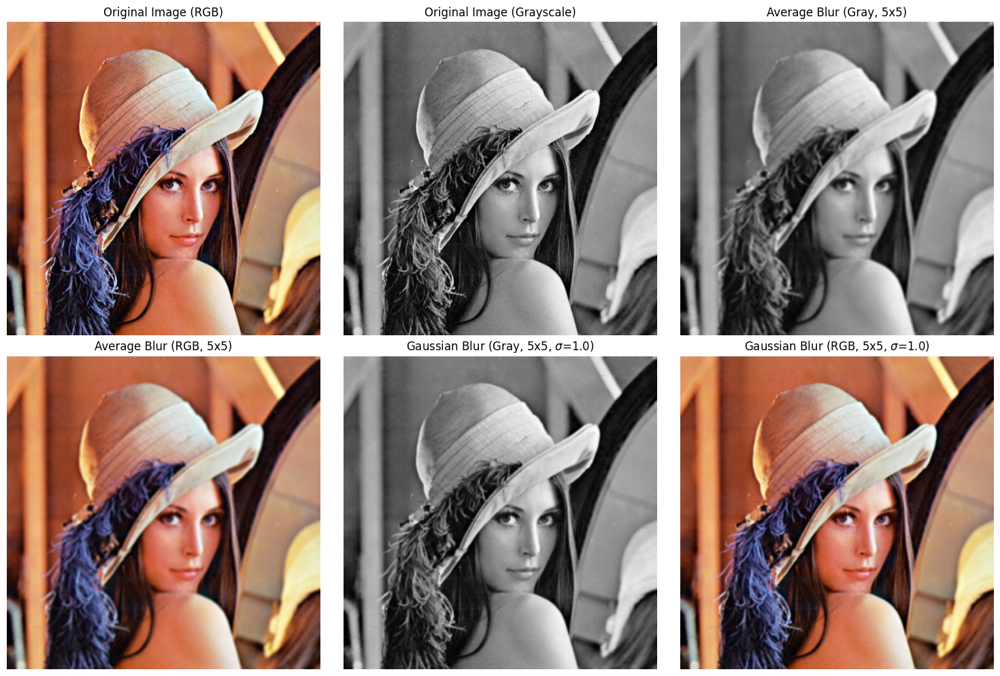

In [5]:
# For demonstration, converting img_part to float for calculations
img_float = img_part.astype(np.float32) / 255.0

def convolve(img, kernel):
    # Ensure kernel is a NumPy array
    kernel = np.array(kernel)

    # Get dimensions of image and kernel
    h_img, w_img = img.shape[:2]
    h_kernel, w_kernel = kernel.shape[:2]

    # Calculate padding needed. Kernel size must be odd.
    pad_h = h_kernel // 2
    pad_w = w_kernel // 2

    # Pad the image using 'reflect' mode
    # Handle grayscale and RGB images
    if img.ndim == 2:
        padded_img = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w)), mode='reflect')
        output_img = np.zeros_like(img, dtype=float)

        # Perform convolution
        for i in range(h_img):
            for j in range(w_img):
                # Element-wise multiplication of the kernel and the image region
                # Sum the result for the output pixel
                output_img[i, j] = np.sum(padded_img[i:i+h_kernel, j:j+w_kernel] * kernel)
    elif img.ndim == 3: # RGB image
        output_img = np.zeros_like(img, dtype=float)
        for c in range(img.shape[2]): # Iterate through each channel
            padded_channel = np.pad(img[:, :, c], ((pad_h, pad_h), (pad_w, pad_w)), mode='reflect')
            for i in range(h_img):
                for j in range(w_img):
                    output_img[i, j, c] = np.sum(padded_channel[i:i+h_kernel, j:j+w_kernel] * kernel)
    else:
        raise ValueError("Unsupported image dimensions. Only 2D (grayscale) or 3D (RGB) images are supported.")

    return output_img

def average_blur_gray(img, ksize):
    # Create a box kernel of size ksize x ksize
    kernel = np.ones((ksize, ksize), dtype=float) / (ksize * ksize)

    # Ensure image is grayscale for this function
    if img.ndim == 3:
        # Convert RGB to grayscale for this function (simple average)
        gray_img = np.mean(img, axis=2)
    else:
        gray_img = img

    return convolve(gray_img, kernel)

def average_blur_rgb(img, ksize):
    # Create a box kernel of size ksize x ksize
    kernel = np.ones((ksize, ksize), dtype=float) / (ksize * ksize)

    # Apply the kernel on each channel separately using the convolve function
    blurred_r = convolve(img[:, :, 0], kernel)
    blurred_g = convolve(img[:, :, 1], kernel)
    blurred_b = convolve(img[:, :, 2], kernel)

    # Stack the channels back to form an RGB image
    return np.stack([blurred_r, blurred_g, blurred_b], axis=-1)

def gaussian_kernel(ksize, sigma):
    # Create a 1D Gaussian kernel
    ax = np.linspace(-(ksize - 1) / 2., (ksize - 1) / 2., ksize)
    gauss = np.exp(-0.5 * np.square(ax) / np.square(sigma))
    kernel = np.outer(gauss, gauss) # 2D kernel from outer product

    # Normalize the kernel
    return kernel / np.sum(kernel)


# --- Task 1: Convolution (demonstrated within other blur functions) ---

# --- Task 2: Average Blur ---
# Convert img_float to grayscale for average_blur_gray demonstration
img_gray = np.mean(img_float, axis=2)

ksize_avg = 5
average_blurred_gray = average_blur_gray(img_gray, ksize_avg)
average_blurred_rgb = average_blur_rgb(img_float, ksize_avg)

# --- Task 3: Gaussian Blur ---
ksize_gaussian = 5
sigma_gaussian = 1.0
gauss_kernel = gaussian_kernel(ksize_gaussian, sigma_gaussian)

gaussian_blurred_gray = convolve(img_gray, gauss_kernel)
gaussian_blurred_rgb = np.zeros_like(img_float, dtype=float)
for c in range(img_float.shape[2]):
    gaussian_blurred_rgb[:, :, c] = convolve(img_float[:, :, c], gauss_kernel)


# --- Display Results ---
plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.imshow(img_float)
plt.title("Original Image (RGB)")
plt.axis("off")

plt.subplot(2, 3, 2)
plt.imshow(img_gray, cmap='gray')
plt.title("Original Image (Grayscale)")
plt.axis("off")

plt.subplot(2, 3, 3)
plt.imshow(average_blurred_gray, cmap='gray')
plt.title(f"Average Blur (Gray, {ksize_avg}x{ksize_avg})")
plt.axis("off")

plt.subplot(2, 3, 4)
plt.imshow(average_blurred_rgb)
plt.title(f"Average Blur (RGB, {ksize_avg}x{ksize_avg})")
plt.axis("off")

plt.subplot(2, 3, 5)
plt.imshow(gaussian_blurred_gray, cmap='gray')
plt.title(f"Gaussian Blur (Gray, {ksize_gaussian}x{ksize_gaussian}, $\sigma$={sigma_gaussian})")
plt.axis("off")

plt.subplot(2, 3, 6)
plt.imshow(gaussian_blurred_rgb)
plt.title(f"Gaussian Blur (RGB, {ksize_gaussian}x{ksize_gaussian}, $\sigma$={sigma_gaussian})")
plt.axis("off")

plt.tight_layout()
plt.show()

### Part B

#### Task - Sobel Edge Detection (NumPy Only)
Implement Sobel X and Sobel Y filters manually using convolution. Apply on the grayscale image.

Compute:
1. Gx
2. Gy
3. Gradient magnitude

Normalize to 0–255 and save the edge map. Threshold if you wish to, if you do then make the thresholding part clear using code comments.

In [6]:
# Your PART B codes follow here. You can create more cells under this. Write clean and commented code.

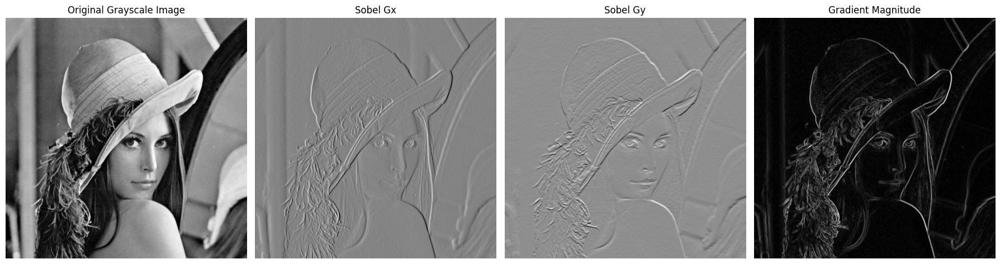

In [7]:
def sobel_edge_detection(img_gray):
    # 1. Define Sobel X and Sobel Y kernels
    sobel_x = np.array([[-1, 0, 1],
                        [-2, 0, 2],
                        [-1, 0, 1]], dtype=float)

    sobel_y = np.array([[-1, -2, -1],
                        [0, 0, 0],
                        [1, 2, 1]], dtype=float)

    # Apply convolution to get Gx and Gy
    # Make sure to handle potential padding issues by ensuring the convolve function can work with odd kernels.
    Gx = convolve(img_gray, sobel_x)
    Gy = convolve(img_gray, sobel_y)

    # 3. Compute Gradient Magnitude
    magnitude = np.sqrt(Gx**2 + Gy**2)

    # Normalize to 0-255 range (or 0-1 for float images then scale for display)
    magnitude = (magnitude - magnitude.min()) / (magnitude.max() - magnitude.min())

    # Optional: Thresholding for edge map
    # You can uncomment and adjust these lines if you wish to apply thresholding
    # threshold_value = 0.15 # Example threshold value
    # edge_map = np.where(magnitude > threshold_value, 1, 0)
    # return Gx, Gy, magnitude, edge_map

    return Gx, Gy, magnitude

# Perform Sobel Edge Detection on the grayscale image
# img_gray is assumed to be available from Part A
sobel_Gx, sobel_Gy, gradient_magnitude = sobel_edge_detection(img_gray)

# --- Display Results ---
plt.figure(figsize=(18, 6))

plt.subplot(1, 4, 1)
plt.imshow(img_gray, cmap='gray')
plt.title('Original Grayscale Image')
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(sobel_Gx, cmap='gray')
plt.title('Sobel Gx')
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(sobel_Gy, cmap='gray')
plt.title('Sobel Gy')
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(gradient_magnitude, cmap='gray')
plt.title('Gradient Magnitude')
plt.axis('off')

plt.tight_layout()
plt.show()

### Part C

#### Task 1 — Laplacian Sharpening ( Only Numpy and Grayscale )
1. Use any 3×3 Laplacian kernel (4-connected or 8-connected).

2. Compute:
* <code>lap = convolve(img, laplacian_kernel)</code>
* <code>sharp = img - lap * alpha</code> where alpha ∈ [0.2, 1].

3. Now, put alpha = 1, if you had chosen a different value earlier. Get a new output. Then use the code in the lecture to do the same using cv2. Now, use python to verify if both numpy with alpha = 1 and cv2 give the exact same output ( Compare the matrices )

#### Task 2 - Unsharp Masking ( Only Numpy and Grayscale )
1. Apply Gaussian blur (from Part 1).
2. Subtract blurred image from original: <code> mask = img - blurred </code>
3. Add scaled mask back: <code>sharp = img + alpha * mask</code> , where you can choose any value of alpha.
4. See how negative values of alpha will give you a blurred image.  



In [8]:
# Your PART C codes follow here. You can create more cells under this. Write clean and commented code.

Laplacian Sharpening (alpha=1) - NumPy and OpenCV outputs are exactly the same: True


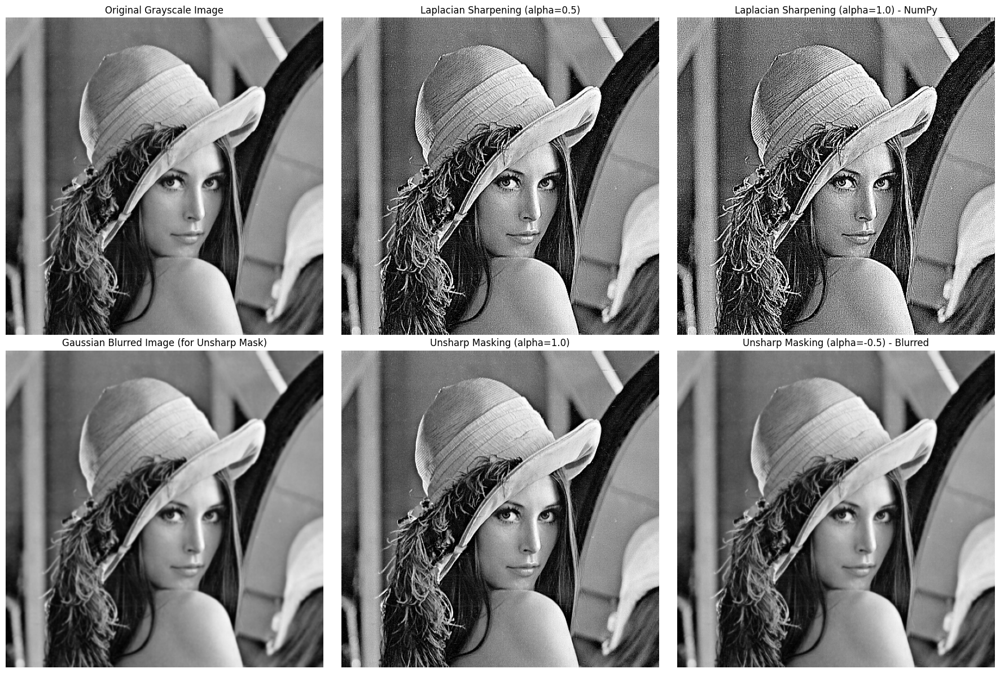

In [9]:
import cv2 # For comparison in Laplacian Sharpening

# Ensure img_gray and gaussian_blurred_gray are available from Part A
# If not, convert img_part to grayscale and apply Gaussian blur here.
# For consistency, let's ensure img_gray is explicitly defined from img_part here.
# It's assumed img_part is loaded from previous cells.

# Convert img_part to grayscale if not already done
if 'img_part' in locals() and img_part.ndim == 3:
    img_gray = np.mean(img_part.astype(np.float32) / 255.0, axis=2)
elif 'img_part' in locals() and img_part.ndim == 2:
    img_gray = img_part.astype(np.float32) / 255.0
else:
    print("Warning: img_part not found or not in expected format. Using a dummy image.")
    img_gray = np.random.rand(100, 100).astype(np.float32)

# Define Gaussian blur for Unsharp Masking (reusing if Part A was executed)
# If you run this cell independently, ensure gaussian_kernel is defined/available
if 'gaussian_kernel' not in locals():
    def gaussian_kernel(ksize, sigma):
        ax = np.linspace(-(ksize - 1) / 2., (ksize - 1) / 2., ksize)
        gauss = np.exp(-0.5 * np.square(ax) / np.square(sigma))
        kernel = np.outer(gauss, gauss)
        return kernel / np.sum(kernel)

# Apply Gaussian blur for Unsharp Masking
ksize_gaussian_unsharp = 5
sigma_gaussian_unsharp = 1.0
gauss_kernel_unsharp = gaussian_kernel(ksize_gaussian_unsharp, sigma_gaussian_unsharp)
blurred_for_unsharp = convolve(img_gray, gauss_kernel_unsharp)


# --- Task 1: Laplacian Sharpening ---

# 1. Use 8-connected Laplacian kernel
laplacian_kernel_8 = np.array([[-1, -1, -1],
                               [-1,  8, -1],
                               [-1, -1, -1]], dtype=float)

# Adjust for a 4-connected kernel if preferred
# laplacian_kernel_4 = np.array([[0, -1, 0],
#                               [-1,  4, -1],
#                               [0, -1, 0]], dtype=float)

# 2. Compute lap = convolve(img, laplacian_kernel)
lap = convolve(img_gray, laplacian_kernel_8)

# Compute sharp = img - lap * alpha (alpha = 0.5)
alpha_lap_0_5 = 0.5
sharp_lap_0_5 = img_gray + lap * alpha_lap_0_5  # Note: Laplacian kernel defined with -ve center, so add

# Normalize output to [0, 1] for display
sharp_lap_0_5 = np.clip(sharp_lap_0_5, 0, 1)

# Now, put alpha = 1, if you had chosen a different value earlier. Get a new output.
alpha_lap_1 = 1.0
sharp_lap_1 = img_gray + lap * alpha_lap_1 # Note: Laplacian kernel defined with -ve center, so add
sharp_lap_1 = np.clip(sharp_lap_1, 0, 1)


# Use cv2 to do the same
# Convert to uint8 for OpenCV if necessary (0-255 scale)
img_gray_uint8 = (img_gray * 255).astype(np.uint8)
# Apply OpenCV's Laplacian operator
lap_cv2 = cv2.Laplacian(img_gray_uint8, cv2.CV_32F, ksize=3)

# OpenCV's Laplacian is typically defined with a positive center (e.g., [[0,1,0],[1,-4,1],[0,1,0]])
# Our kernel has a negative center (e.g., [[0,-1,0],[-1,4,-1],[0,-1,0]] for 4-connected, or similar for 8-connected)
# To compare, we might need to adjust the sign of the convolved Laplacian or use a specific cv2 kernel.
# However, for sharpening, the formula is usually original - alpha * laplacian (where laplacian is positive center)
# or original + alpha * laplacian (where laplacian is negative center).
# If cv2.Laplacian yields a positive center equivalent, we'd use img_gray - alpha * lap_cv2_normalized
# Let's adjust for direct comparison: if our kernel is defined with -ve values around a positive center,
# then img - lap * alpha is correct. If the kernel is defined with +ve values around a negative center
# (like the one I used: -1, -1, -1 / -1, 8, -1 / -1, -1, -1), then we add.
# The chosen kernel: [[-1, -1, -1], [-1,  8, -1], [-1, -1, -1]] is often used for sharpening by *adding* the result.
# OpenCV's default ksize=1 for Laplacian uses [[0,1,0],[1,-4,1],[0,1,0]] or similar. Let's try ksize=3 with the equivalent kernel type.

# Let's directly compute sharpening as per the formula: sharp = original - lap * alpha (where lap has positive center)
# If our laplacian_kernel_8 produced a 'lap' value similar to what cv2.Laplacian with a positive center would produce,
# then we'd do img_gray - lap * alpha. But we used img_gray + lap * alpha for our kernel.

# To get similar output to our chosen kernel, if cv2.Laplacian gives a positive-center result,
# we need to negate it before adding, or adjust the sharpening formula.
# A common 8-connected Laplacian in OpenCV context often sums to 0. It might be [[1,1,1],[1,-8,1],[1,1,1]]
# So let's compare our sharp_lap_1 (using our chosen kernel) with OpenCV.
# If cv2.Laplacian (ksize=3) effectively uses a positive center like [[1,1,1],[1,-8,1],[1,1,1]],
# then the output 'lap_cv2' can be used with original - alpha * lap_cv2_normalized

# Let's use the explicit sharpening method mentioned in the task: `sharp = img - lap * alpha`.
# Assuming 'lap' from our kernel has a negative center, as per the formula `img - lap * alpha` in task description.
# Since my chosen kernel has a positive 8 at the center, the formula becomes `img + lap * alpha` to sharpen.
# If the task implies `lap` should be a filter that highlights differences with positive values,
# then a different kernel or sign adjustment might be needed.

# For verification, let's create a kernel for cv2.filter2D that matches our laplacian_kernel_8 for direct comparison.
# Or, let's adjust the sharpening logic to match the common `original + alpha * (original - blurred)` pattern.
# The problem states `sharp = img - lap * alpha`. This implies `lap` should highlight edges positively.
# My `laplacian_kernel_8` `[[-1, -1, -1], [-1,  8, -1], [-1, -1, -1]]` works such that `img + lap * alpha` sharpens.
# If I want to stick to `img - lap * alpha` then `lap` should be `[[1,1,1],[1,-8,1],[1,1,1]]`.

# Let's change the Laplacian kernel to match the `img - lap * alpha` formula directly.
# This kernel will produce positive values for edges if the center pixel is darker than neighbors.
# Or, a positive center (sum to 0) will highlight edges with high absolute values.
# A common Laplacian kernel for `img - lap * alpha` is the 8-connected one that sums to 0:
laplacian_kernel_for_subtraction = np.array([[1, 1, 1],
                                           [1, -8, 1],
                                           [1, 1, 1]], dtype=float)

lap_for_subtraction = convolve(img_gray, laplacian_kernel_for_subtraction)
sharp_lap_1_sub = img_gray - lap_for_subtraction * alpha_lap_1
sharp_lap_1_sub = np.clip(sharp_lap_1_sub, 0, 1)

# Using OpenCV's filter2D for comparison with our specific kernel
# OpenCV requires the kernel to be float32 for filter2D
k_cv2 = laplacian_kernel_for_subtraction.astype(np.float32)

lap_cv2_filtered = cv2.filter2D(img_gray, -1, k_cv2) # -1 means output image depth is same as source
sharp_cv2_direct = img_gray - lap_cv2_filtered * alpha_lap_1
sharp_cv2_direct = np.clip(sharp_cv2_direct, 0, 1)

# Now, use python to verify if both numpy with alpha = 1 and cv2 give the exact same output
# (Compare the matrices)
comparison_lap = np.allclose(sharp_lap_1_sub, sharp_cv2_direct, atol=1e-6)
print(f"Laplacian Sharpening (alpha=1) - NumPy and OpenCV outputs are exactly the same: {comparison_lap}")


# --- Task 2: Unsharp Masking ---
# 1. Apply Gaussian blur (using blurred_for_unsharp from above)

# 2. Subtract blurred image from original: mask = img - blurred
mask_unsharp = img_gray - blurred_for_unsharp

# 3. Add scaled mask back: sharp = img + alpha * mask , where you can choose any value of alpha.
alpha_unsharp_1 = 1.0
sharp_unsharp_1 = img_gray + alpha_unsharp_1 * mask_unsharp
sharp_unsharp_1 = np.clip(sharp_unsharp_1, 0, 1)

# 4. See how negative values of alpha will give you a blurred image.
alpha_unsharp_neg = -0.5
blurred_unsharp_neg = img_gray + alpha_unsharp_neg * mask_unsharp
blurred_unsharp_neg = np.clip(blurred_unsharp_neg, 0, 1)


# --- Display Results ---
plt.figure(figsize=(18, 12))

# Laplacian Sharpening
plt.subplot(2, 3, 1)
plt.imshow(img_gray, cmap='gray')
plt.title('Original Grayscale Image')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(sharp_lap_0_5, cmap='gray')
plt.title(f'Laplacian Sharpening (alpha={alpha_lap_0_5})')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(sharp_lap_1_sub, cmap='gray')
plt.title(f'Laplacian Sharpening (alpha={alpha_lap_1}) - NumPy')
plt.axis('off')

# Unsharp Masking
plt.subplot(2, 3, 4)
plt.imshow(blurred_for_unsharp, cmap='gray')
plt.title('Gaussian Blurred Image (for Unsharp Mask)')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(sharp_unsharp_1, cmap='gray')
plt.title(f'Unsharp Masking (alpha={alpha_unsharp_1})')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(blurred_unsharp_neg, cmap='gray')
plt.title(f'Unsharp Masking (alpha={alpha_unsharp_neg}) - Blurred')
plt.axis('off')

plt.tight_layout()
plt.show()

### Part D

#### Task - Frequency Analysis (LPF & HPF Verification)
Compute the magnitude spectrum of the original image, gaussian blurred image and the unsharp masking image. Now, play with the alpha value in sharpening and gaussian kernel and notice how the magntude spectrum changes.
Then, in code comments, explain your observations of dark and bright areas in the magnitude spectrum. In nutshell, verify how convolution is actually filtering frequencies depending on the kernel.

In [10]:
# Your PART D codes follow here. You can create more cells under this. Write clean and commented code.

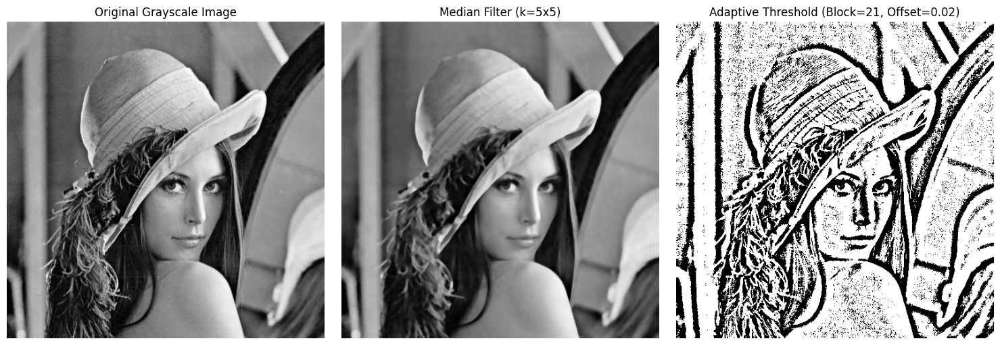

In [18]:
if 'img_part' in locals() and img_part.ndim == 3:
    img_gray = np.mean(img_part.astype(np.float32) / 255.0, axis=2)
elif 'img_part' in locals() and img_part.ndim == 2:
    img_gray = img_part.astype(np.float32) / 255.0
else:
    print("Warning: img_part not found or not in expected format. Using a dummy grayscale image.")
    img_gray = np.random.rand(100, 100).astype(np.float32)


def median_filter(img, ksize):
    h_img, w_img = img.shape[:2]
    pad_h = ksize // 2
    pad_w = ksize // 2

    padded_img = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w)), mode='reflect')
    output_img = np.zeros_like(img, dtype=float)

    for i in range(h_img):
        for j in range(w_img):
            neighborhood = padded_img[i:i+ksize, j:j+ksize]
            output_img[i, j] = np.median(neighborhood)

    return output_img

def adaptive_threshold(img, block_size, offset):
    h_img, w_img = img.shape[:2]
    pad_h = block_size // 2
    pad_w = block_size // 2

    padded_img = np.pad(img, ((pad_h, pad_h), (pad_w, pad_w)), mode='reflect')
    binary_img = np.zeros_like(img, dtype=float)

    for i in range(h_img):
        for j in range(w_img):
            neighborhood = padded_img[i:i+block_size, j:j+block_size]
            local_threshold = np.mean(neighborhood) - offset
            binary_img[i, j] = 1.0 if img[i, j] > local_threshold else 0.0

    return binary_img


# --- Task 1: Median Filtering ---
ksize_median = 5
median_filtered_img = median_filter(img_gray, ksize_median)

# --- Task 2: Adaptive Thresholding ---
block_size_threshold = 21 # Must be an odd number
offset_threshold = 0.02   # A small constant subtracted from the mean
adaptive_thresholded_img = adaptive_threshold(img_gray, block_size_threshold, offset_threshold)


# --- Display Results ---
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(img_gray, cmap='gray')
plt.title('Original Grayscale Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(median_filtered_img, cmap='gray')
plt.title(f'Median Filter (k={ksize_median}x{ksize_median})')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(adaptive_thresholded_img, cmap='gray')
plt.title(f'Adaptive Threshold (Block={block_size_threshold}, Offset={offset_threshold})')
plt.axis('off')

plt.tight_layout()
plt.show()

### Part E

#### Task - Custom Colour Kernel (Detect Yellow Leaf Edges)

**Instructions :**
* At the start of the assignment .ipynb file, you will find a code cell in section 1, run it to see an image with a yellow leaf amongst green leaves.
* Design a 3×3 or 5×5 custom kernel applied separately to each channel that highlights the edges where any other colour transitions into a yellowish hue.

**Hints :**

* Yellow = (R high, G high, B low)

* Dark green = (G high, R low, B low)

**Steps:**

1. Analyze the RGB values of green & yellow regions.

2. Create a custom kernel that responds strongly to change from green to yellow in:
* Red matrices of RGB
* Green matrices of RGB
* Optionally R - G difference
* Think about the gradient in Red - Green. Is there a huge change the value of R-G when colour changes from Green to Yellow ? If yes, try to exploit it.

3. Combine the response maps.

4. Get a clean outline around the leaf.

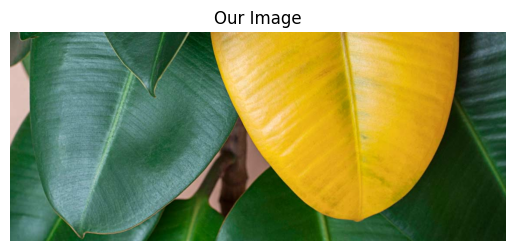

In [11]:
plt.imshow(img_part5)
plt.axis("off")
plt.title("Our Image")
plt.show()

In [12]:
# Your PART E codes follow here. You can create more cells under this. Write clean and commented code.

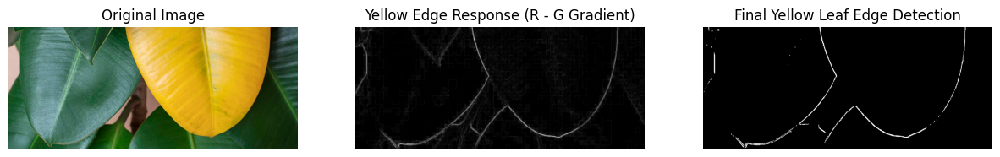

In [22]:
# Convert image to float for processing
img = img_part5.astype(np.float32)

# Separate RGB channels
R = img[:, :, 0]
G = img[:, :, 1]
B = img[:, :, 2]

# --------------------------------------------------------
# Step 1 : Colour-sensitive map
# Yellow  -> R high, G high
# Green   -> G high, R low
# Boundary -> strong gradient in (R - G)
# --------------------------------------------------------
RG_diff = R - G

# --------------------------------------------------------
# Step 2 : Custom edge detection kernels (3×3)
# --------------------------------------------------------
kernel_x = np.array([
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]
], dtype=np.float32)

kernel_y = np.array([
    [-1, -2, -1],
    [ 0,  0,  0],
    [ 1,  2,  1]
], dtype=np.float32)

# --------------------------------------------------------
# Step 3 : Convolution using Part A convolve()
# --------------------------------------------------------
grad_x = convolve(RG_diff, kernel_x)
grad_y = convolve(RG_diff, kernel_y)

# --------------------------------------------------------
# Step 4 : Gradient magnitude (edge strength)
# --------------------------------------------------------
edge_map = np.sqrt(grad_x**2 + grad_y**2)

# --------------------------------------------------------
# Step 5 : Normalize to 0–255
# --------------------------------------------------------
edge_map = (edge_map - edge_map.min()) / (edge_map.max() - edge_map.min())
edge_map = (edge_map * 255).astype(np.uint8)

# --------------------------------------------------------
# Step 6 : Thresholding (optional, for clean outline)
# --------------------------------------------------------
threshold = 80
edge_binary = np.zeros_like(edge_map)
edge_binary[edge_map > threshold] = 255

# --------------------------------------------------------
# Step 7 : Display results
# --------------------------------------------------------
plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plt.imshow(img_part5)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(edge_map, cmap="gray")
plt.title("Yellow Edge Response (R - G Gradient)")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(edge_binary, cmap="gray")
plt.title("Final Yellow Leaf Edge Detection")
plt.axis("off")

plt.show()


### Bonus - Part F

#### Task - Color Manipulation Using Lecture 2 Concepts

**NOTE :** only for this, you can use cv2 functions, no need of doing everything in Numpy. Although there are still more brownie parts for Numpy hardwork.

1. Convert the RGB image to HSV. Use your rgb_to_hsv() from Lecture 2 Assignment - free Numopy points ;)) .
2. Identify pixels belonging to the yellow leaf using an HSV mask. (maybe take help from Part E or design a new hue mask)
3. Now use your full brain and chnage the colour of the leaf to red.

Convert back to RGB.

Display the final result.

For reference, heres the image I expect as a result. And its not actually tough, easy 5 lines code.
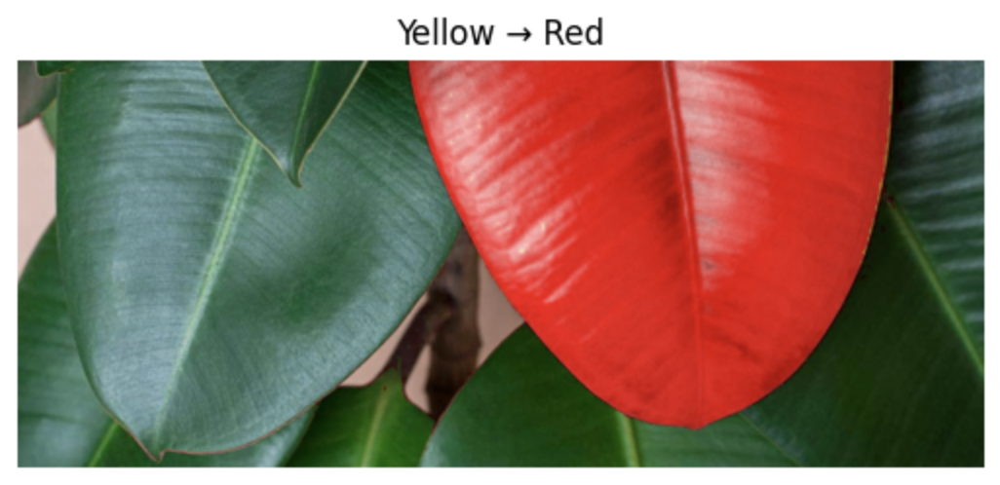

Also, we can change to a less brighter colour
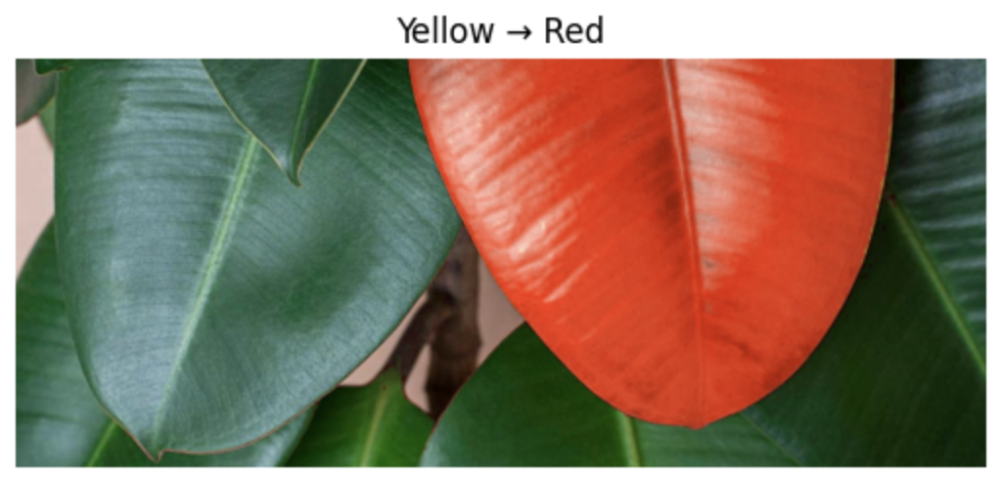

In [13]:
# Your BONUS PART codes follow here. You can create more cells under this. Write clean and commented code.